In [3]:
pip install numpy==1.24 --user

     ---------------------------------------- 14.9/14.9 MB 2.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.0
    Uninstalling numpy-1.23.0:
      Successfully uninstalled numpy-1.23.0
Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.5.0 requires daal==2021.4.0, which is not installed.
tensorflow-intel 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.24.0 which is incompatible.
numba 0.55.1 requires numpy<1.22,>=1.18, but you have numpy 1.24.0 which is incompatible.
scipy 1.7.3 requires numpy<1.23.0,>=1.16.5, but you have numpy 1.24.0 which is incompatible.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate
from math import pi, cos, sin,atan
import math
import os
import pickle
from sklearn.cluster import DBSCAN

from numpy.random import randint
from numpy.random import rand

import json

from paretoset import paretoset
import pandas as pd

import pygad

from bayes_opt import BayesianOptimization

import datetime

import warnings
warnings.filterwarnings('ignore')

## B-spline curve modeling

In [3]:
MasterColors = np.zeros((256,256,256)).astype(int)
MasterNonColors = np.zeros((256,256,256)).astype(int)

In [4]:
#Getting a count of each pixel that is skin
def MSK(s):
    return s.replace('\\ORI\\','\\GT\\')
images = 0
for filename in os.scandir("..\\Data\\sfa\\ORI"):
    if filename.is_file() and filename.path[-4:]==".jpg":
        images+=1
            
        img = cv2.cvtColor(cv2.imread(filename.path),cv2.COLOR_BGR2HSV)
        msk = cv2.imread(MSK(filename.path),0)
            
        skin = img[msk!=0]
        skin = skin.reshape(-1,3)
    
        for i in range(skin.shape[0]):
            MasterColors[skin[i,0],skin[i,1],skin[i,2]] += 1
print("Done processing ",images," images.")

Done processing  1115  images.


In [5]:
images = 0
for filename in os.scandir("..\\Data\\sfa\\ORI"):
    if filename.is_file() and filename.path[-4:]==".jpg":
        images+=1
            
        img = cv2.cvtColor(cv2.imread(filename.path),cv2.COLOR_BGR2HSV)
        msk = cv2.imread(MSK(filename.path),0)
            
        skin = img[msk==0]
        skin = skin.reshape(-1,3)
    
        for i in range(skin.shape[0]):
            MasterNonColors[skin[i,0],skin[i,1],skin[i,2]] += 1
print("Done processing ",images," images.")

Done processing  1115  images.


In [6]:
#Extracting the pixels that are skin
Points = np.argwhere(MasterColors>0)

In [7]:
class Ellipse:
    def __init__(self,clus,H1,H2,S1,S2,T):
        self.cluster = clus
        self.HMoy = H1
        self.SMoy = S1
        self.HEct = H2
        self.SEct = S2
        self.thet = 0 if np.isnan(T) else T
        self.Th = 2
    def __str__(self):
        return "Of cluster:"+str(self.cluster)+" with Th "+str(self.Th)+" At("+str(self.HMoy)+","+str(self.SMoy)+"),with("+str(self.HEct)+","+str(self.SEct)+"), theta "+str(self.thet)
    def is_it_in(self,H,S):
        return (pow((cos(self.thet)*(H-self.HMoy) + sin(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.HEct,2)) + (pow((-sin(self.thet)*(H-self.HMoy) + cos(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.SEct,2)) <= 1
    def are_they_in(self,H,S):
        return (np.power((cos(self.thet)*(H-self.HMoy) + sin(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.HEct,2)) + (np.power((-sin(self.thet)*(H-self.HMoy) + cos(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.SEct,2)) <= 1
    def F(self):
        print(Points)

In [8]:
class CLUSTER:
    def __init__(self,numero):
        self.id = numero
    def fit(self,points):
        valeurs = np.unique(points[:,2])
        self.nbVal = valeurs.shape[0]
        HuesMoyennes = []
        SatsMoyennes = []
        HuesEcartsTy = []
        SatsEcartsTy = []
        thetas = []
        for i in valeurs:
            Hues = points[(points[:,2]==i)][:,0];Sats = points[(points[:,2]==i)][:,1]
            HM = Hues.mean();HE = Hues.std()
            SM = Sats.mean();SE = Sats.std()
            theta = 0 if HE == SE else 0.5 * atan(2* np.corrcoef(Hues,Sats)[0,1] *HE*SE/(HE**2-SE**2))
                
            HuesMoyennes.append(HM);HuesEcartsTy.append(HE)
            SatsMoyennes.append(SM);SatsEcartsTy.append(SE)
            thetas.append(theta)
        
        self.min = valeurs.min()
        self.max = valeurs.max()
        K = min(3,valeurs.shape[0]-1)
        t, c, k = interpolate.splrep(valeurs, HuesMoyennes, s=0,k = K)
        self.HueMoy = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, SatsMoyennes, s=0,k = K)
        self.SatMoy = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, HuesEcartsTy, s=0,k = K)
        self.HueEct = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, SatsEcartsTy, s=0,k = K)
        self.SatEct = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, thetas, s=0,k = K)
        self.Theta = interpolate.BSpline(t, c, k, extrapolate=True)
    def __str__(self):
        return 'ID: '+str(self.id)+' Nb val '+str(self.nbVal)

In [9]:
#Finding which ellipses exist at each intensity level
ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

In [ ]:
# Drawing stuff supposing that Th (Le seuil) is 2

# Fonction cout

In [10]:
def EvaluationGlobale():
    P = np.argwhere(MasterColors!=0)
    t = 0;vt = 0
    st = 0;sst = 0
    
    for i in range(256):
        p = P[P[:,2]==i]
        if(p.shape[0]<1):
            continue
        R = np.zeros((p.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(p[:,0],p[:,1]).reshape((-1,1))
        R=(R>0).flatten()
        t += R.sum()
        vt += p.shape[0]
        st += MasterColors[p[:,0],p[:,1],p[:,2]][R].sum()
    sst = MasterColors[P[:,0],P[:,1],P[:,2]].sum()
    print(t,vt,t/vt,st,sst,st/sst)
    P = np.argwhere(MasterNonColors!=0)
    f = 0;vf = 0
    sf = 0;ssf = 0
    
    for i in range(256):
        p = P[P[:,2]==i]
        if(p.shape[0]<1):
            continue
        R = np.zeros((p.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(p[:,0],p[:,1]).reshape((-1,1))
        R = (R>0).flatten()
        f += (R>0).sum()
        vf += p.shape[0]
        sf += MasterNonColors[p[:,0],p[:,1],p[:,2]][R].sum()
    ssf = MasterNonColors[P[:,0],P[:,1],P[:,2]].sum()

    print(f,vf,f/vf,sf,ssf,sf/ssf)
    return (t/vt,f/vf,st/sst,sf/ssf)


In [11]:
def getMask(img):
    I = img.reshape((img.shape[0]*img.shape[1],3))
    msk = np.zeros((img.shape[0],img.shape[1]))
    for i in range(256):
        P = np.argwhere(img[:,:,2]==i)
        
        R = np.zeros((P.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(img[P[:,0],P[:,1],0],img[P[:,0],P[:,1],1]).reshape((-1,1))
        R=(R>0).flatten()
        
        msk[P[:,0],P[:,1]] = 1+R-1
    return msk

# Trouver les seuils Th

In [11]:
ResV = {2:{},3:{}}
ResF = {2:{},3:{}}
RES  = {2:{},3:{}}

In [90]:
EPS = [2]*18+[3]*20
MIN_Sam = [i for i in range(9,27)]+[i for i in range(15,35)]

for ID in range(len(EPS)):
    clustering = DBSCAN(eps=EPS[ID], min_samples=MIN_Sam[ID]).fit(Points)
    nbCluster = clustering.labels_.max()
    try:
        Clusters = {}
        for C in range(nbCluster+1):
            Clus = CLUSTER(C)
            Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
            Clusters[C] = Clus

        ELLIPSES = {}
        for i in range(256):
            ELLIPSES[i] = []
        ELLIPSESFLAT = []

        for C in range(nbCluster+1):
            Clus = Clusters[C]
            for v in range(Clus.min,Clus.max+1):
                e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
                ELLIPSES[v].append(e)
                ELLIPSESFLAT.append(e)
            
        ResV[EPS[ID]][MIN_Sam[ID]]={}
        ResF[EPS[ID]][MIN_Sam[ID]]={}
        RES[EPS[ID]][MIN_Sam[ID]]={}
            
        for Th in np.arange(1,2.8,0.1): #Pour chaque valeur de V
       
            for e in ELLIPSESFLAT:
                e.Th = Th
            print("Th = ",Th," eps = ",EPS[ID]," MinSamp = ",MIN_Sam[ID])
            V1,F1,V,F = EvaluationGlobale()
            ResV[EPS[ID]][MIN_Sam[ID]][Th] = [V1,V]
            ResF[EPS[ID]][MIN_Sam[ID]][Th] = [F1,F]
            RES[EPS[ID]][MIN_Sam[ID]][Th] = {"Clus":clustering}
            print("-----------------------------------------------")
    except:
        print("Failed for ",EPS[ID],MIN_Sam[ID])

Failed for  2 9
Failed for  2 10
Failed for  2 11
Th =  1.0  eps =  2  MinSamp =  12
70982 431384 0.1645448139013037 21911352 131235458 0.16696213305401045
74973 773989 0.09686571772983854 5279826 319095166 0.016546242508731705
-----------------------------------------------
Th =  1.1  eps =  2  MinSamp =  12
82374 431384 0.19095284016097028 24395219 131235458 0.18588893102350434
85538 773989 0.11051578252404104 6530215 319095166 0.020464788238127054
-----------------------------------------------
Th =  1.2000000000000002  eps =  2  MinSamp =  12
93702 431384 0.21721250672254883 27139816 131235458 0.20680246340131644
96269 773989 0.12438032065055188 7950978 319095166 0.024917262457056465
-----------------------------------------------
Th =  1.3000000000000003  eps =  2  MinSamp =  12
105511 431384 0.2445871891400701 30817674 131235458 0.23482734368938615
107797 773989 0.13927458917374794 9678702 319095166 0.030331709882436764
-----------------------------------------------
Th =  1.4000

194140 431384 0.45003987166886117 49496927 131235458 0.3771612318372067
224092 773989 0.2895286625520518 159711212 319095166 0.5005127905948911
-----------------------------------------------
Th =  2.7000000000000015  eps =  2  MinSamp =  13
198570 431384 0.4603091445208909 50780686 131235458 0.38694333660953123
233267 773989 0.3013828361901784 161236221 319095166 0.5052919573215973
-----------------------------------------------
Failed for  2 14
Failed for  2 15
Th =  1.0  eps =  2  MinSamp =  16
36964 431384 0.0856869981269588 9164808 131235458 0.06983484600632857
26065 773989 0.03367618919648729 3978422 319095166 0.012467822843797013
-----------------------------------------------
Th =  1.1  eps =  2  MinSamp =  16
44003 431384 0.10200424679635776 10359900 131235458 0.0789413178258577
31062 773989 0.040132353302178715 5045434 319095166 0.015811690484837992
-----------------------------------------------
Th =  1.2000000000000002  eps =  2  MinSamp =  16
52048 431384 0.120653524470077

110986 431384 0.2572788976874432 14719693 131235458 0.11216246907905027
93815 773989 0.12120973295486112 14982508 319095166 0.04695310238576287
-----------------------------------------------
Th =  2.5000000000000013  eps =  2  MinSamp =  17
113852 431384 0.2639226304174471 15024356 131235458 0.11448396819707064
98379 773989 0.12710645758531453 16345722 319095166 0.05122522601924969
-----------------------------------------------
Th =  2.6000000000000014  eps =  2  MinSamp =  17
116505 431384 0.2700726035272518 15388854 131235458 0.11726140354537415
102804 773989 0.13282359310016034 17848208 319095166 0.05593380878731331
-----------------------------------------------
Th =  2.7000000000000015  eps =  2  MinSamp =  17
119192 431384 0.2763013927266658 15710343 131235458 0.11971111496406711
107149 773989 0.13843736797292985 18898086 319095166 0.05922398084839681
-----------------------------------------------
Th =  1.0  eps =  2  MinSamp =  18
26548 431384 0.061541457263134466 6216818 131

39075 773989 0.05048521361414697 4595577 319095166 0.014401901030365342
-----------------------------------------------
Th =  2.300000000000001  eps =  2  MinSamp =  20
68600 431384 0.15902305138809042 9306850 131235458 0.07091719068790082
42014 773989 0.054282425202425356 4751466 319095166 0.01489043553859415
-----------------------------------------------
Th =  2.4000000000000012  eps =  2  MinSamp =  20
70847 431384 0.16423186766314932 9511823 131235458 0.07247906278499824
45067 773989 0.058226925705662486 4996971 319095166 0.015659814163402275
-----------------------------------------------
Th =  2.5000000000000013  eps =  2  MinSamp =  20
73044 431384 0.16932477792407694 9744719 131235458 0.07425370512289445
48239 773989 0.06232517516398812 5255141 319095166 0.016468883141902563
-----------------------------------------------
Th =  2.6000000000000014  eps =  2  MinSamp =  20
75067 431384 0.17401433525582777 9945720 131235458 0.07578531100946818
51482 773989 0.06651515719215648 545

51449 431384 0.1192649704207852 7128589 131235458 0.05431907739446454
26024 773989 0.03362321686742318 2201492 319095166 0.00689917063801587
-----------------------------------------------
Th =  2.200000000000001  eps =  2  MinSamp =  22
53740 431384 0.12457578398827958 7308674 131235458 0.05569130562260087
28349 773989 0.0366271355277659 2296884 319095166 0.007198115937613421
-----------------------------------------------
Th =  2.300000000000001  eps =  2  MinSamp =  22
55909 431384 0.1296037868812937 7481790 131235458 0.057010430824267024
30857 773989 0.03986749165685817 2492461 319095166 0.007811027134143424
-----------------------------------------------
Th =  2.4000000000000012  eps =  2  MinSamp =  22
57981 431384 0.13440693210689317 7683398 131235458 0.0585466619852083
33349 773989 0.043087175657535184 2625543 319095166 0.008228087667113077
-----------------------------------------------
Th =  2.5000000000000013  eps =  2  MinSamp =  22
60055 431384 0.13921471357305787 7897988 

9394 773989 0.012137123395810535 661891 319095166 0.0020742746068425242
-----------------------------------------------
Th =  2.000000000000001  eps =  2  MinSamp =  24
32227 431384 0.07470606234816313 4295845 131235458 0.03273387440763151
10463 773989 0.013518279975555209 704876 319095166 0.002208983635935118
-----------------------------------------------
Th =  2.100000000000001  eps =  2  MinSamp =  24
34143 431384 0.07914758080967305 4375017 131235458 0.033337156487082936
11520 773989 0.014883932458988435 746731 319095166 0.0023401514017294765
-----------------------------------------------
Th =  2.200000000000001  eps =  2  MinSamp =  24
35881 431384 0.08317647386087569 4445142 131235458 0.033871501404749926
12545 773989 0.016208240685591138 781864 319095166 0.0024502533516913257
-----------------------------------------------
Th =  2.300000000000001  eps =  2  MinSamp =  24
37483 431384 0.08689010255364131 4509167 131235458 0.03435936498198528
13700 773989 0.017700509955567843 82

17886 431384 0.04146189937503477 3153315 131235458 0.024027919344785615
4037 773989 0.005215836400775721 49280 319095166 0.0001544366861389558
-----------------------------------------------
Th =  1.9000000000000008  eps =  2  MinSamp =  26
19437 431384 0.04505730393338649 3243844 131235458 0.0247177405362505
4483 773989 0.005792071980351142 57520 319095166 0.00018025970346413834
-----------------------------------------------
Th =  2.000000000000001  eps =  2  MinSamp =  26
20879 431384 0.04840003338093207 3319384 131235458 0.025293347168415414
4942 773989 0.006385103664263962 59156 319095166 0.0001853867005932644
-----------------------------------------------
Th =  2.100000000000001  eps =  2  MinSamp =  26
22198 431384 0.05145763403371474 3390250 131235458 0.02583333842596107
5396 773989 0.006971675308047013 64952 319095166 0.00020355056083801659
-----------------------------------------------
Th =  2.200000000000001  eps =  2  MinSamp =  26
23378 431384 0.05419301596721251 3448554

276293 773989 0.35697277351486906 38746564 319095166 0.12142635843001144
-----------------------------------------------
Th =  1.7000000000000006  eps =  3  MinSamp =  18
235391 431384 0.5456646514474343 92143144 131235458 0.702120794214015
295279 773989 0.381502837895629 44596219 319095166 0.13975836600420327
-----------------------------------------------
Th =  1.8000000000000007  eps =  3  MinSamp =  18
249510 431384 0.5783941917178198 95005579 131235458 0.72393223941048
313990 773989 0.40567760006925163 51691620 319095166 0.16199436878965442
-----------------------------------------------
Th =  1.9000000000000008  eps =  3  MinSamp =  18
263169 431384 0.6100573966581978 97452272 131235458 0.7425757755194484
333294 773989 0.4306185230022649 56913950 319095166 0.1783604268075938
-----------------------------------------------
Th =  2.000000000000001  eps =  3  MinSamp =  18
276237 431384 0.6403505925115442 99430461 131235458 0.757649361805862
353708 773989 0.4569935748440869 62279438

198721 431384 0.4606591806835673 79205695 131235458 0.6035388317081196
244125 773989 0.3154114593359854 30907841 319095166 0.0968608875760907
-----------------------------------------------
Th =  1.6000000000000005  eps =  3  MinSamp =  20
212824 431384 0.49335163102943086 82553754 131235458 0.6290506792760231
261657 773989 0.33806294404700843 35792718 319095166 0.11216941468803071
-----------------------------------------------
Th =  1.7000000000000006  eps =  3  MinSamp =  20
226823 431384 0.5258029968659014 85757372 131235458 0.6534619020417485
279643 773989 0.3613010004018145 41297067 319095166 0.12941928114323112
-----------------------------------------------
Th =  1.8000000000000007  eps =  3  MinSamp =  20
240043 431384 0.5564485470022068 88334821 131235458 0.6731017847325987
297145 773989 0.3839137248720589 48400934 319095166 0.1516818151986671
-----------------------------------------------
Th =  1.9000000000000008  eps =  3  MinSamp =  20
253092 431384 0.5866976985701834 907

193923 773989 0.25055007241704985 19601628 319095166 0.06142878391332321
-----------------------------------------------
Th =  1.4000000000000004  eps =  3  MinSamp =  22
174214 431384 0.40384900691727094 68764558 131235458 0.5239784967260906
211084 773989 0.272722222150444 23110662 319095166 0.07242560985709197
-----------------------------------------------
Th =  1.5000000000000004  eps =  3  MinSamp =  22
188807 431384 0.4376773362016208 72236293 131235458 0.5504327420414078
228080 773989 0.2946811905595558 27758889 319095166 0.08699250868626446
-----------------------------------------------
Th =  1.6000000000000005  eps =  3  MinSamp =  22
202612 431384 0.4696789867032621 75707458 131235458 0.5768826440183566
244785 773989 0.31626418463311495 32578675 319095166 0.10209704963064216
-----------------------------------------------
Th =  1.7000000000000006  eps =  3  MinSamp =  22
215941 431384 0.5005772119503736 78501894 131235458 0.598175944187279
261588 773989 0.3379737954932176 37

138491 431384 0.32103879606105 56693600 131235458 0.4319991019500233
168087 773989 0.217169753058506 15110545 319095166 0.0473543525883435
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  24
153560 431384 0.35597055059992955 60803348 131235458 0.46331493733957174
184368 773989 0.23820493572906076 18147461 319095166 0.05687162619066439
-----------------------------------------------
Th =  1.4000000000000004  eps =  3  MinSamp =  24
167889 431384 0.3891868961296664 64290731 131235458 0.48988841872293387
199764 773989 0.2580966912966463 21395697 319095166 0.06705114736836847
-----------------------------------------------
Th =  1.5000000000000004  eps =  3  MinSamp =  24
181879 431384 0.4216173988835933 67658818 131235458 0.5155528774852906
214826 773989 0.2775569161835633 25674116 319095166 0.080459119208343
-----------------------------------------------
Th =  1.6000000000000005  eps =  3  MinSamp =  24
195297 431384 0.45272193683585854 7058

124485 773989 0.1608356191108659 8726892 319095166 0.02734886933385885
-----------------------------------------------
Th =  1.1  eps =  3  MinSamp =  26
115841 431384 0.2685333716595887 42227063 131235458 0.3217656542182373
140638 773989 0.18170542475409857 10964286 319095166 0.034360551861196166
-----------------------------------------------
Th =  1.2000000000000002  eps =  3  MinSamp =  26
130225 431384 0.3018772138048699 46297717 131235458 0.35278359755486205
156385 773989 0.20205067513879396 13331405 319095166 0.041778774549032185
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  26
144041 431384 0.33390436362962 50272794 131235458 0.3830732544858418
171677 773989 0.22180806187168034 16105658 319095166 0.05047289873391564
-----------------------------------------------
Th =  1.4000000000000004  eps =  3  MinSamp =  26
157426 431384 0.36493240361255863 53748668 131235458 0.4095590385336256
186493 773989 0.2409504527842127 19447086 31909

266016 431384 0.6166570851028318 74747227 131235458 0.5695657876242562
357179 773989 0.46147813470217275 179431778 319095166 0.5623143097065908
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  29
93961 431384 0.21781289987574876 32067904 131235458 0.24435396110706606
113869 773989 0.14711966190733977 7392031 319095166 0.02316560007054447
-----------------------------------------------
Th =  1.1  eps =  3  MinSamp =  29
108020 431384 0.2504033529291768 35619789 131235458 0.2714189407560874
128853 773989 0.16647911016823236 9316136 319095166 0.029195478316960777
-----------------------------------------------
Th =  1.2000000000000002  eps =  3  MinSamp =  29
121524 431384 0.2817072492257478 39096587 131235458 0.2979117655839628
143378 773989 0.18524552674521214 11447567 319095166 0.035875087496624755
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  29
134555 431384 0.31191467462863715 42607194 131235458 0.324662

311881 773989 0.40295275514251494 173888985 319095166 0.5449439650865786
-----------------------------------------------
Th =  2.6000000000000014  eps =  3  MinSamp =  30
250770 431384 0.5813150232739276 68098878 131235458 0.5189060871033803
324750 773989 0.41957960642851516 175501945 319095166 0.5499987580507566
-----------------------------------------------
Th =  2.7000000000000015  eps =  3  MinSamp =  30
255414 431384 0.5920803738664392 69238355 131235458 0.5275887786363347
337258 773989 0.43574004281714596 176897234 319095166 0.5543714002862707
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  31
89044 431384 0.2064147024460805 28280986 131235458 0.21549805541121364
106100 773989 0.13708205155370426 6981789 319095166 0.021879958532496226
-----------------------------------------------
Th =  1.1  eps =  3  MinSamp =  31
102498 431384 0.2376026927285203 31633531 131235458 0.24104408581406406
120193 773989 0.15529032066347195 8791364 319095166 0.0275509

229301 431384 0.5315472989262466 60146636 131235458 0.45831086290718775
283483 773989 0.3662623112214773 168860563 319095166 0.5291855878506163
-----------------------------------------------
Th =  2.5000000000000013  eps =  3  MinSamp =  32
235291 431384 0.5454328394191718 61538310 131235458 0.46891526831109925
295944 773989 0.3823620232328883 171484477 319095166 0.5374085704576296
-----------------------------------------------
Th =  2.6000000000000014  eps =  3  MinSamp =  32
240731 431384 0.558043413756653 62987610 131235458 0.4799587776041441
308251 773989 0.39826276600830246 173205367 319095166 0.5428016010747089
-----------------------------------------------
Th =  2.7000000000000015  eps =  3  MinSamp =  32
245454 431384 0.5689918958514919 64192677 131235458 0.4891412578451168
320459 773989 0.41403559998914713 174633520 319095166 0.5472772345288365
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  33
83606 431384 0.19380876434916455 25277041 131235

238119 773989 0.3076516591321065 44391228 319095166 0.1391159526371515
-----------------------------------------------
Th =  2.300000000000001  eps =  3  MinSamp =  34
211856 431384 0.49110769059584963 52234577 131235458 0.3980218288261698
250646 773989 0.3238366436732305 47337239 319095166 0.14834834257564403
-----------------------------------------------
Th =  2.4000000000000012  eps =  3  MinSamp =  34
217944 431384 0.505220406876472 53746252 131235458 0.40954062887485787
262980 773989 0.3397722706653454 50251098 319095166 0.15747997260478713
-----------------------------------------------
Th =  2.5000000000000013  eps =  3  MinSamp =  34
223678 431384 0.518512508577045 55391100 131235458 0.42207419278408737
275029 773989 0.3553396753700634 168638631 319095166 0.528490083738843
-----------------------------------------------
Th =  2.6000000000000014  eps =  3  MinSamp =  34
229125 431384 0.5311393097565047 56763951 131235458 0.43253516896325384
286966 773989 0.37076237517587457 170

In [91]:
with open("ResV2.json", "w") as write_file:
    json.dump(ResV, write_file, indent=4)
with open("ResF2.json", "w") as write_file:
    json.dump(ResF, write_file, indent=4)
with open('RES2.pkl', 'wb') as f:
    pickle.dump(RES, f)

# Loading data

In [13]:
with open("ResF.json", "r") as write_file:
    ResF = json.load(write_file)
with open("ResV.json", "r") as write_file:
    ResV = json.load(write_file)
with open('RES.pkl', 'rb') as f:
    RES = pickle.load(f)

# For global cost function 1 : 

In [13]:
#################################################################################################
# Creating the sets a.k.a the game
#################################################################################################
A = []
B = []
C = []
setV = []
setF = []
for a in ResV.keys():
    for b in ResV[a].keys():
        for c in ResV[a][b].keys():
            setV += [ResV[a][b][c][0]]
            setF += [ResF[a][b][c][0]]
            A += [a];B += [b];C += [c]
            
#################################################################################################
# Trouver l'equilibre
#################################################################################################
JEU = pd.DataFrame({"V": setV, 
                    "F": setF})
mask = paretoset(JEU, sense=["max", "min"])
paretoset_JEU = JEU[mask]
print("Il y a "+str(paretoset_JEU.shape[0])+" optimums de pareto !")
PS = paretoset_JEU.to_numpy()

#### LE MEILLEUR DANS LE SANS QUE la difference entre metric1 et metric2 soit maximale
PS[np.argmax(PS[:,0]-PS[:,1])]
idx = np.array([i for i in range(JEU.shape[0])])[mask][np.argmax(PS[:,0]-PS[:,1])]

bestEPS = A[idx]
bestMinSample = B[idx]
bestTh = C[idx]

print("Le meilleur résultat est ("+str(setV[idx])+", "+str(setF[idx])+") a "+str(idx)+". Pour ("+str(bestEPS)+","+str(bestMinSample)+","+str(bestTh)+")")

#################################################################################################
# Setting our model to the best solution
#################################################################################################
clustering = RES[int(bestEPS)][int(bestMinSample)][float(bestTh)]["Clus"]
nbCluster = clustering.labels_.max()
Clusters = {}
for C in range(nbCluster+1):
    Clus = CLUSTER(C)
    Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
    Clusters[C] = Clus

ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

for C in range(nbCluster+1):
    Clus = Clusters[C]
    for v in range(Clus.min,Clus.max+1):
        e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
        ELLIPSES[v].append(e)
        ELLIPSESFLAT.append(e)

for e in ELLIPSESFLAT:
    e.Th = float(bestTh)
    
#################################################################################################
# Evaluer
#################################################################################################
_=EvaluationGlobale()

Il y a 174 optimums de pareto !
Le meilleur résultat est (0.6238664391817963, 0.4371573756216174) a 299. Pour (3,21,2.100000000000001)
269126 431384 0.6238664391817963 91809807 131235458 0.6995808023163984
338355 773989 0.4371573756216174 60389756 319095166 0.18925312080722653


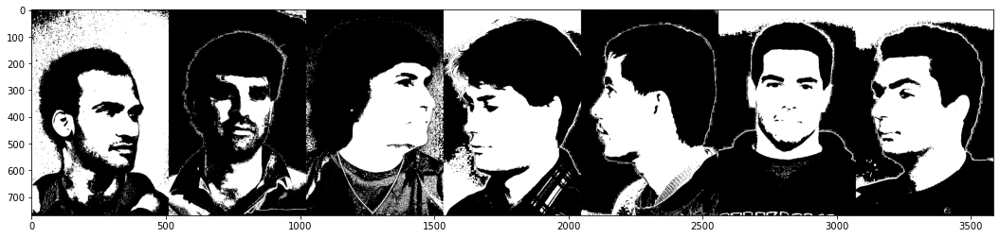

In [14]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (5).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (50).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])

MASK = getMask(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2HSV))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

# For global cost function 2 (the weighted one):

In [14]:
#################################################################################################
# Creating the sets a.k.a the game
#################################################################################################
A = []
B = []
C = []
setV = []
setF = []
for a in ResV.keys():
    for b in ResV[a].keys():
        for c in ResV[a][b].keys():
            setV += [ResV[a][b][c][1]]
            setF += [ResF[a][b][c][1]]
            A += [a];B += [b];C += [c]
            
#################################################################################################
# Trouver l'equilibre
#################################################################################################
JEU = pd.DataFrame({"V": setV, 
                    "F": setF})
mask = paretoset(JEU, sense=["max", "min"])
paretoset_JEU = JEU[mask]
print("Il y a "+str(paretoset_JEU.shape[0])+" optimums de pareto !")
PS = paretoset_JEU.to_numpy()

#### LE MEILLEUR DANS LE SANS QUE la difference entre metric1 et metric2 soit maximale
PS[np.argmax(PS[:,0]-PS[:,1])]
idx = np.array([i for i in range(JEU.shape[0])])[mask][np.argmax(PS[:,0]-PS[:,1])]

bestEPS = A[idx]
bestMinSample = B[idx]
bestTh = C[idx]

print("Le meilleur résultat est ("+str(setV[idx])+", "+str(setF[idx])+") a "+str(idx)+". Pour ("+str(bestEPS)+","+str(bestMinSample)+","+str(bestTh)+")")

#################################################################################################
# Setting our model to the best solution
#################################################################################################
clustering = RES[int(bestEPS)][int(bestMinSample)][float(bestTh)]["Clus"]
nbCluster = clustering.labels_.max()
Clusters = {}
for C in range(nbCluster+1):
    Clus = CLUSTER(C)
    Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
    Clusters[C] = Clus

ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

for C in range(nbCluster+1):
    Clus = Clusters[C]
    for v in range(Clus.min,Clus.max+1):
        e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
        ELLIPSES[v].append(e)
        ELLIPSESFLAT.append(e)

for e in ELLIPSESFLAT:
    e.Th = float(bestTh)
    
#################################################################################################
# Evaluer
#################################################################################################
_=EvaluationGlobale()

Il y a 99 optimums de pareto !
Le meilleur résultat est (0.7717784091552452, 0.18610406652164702) a 225. Pour (3,17,1.9000000000000008)
268774 431384 0.6230504608423122 101284693 131235458 0.7717784091552452
343721 773989 0.4440902906888858 59384908 319095166 0.18610406652164702


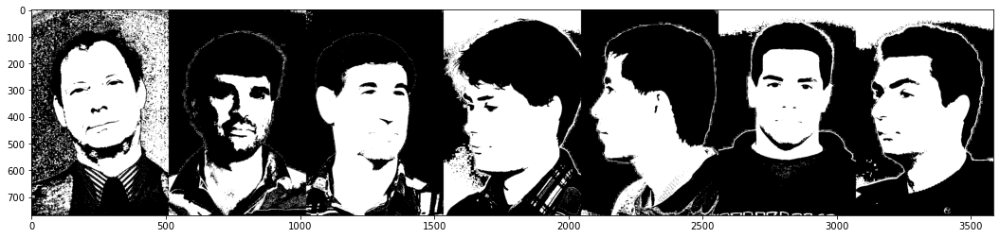

In [15]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])

MASK = getMask(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2HSV))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

# Algorithme génetique

In [16]:
def setWeights(i,vals):
    j = 0
    for e in ELLIPSES[i]:
        e.Th = vals[j]
        j+=1
def getWeights(i):
    res = []
    for e in ELLIPSES[i]:
        res += [e.Th]
    return res

In [18]:
def Evaluer(Ellips,Points,i):
    P = np.argwhere(Points[:,:,i]!=0)    
    R = np.zeros((P.shape[0],1))
    for e in Ellips:
        R = R + e.are_they_in(P[:,0],P[:,1]).reshape((-1,1))
    R=(R>0).flatten()
    return R.sum()/P.shape[0]
    

In [19]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - Evaluer(ELLIPSES[i],MasterNonColors,i)

EvaluationGlobale()

desired_output = 0
num_generations = 80
num_parents_mating = 4
sol_per_pop = 8
init_range_low = 0.8
init_range_high = 4.8
parent_selection_type = "sss"
keep_parents = 1
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 10

for I in range(256):
    function_inputs = getWeights(I)
    num_genes = len(function_inputs)
    if(num_genes<1):
        continue
    def fitness_func(ga_instance, solution, solution_idx):
        setWeights(I,solution)
        return Evaluation(I)

    fitness_function = fitness_func
    
    ga_instance = pygad.GA(num_generations=num_generations,
                                   num_parents_mating=num_parents_mating,
                                   fitness_func=fitness_function,
                                   sol_per_pop=sol_per_pop,
                                   num_genes=num_genes,
                                   init_range_low=init_range_low,
                                   init_range_high=init_range_high,
                                   parent_selection_type=parent_selection_type,
                                   keep_parents=keep_parents,
                                   crossover_type=crossover_type,
                                   mutation_type=mutation_type,
                                   mutation_percent_genes=mutation_percent_genes)

    ga_instance.run()
    
    solution, solution_fitness, solution_idx = ga_instance.best_solution()
    setWeights(I,solution)
    
EvaluationGlobale()

268774 431384 0.6230504608423122 101284693 131235458 0.7717784091552452
343721 773989 0.4440902906888858 59384908 319095166 0.18610406652164702
302941 431384 0.7022536765387682 109169533 131235458 0.8318600373993437
383161 773989 0.4950470872325059 74552173 319095166 0.23363617172439397


(0.7022536765387682,
 0.4950470872325059,
 0.8318600373993437,
 0.23363617172439397)

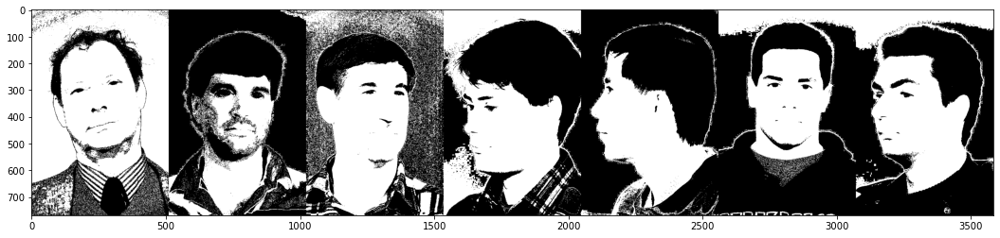

In [20]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
IMAGE = cv2.cvtColor(IMAGE,cv2.COLOR_BGR2HSV)
MASK = getMask(IMAGE)
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [19]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.4*Evaluer(ELLIPSES[i],MasterNonColors,i)

EvaluationGlobale()

desired_output = 0
num_generations = 80
num_parents_mating = 4
sol_per_pop = 8
init_range_low = 0.8
init_range_high = 4.8
parent_selection_type = "sss"
keep_parents = 1
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 10

for I in range(256):
    function_inputs = getWeights(I)
    num_genes = len(function_inputs)
    if(num_genes<1):
        continue
    def fitness_func(ga_instance, solution, solution_idx):
        setWeights(I,solution)
        return Evaluation(I)

    fitness_function = fitness_func
    
    ga_instance = pygad.GA(num_generations=num_generations,
                                   num_parents_mating=num_parents_mating,
                                   fitness_func=fitness_function,
                                   sol_per_pop=sol_per_pop,
                                   num_genes=num_genes,
                                   init_range_low=init_range_low,
                                   init_range_high=init_range_high,
                                   parent_selection_type=parent_selection_type,
                                   keep_parents=keep_parents,
                                   crossover_type=crossover_type,
                                   mutation_type=mutation_type,
                                   mutation_percent_genes=mutation_percent_genes)

    ga_instance.run()
    
    solution, solution_fitness, solution_idx = ga_instance.best_solution()
    setWeights(I,solution)
    
EvaluationGlobale()

268774 431384 0.6230504608423122 101284693 131235458 0.7717784091552452
343721 773989 0.4440902906888858 59384908 319095166 0.18610406652164702
224290 431384 0.5199311981900117 91925465 131235458 0.700462103770766
268070 773989 0.3463485915174505 34976996 319095166 0.10961305505956803


(0.5199311981900117,
 0.3463485915174505,
 0.700462103770766,
 0.10961305505956803)

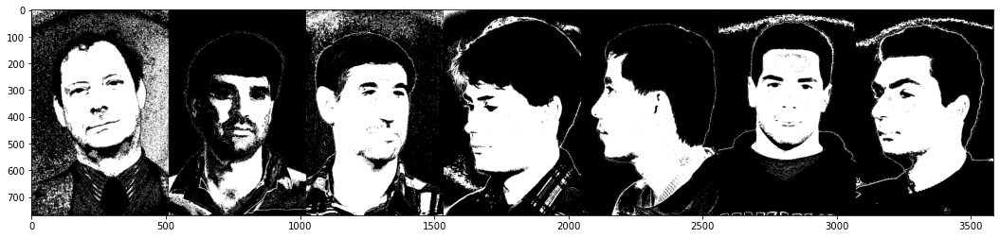

In [20]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
IMAGE = cv2.cvtColor(IMAGE,cv2.COLOR_BGR2HSV)
MASK = getMask(IMAGE)
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [33]:
%matplotlib qt
import random
 
def color_generator(seed):
    random.seed(seed*20+5)
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r/255, g/255, b/255)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('H')
ax.set_ylabel('S')
ax.set_zlabel('V')

for i in range(256):
    for ELLI in ELLIPSES[i]:
        u=ELLI.HMoy      #x-position of the center
        v=ELLI.SMoy      #y-position of the center
        a=ELLI.Th*ELLI.HEct       #radius on the x-axis
        b=ELLI.Th*ELLI.SEct      #radius on the y-axis
        t_rot=ELLI.thet #rotation angle

        t = np.linspace(0, 2*pi, 100)
        Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
        R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    #2-D rotation matrix

        Ell_rot = np.zeros((2,Ell.shape[1]))
        for j in range(Ell.shape[1]):
            Ell_rot[:,j] = np.dot(R_rot,Ell[:,j])

        ax.plot( u + Ell_rot[0,:] , v + Ell_rot[1,:],np.ones((Ell_rot[0].shape))*i,color=color_generator(ELLI.cluster) )
plt.show()

In [84]:
with open('Result GA2.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)

In [21]:
with open('Result GA.pkl', 'rb') as f:
    ELLIPSES = pickle.load(f)

# Descente de gradient

In [35]:
def gradient_descent(cost_func, initial_params, learning_rate, num_iterations):
    params = initial_params.copy()  # Make a copy of the initial parameters
    history = []  # Track the cost function value at each iteration

    for _ in range(num_iterations):
        gradient = calculate_gradient(cost_func, params)  # Compute the gradient
        params -= learning_rate * gradient  # Update the parameters
        cost = cost_func(params)  # Compute the cost function
        history.append(cost)  # Store the cost in history

    return params, history

def calculate_gradient(cost_func, params, epsilon=1):
    num_params = len(params)
    gradient = np.zeros(num_params)

    for i in range(num_params):
        # Add a small epsilon to the i-th parameter
        params_plus = params.copy()
        params_plus[i] += epsilon

        # Subtract a small epsilon from the i-th parameter
        params_minus = params.copy()
        params_minus[i] -= epsilon

        # Calculate the partial derivative with respect to the i-th parameter
        gradient[i] = (cost_func(params_plus) - cost_func(params_minus)) / (2 * epsilon)

    return gradient

In [38]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.2*Evaluer(ELLIPSES[i],MasterNonColors,i)

EvaluationGlobale()

learning_rate = 0.25
num_iterations = 100

for I in range(256):
    def cost_function(params):
        setWeights(I,params)
        return 1-Evaluation(I)
    
    initial_params = getWeights(I)
    if(len(initial_params)==0):
        continue
    print('Iteration '+str(I)+' with '+str(len(initial_params))+' parameters  started at '+str(datetime.datetime.now()))
    optimized_params,hh = gradient_descent(cost_function, initial_params, learning_rate, num_iterations)
    setWeights(I,optimized_params)
    
EvaluationGlobale()

268774 431384 0.6230504608423122 101284693 131235458 0.7717784091552452
343721 773989 0.4440902906888858 59384908 319095166 0.18610406652164702
Iteration 16 with 1 parameters  started at 2023-06-04 16:02:58.810958
Iteration 17 with 1 parameters  started at 2023-06-04 16:02:59.491619
Iteration 18 with 1 parameters  started at 2023-06-04 16:03:00.191630
Iteration 19 with 1 parameters  started at 2023-06-04 16:03:01.130278
Iteration 20 with 1 parameters  started at 2023-06-04 16:03:01.815497
Iteration 21 with 1 parameters  started at 2023-06-04 16:03:02.539592
Iteration 22 with 1 parameters  started at 2023-06-04 16:03:03.285062
Iteration 23 with 1 parameters  started at 2023-06-04 16:03:03.993168
Iteration 24 with 1 parameters  started at 2023-06-04 16:03:04.818925
Iteration 25 with 1 parameters  started at 2023-06-04 16:03:05.874101
Iteration 26 with 1 parameters  started at 2023-06-04 16:03:06.850491
Iteration 27 with 1 parameters  started at 2023-06-04 16:03:07.613449
Iteration 28 wit

Iteration 130 with 17 parameters  started at 2023-06-04 16:43:36.513264
Iteration 131 with 17 parameters  started at 2023-06-04 16:44:14.740495
Iteration 132 with 17 parameters  started at 2023-06-04 16:44:52.965412
Iteration 133 with 18 parameters  started at 2023-06-04 16:45:31.259565
Iteration 134 with 16 parameters  started at 2023-06-04 16:46:14.321355
Iteration 135 with 15 parameters  started at 2023-06-04 16:46:49.055157
Iteration 136 with 15 parameters  started at 2023-06-04 16:47:20.228679
Iteration 137 with 16 parameters  started at 2023-06-04 16:47:51.364334
Iteration 138 with 17 parameters  started at 2023-06-04 16:48:26.486872
Iteration 139 with 17 parameters  started at 2023-06-04 16:49:05.905080
Iteration 140 with 13 parameters  started at 2023-06-04 16:49:45.565225
Iteration 141 with 12 parameters  started at 2023-06-04 16:50:10.001202
Iteration 142 with 13 parameters  started at 2023-06-04 16:50:31.356229
Iteration 143 with 15 parameters  started at 2023-06-04 16:50:56

Iteration 244 with 11 parameters  started at 2023-06-04 18:15:38.059144
Iteration 245 with 10 parameters  started at 2023-06-04 18:15:57.386880
Iteration 246 with 10 parameters  started at 2023-06-04 18:16:13.701649
Iteration 247 with 9 parameters  started at 2023-06-04 18:16:30.034794
Iteration 248 with 7 parameters  started at 2023-06-04 18:16:43.909411
Iteration 249 with 8 parameters  started at 2023-06-04 18:16:53.180284
Iteration 250 with 11 parameters  started at 2023-06-04 18:17:04.819882
Iteration 251 with 11 parameters  started at 2023-06-04 18:17:25.089981
Iteration 252 with 11 parameters  started at 2023-06-04 18:17:45.856808
Iteration 253 with 11 parameters  started at 2023-06-04 18:18:06.901276
Iteration 254 with 11 parameters  started at 2023-06-04 18:18:28.095237
Iteration 255 with 11 parameters  started at 2023-06-04 18:18:49.674446
236958 431384 0.549297145930308 95880121 131235458 0.7305961548897859
300294 773989 0.38798225814578763 37372991 319095166 0.11712177112704

(0.549297145930308,
 0.38798225814578763,
 0.7305961548897859,
 0.11712177112704991)

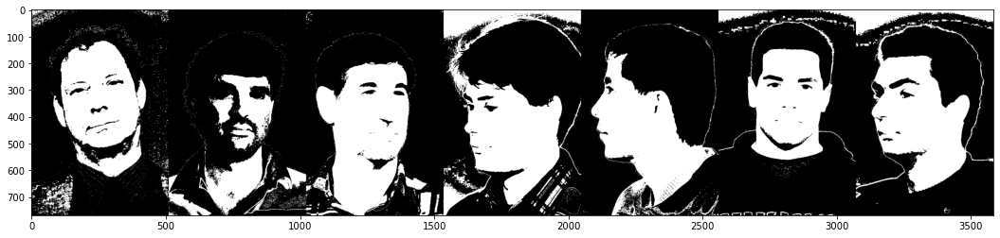

In [40]:
%matplotlib inline
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
IMAGE = cv2.cvtColor(IMAGE,cv2.COLOR_BGR2HSV)
MASK = getMask(IMAGE)
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [41]:
%matplotlib qt
import random
 
def color_generator(seed):
    random.seed(seed*20+5)
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r/255, g/255, b/255)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('H')
ax.set_ylabel('S')
ax.set_zlabel('V')

for i in range(256):
    for ELLI in ELLIPSES[i]:
        u=ELLI.HMoy      #x-position of the center
        v=ELLI.SMoy      #y-position of the center
        a=ELLI.Th*ELLI.HEct       #radius on the x-axis
        b=ELLI.Th*ELLI.SEct      #radius on the y-axis
        t_rot=ELLI.thet #rotation angle

        t = np.linspace(0, 2*pi, 100)
        Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
        R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    #2-D rotation matrix

        Ell_rot = np.zeros((2,Ell.shape[1]))
        for j in range(Ell.shape[1]):
            Ell_rot[:,j] = np.dot(R_rot,Ell[:,j])

        ax.plot( u + Ell_rot[0,:] , v + Ell_rot[1,:],np.ones((Ell_rot[0].shape))*i,color=color_generator(ELLI.cluster) )
plt.show()

# Bayesian optimisation

In [42]:
# BlackBox functions
def lesTh(nb):
    res = "Th0"
    for i in range(1,nb):
        res += ",Th"+str(i)
    return res
for i in range(1,35):
    print("def f"+str(i)+"("+lesTh(i)+"):")
    print("\tsetWeights(I,["+lesTh(i)+"])")
    print("\treturn Evaluation(I)")

def f1(Th0):
	setWeights(I,[Th0])
	return Evaluation(I)
def f2(Th0,Th1):
	setWeights(I,[Th0,Th1])
	return Evaluation(I)
def f3(Th0,Th1,Th2):
	setWeights(I,[Th0,Th1,Th2])
	return Evaluation(I)
def f4(Th0,Th1,Th2,Th3):
	setWeights(I,[Th0,Th1,Th2,Th3])
	return Evaluation(I)
def f5(Th0,Th1,Th2,Th3,Th4):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4])
	return Evaluation(I)
def f6(Th0,Th1,Th2,Th3,Th4,Th5):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5])
	return Evaluation(I)
def f7(Th0,Th1,Th2,Th3,Th4,Th5,Th6):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6])
	return Evaluation(I)
def f8(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7])
	return Evaluation(I)
def f9(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8])
	return Evaluation(I)
def f10(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9])
	return Evaluation(I)
def f11(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10):
	setWeights(I,[Th0,Th1,T

In [43]:
def f1(Th0):
	setWeights(I,[Th0])
	return Evaluation(I)
def f2(Th0,Th1):
	setWeights(I,[Th0,Th1])
	return Evaluation(I)
def f3(Th0,Th1,Th2):
	setWeights(I,[Th0,Th1,Th2])
	return Evaluation(I)
def f4(Th0,Th1,Th2,Th3):
	setWeights(I,[Th0,Th1,Th2,Th3])
	return Evaluation(I)
def f5(Th0,Th1,Th2,Th3,Th4):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4])
	return Evaluation(I)
def f6(Th0,Th1,Th2,Th3,Th4,Th5):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5])
	return Evaluation(I)
def f7(Th0,Th1,Th2,Th3,Th4,Th5,Th6):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6])
	return Evaluation(I)
def f8(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7])
	return Evaluation(I)
def f9(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8])
	return Evaluation(I)
def f10(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9])
	return Evaluation(I)
def f11(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10])
	return Evaluation(I)
def f12(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11])
	return Evaluation(I)
def f13(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12])
	return Evaluation(I)
def f14(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13])
	return Evaluation(I)
def f15(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14])
	return Evaluation(I)
def f16(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15])
	return Evaluation(I)
def f17(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16])
	return Evaluation(I)
def f18(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17])
	return Evaluation(I)
def f19(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18])
	return Evaluation(I)
def f20(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19])
	return Evaluation(I)
def f21(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20])
	return Evaluation(I)
def f22(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21])
	return Evaluation(I)
def f23(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22])
	return Evaluation(I)
def f24(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23])
	return Evaluation(I)
def f25(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24])
	return Evaluation(I)
def f26(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25])
	return Evaluation(I)
def f27(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26])
	return Evaluation(I)
def f28(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27])
	return Evaluation(I)
def f29(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28])
	return Evaluation(I)
def f30(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29])
	return Evaluation(I)
def f31(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30])
	return Evaluation(I)
def f32(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31])
	return Evaluation(I)
def f33(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32])
	return Evaluation(I)
def f34(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32,Th33):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32,Th33])
	return Evaluation(I)

In [44]:
def getBounds(nb):
    Bounds = {}
    for i in range(nb):
        Bounds['Th'+str(i)] = (0.1,5)
    return Bounds


def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.2*Evaluer(ELLIPSES[i],MasterNonColors,i)

In [46]:
EvaluationGlobale()

268774 431384 0.6230504608423122 101284693 131235458 0.7717784091552452
343721 773989 0.4440902906888858 59384908 319095166 0.18610406652164702


(0.6230504608423122,
 0.4440902906888858,
 0.7717784091552452,
 0.18610406652164702)

In [83]:
for I in range(256):
    NB = len(ELLIPSES[I])
    if(NB==0):
        continue

    black_box_function = globals()["f"+str(NB)]

    # Bounded region of parameter space
    pbounds = getBounds(NB) #{'x': (2, 4), 'y': (-3, 3)}

    optimizer = BayesianOptimization(
        f=black_box_function,
        pbounds=pbounds,
        random_state=1,
    )


    optimizer.maximize(
        init_points=20,
        n_iter=100,
    )

    print(optimizer.max)
    setWeights(I, list(optimizer.max['params'].values()))


|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403     |
| 15        | 0.0       | 0.2342    |
| 16        | 0.0       | 3.385     |
| 17        | 0.0       | 2.145     |
| 18        | 0.0       | 2.838     |
| 19        | 0.0       | 0.7879    |
| 20        | 0.0       | 1.071     |
| 21        | 0.0       | 4.999     |
| 22        | 0.0       | 5.0       |
| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        

| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        | 0.0       | 4.999     |
| 26        | 0.0       | 4.999     |
| 27        | 0.0       | 0.1001    |
| 28        | 0.0       | 5.0       |
| 29        | 0.0       | 0.1007    |
| 30        | 0.0       | 4.998     |
| 31        | 0.0       | 0.1002    |
| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        

| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        

| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        

| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        

| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        

| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       

| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       

| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581   

| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403   

| 20        | 0.0       | 1.071     |
| 21        | 0.0       | 4.999     |
| 22        | 0.0       | 5.0       |
| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        | 0.0       | 4.999     |
| 26        | 0.0       | 4.999     |
| 27        | 0.0       | 0.1001    |
| 28        | 0.0       | 5.0       |
| 29        | 0.0       | 0.1007    |
| 30        | 0.0       | 4.998     |
| 31        | 0.0       | 0.1002    |
| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        

| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        

| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        

| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        

| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        

| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       

| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       

| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
----------------------------------

| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154   

| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403     |
| 15        | 0.0       | 0.2342    |
| 16        | 0.0       | 3.385     |
| 17        | 0.0       | 2.145     |
| 18        | 0.0       | 2.838     |
| 19        | 0.0       | 0.7879    |
| 20        | 0.0       | 1.071     |
| 21        | 0.0       | 4.999   

| 24        | 0.0       | 5.0       |
| 25        | 0.0       | 4.999     |
| 26        | 0.0       | 4.999     |
| 27        | 0.0       | 0.1001    |
| 28        | 0.0       | 5.0       |
| 29        | 0.0       | 0.1007    |
| 30        | 0.0       | 4.998     |
| 31        | 0.0       | 0.1002    |
| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        

| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        

| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        

| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        

| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        

| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       

| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       

| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581   

| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403   

| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        | 0.0       | 4.999     |
| 26        | 0.0       | 4.999     |
| 27        | 0.0       | 0.1001    |
| 28        | 0.0       | 5.0       |
| 29        | 0.0       | 0.1007    |
| 30        | 0.0       | 4.998     |
| 31        | 0.0       | 0.1002    |
| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        

| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        

| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        

| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        

| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        

| 80        | 0.0       | 5.0       |
| 81        | 0.0       | 0.1001    |
| 82        | 0.0       | 4.998     |
| 83        | 0.0       | 0.1001    |
| 84        | 0.0       | 5.0       |
| 85        | 0.0       | 0.1002    |
| 86        | 0.0       | 5.0       |
| 87        | 0.0       | 0.1007    |
| 88        | 0.0       | 5.0       |
| 89        | 0.0       | 0.1021    |
| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       

| 90        | 0.0       | 5.0       |
| 91        | 0.0       | 0.1002    |
| 92        | 0.0       | 5.0       |
| 93        | 0.0       | 0.1       |
| 94        | 0.0       | 5.0       |
| 95        | 0.0       | 0.1001    |
| 96        | 0.0       | 4.999     |
| 97        | 0.0       | 0.1011    |
| 98        | 0.0       | 5.0       |
| 99        | 0.0       | 0.1001    |
| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       

| 100       | 0.0       | 4.999     |
| 101       | 0.0       | 0.1001    |
| 102       | 0.0       | 5.0       |
| 103       | 0.0       | 0.1004    |
| 104       | 0.0       | 5.0       |
| 105       | 0.0       | 0.1005    |
| 106       | 0.0       | 5.0       |
| 107       | 0.0       | 0.1025    |
| 108       | 0.0       | 5.0       |
| 109       | 0.0       | 0.1011    |
| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63    

| 110       | 0.0       | 5.0       |
| 111       | 0.0       | 0.1011    |
| 112       | 0.0       | 4.999     |
| 113       | 0.0       | 0.1002    |
| 114       | 0.0       | 5.0       |
| 115       | 0.0       | 0.1007    |
| 116       | 0.0       | 5.0       |
| 117       | 0.0       | 0.1004    |
| 118       | 0.0       | 5.0       |
| 119       | 0.0       | 0.1001    |
| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458   

| 120       | 0.0       | 5.0       |
{'target': 0.0, 'params': {'Th0': 2.143407823042613}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403     |
| 15        | 0.0       | 0.2342    |
| 16        | 0.0       | 3.385     |
| 17        | 0.0       | 2.145     |
| 18        | 0.0       | 2.838     |
| 19        | 0.0       | 0.7879    |
| 20        | 0.0       | 1.071     |
| 21        | 0.0       | 4.999     |
| 22        | 0.0       | 5.0     

| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        | 0.0       | 4.999     |
| 26        | 0.0       | 4.999     |
| 27        | 0.0       | 0.1001    |
| 28        | 0.0       | 5.0       |
| 29        | 0.0       | 0.1007    |
| 30        | 0.0       | 4.998     |
| 31        | 0.0       | 0.1002    |
| 32        | 0.0       | 5.0       |
| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        

| 33        | 0.0       | 0.1003    |
| 34        | 0.0       | 5.0       |
| 35        | 0.0       | 0.1001    |
| 36        | 0.0       | 5.0       |
| 37        | 0.0       | 0.1001    |
| 38        | 0.0       | 4.999     |
| 39        | 0.0       | 0.1008    |
| 40        | 0.0       | 4.999     |
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 5.0       |
| 43        | 0.0       | 0.1       |
| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        

| 44        | 0.0       | 5.0       |
| 45        | 0.0       | 0.1003    |
| 46        | 0.0       | 5.0       |
| 47        | 0.0       | 0.1007    |
| 48        | 0.0       | 5.0       |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 4.999     |
| 51        | 0.0       | 0.101     |
| 52        | 0.0       | 5.0       |
| 53        | 0.0       | 0.1       |
| 54        | 0.0       | 4.999     |
| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        

| 55        | 0.0       | 0.1001    |
| 56        | 0.0       | 5.0       |
| 57        | 0.0       | 0.1001    |
| 58        | 0.0       | 4.999     |
| 59        | 0.0       | 0.1       |
| 60        | 0.0       | 4.998     |
| 61        | 0.0       | 0.101     |
| 62        | 0.0       | 5.0       |
| 63        | 0.0       | 0.1009    |
| 64        | 0.0       | 4.999     |
| 65        | 0.0       | 0.1015    |
| 66        | 0.0       | 4.999     |
| 67        | 0.0       | 0.1005    |
| 68        | 0.0       | 5.0       |
| 69        | 0.0       | 0.1002    |
| 70        | 0.0       | 4.999     |
| 71        | 0.0       | 0.1002    |
| 72        | 0.0       | 4.999     |
| 73        | 0.0       | 0.1006    |
| 74        | 0.0       | 4.998     |
| 75        | 0.0       | 0.1004    |
| 76        | 0.0       | 5.0       |
| 77        | 0.0       | 0.1003    |
| 78        | 0.0       | 5.0       |
| 79        | 0.0       | 0.1011    |
| 80        | 0.0       | 5.0       |
| 81        

| 50        | 0.005226  | 4.995     | 0.3339    |
| 51        | 0.001206  | 1.775     | 0.1       |
| 52        | 0.004422  | 4.743     | 0.1019    |
| 53        | 0.002814  | 3.742     | 0.1028    |
| 54        | 0.005226  | 5.0       | 2.479     |
| 55        | 0.00201   | 3.292     | 4.995     |
| 56        | 0.004422  | 4.772     | 4.419     |
| 57        | 0.001608  | 2.933     | 2.326     |
| 58        | 0.002814  | 3.829     | 3.455     |
| 59        | 0.003618  | 4.058     | 2.294     |
| 60        | 0.00402   | 4.213     | 1.013     |
| 61        | 0.004824  | 4.879     | 3.161     |
| 62        | 0.005628  | 5.0       | 2.789     |
| 63        | 0.005226  | 4.998     | 3.645     |
| 64        | 0.004422  | 4.597     | 3.904     |
| 65        | 0.00402   | 4.186     | 1.646     |
| 66        | 0.004824  | 4.824     | 1.694     |
| 67        | 0.004824  | 4.813     | 1.02      |
| 68        | 0.001206  | 1.591     | 4.993     |
| 69        | 0.005226  | 4.983     | 3.976     |


| 28        | 0.0       | 4.931     | 4.999     |
| 29        | 0.0       | 0.1012    | 0.1353    |
| 30        | 0.0       | 4.902     | 4.998     |
| 31        | 0.0       | 4.967     | 0.1028    |
| 32        | 0.0       | 0.1612    | 4.992     |
| 33        | 0.0       | 4.96      | 0.1192    |
| 34        | 0.0       | 0.1466    | 4.985     |
| 35        | 0.0       | 0.1264    | 0.1317    |
| 36        | 0.0       | 4.993     | 0.1414    |
| 37        | 0.0       | 0.1946    | 4.998     |
| 38        | 0.0       | 4.992     | 4.978     |
| 39        | 0.0       | 4.98      | 0.101     |
| 40        | 0.0       | 0.1211    | 4.978     |
| 41        | 0.0       | 0.1141    | 0.1171    |
| 42        | 0.0       | 4.998     | 4.949     |
| 43        | 0.0       | 4.997     | 0.1041    |
| 44        | 0.0       | 0.109     | 4.976     |
| 45        | 0.0       | 0.1122    | 0.1458    |
| 46        | 0.0       | 4.986     | 4.997     |
| 47        | 0.0       | 0.1037    | 0.1048    |


| 11        | 0.0       | 0.5819    | 2.163     | 4.794     |
| 12        | 0.0       | 2.713     | 3.49      | 1.646     |
| 13        | 0.0       | 3.464     | 4.19      | 0.1896    |
| 14        | 0.0       | 3.776     | 4.945     | 3.766     |
| 15        | 0.0       | 1.474     | 3.967     | 0.6058    |
| 16        | 0.0       | 2.295     | 4.552     | 1.539     |
| 17        | 0.0       | 1.51      | 0.7371    | 0.1949    |
| 18        | 0.0       | 3.426     | 1.137     | 1.401     |
| 19        | 0.0       | 2.509     | 0.3615    | 2.913     |
| 20        | 0.0       | 0.819     | 2.988     | 3.529     |
| 21        | 0.0       | 4.81      | 4.982     | 4.904     |
| 22        | 0.0       | 4.979     | 0.1213    | 4.796     |
| 23        | 0.0       | 4.998     | 4.992     | 4.959     |
| 24        | 0.0       | 4.996     | 0.2492    | 0.1005    |
| 25        | 0.0       | 0.1199    | 0.1013    | 4.781     |
| 26        | 0.0       | 0.2076    | 0.1133    | 4.921     |
| 27    

| 92        | 0.0       | 4.996     | 4.998     | 4.826     |
| 93        | 0.0       | 0.2032    | 0.115     | 4.837     |
| 94        | 0.0       | 4.841     | 0.1185    | 4.965     |
| 95        | 0.0       | 4.912     | 4.905     | 4.962     |
| 96        | 0.0       | 4.989     | 4.962     | 0.2729    |
| 97        | 0.0       | 0.2477    | 4.946     | 4.905     |
| 98        | 0.0       | 0.169     | 0.1879    | 0.1505    |
| 99        | 0.0       | 4.957     | 0.1258    | 0.1085    |
| 100       | 0.0       | 4.903     | 4.97      | 4.861     |
| 101       | 0.0       | 0.1888    | 0.1035    | 4.883     |
| 102       | 0.0       | 4.915     | 4.917     | 0.1674    |
| 103       | 0.0       | 0.1129    | 0.1224    | 0.1722    |
| 104       | 0.0       | 0.1034    | 4.996     | 4.77      |
| 105       | 0.0       | 4.915     | 0.1121    | 0.1193    |
| 106       | 0.0       | 4.979     | 4.927     | 4.909     |
| 107       | 0.0       | 4.891     | 4.995     | 0.1464    |
| 108   

| 51        | 0.03871   | 5.0       | 3.39      | 3.99      |
| 52        | 0.03871   | 5.0       | 1.895     | 1.662     |
| 53        | 0.03064   | 4.224     | 0.1       | 0.1       |
| 54        | 0.03871   | 5.0       | 1.156     | 3.361     |
| 55        | 0.03871   | 5.0       | 4.184     | 0.603     |
| 56        | 0.0357    | 4.635     | 2.818     | 3.15      |
| 57        | 0.03871   | 5.0       | 0.1       | 4.275     |
| 58        | 0.03871   | 5.0       | 0.8518    | 1.686     |
| 59        | 0.03871   | 5.0       | 0.7789    | 5.0       |
| 60        | 0.03871   | 5.0       | 2.532     | 5.0       |
| 61        | 0.03871   | 4.992     | 3.224     | 1.266     |
| 62        | 0.03871   | 5.0       | 4.389     | 2.654     |
| 63        | 0.03871   | 5.0       | 4.314     | 5.0       |
| 64        | 0.03871   | 5.0       | 4.298     | 0.1       |
| 65        | 0.03871   | 5.0       | 5.0       | 3.087     |
| 66        | 0.03737   | 4.674     | 1.63      | 3.395     |
| 67    

| 21        | 0.03059   | 5.0       | 0.1       | 5.0       | 5.0       |
| 22        | 0.03059   | 5.0       | 5.0       | 5.0       | 5.0       |
| 23        | 0.03059   | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | 0.03059   | 5.0       | 5.0       | 3.404     | 0.1       |
| 25        | 0.03059   | 5.0       | 0.1       | 0.1       | 0.1       |
| 26        | 0.03059   | 5.0       | 0.1       | 0.1       | 5.0       |
| 27        | 0.03059   | 5.0       | 5.0       | 0.1       | 5.0       |
| 28        | 0.03059   | 5.0       | 0.1       | 2.4       | 2.705     |
| 29        | 0.03059   | 5.0       | 5.0       | 0.1       | 2.101     |
| 30        | 0.03059   | 5.0       | 5.0       | 5.0       | 2.438     |
| 31        | 0.03059   | 5.0       | 2.328     | 1.622     | 0.1       |
| 32        | 0.03059   | 5.0       | 0.1       | 5.0       | 2.55      |
| 33        | 0.03059   | 5.0       | 0.1       | 2.604     | 5.0       |
| 34        | 0.03059   | 5.0       | 

| 90        | 0.03059   | 5.0       | 3.64      | 5.0       | 3.618     |
| 91        | 0.03059   | 5.0       | 1.067     | 3.832     | 5.0       |
| 92        | 0.03059   | 5.0       | 1.217     | 1.452     | 5.0       |
| 93        | 0.03059   | 5.0       | 0.8877    | 0.1       | 3.843     |
| 94        | 0.03059   | 5.0       | 0.1       | 2.962     | 1.506     |
| 95        | 0.03059   | 5.0       | 5.0       | 5.0       | 1.108     |
| 96        | 0.03059   | 5.0       | 5.0       | 3.52      | 1.855     |
| 97        | 0.03059   | 5.0       | 3.895     | 3.014     | 2.586     |
| 98        | 0.03059   | 5.0       | 0.1       | 3.803     | 2.675     |
| 99        | 0.03059   | 5.0       | 4.0       | 5.0       | 5.0       |
| 100       | 0.03059   | 5.0       | 1.088     | 5.0       | 0.1       |
| 101       | 0.03059   | 5.0       | 2.423     | 0.8381    | 0.7624    |
| 102       | 0.03059   | 5.0       | 4.173     | 0.5324    | 0.1       |
| 103       | 0.03059   | 5.0       | 

| 21        | 0.05784   | 5.0       | 3.888     | 0.1       | 3.752     | 2.273     | 5.0       | 2.451     | 5.0       | 4.417     |
| 22        | 0.05784   | 5.0       | 3.761     | 0.1       | 0.1       | 5.0       | 5.0       | 2.876     | 5.0       | 0.175     |
| 23        | 0.05784   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.8222    | 5.0       |
| 24        | 0.05784   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 25        | 0.05784   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 26        | 0.05784   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 27        | 0.05784   | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 28        | 0.05784   | 5.0       | 0.1       | 5.0       | 

| 58        | 0.05011   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 59        | 0.05784   | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 60        | 0.05784   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 61        | 0.05784   | 5.0       | 2.437     | 2.751     | 2.573     | 0.1       | 5.0       | 2.954     | 1.925     | 5.0       |
| 62        | 0.05784   | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 63        | 0.05784   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 64        | 0.05326   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.175     | 5.0       | 5.0       | 0.1       |
| 65        | 0.05784   | 5.0       | 3.068     | 0.1       | 

| 95        | 0.05784   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 96        | 0.05784   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 97        | 0.05784   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 98        | 0.05784   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 99        | 0.05784   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 3.057     |
| 100       | 0.05784   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 101       | 0.05784   | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 102       | 0.05784   | 5.0       | 5.0       | 5.0       | 

| 21        | 0.05114   | 5.0       | 1.778     | 0.1       | 0.1       | 4.707     | 2.818     | 3.481     | 3.256     | 2.055     |
| 22        | 0.05114   | 5.0       | 3.983     | 0.2647    | 3.178     | 2.422     | 5.0       | 3.103     | 4.122     | 4.074     |
| 23        | 0.05114   | 5.0       | 2.932     | 1.94      | 1.031     | 2.479     | 0.9348    | 4.91      | 0.4384    | 4.952     |
| 24        | 0.05114   | 5.0       | 5.0       | 3.025     | 0.1       | 5.0       | 1.343     | 3.255     | 3.004     | 1.439     |
| 25        | 0.05114   | 5.0       | 3.314     | 1.353     | 0.1       | 0.1       | 5.0       | 0.1       | 1.052     | 5.0       |
| 26        | 0.05114   | 5.0       | 5.0       | 0.1       | 0.1       | 2.674     | 5.0       | 0.1       | 5.0       | 0.1071    |
| 27        | 0.05114   | 5.0       | 0.1       | 0.646     | 4.131     | 5.0       | 5.0       | 0.1       | 1.762     | 5.0       |
| 28        | 0.05114   | 5.0       | 1.045     | 2.934     | 

| 58        | 0.05114   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.964     | 0.1       |
| 59        | 0.05114   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.106     |
| 60        | 0.05114   | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 3.008     | 5.0       | 5.0       | 3.306     |
| 61        | 0.05114   | 5.0       | 0.1       | 2.702     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 62        | 0.05114   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 63        | 0.05114   | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 2.814     | 5.0       |
| 64        | 0.05114   | 5.0       | 2.76      | 2.755     | 1.635     | 2.646     | 1.434     | 5.0       | 3.288     | 2.159     |
| 65        | 0.05114   | 5.0       | 0.1       | 5.0       | 

| 95        | 0.05114   | 5.0       | 2.341     | 2.318     | 0.1       | 5.0       | 0.1       | 5.0       | 1.709     | 2.669     |
| 96        | 0.05114   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 97        | 0.05114   | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 1.471     |
| 98        | 0.05114   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 3.749     | 0.1       | 2.073     | 1.197     |
| 99        | 0.05114   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 100       | 0.05114   | 5.0       | 0.1       | 0.1       | 2.51      | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 101       | 0.05114   | 5.0       | 0.1       | 2.878     | 2.323     | 2.284     | 5.0       | 0.1       | 2.81      | 2.602     |
| 102       | 0.05114   | 5.0       | 0.1       | 0.1       | 

| 21        | 0.06583   | 5.0       | 4.307     | 5.0       | 0.1       | 3.937     | 0.9363    | 5.0       | 2.608     | 4.541     | 1.696     | 2.977     |
| 22        | 0.06545   | 5.0       | 4.234     | 1.646     | 2.125     | 0.1       | 3.949     | 5.0       | 0.1822    | 5.0       | 4.646     | 1.949     |
| 23        | 0.06545   | 5.0       | 2.683     | 4.925     | 4.74      | 5.0       | 0.1       | 4.032     | 0.9598    | 3.456     | 5.0       | 2.179     |
| 24        | 0.06583   | 5.0       | 1.412     | 5.0       | 0.7686    | 3.431     | 3.675     | 3.266     | 5.0       | 5.0       | 4.314     | 5.0       |
| 25        | 0.06583   | 5.0       | 4.13      | 5.0       | 0.1       | 5.0       | 4.347     | 4.236     | 5.0       | 0.1       | 0.1       | 5.0       |
| 26        | 0.06583   | 5.0       | 5.0       | 5.0       | 0.3443    | 5.0       | 0.1       | 1.929     | 5.0       | 0.1       | 5.0       | 5.0       |
| 27        | 0.06583   | 5.0       | 0.3037    | 5.

| 53        | 0.0647    | 5.0       | 1.399     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 54        | 0.0647    | 5.0       | 2.857     | 0.1       | 5.0       | 0.1       | 2.917     | 1.83      | 0.1       | 5.0       | 5.0       | 5.0       |
| 55        | 0.0647    | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 56        | 0.0647    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 2.868     | 5.0       | 5.0       | 5.0       | 0.1       |
| 57        | 0.06583   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 1.576     | 0.1       | 5.0       |
| 58        | 0.06583   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 59        | 0.0647    | 5.0       | 5.0       | 0.

| 85        | 0.06583   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.859     | 5.0       |
| 86        | 0.06583   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 2.331     | 2.608     | 5.0       | 2.639     | 5.0       | 5.0       |
| 87        | 0.0647    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 88        | 0.0647    | 5.0       | 2.097     | 0.1       | 5.0       | 2.253     | 5.0       | 3.654     | 0.1       | 5.0       | 5.0       | 0.1       |
| 89        | 0.0647    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 90        | 0.0647    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 91        | 0.06583   | 5.0       | 5.0       | 5.

| 117       | 0.06583   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.006     | 0.7716    | 5.0       | 5.0       | 0.1       | 0.1       |
| 118       | 0.06583   | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 3.135     | 3.542     | 5.0       |
| 119       | 0.0647    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 120       | 0.0647    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
{'target': 0.06583476764199656, 'params': {'Th0': 4.60179383460467, 'Th1': 2.034890503325419, 'Th10': 4.819986389359488, 'Th2': 0.9523827667342754, 'Th3': 0.719014645254223, 'Th4': 0.7618878744289835, 'Th5': 2.577744611816794, 'Th6': 0.2054715458435701, 'Th7': 4.745054034966637, 'Th8': 4.152865808736589, 'Th9': 0.17359300563639968}}
|   iter    |  target   |    Th0 

| 26        | 0.08661   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 1.769     | 0.4228    | 0.1       |
| 27        | 0.08661   | 5.0       | 5.0       | 5.0       | 0.1       | 0.5355    | 5.0       | 5.0       | 0.1       | 0.1       | 0.4991    | 0.1       |
| 28        | 0.08428   | 5.0       | 5.0       | 1.91      | 5.0       | 0.1       | 0.1       | 3.133     | 0.1       | 0.1       | 5.0       | 0.1       |
| 29        | 0.08273   | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.665     | 0.1       | 0.1       |
| 30        | 0.08661   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 4.293     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 31        | 0.08661   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 32        | 0.08273   | 5.0       | 5.0       | 0.

| 58        | 0.08428   | 5.0       | 2.978     | 3.13      | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 59        | 0.08273   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.427     | 5.0       | 0.1       | 5.0       | 5.0       |
| 60        | 0.08428   | 5.0       | 2.826     | 3.707     | 2.904     | 2.339     | 2.026     | 2.983     | 3.002     | 2.634     | 2.16      | 3.019     |
| 61        | 0.08273   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 62        | 0.08273   | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 63        | 0.08661   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 64        | 0.08661   | 5.0       | 5.0       | 5.

| 90        | 0.08661   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 91        | 0.08661   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 92        | 0.08661   | 5.0       | 1.453     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 93        | 0.08273   | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 1.333     | 0.1       | 0.1       | 5.0       | 0.1       |
| 94        | 0.08661   | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 95        | 0.08661   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.835     | 5.0       | 0.1       | 0.1       | 5.0       |
| 96        | 0.08661   | 5.0       | 0.1       | 5.

| 21        | 0.09244   | 5.0       | 1.626     | 0.1       | 0.7235    | 0.1       | 4.448     | 0.1       | 0.1381    | 1.007     | 3.157     |
| 22        | 0.09394   | 5.0       | 4.979     | 0.1       | 0.1       | 5.0       | 4.657     | 5.0       | 0.1       | 5.0       | 5.0       |
| 23        | 0.09132   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.6592    | 0.1       | 0.3114    | 5.0       | 0.1629    |
| 24        | 0.09394   | 5.0       | 2.251     | 5.0       | 0.1       | 5.0       | 0.1084    | 1.825     | 0.1       | 5.0       | 5.0       |
| 25        | 0.09394   | 5.0       | 0.6364    | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.09132   | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 27        | 0.09394   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.

| 55        | 0.09394   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 56        | 0.09394   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 1.921     | 5.0       | 0.1       | 5.0       |
| 57        | 0.09132   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 58        | 0.09394   | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 59        | 0.09132   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 60        | 0.09394   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 61        | 0.09132   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.

| 89        | 0.09394   | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 90        | 0.09394   | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 91        | 0.09132   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 3.361     | 5.0       | 0.1       |
| 92        | 0.09394   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 93        | 0.09132   | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 94        | 0.09394   | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 95        | 0.09394   | 5.0       | 0.1       | 1.415     | 0.1       | 0.1       | 5.0       | 0.1       | 4.303     | 1.

| 21        | 0.09056   | 5.0       | 0.1       | 5.0       | 5.0       | 2.944     | 1.659     | 4.577     |
| 22        | 0.08721   | 5.0       | 5.0       | 0.1       | 0.1       | 3.231     | 5.0       | 0.2156    |
| 23        | 0.09093   | 5.0       | 5.0       | 0.1       | 0.1       | 1.622     | 5.0       | 5.0       |
| 24        | 0.08795   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 1.275     |
| 25        | 0.09093   | 5.0       | 0.1       | 4.68      | 1.029     | 0.2819    | 0.1       | 5.0       |
| 26        | 0.0887    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.638     |
| 27        | 0.0887    | 5.0       | 5.0       | 5.0       | 0.4968    | 2.212     | 0.1       | 1.974     |
| 28        | 0.09093   | 5.0       | 4.222     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 29        | 0.08721   | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 30      

| 66        | 0.09093   | 5.0       | 0.1       | 2.346     | 2.28      | 0.1       | 2.902     | 5.0       |
| 67        | 0.09093   | 5.0       | 3.492     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 68        | 0.0887    | 5.0       | 2.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.352     |
| 69        | 0.0887    | 5.0       | 2.828     | 0.1       | 1.391     | 2.153     | 2.796     | 2.512     |
| 70        | 0.09093   | 5.0       | 1.703     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 71        | 0.08958   | 2.943     | 0.1       | 5.0       | 5.0       | 0.1       | 1.44      | 5.0       |
| 72        | 0.08721   | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 73        | 0.0887    | 5.0       | 1.982     | 5.0       | 3.464     | 0.1       | 2.527     | 3.341     |
| 74        | 0.08721   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 75      

| 112       | 0.09093   | 5.0       | 3.785     | 5.0       | 0.1       | 3.032     | 5.0       | 5.0       |
| 113       | 0.08721   | 5.0       | 5.0       | 0.1       | 1.825     | 0.1       | 0.1       | 0.1       |
| 114       | 0.09093   | 5.0       | 0.1       | 2.62      | 0.1       | 5.0       | 2.778     | 5.0       |
| 115       | 0.09093   | 5.0       | 2.55      | 1.702     | 0.1       | 2.495     | 5.0       | 5.0       |
| 116       | 0.09093   | 5.0       | 2.899     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 117       | 0.08721   | 5.0       | 2.799     | 0.1       | 5.0       | 2.107     | 5.0       | 0.1       |
| 118       | 0.09093   | 5.0       | 5.0       | 2.457     | 3.088     | 0.1       | 2.644     | 5.0       |
| 119       | 0.08701   | 3.944     | 0.1       | 5.0       | 5.0       | 5.0       | 2.198     | 2.603     |
| 120       | 0.09093   | 5.0       | 2.488     | 2.532     | 2.387     | 5.0       | 0.1       | 5.0       |
{'target':

| 52        | 0.09848   | 5.0       | 1.387     | 0.1       | 3.873     |
| 53        | 0.09848   | 5.0       | 1.42      | 3.908     | 0.1       |
| 54        | 0.09231   | 4.06      | 0.1       | 3.75      | 3.823     |
| 55        | 0.09848   | 5.0       | 1.502     | 5.0       | 1.688     |
| 56        | 0.09848   | 5.0       | 0.1       | 1.517     | 5.0       |
| 57        | 0.09848   | 5.0       | 5.0       | 2.416     | 1.603     |
| 58        | 0.09848   | 5.0       | 5.0       | 1.874     | 0.1       |
| 59        | 0.09207   | 4.124     | 1.603     | 1.829     | 3.108     |
| 60        | 0.09848   | 5.0       | 5.0       | 3.391     | 3.516     |
| 61        | 0.09848   | 5.0       | 5.0       | 0.1       | 0.1       |
| 62        | 0.09626   | 4.818     | 4.206     | 0.1126    | 3.913     |
| 63        | 0.09498   | 3.725     | 3.746     | 0.1       | 5.0       |
| 64        | 0.09848   | 5.0       | 5.0       | 2.155     | 5.0       |
| 65        | 0.09848   | 5.0       | 

| 120       | 0.09367   | 3.679     | 0.1       | 1.457     | 5.0       |
{'target': 0.10011883541295305, 'params': {'Th0': 3.3803203903686234, 'Th1': 3.4474998679802824, 'Th2': 5.0, 'Th3': 5.0}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | 0.08366   | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | 0.01335   | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | 0.08502   | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | 0.02694   | 1.102     | 4.403     | 0.2342    | 3.385     |
| 5         | 0.08366   | 2.145     | 2.838     | 0.7879    | 1.071     |
| 6         | 0.1142    | 4.024     | 4.844     | 1.636     | 3.492     |
| 7         | 0.1106    | 4.394     | 4.484     | 0.5167    | 0.2914    |
| 8         | 0.01977   | 0.9322    | 4.403     | 0.5819    | 2.163     |
| 9         | 0.1154    | 4.794     | 2.713     | 3.49      | 1.

| 65        | 0.1164    | 5.0       | 5.0       | 0.1       | 0.1       |
| 66        | 0.1101    | 4.196     | 2.756     | 0.1388    | 3.828     |
| 67        | 0.1172    | 5.0       | 0.1       | 1.46      | 0.1       |
| 68        | 0.1178    | 5.0       | 1.617     | 2.387     | 5.0       |
| 69        | 0.1095    | 4.129     | 1.488     | 5.0       | 5.0       |
| 70        | 0.1169    | 4.88      | 0.1776    | 3.305     | 2.919     |
| 71        | 0.1097    | 4.326     | 4.092     | 0.8447    | 4.944     |
| 72        | 0.1155    | 5.0       | 2.728     | 5.0       | 0.1       |
| 73        | 0.1178    | 5.0       | 2.431     | 2.297     | 3.484     |
| 74        | 0.1172    | 5.0       | 0.1       | 1.309     | 5.0       |
| 75        | 0.1178    | 5.0       | 3.907     | 2.494     | 2.709     |
| 76        | 0.1164    | 5.0       | 1.296     | 0.1       | 5.0       |
| 77        | 0.1178    | 5.0       | 1.15      | 2.678     | 0.8273    |
| 78        | 0.1115    | 4.118     | 

| 21        | 0.1156    | 5.0       | 0.1604    | 5.0       | 4.447     | 3.737     | 2.263     | 4.6       |
| 22        | 0.1158    | 5.0       | 5.0       | 0.1       | 0.1       | 2.696     | 3.303     | 0.3101    |
| 23        | 0.115     | 5.0       | 3.112     | 4.47      | 0.9969    | 3.188     | 0.1       | 3.045     |
| 24        | 0.1151    | 5.0       | 0.9688    | 5.0       | 5.0       | 5.0       | 5.0       | 0.2123    |
| 25        | 0.1144    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 1.628     |
| 26        | 0.1144    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.718     |
| 27        | 0.1144    | 5.0       | 0.1       | 1.118     | 0.1       | 5.0       | 0.1       | 3.64      |
| 28        | 0.1156    | 5.0       | 5.0       | 0.1       | 0.1       | 3.479     | 5.0       | 5.0       |
| 29        | 0.1144    | 5.0       | 5.0       | 0.1       | 4.326     | 0.1       | 0.1       | 0.1       |
| 30      

| 66        | 0.1159    | 5.0       | 2.562     | 0.1       | 1.346     | 2.458     | 2.453     | 2.74      |
| 67        | 0.1159    | 5.0       | 0.1       | 2.846     | 2.445     | 1.62      | 2.557     | 5.0       |
| 68        | 0.1152    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 69        | 0.1152    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 70        | 0.1151    | 5.0       | 0.1       | 5.0       | 1.347     | 5.0       | 5.0       | 1.468     |
| 71        | 0.1151    | 5.0       | 2.811     | 5.0       | 2.215     | 5.0       | 3.268     | 5.0       |
| 72        | 0.1159    | 5.0       | 0.1       | 2.433     | 5.0       | 1.452     | 3.582     | 2.314     |
| 73        | 0.1077    | 3.509     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 74        | 0.1151    | 5.0       | 5.0       | 0.1       | 3.193     | 5.0       | 5.0       | 0.1       |
| 75      

| 111       | 0.1158    | 5.0       | 5.0       | 5.0       | 0.1       | 2.602     | 2.906     | 2.192     |
| 112       | 0.1151    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 3.839     | 5.0       |
| 113       | 0.1144    | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 114       | 0.1159    | 5.0       | 5.0       | 5.0       | 3.289     | 2.411     | 2.793     | 0.1       |
| 115       | 0.1152    | 5.0       | 0.1       | 5.0       | 2.646     | 2.371     | 0.1       | 0.1       |
| 116       | 0.1158    | 5.0       | 5.0       | 5.0       | 5.0       | 2.621     | 5.0       | 2.384     |
| 117       | 0.1152    | 5.0       | 1.813     | 3.351     | 5.0       | 0.1       | 5.0       | 2.679     |
| 118       | 0.1144    | 5.0       | 0.1       | 0.1       | 2.45      | 0.1       | 0.1       | 2.329     |
| 119       | 0.1158    | 5.0       | 0.1       | 0.1       | 5.0       | 2.918     | 5.0       | 2.165     |
| 120     

| 33        | 0.1254    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 34        | 0.1247    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 35        | 0.121     | 5.0       | 0.1       | 0.1       | 0.2229    | 5.0       | 0.1       | 0.1       |
| 36        | 0.1199    | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 37        | 0.1242    | 5.0       | 1.652     | 0.1       | 0.1       | 5.0       | 5.0       | 3.24      |
| 38        | 0.1236    | 5.0       | 0.1       | 2.299     | 5.0       | 0.1       | 5.0       | 0.1       |
| 39        | 0.1242    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 40        | 0.1231    | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.998     | 5.0       |
| 41        | 0.1199    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 42      

| 78        | 0.1205    | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 79        | 0.1212    | 5.0       | 2.56      | 2.446     | 0.1       | 2.838     | 0.1       | 5.0       |
| 80        | 0.1254    | 5.0       | 3.331     | 0.1       | 2.44      | 0.1       | 5.0       | 5.0       |
| 81        | 0.1235    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.213     |
| 82        | 0.1247    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 83        | 0.1169    | 4.37      | 0.1       | 3.756     | 3.053     | 2.737     | 0.1       | 3.364     |
| 84        | 0.1216    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 85        | 0.1254    | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 86        | 0.1214    | 5.0       | 5.0       | 0.1       | 2.331     | 0.1       | 2.381     | 2.889     |
| 87      

| 21        | 0.09814   | 5.0       | 3.472     | 2.255     | 1.597     | 1.394     | 2.5       | 0.1       | 1.646     | 1.204     | 2.265     |
| 22        | 0.09814   | 5.0       | 4.625     | 3.787     | 0.481     | 4.862     | 4.22      | 2.717     | 1.555     | 2.548     | 4.058     |
| 23        | 0.1001    | 5.0       | 3.05      | 0.1       | 3.898     | 0.1       | 0.1       | 0.1       | 3.432     | 2.819     | 2.266     |
| 24        | 0.09933   | 5.0       | 1.603     | 3.006     | 0.1       | 2.828     | 1.05      | 0.1       | 4.047     | 4.138     | 5.0       |
| 25        | 0.09767   | 5.0       | 5.0       | 0.1       | 2.936     | 0.6271    | 5.0       | 2.496     | 0.5945    | 0.1       | 3.819     |
| 26        | 0.09285   | 4.793     | 5.0       | 2.99      | 5.0       | 3.547     | 5.0       | 1.723     | 0.1       | 0.2421    | 0.3448    |
| 27        | 0.09984   | 5.0       | 0.1991    | 1.293     | 2.908     | 0.1       | 4.377     | 0.1       | 3.442     | 1.

| 55        | 0.09969   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 56        | 0.1002    | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.939     | 0.1       | 4.747     | 1.111     | 5.0       |
| 57        | 0.09984   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 58        | 0.09911   | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 59        | 0.0981    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 60        | 0.09882   | 5.0       | 0.761     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 61        | 0.0981    | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.

| 89        | 0.1035    | 4.17      | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.354     |
| 90        | 0.09882   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 91        | 0.09545   | 5.0       | 1.765     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 92        | 0.09882   | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 93        | 0.1079    | 3.6       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 94        | 0.0989    | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 95        | 0.08717   | 2.525     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.

| 21        | 0.07155   | 5.0       | 2.483     | 2.168     | 2.317     | 3.954     | 3.936     | 1.828     | 2.173     | 1.701     | 2.389     | 0.3352    | 0.1       |
| 22        | 0.0743    | 5.0       | 4.749     | 0.1       | 4.123     | 2.537     | 1.903     | 2.239     | 3.236     | 2.516     | 1.907     | 3.184     | 1.676     |
| 23        | 0.07447   | 4.381     | 0.4639    | 4.496     | 0.9894    | 2.538     | 3.601     | 2.685     | 4.711     | 3.366     | 3.151     | 0.1394    | 0.4051    |
| 24        | 0.07604   | 4.458     | 2.402     | 2.069     | 0.4274    | 2.84      | 4.616     | 0.1       | 3.787     | 2.465     | 5.0       | 2.85      | 0.1       |
| 25        | 0.07413   | 4.236     | 2.188     | 3.08      | 3.846     | 4.598     | 2.438     | 4.6       | 4.019     | 3.1       | 0.3915    | 0.1099    | 1.348     |
| 26        | 0.08242   | 4.847     | 5.0       | 0.1       | 1.953     | 5.0       | 4.231     | 0.1       | 3.461     | 1.64      | 3.411     | 4.35

| 50        | 0.08071   | 3.715     | 3.789     | 0.1       | 0.5449    | 0.1       | 0.1       | 2.024     | 0.1       | 0.756     | 1.778     | 0.1       | 1.157     |
| 51        | 0.08305   | 2.085     | 0.1       | 3.972     | 3.45      | 4.495     | 0.9517    | 5.0       | 0.1       | 1.768     | 1.077     | 0.1       | 0.1       |
| 52        | 0.07252   | 5.0       | 0.1       | 5.0       | 0.1       | 3.45      | 2.372     | 5.0       | 0.1       | 1.128     | 1.037     | 3.004     | 0.1       |
| 53        | 0.09169   | 2.346     | 5.0       | 0.1       | 3.761     | 5.0       | 5.0       | 4.031     | 0.2053    | 0.1       | 1.955     | 5.0       | 0.1       |
| 54        | 0.006569  | 0.2373    | 0.1       | 5.0       | 0.1       | 2.673     | 0.1       | 5.0       | 0.1       | 0.1       | 0.2376    | 0.1       | 0.1       |
| 55        | 0.07074   | 4.032     | 0.1       | 2.569     | 0.1       | 5.0       | 2.417     | 5.0       | 0.6669    | 2.684     | 1.369     | 0.1 

| 80        | 0.06845   | 5.0       | 0.1       | 1.194     | 0.3519    | 0.1       | 0.6546    | 5.0       | 0.1       | 4.331     | 0.1       | 0.1       | 0.1       |
| 81        | 0.07819   | 4.863     | 5.0       | 5.0       | 1.057     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.529     |
| 82        | 0.07419   | 4.092     | 5.0       | 0.1       | 3.179     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.502     | 3.476     | 3.866     |
| 83        | 0.09759   | 2.688     | 5.0       | 0.1       | 2.765     | 3.891     | 3.079     | 1.583     | 1.986     | 2.237     | 2.222     | 5.0       | 0.1       |
| 84        | 0.076     | 1.472     | 5.0       | 1.226     | 1.732     | 4.035     | 3.162     | 2.876     | 0.1       | 0.1       | 2.825     | 5.0       | 0.1       |
| 85        | 0.09455   | 3.419     | 5.0       | 1.848     | 0.7033    | 2.767     | 3.23      | 4.318     | 0.1       | 0.1       | 5.0       | 0.13

| 109       | 0.09343   | 3.31      | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 2.917     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 110       | 0.07407   | 1.342     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 2.06      | 0.1       | 3.257     | 1.351     | 5.0       | 3.148     |
| 111       | 0.09674   | 3.434     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.884     | 2.377     | 0.1       |
| 112       | 0.09364   | 3.341     | 5.0       | 0.1       | 5.0       | 5.0       | 1.892     | 0.1       | 1.528     | 5.0       | 0.1       | 0.1       | 0.1       |
| 113       | 0.07145   | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 2.918     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.942     |
| 114       | 0.08009   | 2.11      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 1.286     | 3.599     | 5.0       | 0.1       | 0.1 

| 21        | 0.09311   | 5.0       | 2.814     | 1.485     | 2.257     | 4.225     | 4.399     | 1.689     | 2.853     | 1.953     | 2.466     | 0.6669    | 0.1       |
| 22        | 0.09666   | 5.0       | 4.733     | 0.8301    | 4.737     | 2.37      | 2.301     | 2.611     | 3.976     | 3.105     | 1.827     | 3.883     | 1.771     |
| 23        | 0.09704   | 5.0       | 5.0       | 0.1       | 1.763     | 4.911     | 4.533     | 0.1       | 4.082     | 1.158     | 4.064     | 5.0       | 0.458     |
| 24        | 0.09488   | 5.0       | 1.795     | 4.02      | 3.167     | 2.158     | 2.655     | 3.056     | 4.301     | 4.088     | 2.935     | 0.2627    | 1.309     |
| 25        | 0.09445   | 5.0       | 2.505     | 2.597     | 0.1       | 3.32      | 4.352     | 0.1       | 4.233     | 4.013     | 5.0       | 2.627     | 0.1       |
| 26        | 0.0926    | 4.264     | 4.562     | 0.3344    | 5.0       | 5.0       | 4.205     | 2.764     | 3.975     | 0.4358    | 0.3394    | 2.17

| 51        | 0.1125    | 2.556     | 5.0       | 0.1       | 2.169     | 5.0       | 5.0       | 0.4778    | 5.0       | 1.14      | 0.1       | 5.0       | 0.1       |
| 52        | 0.1168    | 3.139     | 5.0       | 3.108     | 0.1       | 5.0       | 5.0       | 0.1       | 3.987     | 5.0       | 0.1       | 0.1       | 0.1       |
| 53        | 0.1208    | 3.397     | 1.334     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.974     | 5.0       | 0.1       | 0.1       | 0.1       |
| 54        | 0.1098    | 3.846     | 1.739     | 5.0       | 0.1       | 1.779     | 5.0       | 0.1       | 4.458     | 4.765     | 0.1       | 0.1       | 0.1       |
| 55        | 0.09387   | 4.826     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 56        | 0.1152    | 3.035     | 1.869     | 4.653     | 3.563     | 5.0       | 5.0       | 0.1       | 4.135     | 5.0       | 0.1       | 0.1 

| 81        | 0.1092    | 3.856     | 0.1       | 3.479     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 2.278     | 0.1       | 0.1       | 0.1       |
| 82        | 0.1141    | 3.637     | 1.81      | 0.3861    | 5.0       | 1.825     | 5.0       | 2.496     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 83        | 0.1117    | 3.732     | 0.1       | 0.1       | 5.0       | 4.824     | 5.0       | 3.152     | 5.0       | 5.0       | 3.2       | 0.1       | 0.1       |
| 84        | 0.09708   | 4.399     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.6692    | 5.0       | 5.0       | 0.1       | 3.431     | 0.1       |
| 85        | 0.1184    | 3.608     | 1.768     | 3.231     | 5.0       | 5.0       | 5.0       | 2.359     | 4.335     | 5.0       | 0.1       | 0.1       | 2.801     |
| 86        | 0.09478   | 4.944     | 0.1       | 2.852     | 0.1       | 0.1       | 5.0       | 3.369     | 5.0       | 5.0       | 0.1       | 0.1 

| 111       | 0.1207    | 3.566     | 3.485     | 3.683     | 5.0       | 2.401     | 5.0       | 1.945     | 2.121     | 5.0       | 0.1       | 0.1       | 2.496     |
| 112       | 0.09399   | 4.34      | 5.0       | 5.0       | 5.0       | 4.245     | 5.0       | 4.808     | 2.095     | 5.0       | 0.1       | 0.1       | 4.968     |
| 113       | 0.1158    | 3.723     | 3.841     | 5.0       | 5.0       | 5.0       | 2.271     | 1.383     | 0.4991    | 5.0       | 0.1       | 0.1       | 2.419     |
| 114       | 0.1194    | 3.274     | 4.606     | 5.0       | 5.0       | 2.793     | 5.0       | 0.1       | 2.347     | 5.0       | 0.1       | 0.1       | 0.1       |
| 115       | 0.1216    | 3.563     | 3.261     | 5.0       | 5.0       | 5.0       | 5.0       | 1.334     | 1.241     | 5.0       | 0.1       | 2.817     | 2.048     |
| 116       | 0.09637   | 5.0       | 4.373     | 5.0       | 5.0       | 5.0       | 5.0       | 0.7697    | 0.1       | 5.0       | 0.1       | 0.1 

| 22        | 0.09482   | 2.876     | 2.524     | 0.3988    | 2.088     | 0.1       | 1.374     | 0.8467    | 2.876     | 1.858     | 1.07      |
| 23        | 0.06921   | 4.023     | 2.394     | 0.1       | 0.1       | 0.3516    | 0.1       | 0.1       | 2.744     | 2.696     | 1.942     |
| 24        | 0.1054    | 2.526     | 4.354     | 0.6386    | 2.88      | 0.3961    | 2.529     | 0.5831    | 1.75      | 0.6308    | 1.704     |
| 25        | 0.1097    | 2.549     | 4.69      | 2.205     | 2.347     | 0.8968    | 4.3       | 1.12      | 1.748     | 0.1       | 0.2276    |
| 26        | 0.09279   | 1.989     | 3.095     | 2.101     | 3.809     | 0.1       | 3.565     | 0.1       | 0.3711    | 0.1       | 0.1       |
| 27        | 0.103     | 2.824     | 5.0       | 2.342     | 3.419     | 0.1       | 2.82      | 0.1       | 3.829     | 0.1       | 0.1       |
| 28        | 0.08634   | 1.49      | 5.0       | 0.1       | 3.135     | 0.1       | 5.0       | 0.1       | 3.095     | 0.

| 56        | 0.08204   | 3.349     | 5.0       | 4.459     | 5.0       | 2.412     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 57        | 0.05139   | 0.724     | 5.0       | 3.09      | 2.916     | 5.0       | 5.0       | 0.1       | 1.804     | 0.1       | 0.1       |
| 58        | 0.07699   | 3.696     | 5.0       | 1.084     | 4.175     | 4.435     | 5.0       | 0.4611    | 4.161     | 0.1       | 0.1       |
| 59        | 0.1051    | 2.508     | 3.586     | 0.1       | 5.0       | 1.651     | 2.946     | 0.1       | 0.7563    | 0.1       | 1.106     |
| 60        | 0.1064    | 2.4       | 4.743     | 0.1       | 5.0       | 0.1       | 4.977     | 0.1       | 0.1       | 0.1       | 2.248     |
| 61        | 0.08848   | 3.163     | 5.0       | 3.478     | 2.244     | 3.118     | 5.0       | 1.356     | 3.599     | 0.1       | 0.1       |
| 62        | 0.1001    | 2.071     | 3.855     | 0.5119    | 5.0       | 0.1       | 4.333     | 0.1       | 2.458     | 0.

| 90        | 0.1089    | 2.396     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 3.098     | 2.528     | 0.1       | 2.241     |
| 91        | 0.09755   | 2.764     | 3.737     | 0.1       | 5.0       | 2.279     | 0.2694    | 0.1       | 0.3377    | 2.473     | 0.1       |
| 92        | 0.05599   | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 93        | 0.097     | 1.803     | 3.638     | 0.1       | 0.1       | 0.1       | 5.0       | 1.189     | 5.0       | 0.1       | 3.393     |
| 94        | 0.1018    | 2.858     | 5.0       | 2.708     | 5.0       | 3.651     | 2.815     | 0.1       | 2.865     | 0.1       | 0.1       |
| 95        | 0.09998   | 2.92      | 4.699     | 0.1       | 0.1       | 1.671     | 3.764     | 0.1       | 5.0       | 0.1       | 1.101     |
| 96        | 0.06352   | 0.9499    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 3.573     | 0.1       | 0.

| 21        | 0.09481   | 2.699     | 4.674     | 0.7904    | 1.054     | 0.9396    | 0.831     | 1.386     | 2.185     | 2.201     | 1.678     | 0.4616    | 2.933     | 0.5655    | 3.843     | 2.589     |
| 22        | 0.06934   | 3.304     | 4.282     | 1.3       | 1.159     | 1.772     | 0.3056    | 1.616     | 0.1       | 1.298     | 4.126     | 0.4849    | 4.348     | 0.9734    | 3.882     | 2.888     |
| 23        | 0.09378   | 2.015     | 4.891     | 0.1       | 1.632     | 0.1       | 0.1       | 3.387     | 1.03      | 1.293     | 1.503     | 0.7535    | 2.237     | 0.4231    | 3.516     | 1.532     |
| 24        | 0.07424   | 2.999     | 5.0       | 1.149     | 0.2241    | 0.1       | 0.1       | 3.605     | 1.539     | 2.257     | 1.09      | 0.1       | 1.35      | 0.1       | 2.896     | 4.535     |
| 25        | 0.07081   | 1.126     | 5.0       | 1.251     | 2.921     | 0.1       | 0.1       | 2.666     | 1.765     | 1.588     | 1.557     | 0.1       | 4.245     | 0.1   

| 45        | 0.08394   | 2.753     | 5.0       | 0.1       | 1.41      | 1.436     | 1.061     | 2.113     | 0.1       | 3.111     | 1.765     | 1.748     | 2.963     | 0.1       | 2.813     | 0.2036    |
| 46        | 0.08977   | 1.935     | 5.0       | 0.1       | 0.9094    | 0.1       | 3.059     | 0.6039    | 2.07      | 4.266     | 0.1       | 0.1       | 0.9647    | 0.1       | 2.78      | 1.557     |
| 47        | 0.09387   | 2.058     | 5.0       | 0.1       | 3.79      | 0.1       | 2.069     | 1.117     | 0.4875    | 2.036     | 2.466     | 0.6684    | 0.1       | 0.1       | 3.156     | 2.326     |
| 48        | 0.08951   | 1.959     | 5.0       | 0.1       | 3.177     | 1.904     | 0.1       | 1.112     | 0.5742    | 1.524     | 2.728     | 2.768     | 1.299     | 0.1       | 4.607     | 1.551     |
| 49        | 0.1014    | 2.201     | 5.0       | 0.1       | 2.445     | 0.1       | 4.676     | 0.1       | 0.1       | 2.303     | 1.274     | 0.1       | 1.125     | 0.1   

| 69        | 0.09353   | 1.991     | 3.624     | 2.167     | 0.1       | 3.421     | 0.1       | 3.949     | 0.1       | 2.576     | 0.1       | 0.1       | 3.224     | 0.1       | 2.996     | 2.961     |
| 70        | 0.05546   | 0.8851    | 1.964     | 2.813     | 3.986     | 5.0       | 4.505     | 0.1       | 3.521     | 1.922     | 5.0       | 5.0       | 5.0       | 3.78      | 0.1       | 0.1       |
| 71        | 0.09378   | 1.843     | 4.735     | 2.804     | 1.339     | 2.185     | 0.1       | 4.413     | 0.1       | 3.439     | 1.241     | 1.076     | 3.645     | 0.1       | 4.139     | 4.183     |
| 72        | 0.08994   | 1.789     | 3.362     | 1.881     | 0.1       | 0.8222    | 0.1       | 5.0       | 0.1       | 1.653     | 1.658     | 0.1       | 4.147     | 0.1       | 3.369     | 2.896     |
| 73        | 0.08839   | 1.87      | 5.0       | 0.9343    | 0.7142    | 3.665     | 0.1       | 4.082     | 0.1       | 4.301     | 0.1       | 1.216     | 4.748     | 0.1   

| 93        | 0.09832   | 2.041     | 5.0       | 4.513     | 2.305     | 2.108     | 0.1       | 2.562     | 0.2928    | 5.0       | 1.929     | 0.1       | 2.593     | 0.1       | 2.531     | 5.0       |
| 94        | 0.1026    | 2.316     | 4.62      | 4.125     | 0.2496    | 1.05      | 0.1       | 2.267     | 0.1       | 2.299     | 1.278     | 1.638     | 2.806     | 0.1       | 2.903     | 3.887     |
| 95        | 0.105     | 2.33      | 5.0       | 4.257     | 1.841     | 0.5961    | 0.1       | 4.037     | 0.1       | 1.747     | 1.837     | 0.1001    | 2.195     | 0.2266    | 2.643     | 3.013     |
| 96        | 0.1042    | 2.466     | 5.0       | 3.699     | 2.599     | 0.6261    | 0.1       | 1.82      | 0.1       | 2.296     | 2.653     | 0.3468    | 1.387     | 0.1       | 2.754     | 4.291     |
| 97        | 0.06702   | 3.445     | 5.0       | 0.3109    | 2.204     | 0.1       | 5.0       | 0.1       | 0.1       | 0.6661    | 1.784     | 0.1       | 0.3444    | 0.1   

| 117       | 0.0598    | 3.849     | 5.0       | 5.0       | 3.061     | 4.463     | 0.1       | 1.503     | 0.1       | 5.0       | 3.467     | 1.225     | 0.1464    | 1.041     | 0.3014    | 5.0       |
| 118       | 0.08278   | 1.529     | 5.0       | 2.844     | 4.621     | 4.398     | 0.1       | 1.425     | 0.1       | 5.0       | 1.133     | 0.1       | 2.472     | 1.42      | 1.346     | 5.0       |
| 119       | 0.09736   | 2.027     | 5.0       | 3.551     | 5.0       | 1.609     | 0.1       | 1.601     | 0.1       | 2.834     | 1.655     | 0.1       | 0.1       | 0.1       | 1.159     | 5.0       |
| 120       | 0.09541   | 2.658     | 5.0       | 1.881     | 5.0       | 2.25      | 0.1       | 1.642     | 0.1       | 3.163     | 3.179     | 0.1       | 0.1       | 0.1       | 2.373     | 2.403     |
{'target': 0.10548578347843046, 'params': {'Th0': 2.384424709387678, 'Th1': 5.0, 'Th10': 3.763989434992946, 'Th11': 1.2598209238001226, 'Th12': 0.6042653423005038, 'Th13': 0.1,

| 21        | 0.08937   | 4.245     | 4.508     | 1.135     | 1.101     | 2.371     | 1.156     | 0.4333    | 1.767     | 2.049     | 2.036     | 0.2369    | 3.716     | 0.517     | 4.094     | 2.453     |
| 22        | 0.1066    | 1.923     | 4.799     | 0.1       | 1.271     | 0.1       | 0.1       | 2.048     | 2.352     | 2.004     | 0.9669    | 0.4573    | 2.255     | 0.2947    | 4.123     | 1.486     |
| 23        | 0.09486   | 4.154     | 2.595     | 3.345     | 1.9       | 5.0       | 3.388     | 0.1       | 1.229     | 2.236     | 4.576     | 2.525     | 5.0       | 3.072     | 2.878     | 1.624     |
| 24        | 0.1132    | 2.18      | 4.406     | 0.1       | 1.411     | 0.1       | 0.1       | 2.688     | 0.1       | 0.8986    | 3.846     | 0.247     | 4.115     | 0.2552    | 4.779     | 1.463     |
| 25        | 0.0783    | 4.461     | 4.684     | 0.1       | 1.424     | 0.1       | 0.1       | 3.12      | 0.1       | 0.8248    | 2.834     | 1.449     | 2.249     | 1.116 

| 45        | 0.09189   | 1.396     | 2.913     | 2.267     | 2.04      | 5.0       | 3.85      | 0.1       | 0.4023    | 1.6       | 4.71      | 5.0       | 5.0       | 2.425     | 1.906     | 1.675     |
| 46        | 0.1132    | 2.266     | 5.0       | 0.1       | 0.1       | 1.058     | 0.1       | 2.872     | 2.286     | 1.57      | 2.272     | 1.592     | 4.515     | 0.1       | 3.165     | 0.4273    |
| 47        | 0.08774   | 2.781     | 5.0       | 0.1       | 0.1       | 1.128     | 0.1       | 4.076     | 0.6378    | 1.881     | 1.459     | 0.1       | 5.0       | 0.1       | 5.0       | 0.2318    |
| 48        | 0.09727   | 2.659     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.451     | 3.16      | 0.1207    | 3.118     | 0.1       | 4.345     | 1.594     | 3.581     | 0.9682    |
| 49        | 0.08094   | 3.657     | 2.561     | 3.055     | 1.583     | 5.0       | 1.954     | 0.1       | 3.19      | 2.935     | 3.334     | 5.0       | 5.0       | 3.127 

| 69        | 0.02435   | 0.2666    | 1.189     | 2.896     | 3.765     | 5.0       | 3.132     | 0.1       | 1.125     | 2.914     | 2.823     | 4.638     | 5.0       | 4.884     | 2.068     | 0.1       |
| 70        | 0.09481   | 3.117     | 0.8813    | 2.675     | 3.155     | 5.0       | 3.621     | 0.6605    | 0.9068    | 1.349     | 2.728     | 4.239     | 5.0       | 3.435     | 2.611     | 0.5687    |
| 71        | 0.111     | 2.139     | 5.0       | 0.3359    | 1.627     | 0.5424    | 0.7473    | 3.552     | 0.959     | 0.6744    | 2.347     | 0.1       | 4.041     | 0.7197    | 3.695     | 2.102     |
| 72        | 0.1196    | 2.366     | 1.89      | 2.92      | 2.962     | 4.972     | 2.816     | 1.001     | 0.9772    | 0.783     | 3.476     | 3.466     | 4.764     | 4.806     | 2.042     | 0.6379    |
| 73        | 0.1135    | 2.573     | 1.719     | 2.289     | 3.664     | 5.0       | 2.301     | 0.2894    | 0.2925    | 0.6535    | 2.648     | 3.521     | 5.0       | 5.0   

| 93        | 0.1191    | 2.373     | 0.1       | 3.752     | 3.655     | 5.0       | 2.555     | 1.573     | 0.4093    | 0.6147    | 3.386     | 3.415     | 4.287     | 5.0       | 2.807     | 0.1       |
| 94        | 0.1186    | 2.213     | 0.1       | 4.396     | 3.006     | 5.0       | 2.926     | 0.1       | 0.3245    | 0.1       | 2.003     | 3.247     | 5.0       | 5.0       | 3.886     | 0.1       |
| 95        | 0.1188    | 2.212     | 0.1       | 3.883     | 4.844     | 5.0       | 3.754     | 1.068     | 0.1       | 0.1       | 2.441     | 4.54      | 5.0       | 5.0       | 3.884     | 0.1       |
| 96        | 0.1193    | 2.187     | 0.1       | 4.18      | 4.628     | 5.0       | 2.119     | 1.314     | 0.1       | 0.1       | 1.07      | 3.442     | 5.0       | 5.0       | 2.667     | 0.1       |
| 97        | 0.09786   | 2.704     | 0.1       | 4.423     | 4.0       | 4.487     | 2.007     | 0.1       | 0.1       | 0.1       | 1.565     | 2.356     | 3.149     | 5.0   

| 117       | 0.07109   | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 118       | 0.102     | 1.583     | 0.1       | 5.0       | 5.0       | 5.0       | 3.191     | 0.1       | 0.1       | 0.1       | 0.1       | 3.985     | 5.0       | 5.0       | 5.0       | 0.1       |
| 119       | 0.06847   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 120       | 0.107     | 1.774     | 0.1       | 3.865     | 0.1       | 5.0       | 5.0       | 0.1       | 0.2761    | 0.5939    | 1.677     | 3.184     | 5.0       | 5.0       | 4.189     | 0.1       |
{'target': 0.1197656907039058, 'params': {'Th0': 2.2829600277301028, 'Th1': 1.2738217609410944, 'Th10': 2.3300347117383984, 'Th11': 4.101351253038513, 'Th12': 5.0, 'Th13': 3.00

| 21        | 0.1191    | 5.0       | 0.1       | 0.1       | 1.071     | 2.595     | 0.3894    | 3.181     | 2.309     | 0.8214    | 5.0       | 0.1       | 3.81      | 0.1183    | 3.799     | 0.7804    | 3.422     | 5.0       | 4.627     | 0.8728    |
| 22        | 0.116     | 5.0       | 5.0       | 0.1       | 2.25      | 1.449     | 1.464     | 5.0       | 5.0       | 2.683     | 5.0       | 4.051     | 4.879     | 1.668     | 5.0       | 0.1       | 5.0       | 5.0       | 3.725     | 0.9293    |
| 23        | 0.1153    | 5.0       | 0.1       | 5.0       | 3.237     | 5.0       | 4.015     | 5.0       | 3.636     | 1.632     | 5.0       | 0.1       | 3.989     | 3.454     | 3.889     | 5.0       | 1.554     | 5.0       | 4.899     | 3.713     |
| 24        | 0.1124    | 5.0       | 0.1       | 3.178     | 0.9925    | 5.0       | 4.506     | 5.0       | 2.524     | 0.1       | 5.0       | 5.0       | 0.1       | 1.405     | 4.812     | 1.814     | 5.0       | 5.0       | 2.982   

| 41        | 0.1211    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 42        | 0.1213    | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 43        | 0.1157    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 44        | 0.1174    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0     

| 61        | 0.1208    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 62        | 0.1208    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 63        | 0.1171    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 64        | 0.1174    | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.835   

| 81        | 0.1226    | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 82        | 0.1163    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 83        | 0.1224    | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 84        | 0.1224    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 1.752   

| 101       | 0.1224    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 102       | 0.1224    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 103       | 0.1226    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 104       | 0.1211    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0     

| 21        | 0.09263   | 5.0       | 4.704     | 0.9869    | 2.249     | 1.906     | 5.0       | 1.549     | 0.2327    | 2.57      | 1.841     | 1.517     | 2.503     | 0.3834    | 4.768     | 1.817     | 2.102     |
| 22        | 0.1085    | 4.023     | 5.0       | 2.367     | 2.276     | 3.574     | 4.315     | 1.801     | 4.608     | 5.0       | 4.984     | 1.929     | 3.751     | 1.403     | 4.585     | 0.5082    | 2.871     |
| 23        | 0.1047    | 4.19      | 1.54      | 1.587     | 0.1       | 2.295     | 3.066     | 0.6948    | 2.615     | 3.427     | 5.0       | 0.1       | 3.471     | 2.327     | 5.0       | 0.6413    | 0.3571    |
| 24        | 0.09203   | 5.0       | 4.193     | 1.018     | 4.43      | 4.017     | 5.0       | 2.389     | 3.858     | 3.634     | 1.151     | 0.1       | 1.096     | 3.778     | 4.126     | 1.164     | 3.164     |
| 25        | 0.1056    | 1.524     | 4.234     | 3.103     | 0.5808    | 1.961     | 5.0       | 2.847     | 3.367     | 5.0   

| 44        | 0.0934    | 5.0       | 5.0       | 4.218     | 1.129     | 5.0       | 1.333     | 0.1       | 1.853     | 5.0       | 0.1       | 4.258     | 0.1       | 0.1       | 3.133     | 1.103     | 2.929     |
| 45        | 0.1147    | 3.812     | 3.613     | 5.0       | 2.669     | 5.0       | 5.0       | 0.1       | 2.951     | 5.0       | 2.945     | 4.908     | 2.704     | 0.1       | 0.1       | 0.1       | 3.88      |
| 46        | 0.119     | 2.724     | 5.0       | 1.027     | 1.616     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 4.214     | 2.598     | 0.1       | 0.1       | 1.744     | 5.0       |
| 47        | 0.1097    | 3.258     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.158     | 5.0       | 0.1       | 0.7241    | 5.0       | 0.1       | 0.3257    | 0.9779    | 1.876     |
| 48        | 0.09131   | 5.0       | 5.0       | 0.1       | 4.525     | 5.0       | 5.0       | 1.267     | 0.1       | 0.207 

| 67        | 0.09752   | 5.0       | 4.453     | 1.905     | 2.205     | 5.0       | 5.0       | 2.076     | 5.0       | 5.0       | 3.739     | 4.857     | 0.1       | 0.1       | 2.32      | 0.1       | 2.432     |
| 68        | 0.1242    | 2.506     | 3.897     | 3.562     | 2.447     | 5.0       | 5.0       | 0.3198    | 0.9972    | 5.0       | 3.27      | 5.0       | 0.9148    | 0.1       | 3.622     | 3.136     | 2.317     |
| 69        | 0.1195    | 2.606     | 2.321     | 2.625     | 1.184     | 5.0       | 5.0       | 0.7597    | 1.22      | 5.0       | 2.482     | 5.0       | 0.1       | 0.1       | 5.0       | 0.3234    | 1.209     |
| 70        | 0.1136    | 2.831     | 1.99      | 0.4935    | 1.79      | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 3.465     | 5.0       | 1.148     | 0.1       | 2.256     | 1.364     | 4.175     |
| 71        | 0.1195    | 3.583     | 4.397     | 2.543     | 2.809     | 5.0       | 5.0       | 3.094     | 0.2529    | 5.0   

| 90        | 0.1189    | 3.571     | 5.0       | 5.0       | 1.244     | 5.0       | 5.0       | 0.1       | 0.1       | 1.948     | 0.4641    | 5.0       | 5.0       | 0.1       | 1.922     | 4.111     | 3.068     |
| 91        | 0.1139    | 3.354     | 5.0       | 5.0       | 3.595     | 5.0       | 5.0       | 1.136     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.896     |
| 92        | 0.1147    | 4.243     | 5.0       | 5.0       | 1.846     | 5.0       | 5.0       | 0.1       | 3.901     | 1.261     | 0.7828    | 5.0       | 5.0       | 0.1       | 1.766     | 0.1       | 0.8979    |
| 93        | 0.1184    | 4.583     | 5.0       | 0.5758    | 0.9375    | 5.0       | 5.0       | 0.1       | 1.977     | 5.0       | 2.743     | 0.1       | 2.045     | 0.1       | 0.1       | 1.612     | 5.0       |
| 94        | 0.1146    | 2.223     | 5.0       | 1.301     | 2.18      | 0.6209    | 5.0       | 0.1       | 0.1       | 5.0   

| 113       | 0.1091    | 3.8       | 5.0       | 1.087     | 0.6135    | 5.0       | 5.0       | 0.1       | 0.4908    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.571     | 2.36      | 1.493     |
| 114       | 0.1246    | 2.582     | 5.0       | 0.3582    | 3.819     | 5.0       | 5.0       | 4.405     | 1.054     | 5.0       | 1.946     | 5.0       | 3.503     | 0.1       | 4.805     | 1.077     | 5.0       |
| 115       | 0.1166    | 3.289     | 5.0       | 0.1       | 3.434     | 5.0       | 5.0       | 3.185     | 0.1       | 5.0       | 3.975     | 5.0       | 5.0       | 0.1       | 2.233     | 0.1       | 5.0       |
| 116       | 0.1111    | 1.856     | 5.0       | 0.1       | 3.465     | 1.595     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.889     | 5.0       |
| 117       | 0.1128    | 3.158     | 2.522     | 0.1       | 1.376     | 5.0       | 5.0       | 4.114     | 0.3934    | 5.0   

| 21        | 0.08658   | 3.213     | 4.927     | 1.773     | 2.089     | 0.7353    | 4.365     | 1.724     | 2.617     | 3.921     | 3.14      | 1.215     | 3.493     | 0.2615    | 4.98      | 0.1       | 2.685     |
| 22        | 0.1006    | 3.768     | 3.237     | 0.3058    | 0.1       | 1.825     | 2.565     | 0.7139    | 3.846     | 3.313     | 5.0       | 0.3441    | 3.075     | 2.689     | 4.926     | 0.1       | 1.707     |
| 23        | 0.05988   | 5.0       | 5.0       | 2.958     | 0.8176    | 0.1       | 0.6125    | 1.601     | 4.465     | 3.338     | 3.943     | 2.255     | 5.0       | 3.465     | 4.684     | 0.3339    | 2.221     |
| 24        | 0.1001    | 2.361     | 2.363     | 0.1       | 0.4029    | 2.331     | 2.94      | 0.3767    | 1.132     | 3.543     | 4.056     | 0.1409    | 2.583     | 0.8507    | 4.965     | 0.1       | 2.264     |
| 25        | 0.09023   | 3.376     | 1.013     | 0.1       | 0.5753    | 1.057     | 5.0       | 1.879     | 3.911     | 2.7   

| 44        | 0.1108    | 4.067     | 2.379     | 0.5322    | 2.25      | 2.028     | 4.187     | 0.1       | 3.498     | 4.706     | 2.866     | 0.1       | 3.014     | 2.386     | 3.625     | 0.1       | 1.509     |
| 45        | 0.09731   | 4.342     | 1.801     | 2.061     | 0.5211    | 1.559     | 4.832     | 0.1       | 3.172     | 4.066     | 1.918     | 0.1       | 4.24      | 2.929     | 3.687     | 0.1       | 1.007     |
| 46        | 0.09769   | 3.589     | 2.711     | 0.1       | 2.03      | 2.043     | 4.73      | 0.1       | 4.689     | 3.529     | 3.028     | 0.1       | 2.481     | 1.953     | 4.246     | 0.1       | 3.579     |
| 47        | 0.06593   | 5.0       | 2.088     | 1.125     | 2.151     | 1.569     | 5.0       | 1.651     | 3.013     | 4.804     | 3.712     | 0.1       | 3.041     | 1.244     | 1.913     | 0.1       | 2.396     |
| 48        | 0.08868   | 3.327     | 1.369     | 0.2542    | 0.9579    | 3.223     | 3.519     | 0.1       | 3.82      | 3.528 

| 67        | 0.1078    | 4.074     | 2.011     | 0.9313    | 1.597     | 1.059     | 3.436     | 0.1       | 3.564     | 4.585     | 3.994     | 0.1       | 2.692     | 1.526     | 4.968     | 0.1       | 2.435     |
| 68        | 0.1091    | 4.211     | 3.688     | 1.308     | 0.1       | 1.636     | 4.075     | 0.1       | 3.521     | 3.51      | 4.459     | 0.1       | 2.474     | 0.7275    | 5.0       | 0.1       | 2.919     |
| 69        | 0.09106   | 3.717     | 4.37      | 1.229     | 2.17      | 3.321     | 2.89      | 0.1       | 3.375     | 4.24      | 4.871     | 0.1       | 0.773     | 0.1       | 5.0       | 0.1       | 3.195     |
| 70        | 0.06866   | 4.872     | 2.488     | 0.2201    | 2.787     | 0.7026    | 5.0       | 0.1       | 2.602     | 5.0       | 4.106     | 0.1       | 4.706     | 5.0       | 4.075     | 0.1       | 1.754     |
| 71        | 0.09665   | 3.59      | 5.0       | 1.796     | 1.84      | 2.485     | 5.0       | 0.1       | 2.221     | 5.0   

| 90        | 0.11      | 3.921     | 2.978     | 1.319     | 0.4224    | 1.487     | 3.927     | 0.9177    | 3.162     | 4.182     | 3.415     | 0.1       | 3.301     | 2.508     | 4.386     | 0.1       | 2.504     |
| 91        | 0.09285   | 4.485     | 3.917     | 1.378     | 0.1       | 1.752     | 4.836     | 0.1       | 3.751     | 4.114     | 2.8       | 0.1498    | 2.012     | 1.391     | 4.175     | 0.6917    | 3.037     |
| 92        | 0.09073   | 3.416     | 2.215     | 1.161     | 1.393     | 0.9263    | 3.58      | 0.1       | 3.304     | 4.086     | 2.587     | 0.1       | 3.136     | 1.58      | 3.82      | 0.5019    | 1.577     |
| 93        | 0.1019    | 3.748     | 3.21      | 0.3303    | 1.502     | 1.966     | 4.311     | 0.1       | 3.005     | 5.0       | 3.331     | 0.7697    | 2.706     | 3.489     | 4.531     | 0.1883    | 2.261     |
| 94        | 0.1125    | 4.08      | 2.671     | 1.779     | 0.1       | 2.119     | 3.67      | 0.1       | 3.591     | 4.232 

| 113       | 0.09679   | 2.342     | 3.057     | 0.1118    | 1.798     | 2.253     | 1.48      | 0.337     | 0.4414    | 3.152     | 3.963     | 0.2194    | 2.747     | 0.3244    | 3.985     | 0.4153    | 4.858     |
| 114       | 0.1113    | 4.163     | 2.626     | 3.519     | 0.1       | 2.301     | 4.439     | 0.8821    | 3.317     | 2.958     | 3.786     | 1.104     | 3.637     | 1.199     | 5.0       | 0.1       | 2.474     |
| 115       | 0.1085    | 4.093     | 3.595     | 3.129     | 0.1       | 2.793     | 3.896     | 0.1       | 2.733     | 3.671     | 4.519     | 0.8162    | 3.965     | 0.8004    | 5.0       | 0.1       | 4.283     |
| 116       | 0.09576   | 4.246     | 3.32      | 4.214     | 0.1977    | 4.219     | 3.653     | 0.5726    | 3.151     | 4.011     | 4.67      | 2.449     | 3.08      | 2.037     | 3.926     | 0.5712    | 2.472     |
| 117       | 0.1096    | 4.17      | 3.556     | 4.631     | 0.1       | 2.439     | 4.096     | 0.1       | 3.274     | 2.431 

| 21        | 0.0852    | 5.0       | 3.63      | 3.755     | 3.766     | 0.2807    | 2.6       | 2.428     | 4.861     | 1.24      | 2.257     | 2.488     | 3.43      | 2.286     | 2.39      | 1.498     | 3.523     | 2.738     |
| 22        | 0.1001    | 1.219     | 2.372     | 3.018     | 2.885     | 1.386     | 4.829     | 1.045     | 2.518     | 3.34      | 2.456     | 4.617     | 1.519     | 1.782     | 0.7607    | 4.991     | 1.413     | 0.1753    |
| 23        | 0.1204    | 2.686     | 0.9052    | 3.37      | 4.156     | 0.7575    | 1.397     | 0.4643    | 0.2815    | 2.69      | 2.439     | 1.508     | 1.76      | 3.581     | 4.478     | 2.658     | 3.17      | 4.152     |
| 24        | 0.1044    | 3.336     | 1.838     | 2.461     | 3.613     | 4.168     | 3.974     | 3.275     | 0.1364    | 0.8518    | 4.978     | 4.936     | 1.715     | 1.365     | 2.896     | 2.201     | 1.806     | 1.24      |
| 25        | 0.0502    | 0.7458    | 2.901     | 1.251     | 2.815     | 3.147 

| 43        | 0.1303    | 1.638     | 0.9118    | 5.0       | 3.316     | 0.1       | 4.693     | 4.279     | 5.0       | 1.199     | 2.211     | 4.754     | 2.467     | 3.089     | 4.396     | 4.12      | 5.0       | 3.938     |
| 44        | 0.135     | 2.401     | 1.539     | 5.0       | 2.945     | 0.1733    | 3.329     | 4.901     | 5.0       | 3.863     | 2.428     | 5.0       | 3.8       | 4.026     | 5.0       | 5.0       | 5.0       | 4.131     |
| 45        | 0.1312    | 1.923     | 2.088     | 5.0       | 2.646     | 0.1       | 5.0       | 5.0       | 5.0       | 2.432     | 1.697     | 2.591     | 3.716     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 46        | 0.1162    | 2.771     | 3.007     | 5.0       | 2.313     | 1.311     | 5.0       | 5.0       | 5.0       | 3.707     | 4.883     | 3.927     | 2.891     | 4.463     | 5.0       | 3.945     | 3.915     | 2.886     |
| 47        | 0.06875   | 0.8031    | 1.178     | 5.0       | 3.621     | 0.1   

| 65        | 0.1306    | 1.853     | 0.8566    | 5.0       | 1.089     | 0.1       | 2.188     | 5.0       | 5.0       | 4.285     | 3.739     | 5.0       | 1.863     | 3.57      | 5.0       | 5.0       | 5.0       | 3.569     |
| 66        | 0.1005    | 1.179     | 2.059     | 5.0       | 1.286     | 0.1       | 4.783     | 3.749     | 5.0       | 4.1       | 4.64      | 5.0       | 0.6358    | 2.913     | 5.0       | 5.0       | 5.0       | 5.0       |
| 67        | 0.1276    | 3.612     | 0.1       | 5.0       | 2.739     | 1.556     | 2.648     | 5.0       | 5.0       | 4.555     | 3.734     | 5.0       | 2.668     | 3.533     | 5.0       | 5.0       | 5.0       | 5.0       |
| 68        | 0.1278    | 3.169     | 0.1       | 5.0       | 2.429     | 0.1       | 3.558     | 5.0       | 5.0       | 3.873     | 3.763     | 5.0       | 2.128     | 3.195     | 5.0       | 2.723     | 5.0       | 4.062     |
| 69        | 0.1317    | 2.612     | 0.3804    | 2.66      | 2.114     | 0.1   

| 87        | 0.1278    | 3.896     | 1.439     | 5.0       | 4.336     | 0.1       | 2.416     | 0.6493    | 5.0       | 3.829     | 2.116     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 88        | 0.1204    | 2.839     | 0.1       | 4.791     | 2.339     | 0.1       | 3.177     | 5.0       | 2.45      | 4.242     | 3.362     | 5.0       | 1.812     | 3.533     | 5.0       | 5.0       | 5.0       | 5.0       |
| 89        | 0.1164    | 3.735     | 0.1       | 4.125     | 2.551     | 0.1       | 0.4968    | 4.096     | 5.0       | 5.0       | 5.0       | 5.0       | 0.2757    | 2.469     | 5.0       | 5.0       | 5.0       | 1.613     |
| 90        | 0.1151    | 3.092     | 0.5429    | 3.85      | 2.242     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 2.161     | 5.0       | 1.708     | 5.0       | 5.0       |
| 91        | 0.128     | 3.855     | 0.1       | 5.0       | 3.792     | 0.1   

| 109       | 0.1257    | 3.259     | 2.561     | 5.0       | 5.0       | 2.967     | 2.836     | 0.1       | 2.71      | 0.1       | 4.132     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 110       | 0.13      | 4.432     | 2.474     | 1.654     | 2.909     | 0.1       | 4.103     | 5.0       | 5.0       | 1.998     | 2.336     | 5.0       | 4.619     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 111       | 0.1241    | 3.667     | 4.151     | 1.75      | 5.0       | 1.011     | 3.181     | 0.1       | 4.092     | 2.45      | 2.563     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 112       | 0.06346   | 0.7469    | 5.0       | 5.0       | 5.0       | 2.897     | 5.0       | 0.1       | 4.012     | 0.8239    | 2.727     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 113       | 0.0881    | 5.0       | 3.101     | 5.0       | 5.0       | 0.7555

| 21        | 0.1166    | 1.733     | 4.164     | 2.029     | 1.305     | 3.426     | 3.063     | 0.8312    | 2.27      | 3.386     | 4.06      | 0.7242    | 3.728     | 1.461     | 4.675     | 1.917     | 3.709     |
| 22        | 0.08197   | 1.153     | 4.984     | 1.843     | 0.1       | 2.003     | 1.782     | 0.1       | 0.6334    | 2.869     | 3.995     | 0.8596    | 5.0       | 1.135     | 5.0       | 1.489     | 4.199     |
| 23        | 0.1061    | 1.363     | 4.343     | 2.317     | 1.108     | 4.95      | 4.702     | 0.8459    | 2.978     | 4.284     | 4.814     | 0.1       | 2.975     | 1.366     | 5.0       | 1.928     | 3.749     |
| 24        | 0.1117    | 1.56      | 3.691     | 0.2096    | 1.414     | 3.015     | 3.472     | 1.262     | 2.661     | 3.491     | 2.964     | 1.882     | 2.068     | 0.1       | 4.942     | 0.1       | 2.982     |
| 25        | 0.1086    | 2.125     | 3.3       | 0.1026    | 0.1       | 3.755     | 2.483     | 0.1069    | 3.768     | 2.654 

| 44        | 0.09043   | 3.137     | 3.932     | 2.415     | 0.6991    | 3.681     | 4.53      | 0.1       | 2.215     | 2.146     | 4.126     | 0.6733    | 3.025     | 1.666     | 5.0       | 1.494     | 5.0       |
| 45        | 0.09171   | 2.652     | 3.437     | 0.1611    | 0.1173    | 5.0       | 4.452     | 0.9843    | 1.89      | 2.976     | 3.52      | 1.488     | 1.619     | 0.8277    | 5.0       | 0.4776    | 2.719     |
| 46        | 0.1177    | 1.912     | 3.135     | 2.505     | 1.989     | 3.914     | 5.0       | 0.7862    | 2.565     | 3.691     | 3.212     | 2.156     | 1.417     | 0.1       | 5.0       | 0.1       | 3.258     |
| 47        | 0.1185    | 2.131     | 4.278     | 1.758     | 1.576     | 3.244     | 2.722     | 0.5114    | 3.638     | 3.96      | 5.0       | 0.1       | 4.263     | 2.85      | 5.0       | 2.334     | 5.0       |
| 48        | 0.1174    | 1.777     | 4.095     | 2.841     | 0.8651    | 4.958     | 5.0       | 0.1       | 3.062     | 2.794 

| 67        | 0.09473   | 1.25      | 3.584     | 1.7       | 0.604     | 4.028     | 2.946     | 0.9725    | 2.61      | 3.783     | 4.537     | 0.1       | 3.356     | 2.436     | 5.0       | 3.553     | 5.0       |
| 68        | 0.1015    | 2.705     | 3.965     | 2.499     | 1.495     | 3.769     | 3.393     | 0.1       | 3.419     | 4.303     | 4.068     | 0.1       | 5.0       | 1.303     | 5.0       | 2.058     | 5.0       |
| 69        | 0.119     | 1.802     | 4.877     | 2.236     | 1.894     | 4.733     | 2.455     | 0.8087    | 2.699     | 3.306     | 4.569     | 0.1       | 4.306     | 2.563     | 4.011     | 1.841     | 5.0       |
| 70        | 0.09955   | 2.365     | 5.0       | 3.116     | 0.9116    | 5.0       | 5.0       | 0.1858    | 3.058     | 4.898     | 1.689     | 4.532     | 0.9285    | 0.1       | 5.0       | 0.1       | 1.224     |
| 71        | 0.1139    | 1.441     | 5.0       | 1.922     | 1.395     | 3.849     | 2.201     | 0.1       | 3.743     | 2.883 

| 90        | 0.1139    | 2.061     | 1.258     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.216     | 1.25      | 0.1       | 0.1       | 3.507     | 1.595     | 5.0       | 0.1       | 3.162     |
| 91        | 0.1055    | 1.532     | 5.0       | 2.335     | 0.1699    | 5.0       | 4.011     | 3.034     | 4.495     | 3.956     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 2.496     |
| 92        | 0.08965   | 2.555     | 0.8386    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.392     | 3.369     | 0.1       | 0.1       | 1.89      | 0.1       | 5.0       | 0.1       | 1.731     |
| 93        | 0.1057    | 1.477     | 4.796     | 2.88      | 0.5955    | 3.897     | 2.975     | 3.231     | 4.263     | 3.833     | 0.2889    | 0.904     | 0.3281    | 0.4366    | 4.975     | 2.269     | 0.1015    |
| 94        | 0.1117    | 1.8       | 5.0       | 0.1       | 2.817     | 2.35      | 2.521     | 0.7345    | 2.684     | 3.786 

| 113       | 0.1303    | 1.976     | 5.0       | 2.551     | 1.263     | 5.0       | 5.0       | 0.2907    | 4.811     | 2.212     | 2.538     | 3.989     | 4.015     | 1.183     | 5.0       | 4.969     | 5.0       |
| 114       | 0.1027    | 2.518     | 5.0       | 1.992     | 0.1388    | 5.0       | 5.0       | 1.426     | 4.222     | 3.954     | 2.209     | 4.91      | 3.695     | 1.941     | 5.0       | 5.0       | 5.0       |
| 115       | 0.09101   | 1.213     | 5.0       | 2.417     | 3.315     | 5.0       | 5.0       | 0.1       | 4.666     | 3.079     | 2.804     | 3.898     | 4.139     | 0.1       | 5.0       | 4.311     | 5.0       |
| 116       | 0.1031    | 2.562     | 5.0       | 0.6064    | 0.5445    | 5.0       | 5.0       | 0.1       | 4.574     | 1.385     | 2.045     | 3.884     | 3.304     | 0.629     | 5.0       | 4.187     | 5.0       |
| 117       | 0.1232    | 1.657     | 5.0       | 2.751     | 0.8251    | 5.0       | 4.308     | 0.1       | 3.606     | 1.958 

| 21        | 0.06241   | 0.7283    | 4.343     | 0.9414    | 1.616     | 2.438     | 0.2129    | 1.066     | 2.064     | 1.723     | 2.155     | 1.839     | 4.438     | 1.503     | 4.247     | 1.191     | 4.444     | 1.376     |
| 22        | 0.08944   | 1.219     | 2.372     | 3.018     | 2.885     | 1.386     | 4.829     | 1.045     | 2.518     | 3.34      | 2.456     | 4.617     | 1.519     | 1.782     | 0.7607    | 4.991     | 1.413     | 0.1753    |
| 23        | 0.1028    | 2.686     | 0.9052    | 3.37      | 4.156     | 0.7575    | 1.397     | 0.4643    | 0.2815    | 2.69      | 2.439     | 1.508     | 1.76      | 3.581     | 4.478     | 2.658     | 3.17      | 4.152     |
| 24        | 0.09197   | 3.336     | 1.838     | 2.461     | 3.613     | 4.168     | 3.974     | 3.275     | 0.1364    | 0.8518    | 4.978     | 4.936     | 1.715     | 1.365     | 2.896     | 2.201     | 1.806     | 1.24      |
| 25        | 0.05227   | 0.7458    | 2.901     | 1.251     | 2.815     | 3.147 

| 44        | 0.1274    | 2.132     | 2.403     | 4.063     | 1.967     | 2.148     | 4.55      | 2.777     | 3.946     | 4.04      | 1.114     | 2.76      | 3.955     | 1.505     | 3.142     | 3.919     | 2.078     | 1.498     |
| 45        | 0.102     | 1.518     | 2.22      | 4.298     | 0.7623    | 4.783     | 2.585     | 1.667     | 4.645     | 2.468     | 0.6899    | 1.985     | 3.563     | 1.089     | 1.806     | 4.739     | 4.142     | 4.306     |
| 46        | 0.1065    | 2.13      | 4.266     | 2.623     | 4.267     | 0.2183    | 1.522     | 1.647     | 4.829     | 0.7591    | 4.054     | 4.236     | 0.1796    | 4.79      | 1.069     | 2.223     | 3.949     | 0.5625    |
| 47        | 0.04603   | 0.5107    | 2.704     | 3.301     | 3.542     | 1.198     | 1.617     | 2.997     | 3.256     | 1.561     | 4.439     | 1.948     | 3.468     | 0.4211    | 0.5365    | 2.149     | 4.605     | 3.451     |
| 48        | 0.01768   | 0.3856    | 4.576     | 3.044     | 3.185     | 4.709 

| 66        | 0.08124   | 4.113     | 3.757     | 0.1       | 3.45      | 0.1       | 0.4486    | 0.6887    | 0.9365    | 2.391     | 3.403     | 3.307     | 3.135     | 0.5456    | 5.0       | 0.3614    | 2.614     | 3.434     |
| 67        | 0.1181    | 2.003     | 4.456     | 3.918     | 2.728     | 0.2376    | 3.918     | 2.005     | 1.564     | 0.1       | 4.907     | 0.1       | 2.172     | 5.0       | 5.0       | 2.42      | 2.483     | 0.3095    |
| 68        | 0.1032    | 1.224     | 3.544     | 3.924     | 3.693     | 2.556     | 4.817     | 3.266     | 1.982     | 0.5503    | 1.864     | 2.644     | 0.3938    | 3.822     | 5.0       | 2.466     | 2.755     | 1.906     |
| 69        | 0.1128    | 2.415     | 5.0       | 3.609     | 3.485     | 1.96      | 4.629     | 3.52      | 1.734     | 2.071     | 5.0       | 0.1       | 3.062     | 5.0       | 5.0       | 2.631     | 5.0       | 0.6403    |
| 70        | 0.1195    | 2.209     | 1.182     | 4.906     | 3.262     | 0.667 

| 88        | 0.1253    | 1.824     | 3.035     | 5.0       | 2.941     | 1.591     | 5.0       | 1.478     | 3.831     | 3.968     | 0.1       | 1.21      | 2.332     | 0.4449    | 3.865     | 4.583     | 1.092     | 1.386     |
| 89        | 0.1266    | 1.826     | 2.226     | 4.76      | 3.208     | 2.238     | 3.153     | 2.241     | 4.038     | 3.359     | 0.1       | 1.831     | 2.557     | 0.7854    | 5.0       | 4.924     | 0.1       | 3.795     |
| 90        | 0.09053   | 1.033     | 0.7052    | 4.023     | 3.815     | 2.287     | 5.0       | 2.058     | 4.32      | 4.064     | 0.1       | 0.9169    | 0.4157    | 0.1       | 5.0       | 4.841     | 0.1       | 2.884     |
| 91        | 0.1314    | 2.054     | 3.494     | 5.0       | 3.055     | 1.803     | 5.0       | 2.877     | 4.455     | 4.011     | 0.3937    | 2.472     | 4.022     | 1.104     | 3.538     | 3.978     | 0.1       | 3.222     |
| 92        | 0.1182    | 1.689     | 2.651     | 5.0       | 2.911     | 1.635 

| 110       | 0.1149    | 1.449     | 3.238     | 5.0       | 3.025     | 2.023     | 2.684     | 3.172     | 5.0       | 3.505     | 2.119     | 2.847     | 4.019     | 0.6144    | 5.0       | 3.794     | 0.1       | 5.0       |
| 111       | 0.1089    | 3.383     | 2.543     | 0.9858    | 5.0       | 1.471     | 5.0       | 1.957     | 2.059     | 0.1       | 5.0       | 0.1       | 3.187     | 5.0       | 5.0       | 5.0       | 4.558     | 2.359     |
| 112       | 0.1098    | 2.635     | 2.034     | 4.949     | 5.0       | 2.026     | 5.0       | 1.193     | 2.371     | 0.1       | 5.0       | 1.499     | 0.6061    | 5.0       | 5.0       | 2.53      | 4.349     | 0.1       |
| 113       | 0.08438   | 0.9424    | 2.187     | 5.0       | 2.838     | 2.364     | 5.0       | 2.682     | 4.023     | 3.362     | 0.1       | 2.563     | 3.616     | 0.1       | 4.062     | 2.706     | 0.9947    | 2.221     |
| 114       | 0.107     | 2.588     | 4.065     | 5.0       | 3.531     | 2.416 

| 20        | 0.06038   | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     |
| 21        | 0.0964    | 2.5       | 3.255     | 0.4197    | 1.5       | 1.028     | 0.6995    | 1.641     | 1.999     | 2.941     | 3.087     | 1.951     | 3.116     | 1.377     | 4.409     | 1.493     | 3.755     | 2.473     | 2.424     | 0.6939    |
| 22        | 0.09962   | 2.212     | 4.004     | 0.1       | 0.1       | 0.1       | 0.1       | 0.8045    | 2.994     | 1.994     | 4.127     | 3.256     | 3.449     | 1.294     | 5.0       | 0.1       | 3.604     | 1.349     | 3.507     | 0.1       |
| 23        | 0.1122    | 1.832     | 2.401     | 3.137     | 0.1       | 3.621     | 2.316     | 3.186     | 3.361     | 4.211     | 4.856     | 5.0       | 0.5102    | 4.487     | 5.0       | 4.946     | 4.13      | 2.711     | 3.246   

| 40        | 0.08823   | 2.39      | 2.962     | 1.665     | 0.1       | 3.778     | 1.809     | 2.247     | 2.916     | 4.118     | 4.586     | 4.708     | 0.1       | 4.847     | 4.878     | 4.828     | 3.845     | 2.583     | 3.548     | 2.502     |
| 41        | 0.12      | 1.893     | 2.493     | 3.534     | 0.1       | 2.717     | 1.595     | 1.802     | 3.971     | 4.297     | 5.0       | 5.0       | 0.1       | 4.615     | 5.0       | 4.728     | 3.871     | 2.218     | 2.189     | 2.596     |
| 42        | 0.1094    | 1.833     | 2.458     | 2.683     | 0.2911    | 2.859     | 1.14      | 0.9346    | 4.382     | 3.675     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.777     | 3.097     | 1.212     | 1.768     | 3.64      |
| 43        | 0.09372   | 2.331     | 1.834     | 3.057     | 1.285     | 1.141     | 2.377     | 1.785     | 4.359     | 3.799     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.884     | 3.905     | 2.145     | 1.954   

| 60        | 0.1198    | 1.792     | 3.73      | 3.454     | 0.1       | 0.7069    | 2.336     | 0.4003    | 5.0       | 2.489     | 5.0       | 5.0       | 1.457     | 3.427     | 5.0       | 5.0       | 3.169     | 0.4435    | 4.174     | 3.077     |
| 61        | 0.08523   | 0.9497    | 2.522     | 2.611     | 0.1       | 1.494     | 1.992     | 1.027     | 5.0       | 2.698     | 5.0       | 5.0       | 0.1       | 2.298     | 5.0       | 5.0       | 2.978     | 0.6797    | 4.872     | 4.82      |
| 62        | 0.119     | 1.593     | 4.504     | 3.774     | 0.1       | 1.427     | 3.148     | 0.1       | 5.0       | 3.515     | 5.0       | 5.0       | 0.4198    | 2.459     | 5.0       | 5.0       | 2.94      | 1.867     | 3.834     | 1.405     |
| 63        | 0.09231   | 2.601     | 2.764     | 2.86      | 0.1       | 0.1       | 2.764     | 0.1       | 4.735     | 2.558     | 5.0       | 5.0       | 0.5727    | 3.404     | 5.0       | 5.0       | 1.81      | 2.337     | 4.803   

| 80        | 0.1277    | 1.716     | 3.486     | 4.683     | 0.1       | 2.216     | 2.336     | 1.337     | 5.0       | 3.633     | 5.0       | 2.769     | 0.1       | 1.958     | 5.0       | 5.0       | 3.725     | 0.5381    | 5.0       | 1.138     |
| 81        | 0.03266   | 0.2205    | 3.896     | 5.0       | 0.1       | 2.043     | 1.89      | 1.083     | 5.0       | 4.408     | 5.0       | 5.0       | 0.1       | 1.412     | 5.0       | 5.0       | 3.206     | 0.1       | 5.0       | 0.6077    |
| 82        | 0.0876    | 3.651     | 4.0       | 4.496     | 0.1       | 2.596     | 2.935     | 1.764     | 5.0       | 2.331     | 5.0       | 3.87      | 0.1       | 1.701     | 4.976     | 5.0       | 4.348     | 1.19      | 4.997     | 1.228     |
| 83        | 0.1245    | 1.857     | 3.436     | 2.836     | 0.1       | 2.234     | 2.226     | 0.1       | 4.883     | 3.272     | 5.0       | 2.852     | 0.1       | 2.929     | 5.0       | 5.0       | 3.44      | 1.1       | 3.987   

| 100       | 0.09481   | 2.501     | 4.895     | 0.4759    | 0.1       | 0.5935    | 0.1       | 0.1       | 5.0       | 1.892     | 5.0       | 0.2701    | 0.1       | 1.488     | 5.0       | 5.0       | 2.06      | 0.1       | 5.0       | 0.1       |
| 101       | 0.09507   | 2.488     | 5.0       | 2.419     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.174     | 2.834     | 5.0       | 4.372     | 0.1       | 5.0       | 0.1       |
| 102       | 0.1188    | 1.701     | 3.134     | 3.132     | 0.1       | 5.0       | 4.545     | 0.1       | 5.0       | 4.271     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.574     | 0.1       | 5.0       | 0.1       |
| 103       | 0.1091    | 2.015     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.612     | 4.026     | 1.566     | 0.1341    | 4.671     | 0.1       | 5.0       | 0.1       | 2.3       | 2.569     | 5.0     

| 120       | 0.03055   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
{'target': 0.12862025857506354, 'params': {'Th0': 1.8899934209366125, 'Th1': 3.011498023652263, 'Th10': 2.994998466851467, 'Th11': 0.1, 'Th12': 4.059411153689173, 'Th13': 3.3068783936346406, 'Th14': 0.1, 'Th15': 5.0, 'Th16': 4.313594775563249, 'Th17': 5.0, 'Th18': 5.0, 'Th2': 0.15590223242868467, 'Th3': 1.4678642865695704, 'Th4': 5.0, 'Th5': 5.0, 'Th6': 3.094627393810043, 'Th7': 2.9241726117164664, 'Th8': 4.28708285506671, 'Th9': 2.3367066902286147}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |   Th19    |    Th2    |   Th20    |   Th21    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
-

| 18        | 0.01584   | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     |
| 19        | 0.135     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     |
| 20        | 0.06515   | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    |
| 21        | 0.1115    | 1.327     | 3.655     | 4.137     | 0.9371    | 4.6       | 2.535     | 2.423     | 4.693     | 2.688   

| 35        | 0.1129    | 1.351     | 5.0       | 2.764     | 1.968     | 5.0       | 4.347     | 0.1       | 3.352     | 3.029     | 5.0       | 1.455     | 2.2       | 0.1       | 2.615     | 0.1       | 4.062     | 4.014     | 2.397     | 4.455     | 2.093     | 3.051     | 1.458     |
| 36        | 0.121     | 1.406     | 5.0       | 1.885     | 2.679     | 5.0       | 3.804     | 0.1       | 4.644     | 2.489     | 5.0       | 1.313     | 0.3615    | 0.1       | 2.331     | 0.1       | 3.038     | 5.0       | 3.313     | 4.5       | 0.3331    | 3.755     | 2.607     |
| 37        | 0.08691   | 2.427     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.3962    | 5.0       | 0.1       | 1.843     | 5.0       | 4.179     | 5.0       | 1.955     | 5.0       | 5.0       | 0.1       | 4.78      | 5.0       | 5.0       | 1.508     | 5.0       |
| 38        | 0.0896    | 2.566     | 3.773     | 3.844     | 0.5046    | 5.0       | 3.479     | 4.347     | 5.0       | 0.7814  

| 52        | 0.1115    | 2.188     | 3.768     | 2.337     | 2.589     | 5.0       | 4.244     | 0.1       | 3.284     | 2.261     | 5.0       | 1.975     | 0.9642    | 0.6127    | 1.837     | 0.1       | 2.815     | 4.309     | 3.589     | 3.431     | 1.904     | 4.789     | 1.038     |
| 53        | 0.1065    | 2.304     | 2.189     | 2.872     | 4.574     | 3.366     | 3.007     | 0.8857    | 2.71      | 3.014     | 4.091     | 1.957     | 0.8065    | 0.8727    | 2.302     | 0.8254    | 2.316     | 1.297     | 2.743     | 3.767     | 1.318     | 4.177     | 1.532     |
| 54        | 0.1156    | 1.629     | 1.932     | 2.484     | 1.76      | 3.21      | 4.803     | 0.3202    | 4.973     | 0.557     | 4.846     | 0.9357    | 1.487     | 1.319     | 2.89      | 0.4959    | 2.705     | 3.894     | 4.028     | 3.009     | 2.691     | 2.507     | 2.608     |
| 55        | 0.1242    | 1.681     | 0.3421    | 2.766     | 2.255     | 3.298     | 2.172     | 4.955     | 4.857     | 0.598   

| 69        | 0.1402    | 1.633     | 3.64      | 1.642     | 3.211     | 4.755     | 5.0       | 0.1       | 2.719     | 1.991     | 4.498     | 0.8198    | 0.3918    | 1.106     | 1.901     | 0.1       | 4.421     | 2.894     | 1.274     | 3.985     | 2.259     | 3.895     | 2.849     |
| 70        | 0.0961    | 0.9839    | 2.902     | 0.9106    | 2.995     | 4.593     | 5.0       | 0.1       | 1.875     | 2.05      | 4.366     | 0.1       | 0.7863    | 0.308     | 1.911     | 0.1       | 3.948     | 4.444     | 1.798     | 3.529     | 1.557     | 3.757     | 2.889     |
| 71        | 0.09634   | 2.633     | 0.1       | 2.823     | 2.795     | 3.191     | 2.117     | 4.783     | 4.98      | 1.311     | 1.933     | 3.253     | 2.913     | 4.741     | 4.716     | 5.0       | 1.957     | 2.641     | 1.225     | 0.6147    | 0.265     | 0.6194    | 3.49      |
| 72        | 0.06068   | 0.6952    | 4.342     | 2.178     | 4.273     | 2.081     | 4.753     | 0.6465    | 2.435     | 3.344   

| 86        | 0.02962   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 3.213     | 2.948     | 5.0       | 0.1       |
| 87        | 0.02933   | 0.1       | 5.0       | 0.1       | 1.061     | 0.1       | 0.1       | 1.333     | 0.1       | 2.247     | 4.587     | 0.1       | 4.466     | 0.7019    | 5.0       | 0.1       | 5.0       | 0.7673    | 2.389     | 0.1       | 1.084     | 3.861     | 5.0       |
| 88        | 0.1416    | 1.667     | 3.928     | 1.469     | 4.745     | 5.0       | 5.0       | 0.1       | 1.421     | 2.135     | 5.0       | 1.5       | 0.1       | 1.184     | 2.545     | 0.1       | 3.679     | 2.886     | 1.33      | 5.0       | 1.765     | 4.662     | 1.733     |
| 89        | 0.1462    | 1.859     | 4.233     | 0.1738    | 3.882     | 5.0       | 5.0       | 0.1       | 2.048     | 1.61    

| 103       | 0.03674   | 0.2063    | 3.492     | 1.417     | 4.929     | 5.0       | 5.0       | 0.1       | 2.423     | 1.231     | 5.0       | 2.468     | 0.1       | 1.452     | 1.486     | 0.1       | 4.6       | 3.498     | 1.642     | 4.975     | 2.652     | 3.106     | 1.387     |
| 104       | 0.09951   | 2.532     | 4.381     | 0.4264    | 4.1       | 4.241     | 5.0       | 0.1       | 2.092     | 1.165     | 5.0       | 0.3083    | 0.1061    | 1.11      | 1.775     | 0.1       | 2.628     | 2.747     | 1.257     | 4.978     | 2.882     | 3.888     | 1.927     |
| 105       | 0.1086    | 2.261     | 3.267     | 0.1       | 2.236     | 5.0       | 5.0       | 0.1       | 2.509     | 1.52      | 5.0       | 1.622     | 0.3592    | 3.316     | 2.099     | 0.1       | 4.085     | 3.588     | 2.07      | 4.351     | 3.153     | 3.863     | 2.479     |
| 106       | 0.1136    | 2.072     | 0.1       | 3.444     | 2.644     | 4.156     | 2.195     | 4.166     | 3.851     | 0.1     

| 120       | 0.1452    | 1.851     | 5.0       | 1.245     | 4.04      | 3.299     | 4.418     | 0.3152    | 2.929     | 1.821     | 5.0       | 1.348     | 1.22      | 1.179     | 3.761     | 0.1       | 4.447     | 2.864     | 1.49      | 3.868     | 2.16      | 3.839     | 1.239     |
{'target': 0.14651043362906124, 'params': {'Th0': 1.8697479355708955, 'Th1': 4.876661627005694, 'Th10': 0.8809783864680079, 'Th11': 3.933648328432879, 'Th12': 4.960951640202767, 'Th13': 4.489541543463575, 'Th14': 2.0408371298702783, 'Th15': 2.9425609626857385, 'Th16': 2.0497009271726214, 'Th17': 5.0, 'Th18': 1.522545375625218, 'Th19': 0.49311049748449276, 'Th2': 0.9741562171177329, 'Th20': 3.2148779023354934, 'Th21': 0.1, 'Th3': 3.9045405944039766, 'Th4': 3.455620414994151, 'Th5': 0.970599825631485, 'Th6': 4.240019491944161, 'Th7': 2.336053980969547, 'Th8': 3.8813880139250982, 'Th9': 1.4707569193106853}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    | 

| 21        | 0.1262    | 2.129     | 4.782     | 3.721     | 2.005     | 4.322     | 1.196     | 1.073     | 3.456     | 0.632     | 1.092     | 4.775     | 3.627     | 3.178     | 4.133     | 0.974     | 0.6288    | 4.587     |
| 22        | 0.1004    | 1.219     | 2.372     | 3.018     | 2.885     | 1.386     | 4.829     | 1.045     | 2.518     | 3.34      | 2.456     | 4.617     | 1.519     | 1.782     | 0.7607    | 4.991     | 1.413     | 0.1753    |
| 23        | 0.1114    | 2.686     | 0.9052    | 3.37      | 4.156     | 0.7575    | 1.397     | 0.4643    | 0.2815    | 2.69      | 2.439     | 1.508     | 1.76      | 3.581     | 4.478     | 2.658     | 3.17      | 4.152     |
| 24        | 0.08806   | 3.336     | 1.838     | 2.461     | 3.613     | 4.168     | 3.974     | 3.275     | 0.1364    | 0.8518    | 4.978     | 4.936     | 1.715     | 1.365     | 2.896     | 2.201     | 1.806     | 1.24      |
| 25        | 0.06108   | 0.7458    | 2.901     | 1.251     | 2.815     | 3.147 

| 43        | 0.1108    | 2.746     | 4.524     | 1.556     | 3.428     | 3.902     | 1.567     | 0.1       | 3.283     | 1.914     | 2.169     | 3.035     | 3.42      | 1.335     | 5.0       | 1.244     | 3.249     | 3.105     |
| 44        | 0.1164    | 1.225     | 4.524     | 1.99      | 2.466     | 3.589     | 2.322     | 2.354     | 2.171     | 0.1       | 2.466     | 1.9       | 4.61      | 1.047     | 5.0       | 0.5771    | 2.749     | 3.657     |
| 45        | 0.1042    | 1.031     | 3.464     | 1.468     | 4.508     | 2.732     | 2.124     | 1.543     | 1.992     | 0.1       | 0.6632    | 3.867     | 3.222     | 1.52      | 5.0       | 1.369     | 1.987     | 3.053     |
| 46        | 0.1312    | 1.779     | 2.639     | 2.908     | 2.593     | 3.08      | 1.107     | 0.9877    | 2.501     | 0.1       | 4.001     | 3.766     | 2.914     | 1.232     | 5.0       | 0.7544    | 3.546     | 3.777     |
| 47        | 0.1372    | 1.923     | 4.562     | 1.91      | 2.862     | 4.333 

| 65        | 0.1101    | 2.483     | 5.0       | 2.582     | 3.741     | 4.162     | 1.557     | 2.885     | 2.635     | 0.1       | 3.23      | 3.658     | 0.904     | 0.7597    | 5.0       | 0.3735    | 2.017     | 3.986     |
| 66        | 0.1328    | 2.229     | 3.706     | 3.789     | 2.746     | 3.338     | 1.831     | 0.9508    | 1.939     | 0.1       | 1.563     | 3.443     | 3.463     | 1.653     | 5.0       | 0.3852    | 3.312     | 3.69      |
| 67        | 0.1245    | 2.137     | 2.977     | 2.265     | 3.062     | 2.84      | 1.164     | 0.3429    | 1.487     | 0.1       | 3.067     | 3.222     | 4.939     | 1.433     | 5.0       | 0.5181    | 3.866     | 2.707     |
| 68        | 0.142     | 1.926     | 2.023     | 3.771     | 2.386     | 3.777     | 2.334     | 0.5703    | 1.566     | 0.1       | 2.942     | 2.979     | 2.718     | 2.225     | 5.0       | 1.307     | 2.568     | 3.379     |
| 69        | 0.108     | 2.537     | 1.832     | 3.115     | 2.115     | 4.432 

| 87        | 0.1326    | 1.702     | 2.72      | 3.71      | 3.274     | 3.809     | 1.517     | 0.1       | 0.1       | 0.1       | 5.0       | 1.075     | 3.996     | 3.761     | 5.0       | 0.2857    | 4.706     | 5.0       |
| 88        | 0.1369    | 1.961     | 2.414     | 2.354     | 2.854     | 2.802     | 1.591     | 1.532     | 0.1       | 0.1       | 5.0       | 2.299     | 1.872     | 3.027     | 5.0       | 0.1       | 4.743     | 5.0       |
| 89        | 0.09758   | 0.9442    | 1.692     | 4.301     | 3.324     | 3.778     | 1.588     | 2.203     | 1.625     | 0.1       | 5.0       | 1.926     | 2.39      | 3.48      | 5.0       | 0.1       | 4.481     | 5.0       |
| 90        | 0.1052    | 3.232     | 3.11      | 2.881     | 2.431     | 3.003     | 1.703     | 0.1       | 0.1       | 0.1       | 5.0       | 2.43      | 2.921     | 2.193     | 5.0       | 1.338     | 4.29      | 5.0       |
| 91        | 0.11      | 1.15      | 2.174     | 3.287     | 2.729     | 3.342 

| 109       | 0.1368    | 1.413     | 1.453     | 5.0       | 2.389     | 5.0       | 2.248     | 3.65      | 0.1       | 0.1       | 5.0       | 4.728     | 4.33      | 1.241     | 5.0       | 4.235     | 4.93      | 5.0       |
| 110       | 0.1301    | 1.846     | 0.7629    | 3.53      | 1.123     | 5.0       | 3.366     | 2.679     | 0.1       | 0.1       | 5.0       | 3.725     | 3.818     | 1.605     | 5.0       | 2.396     | 5.0       | 5.0       |
| 111       | 0.07558   | 0.8036    | 1.377     | 5.0       | 1.248     | 5.0       | 0.1       | 2.922     | 0.1       | 0.1       | 5.0       | 5.0       | 4.131     | 1.357     | 5.0       | 2.948     | 3.1       | 5.0       |
| 112       | 0.1072    | 3.263     | 1.181     | 5.0       | 1.039     | 5.0       | 2.773     | 2.243     | 0.1       | 0.1       | 4.413     | 3.435     | 4.113     | 0.553     | 5.0       | 3.974     | 4.119     | 5.0       |
| 113       | 0.0925    | 0.8989    | 0.6713    | 4.232     | 3.636     | 4.694 

| 18        | 0.03768   | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     |
| 19        | 0.1478    | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     |
| 20        | 0.09041   | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    |
| 21        | 0.1407    | 1.776     | 3.868     | 1.9       | 2.805     | 4.822     | 4.212     | 0.5586    | 3.187     | 2.526   

| 35        | 0.1377    | 2.115     | 4.896     | 0.1       | 0.9027    | 0.1       | 0.1       | 0.676     | 1.012     | 1.848     | 0.7587    | 3.001     | 3.062     | 0.4125    | 5.0       | 0.1       | 3.893     | 2.728     | 1.066     | 0.1       | 0.1149    | 4.627     | 5.0       |
| 36        | 0.08463   | 0.8207    | 4.16      | 0.1       | 2.434     | 0.8414    | 0.5615    | 0.1       | 1.3       | 1.587     | 3.348     | 1.985     | 3.07      | 0.1       | 5.0       | 0.1       | 3.057     | 4.274     | 1.203     | 0.1       | 0.1       | 2.977     | 5.0       |
| 37        | 0.1165    | 3.403     | 4.079     | 0.1       | 0.3718    | 1.515     | 1.918     | 0.8568    | 2.667     | 1.768     | 1.392     | 2.18      | 2.359     | 0.736     | 4.844     | 0.1       | 3.63      | 2.292     | 2.245     | 0.17      | 1.14      | 5.0       | 4.71      |
| 38        | 0.1404    | 1.657     | 4.74      | 0.1       | 2.211     | 1.191     | 1.573     | 1.222     | 0.9952    | 1.569   

| 52        | 0.05924   | 0.5566    | 5.0       | 2.02      | 2.643     | 5.0       | 3.561     | 0.1       | 3.432     | 3.412     | 5.0       | 2.96      | 0.1       | 0.1       | 2.825     | 0.1       | 2.76      | 4.439     | 3.509     | 4.877     | 3.371     | 5.0       | 2.58      |
| 53        | 0.1056    | 2.982     | 4.791     | 2.418     | 3.199     | 3.399     | 5.0       | 0.1       | 3.611     | 3.255     | 4.963     | 0.7735    | 1.328     | 0.1       | 1.84      | 0.4889    | 2.047     | 3.436     | 3.004     | 3.521     | 0.1       | 4.279     | 2.019     |
| 54        | 0.1416    | 1.742     | 5.0       | 0.1       | 1.837     | 1.139     | 2.295     | 0.1       | 2.527     | 2.306     | 2.829     | 2.043     | 2.009     | 0.1951    | 3.834     | 0.1       | 1.783     | 3.485     | 4.029     | 1.747     | 0.634     | 5.0       | 3.805     |
| 55        | 0.1255    | 2.609     | 4.832     | 0.78      | 2.621     | 4.34      | 3.841     | 0.8758    | 0.3981    | 0.2537  

| 69        | 0.1323    | 1.43      | 5.0       | 0.8109    | 2.121     | 1.272     | 4.694     | 0.1614    | 2.31      | 3.984     | 3.663     | 1.532     | 1.102     | 0.1       | 4.528     | 0.1       | 2.959     | 3.624     | 1.714     | 2.255     | 1.494     | 5.0       | 2.496     |
| 70        | 0.1432    | 1.92      | 3.641     | 2.383     | 2.599     | 5.0       | 3.899     | 0.4191    | 3.835     | 1.204     | 5.0       | 1.141     | 1.328     | 0.8317    | 1.105     | 1.158     | 2.259     | 3.99      | 5.0       | 4.73      | 0.5151    | 4.912     | 2.259     |
| 71        | 0.1432    | 1.983     | 4.082     | 1.878     | 2.619     | 5.0       | 4.434     | 0.1       | 3.227     | 2.095     | 5.0       | 1.228     | 1.362     | 1.443     | 3.785     | 0.6136    | 1.647     | 3.678     | 5.0       | 4.191     | 0.4558    | 5.0       | 1.316     |
| 72        | 0.1399    | 1.939     | 2.899     | 2.856     | 1.866     | 5.0       | 3.816     | 0.1       | 3.266     | 2.358   

| 86        | 0.15      | 2.028     | 5.0       | 0.9813    | 0.1       | 1.779     | 4.514     | 0.1       | 2.52      | 3.672     | 5.0       | 2.137     | 0.3798    | 0.1       | 5.0       | 0.1       | 0.9867    | 3.923     | 3.212     | 0.2502    | 0.1       | 5.0       | 3.722     |
| 87        | 0.1533    | 1.914     | 5.0       | 0.7223    | 0.5451    | 2.431     | 4.124     | 0.1       | 3.236     | 3.11      | 5.0       | 1.878     | 0.1       | 0.1       | 5.0       | 2.714     | 2.122     | 4.305     | 3.608     | 0.7944    | 0.1       | 5.0       | 2.897     |
| 88        | 0.1333    | 2.266     | 5.0       | 0.5813    | 0.1       | 3.783     | 3.923     | 0.1       | 2.984     | 3.047     | 5.0       | 1.533     | 0.3788    | 0.3269    | 5.0       | 1.16      | 0.4172    | 4.508     | 5.0       | 0.1       | 0.1       | 5.0       | 1.849     |
| 89        | 0.01457   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1     

| 103       | 0.04717   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 104       | 0.1119    | 1.262     | 5.0       | 1.111     | 2.808     | 5.0       | 5.0       | 0.1       | 2.045     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 3.809     | 4.706     | 5.0       | 2.854     | 0.1       | 5.0       | 0.1       |
| 105       | 0.04822   | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 106       | 0.0506    | 4.851     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1     

| 120       | -0.005588 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
{'target': 0.1533478249445701, 'params': {'Th0': 1.9135414515993998, 'Th1': 5.0, 'Th10': 0.7223485622323533, 'Th11': 0.5451054729524045, 'Th12': 2.4311392131079224, 'Th13': 4.123944260692148, 'Th14': 0.1, 'Th15': 3.2355592215942153, 'Th16': 3.11019905892765, 'Th17': 5.0, 'Th18': 1.8782878588438088, 'Th19': 0.1, 'Th2': 0.1, 'Th20': 5.0, 'Th21': 2.714285249627124, 'Th3': 2.1223460741871416, 'Th4': 4.305136439340849, 'Th5': 3.6076722481726113, 'Th6': 0.7943824543866526, 'Th7': 0.1, 'Th8': 5.0, 'Th9': 2.897495659396009}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |   Th19    |    Th2    |   Th2

| 19        | 0.133     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     |
| 20        | 0.07341   | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    |
| 21        | 0.1314    | 1.722     | 3.833     | 1.89      | 2.83      | 4.855     | 4.207     | 0.6343    | 3.148     | 2.621     | 4.589     | 0.9818    | 0.8801    | 0.4069    | 2.334     | 1.641     | 3.078     | 3.09      | 4.082     | 3.473     | 1.9       | 3.715     | 2.794     |
| 22        | 0.1262    | 2.02      | 4.329     | 0.9033    | 2.429     | 3.624     | 3.64      | 0.1       | 3.004     | 1.558   

| 36        | 0.1163    | 2.418     | 3.98      | 1.815     | 2.152     | 4.666     | 4.308     | 0.2615    | 4.585     | 2.318     | 4.803     | 1.269     | 0.7347    | 0.2861    | 2.655     | 0.8471    | 1.883     | 3.332     | 4.123     | 4.119     | 2.064     | 3.946     | 2.565     |
| 37        | 0.1233    | 2.106     | 3.248     | 1.604     | 1.985     | 5.0       | 3.922     | 0.554     | 3.657     | 1.65      | 4.615     | 0.9094    | 1.374     | 0.5635    | 3.063     | 0.9182    | 2.668     | 3.634     | 3.476     | 2.783     | 1.712     | 4.389     | 2.935     |
| 38        | 0.1263    | 2.032     | 4.446     | 1.674     | 3.347     | 4.501     | 4.679     | 0.3005    | 3.381     | 2.222     | 4.67      | 0.484     | 1.67      | 0.3316    | 2.157     | 0.7329    | 3.162     | 2.923     | 3.133     | 3.808     | 0.6508    | 4.291     | 2.957     |
| 39        | 0.1301    | 1.971     | 3.297     | 2.966     | 3.475     | 5.0       | 5.0       | 0.4681    | 4.082     | 2.208   

| 53        | 0.1136    | 2.548     | 2.944     | 3.203     | 2.297     | 5.0       | 4.929     | 0.1       | 4.664     | 4.165     | 5.0       | 2.935     | 0.1       | 0.1       | 3.018     | 0.4868    | 0.8132    | 5.0       | 5.0       | 3.25      | 1.659     | 3.67      | 2.578     |
| 54        | 0.128     | 2.171     | 3.765     | 3.149     | 1.969     | 5.0       | 3.266     | 0.1       | 5.0       | 2.829     | 5.0       | 1.775     | 0.1       | 0.1       | 2.794     | 2.406     | 0.1472    | 5.0       | 4.911     | 4.072     | 1.512     | 2.678     | 1.818     |
| 55        | 0.07178   | 3.787     | 5.0       | 1.251     | 4.798     | 4.235     | 5.0       | 4.326     | 2.823     | 0.3818    | 0.1       | 0.9283    | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 1.948     | 0.1       | 1.528     | 1.929     | 0.1       |
| 56        | 0.1269    | 1.32      | 2.594     | 2.303     | 0.9481    | 5.0       | 3.811     | 0.1       | 5.0       | 3.831   

| 70        | 0.1378    | 1.575     | 0.9425    | 1.509     | 2.661     | 5.0       | 2.276     | 0.1       | 5.0       | 1.815     | 5.0       | 2.043     | 0.1       | 0.1       | 0.6734    | 0.1       | 0.6653    | 5.0       | 2.312     | 5.0       | 1.554     | 5.0       | 0.1       |
| 71        | 0.1206    | 2.161     | 1.257     | 0.2166    | 2.114     | 5.0       | 1.893     | 0.1       | 3.069     | 2.403     | 5.0       | 2.282     | 0.1       | 0.1       | 0.6838    | 0.1       | 1.363     | 5.0       | 4.572     | 4.603     | 0.7282    | 5.0       | 0.1       |
| 72        | 0.03619   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 73        | 0.1269    | 1.806     | 4.477     | 0.1       | 0.6008    | 0.1       | 0.1       | 0.1       | 0.1       | 1.527   

| 87        | 0.1377    | 1.964     | 4.18      | 4.63      | 1.689     | 5.0       | 3.532     | 0.1       | 4.513     | 3.398     | 5.0       | 2.13      | 0.1       | 0.1       | 2.112     | 1.389     | 2.494     | 5.0       | 3.336     | 3.449     | 0.4544    | 3.511     | 1.691     |
| 88        | 0.1319    | 1.857     | 3.8       | 4.029     | 0.7141    | 5.0       | 4.691     | 0.1       | 3.198     | 3.363     | 5.0       | 3.014     | 0.1       | 0.1       | 2.385     | 1.838     | 0.9732    | 5.0       | 4.637     | 4.458     | 0.1       | 2.944     | 1.526     |
| 89        | 0.09591   | 3.257     | 0.9942    | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.7953    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 4.779     | 0.1       | 0.1       | 5.0       | 5.0       |
| 90        | 0.125     | 2.116     | 1.735     | 1.074     | 1.048     | 5.0       | 3.902     | 0.1       | 3.263     | 1.77    

| 104       | 0.1062    | 2.318     | 3.199     | 0.1       | 0.2248    | 5.0       | 4.629     | 0.1       | 4.373     | 0.1       | 5.0       | 0.9827    | 0.1       | 0.1       | 4.899     | 0.1       | 0.1       | 4.257     | 3.168     | 2.112     | 3.755     | 4.516     | 2.866     |
| 105       | 0.1254    | 2.237     | 4.297     | 5.0       | 1.433     | 5.0       | 5.0       | 0.1       | 5.0       | 3.317     | 5.0       | 1.689     | 2.508     | 0.1       | 3.078     | 1.441     | 0.6342    | 5.0       | 2.872     | 5.0       | 0.6608    | 3.62      | 2.138     |
| 106       | 0.1162    | 2.214     | 5.0       | 5.0       | 1.888     | 5.0       | 5.0       | 0.1       | 5.0       | 2.937     | 5.0       | 0.4669    | 0.1       | 0.1       | 2.624     | 0.1       | 2.776     | 5.0       | 3.004     | 5.0       | 0.1       | 5.0       | 3.627     |
| 107       | 0.1075    | 2.823     | 0.1       | 2.189     | 4.28      | 5.0       | 2.09      | 0.1       | 4.93      | 2.064   

| 17        | 0.1111    | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     |
| 18        | 0.07261   | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     |
| 19        | 0.09462   | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     |
| 20        | 0.02385   | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739   

| 35        | 0.1228    | 1.497     | 4.371     | 0.9208    | 3.849     | 0.6929    | 3.725     | 2.063     | 1.526     | 1.637     | 0.7565    | 0.9061    | 0.6997    | 4.467     | 2.287     | 2.489     | 1.298     | 1.816     | 1.625     | 2.741     | 3.093     | 1.363     | 1.748     | 0.2686    |
| 36        | 0.1256    | 1.569     | 4.44      | 1.448     | 3.111     | 1.043     | 4.228     | 1.607     | 0.9957    | 1.246     | 0.7459    | 1.217     | 1.025     | 4.574     | 3.245     | 2.206     | 1.142     | 0.9566    | 1.125     | 2.649     | 1.963     | 0.832     | 2.187     | 0.7615    |
| 37        | 0.1329    | 1.861     | 4.452     | 0.4619    | 2.012     | 0.9531    | 1.18      | 1.176     | 1.409     | 1.302     | 2.229     | 0.9921    | 3.206     | 2.287     | 4.258     | 0.4997    | 3.298     | 1.896     | 2.666     | 1.47      | 1.205     | 2.834     | 4.158     | 1.001     |
| 38        | 0.1129    | 2.577     | 3.892     | 2.919     | 1.801     | 1.264     | 2.566   

| 52        | 0.1289    | 2.191     | 4.368     | 0.1       | 2.194     | 0.1       | 0.1       | 0.1       | 1.378     | 1.514     | 2.295     | 1.548     | 4.316     | 2.577     | 4.355     | 0.1       | 4.196     | 0.224     | 4.761     | 1.397     | 1.714     | 4.211     | 5.0       | 1.17      |
| 53        | 0.1119    | 3.078     | 2.875     | 5.0       | 0.535     | 1.62      | 1.885     | 1.064     | 3.035     | 1.938     | 4.393     | 0.7128    | 5.0       | 4.597     | 0.1       | 5.0       | 2.247     | 1.279     | 3.777     | 4.442     | 2.639     | 0.1493    | 1.871     | 2.5       |
| 54        | 0.09718   | 1.1       | 3.695     | 0.1       | 0.1       | 0.3375    | 0.1       | 0.1       | 2.652     | 0.1       | 3.462     | 1.411     | 3.298     | 1.941     | 5.0       | 0.1       | 3.432     | 1.602     | 3.745     | 1.861     | 0.1       | 3.346     | 5.0       | 2.024     |
| 55        | 0.1073    | 2.619     | 4.938     | 0.1       | 2.562     | 0.1       | 0.4983  

| 69        | 0.1187    | 1.355     | 4.912     | 0.1       | 0.4515    | 1.336     | 0.17      | 1.526     | 1.029     | 2.519     | 2.952     | 2.214     | 3.995     | 2.282     | 4.955     | 0.1       | 3.54      | 1.683     | 2.928     | 0.6234    | 0.2269    | 3.065     | 5.0       | 0.1       |
| 70        | 0.1048    | 1.303     | 3.313     | 0.1       | 2.868     | 0.1       | 0.5196    | 0.9238    | 1.745     | 0.3965    | 2.327     | 1.408     | 4.744     | 1.76      | 4.962     | 0.1684    | 3.562     | 2.711     | 2.597     | 1.311     | 1.17      | 4.785     | 4.48      | 0.4412    |
| 71        | 0.1258    | 2.156     | 4.771     | 0.1       | 1.44      | 0.1       | 0.756     | 0.6417    | 2.254     | 2.15      | 2.78      | 0.8393    | 2.002     | 2.076     | 4.238     | 0.1853    | 5.0       | 1.127     | 3.391     | 0.7332    | 0.7867    | 4.452     | 5.0       | 0.8454    |
| 72        | 0.08236   | 0.8556    | 5.0       | 1.327     | 4.182     | 1.228     | 5.0     

| 86        | 0.1208    | 1.477     | 5.0       | 0.1       | 0.8469    | 0.4224    | 0.1       | 0.7352    | 1.437     | 2.869     | 5.0       | 2.08      | 4.362     | 0.1       | 5.0       | 0.1       | 4.184     | 3.891     | 0.4751    | 0.1       | 0.1       | 4.639     | 5.0       | 1.059     |
| 87        | 0.1254    | 1.54      | 5.0       | 0.1       | 0.2754    | 0.1       | 0.1       | 1.552     | 1.535     | 3.405     | 4.909     | 0.8781    | 2.472     | 0.1       | 5.0       | 0.1       | 4.153     | 1.596     | 1.109     | 0.1       | 0.1       | 2.428     | 3.913     | 0.1       |
| 88        | 0.1323    | 1.909     | 5.0       | 0.1       | 2.422     | 0.1       | 0.1       | 1.679     | 1.261     | 1.173     | 4.51      | 0.1343    | 3.697     | 0.1       | 5.0       | 0.3164    | 5.0       | 3.432     | 0.185     | 0.1       | 0.1       | 3.154     | 3.05      | 1.078     |
| 89        | 0.143     | 2.036     | 5.0       | 0.1       | 1.543     | 0.3892    | 0.1     

| 103       | 0.1293    | 2.123     | 5.0       | 4.156     | 0.5711    | 1.897     | 5.0       | 0.4676    | 1.915     | 2.212     | 0.1       | 0.6207    | 0.1       | 5.0       | 2.743     | 2.403     | 0.1       | 2.299     | 0.545     | 3.858     | 0.3527    | 0.1       | 2.103     | 0.1       |
| 104       | 0.1212    | 2.488     | 5.0       | 4.816     | 0.1       | 1.131     | 5.0       | 0.1       | 3.631     | 0.4534    | 0.1       | 2.127     | 0.1       | 5.0       | 4.218     | 2.852     | 0.1       | 0.2509    | 0.1       | 4.882     | 0.4076    | 0.1       | 1.166     | 0.1       |
| 105       | 0.1167    | 2.417     | 5.0       | 3.804     | 0.9663    | 0.61      | 5.0       | 0.1       | 0.1       | 1.321     | 0.1       | 2.185     | 0.1       | 3.762     | 4.355     | 2.032     | 0.1       | 2.134     | 0.1       | 5.0       | 1.86      | 0.1       | 2.757     | 0.1       |
| 106       | 0.1311    | 2.243     | 5.0       | 0.1       | 2.245     | 0.1       | 0.1     

| 120       | 0.1226    | 2.23      | 5.0       | 0.2627    | 0.3694    | 0.1674    | 0.1       | 1.382     | 1.344     | 2.871     | 3.735     | 3.414     | 3.748     | 0.1       | 5.0       | 0.1       | 2.705     | 3.513     | 1.985     | 0.1       | 0.1       | 1.856     | 4.04      | 1.451     |
{'target': 0.14301553135462408, 'params': {'Th0': 2.0361593418623856, 'Th1': 5.0, 'Th10': 0.1, 'Th11': 1.543056868407329, 'Th12': 0.3891546249319919, 'Th13': 0.1, 'Th14': 2.0393688464945967, 'Th15': 0.5044686238223594, 'Th16': 2.5604255068071926, 'Th17': 3.9935721930575596, 'Th18': 1.8516120205332547, 'Th19': 4.5130394979331125, 'Th2': 0.1, 'Th20': 5.0, 'Th21': 0.1, 'Th22': 2.8808180529969976, 'Th3': 3.244854293596082, 'Th4': 0.8148579120747936, 'Th5': 0.1, 'Th6': 0.1, 'Th7': 1.70443594426596, 'Th8': 3.3322340565919464, 'Th9': 1.7084573968859167}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    

| 17        | 0.1294    | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     |
| 18        | 0.08738   | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     |
| 19        | 0.08914   | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     |
| 20        | 0.04101   | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739   

| 36        | 0.07522   | 0.691     | 4.048     | 3.956     | 0.9621    | 1.687     | 4.365     | 3.472     | 3.865     | 4.75      | 3.766     | 3.524     | 2.642     | 1.275     | 4.238     | 2.678     | 4.152     | 2.667     | 4.347     | 4.887     | 4.287     | 2.825     | 2.816     | 4.932     |
| 37        | 0.05842   | 0.8717    | 2.396     | 4.465     | 4.159     | 3.039     | 1.542     | 4.329     | 3.646     | 3.026     | 0.199     | 1.749     | 4.343     | 2.949     | 1.051     | 0.5676    | 3.004     | 1.344     | 3.126     | 2.431     | 0.7908    | 4.418     | 0.3973    | 3.636     |
| 38        | 0.07313   | 4.335     | 2.571     | 0.648     | 1.993     | 1.475     | 3.519     | 1.175     | 0.2078    | 2.789     | 1.324     | 4.9       | 0.7705    | 4.029     | 3.464     | 1.304     | 1.962     | 3.413     | 4.601     | 1.348     | 0.9887    | 2.046     | 1.645     | 2.209     |
| 39        | 0.1347    | 1.543     | 0.5486    | 0.2724    | 4.922     | 2.17      | 0.3268  

| 53        | 0.06387   | 0.8506    | 2.487     | 4.741     | 0.1897    | 0.2921    | 2.569     | 0.6817    | 3.722     | 1.54      | 0.8999    | 2.802     | 4.138     | 0.7844    | 1.462     | 0.784     | 1.028     | 4.306     | 2.622     | 1.233     | 4.647     | 0.9189    | 0.6727    | 1.547     |
| 54        | 0.102     | 2.896     | 3.687     | 0.6277    | 1.995     | 1.637     | 4.93      | 3.656     | 0.7461    | 1.071     | 1.794     | 1.423     | 4.543     | 1.836     | 0.7983    | 0.6979    | 4.279     | 4.352     | 2.6       | 0.3649    | 4.191     | 3.786     | 1.444     | 3.936     |
| 55        | 0.1498    | 1.606     | 0.5145    | 4.233     | 3.968     | 3.03      | 4.453     | 2.138     | 1.414     | 0.4574    | 1.093     | 3.557     | 1.251     | 2.618     | 4.041     | 0.2351    | 2.526     | 3.263     | 1.134     | 2.85      | 2.933     | 1.371     | 1.3       | 4.364     |
| 56        | 0.01355   | 0.3818    | 2.388     | 0.4897    | 2.18      | 4.182     | 2.023   

| 70        | 0.1176    | 2.22      | 0.6908    | 0.3212    | 0.5467    | 3.019     | 1.394     | 3.149     | 0.5193    | 0.5128    | 1.068     | 4.144     | 3.498     | 2.991     | 1.053     | 3.571     | 2.895     | 3.049     | 3.534     | 3.964     | 3.3       | 4.836     | 2.424     | 2.011     |
| 71        | 0.1314    | 2.447     | 3.458     | 3.072     | 1.994     | 2.515     | 4.493     | 2.304     | 3.076     | 4.501     | 2.013     | 4.703     | 0.1344    | 3.209     | 2.81      | 0.3275    | 0.4963    | 3.544     | 3.021     | 3.127     | 3.002     | 1.046     | 0.9898    | 0.4023    |
| 72        | 0.06364   | 4.825     | 4.271     | 2.346     | 4.175     | 1.714     | 0.8217    | 4.547     | 4.298     | 3.999     | 3.819     | 0.6991    | 2.411     | 4.101     | 0.1328    | 0.3347    | 2.427     | 1.873     | 1.545     | 0.2298    | 3.229     | 3.213     | 0.6038    | 1.995     |
| 73        | 0.08697   | 4.113     | 4.915     | 1.712     | 4.955     | 0.1651    | 4.832   

| 87        | 0.1277    | 2.154     | 3.553     | 2.844     | 1.884     | 2.913     | 4.852     | 2.819     | 1.871     | 2.008     | 4.305     | 2.047     | 4.828     | 4.634     | 1.034     | 4.122     | 4.342     | 0.2073    | 4.565     | 4.241     | 2.407     | 0.3803    | 1.04      | 3.179     |
| 88        | 0.1348    | 2.582     | 4.28      | 4.123     | 3.134     | 2.019     | 0.2963    | 2.295     | 0.5066    | 3.083     | 1.701     | 4.326     | 2.206     | 1.494     | 2.545     | 1.056     | 1.319     | 3.547     | 0.2326    | 4.855     | 4.622     | 3.251     | 1.804     | 3.307     |
| 89        | 0.1288    | 2.472     | 2.9       | 1.285     | 0.6874    | 1.622     | 4.245     | 4.25      | 0.5834    | 2.704     | 1.759     | 2.091     | 2.464     | 2.787     | 1.362     | 3.784     | 0.3326    | 3.028     | 3.119     | 1.527     | 3.515     | 4.109     | 3.879     | 3.843     |
| 90        | 0.1136    | 3.413     | 4.551     | 1.138     | 3.891     | 0.9823    | 3.361   

| 104       | 0.1549    | 1.995     | 3.696     | 2.088     | 2.717     | 3.164     | 2.48      | 2.257     | 1.462     | 2.152     | 3.748     | 3.154     | 0.2627    | 3.806     | 1.8       | 1.577     | 3.692     | 2.067     | 0.3912    | 2.348     | 2.583     | 1.719     | 3.454     | 1.401     |
| 105       | 0.04542   | 0.3559    | 1.842     | 3.732     | 0.7595    | 4.281     | 0.8585    | 4.709     | 0.6331    | 2.316     | 0.3231    | 3.985     | 1.409     | 4.663     | 3.311     | 3.14      | 0.2582    | 1.837     | 0.9582    | 2.588     | 3.363     | 3.618     | 0.9031    | 3.357     |
| 106       | 0.1429    | 2.22      | 3.933     | 3.093     | 4.752     | 4.39      | 0.3459    | 3.012     | 3.967     | 3.266     | 3.908     | 1.403     | 1.279     | 0.4424    | 0.8126    | 2.013     | 0.9627    | 3.273     | 4.326     | 4.824     | 2.902     | 1.359     | 3.008     | 4.518     |
| 107       | 0.08476   | 3.754     | 4.194     | 0.8278    | 2.769     | 1.798     | 4.626   

| 14        | 0.1144    | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    |
| 15        | 0.09816   | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     |
| 16        | 0.1563    | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     |
| 17        | 0.06615 

| 30        | 0.03022   | 0.4495    | 0.1694    | 0.3416    | 3.897     | 0.7549    | 3.673     | 3.75      | 3.839     | 3.975     | 0.1031    | 3.392     | 0.4254    | 1.998     | 4.93      | 2.262     | 4.564     | 3.995     | 1.242     | 0.7473    | 2.565     | 4.415     | 1.398     | 3.748     | 1.556     | 3.912     |
| 31        | 0.1402    | 2.588     | 0.1846    | 3.788     | 2.715     | 2.507     | 4.661     | 0.8178    | 2.918     | 3.762     | 3.164     | 2.306     | 2.662     | 3.456     | 2.896     | 4.022     | 2.259     | 1.214     | 0.5352    | 1.416     | 3.093     | 0.454     | 0.6831    | 1.867     | 1.04      | 4.252     |
| 32        | 0.1272    | 3.34      | 4.151     | 0.1165    | 0.8896    | 0.6106    | 3.536     | 0.4824    | 2.867     | 0.332     | 0.3764    | 2.736     | 2.426     | 4.889     | 2.731     | 4.328     | 1.632     | 3.97      | 3.519     | 4.531     | 1.492     | 2.232     | 1.748     | 4.383     | 4.8       | 4.851     |
| 33        | 0.1277  

| 46        | 0.07519   | 0.7128    | 1.937     | 2.377     | 0.9112    | 1.878     | 2.953     | 2.038     | 3.13      | 2.338     | 2.73      | 1.39      | 2.926     | 2.742     | 1.383     | 3.356     | 0.6503    | 0.1031    | 3.182     | 3.278     | 3.563     | 1.064     | 3.027     | 2.189     | 3.605     | 2.558     |
| 47        | 0.1273    | 1.225     | 3.41      | 4.993     | 1.091     | 3.989     | 3.456     | 4.678     | 2.939     | 0.6263    | 2.111     | 1.044     | 1.029     | 0.7235    | 3.132     | 3.46      | 1.379     | 3.309     | 4.827     | 2.807     | 4.149     | 0.5535    | 2.735     | 1.605     | 1.061     | 2.766     |
| 48        | 0.04269   | 0.438     | 1.919     | 2.986     | 4.111     | 0.1885    | 0.5503    | 4.686     | 4.025     | 0.7981    | 4.046     | 3.043     | 0.9922    | 1.31      | 0.7192    | 3.547     | 0.1161    | 0.3515    | 4.772     | 4.778     | 3.635     | 2.994     | 0.7992    | 0.9604    | 2.068     | 1.601     |
| 49        | 0.04956 

| 62        | 0.1381    | 2.655     | 4.135     | 0.532     | 1.373     | 4.287     | 5.0       | 0.4765    | 2.392     | 3.115     | 4.583     | 2.47      | 3.148     | 1.875     | 3.192     | 0.1       | 1.317     | 3.269     | 0.2473    | 0.1       | 5.0       | 3.434     | 0.5733    | 4.896     | 2.0       | 3.423     |
| 63        | 0.1421    | 1.434     | 4.989     | 1.852     | 1.056     | 5.0       | 5.0       | 2.912     | 1.866     | 3.431     | 3.523     | 1.239     | 3.534     | 0.1626    | 3.67      | 0.1       | 1.507     | 3.534     | 0.7692    | 0.1       | 5.0       | 0.837     | 0.2971    | 2.905     | 1.502     | 3.219     |
| 64        | 0.1289    | 2.536     | 4.364     | 4.974     | 2.579     | 0.1       | 2.762     | 2.258     | 5.0       | 0.1       | 1.106     | 0.1       | 4.54      | 2.489     | 0.5057    | 3.153     | 0.8741    | 4.511     | 1.527     | 0.1       | 2.108     | 3.922     | 1.08      | 5.0       | 1.719     | 0.8877    |
| 65        | 0.1374  

| 78        | 0.1118    | 1.061     | 4.435     | 1.17      | 2.405     | 2.725     | 5.0       | 0.5645    | 0.3404    | 2.964     | 4.237     | 2.249     | 3.526     | 0.6988    | 3.759     | 0.1       | 1.305     | 5.0       | 0.3797    | 0.1       | 5.0       | 1.287     | 1.47      | 3.725     | 2.614     | 0.1       |
| 79        | 0.1435    | 2.752     | 4.216     | 0.8796    | 2.59      | 5.0       | 5.0       | 1.815     | 3.223     | 3.437     | 4.983     | 1.684     | 2.098     | 2.687     | 3.951     | 0.1       | 1.461     | 4.369     | 2.409     | 0.1       | 5.0       | 0.1       | 1.825     | 4.092     | 3.803     | 2.261     |
| 80        | 0.1436    | 2.818     | 4.161     | 2.542     | 3.225     | 5.0       | 5.0       | 1.515     | 2.676     | 2.839     | 4.069     | 1.991     | 4.48      | 2.335     | 4.841     | 0.1       | 2.061     | 5.0       | 2.058     | 0.1       | 5.0       | 1.28      | 2.517     | 4.504     | 1.022     | 1.206     |
| 81        | 0.08829 

| 94        | 0.1528    | 1.628     | 5.0       | 2.612     | 1.091     | 5.0       | 5.0       | 0.1       | 1.648     | 3.096     | 2.917     | 1.588     | 4.848     | 0.7542    | 1.083     | 0.1       | 2.337     | 5.0       | 5.0       | 0.1       | 5.0       | 2.069     | 0.1       | 5.0       | 2.246     | 2.57      |
| 95        | 0.1412    | 1.401     | 4.534     | 0.5783    | 1.209     | 5.0       | 5.0       | 0.8135    | 0.1       | 5.0       | 3.424     | 2.011     | 2.555     | 1.407     | 0.8235    | 0.1       | 1.853     | 3.865     | 3.404     | 0.1       | 5.0       | 0.7716    | 0.1       | 5.0       | 4.024     | 3.012     |
| 96        | 0.1375    | 2.296     | 4.856     | 2.036     | 2.075     | 5.0       | 5.0       | 0.2923    | 1.12      | 4.925     | 5.0       | 4.116     | 5.0       | 2.89      | 2.28      | 0.1       | 3.711     | 5.0       | 4.886     | 0.1       | 5.0       | 1.917     | 0.7299    | 5.0       | 2.701     | 1.821     |
| 97        | 0.1517  

| 110       | 0.1301    | 3.36      | 2.462     | 1.704     | 0.1       | 3.771     | 5.0       | 0.1       | 2.532     | 5.0       | 3.909     | 1.586     | 3.93      | 2.692     | 2.611     | 1.429     | 1.815     | 5.0       | 4.132     | 0.1       | 5.0       | 0.2734    | 2.611     | 5.0       | 1.862     | 1.387     |
| 111       | 0.1152    | 1.074     | 2.856     | 2.91      | 1.433     | 5.0       | 5.0       | 0.7607    | 1.222     | 5.0       | 3.077     | 1.964     | 3.423     | 1.362     | 3.764     | 2.888     | 1.034     | 5.0       | 3.005     | 0.1       | 5.0       | 0.5895    | 1.778     | 5.0       | 3.019     | 0.1       |
| 112       | 0.1374    | 2.621     | 2.32      | 0.6591    | 1.936     | 5.0       | 5.0       | 0.1       | 0.4566    | 3.352     | 4.822     | 1.082     | 0.8414    | 2.769     | 4.168     | 1.143     | 1.464     | 5.0       | 3.85      | 0.1       | 5.0       | 0.5737    | 4.053     | 5.0       | 0.1       | 0.1       |
| 113       | 0.1536  

| 14        | 0.05122   | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     |
| 15        | 0.1388    | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      |
| 16        | 0.0623    | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     

| 28        | 0.1377    | 2.148     | 5.0       | 1.922     | 4.59      | 3.025     | 2.951     | 1.049     | 2.789     | 2.469     | 5.0       | 5.0       | 3.181     | 5.0       | 2.319     | 3.602     | 2.175     | 1.822     | 1.373     | 0.6268    | 1.202     | 3.989     | 1.769     | 5.0       | 4.532     | 0.1       | 2.11      | 2.617     | 3.931     |
| 29        | 0.1522    | 1.768     | 5.0       | 3.387     | 5.0       | 3.008     | 3.404     | 0.1       | 4.499     | 3.893     | 5.0       | 5.0       | 3.339     | 5.0       | 1.654     | 3.986     | 2.396     | 1.294     | 2.55      | 2.834     | 2.656     | 3.762     | 0.9741    | 5.0       | 2.348     | 0.1       | 1.665     | 1.777     | 4.462     |
| 30        | 0.1193    | 1.163     | 5.0       | 3.045     | 4.103     | 1.199     | 1.995     | 0.701     | 3.386     | 3.746     | 5.0       | 5.0       | 5.0       | 4.526     | 1.262     | 4.48      | 2.758     | 2.008     | 3.247     | 1.68      | 0.9937    | 3.469     

| 42        | 0.1451    | 1.886     | 5.0       | 2.779     | 2.619     | 3.523     | 2.419     | 2.54      | 2.477     | 5.0       | 1.667     | 0.6187    | 2.253     | 0.1       | 5.0       | 0.2363    | 4.577     | 3.262     | 5.0       | 3.288     | 0.9618    | 5.0       | 4.619     | 0.1       | 2.101     | 4.953     | 5.0       | 0.1       | 5.0       |
| 43        | 0.1619    | 1.793     | 4.403     | 0.5199    | 1.981     | 1.883     | 1.829     | 1.122     | 1.693     | 4.872     | 0.1       | 0.751     | 3.387     | 0.1       | 5.0       | 0.1       | 5.0       | 1.36      | 4.761     | 1.89      | 0.1       | 5.0       | 5.0       | 0.1       | 2.584     | 5.0       | 5.0       | 0.1       | 1.755     |
| 44        | 0.1249    | 1.239     | 4.578     | 0.5466    | 3.556     | 1.857     | 1.299     | 0.1       | 3.72      | 3.485     | 0.9416    | 0.4497    | 1.352     | 1.151     | 5.0       | 0.1       | 5.0       | 1.557     | 4.579     | 3.5       | 0.5844    | 5.0       

| 56        | 0.0675    | 0.6796    | 5.0       | 2.337     | 4.184     | 5.0       | 3.669     | 1.854     | 2.46      | 4.658     | 0.9136    | 1.786     | 3.455     | 0.1       | 4.302     | 0.4817    | 3.976     | 1.225     | 5.0       | 3.192     | 0.7959    | 4.475     | 4.151     | 0.1       | 2.072     | 4.925     | 4.94      | 0.1       | 4.494     |
| 57        | 0.134     | 2.332     | 4.947     | 1.356     | 2.82      | 2.324     | 2.952     | 1.87      | 2.131     | 3.889     | 0.3368    | 1.103     | 3.097     | 0.1226    | 4.966     | 0.2208    | 4.982     | 1.571     | 4.795     | 2.26      | 0.2938    | 4.851     | 4.897     | 0.1105    | 2.276     | 5.0       | 5.0       | 0.1019    | 2.618     |
| 58        | 0.1326    | 1.381     | 4.353     | 3.269     | 3.944     | 2.846     | 2.868     | 1.519     | 3.657     | 2.872     | 4.682     | 4.449     | 3.789     | 4.128     | 1.582     | 3.681     | 2.472     | 1.547     | 2.054     | 1.744     | 1.9       | 3.349     

| 70        | 0.1576    | 1.911     | 4.715     | 2.021     | 2.985     | 3.737     | 2.628     | 1.962     | 3.275     | 2.308     | 1.496     | 1.272     | 1.363     | 0.1       | 5.0       | 0.1       | 4.427     | 2.765     | 4.977     | 3.913     | 1.057     | 4.633     | 5.0       | 0.1       | 2.983     | 5.0       | 5.0       | 0.1       | 2.425     |
| 71        | 0.1541    | 1.706     | 3.535     | 0.1       | 0.9678    | 1.419     | 3.039     | 0.6554    | 0.7685    | 5.0       | 0.1       | 1.554     | 3.392     | 0.1       | 5.0       | 0.1       | 5.0       | 1.105     | 5.0       | 0.45      | 0.1       | 5.0       | 5.0       | 0.1       | 2.333     | 5.0       | 5.0       | 0.1       | 1.13      |
| 72        | 0.1294    | 2.516     | 4.806     | 1.324     | 2.084     | 2.262     | 4.395     | 2.339     | 0.2604    | 5.0       | 0.1       | 1.542     | 4.569     | 0.1       | 5.0       | 1.09      | 5.0       | 1.869     | 5.0       | 0.495     | 0.1       | 5.0       

| 84        | 0.1389    | 2.181     | 4.296     | 1.882     | 3.806     | 3.41      | 3.079     | 2.345     | 3.476     | 2.681     | 1.149     | 1.724     | 2.267     | 0.1       | 4.911     | 0.1       | 3.874     | 2.333     | 4.365     | 3.689     | 2.238     | 4.461     | 3.86      | 0.1       | 3.546     | 5.0       | 5.0       | 0.1       | 2.199     |
| 85        | 0.1462    | 2.111     | 3.914     | 1.792     | 3.092     | 3.83      | 3.224     | 1.897     | 2.626     | 2.377     | 1.784     | 2.323     | 0.9848    | 0.1       | 4.674     | 0.1       | 3.974     | 1.457     | 4.945     | 3.168     | 0.5047    | 3.47      | 5.0       | 0.1       | 2.827     | 5.0       | 5.0       | 0.1       | 2.538     |
| 86        | 0.1461    | 1.575     | 5.0       | 0.9195    | 1.365     | 1.442     | 0.9183    | 1.777     | 1.742     | 5.0       | 0.1       | 0.1556    | 3.693     | 0.1       | 5.0       | 0.1       | 5.0       | 2.929     | 4.79      | 1.317     | 0.1       | 5.0       

| 98        | 0.1545    | 1.783     | 3.651     | 3.957     | 3.015     | 4.463     | 5.0       | 3.523     | 3.792     | 0.9772    | 3.929     | 3.3       | 2.865     | 4.074     | 1.309     | 3.523     | 3.776     | 1.388     | 1.185     | 2.542     | 1.686     | 3.719     | 2.123     | 4.425     | 3.86      | 1.462     | 2.519     | 4.27      | 2.858     |
| 99        | 0.07526   | 0.5392    | 4.613     | 3.856     | 2.023     | 3.721     | 4.491     | 4.301     | 3.42      | 4.454     | 4.849     | 4.501     | 2.991     | 3.893     | 3.482     | 4.011     | 4.152     | 2.06      | 1.843     | 3.125     | 2.945     | 4.396     | 4.429     | 3.583     | 4.17      | 2.067     | 1.263     | 4.678     | 1.596     |
| 100       | 0.1365    | 2.147     | 4.28      | 4.056     | 3.739     | 4.28      | 5.0       | 3.335     | 4.116     | 0.153     | 3.335     | 2.608     | 2.97      | 4.052     | 0.8026    | 2.923     | 3.154     | 1.411     | 1.6       | 2.149     | 1.015     | 4.208     

| 112       | 0.1108    | 3.27      | 4.031     | 1.06      | 3.944     | 4.544     | 3.169     | 2.382     | 4.478     | 1.974     | 1.53      | 2.671     | 2.467     | 3.66      | 1.779     | 4.382     | 1.86      | 1.591     | 2.776     | 2.462     | 2.15      | 4.166     | 2.854     | 3.706     | 4.946     | 1.246     | 0.3543    | 3.93      | 2.036     |
| 113       | 0.1383    | 1.527     | 4.517     | 2.045     | 3.516     | 3.213     | 2.795     | 3.621     | 4.635     | 4.973     | 2.579     | 4.084     | 3.172     | 4.077     | 0.4006    | 4.374     | 3.05      | 0.6916    | 3.671     | 2.862     | 1.599     | 1.885     | 2.485     | 3.576     | 1.936     | 1.015     | 2.713     | 0.407     | 4.021     |
| 114       | 0.1528    | 1.8       | 3.496     | 2.466     | 3.916     | 4.294     | 3.077     | 1.809     | 2.952     | 2.026     | 2.016     | 1.866     | 2.035     | 0.1       | 4.717     | 0.1004    | 4.409     | 2.446     | 4.165     | 3.522     | 1.435     | 4.186     

| 13        | 0.08729   | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    |
| 14        | 0.08618   | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     |
| 15        | 0.06171   | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    

| 27        | 0.09603   | 3.395     | 1.729     | 4.464     | 4.155     | 4.505     | 4.283     | 4.455     | 4.273     | 0.979     | 4.629     | 3.518     | 4.556     | 4.574     | 0.2398    | 1.663     | 4.491     | 2.322     | 1.886     | 0.5147    | 4.684     | 3.46      | 3.332     | 1.981     | 3.501     | 4.357     | 4.284     | 2.041     | 1.666     | 1.739     | 2.82      | 1.687     |
| 28        | 0.1256    | 2.313     | 1.23      | 4.301     | 0.9718    | 1.27      | 2.478     | 2.673     | 4.071     | 2.591     | 1.57      | 1.842     | 4.943     | 2.345     | 3.242     | 4.068     | 2.809     | 4.265     | 0.4692    | 3.28      | 1.414     | 4.555     | 0.838     | 3.848     | 4.845     | 1.841     | 2.309     | 3.187     | 3.228     | 1.865     | 3.753     | 4.435     |
| 29        | 0.1221    | 1.295     | 1.574     | 3.612     | 2.256     | 1.378     | 2.842     | 2.118     | 3.402     | 3.61      | 4.709     | 3.91      | 3.63      | 2.63      | 2.485     | 0.2035    

| 41        | 0.1199    | 2.426     | 1.58      | 4.093     | 1.223     | 4.807     | 1.069     | 3.41      | 4.967     | 2.541     | 4.482     | 3.569     | 3.272     | 3.009     | 2.024     | 2.839     | 0.1521    | 1.277     | 0.5442    | 3.842     | 0.1119    | 1.046     | 2.035     | 3.962     | 3.855     | 0.3014    | 1.374     | 3.827     | 1.725     | 1.137     | 2.074     | 4.38      |
| 42        | 0.1188    | 1.356     | 3.135     | 2.791     | 2.839     | 0.4957    | 2.268     | 0.5276    | 2.204     | 2.765     | 0.9274    | 2.235     | 3.914     | 2.645     | 2.927     | 3.725     | 3.954     | 4.255     | 4.641     | 1.055     | 4.685     | 1.781     | 4.401     | 1.736     | 4.612     | 4.419     | 1.882     | 3.142     | 3.788     | 3.175     | 1.958     | 3.512     |
| 43        | 0.09779   | 2.873     | 3.636     | 2.865     | 1.271     | 3.869     | 4.492     | 0.5812    | 0.9974    | 2.501     | 4.375     | 4.446     | 3.561     | 4.55      | 3.818     | 4.299     

| 55        | 0.1198    | 1.474     | 3.574     | 2.143     | 2.617     | 1.623     | 2.174     | 4.011     | 3.535     | 4.995     | 0.8405    | 1.869     | 1.212     | 0.9771    | 0.5426    | 3.118     | 3.411     | 3.791     | 4.599     | 1.522     | 4.602     | 1.65      | 4.908     | 3.014     | 0.7896    | 4.29      | 1.668     | 0.321     | 0.7306    | 1.745     | 4.341     | 3.402     |
| 56        | 0.04269   | 0.4634    | 2.925     | 3.244     | 3.304     | 3.72      | 2.365     | 3.275     | 3.415     | 4.239     | 4.674     | 4.406     | 2.617     | 0.3724    | 1.031     | 2.281     | 1.046     | 0.2863    | 0.9903    | 4.682     | 0.407     | 2.267     | 2.954     | 2.234     | 4.64      | 4.522     | 4.044     | 2.173     | 4.893     | 0.6354    | 4.111     | 2.068     |
| 57        | 0.1135    | 1.357     | 3.742     | 1.787     | 3.235     | 4.356     | 0.5981    | 0.5147    | 3.673     | 2.656     | 1.207     | 0.6786    | 2.363     | 0.1288    | 3.982     | 3.314     

| 68        | 0.1572    | 1.91      | 5.0       | 1.059     | 3.83      | 2.668     | 5.0       | 0.9662    | 1.131     | 2.97      | 5.0       | 0.1       | 2.52      | 4.8       | 0.1       | 1.577     | 2.468     | 4.716     | 3.549     | 2.836     | 0.8522    | 2.447     | 1.542     | 0.1       | 2.846     | 1.77      | 2.306     | 5.0       | 2.315     | 2.184     | 2.267     | 3.217     |
| 69        | 0.1515    | 1.604     | 5.0       | 0.4629    | 4.53      | 1.848     | 5.0       | 0.7476    | 2.331     | 3.6       | 5.0       | 0.1       | 4.471     | 5.0       | 0.1       | 1.965     | 2.11      | 5.0       | 3.973     | 2.898     | 1.459     | 2.456     | 1.836     | 0.1       | 3.019     | 2.068     | 1.951     | 5.0       | 3.014     | 0.1       | 2.16      | 4.486     |
| 70        | 0.1212    | 2.345     | 5.0       | 1.361     | 3.691     | 2.302     | 5.0       | 2.655     | 0.964     | 3.059     | 5.0       | 0.1       | 3.518     | 5.0       | 0.1       | 2.527     

| 81        | 0.1468    | 1.599     | 5.0       | 1.592     | 3.296     | 2.292     | 5.0       | 0.1489    | 1.271     | 2.507     | 5.0       | 0.1       | 3.517     | 5.0       | 0.5712    | 1.289     | 0.1       | 5.0       | 4.402     | 2.281     | 0.9817    | 2.009     | 3.072     | 1.666     | 3.483     | 1.8       | 4.104     | 5.0       | 3.334     | 2.002     | 1.368     | 4.09      |
| 82        | 0.1594    | 1.918     | 5.0       | 0.7569    | 3.575     | 4.997     | 5.0       | 1.134     | 2.182     | 3.188     | 5.0       | 0.1       | 3.625     | 5.0       | 0.1       | 1.035     | 1.073     | 5.0       | 2.826     | 4.02      | 1.792     | 3.259     | 3.551     | 0.1       | 4.227     | 1.972     | 2.766     | 5.0       | 1.895     | 1.002     | 1.616     | 3.457     |
| 83        | 0.1454    | 2.106     | 5.0       | 1.481     | 5.0       | 4.639     | 5.0       | 0.1       | 0.9157    | 2.881     | 5.0       | 0.1       | 2.172     | 5.0       | 1.628     | 0.1       

| 94        | 0.1162    | 1.119     | 5.0       | 3.764     | 2.247     | 1.881     | 3.122     | 0.3805    | 0.1       | 2.071     | 5.0       | 5.0       | 0.1       | 4.162     | 3.317     | 1.602     | 5.0       | 2.174     | 4.925     | 1.822     | 0.2807    | 1.855     | 0.1       | 3.834     | 0.9313    | 0.1       | 1.063     | 5.0       | 2.43      | 5.0       | 1.846     | 0.1       |
| 95        | 0.133     | 2.232     | 5.0       | 0.1       | 2.591     | 2.855     | 4.552     | 0.1       | 0.1       | 1.283     | 5.0       | 2.963     | 0.1       | 2.823     | 2.542     | 1.967     | 1.866     | 4.828     | 2.819     | 4.045     | 0.9442    | 0.7772    | 0.4762    | 0.7865    | 1.502     | 4.041     | 0.4993    | 5.0       | 3.638     | 4.638     | 3.158     | 0.2502    |
| 96        | 0.1441    | 1.697     | 5.0       | 0.1       | 1.853     | 1.164     | 3.6       | 0.1       | 0.1       | 1.839     | 5.0       | 5.0       | 0.1       | 3.898     | 0.1       | 0.6487    

| 107       | 0.1422    | 2.034     | 5.0       | 2.621     | 3.349     | 1.335     | 5.0       | 0.1       | 0.1       | 1.859     | 3.57      | 0.1       | 1.559     | 5.0       | 1.513     | 0.3303    | 0.1       | 5.0       | 5.0       | 3.904     | 0.1       | 1.792     | 2.7       | 0.1       | 2.452     | 1.941     | 3.473     | 5.0       | 2.266     | 5.0       | 5.0       | 3.998     |
| 108       | 0.1471    | 2.038     | 5.0       | 0.1       | 0.9966    | 2.82      | 5.0       | 0.1       | 0.6859    | 1.009     | 3.026     | 3.124     | 0.1       | 5.0       | 1.08      | 0.1322    | 3.034     | 3.097     | 5.0       | 4.303     | 0.1       | 0.1       | 0.9501    | 0.9853    | 2.127     | 1.19      | 1.722     | 5.0       | 2.525     | 4.975     | 3.362     | 0.3721    |
| 109       | 0.1205    | 2.384     | 5.0       | 1.53      | 1.798     | 5.0       | 5.0       | 0.7321    | 0.1       | 0.4285    | 4.269     | 1.891     | 0.1       | 5.0       | 0.1       | 1.116     

| 120       | 0.1338    | 2.454     | 5.0       | 0.1       | 0.5001    | 3.862     | 5.0       | 0.1       | 0.9616    | 1.245     | 4.795     | 5.0       | 0.1       | 3.105     | 0.6806    | 0.1       | 3.646     | 2.033     | 3.565     | 4.142     | 2.234     | 0.2182    | 0.1       | 2.97      | 1.736     | 2.985     | 0.1       | 4.874     | 4.093     | 5.0       | 1.213     | 0.1       |
{'target': 0.16165719343739515, 'params': {'Th0': 1.8054959331193925, 'Th1': 5.0, 'Th10': 0.1, 'Th11': 0.2959840497736198, 'Th12': 2.4926033370496117, 'Th13': 5.0, 'Th14': 0.1, 'Th15': 0.1, 'Th16': 2.5226604682782994, 'Th17': 5.0, 'Th18': 5.0, 'Th19': 0.1, 'Th2': 4.412284961978582, 'Th20': 1.3624936965262142, 'Th21': 0.1, 'Th22': 2.993327986403324, 'Th23': 3.44152464825183, 'Th24': 5.0, 'Th25': 5.0, 'Th26': 1.3719239030328534, 'Th27': 0.1, 'Th28': 0.1, 'Th29': 4.058301083717357, 'Th3': 0.6822748437171472, 'Th30': 1.7969717480115281, 'Th4': 0.1, 'Th5': 5.0, 'Th6': 5.0, 'Th7': 5.0, 'Th8': 2.801996

| 14        | 0.06224   | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     |
| 15        | 0.1445    | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      |
| 16        | 0.06743   | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     

| 28        | 0.1484    | 1.359     | 5.0       | 4.784     | 5.0       | 2.89      | 4.419     | 1.553     | 2.991     | 5.0       | 5.0       | 2.925     | 4.629     | 5.0       | 2.725     | 2.943     | 1.076     | 1.556     | 2.464     | 1.297     | 1.501     | 3.764     | 1.96      | 5.0       | 1.962     | 0.9404    | 2.741     | 2.551     | 5.0       |
| 29        | 0.1545    | 1.437     | 5.0       | 3.583     | 5.0       | 2.696     | 2.676     | 0.1492    | 4.357     | 5.0       | 5.0       | 3.887     | 1.815     | 5.0       | 1.463     | 1.961     | 2.774     | 1.916     | 1.448     | 2.749     | 2.737     | 3.017     | 1.854     | 5.0       | 3.629     | 0.1       | 3.115     | 0.2986    | 3.675     |
| 30        | 0.1446    | 2.365     | 5.0       | 3.631     | 5.0       | 0.1       | 3.603     | 4.717     | 4.757     | 5.0       | 5.0       | 3.306     | 4.43      | 5.0       | 0.1       | 0.1       | 3.803     | 2.218     | 3.546     | 2.905     | 2.485     | 3.182     

| 42        | 0.1383    | 2.801     | 5.0       | 3.094     | 5.0       | 2.664     | 2.669     | 1.166     | 2.904     | 5.0       | 5.0       | 3.585     | 4.361     | 5.0       | 0.3669    | 3.497     | 3.493     | 1.5       | 2.148     | 2.991     | 2.521     | 4.272     | 4.982     | 5.0       | 2.406     | 0.1       | 1.621     | 1.208     | 4.932     |
| 43        | 0.1667    | 1.821     | 5.0       | 3.149     | 5.0       | 2.545     | 3.084     | 0.8803    | 3.571     | 5.0       | 5.0       | 5.0       | 3.998     | 5.0       | 3.314     | 2.631     | 3.396     | 3.196     | 3.455     | 3.932     | 0.1       | 3.273     | 2.243     | 5.0       | 3.111     | 0.3075    | 0.9803    | 1.6       | 3.113     |
| 44        | 0.1421    | 1.298     | 5.0       | 0.9082    | 5.0       | 1.322     | 2.887     | 0.1       | 1.24      | 5.0       | 5.0       | 5.0       | 2.3       | 5.0       | 2.116     | 3.484     | 5.0       | 3.314     | 5.0       | 3.752     | 0.1       | 4.572     

| 56        | 0.1687    | 1.791     | 4.844     | 2.446     | 3.959     | 1.887     | 3.705     | 2.38      | 0.9354    | 4.712     | 4.978     | 4.241     | 3.571     | 4.771     | 0.8905    | 2.997     | 2.982     | 2.326     | 2.457     | 1.718     | 1.565     | 3.615     | 3.078     | 5.0       | 2.185     | 0.7854    | 2.582     | 2.458     | 4.401     |
| 57        | 0.1636    | 1.743     | 4.958     | 3.371     | 5.0       | 0.6668    | 3.315     | 2.724     | 1.696     | 5.0       | 5.0       | 4.861     | 2.888     | 5.0       | 1.386     | 1.563     | 4.438     | 2.341     | 2.973     | 3.253     | 1.115     | 3.705     | 3.886     | 5.0       | 1.98      | 0.1       | 2.09      | 2.748     | 3.143     |
| 58        | 0.1588    | 1.47      | 5.0       | 3.422     | 4.248     | 1.698     | 2.939     | 2.246     | 1.231     | 4.268     | 4.943     | 4.392     | 2.925     | 5.0       | 2.204     | 3.093     | 2.564     | 2.891     | 0.9566    | 1.564     | 1.671     | 3.604     

| 70        | 0.171     | 2.035     | 5.0       | 1.756     | 4.92      | 5.0       | 2.591     | 0.1       | 4.473     | 5.0       | 5.0       | 5.0       | 3.086     | 5.0       | 2.646     | 5.0       | 2.063     | 2.534     | 5.0       | 3.647     | 0.9182    | 3.049     | 2.737     | 5.0       | 2.662     | 0.9418    | 0.1       | 1.505     | 2.715     |
| 71        | 0.1622    | 1.497     | 4.625     | 3.926     | 5.0       | 0.1       | 2.703     | 4.667     | 3.891     | 5.0       | 5.0       | 3.679     | 4.503     | 5.0       | 2.916     | 0.213     | 3.569     | 1.92      | 2.19      | 2.396     | 0.9977    | 2.721     | 2.669     | 5.0       | 3.517     | 0.1       | 0.1       | 3.711     | 1.828     |
| 72        | 0.1418    | 2.361     | 5.0       | 0.6102    | 4.231     | 5.0       | 3.576     | 0.1       | 2.524     | 5.0       | 5.0       | 5.0       | 4.474     | 5.0       | 2.664     | 5.0       | 1.74      | 2.039     | 5.0       | 1.747     | 0.3048    | 3.519     

| 84        | 0.137     | 1.339     | 4.702     | 4.726     | 5.0       | 0.1       | 3.694     | 5.0       | 4.502     | 5.0       | 5.0       | 2.398     | 2.407     | 5.0       | 1.165     | 0.1       | 3.636     | 0.1       | 2.624     | 2.947     | 3.329     | 3.101     | 3.305     | 5.0       | 2.719     | 0.1       | 0.1       | 3.53      | 0.8621    |
| 85        | 0.1263    | 1.1       | 5.0       | 2.56      | 4.378     | 5.0       | 3.369     | 0.1       | 4.638     | 5.0       | 5.0       | 5.0       | 1.924     | 5.0       | 2.383     | 3.951     | 1.98      | 1.891     | 5.0       | 3.381     | 1.88      | 4.392     | 2.427     | 5.0       | 0.3251    | 0.1       | 0.1121    | 0.1       | 2.227     |
| 86        | 0.1461    | 2.311     | 4.658     | 2.549     | 5.0       | 0.1       | 3.639     | 5.0       | 3.002     | 2.922     | 5.0       | 3.582     | 5.0       | 5.0       | 1.939     | 0.1       | 2.331     | 1.848     | 1.516     | 1.368     | 0.895     | 2.547     

| 98        | 0.1518    | 2.288     | 2.948     | 2.063     | 5.0       | 0.1       | 3.611     | 5.0       | 3.464     | 5.0       | 5.0       | 2.691     | 5.0       | 5.0       | 3.05      | 0.73      | 2.661     | 1.87      | 2.969     | 0.9383    | 3.524     | 3.106     | 3.128     | 5.0       | 4.53      | 1.263     | 1.446     | 3.674     | 2.035     |
| 99        | 0.01718   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 4.484     | 0.1       | 5.0       | 2.238     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 100       | 0.1624    | 2.224     | 4.89      | 3.848     | 5.0       | 0.1       | 5.0       | 5.0       | 3.228     | 5.0       | 5.0       | 2.875     | 5.0       | 5.0       | 1.212     | 1.444     | 4.686     | 2.925     | 0.3226    | 2.378     | 2.563     | 1.298     

| 112       | 0.1719    | 1.844     | 4.702     | 1.663     | 5.0       | 0.1       | 4.774     | 5.0       | 1.559     | 5.0       | 5.0       | 3.902     | 5.0       | 5.0       | 0.1       | 1.557     | 4.317     | 3.388     | 0.1       | 0.3419    | 2.501     | 2.229     | 4.206     | 5.0       | 4.916     | 2.435     | 0.1       | 5.0       | 0.7598    |
| 113       | 0.1527    | 1.39      | 3.72      | 2.384     | 5.0       | 0.1       | 3.925     | 5.0       | 1.228     | 5.0       | 5.0       | 1.425     | 5.0       | 5.0       | 0.6498    | 0.1       | 4.842     | 3.104     | 0.1       | 2.397     | 2.947     | 4.18      | 3.411     | 5.0       | 4.411     | 2.211     | 0.6301    | 4.94      | 2.707     |
| 114       | 0.1366    | 2.313     | 5.0       | 0.3908    | 5.0       | 0.1       | 5.0       | 5.0       | 3.286     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.723     | 0.1       | 4.936     | 4.072     | 0.1727    | 0.5547    | 4.07      | 0.2355    

| 14        | 0.116     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      |
| 15        | 0.08976   | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    |
| 16        | 0.1134    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     

| 27        | 0.08084   | 4.344     | 0.945     | 2.302     | 1.153     | 2.737     | 2.599     | 4.199     | 2.741     | 4.924     | 3.398     | 3.628     | 3.405     | 2.721     | 0.7422    | 0.4489    | 0.7892    | 1.113     | 3.479     | 2.663     | 0.479     | 4.781     | 2.222     | 0.4249    | 3.63      | 0.2699    | 1.252     | 4.541     | 2.384     | 1.88      | 1.487     |
| 28        | 0.1314    | 2.493     | 1.554     | 0.649     | 0.2111    | 1.121     | 0.9183    | 3.345     | 0.5789    | 3.35      | 3.054     | 0.2258    | 0.5154    | 4.5       | 4.498     | 4.188     | 4.182     | 4.927     | 4.93      | 3.596     | 0.9794    | 2.309     | 2.945     | 3.099     | 1.145     | 1.579     | 1.55      | 2.472     | 1.819     | 4.373     | 4.374     |
| 29        | 0.1501    | 2.135     | 2.045     | 4.293     | 2.349     | 4.48      | 1.078     | 2.662     | 1.238     | 3.817     | 1.8       | 1.81      | 1.891     | 1.147     | 4.583     | 4.413     | 4.599     | 1.075     

| 41        | 0.1434    | 2.727     | 2.439     | 0.2604    | 1.769     | 0.1903    | 2.364     | 4.177     | 3.109     | 4.752     | 2.854     | 2.409     | 4.026     | 2.977     | 3.479     | 1.797     | 1.677     | 1.871     | 4.947     | 4.161     | 4.448     | 3.657     | 1.164     | 4.021     | 2.836     | 1.285     | 2.718     | 3.241     | 4.275     | 1.974     | 0.1804    |
| 42        | 0.07592   | 4.363     | 1.307     | 2.636     | 3.957     | 2.664     | 1.488     | 4.287     | 4.06      | 2.754     | 2.7       | 2.745     | 4.393     | 0.6654    | 0.9028    | 0.6088    | 3.858     | 2.949     | 2.946     | 4.185     | 3.378     | 1.772     | 3.905     | 1.295     | 2.193     | 2.525     | 3.914     | 4.164     | 3.993     | 2.318     | 1.995     |
| 43        | 0.06747   | 4.62      | 0.9806    | 3.764     | 3.003     | 4.468     | 4.351     | 4.144     | 2.125     | 2.126     | 4.756     | 2.898     | 4.285     | 4.728     | 0.4051    | 4.233     | 2.712     | 4.262     

| 55        | 0.1313    | 3.182     | 1.569     | 3.498     | 2.908     | 0.2973    | 1.128     | 4.389     | 4.798     | 4.708     | 2.511     | 3.855     | 1.142     | 0.6423    | 3.312     | 2.13      | 4.765     | 1.707     | 2.634     | 4.598     | 0.2989    | 3.182     | 4.118     | 0.9448    | 0.867     | 0.4661    | 3.115     | 4.732     | 2.226     | 3.425     | 3.062     |
| 56        | 0.09559   | 0.9166    | 0.4234    | 2.209     | 0.9137    | 0.3469    | 4.118     | 4.965     | 1.186     | 3.461     | 2.844     | 2.04      | 4.428     | 2.879     | 4.173     | 4.955     | 4.267     | 0.3013    | 2.064     | 0.2517    | 4.727     | 2.652     | 2.451     | 2.16      | 0.1038    | 2.419     | 3.72      | 2.914     | 1.015     | 0.7102    | 1.81      |
| 57        | 0.1575    | 2.201     | 2.069     | 3.043     | 2.414     | 2.998     | 1.59      | 2.224     | 0.9379    | 1.162     | 4.747     | 4.189     | 0.4592    | 0.3649    | 2.035     | 1.428     | 2.024     | 4.227     

| 69        | 0.05808   | 4.767     | 1.567     | 3.517     | 2.959     | 3.295     | 3.188     | 1.91      | 4.173     | 1.03      | 0.3876    | 4.244     | 1.145     | 4.974     | 4.363     | 4.936     | 4.921     | 3.712     | 3.406     | 4.266     | 1.855     | 3.538     | 3.83      | 2.812     | 1.839     | 3.885     | 2.016     | 4.795     | 4.114     | 1.773     | 1.718     |
| 70        | 0.09255   | 0.9325    | 0.1425    | 2.32      | 4.595     | 1.282     | 1.469     | 0.336     | 4.937     | 2.462     | 4.146     | 3.915     | 0.3011    | 0.3558    | 1.892     | 1.02      | 2.104     | 2.559     | 1.588     | 3.95      | 4.719     | 0.6942    | 2.907     | 1.625     | 2.808     | 2.403     | 4.058     | 2.203     | 0.589     | 4.564     | 3.177     |
| 71        | 0.1617    | 1.749     | 4.222     | 4.528     | 1.68      | 1.375     | 3.284     | 1.577     | 2.18      | 3.657     | 3.51      | 0.404     | 4.355     | 3.956     | 1.952     | 0.3094    | 4.837     | 1.599     

| 82        | 0.1385    | 2.364     | 1.94      | 2.46      | 3.944     | 2.644     | 2.903     | 0.4726    | 4.838     | 3.306     | 2.385     | 1.513     | 0.4644    | 4.649     | 0.2706    | 2.869     | 2.31      | 0.2224    | 0.136     | 0.7986    | 2.007     | 1.33      | 2.142     | 0.7209    | 0.1865    | 4.035     | 1.863     | 4.861     | 1.98      | 0.2146    | 3.048     |
| 83        | 0.1546    | 2.313     | 4.632     | 3.418     | 1.966     | 3.329     | 3.056     | 0.3772    | 4.623     | 4.38      | 0.8684    | 3.332     | 0.9398    | 2.353     | 1.363     | 0.7388    | 2.563     | 1.417     | 4.661     | 2.631     | 4.639     | 0.9595    | 4.995     | 4.144     | 1.623     | 2.526     | 2.672     | 1.451     | 1.003     | 1.791     | 0.7078    |
| 84        | 0.1163    | 1.106     | 1.712     | 0.6781    | 1.618     | 3.006     | 3.26      | 2.292     | 4.164     | 3.051     | 3.721     | 4.599     | 4.74      | 2.487     | 0.2643    | 2.745     | 3.384     | 1.174     

| 95        | 0.09986   | 0.905     | 0.2472    | 4.721     | 4.543     | 0.6223    | 1.444     | 2.314     | 0.8305    | 0.829     | 0.6261    | 1.799     | 3.395     | 0.9814    | 4.09      | 1.366     | 0.1833    | 4.361     | 1.853     | 1.819     | 2.964     | 3.016     | 3.083     | 1.511     | 4.106     | 3.868     | 2.32      | 0.2755    | 4.873     | 3.265     | 0.7267    |
| 96        | 0.08203   | 0.726     | 2.007     | 1.651     | 3.649     | 2.447     | 4.063     | 4.614     | 4.329     | 0.1189    | 2.209     | 3.952     | 2.2       | 4.523     | 1.056     | 2.647     | 3.356     | 4.915     | 2.823     | 3.94      | 1.78      | 0.7464    | 4.252     | 2.867     | 3.137     | 2.989     | 0.4289    | 2.507     | 2.127     | 3.592     | 1.189     |
| 97        | 0.1191    | 3.413     | 1.184     | 2.592     | 3.983     | 1.832     | 1.556     | 2.112     | 0.4759    | 3.405     | 2.179     | 2.576     | 4.939     | 2.969     | 4.773     | 0.8039    | 0.487     | 4.368     

| 108       | 0.1693    | 1.827     | 4.052     | 0.7788    | 2.869     | 1.512     | 2.712     | 0.1       | 2.094     | 3.021     | 2.812     | 0.4685    | 4.104     | 0.9793    | 4.859     | 1.65      | 5.0       | 2.35      | 3.985     | 2.717     | 2.543     | 3.196     | 2.771     | 3.442     | 1.147     | 3.085     | 2.571     | 0.4717    | 1.726     | 1.375     | 4.306     |
| 109       | 0.1574    | 1.9       | 4.159     | 1.373     | 4.884     | 4.21      | 2.398     | 0.1       | 3.115     | 3.615     | 3.569     | 1.152     | 2.662     | 1.638     | 4.275     | 2.638     | 3.771     | 2.077     | 2.583     | 1.04      | 2.979     | 2.962     | 1.9       | 3.957     | 0.1       | 2.132     | 1.741     | 1.698     | 2.696     | 0.5803    | 3.839     |
| 110       | 0.165     | 2.01      | 3.877     | 2.864     | 3.857     | 1.63      | 3.383     | 1.24      | 1.791     | 4.747     | 2.011     | 0.3388    | 4.551     | 2.99      | 3.614     | 0.8222    | 5.0       | 1.443     

| 14        | 0.1193    | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      |
| 15        | 0.09368   | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    |
| 16        | 0.1186    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     

| 27        | 0.0866    | 4.344     | 0.945     | 2.302     | 1.153     | 2.737     | 2.599     | 4.199     | 2.741     | 4.924     | 3.398     | 3.628     | 3.405     | 2.721     | 0.7422    | 0.4489    | 0.7892    | 1.113     | 3.479     | 2.663     | 0.479     | 4.781     | 2.222     | 0.4249    | 3.63      | 0.2699    | 1.252     | 4.541     | 2.384     | 1.88      | 1.487     |
| 28        | 0.1239    | 2.493     | 1.554     | 0.649     | 0.2111    | 1.121     | 0.9183    | 3.345     | 0.5789    | 3.35      | 3.054     | 0.2258    | 0.5154    | 4.5       | 4.498     | 4.188     | 4.182     | 4.927     | 4.93      | 3.596     | 0.9794    | 2.309     | 2.945     | 3.099     | 1.145     | 1.579     | 1.55      | 2.472     | 1.819     | 4.373     | 4.374     |
| 29        | 0.1634    | 2.135     | 2.045     | 4.293     | 2.349     | 4.48      | 1.078     | 2.662     | 1.238     | 3.817     | 1.8       | 1.81      | 1.891     | 1.147     | 4.583     | 4.413     | 4.599     | 1.075     

| 41        | 0.1339    | 2.727     | 2.439     | 0.2604    | 1.769     | 0.1903    | 2.364     | 4.177     | 3.109     | 4.752     | 2.854     | 2.409     | 4.026     | 2.977     | 3.479     | 1.797     | 1.677     | 1.871     | 4.947     | 4.161     | 4.448     | 3.657     | 1.164     | 4.021     | 2.836     | 1.285     | 2.718     | 3.241     | 4.275     | 1.974     | 0.1804    |
| 42        | 0.08938   | 4.363     | 1.307     | 2.636     | 3.957     | 2.664     | 1.488     | 4.287     | 4.06      | 2.754     | 2.7       | 2.745     | 4.393     | 0.6654    | 0.9028    | 0.6088    | 3.858     | 2.949     | 2.946     | 4.185     | 3.378     | 1.772     | 3.905     | 1.295     | 2.193     | 2.525     | 3.914     | 4.164     | 3.993     | 2.318     | 1.995     |
| 43        | 0.0594    | 4.62      | 0.9806    | 3.764     | 3.003     | 4.468     | 4.351     | 4.144     | 2.125     | 2.126     | 4.756     | 2.898     | 4.285     | 4.728     | 0.4051    | 4.233     | 2.712     | 4.262     

| 55        | 0.1473    | 3.182     | 1.569     | 3.498     | 2.908     | 0.2973    | 1.128     | 4.389     | 4.798     | 4.708     | 2.511     | 3.855     | 1.142     | 0.6423    | 3.312     | 2.13      | 4.765     | 1.707     | 2.634     | 4.598     | 0.2989    | 3.182     | 4.118     | 0.9448    | 0.867     | 0.4661    | 3.115     | 4.732     | 2.226     | 3.425     | 3.062     |
| 56        | 0.1051    | 0.9166    | 0.4234    | 2.209     | 0.9137    | 0.3469    | 4.118     | 4.965     | 1.186     | 3.461     | 2.844     | 2.04      | 4.428     | 2.879     | 4.173     | 4.955     | 4.267     | 0.3013    | 2.064     | 0.2517    | 4.727     | 2.652     | 2.451     | 2.16      | 0.1038    | 2.419     | 3.72      | 2.914     | 1.015     | 0.7102    | 1.81      |
| 57        | 0.1686    | 2.201     | 2.069     | 3.043     | 2.414     | 2.998     | 1.59      | 2.224     | 0.9379    | 1.162     | 4.747     | 4.189     | 0.4592    | 0.3649    | 2.035     | 1.428     | 2.024     | 4.227     

| 68        | 0.1612    | 2.516     | 3.183     | 1.937     | 2.147     | 2.327     | 4.857     | 2.554     | 4.541     | 3.487     | 1.05      | 2.407     | 2.318     | 2.975     | 3.784     | 3.991     | 2.59      | 4.215     | 1.889     | 3.377     | 2.861     | 2.131     | 4.196     | 2.601     | 0.9982    | 0.3099    | 2.542     | 4.392     | 0.7321    | 1.335     | 2.771     |
| 69        | 0.06601   | 4.767     | 1.567     | 3.517     | 2.959     | 3.295     | 3.188     | 1.91      | 4.173     | 1.03      | 0.3876    | 4.244     | 1.145     | 4.974     | 4.363     | 4.936     | 4.921     | 3.712     | 3.406     | 4.266     | 1.855     | 3.538     | 3.83      | 2.812     | 1.839     | 3.885     | 2.016     | 4.795     | 4.114     | 1.773     | 1.718     |
| 70        | 0.09846   | 0.9325    | 0.1425    | 2.32      | 4.595     | 1.282     | 1.469     | 0.336     | 4.937     | 2.462     | 4.146     | 3.915     | 0.3011    | 0.3558    | 1.892     | 1.02      | 2.104     | 2.559     

| 81        | 0.1601    | 2.473     | 2.535     | 2.794     | 1.778     | 1.62      | 3.06      | 1.825     | 3.821     | 3.572     | 1.109     | 0.4456    | 2.216     | 2.828     | 3.28      | 3.404     | 4.329     | 4.381     | 2.579     | 4.406     | 1.235     | 0.8359    | 3.221     | 2.281     | 1.24      | 1.157     | 4.275     | 1.651     | 0.9698    | 1.103     | 3.912     |
| 82        | 0.1681    | 2.371     | 1.451     | 3.792     | 1.707     | 2.266     | 3.001     | 3.723     | 4.177     | 4.256     | 1.382     | 0.6444    | 1.103     | 2.867     | 3.211     | 3.796     | 3.908     | 4.061     | 1.858     | 4.759     | 0.3868    | 0.6642    | 3.74      | 1.811     | 1.084     | 0.1       | 4.166     | 3.627     | 0.7193    | 1.806     | 3.494     |
| 83        | 0.1779    | 2.124     | 1.882     | 3.634     | 1.25      | 3.607     | 3.445     | 2.325     | 4.091     | 3.753     | 1.87      | 0.1       | 1.923     | 3.78      | 3.408     | 4.928     | 4.006     | 4.597     

| 94        | 0.1674    | 2.035     | 3.758     | 5.0       | 1.364     | 0.4694    | 2.461     | 5.0       | 0.1       | 0.8104    | 2.349     | 0.1       | 0.1       | 0.1       | 1.591     | 0.1       | 2.935     | 4.542     | 0.995     | 1.287     | 1.724     | 4.372     | 2.069     | 3.82      | 3.151     | 0.4265    | 4.991     | 0.1623    | 0.1784    | 1.69      | 0.1       |
| 95        | 0.1674    | 1.562     | 2.069     | 2.403     | 1.419     | 4.027     | 3.809     | 1.948     | 2.07      | 2.588     | 3.058     | 1.906     | 1.241     | 3.149     | 1.915     | 4.285     | 4.923     | 3.949     | 1.489     | 5.0       | 0.2436    | 0.1       | 5.0       | 2.029     | 1.598     | 0.6437    | 5.0       | 2.606     | 0.1       | 1.96      | 3.138     |
| 96        | 0.1682    | 1.531     | 1.758     | 3.508     | 2.67      | 1.518     | 4.328     | 2.281     | 2.731     | 2.024     | 2.393     | 0.1       | 1.319     | 3.541     | 2.796     | 4.182     | 3.937     | 5.0       

| 107       | 0.1149    | 1.089     | 4.991     | 3.637     | 2.97      | 3.726     | 1.755     | 3.562     | 0.1       | 1.845     | 4.168     | 0.1       | 0.5097    | 0.1       | 3.686     | 3.431     | 5.0       | 4.433     | 1.045     | 1.454     | 0.1       | 4.075     | 4.205     | 2.001     | 2.075     | 1.05      | 5.0       | 1.704     | 0.1       | 1.301     | 1.447     |
| 108       | 0.1524    | 2.53      | 1.792     | 3.351     | 3.15      | 0.1       | 4.428     | 2.798     | 0.1       | 0.1       | 1.648     | 1.211     | 0.1       | 0.1       | 3.166     | 0.7012    | 2.23      | 4.237     | 2.321     | 0.9684    | 2.39      | 2.463     | 2.272     | 2.828     | 2.92      | 0.1       | 2.663     | 0.1       | 0.1       | 0.1       | 1.348     |
| 109       | 0.1515    | 2.422     | 3.785     | 2.524     | 5.0       | 2.559     | 5.0       | 0.1       | 0.8524    | 1.677     | 3.348     | 4.05      | 1.942     | 3.677     | 3.204     | 2.959     | 4.389     | 4.805     

| 120       | 0.1725    | 2.261     | 3.642     | 5.0       | 4.609     | 2.653     | 2.005     | 2.645     | 0.1       | 1.845     | 2.89      | 2.835     | 0.1       | 0.1       | 2.024     | 0.9828    | 0.9426    | 5.0       | 2.085     | 0.1       | 1.289     | 1.416     | 0.6579    | 4.982     | 2.085     | 0.1       | 4.925     | 0.1163    | 0.1       | 0.1       | 0.1       |
{'target': 0.1865821921988718, 'params': {'Th0': 2.0837910834326534, 'Th1': 2.016479670881512, 'Th10': 3.0761641032215836, 'Th11': 1.4002383586212428, 'Th12': 2.5947245566149864, 'Th13': 3.05005523160337, 'Th14': 2.734230944877098, 'Th15': 4.5240974893931005, 'Th16': 3.4987297026935837, 'Th17': 1.5140141762129515, 'Th18': 0.8471431576084822, 'Th19': 1.7029565819597359, 'Th2': 3.1882497885068437, 'Th20': 2.916791380761633, 'Th21': 3.654123880304589, 'Th22': 3.495714191548676, 'Th23': 4.303668111033498, 'Th24': 2.2814265977189963, 'Th25': 4.532139675878944, 'Th26': 1.3440318220245033, 'Th27': 0.44438352719184

| 14        | 0.07029   | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     |
| 15        | 0.1583    | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      |
| 16        | 0.08358   | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     

| 28        | 0.1707    | 1.621     | 4.566     | 2.541     | 4.898     | 0.1       | 0.364     | 1.062     | 3.671     | 5.0       | 4.076     | 2.939     | 4.861     | 5.0       | 1.68      | 2.941     | 0.1       | 0.8291    | 2.721     | 0.1       | 3.38      | 3.019     | 3.507     | 5.0       | 4.38      | 1.504     | 0.7575    | 3.123     | 3.551     |
| 29        | 0.1689    | 1.861     | 5.0       | 4.311     | 5.0       | 0.1       | 0.9025    | 5.0       | 5.0       | 5.0       | 5.0       | 2.564     | 5.0       | 5.0       | 0.1       | 0.1       | 4.145     | 1.165     | 3.165     | 2.371     | 3.82      | 3.584     | 2.758     | 5.0       | 5.0       | 0.1       | 0.1       | 2.143     | 1.131     |
| 30        | 0.1761    | 1.889     | 1.955     | 1.342     | 3.704     | 0.1       | 0.1       | 2.041     | 2.802     | 4.306     | 5.0       | 2.137     | 5.0       | 4.366     | 3.251     | 0.1       | 2.606     | 0.9496    | 5.0       | 0.1       | 3.018     | 5.0       

| 42        | 0.07028   | 0.4757    | 2.467     | 3.582     | 2.079     | 0.1       | 0.2496    | 2.919     | 2.316     | 5.0       | 1.158     | 2.77      | 5.0       | 3.167     | 1.262     | 0.1       | 2.066     | 0.1       | 5.0       | 0.1       | 3.138     | 5.0       | 4.419     | 2.427     | 3.303     | 1.532     | 0.1       | 4.448     | 1.659     |
| 43        | 0.1441    | 3.277     | 1.225     | 3.119     | 5.0       | 0.1       | 1.487     | 4.156     | 5.0       | 3.573     | 4.17      | 0.1       | 4.998     | 2.69      | 3.298     | 1.068     | 1.4       | 0.1       | 4.506     | 0.1       | 3.501     | 4.565     | 1.931     | 3.172     | 5.0       | 2.271     | 2.304     | 2.322     | 0.1       |
| 44        | 0.162     | 2.818     | 3.75      | 4.404     | 5.0       | 0.1       | 2.332     | 5.0       | 5.0       | 5.0       | 4.099     | 1.339     | 4.449     | 4.515     | 0.2546    | 0.8753    | 1.607     | 0.392     | 3.146     | 0.3239    | 2.088     | 3.226     

| 56        | 0.1532    | 3.193     | 1.464     | 5.0       | 5.0       | 0.1       | 0.4167    | 5.0       | 5.0       | 3.666     | 0.1       | 0.1       | 5.0       | 0.9094    | 1.802     | 0.1       | 2.949     | 0.1       | 4.774     | 0.1       | 2.151     | 3.693     | 2.195     | 1.117     | 5.0       | 1.75      | 0.1       | 4.312     | 0.1       |
| 57        | 0.1205    | 1.085     | 2.22      | 4.239     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 3.639     | 1.696     | 5.0       | 4.842     | 1.975     | 0.1       | 0.5926    | 0.1       | 3.852     | 0.1       | 3.634     | 5.0       | 4.087     | 2.032     | 5.0       | 1.316     | 0.6857    | 0.8693    | 0.2628    |
| 58        | 0.1736    | 2.491     | 2.589     | 2.251     | 5.0       | 0.1       | 2.345     | 5.0       | 5.0       | 4.501     | 2.873     | 0.3985    | 5.0       | 2.788     | 1.491     | 0.1       | 2.757     | 0.1       | 5.0       | 0.1       | 2.485     | 4.161     

| 70        | 0.1816    | 2.303     | 0.9005    | 3.704     | 3.925     | 0.1       | 0.7666    | 5.0       | 5.0       | 5.0       | 3.046     | 0.1       | 3.811     | 2.199     | 4.807     | 0.1       | 3.521     | 0.1       | 5.0       | 0.1       | 1.887     | 5.0       | 4.596     | 2.818     | 5.0       | 1.355     | 1.151     | 4.473     | 0.4601    |
| 71        | 0.1892    | 2.002     | 2.117     | 1.99      | 5.0       | 0.1       | 0.1       | 3.049     | 4.991     | 5.0       | 2.428     | 0.1343    | 5.0       | 2.408     | 4.643     | 3.052     | 3.182     | 0.1       | 5.0       | 0.1       | 0.4155    | 5.0       | 5.0       | 3.14      | 5.0       | 3.074     | 1.572     | 3.613     | 1.052     |
| 72        | 0.1798    | 1.684     | 2.526     | 0.5029    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 1.169     | 0.1       | 5.0       | 1.641     | 4.45      | 1.874     | 3.399     | 0.1       | 5.0       | 0.1       | 1.357     | 5.0       

| 84        | 0.172     | 2.698     | 0.8474    | 2.588     | 4.538     | 0.1       | 0.1       | 4.387     | 5.0       | 5.0       | 2.61      | 0.1       | 4.675     | 3.695     | 3.341     | 1.848     | 2.589     | 0.1       | 5.0       | 0.1       | 2.022     | 4.681     | 4.979     | 2.91      | 5.0       | 2.399     | 2.108     | 4.678     | 1.086     |
| 85        | 0.1626    | 2.489     | 1.911     | 0.8143    | 5.0       | 0.1       | 0.1       | 4.088     | 5.0       | 5.0       | 3.425     | 0.1       | 3.394     | 1.737     | 4.689     | 0.1       | 3.661     | 0.1       | 4.927     | 0.1       | 0.5261    | 4.687     | 5.0       | 3.957     | 5.0       | 0.7694    | 1.451     | 3.857     | 0.1073    |
| 86        | 0.1838    | 2.129     | 3.302     | 1.393     | 5.0       | 0.1       | 0.1       | 2.529     | 4.544     | 4.556     | 2.811     | 0.1       | 4.642     | 2.919     | 4.248     | 0.136     | 2.863     | 0.1624    | 4.59      | 0.1       | 0.8429    | 5.0       

| 98        | 0.1595    | 2.93      | 1.758     | 0.1       | 5.0       | 0.1       | 0.1       | 1.323     | 5.0       | 5.0       | 1.991     | 0.1       | 3.881     | 0.1       | 5.0       | 2.971     | 0.1       | 0.1       | 5.0       | 0.1       | 2.294     | 5.0       | 5.0       | 3.47      | 5.0       | 0.1       | 1.97      | 3.154     | 4.532     |
| 99        | 0.1809    | 2.047     | 0.7009    | 0.1       | 5.0       | 0.1       | 0.1       | 3.878     | 5.0       | 5.0       | 1.775     | 0.1       | 4.73      | 0.1       | 5.0       | 2.846     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.189     | 5.0       | 0.1       | 1.084     | 1.859     | 3.049     |
| 100       | 0.1692    | 2.5       | 2.912     | 0.1       | 5.0       | 0.1       | 0.1       | 4.253     | 5.0       | 5.0       | 3.374     | 0.1       | 5.0       | 0.1       | 5.0       | 2.991     | 1.133     | 0.1       | 5.0       | 0.1       | 0.1826    | 5.0       

| 112       | 0.1799    | 1.658     | 1.824     | 0.1       | 5.0       | 0.1       | 0.1       | 2.34      | 5.0       | 5.0       | 2.28      | 0.1       | 5.0       | 0.1       | 5.0       | 3.878     | 2.635     | 0.1       | 5.0       | 0.1       | 1.122     | 5.0       | 5.0       | 2.134     | 5.0       | 0.1714    | 0.5568    | 3.208     | 2.821     |
| 113       | 0.1926    | 2.041     | 2.782     | 1.198     | 5.0       | 0.1       | 0.1       | 3.268     | 5.0       | 5.0       | 0.3937    | 0.1       | 5.0       | 0.1       | 4.728     | 2.695     | 2.171     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 3.91      | 5.0       | 2.449     | 2.301     | 1.284     | 1.432     |
| 114       | 0.1896    | 2.187     | 2.055     | 1.782     | 5.0       | 0.1       | 0.1       | 3.934     | 5.0       | 5.0       | 1.556     | 0.1       | 3.165     | 0.1       | 5.0       | 3.086     | 1.547     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       

| 13        | 0.09441   | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    |
| 14        | 0.1213    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     |
| 15        | 0.1017    | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    

| 27        | 0.145     | 3.395     | 1.729     | 4.464     | 4.155     | 4.505     | 4.283     | 4.455     | 4.273     | 0.979     | 4.629     | 3.518     | 4.556     | 4.574     | 0.2398    | 1.663     | 4.491     | 2.322     | 1.886     | 0.5147    | 4.684     | 3.46      | 3.332     | 1.981     | 3.501     | 4.357     | 4.284     | 2.041     | 1.666     | 1.739     | 2.82      | 1.687     |
| 28        | 0.1644    | 2.313     | 1.23      | 4.301     | 0.9718    | 1.27      | 2.478     | 2.673     | 4.071     | 2.591     | 1.57      | 1.842     | 4.943     | 2.345     | 3.242     | 4.068     | 2.809     | 4.265     | 0.4692    | 3.28      | 1.414     | 4.555     | 0.838     | 3.848     | 4.845     | 1.841     | 2.309     | 3.187     | 3.228     | 1.865     | 3.753     | 4.435     |
| 29        | 0.1412    | 1.295     | 1.574     | 3.612     | 2.256     | 1.378     | 2.842     | 2.118     | 3.402     | 3.61      | 4.709     | 3.91      | 3.63      | 2.63      | 2.485     | 0.2035    

| 41        | 0.1628    | 2.426     | 1.58      | 4.093     | 1.223     | 4.807     | 1.069     | 3.41      | 4.967     | 2.541     | 4.482     | 3.569     | 3.272     | 3.009     | 2.024     | 2.839     | 0.1521    | 1.277     | 0.5442    | 3.842     | 0.1119    | 1.046     | 2.035     | 3.962     | 3.855     | 0.3014    | 1.374     | 3.827     | 1.725     | 1.137     | 2.074     | 4.38      |
| 42        | 0.1386    | 1.356     | 3.135     | 2.791     | 2.839     | 0.4957    | 2.268     | 0.5276    | 2.204     | 2.765     | 0.9274    | 2.235     | 3.914     | 2.645     | 2.927     | 3.725     | 3.954     | 4.255     | 4.641     | 1.055     | 4.685     | 1.781     | 4.401     | 1.736     | 4.612     | 4.419     | 1.882     | 3.142     | 3.788     | 3.175     | 1.958     | 3.512     |
| 43        | 0.1373    | 2.873     | 3.636     | 2.865     | 1.271     | 3.869     | 4.492     | 0.5812    | 0.9974    | 2.501     | 4.375     | 4.446     | 3.561     | 4.55      | 3.818     | 4.299     

| 54        | 0.1709    | 2.203     | 2.98      | 4.977     | 1.968     | 4.343     | 0.6357    | 3.119     | 4.649     | 0.9449    | 2.677     | 4.722     | 3.113     | 1.881     | 2.423     | 2.57      | 2.22      | 1.128     | 1.477     | 1.097     | 3.68      | 3.979     | 2.379     | 2.119     | 4.804     | 4.828     | 3.78      | 1.642     | 1.96      | 4.058     | 2.509     | 0.282     |
| 55        | 0.1562    | 1.474     | 3.574     | 2.143     | 2.617     | 1.623     | 2.174     | 4.011     | 3.535     | 4.995     | 0.8405    | 1.869     | 1.212     | 0.9771    | 0.5426    | 3.118     | 3.411     | 3.791     | 4.599     | 1.522     | 4.602     | 1.65      | 4.908     | 3.014     | 0.7896    | 4.29      | 1.668     | 0.321     | 0.7306    | 1.745     | 4.341     | 3.402     |
| 56        | 0.05077   | 0.4634    | 2.925     | 3.244     | 3.304     | 3.72      | 2.365     | 3.275     | 3.415     | 4.239     | 4.674     | 4.406     | 2.617     | 0.3724    | 1.031     | 2.281     

| 67        | 0.1578    | 1.571     | 4.576     | 3.36      | 2.772     | 4.397     | 4.326     | 1.714     | 1.0       | 2.853     | 5.0       | 3.003     | 1.792     | 5.0       | 0.1       | 1.977     | 1.758     | 2.835     | 0.887     | 1.923     | 0.1       | 1.475     | 0.1449    | 3.444     | 1.609     | 0.1       | 0.1       | 3.403     | 1.685     | 2.847     | 1.911     | 3.973     |
| 68        | 0.1087    | 0.991     | 4.606     | 3.072     | 5.0       | 2.563     | 5.0       | 0.1       | 1.363     | 4.247     | 3.008     | 2.477     | 2.694     | 3.053     | 2.384     | 2.318     | 4.433     | 5.0       | 2.988     | 3.177     | 0.4718    | 0.1       | 1.159     | 3.957     | 0.5585    | 0.1514    | 0.1       | 1.78      | 0.8976    | 4.836     | 2.736     | 2.397     |
| 69        | 0.1586    | 2.897     | 4.902     | 3.269     | 4.364     | 4.716     | 2.95      | 1.795     | 0.9867    | 2.371     | 3.924     | 2.004     | 0.2486    | 3.302     | 0.2791    | 4.136     

| 80        | 0.1403    | 1.232     | 5.0       | 4.589     | 4.749     | 2.82      | 2.332     | 1.081     | 0.5608    | 2.779     | 4.174     | 0.6703    | 2.274     | 4.025     | 0.1       | 2.669     | 2.51      | 2.143     | 3.61      | 2.228     | 0.1       | 2.261     | 2.033     | 2.059     | 2.586     | 0.1361    | 1.019     | 3.429     | 0.1       | 3.924     | 3.492     | 2.579     |
| 81        | 0.1655    | 2.444     | 5.0       | 2.684     | 3.2       | 5.0       | 4.087     | 1.001     | 2.809     | 4.178     | 4.191     | 3.473     | 1.299     | 3.53      | 0.1       | 1.906     | 5.0       | 2.377     | 0.6007    | 2.716     | 0.1       | 1.179     | 0.5771    | 0.1       | 0.955     | 1.131     | 1.208     | 2.057     | 1.13      | 3.989     | 3.173     | 2.427     |
| 82        | 0.1783    | 2.247     | 5.0       | 2.052     | 3.877     | 5.0       | 2.634     | 0.1       | 2.093     | 2.585     | 5.0       | 5.0       | 0.7702    | 4.574     | 0.1       | 1.811     

| 93        | 0.169     | 1.935     | 5.0       | 0.1       | 3.638     | 5.0       | 4.743     | 0.1       | 1.666     | 0.59      | 4.223     | 5.0       | 0.1       | 4.169     | 0.1       | 0.1       | 2.149     | 1.871     | 3.365     | 3.949     | 0.1       | 1.475     | 0.1       | 1.231     | 2.227     | 1.248     | 0.1       | 0.1       | 2.216     | 2.467     | 1.113     | 1.145     |
| 94        | 0.14      | 2.743     | 5.0       | 2.058     | 5.0       | 3.707     | 5.0       | 0.1184    | 3.104     | 3.402     | 2.282     | 0.1       | 4.926     | 5.0       | 0.3554    | 3.028     | 1.174     | 5.0       | 1.851     | 4.231     | 1.775     | 2.462     | 1.893     | 0.1       | 2.426     | 0.9869    | 1.517     | 5.0       | 4.009     | 0.983     | 4.754     | 5.0       |
| 95        | 0.1318    | 1.271     | 5.0       | 0.1       | 3.965     | 5.0       | 0.8526    | 0.1       | 0.1       | 0.9155    | 5.0       | 5.0       | 0.1       | 3.79      | 0.1       | 0.5264    

| 106       | 0.1603    | 2.422     | 5.0       | 0.7082    | 5.0       | 4.407     | 2.47      | 1.514     | 1.013     | 5.0       | 0.8825    | 0.1       | 3.392     | 2.837     | 0.2771    | 0.7549    | 5.0       | 4.677     | 5.0       | 0.1       | 3.121     | 2.403     | 4.66      | 0.1       | 0.1       | 4.958     | 3.24      | 0.1       | 0.6743    | 0.8045    | 5.0       | 1.194     |
| 107       | 0.1348    | 3.279     | 5.0       | 3.016     | 5.0       | 4.213     | 4.649     | 0.6755    | 1.78      | 5.0       | 0.1       | 0.1       | 5.0       | 2.998     | 4.07      | 2.223     | 4.544     | 5.0       | 5.0       | 0.1       | 4.278     | 4.99      | 4.413     | 0.1       | 1.46      | 5.0       | 3.369     | 0.9233    | 3.84      | 1.665     | 5.0       | 2.521     |
| 108       | 0.1369    | 1.363     | 5.0       | 0.1       | 5.0       | 0.2942    | 0.1       | 2.589     | 1.96      | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.7902    | 1.565     

| 119       | 0.15      | 1.549     | 5.0       | 2.986     | 5.0       | 5.0       | 2.855     | 1.084     | 5.0       | 5.0       | 0.1       | 0.1       | 2.668     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.7064    | 5.0       | 1.857     | 5.0       | 4.272     | 0.1       | 5.0       | 1.344     | 0.1       | 1.245     | 1.232     | 5.0       | 3.502     |
| 120       | 0.1301    | 1.18      | 5.0       | 5.0       | 4.079     | 3.38      | 4.384     | 4.654     | 4.422     | 5.0       | 0.1       | 2.193     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.402     | 5.0       | 3.364     | 5.0       | 0.1264    | 0.1       | 3.457     | 0.1       | 0.1       | 0.1       | 1.528     | 5.0       | 3.703     |
{'target': 0.1807537251608478, 'params': {'Th0': 2.0316892452015534, 'Th1': 4.998143854909218, 'Th10': 4.041454017945076, 'Th11': 4.3763859325866274, 'Th12': 2.8766423520137328, 'Th13': 3.869008282515433,

| 13        | 0.1172    | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     |
| 14        | 0.1411    | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     |
| 15        | 0.1318    | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     

| 27        | 0.06898   | 4.747     | 3.92      | 3.93      | 2.336     | 2.06      | 0.8063    | 0.6363    | 2.862     | 0.3948    | 3.419     | 1.044     | 0.7452    | 3.826     | 2.528     | 2.547     | 2.878     | 3.936     | 3.907     | 2.609     | 0.177     | 3.834     | 2.299     | 3.203     | 4.341     | 2.194     | 0.3907    | 3.25      | 2.354     | 2.138     |
| 28        | 0.05024   | 0.2661    | 2.171     | 3.183     | 3.83      | 2.438     | 1.349     | 4.518     | 3.386     | 2.175     | 1.482     | 4.884     | 0.1409    | 2.547     | 0.9548    | 4.731     | 2.077     | 3.035     | 4.092     | 3.072     | 2.303     | 2.811     | 3.949     | 2.573     | 0.9277    | 2.221     | 2.635     | 1.515     | 1.853     | 1.569     |
| 29        | 0.1178    | 0.9417    | 4.207     | 3.572     | 0.7978    | 1.669     | 2.36      | 1.363     | 2.01      | 1.717     | 2.974     | 1.937     | 1.857     | 0.7799    | 2.101     | 0.3372    | 3.903     | 1.058     | 3.85      | 4.026     

| 41        | 0.1714    | 2.243     | 4.227     | 1.671     | 1.58      | 1.407     | 1.038     | 4.743     | 3.886     | 2.015     | 0.4949    | 2.553     | 4.445     | 3.805     | 4.042     | 0.5148    | 2.136     | 4.873     | 0.4542    | 4.531     | 3.921     | 2.921     | 4.602     | 4.586     | 0.1369    | 2.42      | 1.114     | 3.4       | 3.321     | 0.418     |
| 42        | 0.07501   | 4.67      | 0.516     | 1.303     | 1.43      | 1.248     | 1.974     | 2.353     | 3.572     | 1.511     | 1.195     | 1.305     | 2.81      | 0.6794    | 1.107     | 2.524     | 0.1088    | 0.9911    | 3.193     | 3.869     | 2.178     | 0.1747    | 1.149     | 1.55      | 4.822     | 2.227     | 3.171     | 2.553     | 2.027     | 0.8284    |
| 43        | 0.1526    | 3.226     | 1.724     | 1.072     | 1.966     | 1.73      | 3.111     | 4.767     | 1.646     | 2.976     | 4.667     | 3.077     | 3.119     | 4.835     | 3.291     | 1.371     | 4.142     | 0.6294    | 1.706     | 4.131     

| 55        | 0.1458    | 3.016     | 1.474     | 2.976     | 1.836     | 4.745     | 0.5431    | 2.95      | 3.074     | 1.658     | 0.7386    | 1.768     | 3.682     | 2.922     | 2.558     | 1.49      | 1.071     | 0.433     | 4.453     | 2.436     | 3.043     | 2.729     | 4.782     | 1.518     | 3.268     | 2.136     | 2.669     | 3.023     | 4.091     | 1.732     |
| 56        | 0.1538    | 3.202     | 2.372     | 3.666     | 2.292     | 1.954     | 2.472     | 4.007     | 0.477     | 2.433     | 0.9885    | 2.799     | 4.289     | 3.766     | 4.006     | 1.93      | 0.6036    | 2.251     | 2.927     | 1.148     | 3.759     | 4.679     | 4.174     | 1.511     | 1.579     | 2.981     | 4.315     | 3.359     | 2.654     | 2.344     |
| 57        | 0.09444   | 0.7897    | 4.412     | 2.789     | 1.533     | 3.932     | 4.395     | 3.973     | 4.263     | 3.69      | 2.278     | 3.863     | 2.757     | 4.377     | 1.831     | 4.327     | 1.873     | 2.861     | 0.327     | 3.841     

| 69        | 0.1523    | 2.687     | 1.415     | 0.9025    | 0.9447    | 0.6963    | 3.579     | 3.465     | 4.704     | 3.719     | 3.467     | 4.395     | 4.571     | 1.61      | 1.618     | 2.682     | 4.508     | 0.344     | 2.225     | 1.513     | 3.86      | 3.188     | 4.233     | 0.1595    | 2.643     | 0.729     | 2.059     | 1.947     | 1.657     | 4.372     |
| 70        | 0.1662    | 2.276     | 0.2981    | 4.501     | 1.703     | 4.861     | 2.721     | 2.332     | 4.424     | 0.4315    | 3.591     | 3.153     | 2.776     | 0.7283    | 3.155     | 3.12      | 1.756     | 3.902     | 4.843     | 2.401     | 2.692     | 0.1101    | 1.904     | 4.37      | 1.609     | 4.402     | 1.209     | 4.806     | 4.287     | 0.2272    |
| 71        | 0.1844    | 2.356     | 1.376     | 3.764     | 2.443     | 2.134     | 2.705     | 4.432     | 1.458     | 1.002     | 1.305     | 3.853     | 2.5       | 3.306     | 2.008     | 2.844     | 1.506     | 1.929     | 2.573     | 3.391     

| 84        | 0.09266   | 4.266     | 3.933     | 0.3251    | 2.525     | 3.748     | 1.694     | 0.5566    | 4.602     | 0.39      | 3.038     | 1.932     | 0.398     | 1.818     | 3.067     | 0.4499    | 1.823     | 3.738     | 0.949     | 1.737     | 3.078     | 1.544     | 2.2       | 1.612     | 2.037     | 2.64      | 0.9041    | 4.708     | 2.673     | 0.131     |
| 85        | 0.05776   | 0.4212    | 1.272     | 2.826     | 3.016     | 1.53      | 3.597     | 4.388     | 4.197     | 1.334     | 1.461     | 4.483     | 0.7892    | 0.2691    | 3.227     | 2.0       | 1.535     | 1.274     | 1.251     | 4.022     | 4.087     | 4.684     | 0.9575    | 2.136     | 1.038     | 3.379     | 2.413     | 3.643     | 0.5469    | 1.812     |
| 86        | 0.1369    | 3.554     | 0.678     | 4.958     | 1.717     | 0.3546    | 2.4       | 3.122     | 1.766     | 2.235     | 4.565     | 2.443     | 2.168     | 1.461     | 2.724     | 0.5169    | 1.311     | 1.95      | 4.608     | 4.588     

| 98        | 0.1428    | 2.688     | 4.618     | 0.4176    | 1.87      | 1.387     | 2.531     | 3.447     | 1.849     | 2.142     | 0.6971    | 3.734     | 3.504     | 4.56      | 3.128     | 0.8836    | 4.285     | 0.2782    | 0.4208    | 2.208     | 1.203     | 1.535     | 0.2841    | 3.465     | 4.638     | 2.961     | 2.115     | 4.416     | 0.7101    | 3.28      |
| 99        | 0.1912    | 1.846     | 3.185     | 4.345     | 4.489     | 4.23      | 1.285     | 1.906     | 4.736     | 0.2402    | 1.405     | 1.369     | 2.395     | 2.184     | 3.381     | 1.964     | 1.733     | 2.677     | 2.972     | 3.265     | 0.5753    | 2.627     | 4.759     | 2.936     | 4.076     | 2.127     | 0.987     | 1.206     | 3.686     | 4.418     |
| 100       | 0.08208   | 4.358     | 1.692     | 4.076     | 0.5302    | 4.519     | 1.348     | 2.084     | 4.756     | 3.674     | 1.709     | 1.019     | 4.695     | 2.134     | 3.282     | 4.14      | 1.748     | 2.191     | 0.1316    | 3.584     

| 112       | 0.1911    | 2.074     | 0.5103    | 2.84      | 3.463     | 5.0       | 1.165     | 2.803     | 0.1       | 0.989     | 1.254     | 1.946     | 0.4313    | 2.281     | 1.512     | 0.4514    | 1.206     | 4.608     | 3.642     | 4.217     | 2.732     | 0.2963    | 2.7       | 0.1       | 1.904     | 3.625     | 0.3561    | 1.884     | 3.618     | 4.498     |
| 113       | 0.1938    | 2.162     | 1.872     | 2.034     | 5.0       | 4.039     | 2.192     | 2.849     | 2.158     | 1.086     | 4.066     | 1.589     | 2.555     | 3.765     | 2.696     | 0.1       | 2.032     | 3.921     | 2.868     | 4.052     | 2.556     | 0.1       | 1.901     | 0.2576    | 2.573     | 4.447     | 1.894     | 1.537     | 2.138     | 4.35      |
| 114       | 0.1675    | 2.76      | 1.092     | 2.298     | 4.264     | 4.903     | 3.577     | 3.838     | 2.043     | 1.328     | 5.0       | 3.56      | 3.465     | 3.949     | 3.116     | 2.284     | 3.699     | 3.917     | 2.131     | 3.188     

| 15        | 0.07838   | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     |
| 16        | 0.1337    | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     |
| 17        | 0.1128    | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     

| 30        | 0.1719    | 1.347     | 4.329     | 3.918     | 4.075     | 4.946     | 1.333     | 1.04      | 1.57      | 1.882     | 1.34      | 1.804     | 0.9782    | 3.125     | 0.1179    | 2.758     | 1.427     | 3.684     | 2.063     | 0.1       | 0.4971    | 3.458     | 1.408     | 2.661     | 1.796     | 3.505     | 5.0       |
| 31        | 0.1817    | 2.588     | 4.839     | 3.771     | 3.674     | 3.361     | 1.249     | 0.4482    | 1.725     | 2.123     | 0.3114    | 3.311     | 1.774     | 4.898     | 1.103     | 2.652     | 1.704     | 3.015     | 2.647     | 0.1       | 0.8903    | 2.127     | 2.833     | 2.141     | 0.1       | 1.963     | 5.0       |
| 32        | 0.2045    | 2.361     | 4.541     | 4.284     | 3.244     | 4.877     | 1.408     | 0.6897    | 0.7301    | 2.019     | 1.96      | 2.322     | 0.9555    | 5.0       | 1.694     | 2.971     | 1.632     | 3.147     | 2.47      | 0.1       | 0.7795    | 2.641     | 3.213     | 3.579     | 0.8463    | 3.366     

| 45        | 0.2082    | 2.08      | 3.479     | 0.1       | 0.4648    | 0.1       | 0.1       | 1.015     | 1.174     | 2.377     | 3.42      | 1.579     | 4.21      | 0.3117    | 5.0       | 0.1       | 3.682     | 2.033     | 2.808     | 0.1       | 0.5083    | 4.789     | 5.0       | 0.8798    | 4.341     | 5.0       | 5.0       |
| 46        | 0.2148    | 2.188     | 3.38      | 0.1       | 1.589     | 0.1       | 0.1       | 0.1       | 3.318     | 1.546     | 2.629     | 1.82      | 4.593     | 0.2623    | 5.0       | 0.1       | 3.705     | 1.861     | 2.126     | 0.1       | 0.9595    | 4.86      | 5.0       | 1.89      | 3.116     | 4.695     | 5.0       |
| 47        | 0.1359    | 1.147     | 2.699     | 0.1       | 1.135     | 0.1       | 0.1       | 0.372     | 1.72      | 1.94      | 3.655     | 1.432     | 3.343     | 0.4822    | 5.0       | 0.1       | 3.171     | 0.7308    | 2.622     | 0.1       | 1.207     | 3.907     | 5.0       | 2.537     | 2.602     | 5.0       

| 60        | 0.196     | 2.366     | 4.077     | 0.1       | 1.348     | 1.11      | 0.8392    | 1.629     | 0.8609    | 1.984     | 1.64      | 3.0       | 3.068     | 1.581     | 5.0       | 0.1       | 4.451     | 1.4       | 2.246     | 2.111     | 0.619     | 5.0       | 5.0       | 2.142     | 3.414     | 4.905     | 3.958     |
| 61        | 0.1898    | 2.498     | 4.384     | 0.1       | 1.238     | 1.25      | 0.7189    | 1.424     | 2.06      | 3.677     | 1.537     | 1.427     | 3.17      | 0.2       | 5.0       | 0.1       | 3.199     | 1.875     | 3.681     | 1.956     | 1.512     | 4.128     | 5.0       | 2.171     | 4.162     | 4.78      | 4.435     |
| 62        | 0.1954    | 2.421     | 3.117     | 0.1       | 1.123     | 0.1       | 1.312     | 0.1       | 1.123     | 1.706     | 2.166     | 2.112     | 3.181     | 0.9192    | 4.176     | 0.1       | 4.348     | 2.356     | 2.97      | 1.923     | 0.1272    | 3.745     | 5.0       | 2.539     | 4.787     | 3.292     

| 75        | 0.2091    | 2.298     | 3.331     | 4.648     | 4.241     | 3.173     | 2.452     | 0.1       | 2.051     | 1.48      | 0.7545    | 1.758     | 1.817     | 4.267     | 1.571     | 3.151     | 1.597     | 3.357     | 2.852     | 0.1       | 1.92      | 2.889     | 2.719     | 3.188     | 2.139     | 3.039     | 5.0       |
| 76        | 0.2163    | 2.11      | 4.516     | 3.955     | 4.633     | 3.881     | 2.323     | 0.1       | 2.771     | 1.419     | 0.9747    | 2.554     | 2.157     | 3.679     | 1.754     | 3.179     | 2.059     | 3.273     | 2.97      | 0.1       | 1.85      | 2.522     | 1.395     | 1.709     | 2.056     | 2.506     | 5.0       |
| 77        | 0.2116    | 2.209     | 4.647     | 4.201     | 3.66      | 4.165     | 2.243     | 0.1       | 1.825     | 2.224     | 0.1621    | 2.547     | 1.618     | 4.175     | 2.556     | 2.622     | 1.596     | 3.437     | 2.5       | 0.1       | 2.301     | 3.301     | 1.202     | 2.902     | 2.067     | 2.591     

| 90        | 0.05091   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.136     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 3.919     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 91        | 0.2082    | 1.702     | 4.945     | 2.665     | 4.413     | 5.0       | 2.728     | 0.1       | 2.653     | 1.303     | 0.1       | 1.527     | 2.003     | 3.717     | 3.139     | 4.767     | 3.114     | 3.157     | 3.434     | 0.1       | 1.957     | 4.41      | 0.8354    | 1.679     | 0.9849    | 2.108     | 5.0       |
| 92        | 0.01542   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       

| 105       | 0.1635    | 2.692     | 5.0       | 0.1       | 0.7601    | 5.0       | 0.5063    | 5.0       | 1.006     | 5.0       | 0.1       | 4.992     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.7127    | 0.1       | 4.965     | 0.1       | 0.1       | 3.005     | 5.0       | 5.0       |
| 106       | 0.2107    | 2.02      | 5.0       | 1.83      | 3.319     | 4.858     | 3.326     | 4.719     | 3.384     | 2.759     | 0.1       | 1.276     | 0.6418    | 0.1       | 4.614     | 0.1       | 3.308     | 0.1       | 4.946     | 0.1       | 0.1       | 3.279     | 1.093     | 0.1       | 1.494     | 5.0       | 5.0       |
| 107       | 0.00789   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       

| 120       | 0.1667    | 3.21      | 5.0       | 0.1       | 2.375     | 5.0       | 5.0       | 1.87      | 0.1634    | 1.543     | 0.1       | 3.163     | 0.1       | 0.1       | 2.35      | 0.1       | 5.0       | 0.1       | 5.0       | 3.318     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
{'target': 0.2185150875547217, 'params': {'Th0': 2.2532983135556637, 'Th1': 3.6864952289689357, 'Th10': 4.501930620967388, 'Th11': 3.9732772909605005, 'Th12': 4.350378098829434, 'Th13': 1.8757714588771535, 'Th14': 0.1, 'Th15': 2.1458476761855603, 'Th16': 1.999967171211917, 'Th17': 0.934365926213958, 'Th18': 1.9580304515838682, 'Th19': 1.7621115462072963, 'Th2': 4.590065259402066, 'Th20': 2.3221933670171526, 'Th21': 3.332718749506284, 'Th22': 2.1987186926642783, 'Th23': 2.410234045996526, 'Th24': 3.371178478721742, 'Th25': 0.1, 'Th3': 1.5553620269665251, 'Th4': 3.0224198439702388, 'Th5': 1.7158450265100185, 'Th6': 2.4108565782485463, 'Th7': 1.723976436853

| 15        | 0.1301    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     |
| 16        | 0.1865    | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     |
| 17        | 0.07064   | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     |
| 18        | 0.08096 

| 31        | 0.1877    | 1.699     | 4.842     | 5.0       | 3.978     | 0.1       | 2.256     | 4.458     | 5.0       | 0.1       | 1.15      | 0.4432    | 5.0       | 2.897     | 0.1       | 3.123     | 1.761     | 3.876     | 3.333     | 0.1       | 5.0       | 5.0       | 2.407     | 2.99      | 3.333     | 2.816     |
| 32        | 0.175     | 1.577     | 4.244     | 5.0       | 4.41      | 0.1       | 4.076     | 3.658     | 5.0       | 0.1       | 1.414     | 1.065     | 5.0       | 2.056     | 0.1       | 0.8858    | 1.785     | 4.262     | 1.001     | 0.1       | 5.0       | 5.0       | 0.8996    | 3.674     | 4.405     | 3.309     |
| 33        | 0.1107    | 0.8649    | 5.0       | 5.0       | 4.769     | 0.1       | 1.873     | 1.206     | 5.0       | 0.1       | 0.7162    | 0.7009    | 4.653     | 1.731     | 0.1       | 3.775     | 3.011     | 3.648     | 2.443     | 0.1       | 5.0       | 4.607     | 1.074     | 4.138     | 4.098     | 1.526     |
| 34        | 0.165   

| 47        | 0.1874    | 1.83      | 3.167     | 5.0       | 3.669     | 0.1       | 2.817     | 2.825     | 5.0       | 0.1       | 1.863     | 0.3172    | 4.972     | 3.549     | 0.1       | 2.0       | 1.431     | 3.485     | 2.99      | 0.1       | 4.576     | 5.0       | 2.139     | 5.0       | 1.78      | 3.163     |
| 48        | 0.1852    | 2.303     | 5.0       | 5.0       | 2.498     | 0.1       | 3.187     | 2.902     | 5.0       | 0.1       | 0.6684    | 1.085     | 4.411     | 3.589     | 0.1       | 2.139     | 2.889     | 3.608     | 1.0       | 0.1       | 4.956     | 5.0       | 2.538     | 4.267     | 2.092     | 3.271     |
| 49        | 0.172     | 2.571     | 5.0       | 5.0       | 2.143     | 0.1       | 1.337     | 3.942     | 5.0       | 0.1       | 1.773     | 1.331     | 5.0       | 2.772     | 0.1       | 2.905     | 2.263     | 2.54      | 3.692     | 0.1       | 5.0       | 5.0       | 3.037     | 5.0       | 1.854     | 3.261     |
| 50        | 0.1832  

| 63        | 0.1993    | 1.991     | 2.695     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 2.595     | 5.0       | 4.323     | 0.1       | 2.044     | 2.194     | 4.973     | 2.721     | 0.1       | 5.0       | 5.0       | 3.511     | 5.0       | 2.761     | 2.419     |
| 64        | 0.1892    | 2.228     | 3.621     | 5.0       | 2.827     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.467     | 5.0       | 4.733     | 0.1       | 3.177     | 2.996     | 5.0       | 3.691     | 0.1       | 5.0       | 5.0       | 2.668     | 5.0       | 1.122     | 0.4457    |
| 65        | 0.1551    | 1.334     | 5.0       | 5.0       | 5.0       | 0.1       | 3.86      | 5.0       | 5.0       | 0.1       | 0.1       | 2.327     | 5.0       | 4.605     | 0.1       | 3.355     | 0.6315    | 4.387     | 5.0       | 0.1       | 5.0       | 5.0       | 3.461     | 5.0       | 1.444     | 2.33      |
| 66        | 0.116   

| 79        | 0.1973    | 1.911     | 2.824     | 5.0       | 5.0       | 0.1       | 4.086     | 5.0       | 5.0       | 3.371     | 0.1       | 0.9772    | 5.0       | 4.365     | 0.1       | 3.509     | 2.1       | 5.0       | 1.381     | 0.1       | 5.0       | 5.0       | 3.119     | 5.0       | 2.617     | 1.896     |
| 80        | 0.1795    | 2.887     | 5.0       | 5.0       | 3.939     | 0.1       | 5.0       | 5.0       | 5.0       | 2.05      | 0.1       | 2.375     | 5.0       | 4.717     | 0.1       | 3.284     | 2.764     | 4.038     | 2.346     | 0.1       | 5.0       | 5.0       | 3.112     | 2.288     | 2.59      | 1.873     |
| 81        | 0.1615    | 2.995     | 5.0       | 5.0       | 0.1       | 0.7697    | 0.1       | 5.0       | 0.2674    | 0.1       | 5.0       | 0.3275    | 4.27      | 0.1       | 5.0       | 5.0       | 2.31      | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.967     | 0.1       | 0.1       |
| 82        | 0.1973  

| 95        | 0.1938    | 2.112     | 0.782     | 5.0       | 5.0       | 0.1       | 4.496     | 5.0       | 1.465     | 1.345     | 0.1       | 0.1981    | 5.0       | 5.0       | 0.1       | 3.436     | 1.441     | 5.0       | 1.015     | 1.38      | 5.0       | 5.0       | 3.306     | 5.0       | 3.157     | 1.867     |
| 96        | 0.1621    | 2.543     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.737     | 2.561     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.4839    | 1.154     | 5.0       | 0.1       | 3.032     | 5.0       | 4.986     | 3.381     | 5.0       | 4.317     | 0.8569    |
| 97        | 0.04932   | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 98        | 0.04785 

| 111       | 0.1738    | 2.581     | 2.158     | 5.0       | 5.0       | 0.1       | 3.811     | 5.0       | 5.0       | 0.3561    | 0.1       | 0.9623    | 5.0       | 4.628     | 3.163     | 3.497     | 1.863     | 5.0       | 2.124     | 0.6245    | 5.0       | 5.0       | 3.217     | 5.0       | 3.15      | 1.015     |
| 112       | 0.1803    | 2.363     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.5853    | 5.0       | 5.0       | 0.1       | 3.168     | 1.227     | 5.0       | 4.38      | 0.1       | 5.0       | 1.146     | 5.0       | 5.0       | 4.445     | 0.1209    |
| 113       | 0.1733    | 2.783     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 3.875     | 1.383     | 5.0       | 2.18      | 5.0       | 5.0       | 1.011     | 4.485     | 5.0       | 3.883     | 0.1       |
| 114       | 0.1715  

| 15        | 0.1588    | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     |
| 16        | 0.0871    | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     |
| 17        | 0.1614    | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     |
| 18        | 0.04179   | 0.249     | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95    

| 32        | 0.1559    | 1.321     | 5.0       | 0.1       | 0.3693    | 0.4042    | 3.035     | 0.1       | 1.977     | 2.298     | 4.239     | 0.2281    | 3.493     | 0.1       | 5.0       | 0.1       | 5.0       | 2.15      | 4.475     | 2.851     | 1.141     | 5.0       | 4.634     |
| 33        | 0.207     | 2.134     | 5.0       | 0.1       | 1.462     | 2.598     | 0.1       | 0.1       | 2.961     | 0.9106    | 5.0       | 2.54      | 1.443     | 0.1       | 2.367     | 0.1       | 4.521     | 3.128     | 3.118     | 0.1       | 1.645     | 5.0       | 4.093     |
| 34        | 0.1683    | 2.819     | 5.0       | 0.1       | 0.4819    | 3.262     | 0.1       | 0.1       | 2.339     | 0.8767    | 5.0       | 2.705     | 0.4029    | 0.1       | 4.843     | 0.1       | 3.323     | 1.848     | 2.197     | 2.063     | 1.824     | 5.0       | 5.0       |
| 35        | 0.0644    | 0.4525    | 5.0       | 0.1       | 2.847     | 1.978     | 1.76      | 0.1       | 1.616     | 0.9138  

| 49        | 0.1854    | 2.428     | 4.056     | 1.028     | 0.1       | 5.0       | 3.075     | 0.1       | 1.923     | 0.8248    | 4.229     | 1.033     | 2.761     | 0.1       | 3.457     | 0.1       | 3.506     | 2.913     | 3.926     | 3.058     | 2.216     | 5.0       | 2.678     |
| 50        | 0.2008    | 2.163     | 3.111     | 2.771     | 2.326     | 5.0       | 2.669     | 0.1       | 2.086     | 2.099     | 5.0       | 0.1       | 3.043     | 0.1       | 2.681     | 0.1       | 2.855     | 3.76      | 3.754     | 4.224     | 2.853     | 5.0       | 2.381     |
| 51        | 0.1881    | 1.648     | 3.085     | 2.584     | 1.845     | 5.0       | 4.875     | 0.1       | 1.918     | 1.926     | 3.552     | 0.1       | 2.85      | 0.1       | 3.486     | 0.1       | 3.178     | 4.286     | 2.978     | 4.371     | 1.804     | 5.0       | 2.377     |
| 52        | 0.173     | 2.598     | 2.185     | 0.756     | 2.08      | 5.0       | 3.084     | 0.1       | 3.375     | 1.583   

| 66        | 0.1885    | 2.407     | 3.668     | 1.697     | 1.986     | 5.0       | 4.028     | 0.1       | 2.6       | 2.758     | 3.729     | 1.448     | 1.435     | 0.1       | 4.31      | 0.1       | 4.658     | 4.708     | 3.772     | 2.237     | 2.063     | 5.0       | 3.086     |
| 67        | 0.1777    | 2.57      | 4.877     | 3.175     | 4.06      | 4.635     | 4.278     | 0.1       | 3.942     | 1.409     | 4.196     | 0.6681    | 2.308     | 0.1       | 2.537     | 0.1       | 4.81      | 4.23      | 4.204     | 4.291     | 1.531     | 4.542     | 3.489     |
| 68        | 0.1827    | 2.531     | 4.342     | 0.1       | 0.1       | 2.65      | 2.721     | 0.1       | 1.824     | 2.996     | 5.0       | 2.5       | 1.666     | 0.1       | 5.0       | 0.1       | 4.715     | 2.598     | 3.224     | 0.3528    | 0.1       | 5.0       | 3.632     |
| 69        | 0.1604    | 2.907     | 3.85      | 0.1       | 0.1       | 3.207     | 0.1       | 0.1       | 2.606     | 1.442   

| 83        | 0.04716   | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 84        | 0.1631    | 3.323     | 5.0       | 0.1       | 2.221     | 0.1       | 0.1       | 0.1       | 2.621     | 0.1       | 5.0       | 5.0       | 2.609     | 0.1       | 5.0       | 0.1       | 5.0       | 4.554     | 2.384     | 2.797     | 2.395     | 5.0       | 5.0       |
| 85        | 0.06306   | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 86        | 0.201     | 2.037     | 5.0       | 0.1       | 3.272     | 3.236     | 0.1       | 0.1       | 3.914     | 0.7467  

| 100       | 0.1011    | 4.227     | 5.0       | 0.1       | 4.644     | 3.33      | 0.1       | 0.1       | 2.018     | 1.716     | 4.387     | 5.0       | 3.769     | 0.1       | 5.0       | 0.1       | 5.0       | 1.232     | 4.736     | 0.7942    | 1.439     | 5.0       | 2.86      |
| 101       | 0.1956    | 1.765     | 5.0       | 0.1       | 4.813     | 0.1       | 0.1       | 0.1       | 0.225     | 0.1       | 0.5473    | 4.715     | 2.511     | 0.1       | 5.0       | 0.1       | 4.913     | 0.1       | 5.0       | 3.304     | 3.257     | 3.63      | 3.422     |
| 102       | 0.1271    | 0.9875    | 5.0       | 0.1       | 2.393     | 1.89      | 0.1       | 0.1       | 1.262     | 0.1       | 1.609     | 5.0       | 1.354     | 0.1       | 5.0       | 0.1       | 4.932     | 2.636     | 5.0       | 2.421     | 2.0       | 5.0       | 2.369     |
| 103       | 0.1638    | 3.21      | 5.0       | 0.1       | 5.0       | 1.485     | 0.1       | 0.1       | 1.832     | 0.1     

| 117       | 0.1921    | 2.304     | 5.0       | 0.1       | 2.331     | 3.279     | 0.1       | 0.1       | 3.799     | 1.538     | 5.0       | 4.059     | 0.7783    | 0.1       | 4.275     | 3.041     | 5.0       | 3.482     | 3.083     | 0.2337    | 1.196     | 5.0       | 3.957     |
| 118       | 0.05411   | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 119       | 0.2058    | 2.191     | 4.401     | 0.1       | 0.1       | 1.151     | 2.177     | 0.1       | 2.651     | 0.7733    | 5.0       | 2.758     | 2.506     | 0.1       | 5.0       | 3.491     | 5.0       | 3.663     | 2.657     | 1.717     | 0.1       | 5.0       | 4.922     |
| 120       | 0.2046    | 1.821     | 5.0       | 0.1       | 5.0       | 1.918     | 0.1       | 0.1       | 2.002     | 3.528   

| 14        | 0.1397    | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    |
| 15        | 0.1003    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     |
| 16        | 0.1877    | 1.896     | 4.325     | 3.494     | 3.486     | 1.024     | 2.265     | 2.95      | 4.95      | 1.099     | 1.314     | 1.385     | 3.776     | 2.339     | 0.379     | 2.592     | 1.139     | 4.013     | 1.557     | 0.2353    | 3.008     | 4.235     | 1.967     | 3.774     | 2.605     | 2.751     |
| 17        | 0.05775 

| 30        | 0.03341   | 0.4495    | 0.1694    | 0.3416    | 3.897     | 0.7549    | 3.673     | 3.75      | 3.839     | 3.975     | 0.1031    | 3.392     | 0.4254    | 1.998     | 4.93      | 2.262     | 4.564     | 3.995     | 1.242     | 0.7473    | 2.565     | 4.415     | 1.398     | 3.748     | 1.556     | 3.912     |
| 31        | 0.1655    | 2.588     | 0.1846    | 3.788     | 2.715     | 2.507     | 4.661     | 0.8178    | 2.918     | 3.762     | 3.164     | 2.306     | 2.662     | 3.456     | 2.896     | 4.022     | 2.259     | 1.214     | 0.5352    | 1.416     | 3.093     | 0.454     | 0.6831    | 1.867     | 1.04      | 4.252     |
| 32        | 0.1604    | 3.34      | 4.151     | 0.1165    | 0.8896    | 0.6106    | 3.536     | 0.4824    | 2.867     | 0.332     | 0.3764    | 2.736     | 2.426     | 4.889     | 2.731     | 4.328     | 1.632     | 3.97      | 3.519     | 4.531     | 1.492     | 2.232     | 1.748     | 4.383     | 4.8       | 4.851     |
| 33        | 0.1643  

| 46        | 0.08178   | 0.7128    | 1.937     | 2.377     | 0.9112    | 1.878     | 2.953     | 2.038     | 3.13      | 2.338     | 2.73      | 1.39      | 2.926     | 2.742     | 1.383     | 3.356     | 0.6503    | 0.1031    | 3.182     | 3.278     | 3.563     | 1.064     | 3.027     | 2.189     | 3.605     | 2.558     |
| 47        | 0.1358    | 1.225     | 3.41      | 4.993     | 1.091     | 3.989     | 3.456     | 4.678     | 2.939     | 0.6263    | 2.111     | 1.044     | 1.029     | 0.7235    | 3.132     | 3.46      | 1.379     | 3.309     | 4.827     | 2.807     | 4.149     | 0.5535    | 2.735     | 1.605     | 1.061     | 2.766     |
| 48        | 0.05008   | 0.438     | 1.919     | 2.986     | 4.111     | 0.1885    | 0.5503    | 4.686     | 4.025     | 0.7981    | 4.046     | 3.043     | 0.9922    | 1.31      | 0.7192    | 3.547     | 0.1161    | 0.3515    | 4.772     | 4.778     | 3.635     | 2.994     | 0.7992    | 0.9604    | 2.068     | 1.601     |
| 49        | 0.03753 

| 63        | 0.1614    | 2.241     | 0.7187    | 0.6476    | 3.756     | 1.762     | 4.064     | 0.2694    | 1.565     | 1.437     | 4.662     | 3.088     | 2.923     | 3.587     | 4.389     | 1.303     | 0.5965    | 1.729     | 4.687     | 0.3953    | 4.552     | 2.12      | 0.9423    | 3.24      | 0.2058    | 1.735     |
| 64        | 0.05568   | 4.843     | 2.534     | 4.413     | 2.713     | 0.6319    | 4.807     | 3.639     | 2.903     | 0.6466    | 3.596     | 0.3621    | 4.849     | 2.304     | 3.25      | 4.283     | 2.317     | 0.14      | 4.965     | 0.8735    | 4.589     | 1.638     | 3.41      | 2.23      | 0.386     | 1.262     |
| 65        | 0.07005   | 4.303     | 3.74      | 1.47      | 0.9624    | 4.673     | 3.036     | 4.341     | 0.675     | 1.907     | 2.545     | 4.839     | 0.173     | 0.3973    | 0.4823    | 4.282     | 3.119     | 2.161     | 1.669     | 1.281     | 2.78      | 4.447     | 3.146     | 2.105     | 3.817     | 4.481     |
| 66        | 0.05595 

| 79        | 0.1615    | 3.003     | 1.987     | 0.8184    | 1.987     | 1.495     | 1.206     | 0.1       | 2.499     | 2.041     | 2.639     | 1.925     | 4.023     | 1.367     | 4.671     | 1.421     | 2.504     | 2.873     | 3.104     | 1.316     | 2.154     | 2.751     | 3.229     | 2.836     | 2.479     | 3.652     |
| 80        | 0.1579    | 3.059     | 3.333     | 2.459     | 2.631     | 1.098     | 2.106     | 1.743     | 5.0       | 1.835     | 1.515     | 0.8284    | 4.841     | 1.459     | 1.464     | 2.553     | 1.365     | 4.438     | 1.451     | 0.4337    | 3.326     | 3.191     | 2.408     | 4.69      | 2.587     | 2.934     |
| 81        | 0.1635    | 2.661     | 0.1       | 1.11      | 3.401     | 1.665     | 1.562     | 0.1       | 2.19      | 2.069     | 4.914     | 1.553     | 4.374     | 4.355     | 4.598     | 2.487     | 2.088     | 1.455     | 4.859     | 3.91      | 2.751     | 2.712     | 0.8543    | 3.589     | 2.048     | 2.168     |
| 82        | 0.1607  

| 95        | 0.1721    | 1.609     | 0.1       | 1.731     | 1.241     | 2.202     | 0.1       | 0.1       | 1.343     | 3.483     | 4.649     | 0.1       | 5.0       | 3.068     | 5.0       | 3.144     | 1.772     | 1.681     | 5.0       | 2.473     | 3.771     | 0.1       | 0.1       | 0.6806    | 0.1       | 3.285     |
| 96        | 0.1819    | 2.232     | 0.8781    | 1.663     | 1.001     | 2.157     | 0.1       | 1.916     | 4.906     | 2.737     | 5.0       | 0.1       | 5.0       | 2.061     | 5.0       | 2.3       | 2.375     | 4.481     | 4.381     | 5.0       | 4.89      | 0.2072    | 0.3596    | 4.353     | 0.1       | 5.0       |
| 97        | 0.1768    | 2.299     | 0.1       | 4.331     | 2.683     | 0.4976    | 0.1       | 0.1       | 3.278     | 2.95      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 2.727     | 2.88      | 4.104     | 5.0       | 5.0       | 4.396     | 1.612     | 0.8712    | 2.571     | 0.1       | 4.32      |
| 98        | 0.1552  

| 111       | 0.1803    | 2.085     | 0.9541    | 3.488     | 0.1       | 3.118     | 1.185     | 3.142     | 5.0       | 4.657     | 1.738     | 0.1       | 5.0       | 0.1       | 5.0       | 3.44      | 1.011     | 5.0       | 3.365     | 3.626     | 5.0       | 0.1       | 0.2645    | 3.552     | 0.1       | 5.0       |
| 112       | 0.172     | 2.313     | 0.1       | 3.662     | 0.1       | 1.836     | 0.768     | 3.186     | 5.0       | 4.694     | 5.0       | 0.1       | 5.0       | 3.398     | 5.0       | 2.523     | 2.173     | 5.0       | 3.709     | 1.07      | 4.322     | 0.1       | 0.1       | 4.219     | 0.1       | 3.697     |
| 113       | 0.152     | 2.369     | 2.094     | 3.375     | 0.1       | 4.848     | 2.726     | 1.231     | 5.0       | 4.602     | 4.033     | 0.1       | 4.995     | 2.168     | 5.0       | 0.1       | 3.982     | 5.0       | 5.0       | 3.799     | 5.0       | 0.1       | 0.1       | 2.437     | 0.1       | 5.0       |
| 114       | 0.1518  

| 16        | 0.1026    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2032    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 18        | 0.06981   | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     |
| 19        | 0.1724    | 1.571     | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249   

| 35        | 0.2033    | 1.971     | 3.676     | 0.1       | 0.1107    | 0.1       | 0.1       | 0.1       | 0.9252    | 2.606     | 2.561     | 1.669     | 5.0       | 0.5311    | 4.547     | 1.772     | 3.02      | 0.1973    | 3.08      | 0.4472    | 2.732     |
| 36        | 0.2062    | 2.117     | 2.622     | 0.1       | 0.1       | 0.1       | 0.5184    | 0.1       | 0.6581    | 3.218     | 2.786     | 0.7455    | 5.0       | 0.9287    | 2.76      | 3.429     | 1.283     | 1.411     | 5.0       | 2.495     | 4.408     |
| 37        | 0.2033    | 2.111     | 2.548     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.513     | 1.705     | 1.635     | 1.779     | 5.0       | 0.4742    | 4.243     | 0.202     | 0.31      | 1.211     | 5.0       | 1.672     | 2.516     |
| 38        | 0.1625    | 2.68      | 3.236     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.31      | 3.588     | 1.923     | 5.0       | 0.1       | 4.568     | 0.1     

| 54        | 0.2075    | 2.048     | 5.0       | 0.1       | 0.1       | 2.416     | 3.735     | 0.1       | 0.1       | 4.843     | 3.321     | 1.386     | 5.0       | 1.703     | 2.966     | 5.0       | 1.276     | 0.1       | 5.0       | 4.059     | 5.0       |
| 55        | 0.1658    | 3.28      | 5.0       | 0.1       | 0.1       | 2.941     | 1.217     | 0.1       | 0.1       | 4.265     | 2.687     | 1.372     | 5.0       | 2.196     | 0.5207    | 5.0       | 0.445     | 0.1       | 5.0       | 5.0       | 4.902     |
| 56        | 0.1256    | 1.007     | 3.53      | 0.1       | 0.1       | 2.435     | 3.773     | 0.1       | 2.235     | 4.935     | 2.295     | 0.2454    | 5.0       | 1.381     | 1.724     | 5.0       | 0.8669    | 0.1       | 5.0       | 2.635     | 3.858     |
| 57        | 0.2112    | 2.047     | 4.157     | 0.1       | 0.1       | 3.596     | 2.32      | 0.1       | 0.1       | 2.752     | 2.432     | 1.848     | 3.503     | 1.574     | 3.469     | 4.878   

| 73        | 0.1786    | 2.875     | 1.59      | 0.1       | 0.1       | 4.973     | 1.542     | 0.1       | 4.312     | 4.181     | 2.361     | 0.1       | 0.1       | 0.1       | 0.4996    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.569     |
| 74        | 0.1661    | 1.533     | 5.0       | 0.1       | 0.1       | 5.0       | 3.075     | 0.1       | 0.1       | 5.0       | 4.87      | 0.1771    | 3.269     | 0.4846    | 3.319     | 5.0       | 1.44      | 0.1       | 2.723     | 5.0       | 5.0       |
| 75        | 0.1745    | 2.506     | 3.093     | 0.1       | 0.1       | 4.462     | 3.598     | 0.1       | 0.1       | 3.526     | 1.658     | 2.949     | 2.825     | 2.565     | 2.055     | 5.0       | 0.1       | 0.1       | 5.0       | 3.35      | 4.72      |
| 76        | 0.209     | 1.797     | 3.895     | 0.1       | 2.307     | 4.564     | 1.535     | 0.1       | 1.745     | 3.214     | 2.515     | 1.082     | 3.608     | 0.6691    | 2.432     | 4.614   

| 92        | 0.2022    | 2.24      | 3.768     | 0.1       | 0.1       | 5.0       | 1.086     | 0.1       | 1.253     | 3.837     | 3.07      | 2.387     | 3.087     | 0.1       | 2.005     | 4.492     | 0.7636    | 2.232     | 5.0       | 3.159     | 3.281     |
| 93        | 0.01128   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 94        | 0.1897    | 1.936     | 5.0       | 0.1       | 0.1       | 5.0       | 3.21      | 0.1       | 0.1       | 5.0       | 0.22      | 1.808     | 5.0       | 0.1       | 5.0       | 3.395     | 5.0       | 1.988     | 5.0       | 5.0       | 5.0       |
| 95        | 0.1426    | 3.657     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.5054    | 0.1       | 0.1       | 3.533     | 1.864   

| 111       | 0.1988    | 2.236     | 2.386     | 0.1       | 0.1       | 2.876     | 0.1       | 0.1       | 0.1       | 2.856     | 2.637     | 3.064     | 3.259     | 1.2       | 4.171     | 1.718     | 0.1       | 0.1       | 5.0       | 2.402     | 2.926     |
| 112       | 0.1456    | 2.869     | 3.462     | 5.0       | 0.1       | 0.3357    | 0.1       | 5.0       | 4.061     | 0.1       | 0.1       | 0.1       | 4.579     | 0.5035    | 0.1       | 5.0       | 5.0       | 0.5236    | 5.0       | 0.2862    | 3.626     |
| 113       | 0.1556    | 3.034     | 3.511     | 0.1       | 0.1       | 2.282     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 1.687     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 114       | 0.2056    | 2.146     | 1.931     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1216    | 1.718     | 2.211     | 1.735     | 2.312     | 0.1       | 2.223     | 0.6842  

| 17        | 0.1154    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.05322   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 19        | 0.07736   | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     |
| 20        | 0.09117   | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486   

| 37        | 0.1366    | 1.069     | 0.1       | 0.1       | 1.731     | 0.1       | 0.9001    | 5.0       | 5.0       | 1.833     | 5.0       | 5.0       | 2.949     | 3.743     | 2.651     | 0.1       | 1.05      | 1.905     | 4.699     | 2.744     |
| 38        | 0.1549    | 2.918     | 0.1       | 0.1       | 2.788     | 0.1       | 3.278     | 5.0       | 5.0       | 4.19      | 4.901     | 5.0       | 2.584     | 0.415     | 1.603     | 0.1       | 4.193     | 3.991     | 3.029     | 0.1       |
| 39        | 0.166     | 2.419     | 2.747     | 0.1       | 1.205     | 0.1       | 3.891     | 1.159     | 5.0       | 2.974     | 5.0       | 5.0       | 2.698     | 2.278     | 2.032     | 0.1       | 3.742     | 0.7531    | 5.0       | 0.1       |
| 40        | 0.1526    | 1.369     | 5.0       | 0.1       | 2.527     | 0.1       | 0.1       | 5.0       | 5.0       | 4.735     | 5.0       | 5.0       | 3.302     | 0.1       | 4.318     | 0.1       | 3.016     | 2.955     | 5.0     

| 57        | 0.1978    | 1.741     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.691     | 3.547     | 4.324     | 5.0       | 0.8492    | 0.1       | 5.0       | 0.1       | 1.103     | 2.359     | 5.0       | 0.1       |
| 58        | 0.1697    | 1.54      | 0.1       | 0.1       | 2.046     | 0.1       | 3.913     | 3.558     | 5.0       | 3.915     | 5.0       | 5.0       | 1.675     | 4.327     | 1.532     | 0.1       | 2.796     | 3.158     | 5.0       | 0.1       |
| 59        | 0.1908    | 2.107     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.114     | 3.444     | 2.291     | 5.0       | 2.274     | 0.1       | 5.0       | 0.1       | 2.026     | 3.131     | 2.741     | 0.1       |
| 60        | 0.1788    | 1.572     | 1.521     | 0.1       | 0.1252    | 0.1       | 1.724     | 0.1       | 4.675     | 3.31      | 5.0       | 5.0       | 4.159     | 4.221     | 5.0       | 0.1       | 4.999     | 0.8404    | 3.413   

| 77        | 0.1917    | 1.611     | 3.511     | 0.1       | 1.055     | 0.1       | 0.1       | 0.1       | 3.665     | 1.776     | 3.85      | 2.464     | 5.0       | 1.875     | 5.0       | 2.645     | 3.708     | 1.042     | 5.0       | 0.1       |
| 78        | 0.1601    | 1.416     | 1.445     | 0.1       | 0.1       | 0.1       | 1.026     | 0.1       | 4.019     | 0.3962    | 5.0       | 5.0       | 5.0       | 4.13      | 3.331     | 0.1       | 2.393     | 0.1       | 5.0       | 0.1       |
| 79        | 0.1837    | 1.615     | 0.1       | 0.1       | 2.749     | 0.1       | 4.598     | 0.1       | 5.0       | 3.476     | 5.0       | 5.0       | 3.667     | 5.0       | 5.0       | 0.1       | 4.659     | 2.897     | 5.0       | 0.9856    |
| 80        | 0.1644    | 2.412     | 0.1       | 0.1       | 1.051     | 0.1       | 5.0       | 1.317     | 5.0       | 2.763     | 5.0       | 5.0       | 2.492     | 5.0       | 3.9       | 0.1       | 4.377     | 1.149     | 1.703   

| 97        | 0.1484    | 3.36      | 0.6053    | 0.1       | 1.711     | 0.1       | 3.449     | 0.1       | 5.0       | 4.505     | 5.0       | 5.0       | 4.34      | 5.0       | 4.42      | 1.909     | 3.196     | 0.7322    | 5.0       | 0.1       |
| 98        | 0.1625    | 3.27      | 0.1       | 0.1       | 5.0       | 0.1       | 3.735     | 5.0       | 5.0       | 0.8015    | 2.248     | 5.0       | 5.0       | 4.154     | 0.1       | 0.1       | 0.5883    | 1.442     | 5.0       | 0.1       |
| 99        | 0.05748   | 0.4803    | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.789     | 0.1       | 4.782     | 0.1       | 5.0       | 3.168     | 5.0       | 0.1       | 4.592     | 0.1       | 5.0       | 0.1       |
| 100       | 0.1714    | 3.304     | 4.51      | 0.1       | 1.496     | 0.1       | 0.1044    | 0.1       | 4.217     | 1.878     | 3.157     | 1.391     | 5.0       | 4.359     | 5.0       | 0.6495    | 1.592     | 1.002     | 5.0     

| 117       | 0.1763    | 2.26      | 1.866     | 0.1       | 1.1       | 0.1       | 4.5       | 0.1049    | 2.785     | 1.23      | 5.0       | 5.0       | 4.61      | 5.0       | 5.0       | 0.1       | 2.84      | 2.277     | 5.0       | 0.1       |
| 118       | 0.2061    | 1.758     | 4.124     | 0.1       | 2.394     | 0.1       | 0.5694    | 0.1       | 5.0       | 2.036     | 1.986     | 0.6726    | 5.0       | 3.457     | 4.674     | 1.621     | 3.803     | 0.5271    | 5.0       | 0.1       |
| 119       | 0.1027    | 0.8134    | 4.627     | 0.1       | 1.461     | 0.1       | 1.511     | 0.1       | 3.459     | 0.4426    | 1.942     | 0.1       | 5.0       | 5.0       | 5.0       | 0.6406    | 1.164     | 0.1578    | 5.0       | 0.1       |
| 120       | 0.1749    | 2.492     | 4.525     | 0.1       | 1.914     | 0.1       | 0.1       | 0.1       | 5.0       | 1.877     | 3.281     | 1.247     | 5.0       | 3.842     | 5.0       | 1.887     | 4.503     | 2.396     | 5.0     

| 17        | 0.1162    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.07255   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 19        | 0.0763    | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     | 1.571     |
| 20        | 0.09475   | 0.8007    | 4.516     | 2.754     | 4.876     | 3.219     | 4.97      | 2.776     | 2.679     | 0.7636    | 1.843     | 0.2285    | 0.8859    | 3.754     | 0.249     | 1.896     | 4.325     | 3.494     | 3.486   

| 37        | 0.02122   | 0.1101    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1086    | 5.0       | 5.0       | 3.632     | 2.359     | 5.0       | 0.1       | 3.658     | 0.1       | 5.0       | 4.536     | 0.1       | 4.339     | 0.1       |
| 38        | 0.151     | 3.506     | 4.767     | 4.045     | 0.1       | 3.589     | 0.1678    | 5.0       | 3.666     | 1.847     | 5.0       | 5.0       | 0.1       | 4.467     | 2.449     | 5.0       | 1.49      | 0.9776    | 3.564     | 0.8942    |
| 39        | 0.1512    | 3.402     | 5.0       | 3.348     | 0.1       | 2.818     | 1.793     | 3.743     | 4.135     | 3.963     | 3.46      | 5.0       | 0.1       | 2.907     | 4.046     | 5.0       | 3.786     | 1.536     | 4.539     | 1.827     |
| 40        | 0.1683    | 1.305     | 5.0       | 3.347     | 0.1       | 3.022     | 1.301     | 4.789     | 4.555     | 3.126     | 4.293     | 4.455     | 1.724     | 5.0       | 2.029     | 4.276     | 2.451     | 0.8058    | 2.992   

| 57        | 0.1266    | 3.664     | 2.207     | 0.1       | 0.8761    | 0.1       | 0.1       | 0.1       | 4.848     | 1.856     | 2.298     | 2.666     | 2.167     | 0.9149    | 3.38      | 0.1       | 4.146     | 1.464     | 3.834     | 0.1       |
| 58        | 0.1186    | 1.122     | 2.776     | 0.1       | 0.1       | 0.2277    | 0.1       | 0.1       | 4.088     | 3.54      | 4.342     | 4.812     | 3.409     | 0.1       | 5.0       | 1.434     | 2.604     | 1.899     | 3.431     | 0.1       |
| 59        | 0.1814    | 2.21      | 3.102     | 2.56      | 0.1       | 4.814     | 0.1       | 4.8       | 5.0       | 2.807     | 3.627     | 4.48      | 0.1389    | 2.566     | 2.696     | 4.569     | 2.345     | 1.469     | 2.705     | 1.792     |
| 60        | 0.1721    | 2.501     | 4.904     | 5.0       | 0.1       | 2.704     | 1.074     | 5.0       | 5.0       | 0.9272    | 3.763     | 5.0       | 0.1       | 2.928     | 0.1       | 5.0       | 1.4       | 0.4155    | 4.327   

| 77        | 0.1636    | 3.376     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.567     | 1.115     | 5.0       | 1.932     | 0.6332    | 3.2       | 4.52      | 1.248     | 0.1       | 5.0       | 0.1       |
| 78        | 0.01928   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.386     | 5.0       | 5.0       | 0.3978    | 2.536     | 5.0       | 0.1       | 4.979     | 2.66      | 2.279     | 0.1       | 0.1       | 5.0       | 0.1       |
| 79        | 0.1683    | 3.331     | 1.866     | 2.701     | 0.1       | 0.8693    | 0.1       | 5.0       | 5.0       | 1.805     | 2.016     | 5.0       | 3.454     | 3.787     | 2.071     | 4.358     | 0.6196    | 0.1       | 5.0       | 0.1       |
| 80        | 0.1717    | 2.646     | 2.548     | 2.351     | 0.1       | 2.742     | 0.1       | 5.0       | 5.0       | 2.482     | 3.054     | 5.0       | 0.1       | 0.8348    | 1.068     | 3.178     | 0.2133    | 1.977     | 5.0     

| 97        | 0.08139   | 4.183     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.507     | 2.205     | 5.0       | 2.687     | 5.0       | 3.449     | 5.0       | 0.1       | 0.1       | 2.232     | 0.1       |
| 98        | 0.1863    | 2.149     | 0.1       | 0.1       | 4.112     | 0.1       | 2.431     | 5.0       | 5.0       | 3.377     | 1.47      | 5.0       | 5.0       | 0.3603    | 1.969     | 0.1       | 3.634     | 1.854     | 3.799     | 0.1       |
| 99        | 0.1352    | 1.084     | 3.228     | 3.433     | 0.1       | 2.0       | 0.1       | 5.0       | 5.0       | 2.656     | 1.772     | 5.0       | 1.166     | 2.795     | 3.54      | 3.931     | 0.6871    | 0.6432    | 5.0       | 2.103     |
| 100       | 0.1921    | 2.017     | 0.1       | 0.1       | 3.635     | 0.1       | 1.993     | 2.734     | 5.0       | 2.094     | 3.219     | 5.0       | 5.0       | 0.1       | 0.5223    | 0.1       | 3.738     | 1.074     | 1.377   

| 117       | 0.09646   | 0.846     | 0.1       | 0.1       | 5.0       | 0.1       | 1.333     | 1.612     | 5.0       | 3.485     | 5.0       | 5.0       | 2.464     | 0.1       | 1.002     | 0.1       | 4.744     | 0.1       | 0.9313    | 0.1       |
| 118       | 0.1672    | 3.289     | 0.1       | 0.1       | 3.55      | 0.1       | 1.894     | 1.966     | 5.0       | 1.676     | 4.295     | 5.0       | 5.0       | 0.2769    | 3.664     | 0.1       | 4.187     | 0.2076    | 3.34      | 0.1       |
| 119       | 0.1808    | 2.243     | 3.152     | 2.909     | 0.1       | 2.135     | 0.1       | 5.0       | 3.643     | 3.544     | 3.361     | 5.0       | 0.1       | 3.849     | 0.93      | 4.001     | 2.077     | 2.549     | 3.928     | 0.1       |
| 120       | 0.1737    | 2.292     | 3.242     | 2.575     | 0.1       | 2.432     | 0.1       | 5.0       | 5.0       | 0.7362    | 1.651     | 5.0       | 0.1       | 3.088     | 1.902     | 4.799     | 1.432     | 0.7666    | 2.63    

| 18        | 0.1911    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1762    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 20        | 0.08206   | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198     | 1.792     | 4.003     | 2.286     | 3.935     | 4.953     |
| 21        | 0.177     | 2.453     | 2.794     | 2.978     | 2.969     | 4.103     | 3.771     | 1.045     | 2.163     | 2.448     | 3.709     | 4.309     | 3.584     | 3.217     | 2.022     | 1.988     | 3.079     | 1.882     | 2.754     |
| 22        | 0.1757    | 2.374 

| 39        | 0.1823    | 2.429     | 2.191     | 4.496     | 2.075     | 5.0       | 4.11      | 1.803     | 1.673     | 1.241     | 4.934     | 3.754     | 5.0       | 2.717     | 1.1       | 2.756     | 4.053     | 2.154     | 3.828     |
| 40        | 0.1721    | 2.917     | 1.349     | 4.115     | 1.999     | 5.0       | 3.657     | 1.01      | 2.009     | 2.755     | 3.489     | 2.148     | 5.0       | 3.952     | 1.2       | 1.64      | 4.0       | 2.796     | 3.407     |
| 41        | 0.175     | 2.909     | 0.7404    | 3.721     | 2.663     | 5.0       | 2.92      | 2.25      | 2.916     | 1.999     | 5.0       | 4.738     | 5.0       | 3.246     | 1.714     | 1.95      | 5.0       | 1.993     | 2.538     |
| 42        | 0.1689    | 1.312     | 0.9353    | 4.294     | 1.717     | 5.0       | 3.311     | 1.068     | 2.064     | 3.038     | 4.052     | 4.97      | 5.0       | 1.925     | 0.708     | 2.399     | 3.184     | 2.934     | 3.69      |
| 43        | 0.1939    | 1.696 

| 60        | 0.1826    | 1.682     | 0.1       | 4.707     | 2.782     | 5.0       | 2.753     | 0.1       | 2.075     | 4.488     | 4.33      | 4.274     | 3.992     | 5.0       | 0.9005    | 2.986     | 4.603     | 0.1       | 2.332     |
| 61        | 0.1772    | 1.649     | 0.6738    | 5.0       | 1.479     | 5.0       | 3.283     | 1.345     | 0.1       | 0.2216    | 3.487     | 4.325     | 2.863     | 0.4829    | 4.354     | 1.537     | 3.408     | 0.1       | 0.3014    |
| 62        | 0.1373    | 1.29      | 4.655     | 2.969     | 4.86      | 2.098     | 3.084     | 0.1       | 1.141     | 5.0       | 5.0       | 4.354     | 3.243     | 4.633     | 0.8793    | 4.164     | 3.753     | 0.9239    | 1.445     |
| 63        | 0.1945    | 1.717     | 0.4387    | 5.0       | 1.64      | 5.0       | 2.273     | 1.119     | 1.685     | 1.316     | 4.121     | 3.99      | 2.725     | 3.492     | 1.994     | 2.314     | 3.251     | 0.1       | 2.474     |
| 64        | 0.1931    | 1.76  

| 81        | 0.09791   | 0.8884    | 0.3721    | 2.135     | 1.84      | 5.0       | 5.0       | 1.428     | 0.1       | 0.1       | 2.134     | 4.348     | 0.1       | 0.1       | 5.0       | 0.2988    | 3.626     | 0.1       | 0.1       |
| 82        | 0.1805    | 2.296     | 3.143     | 5.0       | 2.054     | 5.0       | 3.31      | 0.2187    | 1.496     | 1.377     | 5.0       | 4.893     | 4.316     | 3.287     | 0.1       | 3.224     | 2.737     | 0.8797    | 1.472     |
| 83        | 0.1901    | 2.178     | 4.363     | 5.0       | 4.373     | 4.459     | 2.989     | 1.323     | 2.733     | 4.429     | 5.0       | 3.057     | 4.58      | 4.044     | 1.599     | 2.419     | 2.435     | 1.415     | 3.872     |
| 84        | 0.1709    | 2.708     | 5.0       | 5.0       | 4.444     | 4.863     | 3.778     | 1.618     | 2.99      | 3.37      | 5.0       | 4.458     | 3.825     | 3.572     | 2.977     | 4.431     | 2.927     | 1.358     | 2.678     |
| 85        | 0.2013    | 1.927 

| 102       | 0.1993    | 2.138     | 2.165     | 5.0       | 3.097     | 5.0       | 2.794     | 0.8685    | 2.531     | 0.9695    | 3.455     | 4.513     | 5.0       | 2.956     | 2.649     | 2.696     | 2.886     | 0.1       | 0.8175    |
| 103       | 0.1995    | 2.126     | 2.979     | 5.0       | 2.863     | 5.0       | 2.299     | 1.435     | 2.665     | 2.216     | 5.0       | 3.447     | 5.0       | 2.272     | 1.869     | 1.191     | 2.63      | 0.1       | 0.3613    |
| 104       | 0.1885    | 2.122     | 1.276     | 5.0       | 3.134     | 5.0       | 1.725     | 0.3531    | 1.314     | 1.118     | 5.0       | 3.265     | 5.0       | 2.413     | 3.889     | 1.366     | 1.949     | 0.1       | 0.1       |
| 105       | 0.1664    | 2.884     | 1.226     | 5.0       | 3.25      | 5.0       | 1.228     | 1.733     | 2.481     | 0.5493    | 5.0       | 3.792     | 5.0       | 2.334     | 0.9472    | 2.806     | 2.325     | 0.1       | 0.1       |
| 106       | 0.2078    | 1.978 

| 21        | 0.1655    | 2.219     | 4.409     | 0.6107    | 1.179     | 0.8935    | 1.048     | 1.056     | 2.526     | 2.445     | 1.689     | 1.067     | 2.893     | 0.8275    | 3.968     | 1.815     |
| 22        | 0.1719    | 2.369     | 3.997     | 1.524     | 1.135     | 3.186     | 1.439     | 0.1       | 0.6906    | 1.679     | 3.656     | 1.195     | 4.868     | 1.694     | 4.107     | 2.246     |
| 23        | 0.1586    | 2.425     | 2.6       | 3.834     | 0.8106    | 5.0       | 3.44      | 0.1       | 0.2262    | 1.88      | 5.0       | 2.731     | 5.0       | 3.862     | 3.373     | 2.272     |
| 24        | 0.1477    | 2.949     | 3.025     | 2.227     | 2.673     | 5.0       | 1.867     | 0.1       | 0.6829    | 2.094     | 2.396     | 5.0       | 5.0       | 4.557     | 2.507     | 0.1       |
| 25        | 0.1538    | 3.126     | 4.491     | 1.827     | 0.1       | 1.335     | 1.952     | 0.1       | 1.312     | 2.243     | 5.0       | 0.1       | 4.135     | 0.1   

| 45        | 0.1436    | 1.031     | 5.0       | 0.1       | 2.209     | 2.063     | 1.116     | 0.1       | 3.733     | 1.269     | 3.653     | 2.284     | 4.708     | 0.1       | 5.0       | 1.084     |
| 46        | 0.1676    | 1.437     | 5.0       | 0.1       | 0.1       | 1.231     | 0.6766    | 0.1       | 5.0       | 1.948     | 0.1       | 0.1       | 2.897     | 0.1       | 5.0       | 0.1       |
| 47        | 0.2031    | 1.827     | 5.0       | 0.1       | 1.336     | 1.9       | 1.1       | 2.267     | 2.585     | 2.164     | 2.946     | 0.1       | 5.0       | 0.1       | 5.0       | 0.9045    |
| 48        | 0.1769    | 1.549     | 5.0       | 0.1       | 0.8646    | 1.202     | 0.2649    | 1.25      | 3.151     | 1.773     | 2.374     | 0.1       | 5.0       | 0.1       | 2.753     | 0.1       |
| 49        | 0.1467    | 2.706     | 4.171     | 0.1       | 0.1       | 0.1       | 0.7089    | 3.114     | 0.317     | 2.632     | 3.301     | 0.1       | 5.0       | 0.1   

| 69        | 0.1711    | 2.245     | 5.0       | 1.517     | 2.444     | 3.663     | 1.313     | 0.5324    | 5.0       | 1.439     | 3.032     | 0.1       | 5.0       | 2.493     | 5.0       | 0.1       |
| 70        | 0.1709    | 2.649     | 5.0       | 1.779     | 1.689     | 2.212     | 0.9452    | 0.6151    | 1.099     | 2.101     | 3.651     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 71        | 0.08995   | 0.7026    | 5.0       | 1.793     | 2.293     | 2.14      | 0.1       | 2.025     | 5.0       | 3.127     | 0.5264    | 0.1       | 3.765     | 0.1       | 5.0       | 0.1       |
| 72        | 0.1593    | 2.698     | 5.0       | 0.2561    | 0.563     | 2.984     | 1.809     | 1.866     | 4.58      | 1.11      | 1.889     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 73        | 0.1825    | 2.219     | 5.0       | 1.536     | 2.148     | 1.853     | 1.68      | 1.418     | 2.929     | 1.272     | 2.819     | 0.1       | 5.0       | 0.1   

| 93        | 0.01932   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 94        | 0.1509    | 1.535     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.9978    | 4.367     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 95        | 0.1238    | 2.389     | 5.0       | 0.1       | 0.1       | 0.1       | 1.798     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 1.756     | 5.0       |
| 96        | 0.1336    | 2.359     | 5.0       | 5.0       | 0.1       | 5.0       | 3.866     | 0.1       | 4.185     | 5.0       | 5.0       | 0.1       | 5.0       | 2.831     | 5.0       | 5.0       |
| 97        | 0.1684    | 1.762     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1563    | 0.1       | 5.0   

| 117       | 0.02169   | 5.0       | 0.1       | 4.428     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 2.784     | 0.1       | 4.926     | 0.453     | 5.0       |
| 118       | 0.04902   | 4.211     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 119       | 0.1874    | 1.532     | 5.0       | 0.1       | 1.865     | 2.532     | 2.59      | 0.1       | 5.0       | 1.416     | 0.1       | 0.1       | 4.373     | 0.1       | 2.452     | 0.1       |
| 120       | 0.1827    | 2.182     | 5.0       | 0.1       | 2.18      | 1.792     | 2.891     | 1.684     | 5.0       | 1.374     | 0.1       | 0.1       | 3.466     | 0.1       | 4.686     | 1.859     |
{'target': 0.21152432272827926, 'params': {'Th0': 1.8505592345193826, 'Th1': 4.463123199121709, 'Th10': 0.1, 'Th11': 2.3803884370912236, 'Th12': 1.907486327041832, 'Th13': 0.99

| 21        | 0.1853    | 1.846     | 1.584     | 4.248     | 1.294     | 4.696     | 2.626     | 4.534     | 3.867     | 4.352     | 2.488     | 2.876     | 3.246     | 1.869     |
| 22        | 0.1856    | 1.622     | 1.894     | 4.752     | 1.725     | 4.067     | 2.884     | 3.959     | 4.154     | 3.294     | 1.389     | 2.287     | 3.598     | 0.6476    |
| 23        | 0.1589    | 1.298     | 4.485     | 0.8315    | 1.82      | 2.458     | 2.323     | 0.9437    | 2.918     | 2.512     | 1.431     | 2.077     | 4.043     | 0.1143    |
| 24        | 0.06548   | 0.7768    | 2.207     | 5.0       | 0.1604    | 5.0       | 3.226     | 5.0       | 4.838     | 5.0       | 2.753     | 2.425     | 4.346     | 0.1       |
| 25        | 0.1826    | 1.93      | 0.7033    | 4.953     | 2.517     | 4.451     | 2.363     | 4.397     | 3.554     | 3.253     | 1.48      | 2.643     | 3.164     | 1.926     |
| 26        | 0.1672    | 1.417     | 2.269     | 3.428     | 2.54      | 4.791     | 2.60

| 49        | 0.1615    | 2.988     | 4.456     | 2.701     | 3.371     | 0.1       | 5.0       | 1.539     | 5.0       | 2.569     | 0.1       | 1.245     | 2.442     | 0.1       |
| 50        | 0.1474    | 1.179     | 3.502     | 5.0       | 0.2498    | 0.1       | 5.0       | 0.4642    | 5.0       | 3.451     | 0.1       | 2.709     | 3.5       | 0.1       |
| 51        | 0.03698   | 0.1       | 4.1       | 5.0       | 2.358     | 1.314     | 5.0       | 2.072     | 5.0       | 3.141     | 0.1       | 1.057     | 0.8357    | 0.1       |
| 52        | 0.1453    | 3.497     | 3.892     | 4.362     | 1.274     | 1.744     | 5.0       | 1.577     | 4.889     | 3.019     | 0.1       | 1.58      | 3.073     | 0.1       |
| 53        | 0.1847    | 1.42      | 2.881     | 3.131     | 2.094     | 1.011     | 5.0       | 1.968     | 4.263     | 2.367     | 0.1       | 2.072     | 3.348     | 0.1       |
| 54        | 0.1933    | 1.918     | 3.57      | 3.756     | 3.078     | 2.319     | 5.0 

| 77        | -0.01498  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 78        | 0.209     | 1.915     | 5.0       | 3.08      | 2.191     | 0.1       | 5.0       | 1.747     | 2.787     | 5.0       | 1.515     | 1.191     | 3.306     | 0.1       |
| 79        | 0.1079    | 1.008     | 5.0       | 4.418     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 80        | 0.1572    | 2.57      | 5.0       | 3.594     | 2.495     | 0.1       | 5.0       | 4.35      | 5.0       | 5.0       | 2.372     | 2.129     | 3.032     | 0.1       |
| 81        | 0.2032    | 1.826     | 3.914     | 5.0       | 3.158     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.354     | 1.454     | 4.271     | 0.1       |
| 82        | 0.1964    | 1.591     | 3.633     | 5.0       | 2.036     | 2.749     | 5.0 

| 105       | 0.1724    | 3.121     | 3.782     | 2.204     | 2.349     | 0.1       | 5.0       | 1.084     | 5.0       | 5.0       | 1.052     | 2.017     | 4.849     | 0.1       |
| 106       | 0.1854    | 1.602     | 5.0       | 2.108     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 2.248     | 3.234     |
| 107       | 0.07287   | 0.7045    | 5.0       | 0.1       | 0.1       | 0.1       | 1.129     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 1.134     | 0.1       |
| 108       | 0.1996    | 1.96      | 5.0       | 5.0       | 3.407     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.342     | 1.305     | 5.0       | 4.558     |
| 109       | 0.1833    | 1.58      | 5.0       | 5.0       | 3.887     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.823     | 4.68      | 5.0       | 3.052     |
| 110       | 0.1771    | 1.62      | 5.0       | 5.0       | 5.0       | 0.1       | 5.0 

| 21        | 0.1758    | 3.045     | 5.0       | 3.049     | 3.765     | 1.37      | 2.638     | 0.1       | 2.425     | 3.966     | 1.958     | 2.414     | 2.171     | 2.573     | 2.281     |
| 22        | 0.1573    | 3.152     | 5.0       | 2.626     | 5.0       | 3.858     | 4.644     | 0.1       | 4.601     | 5.0       | 3.107     | 2.394     | 2.86      | 3.493     | 0.5111    |
| 23        | 0.1702    | 2.994     | 5.0       | 1.278     | 4.704     | 2.842     | 1.044     | 0.5195    | 4.077     | 3.056     | 1.035     | 1.276     | 2.822     | 0.1       | 4.691     |
| 24        | 0.163     | 2.566     | 5.0       | 3.174     | 2.955     | 0.8019    | 4.029     | 0.1       | 2.15      | 2.297     | 5.0       | 4.508     | 1.471     | 5.0       | 2.695     |
| 25        | 0.1804    | 2.3       | 5.0       | 3.359     | 5.0       | 2.411     | 0.5478    | 0.1       | 2.609     | 3.005     | 4.492     | 1.433     | 1.555     | 5.0       | 0.2471    |
| 26        | 0.1686    | 1.38

| 47        | 0.1889    | 2.135     | 5.0       | 2.586     | 5.0       | 2.129     | 3.006     | 1.01      | 3.98      | 3.989     | 3.966     | 2.718     | 2.065     | 2.601     | 3.374     |
| 48        | 0.1552    | 2.728     | 4.936     | 2.832     | 4.268     | 0.6319    | 1.43      | 0.1       | 4.207     | 3.278     | 4.114     | 1.822     | 1.298     | 4.3       | 3.192     |
| 49        | 0.2051    | 1.917     | 5.0       | 1.32      | 4.265     | 2.341     | 4.065     | 0.4135    | 2.321     | 4.082     | 3.569     | 4.155     | 2.887     | 3.803     | 2.528     |
| 50        | 0.1958    | 1.558     | 5.0       | 1.99      | 5.0       | 2.658     | 3.019     | 0.1796    | 4.356     | 3.494     | 3.38      | 4.986     | 2.713     | 4.335     | 1.615     |
| 51        | 0.1882    | 2.174     | 5.0       | 1.372     | 5.0       | 2.064     | 4.41      | 1.306     | 3.803     | 4.148     | 5.0       | 3.694     | 1.77      | 4.588     | 1.66      |
| 52        | 0.1835    | 1.59

| 73        | 0.07887   | 0.6347    | 5.0       | 2.103     | 5.0       | 1.208     | 4.84      | 1.435     | 1.665     | 3.013     | 5.0       | 5.0       | 3.538     | 3.226     | 2.921     |
| 74        | 0.1718    | 2.921     | 5.0       | 1.614     | 3.994     | 1.857     | 2.967     | 1.17      | 0.1       | 3.446     | 4.028     | 5.0       | 1.774     | 3.389     | 1.838     |
| 75        | 0.168     | 2.484     | 5.0       | 2.257     | 5.0       | 2.985     | 4.112     | 0.1       | 0.1       | 4.198     | 2.9       | 5.0       | 3.116     | 5.0       | 2.416     |
| 76        | 0.1622    | 2.322     | 5.0       | 1.566     | 5.0       | 3.895     | 4.278     | 2.08      | 2.823     | 4.64      | 3.114     | 5.0       | 2.33      | 3.666     | 1.243     |
| 77        | 0.1765    | 2.287     | 5.0       | 3.053     | 5.0       | 2.733     | 2.922     | 0.1       | 0.1       | 2.606     | 3.505     | 4.247     | 2.376     | 0.9114    | 3.033     |
| 78        | 0.1999    | 1.93

| 99        | 0.1714    | 3.164     | 5.0       | 0.397     | 5.0       | 2.754     | 0.1       | 0.1       | 4.029     | 3.424     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 100       | 0.1603    | 2.739     | 5.0       | 3.384     | 5.0       | 1.495     | 0.1       | 0.1       | 2.218     | 2.922     | 4.139     | 0.1       | 3.512     | 0.5271    | 4.353     |
| 101       | 0.1757    | 1.419     | 5.0       | 1.535     | 3.362     | 1.077     | 1.577     | 0.1       | 2.441     | 4.05      | 2.54      | 5.0       | 4.188     | 5.0       | 1.319     |
| 102       | 0.2023    | 1.921     | 5.0       | 3.617     | 5.0       | 2.989     | 0.1       | 0.1       | 5.0       | 3.32      | 3.143     | 5.0       | 3.25      | 5.0       | 0.1       |
| 103       | 0.1759    | 2.508     | 5.0       | 4.456     | 5.0       | 2.443     | 0.1       | 0.1       | 5.0       | 5.0       | 2.63      | 1.377     | 0.1       | 0.1983    | 4.425     |
| 104       | 0.2039    | 2.00

| 21        | 0.1736    | 3.06      | 4.962     | 0.3237    | 2.203     | 1.747     | 2.063     | 0.9389    | 2.16      | 2.471     | 3.876     | 2.319     |
| 22        | 0.05582   | 4.265     | 4.747     | 0.1       | 2.465     | 0.1       | 0.1       | 0.6446    | 2.619     | 1.482     | 2.786     | 3.671     |
| 23        | 0.1973    | 1.815     | 4.094     | 0.1       | 1.472     | 1.624     | 1.696     | 1.183     | 1.429     | 2.314     | 3.719     | 0.9619    |
| 24        | 0.1403    | 1.043     | 5.0       | 0.1       | 0.8707    | 0.5298    | 1.732     | 0.8055    | 1.303     | 3.346     | 3.474     | 2.167     |
| 25        | 0.1605    | 2.98      | 3.672     | 0.1       | 0.6483    | 2.22      | 1.47      | 1.058     | 2.948     | 1.966     | 3.63      | 0.6333    |
| 26        | 0.1797    | 2.018     | 4.146     | 0.1       | 2.5       | 2.213     | 0.6783    | 0.1       | 0.8211    | 1.261     | 4.249     | 1.049     |
| 27        | 0.151     | 2.575     | 4.443     | 0.

| 53        | 0.08315   | 0.6819    | 4.307     | 0.1       | 2.659     | 1.25      | 0.1       | 1.69      | 5.0       | 5.0       | 5.0       | 2.056     |
| 54        | 0.1504    | 2.759     | 2.361     | 0.1       | 0.1337    | 0.1236    | 0.1       | 1.602     | 4.499     | 4.676     | 5.0       | 0.4703    |
| 55        | 0.1606    | 3.088     | 3.689     | 0.1       | 1.721     | 1.462     | 1.382     | 2.658     | 2.41      | 3.631     | 5.0       | 0.9595    |
| 56        | 0.1952    | 1.897     | 4.765     | 0.1       | 2.238     | 2.615     | 0.1       | 2.144     | 1.095     | 2.624     | 3.606     | 1.383     |
| 57        | 0.09155   | 0.826     | 5.0       | 0.1       | 1.377     | 2.598     | 0.1       | 2.479     | 0.1       | 1.624     | 5.0       | 0.1       |
| 58        | 0.1652    | 2.48      | 3.798     | 0.1       | 2.513     | 2.639     | 0.9302    | 0.5893    | 1.177     | 3.363     | 3.429     | 1.676     |
| 59        | 0.1642    | 2.738     | 4.854     | 0.

| 85        | 0.1975    | 1.895     | 5.0       | 1.429     | 0.1       | 3.659     | 4.221     | 2.872     | 3.303     | 2.739     | 5.0       | 1.494     |
| 86        | 0.2072    | 1.664     | 5.0       | 1.165     | 0.7595    | 4.962     | 3.678     | 3.757     | 1.976     | 3.672     | 5.0       | 2.277     |
| 87        | 0.1993    | 1.882     | 5.0       | 1.559     | 0.2987    | 3.986     | 4.853     | 2.194     | 1.195     | 3.388     | 5.0       | 2.427     |
| 88        | 0.1965    | 1.855     | 5.0       | 1.355     | 1.59      | 4.47      | 5.0       | 3.09      | 2.904     | 2.689     | 5.0       | 3.381     |
| 89        | 0.1958    | 1.985     | 5.0       | 0.1       | 0.2009    | 4.486     | 5.0       | 3.432     | 2.242     | 3.211     | 3.404     | 2.326     |
| 90        | 0.1679    | 2.826     | 5.0       | 1.324     | 0.4624    | 3.624     | 5.0       | 3.888     | 2.555     | 4.573     | 5.0       | 2.702     |
| 91        | 0.08327   | 0.6781    | 5.0       | 0.

| 117       | 0.1557    | 3.009     | 5.0       | 0.1       | 1.127     | 4.652     | 5.0       | 2.194     | 1.546     | 3.652     | 4.827     | 3.911     |
| 118       | 0.2024    | 1.844     | 5.0       | 0.4621    | 0.1       | 5.0       | 3.163     | 4.387     | 1.491     | 4.564     | 3.218     | 1.366     |
| 119       | 0.184     | 2.131     | 5.0       | 2.091     | 0.1       | 4.688     | 4.635     | 4.002     | 0.195     | 4.274     | 3.757     | 1.71      |
| 120       | 0.1832    | 1.496     | 5.0       | 2.106     | 0.1       | 5.0       | 3.016     | 5.0       | 2.29      | 4.849     | 4.664     | 0.8446    |
{'target': 0.2105158472780732, 'params': {'Th0': 1.728819000892491, 'Th1': 5.0, 'Th10': 2.1798008420196537, 'Th2': 2.0695122084153974, 'Th3': 3.2987013138196373, 'Th4': 3.8523954912832608, 'Th5': 3.537422386425985, 'Th6': 1.7691546948698122, 'Th7': 3.1854545378600947, 'Th8': 5.0, 'Th9': 1.751213519736868}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    

| 22        | 0.1611    | 1.986     | 1.892     | 4.619     | 1.774     | 3.66      | 2.637     | 4.134     | 3.724     | 3.06      | 1.477     | 2.356     | 3.183     | 1.075     |
| 23        | 0.1899    | 1.535     | 4.062     | 1.573     | 2.027     | 2.831     | 2.8       | 1.547     | 3.15      | 2.898     | 1.26      | 2.278     | 3.49      | 0.134     |
| 24        | 0.08034   | 0.7481    | 5.0       | 0.1       | 1.867     | 1.931     | 1.947     | 0.1       | 1.965     | 1.992     | 1.316     | 1.43      | 5.0       | 0.1       |
| 25        | 0.1831    | 1.615     | 3.695     | 1.97      | 1.274     | 3.744     | 2.735     | 3.054     | 3.501     | 4.069     | 2.02      | 2.985     | 2.773     | 0.2553    |
| 26        | 0.1683    | 1.303     | 3.592     | 3.262     | 2.56      | 3.609     | 4.26      | 1.942     | 4.155     | 3.784     | 0.3142    | 2.923     | 3.299     | 0.1       |
| 27        | 0.1493    | 1.257     | 4.996     | 0.8209    | 1.849     | 3.134     | 3.73

| 50        | 0.1689    | 2.411     | 3.383     | 5.0       | 2.269     | 2.484     | 3.1       | 1.586     | 4.199     | 1.55      | 0.1       | 2.935     | 2.795     | 0.1       |
| 51        | 0.1648    | 2.539     | 3.964     | 5.0       | 2.587     | 3.026     | 2.736     | 2.318     | 2.65      | 1.635     | 0.1       | 1.469     | 5.0       | 0.1       |
| 52        | 0.1641    | 2.494     | 0.5645    | 5.0       | 1.227     | 2.653     | 1.629     | 1.983     | 5.0       | 2.226     | 0.1       | 0.4763    | 4.975     | 0.1       |
| 53        | 0.1444    | 1.164     | 0.1       | 5.0       | 2.359     | 4.816     | 3.547     | 1.431     | 3.111     | 0.8917    | 0.1       | 1.971     | 4.5       | 0.1       |
| 54        | 0.1341    | 2.109     | 0.1       | 5.0       | 0.1       | 4.084     | 3.466     | 5.0       | 5.0       | 5.0       | 0.1       | 1.462     | 5.0       | 0.1       |
| 55        | 0.03719   | 0.7078    | 0.1       | 5.0       | 0.1       | 5.0       | 3.02

| 78        | 0.1652    | 3.033     | 3.21      | 5.0       | 1.289     | 3.494     | 0.1       | 0.1       | 2.258     | 2.759     | 0.1       | 1.038     | 4.778     | 0.1       |
| 79        | 0.03545   | 0.6375    | 1.537     | 5.0       | 2.851     | 5.0       | 3.566     | 5.0       | 4.938     | 4.694     | 0.1       | 3.447     | 5.0       | 2.981     |
| 80        | 0.1541    | 2.789     | 3.293     | 0.7654    | 4.2       | 2.896     | 3.064     | 0.1       | 3.753     | 2.855     | 0.1       | 1.631     | 3.207     | 0.1       |
| 81        | 0.05469   | 4.336     | 2.675     | 5.0       | 0.8082    | 1.988     | 0.1       | 3.292     | 4.943     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 82        | 0.1844    | 2.047     | 2.755     | 2.927     | 1.482     | 2.085     | 0.1       | 1.539     | 1.432     | 1.351     | 0.1       | 2.013     | 4.34      | 0.1       |
| 83        | 0.1936    | 1.9       | 2.425     | 3.523     | 2.394     | 2.236     | 0.81

| 106       | 0.1736    | 1.445     | 2.268     | 1.725     | 2.639     | 1.379     | 0.1       | 1.66      | 2.778     | 1.537     | 1.154     | 0.9332    | 3.008     | 0.1       |
| 107       | -0.000675 | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.699     | 5.0       | 0.1       | 5.0       | 0.1       |
| 108       | 0.162     | 2.608     | 3.612     | 1.251     | 1.936     | 2.555     | 0.1       | 2.474     | 2.565     | 2.146     | 2.44      | 2.428     | 5.0       | 0.1       |
| 109       | 0.1329    | 2.391     | 5.0       | 3.747     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.048     | 5.0       | 0.1       | 0.1       |
| 110       | 0.1107    | 3.352     | 4.754     | 2.452     | 3.783     | 0.1       | 0.1       | 0.1       | 2.029     | 5.0       | 1.491     | 0.1       | 5.0       | 0.1       |
| 111       | 0.1483    | 1.373     | 5.0       | 5.0       | 4.336     | 5.0       | 5.0 

| 17        | 0.1798    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     |
| 18        | 0.06558   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1775    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.04879   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1787    | 2.233     | 4.144     | 0.7291    | 1.488     | 0.802     | 0.4039    | 2.003     | 1.519     | 1.758     | 2.541     | 1.213     | 3.217     | 0.9411

| 41        | 0.1836    | 1.464     | 3.516     | 0.1       | 5.0       | 1.151     | 0.1       | 0.1       | 0.1       | 0.1       | 4.327     | 0.1       | 5.0       | 1.572     | 1.961     | 0.1961    |
| 42        | 0.1756    | 3.058     | 4.824     | 0.1       | 3.168     | 0.4888    | 0.1       | 0.1       | 5.0       | 2.6       | 2.069     | 0.1       | 5.0       | 0.1       | 2.387     | 0.1       |
| 43        | 0.201     | 2.073     | 5.0       | 0.1       | 3.686     | 2.351     | 2.224     | 0.1       | 5.0       | 0.1       | 3.236     | 0.1       | 5.0       | 1.458     | 2.856     | 0.1       |
| 44        | 0.0791    | 3.771     | 4.593     | 0.1       | 3.388     | 3.688     | 0.1       | 0.1       | 5.0       | 0.1       | 1.804     | 0.1       | 5.0       | 0.7446    | 3.732     | 0.1       |
| 45        | 0.1197    | 0.9942    | 5.0       | 0.1       | 3.554     | 0.2349    | 1.253     | 0.1       | 3.609     | 0.9737    | 3.702     | 0.1       | 5.0       | 1.871 

| 65        | 0.05746   | 4.124     | 5.0       | 0.5188    | 5.0       | 0.1212    | 0.1       | 0.1       | 0.8745    | 3.217     | 0.1       | 0.9943    | 5.0       | 5.0       | 5.0       | 0.1       |
| 66        | 0.1839    | 2.145     | 1.828     | 1.874     | 5.0       | 0.1       | 2.176     | 0.1       | 0.1       | 0.1       | 1.409     | 1.862     | 5.0       | 1.51      | 5.0       | 0.1       |
| 67        | 0.1899    | 2.694     | 5.0       | 3.293     | 3.541     | 1.833     | 3.133     | 0.1       | 0.1       | 0.1       | 1.836     | 0.1       | 5.0       | 1.276     | 5.0       | 2.877     |
| 68        | 0.1732    | 2.371     | 5.0       | 3.33      | 5.0       | 0.1       | 0.1       | 2.386     | 0.1       | 0.1       | 0.9758    | 0.1       | 5.0       | 0.1       | 5.0       | 3.118     |
| 69        | 0.1706    | 2.111     | 5.0       | 4.183     | 0.1       | 4.477     | 4.014     | 0.1       | 0.1       | 0.8951    | 3.376     | 0.1       | 5.0       | 1.189 

| 89        | 0.1964    | 3.036     | 0.1       | 0.1       | 4.41      | 2.336     | 0.1       | 0.1       | 0.1       | 0.1       | 1.815     | 2.246     | 5.0       | 3.109     | 5.0       | 0.1       |
| 90        | 0.1897    | 3.023     | 0.1       | 1.036     | 2.389     | 1.464     | 0.1       | 0.1       | 0.1       | 0.1       | 4.831     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 91        | 0.185     | 2.784     | 3.059     | 2.514     | 5.0       | 3.15      | 1.727     | 0.1       | 0.1       | 0.1       | 1.661     | 0.1       | 5.0       | 1.931     | 5.0       | 0.1       |
| 92        | 0.1676    | 1.421     | 4.85      | 5.0       | 5.0       | 3.496     | 3.81      | 0.1       | 0.1       | 0.1       | 1.502     | 0.1       | 5.0       | 5.0       | 5.0       | 2.1       |
| 93        | 0.2076    | 1.88      | 0.1       | 0.1       | 1.104     | 3.198     | 3.634     | 0.1       | 0.1       | 0.1       | 4.009     | 5.0       | 5.0       | 5.0   

| 113       | 0.1911    | 2.634     | 0.9857    | 1.922     | 5.0       | 2.121     | 1.785     | 0.1       | 0.1       | 0.1       | 1.079     | 1.669     | 5.0       | 4.153     | 2.619     | 0.1       |
| 114       | 0.1983    | 2.199     | 2.213     | 1.036     | 5.0       | 1.906     | 2.927     | 0.1       | 2.56      | 0.1       | 2.14      | 0.1       | 5.0       | 3.112     | 4.456     | 0.1       |
| 115       | 0.1705    | 2.772     | 5.0       | 5.0       | 0.1       | 3.953     | 0.4779    | 0.1       | 0.5207    | 1.184     | 4.598     | 0.1       | 5.0       | 2.5       | 5.0       | 2.462     |
| 116       | 0.2017    | 2.108     | 1.847     | 1.154     | 5.0       | 1.717     | 1.579     | 2.17      | 0.1       | 0.1       | 1.776     | 0.1       | 5.0       | 3.635     | 5.0       | 1.019     |
| 117       | 0.2142    | 1.753     | 0.1       | 0.1       | 5.0       | 1.987     | 0.6068    | 0.1       | 2.499     | 0.1       | 1.79      | 1.385     | 5.0       | 5.0   

| 20        | 0.1176    | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1846    | 1.791     | 4.424     | 0.9419    | 1.965     | 3.14      | 2.319     | 0.7111    | 1.107     | 2.329     | 2.824     | 1.895     | 1.925     | 2.04      | 2.247     |
| 22        | 0.1743    | 2.054     | 2.844     | 2.366     | 1.31      | 0.7854    | 1.499     | 0.1346    | 0.4893    | 0.8312    | 2.893     | 1.879     | 2.069     | 3.922     | 1.957     |
| 23        | 0.166     | 1.963     | 5.0       | 3.071     | 1.152     | 1.542     | 4.728     | 0.1       | 0.1       | 4.088     | 2.836     | 3.464     | 2.548     | 2.767     | 3.047     |
| 24        | 0.1169    | 1.101     | 5.0       | 0.8731    | 0.1       | 3.913     | 2.177     | 0.1       | 0.1       | 3.38      | 3.435     | 2.156     | 0.1307    | 4.197     | 0.1       |
| 25        | 0.1664    | 2.09

| 46        | 0.1732    | 1.929     | 4.394     | 2.061     | 2.883     | 4.513     | 2.826     | 0.2791    | 0.6651    | 1.347     | 3.541     | 1.592     | 0.9505    | 1.06      | 0.7683    |
| 47        | 0.1752    | 2.038     | 4.904     | 3.585     | 2.066     | 1.033     | 1.415     | 0.3472    | 0.4261    | 1.624     | 1.765     | 3.349     | 1.27      | 2.354     | 2.561     |
| 48        | 0.152     | 2.992     | 5.0       | 1.554     | 0.651     | 1.875     | 4.109     | 1.719     | 0.1       | 3.079     | 1.581     | 5.0       | 1.695     | 1.606     | 4.738     |
| 49        | 0.1843    | 1.575     | 4.513     | 3.025     | 1.42      | 2.164     | 3.452     | 1.712     | 0.1       | 2.675     | 1.479     | 2.436     | 1.934     | 2.071     | 1.362     |
| 50        | 0.1582    | 2.238     | 3.139     | 2.663     | 0.6041    | 0.399     | 2.941     | 0.1392    | 0.1301    | 3.067     | 0.4201    | 3.365     | 2.641     | 3.245     | 1.886     |
| 51        | 0.1729    | 1.55

| 72        | 0.1626    | 2.086     | 0.1       | 1.25      | 0.1398    | 0.1       | 4.298     | 1.854     | 0.7554    | 0.1       | 2.894     | 3.891     | 0.1       | 4.586     | 2.322     |
| 73        | 0.1653    | 1.467     | 3.76      | 3.375     | 3.297     | 5.0       | 0.7839    | 1.05      | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.916     | 0.1       |
| 74        | 0.1911    | 1.694     | 0.1       | 3.748     | 2.594     | 2.121     | 4.265     | 0.1       | 0.5235    | 0.1       | 5.0       | 0.1       | 0.1       | 4.772     | 0.1       |
| 75        | 0.08101   | 0.7428    | 0.1       | 4.33      | 1.915     | 0.1       | 5.0       | 0.7302    | 1.838     | 0.1       | 2.234     | 0.2265    | 0.1       | 5.0       | 0.1       |
| 76        | 0.1703    | 2.942     | 0.1       | 2.16      | 2.652     | 2.29      | 3.381     | 0.1       | 0.1       | 0.1       | 5.0       | 2.348     | 0.1       | 3.802     | 0.1       |
| 77        | 0.162     | 3.0 

| 98        | 0.1573    | 2.095     | 3.208     | 0.1657    | 0.1       | 0.1       | 2.359     | 0.9101    | 2.189     | 0.1       | 5.0       | 0.1       | 0.1       | 2.94      | 2.784     |
| 99        | 0.1772    | 1.712     | 0.1       | 2.187     | 0.1       | 0.1       | 5.0       | 1.429     | 0.1       | 1.178     | 0.1       | 4.753     | 0.1       | 1.502     | 0.1       |
| 100       | 0.1512    | 1.351     | 0.1       | 3.254     | 0.1       | 0.1       | 4.917     | 2.827     | 0.1       | 0.1       | 0.9272    | 4.164     | 2.191     | 3.75      | 0.1       |
| 101       | 0.1394    | 1.172     | 0.1       | 4.217     | 1.468     | 1.012     | 3.051     | 1.017     | 0.1       | 1.983     | 0.1       | 4.231     | 0.1       | 0.9336    | 1.972     |
| 102       | 0.1609    | 2.744     | 1.072     | 1.437     | 0.16      | 2.994     | 5.0       | 0.1       | 0.1       | 0.1       | 0.8333    | 5.0       | 0.1       | 2.012     | 0.1       |
| 103       | 0.1502    | 2.48

| 18        | 0.1579    | 2.011     | 2.481     | 3.061     | 2.793     | 4.638     | 4.602     | 2.035     | 4.82      | 0.9524    | 0.719     | 0.7619    | 2.578     |
| 19        | 0.01533   | 0.2055    | 4.745     | 4.153     | 0.1736    | 0.9634    | 1.727     | 0.7419    | 4.067     | 1.789     | 4.707     | 2.952     | 4.406     |
| 20        | 0.05105   | 4.239     | 4.536     | 2.353     | 2.777     | 4.013     | 1.5       | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     |
| 21        | 0.1944    | 1.799     | 2.239     | 0.1       | 2.643     | 0.8762    | 0.9438    | 1.696     | 0.8308    | 2.46      | 1.724     | 2.568     | 3.342     |
| 22        | 0.1566    | 2.613     | 2.044     | 3.425     | 3.448     | 3.854     | 3.253     | 2.529     | 3.95      | 2.546     | 1.285     | 0.1339    | 0.1       |
| 23        | 0.1872    | 1.852     | 2.651     | 0.2738    | 4.167     | 1.148     | 1.248     | 1.512     | 0.5395    | 1.923     | 0.8145    | 1.50

| 48        | 0.08576   | 3.598     | 0.1       | 1.777     | 1.016     | 0.4631    | 1.566     | 3.847     | 2.589     | 1.623     | 0.1       | 0.1       | 0.1       |
| 49        | 0.1853    | 1.516     | 0.1       | 0.1       | 1.906     | 2.501     | 2.642     | 2.723     | 0.1       | 4.384     | 0.1       | 1.494     | 2.706     |
| 50        | 0.1524    | 1.57      | 5.0       | 2.191     | 5.0       | 4.669     | 4.627     | 1.152     | 5.0       | 3.005     | 0.2577    | 0.1       | 0.6078    |
| 51        | 0.189     | 1.647     | 2.627     | 0.1       | 3.42      | 2.024     | 0.4111    | 1.688     | 0.1       | 4.685     | 0.1       | 0.1655    | 1.192     |
| 52        | 0.1865    | 1.539     | 0.1       | 2.065     | 2.741     | 0.7814    | 2.338     | 0.7786    | 0.1       | 5.0       | 0.1       | 0.1       | 2.643     |
| 53        | 0.158     | 1.301     | 0.1       | 1.904     | 4.684     | 2.691     | 1.304     | 2.955     | 0.1       | 5.0       | 0.1       | 0.1 

| 78        | 0.1821    | 2.96      | 0.3941    | 2.91      | 0.459     | 4.401     | 0.1       | 2.085     | 0.1       | 5.0       | 0.1       | 1.631     | 2.532     |
| 79        | 0.1928    | 1.51      | 0.1       | 2.171     | 3.363     | 2.082     | 0.1       | 5.0       | 0.1       | 2.639     | 0.1       | 4.258     | 1.441     |
| 80        | 0.1873    | 1.953     | 0.1       | 0.1       | 4.454     | 0.4953    | 0.1       | 5.0       | 0.1       | 2.543     | 2.03      | 5.0       | 1.913     |
| 81        | 0.1842    | 1.681     | 0.9804    | 0.1       | 5.0       | 3.03      | 0.1       | 5.0       | 0.1       | 1.522     | 0.451     | 5.0       | 0.1       |
| 82        | 0.1708    | 2.174     | 2.859     | 0.1       | 5.0       | 0.1       | 0.1       | 2.831     | 1.447     | 5.0       | 0.1       | 0.1       | 0.1       |
| 83        | 0.198     | 1.646     | 0.1       | 0.2943    | 4.953     | 2.893     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.81

| 108       | 0.1575    | 3.094     | 3.214     | 0.1       | 4.433     | 4.841     | 0.1       | 5.0       | 0.1       | 1.089     | 0.1       | 3.818     | 0.1       |
| 109       | 0.1702    | 2.977     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 3.301     | 0.1       | 1.479     | 5.0       | 5.0       | 1.29      |
| 110       | 0.1903    | 1.835     | 0.1       | 3.687     | 5.0       | 2.845     | 0.1       | 5.0       | 0.1       | 2.727     | 0.1       | 2.123     | 2.159     |
| 111       | 0.1901    | 1.869     | 2.592     | 3.452     | 5.0       | 3.225     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.077     | 1.486     |
| 112       | 0.1123    | 3.423     | 0.1       | 4.022     | 5.0       | 4.718     | 0.1       | 5.0       | 0.1       | 5.0       | 3.851     | 5.0       | 1.412     |
| 113       | 0.1266    | 1.036     | 0.1       | 4.896     | 4.551     | 3.025     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.56

| 20        | 0.128     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1828    | 2.106     | 4.968     | 1.742     | 2.837     | 2.555     | 3.162     | 0.8007    | 2.372     | 3.367     | 1.678     | 2.529     | 2.398     | 1.678     | 3.137     |
| 22        | 0.1824    | 2.276     | 3.015     | 2.747     | 2.092     | 0.4428    | 1.712     | 0.2474    | 1.465     | 1.095     | 2.429     | 2.117     | 1.832     | 3.798     | 2.181     |
| 23        | 0.1636    | 2.821     | 5.0       | 3.523     | 4.85      | 2.045     | 1.028     | 0.1       | 2.172     | 1.399     | 1.733     | 1.475     | 2.899     | 0.1       | 4.094     |
| 24        | 0.1836    | 2.064     | 5.0       | 4.24      | 2.725     | 2.458     | 5.0       | 0.1       | 0.4668    | 5.0       | 1.583     | 3.795     | 1.397     | 2.845     | 1.883     |
| 25        | 0.1785    | 2.70

| 46        | 0.01721   | 0.1       | 4.308     | 0.1       | 3.542     | 1.497     | 0.3741    | 0.1       | 0.8832    | 1.442     | 0.4437    | 1.614     | 1.157     | 0.1       | 4.983     |
| 47        | 0.1782    | 2.34      | 4.056     | 1.222     | 2.571     | 2.642     | 1.33      | 0.1       | 0.1839    | 1.66      | 2.62      | 2.625     | 2.269     | 1.835     | 2.27      |
| 48        | 0.1872    | 1.948     | 3.718     | 0.7309    | 1.343     | 2.309     | 1.147     | 0.1       | 1.999     | 1.52      | 2.142     | 1.843     | 0.1       | 2.192     | 1.04      |
| 49        | 0.1755    | 2.662     | 4.547     | 2.8       | 1.815     | 0.8281    | 2.031     | 2.313     | 0.5969    | 0.1835    | 3.296     | 3.777     | 1.017     | 3.699     | 3.057     |
| 50        | 0.1566    | 3.136     | 5.0       | 1.299     | 3.074     | 4.005     | 1.434     | 1.008     | 0.434     | 1.797     | 1.787     | 4.087     | 4.253     | 0.201     | 4.923     |
| 51        | 0.1791    | 2.10

| 72        | 0.1396    | 3.27      | 4.861     | 2.629     | 2.712     | 3.175     | 3.455     | 0.4846    | 3.517     | 4.041     | 1.387     | 1.321     | 2.626     | 0.9594    | 0.1       |
| 73        | 0.1975    | 1.578     | 5.0       | 2.033     | 2.171     | 3.242     | 1.65      | 0.1       | 3.992     | 1.728     | 1.249     | 0.8667    | 0.4297    | 1.046     | 1.064     |
| 74        | 0.1873    | 1.599     | 3.969     | 2.801     | 0.9521    | 2.03      | 2.526     | 0.1       | 3.753     | 2.997     | 0.4721    | 0.1       | 0.2123    | 0.1       | 0.1       |
| 75        | 0.196     | 1.631     | 5.0       | 2.119     | 2.978     | 3.581     | 1.386     | 1.039     | 5.0       | 3.865     | 0.1       | 0.1       | 0.1       | 0.1       | 0.2133    |
| 76        | 0.1633    | 1.33      | 5.0       | 0.2267    | 2.287     | 3.071     | 3.357     | 0.1       | 5.0       | 2.74      | 0.5959    | 0.1       | 0.2629    | 0.1       | 0.1       |
| 77        | 0.1886    | 1.91

| 98        | 0.1693    | 1.33      | 5.0       | 3.923     | 2.524     | 5.0       | 5.0       | 1.535     | 0.8821    | 3.737     | 1.161     | 5.0       | 0.9185    | 1.957     | 0.1       |
| 99        | 0.1758    | 2.958     | 5.0       | 4.132     | 3.17      | 5.0       | 5.0       | 3.573     | 3.627     | 3.941     | 0.1       | 4.066     | 2.426     | 0.5984    | 1.922     |
| 100       | 0.1371    | 1.018     | 5.0       | 3.318     | 2.639     | 5.0       | 3.402     | 0.7245    | 3.331     | 4.282     | 0.9206    | 4.364     | 3.091     | 1.146     | 1.941     |
| 101       | 0.1323    | 3.275     | 5.0       | 5.0       | 2.024     | 3.772     | 5.0       | 1.447     | 2.794     | 3.311     | 0.9795    | 3.597     | 1.576     | 2.261     | 0.4278    |
| 102       | 0.1851    | 1.459     | 5.0       | 2.087     | 3.032     | 5.0       | 5.0       | 0.7352    | 2.255     | 4.186     | 2.09      | 2.293     | 1.17      | 2.561     | 0.127     |
| 103       | 0.1812    | 1.82

| 20        | 0.1276    | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1987    | 2.006     | 5.0       | 1.87      | 2.884     | 2.549     | 2.952     | 0.1       | 2.071     | 3.185     | 1.73      | 2.419     | 2.227     | 1.532     | 2.842     |
| 22        | 0.1843    | 2.223     | 3.68      | 3.136     | 2.103     | 0.1       | 1.644     | 0.1       | 1.219     | 0.896     | 2.865     | 2.156     | 1.345     | 3.934     | 2.255     |
| 23        | 0.1516    | 2.938     | 5.0       | 3.782     | 5.0       | 1.67      | 1.326     | 0.1       | 2.486     | 1.545     | 2.069     | 1.258     | 3.005     | 0.1       | 4.699     |
| 24        | 0.1992    | 1.953     | 5.0       | 4.167     | 2.984     | 2.822     | 5.0       | 0.1       | 2.496     | 5.0       | 1.577     | 2.486     | 0.8633    | 2.575     | 0.6854    |
| 25        | 0.1958    | 2.0 

| 46        | 0.1564    | 2.847     | 5.0       | 1.19      | 0.1       | 5.0       | 5.0       | 0.6769    | 0.4116    | 4.291     | 0.1       | 5.0       | 3.658     | 0.1       | 5.0       |
| 47        | 0.1346    | 1.104     | 5.0       | 2.614     | 4.398     | 5.0       | 2.224     | 1.113     | 2.349     | 4.442     | 0.1       | 2.0       | 4.537     | 0.1       | 5.0       |
| 48        | 0.1916    | 2.151     | 5.0       | 2.271     | 3.423     | 4.029     | 5.0       | 2.568     | 0.3993    | 3.937     | 0.922     | 4.645     | 0.2056    | 0.1       | 3.514     |
| 49        | 0.2078    | 1.813     | 5.0       | 4.891     | 3.299     | 2.305     | 5.0       | 1.447     | 0.1       | 4.05      | 0.1       | 5.0       | 1.227     | 2.272     | 1.73      |
| 50        | 0.1861    | 1.903     | 5.0       | 5.0       | 4.654     | 2.948     | 5.0       | 0.7625    | 1.839     | 5.0       | 0.6268    | 5.0       | 0.2238    | 4.437     | 0.1       |
| 51        | 0.166     | 2.99

| 72        | 0.1888    | 2.14      | 5.0       | 0.1       | 2.079     | 5.0       | 3.898     | 1.057     | 4.027     | 3.504     | 2.039     | 2.495     | 2.683     | 0.1       | 3.956     |
| 73        | 0.1684    | 1.316     | 5.0       | 1.67      | 1.667     | 5.0       | 4.196     | 1.632     | 0.9288    | 3.599     | 2.734     | 4.166     | 0.7502    | 0.1       | 5.0       |
| 74        | 0.2046    | 1.68      | 5.0       | 0.1       | 2.226     | 3.154     | 1.191     | 0.1       | 4.332     | 3.516     | 1.201     | 3.819     | 2.45      | 1.185     | 5.0       |
| 75        | 0.1998    | 1.84      | 5.0       | 0.1       | 3.194     | 3.972     | 2.469     | 2.578     | 4.0       | 3.899     | 0.5064    | 3.543     | 1.104     | 0.1       | 5.0       |
| 76        | 0.1794    | 2.118     | 5.0       | 0.1       | 3.929     | 4.605     | 1.051     | 0.3502    | 5.0       | 1.403     | 1.324     | 3.298     | 1.659     | 0.1       | 5.0       |
| 77        | 0.1823    | 1.92

| 98        | 0.06912   | 0.6484    | 5.0       | 5.0       | 0.4589    | 3.794     | 5.0       | 2.107     | 0.1       | 1.37      | 0.1       | 4.533     | 2.46      | 0.1       | 3.738     |
| 99        | 0.1673    | 2.878     | 4.432     | 3.75      | 1.001     | 2.277     | 3.805     | 2.661     | 0.1       | 4.059     | 0.1       | 4.456     | 3.374     | 0.1       | 5.0       |
| 100       | 0.213     | 1.713     | 5.0       | 1.105     | 2.653     | 3.401     | 3.379     | 2.374     | 3.277     | 3.734     | 1.358     | 3.059     | 2.051     | 0.1423    | 2.985     |
| 101       | 0.1832    | 1.997     | 5.0       | 0.1       | 4.224     | 4.278     | 2.887     | 1.941     | 4.037     | 2.502     | 0.8793    | 3.02      | 2.516     | 0.1       | 2.816     |
| 102       | 0.1969    | 1.916     | 5.0       | 1.59      | 2.033     | 3.728     | 4.402     | 2.975     | 2.829     | 4.407     | 0.8627    | 2.439     | 0.3113    | 0.1       | 4.272     |
| 103       | 0.1886    | 2.16

| 19        | 0.1374    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.04553   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1605    | 2.365     | 4.894     | 1.086     | 0.7427    | 2.531     | 1.555     | 0.1       | 1.472     | 2.175     | 2.266     | 0.1       | 4.06      | 1.134     | 4.387     | 2.809     |
| 22        | 0.1649    | 2.709     | 3.491     | 2.373     | 0.8213    | 4.529     | 2.011     | 0.1       | 0.1       | 1.494     | 5.0       | 1.069     | 5.0       | 3.0       | 3.864     | 2.123     |
| 23        | 0.136     | 3.083     | 5.0       | 0.1       | 0.5811    | 0.1       | 0.1       | 0.1       | 1.502     | 1.412     | 0.1       | 0.1       | 0.8155    | 0.8182

| 43        | 0.1423    | 3.13      | 3.201     | 0.1       | 0.3346    | 1.845     | 1.654     | 0.1       | 0.1       | 3.125     | 0.8641    | 1.207     | 1.88      | 1.752     | 5.0       | 2.088     |
| 44        | 0.08616   | 3.626     | 2.889     | 0.1       | 2.103     | 3.623     | 0.1       | 0.1       | 0.1       | 0.4762    | 1.44      | 0.1       | 4.238     | 0.7352    | 4.61      | 0.1       |
| 45        | 0.1842    | 1.585     | 4.398     | 0.1       | 0.8745    | 2.498     | 1.257     | 0.1       | 0.1       | 3.354     | 3.071     | 0.1       | 3.702     | 3.247     | 3.529     | 0.1       |
| 46        | 0.1593    | 2.392     | 4.674     | 0.1       | 0.1       | 2.248     | 2.962     | 0.1       | 1.659     | 2.56      | 1.138     | 0.1       | 3.273     | 2.517     | 2.654     | 0.1       |
| 47        | 0.1682    | 1.516     | 5.0       | 0.1       | 1.074     | 3.956     | 0.8158    | 0.1       | 0.1       | 2.339     | 3.231     | 0.1       | 0.9447    | 2.45  

| 67        | 0.1726    | 1.517     | 5.0       | 0.1       | 5.0       | 2.037     | 2.938     | 0.1       | 0.1       | 0.7848    | 0.6951    | 2.784     | 3.852     | 5.0       | 5.0       | 0.1       |
| 68        | 0.001066  | 0.1454    | 5.0       | 0.1       | 5.0       | 4.746     | 3.655     | 0.1       | 0.1       | 1.477     | 3.534     | 1.553     | 2.868     | 5.0       | 5.0       | 0.1       |
| 69        | 0.1307    | 3.249     | 4.475     | 0.1       | 3.498     | 2.085     | 4.75      | 0.1       | 0.1       | 1.131     | 0.1       | 2.029     | 3.664     | 3.534     | 5.0       | 0.1       |
| 70        | 0.1545    | 1.982     | 4.841     | 0.1       | 3.442     | 0.4634    | 1.747     | 0.1       | 0.1       | 3.083     | 1.608     | 3.02      | 5.0       | 4.849     | 5.0       | 0.9264    |
| 71        | 0.06258   | 0.6442    | 5.0       | 0.1       | 1.898     | 3.062     | 3.581     | 0.1       | 0.1       | 3.817     | 0.1       | 0.9488    | 5.0       | 4.418 

| 91        | 0.1527    | 2.342     | 4.217     | 4.854     | 5.0       | 0.5632    | 3.953     | 0.1       | 0.1       | 0.1574    | 0.1       | 0.1       | 2.11      | 5.0       | 5.0       | 0.1       |
| 92        | 0.1759    | 1.767     | 1.617     | 0.1       | 0.7512    | 0.1       | 0.1       | 0.1       | 0.1       | 3.83      | 1.878     | 0.2762    | 4.428     | 3.695     | 3.679     | 0.1       |
| 93        | 0.1602    | 2.5       | 1.698     | 0.1       | 2.646     | 0.1       | 0.1       | 0.1       | 0.1       | 1.999     | 0.917     | 2.605     | 3.526     | 5.0       | 3.743     | 0.1       |
| 94        | 0.1883    | 1.76      | 2.569     | 0.1       | 0.1       | 2.076     | 0.1       | 0.1       | 0.1       | 5.0       | 2.97      | 1.742     | 5.0       | 1.544     | 3.723     | 0.1       |
| 95        | 0.1659    | 2.835     | 2.517     | 0.1       | 0.1       | 1.463     | 0.1       | 0.1       | 0.1       | 4.744     | 2.204     | 2.088     | 4.032     | 3.086 

| 115       | 0.07628   | 3.696     | 1.798     | 0.4529    | 5.0       | 0.1       | 1.216     | 0.1       | 0.1       | 3.612     | 1.695     | 0.1       | 2.721     | 5.0       | 2.7       | 0.1       |
| 116       | 0.1789    | 1.422     | 2.581     | 0.1       | 0.1       | 1.897     | 0.1       | 0.1       | 0.1       | 3.531     | 2.764     | 1.629     | 2.984     | 2.855     | 3.705     | 0.1       |
| 117       | 0.1789    | 1.973     | 2.578     | 0.1       | 0.1       | 2.273     | 0.5873    | 0.1       | 0.1       | 4.282     | 2.708     | 0.1       | 4.415     | 2.272     | 3.164     | 1.904     |
| 118       | 0.1735    | 2.165     | 2.854     | 0.1       | 2.961     | 2.054     | 2.426     | 0.1       | 0.1       | 4.278     | 3.606     | 0.1       | 5.0       | 2.308     | 5.0       | 1.414     |
| 119       | 0.1782    | 1.809     | 3.127     | 3.725     | 5.0       | 0.6392    | 4.142     | 0.1       | 0.1       | 0.839     | 1.602     | 0.8111    | 5.0       | 2.95  

| 19        | 0.1438    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     |
| 20        | 0.1031    | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1863    | 1.79      | 5.0       | 1.547     | 2.295     | 2.611     | 3.011     | 0.1       | 1.99      | 3.022     | 1.72      | 2.428     | 2.124     | 1.815     | 2.819     |
| 22        | 0.1831    | 1.855     | 3.56      | 2.858     | 1.42      | 0.2555    | 1.707     | 0.1       | 1.059     | 0.912     | 2.459     | 2.043     | 1.404     | 3.989     | 1.978     |
| 23        | 0.1433    | 2.552     | 5.0       | 4.44      | 4.238     | 0.9485    | 1.956     | 0.1       | 0.7952    | 0.8653    | 2.253     | 2.724     | 1.988     | 0.7536    | 4.22      |
| 24        | 0.07522   | 0.78

| 45        | 0.06301   | 3.905     | 3.251     | 2.173     | 0.7135    | 0.1       | 1.957     | 0.1       | 2.272     | 0.1       | 2.437     | 4.241     | 1.932     | 5.0       | 0.6433    |
| 46        | 0.07535   | 0.77      | 1.452     | 3.834     | 3.096     | 0.1       | 1.607     | 0.7891    | 1.268     | 0.1       | 3.238     | 2.511     | 0.1159    | 5.0       | 2.621     |
| 47        | 0.1666    | 1.96      | 5.0       | 2.694     | 1.309     | 2.087     | 1.528     | 0.1       | 0.1       | 1.739     | 3.188     | 2.384     | 2.358     | 3.034     | 3.837     |
| 48        | 0.1684    | 2.042     | 5.0       | 2.417     | 1.216     | 2.394     | 2.129     | 0.1       | 3.371     | 2.362     | 2.647     | 2.186     | 0.139     | 2.839     | 3.501     |
| 49        | 0.1786    | 1.744     | 5.0       | 2.46      | 1.108     | 3.212     | 3.802     | 1.501     | 0.9745    | 2.65      | 1.321     | 3.53      | 0.5877    | 0.7593    | 3.877     |
| 50        | 0.1341    | 1.26

| 71        | 0.1666    | 2.522     | 5.0       | 2.276     | 1.147     | 1.864     | 2.453     | 0.1       | 0.9317    | 2.407     | 2.334     | 3.647     | 1.137     | 0.6144    | 2.368     |
| 72        | 0.1764    | 1.455     | 4.966     | 3.416     | 1.157     | 3.436     | 4.176     | 0.7993    | 5.0       | 4.932     | 1.839     | 2.568     | 0.1       | 3.985     | 0.1       |
| 73        | 0.1791    | 2.03      | 5.0       | 4.072     | 1.457     | 0.3731    | 1.406     | 0.1       | 4.488     | 3.717     | 0.1       | 1.28      | 1.191     | 4.268     | 2.946     |
| 74        | 0.1968    | 1.741     | 3.929     | 5.0       | 1.736     | 0.1       | 1.283     | 0.1       | 2.61      | 3.208     | 0.8449    | 0.1       | 3.509     | 4.695     | 1.921     |
| 75        | 0.1928    | 1.752     | 5.0       | 4.216     | 1.531     | 0.1       | 2.274     | 0.1       | 2.895     | 4.756     | 0.1       | 0.1       | 4.747     | 3.448     | 3.271     |
| 76        | 0.1117    | 0.93

| 97        | 0.1892    | 1.907     | 2.048     | 3.193     | 2.117     | 0.1       | 0.1       | 1.188     | 0.2649    | 1.685     | 0.3199    | 0.1       | 5.0       | 2.84      | 3.021     |
| 98        | 0.1816    | 2.169     | 2.376     | 3.607     | 1.76      | 0.1       | 0.1       | 1.116     | 0.1       | 1.777     | 0.6322    | 2.403     | 5.0       | 5.0       | 2.571     |
| 99        | 0.1864    | 2.08      | 2.323     | 3.913     | 1.992     | 2.458     | 0.1       | 0.6818    | 0.7238    | 1.813     | 0.8301    | 0.1       | 5.0       | 5.0       | 2.284     |
| 100       | 0.1156    | 1.007     | 5.0       | 1.94      | 1.767     | 5.0       | 3.378     | 0.1       | 0.1       | 0.2509    | 2.36      | 3.426     | 0.1       | 0.9454    | 1.125     |
| 101       | 0.1524    | 2.99      | 1.289     | 3.722     | 1.93      | 0.1       | 0.1       | 1.117     | 1.079     | 2.432     | 1.433     | 0.1       | 5.0       | 5.0       | 3.238     |
| 102       | 0.03565   | 0.34

| 15        | 0.1511    | 1.789     | 4.707     | 2.952     | 4.406     | 4.239     | 4.536     | 2.353     | 2.777     | 4.013     | 1.5       | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     |
| 16        | 0.1451    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     |
| 17        | 0.1607    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.1268    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1643    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952 

| 38        | 0.1755    | 2.066     | 3.066     | 0.1       | 1.256     | 1.781     | 4.89      | 0.1       | 0.1       | 3.036     | 0.1       | 5.0       | 0.1       | 5.0       | 3.748     | 4.824     | 0.1       |
| 39        | 0.1267    | 1.113     | 4.023     | 0.1       | 0.1       | 0.7141    | 2.33      | 0.1       | 0.1       | 3.488     | 3.466     | 5.0       | 0.1       | 5.0       | 5.0       | 4.402     | 1.43      |
| 40        | 0.1301    | 3.19      | 4.137     | 0.9531    | 4.028     | 1.579     | 2.66      | 0.2196    | 0.1       | 3.416     | 0.1       | 5.0       | 0.1       | 4.181     | 1.691     | 5.0       | 0.1       |
| 41        | 0.04231   | 0.5172    | 2.669     | 0.9841    | 1.504     | 3.119     | 3.074     | 1.889     | 0.1       | 3.832     | 0.1       | 5.0       | 2.495     | 5.0       | 5.0       | 4.675     | 0.1016    |
| 42        | 0.144     | 3.028     | 5.0       | 0.1       | 2.083     | 1.53      | 2.469     | 0.1       | 0.5087    | 2.226 

| 61        | 0.05165   | 0.6927    | 5.0       | 0.1       | 0.1       | 4.266     | 5.0       | 0.1       | 1.282     | 5.0       | 1.069     | 0.3797    | 0.1       | 1.489     | 3.236     | 0.1       | 0.8651    |
| 62        | 0.1721    | 2.113     | 3.255     | 0.1       | 2.61      | 1.936     | 5.0       | 0.3753    | 3.11      | 4.079     | 0.1       | 5.0       | 0.3101    | 3.077     | 1.918     | 1.543     | 0.1       |
| 63        | 0.1566    | 2.176     | 5.0       | 0.1       | 1.833     | 3.283     | 2.841     | 0.1       | 2.042     | 5.0       | 1.337     | 5.0       | 0.4792    | 4.352     | 2.029     | 2.102     | 0.1       |
| 64        | 0.1737    | 1.696     | 5.0       | 0.1       | 1.631     | 2.659     | 5.0       | 2.575     | 4.713     | 5.0       | 0.1       | 5.0       | 0.2765    | 3.308     | 0.1       | 0.2999    | 1.204     |
| 65        | 0.00823   | 0.1691    | 5.0       | 0.1       | 1.168     | 0.3039    | 5.0       | 0.1       | 2.732     | 5.0   

| 84        | 0.1634    | 2.412     | 1.872     | 0.1       | 5.0       | 3.112     | 5.0       | 2.764     | 3.448     | 3.998     | 0.1       | 4.694     | 0.1       | 0.6883    | 4.283     | 4.126     | 0.1       |
| 85        | 0.1296    | 1.052     | 1.126     | 0.1       | 5.0       | 3.262     | 5.0       | 0.1       | 3.765     | 5.0       | 0.1       | 5.0       | 0.1       | 1.542     | 1.089     | 3.263     | 0.1       |
| 86        | 0.1718    | 1.877     | 4.115     | 0.1       | 5.0       | 3.22      | 5.0       | 1.729     | 2.234     | 2.586     | 0.1       | 5.0       | 0.1       | 3.072     | 3.486     | 3.864     | 0.1       |
| 87        | 0.1636    | 2.83      | 2.786     | 0.1       | 5.0       | 3.44      | 5.0       | 0.1       | 0.7855    | 3.973     | 0.1       | 3.248     | 0.1       | 1.436     | 4.551     | 4.758     | 0.1       |
| 88        | 0.1695    | 1.542     | 5.0       | 0.1       | 5.0       | 4.47      | 5.0       | 1.971     | 2.422     | 5.0   

| 107       | 0.1803    | 1.981     | 3.346     | 1.251     | 3.554     | 2.319     | 5.0       | 0.1       | 1.265     | 3.048     | 0.6629    | 4.863     | 1.691     | 2.452     | 2.792     | 2.276     | 0.1       |
| 108       | 0.1599    | 2.518     | 4.486     | 2.326     | 4.855     | 3.929     | 5.0       | 0.564     | 2.189     | 5.0       | 0.1       | 4.806     | 1.602     | 0.8989    | 2.74      | 3.99      | 0.1       |
| 109       | 0.1692    | 2.18      | 3.815     | 0.1       | 3.041     | 2.156     | 5.0       | 0.6674    | 0.1       | 5.0       | 0.6894    | 3.792     | 1.126     | 2.236     | 1.797     | 1.824     | 0.1       |
| 110       | 0.1811    | 1.513     | 3.786     | 3.362     | 4.991     | 3.264     | 5.0       | 1.318     | 2.914     | 3.094     | 0.1       | 5.0       | 0.5156    | 1.661     | 3.101     | 1.809     | 0.1       |
| 111       | 0.05641   | 3.96      | 4.186     | 0.1       | 5.0       | 4.6       | 5.0       | 2.26      | 0.9306    | 5.0   

| 17        | 0.1334    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.08354   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1796    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05676   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1791    | 2.093     | 3.892     | 0.8853    | 3.182     | 2.056 

| 39        | 0.1817    | 2.102     | 3.583     | 1.333     | 2.435     | 1.62      | 0.1       | 2.107     | 3.232     | 0.1       | 4.2       | 1.911     | 5.0       | 0.1       | 5.0       | 2.071     | 5.0       | 2.35      |
| 40        | 0.1761    | 1.43      | 4.973     | 2.083     | 1.911     | 1.819     | 0.1       | 1.792     | 1.5       | 1.411     | 3.345     | 1.571     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 1.597     |
| 41        | 0.1686    | 2.692     | 4.438     | 0.5342    | 1.579     | 0.1       | 0.1       | 2.678     | 2.001     | 0.1       | 3.923     | 1.439     | 2.789     | 0.1       | 5.0       | 0.1       | 5.0       | 1.15      |
| 42        | 0.1799    | 1.493     | 5.0       | 0.7373    | 4.199     | 3.114     | 0.1       | 4.337     | 2.655     | 0.1       | 4.459     | 2.091     | 5.0       | 0.1       | 5.0       | 1.081     | 5.0       | 1.455     |
| 43        | 0.1747    | 2.449     | 2.833     | 2.226     | 5.0       | 2.227 

| 61        | 0.1896    | 1.815     | 3.396     | 1.177     | 5.0       | 2.001     | 0.1       | 5.0       | 2.884     | 0.4946    | 4.903     | 1.612     | 5.0       | 2.039     | 5.0       | 2.619     | 5.0       | 3.333     |
| 62        | 0.1741    | 2.554     | 5.0       | 0.1       | 5.0       | 2.312     | 0.1       | 5.0       | 4.231     | 2.792     | 5.0       | 2.419     | 5.0       | 1.96      | 5.0       | 2.256     | 5.0       | 2.279     |
| 63        | 0.1226    | 3.265     | 3.489     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 2.288     | 0.1       | 5.0       | 2.711     | 5.0       | 1.17      | 4.618     | 1.508     | 5.0       | 1.425     |
| 64        | 0.1875    | 1.863     | 3.818     | 0.2704    | 5.0       | 3.513     | 0.1       | 3.074     | 4.905     | 0.1319    | 4.997     | 0.5499    | 5.0       | 1.585     | 5.0       | 2.073     | 5.0       | 3.218     |
| 65        | 0.1455    | 1.151     | 5.0       | 3.082     | 5.0       | 2.235 

| 83        | 0.1893    | 1.747     | 5.0       | 0.1       | 0.9435    | 3.2       | 0.1       | 5.0       | 2.316     | 0.2618    | 3.504     | 0.1847    | 5.0       | 1.615     | 5.0       | 0.2018    | 5.0       | 3.266     |
| 84        | 0.1835    | 1.871     | 5.0       | 0.2518    | 2.316     | 2.08      | 0.1       | 5.0       | 0.3468    | 0.1       | 1.563     | 1.161     | 5.0       | 0.5288    | 5.0       | 0.1       | 5.0       | 2.057     |
| 85        | 0.1776    | 1.889     | 5.0       | 0.1       | 1.088     | 3.86      | 0.1       | 4.508     | 5.0       | 2.498     | 3.161     | 0.1       | 5.0       | 0.1       | 5.0       | 0.9173    | 5.0       | 3.878     |
| 86        | 0.1805    | 2.767     | 2.537     | 0.1       | 1.018     | 2.232     | 0.1       | 3.907     | 2.051     | 1.133     | 2.6       | 0.3301    | 5.0       | 0.1       | 5.0       | 0.2498    | 5.0       | 3.129     |
| 87        | 0.166     | 2.471     | 5.0       | 0.1       | 1.233     | 3.748 

| 105       | 0.1615    | 1.998     | 5.0       | 3.431     | 5.0       | 4.694     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 3.039     | 5.0       | 0.1       | 5.0       | 1.49      | 5.0       | 3.957     |
| 106       | 0.1715    | 2.442     | 3.484     | 0.1       | 0.3304    | 2.982     | 0.1       | 5.0       | 2.275     | 0.1       | 3.647     | 2.667     | 5.0       | 2.31      | 5.0       | 1.852     | 5.0       | 3.698     |
| 107       | 0.17      | 2.413     | 4.639     | 0.1       | 5.0       | 1.75      | 0.1       | 1.085     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.146     | 2.279     | 5.0       | 2.634     |
| 108       | 0.1784    | 2.009     | 5.0       | 0.1144    | 1.116     | 2.835     | 0.1       | 5.0       | 4.163     | 4.607     | 5.0       | 2.79      | 5.0       | 0.1       | 5.0       | 1.511     | 5.0       | 3.183     |
| 109       | 0.168     | 2.429     | 5.0       | 0.1       | 3.72      | 3.331 

| 15        | 0.174     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.1791    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1695    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1613    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.174     | 2.628 

| 36        | 0.1804    | 2.752     | 1.956     | 3.187     | 3.689     | 4.361     | 3.0       | 1.29      | 1.044     | 1.959     | 2.534     | 5.0       | 2.355     | 4.639     | 3.668     | 1.888     | 3.032     | 1.332     | 2.682     |
| 37        | 0.1791    | 2.661     | 2.935     | 1.291     | 4.318     | 2.851     | 2.9       | 0.8363    | 1.664     | 3.258     | 2.66      | 5.0       | 2.989     | 5.0       | 3.209     | 2.472     | 1.101     | 2.096     | 2.065     |
| 38        | 0.07185   | 3.84      | 3.615     | 3.471     | 4.539     | 3.297     | 3.526     | 1.147     | 2.971     | 3.255     | 1.936     | 5.0       | 2.403     | 5.0       | 2.954     | 3.703     | 2.958     | 2.384     | 2.157     |
| 39        | 0.174     | 1.958     | 1.709     | 1.755     | 3.319     | 3.491     | 3.396     | 0.573     | 0.79      | 2.638     | 3.397     | 4.741     | 3.356     | 4.021     | 2.811     | 1.529     | 1.82      | 1.282     | 3.071     |
| 40        | 0.1728    | 2.077 

| 57        | 0.1399    | 3.093     | 2.834     | 5.0       | 3.262     | 5.0       | 3.069     | 0.7053    | 2.913     | 2.145     | 5.0       | 3.744     | 5.0       | 3.625     | 0.1       | 1.786     | 2.332     | 1.835     | 3.916     |
| 58        | 0.1755    | 1.805     | 3.448     | 1.356     | 3.902     | 2.616     | 3.89      | 0.4664    | 3.718     | 5.0       | 5.0       | 5.0       | 4.244     | 4.97      | 0.9415    | 2.912     | 1.943     | 1.738     | 4.078     |
| 59        | 0.1858    | 1.627     | 1.483     | 0.8986    | 4.812     | 4.231     | 2.886     | 2.256     | 2.565     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.143     | 1.559     | 1.261     | 1.349     | 2.94      |
| 60        | 0.1441    | 1.165     | 1.892     | 1.243     | 3.66      | 4.07      | 3.127     | 0.1       | 3.416     | 4.886     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.7412    | 0.6099    | 2.193     |
| 61        | 0.1898    | 1.876 

| 78        | 0.184     | 1.762     | 0.1       | 0.3729    | 2.725     | 5.0       | 2.769     | 4.334     | 0.1       | 5.0       | 2.291     | 5.0       | 5.0       | 5.0       | 0.1       | 1.583     | 2.472     | 1.025     | 4.051     |
| 79        | 0.189     | 1.833     | 0.1       | 0.5188    | 4.496     | 5.0       | 2.09      | 4.578     | 0.1       | 3.127     | 1.946     | 5.0       | 5.0       | 5.0       | 0.1       | 3.217     | 0.1       | 0.1731    | 2.537     |
| 80        | 0.09222   | 0.7551    | 0.1       | 1.843     | 2.059     | 5.0       | 2.261     | 4.79      | 0.1       | 4.125     | 0.7099    | 5.0       | 5.0       | 5.0       | 0.1       | 3.449     | 0.1       | 2.492     | 3.172     |
| 81        | 0.1403    | 3.129     | 0.1       | 0.1       | 4.713     | 5.0       | 1.908     | 4.146     | 0.1443    | 3.85      | 3.123     | 5.0       | 5.0       | 5.0       | 0.8079    | 1.673     | 2.35      | 0.1       | 1.794     |
| 82        | 0.1233    | 0.9532

| 99        | 0.1808    | 2.791     | 0.1       | 2.494     | 3.648     | 5.0       | 1.993     | 2.757     | 0.1       | 0.1       | 0.6151    | 5.0       | 3.559     | 4.743     | 4.417     | 1.234     | 1.401     | 0.9476    | 3.378     |
| 100       | 0.1832    | 2.633     | 0.1       | 2.121     | 5.0       | 5.0       | 0.8091    | 5.0       | 0.1       | 0.1       | 1.114     | 5.0       | 5.0       | 5.0       | 1.113     | 1.819     | 0.1       | 0.1       | 2.582     |
| 101       | 0.1688    | 2.77      | 0.1       | 2.806     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 2.19      | 3.328     | 5.0       | 5.0       | 5.0       | 0.1       | 4.503     | 0.1       | 0.1       | 1.075     |
| 102       | 0.1213    | 3.235     | 0.1       | 5.0       | 4.842     | 5.0       | 0.5185    | 4.037     | 0.1       | 0.1       | 1.142     | 5.0       | 5.0       | 3.356     | 2.755     | 0.1       | 1.296     | 0.1       | 4.316     |
| 103       | 0.1793    | 2.714 

| 120       | 0.172     | 2.904     | 1.971     | 2.617     | 3.246     | 5.0       | 1.837     | 1.862     | 0.1       | 1.747     | 1.707     | 5.0       | 5.0       | 5.0       | 1.806     | 0.9723    | 3.222     | 1.257     | 2.91      |
{'target': 0.19074257586113325, 'params': {'Th0': 1.828554547577197, 'Th1': 1.001197075154463, 'Th10': 1.1670924363469317, 'Th11': 3.8079526616751713, 'Th12': 4.891587953045689, 'Th13': 2.663519075410145, 'Th14': 2.330174283434917, 'Th15': 1.0364558895482574, 'Th16': 5.0, 'Th17': 2.1133107219202403, 'Th2': 5.0, 'Th3': 5.0, 'Th4': 5.0, 'Th5': 1.549972412921609, 'Th6': 2.9231437732085443, 'Th7': 1.347887373381834, 'Th8': 1.9425355652211833, 'Th9': 1.9584480251108045}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
---------------------------------

| 21        | 0.09992   | 0.9386    | 0.1       | 3.652     | 3.268     | 4.851     | 5.0       | 0.1183    | 1.751     | 3.739     | 5.0       | 5.0       | 2.364     | 5.0       | 3.385     | 2.736     | 2.511     | 3.036     | 2.775     | 4.948     |
| 22        | 0.1637    | 1.433     | 0.2196    | 3.812     | 4.402     | 4.364     | 4.861     | 0.1111    | 0.8102    | 3.051     | 4.814     | 4.951     | 3.21      | 4.588     | 3.047     | 1.27      | 2.275     | 3.303     | 2.724     | 4.874     |
| 23        | 0.1582    | 2.049     | 0.4681    | 3.444     | 4.971     | 4.115     | 4.363     | 0.1       | 0.6694    | 1.98      | 4.991     | 4.89      | 2.966     | 4.395     | 3.112     | 1.809     | 2.68      | 2.554     | 2.497     | 3.882     |
| 24        | 0.1748    | 1.766     | 0.246     | 2.76      | 3.934     | 3.575     | 4.015     | 0.1       | 2.145     | 2.67      | 4.572     | 4.93      | 3.644     | 4.1       | 2.482     | 0.7217    | 2.508     | 3.173     | 3.126   

| 41        | 0.1036    | 0.9156    | 0.1       | 0.1       | 4.654     | 2.699     | 5.0       | 1.614     | 4.316     | 2.961     | 5.0       | 5.0       | 5.0       | 3.823     | 2.667     | 0.1       | 0.9888    | 1.474     | 3.636     | 3.422     |
| 42        | 0.1629    | 2.193     | 0.1       | 0.1       | 1.328     | 0.1       | 4.189     | 2.785     | 4.127     | 3.51      | 5.0       | 5.0       | 3.729     | 1.054     | 1.284     | 0.1       | 4.401     | 1.919     | 2.853     | 2.629     |
| 43        | 0.1794    | 1.792     | 0.1       | 0.1       | 0.5167    | 0.1       | 3.682     | 3.094     | 5.0       | 2.713     | 2.507     | 5.0       | 5.0       | 1.583     | 2.681     | 0.1       | 2.64      | 2.737     | 4.674     | 1.77      |
| 44        | 0.1784    | 1.651     | 0.1       | 0.1       | 0.6909    | 1.321     | 5.0       | 1.49      | 5.0       | 2.594     | 4.184     | 5.0       | 5.0       | 0.1       | 3.07      | 0.1       | 3.048     | 0.1446    | 4.289   

| 61        | 0.1505    | 2.388     | 0.1       | 0.1       | 0.1       | 1.955     | 4.524     | 3.71      | 4.528     | 2.764     | 5.0       | 5.0       | 5.0       | 1.699     | 4.133     | 0.1       | 2.007     | 0.1       | 4.535     | 0.1       |
| 62        | 0.1715    | 1.879     | 0.1       | 0.3946    | 1.277     | 0.1       | 2.787     | 4.11      | 4.718     | 3.543     | 4.67      | 5.0       | 5.0       | 3.577     | 2.595     | 0.1       | 2.375     | 3.059     | 3.964     | 2.628     |
| 63        | 0.1571    | 1.879     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 4.857     | 4.117     | 1.973     | 2.813     | 5.0       | 5.0       | 2.806     | 3.783     | 0.1       | 2.338     | 3.754     | 4.065     | 3.016     |
| 64        | 0.1568    | 2.446     | 0.1       | 0.1       | 2.149     | 0.1       | 1.208     | 3.876     | 3.311     | 1.634     | 4.368     | 5.0       | 3.008     | 2.476     | 0.3053    | 0.1       | 2.663     | 3.204     | 3.098   

| 81        | 0.1563    | 2.229     | 1.838     | 1.888     | 0.1       | 0.1       | 0.4168    | 4.087     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 2.42      | 0.59      | 2.344     | 0.2359    | 0.1       | 5.0       | 0.1       |
| 82        | 0.06288   | 0.669     | 0.1       | 0.572     | 0.1       | 0.1       | 0.1       | 2.05      | 2.742     | 5.0       | 5.0       | 5.0       | 5.0       | 0.2844    | 0.6588    | 1.021     | 3.193     | 2.078     | 5.0       | 0.1       |
| 83        | 0.1559    | 2.996     | 0.559     | 0.7276    | 0.1       | 0.1       | 0.3553    | 1.735     | 3.882     | 3.759     | 4.264     | 5.0       | 5.0       | 3.172     | 3.116     | 0.9426    | 0.1463    | 0.1       | 5.0       | 0.1       |
| 84        | 0.1706    | 2.788     | 1.432     | 2.033     | 1.207     | 0.1       | 1.398     | 2.616     | 4.111     | 3.072     | 3.872     | 5.0       | 5.0       | 3.383     | 0.8505    | 0.1       | 1.597     | 2.115     | 3.97    

| 101       | 0.1125    | 3.265     | 0.1       | 0.1       | 1.55      | 0.1       | 1.228     | 4.206     | 3.889     | 3.226     | 5.0       | 4.747     | 5.0       | 2.416     | 0.646     | 0.1       | 1.333     | 0.1       | 3.786     | 0.1       |
| 102       | 0.1651    | 2.507     | 1.835     | 0.1       | 2.05      | 0.1       | 1.596     | 1.67      | 4.205     | 2.825     | 4.092     | 5.0       | 5.0       | 2.891     | 1.77      | 0.1       | 2.117     | 3.296     | 5.0       | 1.892     |
| 103       | 0.1575    | 2.446     | 0.9532    | 0.1       | 0.1       | 0.1       | 0.1       | 1.598     | 5.0       | 5.0       | 3.718     | 5.0       | 2.596     | 3.022     | 2.199     | 0.1       | 1.743     | 1.768     | 5.0       | 0.1       |
| 104       | 0.1312    | 3.111     | 0.1       | 0.1       | 0.1       | 0.1       | 0.7118    | 0.4839    | 5.0       | 5.0       | 3.962     | 5.0       | 5.0       | 3.154     | 1.452     | 3.903     | 2.133     | 0.1       | 5.0     

| 17        | 0.156     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.09669   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1892    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05903   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1673    | 2.129     | 4.782     | 3.721     | 2.005     | 4.322 

| 39        | 0.1846    | 2.173     | 5.0       | 2.135     | 0.6238    | 2.941     | 3.629     | 4.384     | 0.9661    | 0.1       | 0.1       | 4.246     | 0.1       | 3.02      | 1.492     | 2.085     | 4.988     | 1.092     |
| 40        | 0.1299    | 3.389     | 3.6       | 0.7672    | 1.548     | 2.665     | 4.117     | 2.512     | 0.1       | 0.1       | 2.414     | 3.795     | 0.1       | 1.163     | 2.973     | 0.3851    | 5.0       | 0.6262    |
| 41        | 0.1808    | 2.041     | 4.994     | 2.198     | 0.1462    | 4.267     | 3.47      | 3.621     | 0.1       | 0.1       | 1.809     | 3.801     | 0.1       | 4.046     | 0.1101    | 1.491     | 2.42      | 0.7838    |
| 42        | 0.1721    | 2.319     | 5.0       | 1.579     | 3.013     | 4.472     | 3.785     | 4.337     | 0.483     | 1.507     | 0.1       | 3.067     | 0.1       | 3.973     | 0.1       | 0.3959    | 5.0       | 0.1852    |
| 43        | 0.1665    | 3.028     | 5.0       | 3.758     | 1.562     | 4.573 

| 61        | 0.1797    | 1.651     | 0.1       | 3.61      | 1.344     | 5.0       | 2.508     | 4.462     | 5.0       | 5.0       | 2.409     | 4.709     | 3.349     | 2.211     | 0.2514    | 2.736     | 0.1       | 2.966     |
| 62        | 0.1931    | 1.466     | 1.856     | 3.045     | 0.7687    | 3.963     | 5.0       | 2.307     | 1.669     | 0.1       | 1.808     | 3.385     | 0.1       | 1.217     | 0.1       | 0.9561    | 5.0       | 0.1       |
| 63        | 0.1868    | 1.911     | 0.1       | 3.563     | 1.977     | 5.0       | 5.0       | 2.804     | 0.1       | 0.6837    | 1.197     | 4.975     | 0.1       | 1.404     | 2.329     | 0.8475    | 4.501     | 0.1       |
| 64        | 0.1778    | 1.408     | 0.1       | 1.557     | 1.757     | 5.0       | 5.0       | 0.7014    | 0.1427    | 0.1       | 2.545     | 3.856     | 1.107     | 2.609     | 1.674     | 1.927     | 5.0       | 0.1       |
| 65        | 0.1851    | 1.566     | 0.1       | 3.131     | 0.1       | 5.0   

| 83        | 0.1925    | 1.563     | 5.0       | 1.061     | 0.1       | 2.322     | 1.656     | 2.152     | 2.04      | 0.1       | 2.825     | 4.179     | 0.7682    | 4.64      | 0.1       | 2.036     | 4.475     | 0.1       |
| 84        | 0.1887    | 1.999     | 5.0       | 1.446     | 0.1       | 2.587     | 4.116     | 1.561     | 3.727     | 0.1       | 3.128     | 4.504     | 0.1       | 3.634     | 0.1       | 1.869     | 5.0       | 1.775     |
| 85        | 0.1862    | 2.711     | 5.0       | 0.1       | 0.1       | 4.072     | 4.61      | 1.319     | 1.391     | 0.1       | 2.799     | 3.376     | 0.1       | 4.987     | 0.1       | 2.996     | 5.0       | 0.1       |
| 86        | 0.1881    | 1.546     | 5.0       | 0.1       | 0.5303    | 1.472     | 2.951     | 3.625     | 2.514     | 0.1       | 2.181     | 5.0       | 0.1696    | 4.222     | 0.1       | 1.513     | 2.722     | 2.027     |
| 87        | 0.1883    | 2.1       | 5.0       | 0.1       | 0.1       | 3.654 

| 105       | 0.03044   | 0.3803    | 5.0       | 0.1       | 0.1       | 1.413     | 0.1       | 2.756     | 1.977     | 0.1       | 2.975     | 5.0       | 0.3159    | 5.0       | 0.1       | 4.781     | 1.855     | 1.383     |
| 106       | 0.1926    | 2.794     | 5.0       | 0.1       | 0.1       | 2.515     | 1.032     | 5.0       | 2.22      | 0.1       | 0.845     | 4.475     | 1.995     | 4.818     | 0.1       | 2.04      | 3.806     | 0.6843    |
| 107       | 0.1823    | 2.916     | 5.0       | 0.1       | 0.5234    | 1.33      | 0.1       | 5.0       | 2.106     | 0.1       | 3.731     | 5.0       | 1.512     | 4.014     | 0.1       | 1.237     | 4.834     | 1.761     |
| 108       | 0.1821    | 2.238     | 5.0       | 0.1       | 1.138     | 2.666     | 2.807     | 4.965     | 2.097     | 0.1       | 0.2641    | 5.0       | 1.349     | 4.287     | 0.1       | 1.762     | 0.7902    | 0.1       |
| 109       | 0.1825    | 2.408     | 5.0       | 0.1       | 0.1       | 3.25  

| 17        | 0.1336    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.07655   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1855    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05199   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1929    | 1.718     | 1.798     | 3.018     | 2.249     | 4.758 

| 39        | 0.1759    | 2.434     | 2.259     | 3.065     | 2.583     | 5.0       | 5.0       | 1.584     | 1.681     | 2.334     | 1.631     | 2.059     | 1.443     | 0.1       | 5.0       | 4.037     | 0.3567    | 0.1048    |
| 40        | 0.1657    | 2.458     | 0.7129    | 3.012     | 0.9593    | 4.938     | 5.0       | 0.1       | 0.6903    | 1.516     | 2.113     | 2.051     | 0.3557    | 0.1       | 5.0       | 2.134     | 2.277     | 0.5626    |
| 41        | 0.168     | 2.122     | 2.51      | 2.664     | 1.706     | 5.0       | 5.0       | 0.1538    | 4.002     | 2.034     | 0.5769    | 2.363     | 2.32      | 0.6461    | 5.0       | 4.601     | 1.833     | 0.1       |
| 42        | 0.1747    | 1.381     | 1.795     | 1.48      | 1.119     | 5.0       | 5.0       | 1.151     | 3.149     | 1.865     | 3.09      | 1.253     | 2.106     | 0.2056    | 5.0       | 3.753     | 0.8064    | 0.1       |
| 43        | 0.1792    | 1.452     | 1.42      | 2.292     | 2.409     | 2.669 

| 61        | 0.1701    | 2.288     | 2.036     | 1.667     | 2.276     | 5.0       | 2.744     | 2.641     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.053     | 0.1       | 3.266     |
| 62        | 0.1383    | 1.154     | 3.691     | 2.411     | 3.577     | 5.0       | 5.0       | 3.723     | 5.0       | 0.1       | 0.1       | 2.146     | 5.0       | 0.1       | 2.802     | 5.0       | 0.1       | 2.084     |
| 63        | 0.1681    | 2.793     | 2.83      | 0.1       | 1.465     | 5.0       | 4.373     | 0.1       | 2.248     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 1.916     | 0.1       | 1.367     |
| 64        | 0.117     | 3.254     | 0.1       | 2.061     | 2.987     | 4.82      | 5.0       | 0.1       | 0.1       | 1.896     | 3.406     | 5.0       | 0.1       | 0.2468    | 3.973     | 2.843     | 2.648     | 2.503     |
| 65        | 0.01739   | 0.1       | 0.1       | 5.0       | 0.1       | 3.778 

| 83        | 0.1858    | 1.85      | 2.865     | 1.738     | 0.8476    | 5.0       | 5.0       | 2.1       | 1.437     | 1.19      | 0.7906    | 0.1       | 5.0       | 0.1       | 5.0       | 2.593     | 0.1       | 5.0       |
| 84        | 0.1726    | 1.997     | 4.733     | 2.555     | 2.682     | 5.0       | 5.0       | 0.1       | 2.139     | 2.117     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.939     | 0.1       | 5.0       |
| 85        | 0.152     | 3.057     | 5.0       | 2.603     | 1.434     | 5.0       | 5.0       | 2.466     | 3.687     | 0.5968    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 1.303     | 0.1       | 4.613     |
| 86        | 0.108     | 0.8669    | 3.834     | 1.247     | 2.037     | 5.0       | 5.0       | 2.116     | 2.063     | 1.969     | 2.847     | 0.1       | 5.0       | 0.1       | 5.0       | 4.156     | 0.1       | 3.318     |
| 87        | 0.1914    | 1.742     | 3.351     | 3.77      | 1.678     | 5.0   

| 105       | 0.1781    | 2.448     | 5.0       | 4.52      | 2.268     | 5.0       | 2.625     | 2.212     | 5.0       | 2.227     | 0.1       | 0.1       | 4.492     | 0.1       | 5.0       | 4.905     | 0.1       | 2.285     |
| 106       | 0.1654    | 1.774     | 0.1       | 5.0       | 1.413     | 5.0       | 4.749     | 5.0       | 5.0       | 4.531     | 1.596     | 1.27      | 5.0       | 0.1       | 3.827     | 3.417     | 0.1       | 5.0       |
| 107       | 0.1836    | 1.686     | 5.0       | 0.6199    | 2.604     | 5.0       | 5.0       | 0.4867    | 0.5789    | 3.228     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 1.707     |
| 108       | 0.1912    | 1.752     | 3.791     | 1.964     | 1.839     | 5.0       | 5.0       | 1.343     | 1.964     | 2.342     | 0.1       | 0.1       | 5.0       | 0.1       | 2.393     | 1.146     | 0.1       | 2.69      |
| 109       | 0.01244   | 0.1       | 5.0       | 1.591     | 0.3104    | 5.0   

| 17        | 0.1354    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.08837   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1571    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05276   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1371    | 2.129     | 4.782     | 3.721     | 2.005     | 4.322 

| 39        | 0.1689    | 1.859     | 2.964     | 2.851     | 1.157     | 2.568     | 3.424     | 2.812     | 0.2952    | 0.1       | 1.614     | 3.086     | 0.1       | 3.721     | 2.186     | 1.779     | 2.913     | 2.668     |
| 40        | 0.1498    | 2.282     | 4.995     | 2.57      | 1.557     | 1.734     | 3.124     | 3.687     | 1.82      | 0.1       | 1.344     | 2.832     | 0.6043    | 4.434     | 0.1       | 3.097     | 3.756     | 2.135     |
| 41        | 0.1544    | 2.545     | 3.873     | 2.784     | 2.101     | 3.856     | 5.0       | 1.628     | 0.4584    | 0.1       | 2.133     | 2.463     | 0.1       | 2.37      | 2.996     | 2.322     | 3.127     | 2.666     |
| 42        | 0.114     | 3.38      | 4.706     | 3.593     | 1.556     | 2.681     | 3.637     | 3.718     | 0.4599    | 0.7676    | 1.818     | 3.661     | 0.1769    | 2.98      | 1.291     | 0.609     | 3.565     | 2.687     |
| 43        | 0.08925   | 0.8529    | 4.512     | 2.22      | 0.9312    | 2.524 

| 61        | 0.1509    | 2.171     | 5.0       | 0.1       | 2.696     | 0.7066    | 0.1       | 1.978     | 1.726     | 0.4186    | 3.201     | 3.304     | 4.458     | 0.2093    | 5.0       | 0.1       | 4.785     | 2.833     |
| 62        | 0.1777    | 1.472     | 5.0       | 1.926     | 1.876     | 2.11      | 3.873     | 2.862     | 0.1       | 0.1       | 1.636     | 2.792     | 0.1       | 0.9338    | 1.892     | 1.558     | 3.816     | 3.585     |
| 63        | 0.1735    | 1.46      | 5.0       | 2.494     | 2.767     | 1.701     | 3.674     | 3.341     | 1.728     | 0.1       | 1.917     | 2.74      | 0.1       | 2.8       | 1.33      | 1.989     | 4.244     | 4.944     |
| 64        | 0.1361    | 1.273     | 5.0       | 1.777     | 1.406     | 0.5214    | 2.695     | 3.26      | 1.717     | 0.1       | 1.326     | 3.41      | 0.1       | 1.746     | 0.1       | 0.8808    | 3.992     | 3.826     |
| 65        | 0.1831    | 1.8       | 5.0       | 3.46      | 1.26      | 2.605 

| 83        | 0.04923   | 0.6075    | 3.527     | 1.698     | 0.1       | 1.653     | 5.0       | 3.273     | 0.1       | 0.1       | 0.1       | 1.938     | 0.1       | 1.516     | 4.299     | 0.1697    | 5.0       | 5.0       |
| 84        | 0.162     | 2.716     | 5.0       | 1.837     | 0.4343    | 4.052     | 5.0       | 3.798     | 0.1       | 0.1       | 1.616     | 1.574     | 0.1       | 2.856     | 2.357     | 1.705     | 3.082     | 5.0       |
| 85        | 0.1379    | 3.067     | 5.0       | 0.1       | 0.5483    | 0.1       | 0.1       | 0.1       | 0.1       | 2.917     | 5.0       | 1.376     | 3.042     | 0.1       | 5.0       | 0.1       | 4.134     | 2.145     |
| 86        | 0.1449    | 2.992     | 5.0       | 1.997     | 0.1       | 4.868     | 3.309     | 2.07      | 0.1       | 0.1       | 2.318     | 1.18      | 0.1       | 1.498     | 3.808     | 1.815     | 5.0       | 4.625     |
| 87        | 0.1728    | 2.047     | 3.834     | 2.831     | 0.1       | 3.337 

| 105       | 0.1599    | 2.112     | 5.0       | 0.1       | 1.818     | 0.1       | 0.1       | 0.1       | 2.472     | 0.8585    | 1.006     | 2.404     | 5.0       | 0.1       | 5.0       | 0.1       | 1.804     | 0.1       |
| 106       | 0.04327   | 0.627     | 5.0       | 0.1       | 2.964     | 0.1       | 0.1       | 0.1       | 4.394     | 2.497     | 2.36      | 1.043     | 5.0       | 0.1       | 5.0       | 0.1       | 3.223     | 2.394     |
| 107       | 0.07578   | 3.683     | 3.726     | 0.1       | 1.325     | 0.777     | 0.1       | 0.9924    | 0.1       | 0.6906    | 1.667     | 3.743     | 3.863     | 0.1       | 5.0       | 0.1       | 2.376     | 0.1       |
| 108       | 0.06629   | 0.7635    | 5.0       | 1.255     | 0.1       | 4.064     | 5.0       | 3.248     | 0.1       | 0.1       | 0.1       | 0.3541    | 0.1       | 2.274     | 1.899     | 3.589     | 5.0       | 5.0       |
| 109       | 0.1143    | 3.359     | 5.0       | 3.282     | 0.1787    | 2.993 

| 16        | 0.1547    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1774    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1848    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1846    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 20        | 0.07273   | 4.149 

| 37        | 0.0961    | 3.692     | 0.8582    | 3.02      | 1.904     | 3.177     | 1.776     | 0.3253    | 0.1       | 1.612     | 2.162     | 3.209     | 0.4418    | 2.53      | 4.341     | 1.346     | 1.19      | 1.633     | 1.03      |
| 38        | 0.1181    | 1.025     | 2.986     | 0.2571    | 2.624     | 4.057     | 4.315     | 1.752     | 0.1       | 1.359     | 1.884     | 3.562     | 2.146     | 3.049     | 5.0       | 2.304     | 2.143     | 1.664     | 0.7148    |
| 39        | 0.1945    | 1.686     | 1.745     | 2.488     | 1.96      | 2.386     | 3.691     | 2.605     | 0.1       | 2.27      | 1.357     | 3.969     | 0.3214    | 3.258     | 3.783     | 2.399     | 2.662     | 2.029     | 1.303     |
| 40        | 0.1311    | 1.078     | 0.7969    | 3.143     | 2.936     | 3.629     | 4.719     | 1.566     | 1.313     | 1.411     | 2.798     | 4.268     | 0.1       | 2.75      | 3.677     | 2.692     | 2.744     | 3.188     | 1.682     |
| 41        | 0.1794    | 2.547 

| 58        | 0.1888    | 1.984     | 1.71      | 0.1764    | 0.8359    | 1.278     | 1.636     | 3.202     | 0.1       | 3.589     | 0.1       | 5.0       | 0.1       | 2.417     | 5.0       | 3.339     | 0.1       | 4.122     | 1.76      |
| 59        | 0.1815    | 2.518     | 1.503     | 0.6916    | 2.638     | 2.681     | 1.022     | 4.436     | 0.1       | 1.345     | 0.1       | 5.0       | 0.1       | 4.11      | 5.0       | 2.087     | 1.51      | 4.876     | 0.5545    |
| 60        | 0.1858    | 2.397     | 0.4177    | 0.1       | 2.559     | 0.7337    | 2.022     | 5.0       | 0.1       | 3.048     | 0.1       | 5.0       | 0.1       | 3.59      | 3.602     | 2.286     | 0.1       | 1.704     | 2.984     |
| 61        | 0.1836    | 2.099     | 0.1       | 0.1       | 0.1       | 0.1       | 2.429     | 5.0       | 0.1       | 1.734     | 0.1       | 5.0       | 0.1       | 2.146     | 5.0       | 0.1       | 1.015     | 4.445     | 2.058     |
| 62        | 0.05125   | 4.468 

| 79        | 0.1896    | 1.573     | 0.6438    | 0.7269    | 0.1       | 1.525     | 3.682     | 5.0       | 0.1       | 2.027     | 0.1       | 5.0       | 0.1       | 4.189     | 2.684     | 2.38      | 0.1       | 0.1       | 2.23      |
| 80        | 0.1968    | 1.658     | 0.1405    | 1.364     | 0.1       | 3.119     | 1.728     | 5.0       | 0.1       | 1.186     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.921     | 0.1       | 0.1       | 0.3643    |
| 81        | 0.1915    | 1.912     | 0.1988    | 2.588     | 0.1       | 2.348     | 2.283     | 5.0       | 0.1       | 3.733     | 0.1       | 5.0       | 0.1       | 4.492     | 4.988     | 4.264     | 0.1       | 0.1       | 2.234     |
| 82        | 0.1704    | 1.406     | 1.388     | 1.521     | 0.1       | 3.788     | 0.41      | 5.0       | 0.1       | 2.024     | 0.1       | 5.0       | 0.1       | 4.792     | 5.0       | 4.831     | 0.1       | 2.789     | 0.2628    |
| 83        | 0.1983    | 1.842 

| 100       | 0.1782    | 2.794     | 0.3548    | 0.1       | 1.75      | 0.1       | 1.045     | 5.0       | 0.1       | 3.291     | 1.403     | 5.0       | 0.1       | 3.117     | 4.229     | 0.1       | 3.167     | 0.1       | 0.1       |
| 101       | 0.1878    | 1.541     | 0.7671    | 0.1       | 1.883     | 1.536     | 0.9       | 5.0       | 0.1       | 0.1       | 3.616     | 5.0       | 0.1       | 5.0       | 4.628     | 0.1       | 2.368     | 2.751     | 0.1       |
| 102       | 0.1809    | 1.927     | 0.1       | 1.236     | 2.71      | 2.03      | 0.1       | 5.0       | 0.1       | 3.169     | 2.122     | 5.0       | 0.1       | 5.0       | 5.0       | 4.062     | 0.1       | 0.1       | 0.827     |
| 103       | 0.06687   | 3.944     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.976     | 5.0       | 1.351     | 5.0       | 1.858     | 5.0       | 0.1       |
| 104       | 0.1091    | 3.405 

| 18        | 0.1124    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1494    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.1002    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1834    | 1.734     | 2.204     | 0.7907    | 3.08      | 1.315     | 1.562     | 1.905     | 0.8526    | 2.849     | 1.486     | 2.901     | 3.438     | 1.079     | 2.857     | 2.456     | 2.734     |
| 22        | 0.1752    | 1.42      | 3.442     | 1.309     | 3.469     | 2.88      | 3.491     | 2.099     | 1.062     | 3.886 

| 41        | 0.1714    | 2.38      | 4.355     | 0.1       | 3.161     | 1.641     | 5.0       | 2.877     | 0.9967    | 1.934     | 0.1       | 5.0       | 2.967     | 0.1       | 3.884     | 4.004     | 2.092     |
| 42        | 0.1711    | 2.429     | 3.971     | 0.1       | 0.8822    | 2.326     | 2.943     | 2.382     | 0.4259    | 4.075     | 0.1       | 5.0       | 0.5554    | 0.3673    | 4.494     | 3.582     | 2.473     |
| 43        | 0.1064    | 3.323     | 4.719     | 0.1       | 4.739     | 2.609     | 4.236     | 3.082     | 0.3082    | 5.0       | 0.1       | 5.0       | 1.311     | 0.1       | 3.158     | 4.153     | 2.389     |
| 44        | 0.1088    | 0.9427    | 4.054     | 0.1       | 1.326     | 3.697     | 4.586     | 1.937     | 2.305     | 2.632     | 0.1       | 5.0       | 2.051     | 0.1       | 2.691     | 3.24      | 1.943     |
| 45        | 0.182     | 1.786     | 4.506     | 2.004     | 1.957     | 1.003     | 2.526     | 4.094     | 0.1889    | 2.539 

| 64        | 0.1849    | 1.528     | 2.092     | 0.6779    | 2.367     | 2.502     | 0.6447    | 1.976     | 0.4122    | 4.319     | 0.1       | 4.761     | 0.1864    | 0.1       | 4.535     | 1.923     | 3.86      |
| 65        | 0.1734    | 1.492     | 2.098     | 1.244     | 2.481     | 0.2362    | 2.432     | 2.096     | 1.225     | 3.511     | 0.1       | 5.0       | 1.225     | 0.1       | 4.535     | 3.1       | 3.916     |
| 66        | 0.1626    | 2.201     | 3.852     | 2.443     | 2.602     | 1.557     | 3.758     | 2.766     | 1.191     | 3.3       | 0.1       | 5.0       | 3.853     | 0.1       | 3.042     | 5.0       | 2.361     |
| 67        | 0.1606    | 2.246     | 5.0       | 0.3436    | 5.0       | 2.687     | 3.535     | 2.424     | 1.594     | 0.7747    | 0.1       | 5.0       | 4.988     | 0.1       | 1.118     | 4.241     | 2.178     |
| 68        | 0.1656    | 2.415     | 0.1717    | 1.911     | 1.716     | 0.7254    | 0.4926    | 1.463     | 0.1       | 3.798 

| 87        | 0.1583    | 2.652     | 0.2822    | 1.655     | 0.1379    | 0.1       | 0.1       | 1.169     | 0.1       | 5.0       | 0.1       | 5.0       | 0.502     | 4.445     | 5.0       | 1.677     | 1.766     |
| 88        | 0.1737    | 2.581     | 2.032     | 0.1       | 3.189     | 0.64      | 0.1       | 1.711     | 0.1       | 5.0       | 0.1       | 3.279     | 0.1       | 2.379     | 5.0       | 1.949     | 4.149     |
| 89        | 0.1757    | 1.867     | 3.107     | 0.1       | 1.695     | 3.444     | 0.1       | 2.889     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.835     | 5.0       | 1.283     | 2.814     |
| 90        | 0.1572    | 1.461     | 3.823     | 0.1       | 1.235     | 0.1073    | 0.1       | 1.375     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 1.096     | 3.972     |
| 91        | 0.1813    | 1.607     | 1.611     | 0.1       | 0.1879    | 2.141     | 0.1       | 1.724     | 0.1       | 5.0   

| 110       | 0.1835    | 1.532     | 1.648     | 0.1       | 3.492     | 2.112     | 0.1       | 2.997     | 0.1       | 4.812     | 0.1       | 3.437     | 1.809     | 0.3955    | 5.0       | 1.47      | 2.842     |
| 111       | 0.1823    | 1.928     | 3.09      | 0.6751    | 2.598     | 1.923     | 3.823     | 3.662     | 0.1       | 2.814     | 0.1       | 5.0       | 1.079     | 0.1       | 5.0       | 2.121     | 3.211     |
| 112       | 0.1796    | 1.495     | 2.719     | 0.1       | 3.878     | 2.54      | 1.973     | 2.898     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.16      |
| 113       | 0.1753    | 2.515     | 2.653     | 3.156     | 3.337     | 1.188     | 5.0       | 2.773     | 0.1       | 1.544     | 0.1       | 5.0       | 1.068     | 0.1       | 5.0       | 3.698     | 2.859     |
| 114       | 0.1618    | 2.317     | 0.8871    | 2.234     | 4.144     | 0.1       | 5.0       | 2.953     | 0.1       | 3.785 

| 19        | 0.1696    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.05184   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1687    | 2.278     | 4.294     | 0.7434    | 1.418     | 0.8993    | 0.4534    | 1.844     | 1.513     | 1.764     | 2.405     | 0.9823    | 3.239     | 0.8945    | 3.756     | 2.071     |
| 22        | 0.1813    | 2.582     | 3.727     | 1.624     | 1.409     | 3.671     | 1.7       | 0.1       | 0.4805    | 1.513     | 3.498     | 1.684     | 4.957     | 2.041     | 3.503     | 1.885     |
| 23        | 0.1315    | 3.1       | 4.982     | 1.675     | 0.1       | 2.057     | 0.8879    | 0.1       | 0.143     | 1.669     | 3.882     | 0.1       | 4.683     | 0.2604

| 43        | 0.1677    | 1.977     | 2.511     | 1.252     | 0.7972    | 1.686     | 1.436     | 0.1       | 0.2842    | 0.4618    | 1.321     | 1.694     | 5.0       | 0.9317    | 3.937     | 1.092     |
| 44        | 0.1532    | 2.117     | 5.0       | 0.4883    | 0.1       | 1.831     | 0.1976    | 2.021     | 0.1       | 2.771     | 0.1       | 0.1       | 2.9       | 0.1       | 2.805     | 3.017     |
| 45        | 0.1685    | 1.866     | 3.7       | 0.1       | 0.1772    | 3.824     | 0.1       | 0.1       | 2.152     | 1.488     | 0.1       | 2.217     | 5.0       | 0.1       | 3.959     | 0.1       |
| 46        | 0.1645    | 2.874     | 5.0       | 0.1       | 1.467     | 3.725     | 1.884     | 0.1       | 2.28      | 0.1386    | 1.018     | 2.715     | 5.0       | 2.551     | 4.688     | 0.4816    |
| 47        | 0.08723   | 3.484     | 4.995     | 0.5408    | 0.1       | 0.787     | 0.2557    | 0.1       | 2.687     | 0.3338    | 0.1       | 2.668     | 2.761     | 0.9579

| 67        | 0.1385    | 3.045     | 4.974     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 2.479     | 1.613     | 3.046     | 5.0       | 0.1       | 3.566     | 0.1       |
| 68        | 0.1601    | 2.121     | 4.666     | 0.1       | 0.158     | 0.1       | 0.1       | 1.813     | 0.1       | 1.69      | 2.953     | 0.1       | 0.4221    | 0.1       | 1.745     | 4.067     |
| 69        | 0.1308    | 3.125     | 1.583     | 4.394     | 2.504     | 5.0       | 5.0       | 0.1       | 1.132     | 0.2381    | 5.0       | 5.0       | 5.0       | 1.871     | 0.1       | 2.173     |
| 70        | 0.1642    | 1.885     | 2.367     | 4.021     | 1.591     | 5.0       | 3.468     | 0.1       | 4.121     | 3.289     | 4.482     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 71        | 0.0019    | 0.1       | 1.837     | 2.428     | 0.4348    | 5.0       | 5.0       | 0.1       | 1.839     | 2.497     | 5.0       | 5.0       | 5.0       | 4.69  

| 91        | 0.01212   | 0.1       | 1.232     | 0.3093    | 1.883     | 0.2162    | 0.1       | 0.1       | 0.1       | 1.731     | 5.0       | 0.3882    | 5.0       | 0.3829    | 3.925     | 0.1       |
| 92        | 0.1741    | 2.323     | 2.343     | 1.529     | 1.476     | 2.482     | 0.593     | 0.1       | 0.179     | 0.468     | 3.561     | 0.9484    | 4.404     | 1.015     | 3.242     | 0.1       |
| 93        | 0.1666    | 2.181     | 2.264     | 0.1       | 2.775     | 2.345     | 1.217     | 0.1       | 1.167     | 0.1       | 3.532     | 0.4596    | 3.896     | 0.5605    | 5.0       | 0.5854    |
| 94        | 0.127     | 3.144     | 1.947     | 0.4072    | 0.1       | 1.624     | 0.7427    | 1.136     | 1.095     | 1.411     | 2.659     | 0.6523    | 3.816     | 0.1       | 3.638     | 0.1       |
| 95        | 0.1621    | 2.216     | 4.326     | 0.2015    | 1.237     | 2.012     | 1.761     | 0.1       | 0.1       | 0.6318    | 3.537     | 0.1       | 5.0       | 0.8103

| 115       | 0.089     | 3.479     | 4.109     | 0.1       | 0.6187    | 0.9381    | 0.1       | 0.1       | 0.1       | 2.192     | 5.0       | 0.1       | 0.1       | 1.482     | 0.1       | 0.5469    |
| 116       | 0.0687    | 0.6974    | 2.579     | 1.132     | 1.98      | 2.454     | 0.1       | 0.1       | 0.1       | 0.1       | 2.958     | 0.1       | 0.3216    | 0.1       | 2.452     | 0.1       |
| 117       | 0.1604    | 2.127     | 5.0       | 0.1       | 0.6642    | 1.679     | 1.169     | 0.1       | 1.245     | 0.1       | 5.0       | 0.1       | 2.111     | 1.091     | 3.018     | 0.1       |
| 118       | 0.1628    | 2.192     | 1.726     | 0.1       | 1.059     | 2.36      | 2.203     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 2.923     | 0.3751    | 0.1       | 0.1       |
| 119       | 0.169     | 2.727     | 4.255     | 3.124     | 0.1       | 0.1       | 0.1       | 2.03      | 0.1       | 0.1       | 2.885     | 0.1       | 5.0       | 0.8098

| 18        | 0.05215   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1495    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.03631   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1512    | 2.232     | 4.499     | 0.8708    | 1.342     | 1.45      | 0.7752    | 1.253     | 1.493     | 1.848     | 2.36      | 0.6524    | 3.506     | 0.9696    | 3.887     | 2.341     |
| 22        | 0.1606    | 2.326     | 3.674     | 1.91      | 1.722     | 4.397     | 2.223     | 0.1       | 0.3531    | 1.537     | 3.688     | 1.894     | 5.0       | 2.492 

| 42        | 0.08243   | 3.447     | 2.191     | 0.7584    | 2.365     | 0.1       | 0.1       | 0.1       | 1.06      | 0.9152    | 4.644     | 0.1       | 4.807     | 1.548     | 4.033     | 2.074     |
| 43        | 0.1622    | 1.808     | 3.18      | 0.1202    | 0.2098    | 0.1       | 0.1       | 2.51      | 1.024     | 0.1       | 3.829     | 0.1       | 1.808     | 0.1       | 4.389     | 5.0       |
| 44        | 0.1696    | 1.75      | 3.794     | 2.917     | 0.1       | 0.1       | 0.1       | 1.276     | 0.1       | 0.1       | 2.227     | 0.1       | 2.344     | 0.2174    | 4.348     | 4.137     |
| 45        | 0.138     | 2.799     | 2.532     | 0.9976    | 1.286     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.925     | 0.1       | 0.1       | 0.7333    | 4.466     | 5.0       |
| 46        | 0.09487   | 3.111     | 5.0       | 1.809     | 0.1125    | 0.1       | 0.1       | 2.331     | 0.1       | 0.1       | 3.306     | 2.628     | 2.279     | 0.1   

| 66        | 0.1165    | 1.09      | 2.39      | 4.59      | 2.524     | 5.0       | 2.984     | 0.1       | 0.1       | 2.179     | 3.867     | 4.316     | 5.0       | 5.0       | 2.018     | 3.148     |
| 67        | 0.1673    | 2.387     | 2.789     | 3.757     | 1.432     | 5.0       | 4.256     | 0.1       | 1.749     | 0.1       | 4.162     | 2.082     | 5.0       | 4.209     | 0.871     | 0.1924    |
| 68        | 0.1575    | 2.423     | 3.563     | 4.94      | 0.4442    | 5.0       | 2.968     | 0.1       | 1.351     | 0.7648    | 5.0       | 1.907     | 5.0       | 3.279     | 0.4262    | 2.15      |
| 69        | 0.1425    | 2.833     | 3.061     | 4.349     | 3.027     | 5.0       | 3.008     | 0.1       | 0.1238    | 0.8483    | 3.757     | 2.572     | 5.0       | 3.09      | 0.1       | 0.364     |
| 70        | 0.1063    | 3.091     | 4.362     | 3.188     | 0.4427    | 5.0       | 2.654     | 0.1       | 1.38      | 0.1       | 5.0       | 0.9085    | 5.0       | 5.0   

| 90        | 0.1735    | 1.506     | 0.1       | 5.0       | 2.659     | 5.0       | 4.527     | 0.1       | 0.9958    | 0.1       | 5.0       | 1.166     | 3.732     | 5.0       | 1.104     | 0.1       |
| 91        | 0.1715    | 2.007     | 0.2446    | 2.896     | 1.645     | 5.0       | 4.02      | 0.1       | 1.007     | 0.1       | 3.73      | 0.3181    | 4.38      | 5.0       | 1.184     | 0.1       |
| 92        | 0.1489    | 2.154     | 0.1       | 3.858     | 4.414     | 5.0       | 3.224     | 0.1       | 0.1       | 0.1       | 4.151     | 0.1       | 3.832     | 5.0       | 1.145     | 0.1       |
| 93        | 0.161     | 2.135     | 0.2692    | 4.83      | 1.95      | 2.798     | 3.917     | 0.1       | 0.1       | 0.1       | 4.146     | 1.221     | 4.754     | 5.0       | 0.7692    | 0.1       |
| 94        | 0.1731    | 1.528     | 0.8313    | 5.0       | 2.87      | 4.752     | 4.595     | 0.1       | 2.208     | 0.1       | 2.911     | 0.2688    | 5.0       | 5.0   

| 114       | 0.1782    | 1.567     | 0.8119    | 3.718     | 2.212     | 5.0       | 3.679     | 0.1       | 1.776     | 1.79      | 3.732     | 0.8023    | 4.252     | 5.0       | 1.055     | 1.392     |
| 115       | 0.1597    | 2.255     | 0.1       | 5.0       | 0.9876    | 5.0       | 2.639     | 0.1       | 0.7225    | 1.968     | 5.0       | 0.8786    | 3.476     | 5.0       | 1.136     | 1.02      |
| 116       | 0.1823    | 1.766     | 1.24      | 1.752     | 0.9879    | 5.0       | 5.0       | 0.1       | 3.378     | 0.1       | 3.198     | 1.378     | 2.235     | 5.0       | 0.3346    | 0.1       |
| 117       | 0.1791    | 1.794     | 0.2439    | 1.264     | 0.9677    | 5.0       | 5.0       | 0.1       | 3.844     | 0.1       | 2.744     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 118       | 0.1773    | 1.781     | 3.771     | 5.0       | 1.891     | 0.1       | 2.912     | 0.1       | 0.1       | 0.1       | 2.188     | 0.1       | 1.75      | 0.1   

| 18        | 0.1164    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1486    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.09851   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1793    | 1.863     | 3.71      | 1.799     | 3.397     | 3.435     | 3.702     | 2.412     | 2.31      | 3.839     | 1.627     | 3.003     | 2.548     | 0.9031    | 3.173     | 2.034     | 3.132     |
| 22        | 0.169     | 1.348     | 2.99      | 0.9913    | 2.721     | 1.47      | 2.179     | 1.353     | 0.1835    | 3.13  

| 41        | 0.08467   | 0.8683    | 1.707     | 0.1       | 0.6899    | 0.5195    | 2.91      | 4.46      | 1.585     | 3.087     | 1.334     | 5.0       | 4.261     | 0.1       | 2.227     | 3.01      | 3.64      |
| 42        | 0.1526    | 2.864     | 0.1       | 0.1       | 3.126     | 2.644     | 2.451     | 1.458     | 0.1       | 3.615     | 0.1       | 2.936     | 3.532     | 0.1       | 2.018     | 0.657     | 3.833     |
| 43        | 0.1635    | 2.309     | 1.699     | 0.8301    | 4.096     | 4.136     | 4.529     | 2.987     | 2.697     | 5.0       | 0.8606    | 3.092     | 0.1       | 0.1       | 3.706     | 1.638     | 2.496     |
| 44        | 0.08963   | 3.226     | 2.56      | 0.1       | 0.3672    | 0.1       | 0.1       | 0.1575    | 0.1       | 0.7084    | 0.2734    | 1.681     | 5.0       | 0.5083    | 2.144     | 0.3597    | 5.0       |
| 45        | 0.1624    | 1.335     | 1.255     | 0.1       | 2.279     | 0.537     | 0.1       | 2.048     | 0.519     | 4.102 

| 64        | 0.1701    | 1.643     | 2.487     | 1.945     | 4.038     | 0.1211    | 1.999     | 2.813     | 0.1       | 5.0       | 0.1       | 1.064     | 2.992     | 0.1       | 1.516     | 2.52      | 4.604     |
| 65        | 0.1706    | 1.931     | 0.1       | 2.366     | 1.921     | 0.1       | 0.8721    | 1.523     | 0.1       | 4.855     | 0.1       | 2.851     | 5.0       | 0.1       | 0.1       | 2.981     | 4.131     |
| 66        | 0.1677    | 1.466     | 0.1       | 0.1       | 4.721     | 0.1       | 1.935     | 2.612     | 0.1       | 5.0       | 0.1       | 3.309     | 1.837     | 0.1       | 0.1       | 4.308     | 5.0       |
| 67        | 0.1666    | 2.223     | 0.1       | 2.982     | 1.683     | 0.1       | 0.1       | 2.137     | 0.1       | 5.0       | 0.1       | 2.659     | 0.1       | 0.1       | 0.1       | 3.625     | 4.446     |
| 68        | 0.1586    | 1.333     | 0.1       | 0.1       | 1.078     | 2.562     | 1.857     | 1.456     | 0.1       | 5.0   

| 87        | 0.01342   | 0.1       | 0.1       | 2.256     | 0.641     | 5.0       | 5.0       | 1.498     | 5.0       | 2.452     | 0.1       | 5.0       | 0.1       | 2.133     | 5.0       | 0.1       | 0.1       |
| 88        | 0.02504   | 4.486     | 0.1       | 0.1       | 3.784     | 5.0       | 3.159     | 4.831     | 5.0       | 3.292     | 0.1       | 5.0       | 0.1       | 0.6265    | 5.0       | 0.1       | 0.737     |
| 89        | 0.006676  | 0.1       | 0.1       | 0.1       | 4.805     | 3.917     | 3.522     | 4.139     | 4.605     | 0.6463    | 0.3911    | 5.0       | 0.8786    | 0.8303    | 5.0       | 0.1       | 1.801     |
| 90        | 0.181     | 1.553     | 1.127     | 1.345     | 2.622     | 1.002     | 1.404     | 2.188     | 0.1006    | 3.69      | 0.3197    | 2.847     | 1.838     | 0.1391    | 1.794     | 2.771     | 4.084     |
| 91        | 0.1708    | 2.359     | 0.7042    | 0.689     | 2.701     | 3.198     | 1.996     | 2.526     | 2.179     | 2.109 

| 110       | 0.1739    | 1.965     | 0.1       | 0.687     | 1.17      | 1.281     | 0.2607    | 1.412     | 0.1       | 3.397     | 0.1       | 2.989     | 2.939     | 0.9763    | 2.397     | 2.972     | 2.813     |
| 111       | 0.1771    | 1.859     | 0.1       | 0.1       | 3.256     | 1.11      | 3.135     | 1.113     | 0.1       | 5.0       | 1.165     | 3.372     | 1.39      | 1.293     | 1.695     | 3.235     | 4.515     |
| 112       | 0.1712    | 2.252     | 2.802     | 1.289     | 1.743     | 1.163     | 0.1       | 1.858     | 0.1       | 3.828     | 0.4595    | 3.263     | 1.03      | 0.1       | 2.696     | 3.372     | 2.393     |
| 113       | 0.1641    | 2.21      | 0.1       | 3.026     | 1.201     | 0.9497    | 2.208     | 0.7443    | 0.1       | 5.0       | 0.1       | 4.239     | 0.7       | 1.256     | 2.226     | 3.375     | 4.957     |
| 114       | 0.1675    | 2.276     | 1.985     | 0.1       | 3.444     | 0.173     | 1.318     | 1.938     | 0.1       | 4.171 

| 15        | 0.1541    | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     |
| 16        | 0.04799   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.105     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.08072   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1778    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59  

| 37        | 0.1829    | 2.567     | 5.0       | 3.421     | 0.7644    | 4.064     | 3.346     | 2.021     | 0.6471    | 1.224     | 2.162     | 3.93      | 0.1       | 3.314     | 0.7014    | 1.912     | 5.0       | 1.486     |
| 38        | 0.1868    | 1.599     | 5.0       | 3.524     | 0.1       | 3.245     | 3.69      | 2.864     | 0.1       | 0.1       | 1.268     | 4.542     | 1.45      | 4.28      | 0.9112    | 0.929     | 4.057     | 1.979     |
| 39        | 0.1876    | 1.516     | 5.0       | 3.826     | 0.7565    | 2.788     | 3.825     | 2.236     | 0.1       | 1.044     | 0.1496    | 3.117     | 0.1       | 3.131     | 0.1       | 0.6902    | 4.336     | 0.9269    |
| 40        | 0.1841    | 2.422     | 5.0       | 3.276     | 0.1       | 2.352     | 5.0       | 1.686     | 0.1       | 0.1       | 1.126     | 5.0       | 0.1       | 1.941     | 1.699     | 0.8283    | 5.0       | 1.09      |
| 41        | 0.1609    | 2.106     | 3.764     | 2.564     | 0.608     | 4.149 

| 59        | 0.1807    | 1.538     | 5.0       | 3.524     | 0.1       | 0.4743    | 3.491     | 0.9304    | 0.1       | 0.1       | 1.515     | 2.396     | 0.1       | 2.183     | 1.209     | 0.1       | 3.982     | 2.021     |
| 60        | 0.1625    | 2.13      | 5.0       | 1.613     | 0.1       | 0.1       | 2.941     | 0.2583    | 0.1       | 0.1       | 0.3357    | 4.135     | 0.1       | 1.224     | 3.084     | 0.1       | 5.0       | 0.1       |
| 61        | 0.1796    | 1.512     | 5.0       | 4.363     | 0.1       | 1.058     | 4.595     | 4.148     | 0.1       | 0.1       | 0.624     | 3.486     | 1.184     | 1.83      | 0.1       | 0.1       | 2.634     | 1.513     |
| 62        | 0.02838   | 0.4275    | 5.0       | 4.441     | 0.1       | 0.1       | 4.449     | 0.8177    | 0.1       | 0.1       | 0.1       | 4.337     | 0.1       | 0.1       | 0.1       | 0.1       | 3.033     | 0.5749    |
| 63        | 0.1422    | 2.944     | 5.0       | 3.088     | 0.1       | 0.8649

| 81        | 0.1832    | 1.813     | 0.4271    | 1.446     | 2.823     | 3.259     | 4.821     | 0.1       | 0.1       | 1.018     | 2.857     | 5.0       | 0.1       | 3.466     | 5.0       | 3.034     | 5.0       | 2.12      |
| 82        | 0.1815    | 2.526     | 5.0       | 5.0       | 0.1       | 3.383     | 5.0       | 5.0       | 0.1       | 0.1       | 1.806     | 2.519     | 0.1       | 0.8335    | 0.1       | 0.1       | 1.153     | 1.129     |
| 83        | 0.1741    | 1.449     | 0.1       | 2.198     | 1.024     | 3.131     | 4.157     | 0.1       | 0.1       | 1.881     | 2.522     | 5.0       | 0.1       | 2.003     | 5.0       | 4.549     | 5.0       | 0.1       |
| 84        | 0.1128    | 0.946     | 0.1       | 1.5       | 4.647     | 2.256     | 2.924     | 0.1       | 0.1       | 0.7061    | 2.882     | 5.0       | 0.1       | 2.035     | 5.0       | 2.711     | 5.0       | 0.1       |
| 85        | -0.0217   | 0.1       | 0.1       | 5.0       | 0.1129    | 5.0   

| 103       | 0.07253   | 3.742     | 5.0       | 5.0       | 0.1       | 1.697     | 4.094     | 3.633     | 0.1       | 0.1       | 1.3       | 2.871     | 0.1       | 1.706     | 0.1       | 0.1       | 2.066     | 2.774     |
| 104       | 0.1905    | 1.649     | 4.438     | 3.819     | 0.1       | 2.954     | 2.712     | 2.418     | 0.1       | 0.1127    | 1.724     | 3.963     | 0.1       | 2.724     | 0.5745    | 0.7823    | 3.695     | 1.429     |
| 105       | 0.1874    | 1.843     | 5.0       | 4.629     | 0.1       | 2.946     | 3.646     | 4.365     | 0.1       | 0.7135    | 0.706     | 5.0       | 0.802     | 3.341     | 0.1       | 0.3502    | 3.182     | 1.334     |
| 106       | 0.1762    | 2.236     | 1.466     | 2.689     | 2.155     | 3.003     | 4.273     | 0.8126    | 0.1       | 1.207     | 2.322     | 5.0       | 0.1       | 2.116     | 3.373     | 2.575     | 3.989     | 0.6232    |
| 107       | 0.1841    | 1.885     | 5.0       | 3.644     | 0.1       | 3.231 

| 17        | 0.1136    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.08282   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1568    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.04219   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1666    | 2.124     | 3.871     | 0.7596    | 2.952     | 1.846 

| 39        | 0.1536    | 1.352     | 5.0       | 0.1       | 2.706     | 1.008     | 0.1       | 0.1       | 2.858     | 1.605     | 2.866     | 3.919     | 5.0       | 0.1       | 5.0       | 1.698     | 5.0       | 1.314     |
| 40        | 0.1685    | 1.942     | 5.0       | 0.1       | 4.44      | 0.1       | 0.1       | 1.315     | 3.412     | 0.1       | 2.959     | 2.058     | 5.0       | 0.1       | 5.0       | 1.825     | 2.649     | 2.644     |
| 41        | 0.1186    | 1.089     | 5.0       | 0.1       | 3.146     | 0.3148    | 0.1       | 1.719     | 3.372     | 1.259     | 2.459     | 0.4345    | 3.439     | 0.1       | 5.0       | 0.1       | 4.068     | 3.774     |
| 42        | 0.1666    | 1.846     | 5.0       | 0.1       | 5.0       | 1.818     | 0.1       | 1.69      | 4.248     | 0.1       | 2.893     | 4.0       | 5.0       | 0.1       | 5.0       | 3.66      | 4.104     | 2.172     |
| 43        | 0.1846    | 2.484     | 5.0       | 0.1       | 5.0       | 0.1   

| 61        | 0.1587    | 1.863     | 5.0       | 0.1       | 4.442     | 2.206     | 0.1       | 4.1       | 3.623     | 0.1       | 2.475     | 3.312     | 5.0       | 0.1       | 5.0       | 1.205     | 2.589     | 4.443     |
| 62        | 0.1588    | 2.216     | 3.052     | 0.1       | 5.0       | 0.5995    | 0.1       | 2.694     | 5.0       | 0.1       | 2.738     | 3.011     | 5.0       | 0.5028    | 5.0       | 1.59      | 4.704     | 2.9       |
| 63        | 0.1664    | 2.3       | 5.0       | 0.1       | 5.0       | 1.412     | 0.1       | 5.0       | 4.16      | 0.1       | 2.443     | 3.214     | 5.0       | 0.5286    | 2.663     | 0.9158    | 5.0       | 3.718     |
| 64        | 0.1742    | 2.622     | 5.0       | 0.1       | 5.0       | 1.676     | 0.1       | 5.0       | 4.191     | 1.694     | 0.1       | 3.049     | 5.0       | 0.591     | 5.0       | 0.1       | 4.879     | 3.832     |
| 65        | 0.1637    | 2.66      | 5.0       | 0.1       | 5.0       | 1.178 

| 83        | 0.1701    | 2.29      | 3.104     | 0.1       | 5.0       | 0.8801    | 0.1       | 5.0       | 3.22      | 0.1       | 1.831     | 0.6493    | 5.0       | 1.376     | 5.0       | 0.1       | 4.417     | 3.22      |
| 84        | 0.1641    | 1.806     | 4.327     | 0.1       | 3.44      | 1.562     | 0.1       | 0.5115    | 3.06      | 3.178     | 0.1       | 3.92      | 5.0       | 0.1       | 5.0       | 0.1       | 3.324     | 3.012     |
| 85        | 0.1739    | 2.364     | 4.178     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 2.697     | 0.1       | 5.0       | 1.351     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 3.503     |
| 86        | 0.1615    | 1.77      | 2.54      | 0.1       | 3.325     | 1.616     | 0.1       | 5.0       | 0.3942    | 0.1       | 5.0       | 1.655     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 87        | 0.1552    | 2.087     | 5.0       | 0.1       | 5.0       | 0.1034

| 105       | 0.1004    | 3.289     | 5.0       | 0.1       | 5.0       | 0.1       | 2.268     | 5.0       | 2.555     | 0.1       | 0.1       | 1.776     | 0.8663    | 1.766     | 0.1       | 0.1       | 5.0       | 2.316     |
| 106       | 0.1748    | 1.529     | 5.0       | 1.965     | 4.343     | 1.298     | 2.085     | 5.0       | 3.518     | 0.1       | 0.1       | 2.51      | 3.569     | 3.105     | 0.1       | 0.1       | 5.0       | 0.1       |
| 107       | 0.1595    | 1.516     | 5.0       | 0.8092    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 3.832     | 2.128     | 3.09      | 0.1       | 0.1       | 5.0       | 0.1       |
| 108       | 0.1349    | 1.777     | 5.0       | 0.1       | 5.0       | 3.544     | 0.1       | 0.9808    | 1.764     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 109       | 0.1418    | 2.883     | 0.1891    | 0.1       | 1.272     | 0.1   

| 21        | 0.1667    | 2.063     | 3.482     | 0.1637    | 1.903     | 1.234     | 1.33      | 1.16      | 2.304     | 2.168     | 2.335     | 2.45      | 3.469     | 0.8992    |
| 22        | 0.1679    | 1.61      | 2.249     | 4.515     | 1.337     | 3.98      | 2.491     | 4.473     | 3.529     | 3.377     | 1.809     | 2.521     | 2.813     | 1.394     |
| 23        | 0.1315    | 1.11      | 4.101     | 2.562     | 3.545     | 3.012     | 3.646     | 1.047     | 2.406     | 3.28      | 1.031     | 1.389     | 4.192     | 0.3665    |
| 24        | 0.009086  | 0.3297    | 2.514     | 4.771     | 0.1       | 5.0       | 2.962     | 5.0       | 4.152     | 5.0       | 2.836     | 3.028     | 3.287     | 0.7342    |
| 25        | 0.1614    | 2.131     | 1.086     | 4.486     | 2.45      | 3.731     | 2.68      | 4.102     | 3.809     | 3.104     | 1.44      | 2.242     | 3.616     | 1.486     |
| 26        | 0.1668    | 2.592     | 1.364     | 4.293     | 1.806     | 4.635     | 1.99

| 49        | 0.04508   | 0.5113    | 4.937     | 0.1       | 1.092     | 0.6758    | 0.7327    | 0.1       | 1.739     | 1.35      | 1.593     | 1.766     | 4.975     | 0.1       |
| 50        | 0.1775    | 1.623     | 2.102     | 5.0       | 4.1       | 2.46      | 3.417     | 1.775     | 2.034     | 5.0       | 0.59      | 0.1       | 5.0       | 1.23      |
| 51        | 0.157     | 2.282     | 3.213     | 5.0       | 3.982     | 2.656     | 2.777     | 3.205     | 3.039     | 5.0       | 0.8524    | 0.1       | 2.87      | 0.1       |
| 52        | 0.1688    | 2.273     | 1.308     | 5.0       | 5.0       | 2.342     | 5.0       | 0.8518    | 0.1       | 5.0       | 1.807     | 0.1       | 5.0       | 1.068     |
| 53        | 0.1654    | 1.502     | 3.235     | 5.0       | 2.498     | 2.749     | 4.69      | 0.9084    | 0.1       | 5.0       | 1.564     | 0.1       | 4.761     | 0.1       |
| 54        | 0.09684   | 0.9011    | 3.063     | 5.0       | 5.0       | 0.1       | 5.0 

| 77        | 0.09644   | 0.8749    | 5.0       | 5.0       | 5.0       | 1.345     | 0.2711    | 3.116     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.933     |
| 78        | 0.1694    | 1.84      | 5.0       | 5.0       | 3.459     | 3.265     | 5.0       | 0.3376    | 0.1       | 5.0       | 5.0       | 0.1       | 3.778     | 0.1       |
| 79        | 0.1581    | 2.386     | 3.686     | 5.0       | 2.981     | 4.053     | 5.0       | 5.0       | 4.749     | 2.019     | 0.1       | 0.1       | 5.0       | 0.2668    |
| 80        | 0.1047    | 0.9447    | 2.948     | 5.0       | 5.0       | 4.383     | 3.263     | 1.354     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 81        | 0.1704    | 2.631     | 2.618     | 5.0       | 2.228     | 2.237     | 5.0       | 5.0       | 4.401     | 5.0       | 0.1       | 0.1       | 4.325     | 1.952     |
| 82        | 0.166     | 2.324     | 5.0       | 5.0       | 2.742     | 3.333     | 5.0 

| 105       | 0.08384   | 3.351     | 4.872     | 5.0       | 4.148     | 3.534     | 3.595     | 4.319     | 0.6724    | 5.0       | 3.69      | 0.1       | 2.522     | 0.1       |
| 106       | 0.1628    | 2.178     | 4.099     | 5.0       | 2.812     | 3.567     | 5.0       | 2.944     | 4.76      | 5.0       | 0.1       | 0.1       | 4.149     | 1.033     |
| 107       | 0.163     | 2.427     | 5.0       | 3.945     | 3.165     | 3.756     | 5.0       | 0.1731    | 0.1       | 5.0       | 1.663     | 1.177     | 2.83      | 0.1       |
| 108       | 0.1158    | 1.035     | 2.711     | 5.0       | 3.809     | 2.725     | 5.0       | 4.635     | 3.584     | 3.676     | 0.1       | 1.163     | 5.0       | 1.477     |
| 109       | 0.02938   | 4.704     | 3.243     | 5.0       | 2.928     | 3.985     | 4.411     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.846     | 0.6369    |
| 110       | 0.1672    | 2.178     | 3.068     | 5.0       | 3.138     | 4.271     | 4.11

| 21        | 0.1882    | 1.766     | 2.26      | 0.1       | 2.649     | 0.8529    | 0.9605    | 1.687     | 0.7409    | 2.462     | 1.752     | 2.583     | 3.369     |
| 22        | 0.168     | 1.57      | 3.467     | 3.304     | 4.401     | 4.126     | 4.329     | 1.609     | 4.72      | 1.834     | 1.333     | 0.4596    | 0.5302    |
| 23        | 0.1723    | 1.332     | 3.5       | 0.1       | 3.48      | 0.2436    | 0.6617    | 0.7297    | 0.1       | 1.334     | 1.249     | 1.428     | 1.712     |
| 24        | 0.1617    | 2.878     | 1.025     | 0.1       | 1.353     | 0.1       | 0.1       | 1.621     | 0.1       | 1.404     | 0.1       | 2.362     | 2.25      |
| 25        | 0.1811    | 1.775     | 3.315     | 0.1       | 3.621     | 0.1       | 0.1       | 0.3279    | 0.1       | 2.387     | 0.1       | 4.087     | 4.455     |
| 26        | 0.1737    | 2.447     | 1.214     | 0.1       | 4.631     | 0.1       | 0.1       | 0.1       | 0.1       | 1.535     | 3.038     | 3.91

| 50        | 0.1596    | 2.726     | 2.213     | 0.1       | 2.366     | 0.1       | 0.1       | 1.604     | 0.1       | 0.9818    | 3.945     | 0.7033    | 0.6483    |
| 51        | 0.1523    | 2.931     | 0.1       | 0.1       | 5.0       | 0.3606    | 1.338     | 0.408     | 0.1       | 5.0       | 0.1       | 4.455     | 1.571     |
| 52        | 0.1702    | 2.25      | 2.758     | 0.1       | 1.77      | 0.6315    | 0.1       | 3.272     | 0.1       | 3.718     | 0.1       | 3.886     | 5.0       |
| 53        | 0.06094   | 3.764     | 0.1       | 0.1       | 2.783     | 0.2395    | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.9083    | 0.6989    |
| 54        | 0.1786    | 2.469     | 1.007     | 0.1       | 4.085     | 1.399     | 0.1       | 2.581     | 0.1       | 4.388     | 2.643     | 3.716     | 2.493     |
| 55        | 0.1795    | 2.684     | 0.4146    | 0.1       | 2.097     | 1.619     | 0.1       | 4.171     | 0.1       | 3.054     | 0.1988    | 4.70

| 80        | 0.1778    | 1.9       | 0.1       | 0.1       | 5.0       | 0.1       | 3.32      | 0.1       | 0.1       | 0.1       | 3.208     | 3.285     | 1.336     |
| 81        | 0.08965   | 3.413     | 1.484     | 0.1       | 5.0       | 4.085     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 2.161     |
| 82        | 0.1735    | 2.085     | 3.254     | 0.1       | 5.0       | 1.06      | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 3.565     | 0.1       |
| 83        | 0.1917    | 1.864     | 3.539     | 0.1       | 0.6352    | 1.309     | 0.1       | 3.253     | 0.1       | 5.0       | 0.1       | 1.414     | 2.962     |
| 84        | 0.07382   | 0.6699    | 0.543     | 0.1       | 2.749     | 3.468     | 0.1       | 3.161     | 0.1       | 5.0       | 0.1       | 4.027     | 2.345     |
| 85        | 0.1782    | 2.456     | 2.624     | 0.1       | 3.216     | 0.1173    | 0.1       | 2.761     | 0.1       | 5.0       | 0.6986    | 2.63

| 110       | 0.1707    | 2.424     | 3.107     | 1.533     | 0.1369    | 0.1       | 0.1       | 1.827     | 0.1       | 0.1       | 0.1       | 0.5344    | 4.542     |
| 111       | 0.1815    | 1.75      | 0.1       | 0.1       | 5.0       | 2.722     | 2.259     | 2.818     | 0.1       | 2.967     | 0.1       | 5.0       | 0.1       |
| 112       | 0.1804    | 2.5       | 3.696     | 0.1       | 5.0       | 0.2194    | 0.1       | 0.1       | 0.1       | 5.0       | 2.48      | 3.571     | 2.051     |
| 113       | 0.1786    | 2.398     | 1.772     | 1.995     | 1.742     | 0.8857    | 0.1       | 3.165     | 0.1       | 2.157     | 1.399     | 2.525     | 3.143     |
| 114       | 0.176     | 2.206     | 1.652     | 0.1       | 0.1       | 0.8323    | 0.1       | 3.116     | 0.1       | 0.1912    | 2.503     | 0.1       | 2.82      |
| 115       | 0.1546    | 1.258     | 1.689     | 0.1       | 5.0       | 5.0       | 2.682     | 2.724     | 0.1       | 5.0       | 0.1       | 5.0 

| 20        | 0.1476    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     |
| 21        | 0.1616    | 2.323     | 3.229     | 0.2172    | 2.651     | 1.986     | 3.286     | 1.462     | 3.872     | 2.676     | 1.346     | 3.521     | 3.171     | 0.4633    |
| 22        | 0.1514    | 1.349     | 2.313     | 3.789     | 0.7616    | 4.105     | 2.161     | 4.273     | 3.483     | 3.283     | 2.106     | 2.92      | 2.589     | 1.127     |
| 23        | 0.1444    | 1.169     | 4.104     | 1.858     | 3.478     | 3.02      | 4.133     | 0.9286    | 3.032     | 3.309     | 0.7731    | 2.143     | 3.939     | 0.1606    |
| 24        | 0.0153    | 0.2714    | 4.243     | 0.3107    | 0.579     | 2.573     | 1.556     | 1.463     | 2.595     | 1.397     | 1.559     | 2.192     | 4.068     | 0.1       |
| 25        | 0.1778    | 1.885     | 3.069     | 2.078     | 2.684     | 2.838     | 3.70

| 48        | 0.1694    | 1.313     | 5.0       | 2.001     | 4.997     | 0.1       | 3.894     | 1.178     | 0.1       | 4.901     | 0.2277    | 3.019     | 0.9251    | 0.1       |
| 49        | 0.05491   | 0.488     | 5.0       | 2.311     | 5.0       | 0.1       | 4.701     | 0.1       | 0.1       | 3.252     | 0.1952    | 1.509     | 2.33      | 2.326     |
| 50        | 0.07777   | 3.58      | 5.0       | 2.051     | 5.0       | 1.813     | 3.804     | 0.173     | 0.6541    | 5.0       | 0.9603    | 2.795     | 1.549     | 0.1       |
| 51        | 0.1367    | 1.118     | 4.966     | 0.6948    | 3.839     | 0.1       | 3.407     | 2.133     | 1.9       | 4.112     | 1.399     | 3.363     | 2.301     | 0.1       |
| 52        | 0.1691    | 1.66      | 5.0       | 3.43      | 5.0       | 0.3299    | 3.847     | 1.95      | 0.1       | 5.0       | 1.469     | 0.537     | 3.401     | 0.1       |
| 53        | 0.1256    | 2.933     | 4.318     | 0.1       | 2.05      | 1.918     | 5.0 

| 76        | 0.1722    | 1.41      | 2.865     | 1.56      | 2.382     | 0.1       | 5.0       | 0.1       | 0.1       | 4.078     | 2.698     | 0.1       | 2.668     | 0.1       |
| 77        | 0.1267    | 1.283     | 3.704     | 5.0       | 0.6877    | 5.0       | 4.167     | 5.0       | 3.773     | 4.4       | 0.7451    | 1.889     | 5.0       | 1.93      |
| 78        | 0.1633    | 2.085     | 2.394     | 0.1       | 2.129     | 0.1       | 2.173     | 0.1       | 0.1       | 1.0       | 3.528     | 0.1       | 1.445     | 0.1       |
| 79        | 0.09178   | 3.098     | 1.588     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.5706    | 5.0       | 0.1       | 4.537     | 0.1       |
| 80        | 0.159     | 2.215     | 3.413     | 0.1       | 5.0       | 0.1       | 5.0       | 2.72      | 0.1       | 2.829     | 0.1       | 2.77      | 0.1       | 0.1       |
| 81        | 0.1731    | 1.706     | 4.971     | 0.1       | 1.585     | 0.1       | 5.0 

| 104       | 0.1829    | 1.814     | 2.81      | 2.226     | 5.0       | 0.1       | 5.0       | 1.877     | 1.596     | 3.012     | 0.6437    | 0.1       | 1.155     | 0.1       |
| 105       | 0.1755    | 2.457     | 2.996     | 1.956     | 5.0       | 2.031     | 5.0       | 2.818     | 0.1       | 2.666     | 0.1       | 0.1       | 0.1       | 0.1       |
| 106       | 0.1712    | 2.213     | 5.0       | 1.995     | 3.535     | 0.1       | 1.29      | 1.781     | 0.1       | 2.196     | 2.337     | 0.1       | 2.515     | 0.1       |
| 107       | 0.1666    | 2.352     | 1.736     | 3.903     | 5.0       | 0.1       | 5.0       | 2.047     | 0.1       | 4.761     | 0.1       | 0.1       | 0.9124    | 0.1       |
| 108       | 0.1659    | 2.394     | 4.097     | 4.152     | 5.0       | 0.1       | 5.0       | 3.037     | 0.1       | 2.48      | 0.1       | 0.1       | 2.164     | 0.1       |
| 109       | 0.1716    | 1.893     | 3.395     | 4.247     | 5.0       | 2.273     | 5.0 

| 18        | 0.03834   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1505    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.02422   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1746    | 2.151     | 5.0       | 0.4945    | 0.9939    | 1.747     | 1.211     | 0.1       | 1.7       | 2.09      | 1.296     | 0.1949    | 3.472     | 0.862     | 4.033     | 2.647     |
| 22        | 0.1612    | 2.675     | 4.769     | 1.116     | 1.431     | 4.075     | 1.674     | 0.1       | 0.1       | 1.007     | 3.758     | 2.062     | 5.0       | 2.302 

| 42        | 0.1787    | 1.832     | 5.0       | 0.1       | 2.01      | 0.1       | 2.289     | 2.168     | 0.1       | 0.8865    | 1.596     | 4.108     | 5.0       | 0.1       | 5.0       | 1.916     |
| 43        | 0.1555    | 2.758     | 5.0       | 0.1       | 4.395     | 0.1       | 1.425     | 0.1       | 0.1       | 1.377     | 2.174     | 3.912     | 5.0       | 0.1       | 5.0       | 2.863     |
| 44        | 0.1699    | 2.126     | 5.0       | 0.1       | 4.412     | 0.1       | 0.1       | 2.812     | 0.1       | 0.3996    | 0.1       | 2.691     | 5.0       | 1.679     | 5.0       | 1.835     |
| 45        | 0.06684   | 0.6873    | 5.0       | 0.1       | 1.697     | 0.1       | 2.116     | 0.1       | 0.1       | 0.3826    | 0.1       | 4.207     | 5.0       | 1.671     | 5.0       | 3.605     |
| 46        | 0.1318    | 2.939     | 5.0       | 0.1       | 3.616     | 0.1       | 2.125     | 1.77      | 0.1       | 1.713     | 0.362     | 2.29      | 4.283     | 0.1   

| 66        | 0.03859   | 0.4467    | 5.0       | 0.1       | 2.955     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.026     | 5.0       | 2.019     | 0.1       | 5.0       | 0.1       |
| 67        | 0.06271   | 3.668     | 3.818     | 0.1       | 0.8487    | 0.349     | 5.0       | 0.1       | 0.4629    | 1.713     | 0.1       | 4.63      | 5.0       | 0.1       | 3.888     | 0.3618    |
| 68        | 0.1767    | 1.654     | 5.0       | 0.1       | 0.7855    | 0.5185    | 5.0       | 0.1       | 2.362     | 2.504     | 0.1       | 2.179     | 1.396     | 0.1       | 5.0       | 1.701     |
| 69        | 0.1721    | 2.421     | 5.0       | 0.1       | 0.1       | 2.731     | 3.499     | 0.1       | 0.1295    | 2.03      | 2.473     | 0.5084    | 1.907     | 0.1       | 4.784     | 2.32      |
| 70        | 0.1467    | 2.847     | 5.0       | 0.1       | 0.1       | 3.117     | 4.127     | 0.1       | 1.202     | 2.152     | 4.584     | 3.34      | 4.889     | 0.1   

| 90        | 0.166     | 2.595     | 5.0       | 0.1       | 0.1       | 0.1       | 1.406     | 0.1       | 5.0       | 5.0       | 0.1       | 3.516     | 1.795     | 0.1       | 5.0       | 3.086     |
| 91        | 0.1382    | 2.878     | 5.0       | 0.1       | 3.663     | 0.1       | 5.0       | 0.1       | 0.1       | 1.426     | 0.2616    | 1.613     | 3.516     | 0.1       | 0.266     | 5.0       |
| 92        | 0.1773    | 1.564     | 2.562     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.8367    | 0.1       | 1.97      | 3.912     | 0.1       | 4.374     | 2.395     |
| 93        | 0.1721    | 2.045     | 4.53      | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 3.059     | 1.97      | 2.926     | 5.0       | 0.1       | 5.0       | 2.131     |
| 94        | 0.1834    | 1.515     | 5.0       | 0.1       | 5.0       | 2.11      | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 1.982     | 5.0       | 0.1   

| 114       | 0.105     | 3.133     | 5.0       | 0.1       | 3.741     | 3.25      | 5.0       | 0.1       | 0.1       | 1.303     | 0.1       | 2.321     | 0.1       | 1.781     | 0.6378    | 0.1       |
| 115       | 0.1188    | 0.9489    | 5.0       | 0.1       | 2.383     | 2.352     | 5.0       | 0.1       | 0.1       | 2.648     | 0.1       | 2.649     | 1.423     | 4.833     | 4.127     | 0.2825    |
| 116       | 0.1514    | 1.215     | 5.0       | 0.1       | 3.658     | 0.3182    | 5.0       | 0.1       | 1.625     | 3.659     | 0.1       | 3.613     | 1.748     | 1.99      | 1.582     | 2.572     |
| 117       | 0.1477    | 1.168     | 5.0       | 0.1       | 0.1       | 2.978     | 5.0       | 0.1       | 2.761     | 1.577     | 0.1       | 4.085     | 0.8122    | 0.1862    | 3.244     | 0.4019    |
| 118       | 0.03669   | 0.3068    | 5.0       | 0.1       | 1.937     | 1.817     | 5.0       | 0.1       | 0.1       | 0.3793    | 0.1       | 1.099     | 0.1195    | 5.0   

| 17        | 0.09127   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.06796   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1687    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.03799   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1737    | 1.43      | 3.554     | 2.912     | 1.833     | 3.585 

| 39        | 0.1633    | 2.335     | 3.06      | 3.105     | 2.353     | 2.178     | 4.351     | 2.423     | 0.1       | 0.1       | 1.723     | 3.088     | 0.1       | 4.168     | 1.277     | 1.314     | 3.603     | 0.9601    |
| 40        | 0.1761    | 1.449     | 3.618     | 3.607     | 0.2049    | 2.09      | 3.796     | 2.035     | 1.663     | 0.1       | 1.113     | 3.465     | 0.5457    | 3.502     | 1.059     | 1.27      | 4.545     | 0.1       |
| 41        | 0.1628    | 2.251     | 3.419     | 1.876     | 2.311     | 2.33      | 4.672     | 3.068     | 1.878     | 0.1       | 0.8955    | 3.841     | 0.272     | 2.821     | 0.5106    | 1.43      | 5.0       | 0.1       |
| 42        | 0.179     | 1.746     | 2.671     | 2.361     | 0.8348    | 2.358     | 3.115     | 1.455     | 0.1       | 0.1       | 0.8525    | 3.064     | 0.1       | 3.054     | 3.802     | 2.183     | 5.0       | 0.1       |
| 43        | 0.1583    | 2.428     | 0.4303    | 2.698     | 0.7865    | 4.073 

| 61        | 0.1648    | 2.007     | 0.1       | 4.137     | 0.1       | 4.21      | 3.035     | 0.1       | 0.1       | 0.8704    | 3.477     | 5.0       | 0.1       | 1.647     | 5.0       | 0.939     | 4.398     | 0.1       |
| 62        | 0.1732    | 1.669     | 0.8792    | 4.708     | 0.1       | 3.087     | 3.394     | 3.04      | 0.1       | 0.1       | 2.419     | 2.538     | 0.1       | 3.287     | 5.0       | 3.015     | 5.0       | 0.1       |
| 63        | 0.1292    | 2.911     | 1.591     | 1.909     | 2.129     | 3.421     | 3.366     | 3.985     | 0.1       | 0.1       | 1.35      | 2.273     | 0.1       | 3.251     | 5.0       | 3.977     | 5.0       | 0.1       |
| 64        | 0.1799    | 1.65      | 2.477     | 3.297     | 0.1       | 2.412     | 3.219     | 2.286     | 0.1       | 0.1       | 2.362     | 4.832     | 0.1       | 3.338     | 2.953     | 2.954     | 3.199     | 0.1       |
| 65        | 0.09251   | 3.187     | 2.09      | 0.6772    | 0.1       | 3.174 

| 83        | 0.01864   | 0.3562    | 0.1       | 3.257     | 0.1       | 5.0       | 0.1       | 1.027     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 3.641     | 5.0       | 2.122     | 5.0       | 0.1       |
| 84        | 0.08899   | 3.318     | 0.1       | 3.694     | 1.253     | 3.701     | 2.179     | 1.428     | 0.1       | 1.451     | 2.179     | 5.0       | 0.1       | 0.1       | 5.0       | 3.248     | 5.0       | 0.1       |
| 85        | 0.1732    | 2.138     | 0.8234    | 1.509     | 0.1923    | 2.3       | 1.777     | 3.556     | 1.82      | 0.1       | 0.4208    | 2.946     | 0.1       | 4.334     | 1.362     | 3.246     | 5.0       | 0.1       |
| 86        | 0.1645    | 2.706     | 3.296     | 0.1181    | 0.1       | 2.591     | 2.085     | 2.164     | 2.198     | 0.1       | 0.2303    | 5.0       | 0.1       | 3.964     | 0.3517    | 3.999     | 5.0       | 0.1       |
| 87        | 0.1761    | 1.442     | 2.28      | 1.249     | 1.119     | 1.683 

| 105       | 0.1655    | 2.65      | 1.739     | 4.42      | 0.1       | 1.466     | 2.278     | 1.367     | 0.1       | 0.1       | 2.0       | 4.199     | 0.1       | 4.182     | 4.704     | 1.428     | 5.0       | 0.1       |
| 106       | 0.0726    | 3.616     | 1.246     | 1.775     | 0.1       | 1.767     | 2.106     | 3.356     | 0.1       | 0.1       | 0.1105    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 107       | 0.1704    | 2.134     | 3.338     | 0.1       | 1.93      | 1.814     | 3.21      | 3.183     | 0.548     | 0.1       | 1.336     | 4.167     | 0.1       | 4.652     | 1.873     | 2.737     | 5.0       | 0.1322    |
| 108       | 0.1714    | 1.964     | 3.195     | 0.1604    | 2.559     | 3.589     | 4.585     | 3.967     | 2.188     | 0.1       | 0.3305    | 4.444     | 0.1       | 5.0       | 0.2973    | 4.833     | 5.0       | 1.103     |
| 109       | -0.01653  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1   

| 17        | 0.1313    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.09774   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1255    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.1006    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1764    | 1.418     | 4.289     | 2.213     | 1.99      | 3.472     | 2.977     | 0.9143    | 2.15      | 3.445 

| 40        | 0.1636    | 1.402     | 3.391     | 1.92      | 1.304     | 5.0       | 2.303     | 0.4615    | 3.21      | 3.165     | 3.135     | 1.267     | 2.74      | 1.125     | 4.819     | 0.7931    | 3.485     |
| 41        | 0.1771    | 1.417     | 5.0       | 2.54      | 0.2758    | 3.21      | 3.107     | 0.5393    | 3.369     | 3.584     | 3.089     | 0.8658    | 2.024     | 1.584     | 4.704     | 1.594     | 4.526     |
| 42        | 0.1605    | 1.303     | 5.0       | 2.151     | 0.1       | 4.39      | 3.145     | 0.6768    | 2.43      | 4.202     | 3.594     | 0.8892    | 3.453     | 1.801     | 3.114     | 0.5612    | 3.839     |
| 43        | 0.1648    | 1.314     | 5.0       | 1.421     | 0.9199    | 3.824     | 2.942     | 0.816     | 4.17      | 3.838     | 4.734     | 1.687     | 3.793     | 2.545     | 4.812     | 2.042     | 5.0       |
| 44        | 0.1737    | 1.759     | 5.0       | 3.197     | 0.9373    | 3.621     | 2.924     | 0.8553    | 2.66      | 3.009 

| 63        | 0.1798    | 1.85      | 5.0       | 0.1       | 2.326     | 0.1       | 0.1       | 0.1       | 1.608     | 5.0       | 5.0       | 0.1       | 0.1       | 1.57      | 5.0       | 0.1       | 5.0       |
| 64        | 0.1753    | 2.218     | 5.0       | 0.3164    | 2.007     | 1.602     | 0.1       | 0.1       | 3.146     | 5.0       | 2.214     | 0.1       | 0.1       | 0.1105    | 5.0       | 0.1       | 3.668     |
| 65        | 0.1593    | 2.817     | 2.285     | 0.1       | 2.214     | 2.215     | 0.1       | 0.1       | 2.85      | 5.0       | 5.0       | 0.1       | 0.1       | 0.1518    | 5.0       | 0.1       | 5.0       |
| 66        | 0.1676    | 2.228     | 5.0       | 0.1       | 2.721     | 0.1       | 0.1       | 0.1       | 4.422     | 5.0       | 5.0       | 0.1       | 0.1       | 2.382     | 5.0       | 0.1       | 2.421     |
| 67        | 0.1524    | 1.209     | 5.0       | 0.1       | 1.558     | 0.1       | 0.1       | 0.1       | 3.592     | 5.0   

| 86        | 0.1741    | 1.525     | 2.646     | 0.1       | 2.102     | 0.3567    | 0.1       | 0.1       | 1.36      | 3.521     | 0.1       | 0.1       | 0.1       | 0.1       | 3.957     | 0.1       | 2.904     |
| 87        | 0.1853    | 1.859     | 5.0       | 0.5469    | 3.294     | 1.266     | 0.9228    | 0.1       | 1.953     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.542     | 0.1       | 0.9598    |
| 88        | 0.172     | 1.479     | 5.0       | 2.973     | 2.346     | 0.2485    | 0.1       | 0.1       | 1.242     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.765     | 0.1       | 2.752     |
| 89        | 0.1916    | 1.732     | 5.0       | 0.3693    | 3.062     | 2.064     | 0.1       | 0.1       | 1.663     | 3.802     | 0.1       | 0.1       | 2.507     | 0.1       | 4.124     | 0.1       | 2.824     |
| 90        | 0.1684    | 2.68      | 5.0       | 0.5314    | 2.06      | 2.772     | 0.1       | 0.1       | 0.1       | 3.085 

| 109       | 0.1747    | 2.611     | 5.0       | 3.092     | 1.821     | 2.468     | 0.1       | 0.1       | 1.73      | 2.553     | 0.1       | 0.1       | 2.642     | 0.1       | 5.0       | 0.1       | 3.343     |
| 110       | 0.1716    | 2.403     | 2.011     | 0.1       | 1.009     | 3.916     | 2.258     | 0.1       | 2.439     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.554     | 0.1       | 1.305     |
| 111       | 0.1582    | 2.302     | 5.0       | 0.1       | 0.1       | 5.0       | 2.081     | 0.1       | 4.833     | 1.69      | 0.1       | 0.1       | 0.1       | 0.1       | 2.347     | 0.1       | 0.1       |
| 112       | 0.1741    | 2.638     | 2.816     | 0.1       | 1.638     | 2.719     | 0.1       | 0.1       | 2.282     | 2.161     | 0.1       | 0.1       | 2.432     | 0.1       | 5.0       | 0.1       | 3.103     |
| 113       | 0.1662    | 2.442     | 5.0       | 0.1       | 0.1       | 5.0       | 2.654     | 0.1       | 3.346     | 5.0   

| 16        | 0.1457    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1233    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1708    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1612    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 20        | 0.0309    | 4.149 

| 37        | 0.07841   | 3.281     | 0.1       | 0.1       | 0.1618    | 1.149     | 0.1723    | 0.1       | 0.1       | 0.1       | 2.532     | 3.915     | 1.902     | 0.1       | 5.0       | 0.1       | 2.566     | 1.68      | 1.018     |
| 38        | 0.09531   | 0.8276    | 0.5343    | 1.953     | 3.49      | 3.728     | 2.503     | 1.76      | 0.5341    | 1.012     | 3.157     | 2.272     | 0.1       | 0.6149    | 5.0       | 0.3344    | 1.756     | 2.901     | 0.773     |
| 39        | 0.1623    | 2.664     | 0.5002    | 3.413     | 0.4564    | 5.0       | 2.99      | 0.1       | 0.4513    | 0.2849    | 2.325     | 4.274     | 0.1265    | 1.523     | 3.349     | 2.619     | 2.352     | 2.905     | 0.8592    |
| 40        | 0.1575    | 2.719     | 0.1       | 1.013     | 0.727     | 3.692     | 2.006     | 0.1       | 0.6467    | 0.7377    | 2.018     | 2.131     | 1.077     | 2.374     | 4.333     | 1.626     | 1.669     | 4.598     | 0.8907    |
| 41        | 0.08839   | 3.174 

| 58        | 0.1718    | 1.858     | 0.1       | 3.306     | 2.609     | 5.0       | 1.934     | 0.1       | 0.3491    | 1.335     | 2.518     | 4.312     | 0.1       | 2.257     | 2.038     | 2.68      | 0.7186    | 2.411     | 2.163     |
| 59        | 0.1321    | 1.118     | 0.1       | 4.094     | 2.731     | 5.0       | 3.974     | 0.1       | 1.694     | 1.79      | 3.557     | 5.0       | 0.1       | 1.535     | 2.203     | 4.08      | 0.5597    | 3.833     | 1.772     |
| 60        | 0.19      | 1.765     | 0.1       | 3.186     | 1.211     | 5.0       | 1.744     | 0.1       | 0.6824    | 1.077     | 2.883     | 3.86      | 0.1       | 0.4277    | 3.474     | 2.928     | 1.616     | 1.966     | 3.685     |
| 61        | 0.1875    | 1.738     | 0.1       | 1.757     | 1.171     | 3.694     | 1.387     | 0.1       | 0.1       | 1.435     | 2.715     | 3.982     | 0.1       | 1.169     | 2.817     | 1.976     | 1.595     | 3.616     | 3.955     |
| 62        | 0.1793    | 1.987 

| 79        | 0.1837    | 1.577     | 0.1       | 2.085     | 1.002     | 4.978     | 2.92      | 0.8027    | 0.1838    | 1.429     | 3.228     | 3.845     | 0.1       | 0.7752    | 3.604     | 2.647     | 1.278     | 3.279     | 3.056     |
| 80        | 0.185     | 1.504     | 0.1       | 3.115     | 1.284     | 4.647     | 1.805     | 0.8488    | 1.031     | 0.7225    | 2.31      | 3.56      | 0.156     | 1.088     | 2.67      | 1.64      | 2.227     | 3.012     | 2.868     |
| 81        | 0.1759    | 1.95      | 0.1       | 1.29      | 1.343     | 4.908     | 0.8401    | 0.9379    | 0.1142    | 0.8529    | 2.542     | 3.463     | 0.1       | 0.1       | 3.689     | 1.803     | 1.802     | 2.304     | 3.604     |
| 82        | 0.1843    | 1.793     | 0.1       | 2.14      | 1.525     | 5.0       | 2.709     | 0.8683    | 1.472     | 0.9676    | 2.991     | 4.296     | 0.1       | 0.1       | 2.863     | 2.392     | 3.092     | 1.996     | 4.207     |
| 83        | 0.1703    | 2.285 

| 100       | 0.1901    | 1.664     | 0.1       | 1.175     | 1.014     | 2.489     | 1.565     | 0.1       | 0.1       | 0.1       | 0.1       | 4.981     | 0.1       | 1.151     | 3.024     | 0.1       | 4.782     | 5.0       | 5.0       |
| 101       | 0.176     | 2.141     | 0.1       | 1.856     | 0.8383    | 4.075     | 1.636     | 0.1       | 0.1       | 0.1       | 0.1       | 3.844     | 2.447     | 0.3333    | 2.936     | 0.1       | 4.364     | 4.489     | 5.0       |
| 102       | 0.1365    | 2.825     | 0.1       | 0.1       | 2.84      | 4.956     | 0.2323    | 0.1       | 0.1       | 1.136     | 3.261     | 5.0       | 0.1       | 1.707     | 2.193     | 2.113     | 0.1       | 4.37      | 0.4482    |
| 103       | 0.1765    | 1.55      | 0.1       | 0.4774    | 1.505     | 2.98      | 0.8886    | 0.1       | 0.1       | 0.1       | 0.1       | 2.978     | 0.1       | 1.607     | 2.112     | 0.1       | 3.703     | 4.079     | 3.148     |
| 104       | 0.1611    | 2.073 

| 17        | 0.1498    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.1008    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1463    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.09446   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1798    | 1.842     | 3.726     | 1.725     | 3.444     | 3.353     | 3.646     | 2.353     | 2.213     | 3.778 

| 40        | 0.05358   | 0.6304    | 1.655     | 0.1       | 0.5687    | 2.575     | 1.687     | 1.92      | 0.1       | 2.876     | 0.1       | 2.497     | 0.8586    | 0.1       | 2.664     | 4.436     | 2.06      |
| 41        | 0.1819    | 2.01      | 2.622     | 0.1       | 2.9       | 0.1       | 1.562     | 2.192     | 1.215     | 4.473     | 0.8167    | 2.992     | 1.623     | 0.7883    | 1.635     | 3.039     | 1.958     |
| 42        | 0.1756    | 1.888     | 2.621     | 0.1       | 2.004     | 0.3067    | 1.796     | 4.025     | 1.729     | 3.519     | 0.775     | 5.0       | 2.089     | 1.03      | 3.663     | 3.927     | 1.61      |
| 43        | 0.1504    | 2.93      | 2.756     | 0.1       | 2.01      | 0.1       | 0.1       | 1.34      | 0.3478    | 2.692     | 0.1       | 3.542     | 4.284     | 1.583     | 2.191     | 2.893     | 1.751     |
| 44        | 0.1596    | 1.409     | 1.562     | 0.1       | 1.597     | 0.1       | 0.1       | 2.853     | 0.3711    | 3.304 

| 63        | 0.1752    | 2.383     | 3.977     | 0.1       | 2.783     | 4.645     | 3.282     | 5.0       | 1.457     | 5.0       | 0.1       | 5.0       | 3.497     | 0.1       | 3.634     | 3.93      | 2.037     |
| 64        | 0.08382   | 3.333     | 1.324     | 0.1       | 4.547     | 4.26      | 2.229     | 4.533     | 0.1       | 5.0       | 0.1       | 5.0       | 0.2905    | 0.1       | 2.398     | 4.589     | 0.8672    |
| 65        | 0.1772    | 2.257     | 3.563     | 0.1       | 2.155     | 2.859     | 2.293     | 2.286     | 2.646     | 3.837     | 0.1       | 5.0       | 2.995     | 0.1       | 4.295     | 2.724     | 0.7714    |
| 66        | 0.1727    | 1.839     | 5.0       | 0.1       | 2.008     | 1.94      | 2.352     | 3.31      | 0.5682    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.969     | 4.0       | 3.598     |
| 67        | 0.1729    | 2.58      | 4.991     | 0.1       | 1.336     | 2.575     | 5.0       | 3.805     | 2.904     | 5.0   

| 86        | 0.1832    | 2.701     | 5.0       | 0.1       | 2.22      | 1.826     | 4.483     | 1.161     | 3.07      | 5.0       | 0.1       | 5.0       | 0.1       | 1.389     | 4.68      | 4.165     | 1.042     |
| 87        | 0.1681    | 2.028     | 2.827     | 0.1       | 0.5963    | 2.104     | 4.797     | 3.043     | 2.823     | 5.0       | 0.1       | 5.0       | 0.5062    | 2.771     | 4.161     | 3.308     | 2.058     |
| 88        | 0.1791    | 2.759     | 5.0       | 0.1       | 2.179     | 5.0       | 5.0       | 2.757     | 4.35      | 5.0       | 0.1       | 5.0       | 0.4921    | 0.1       | 3.275     | 3.261     | 0.7239    |
| 89        | 0.06706   | 3.909     | 5.0       | 0.1       | 1.511     | 5.0       | 3.167     | 2.344     | 2.83      | 5.0       | 0.1       | 5.0       | 0.5553    | 2.13      | 5.0       | 4.367     | 1.846     |
| 90        | 0.1397    | 1.066     | 4.614     | 0.1       | 2.782     | 2.126     | 5.0       | 2.293     | 3.356     | 5.0   

| 109       | 0.1688    | 2.357     | 5.0       | 0.1       | 4.434     | 0.7714    | 5.0       | 2.624     | 1.378     | 5.0       | 0.1       | 5.0       | 0.1       | 3.561     | 5.0       | 5.0       | 0.1       |
| 110       | 0.1641    | 2.082     | 5.0       | 0.1       | 3.898     | 2.703     | 2.862     | 0.8112    | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.031     | 0.251     | 4.959     | 3.046     |
| 111       | 0.06918   | 3.741     | 5.0       | 0.1       | 3.314     | 3.899     | 5.0       | 3.348     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 3.266     | 1.795     | 1.551     |
| 112       | 0.1221    | 0.9611    | 5.0       | 0.1       | 2.506     | 5.0       | 3.788     | 3.001     | 2.324     | 3.74      | 0.1       | 5.0       | 3.72      | 0.6211    | 1.355     | 4.572     | 1.563     |
| 113       | 0.1814    | 1.588     | 5.0       | 0.1       | 2.987     | 1.408     | 2.482     | 2.424     | 0.1       | 5.0   

| 17        | 0.114     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.07999   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1208    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.1093    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1596    | 1.713     | 3.077     | 1.185     | 2.583     | 0.9537    | 0.7061    | 0.9901    | 1.688     | 2.532 

| 40        | 0.151     | 2.029     | 2.022     | 1.373     | 3.761     | 0.1       | 0.665     | 1.179     | 0.1       | 2.135     | 2.658     | 2.453     | 4.445     | 1.204     | 3.741     | 3.161     | 3.802     |
| 41        | 0.1467    | 1.28      | 4.508     | 0.3301    | 3.314     | 0.1       | 0.6125    | 0.5223    | 0.1       | 0.9627    | 2.051     | 2.728     | 5.0       | 1.687     | 2.192     | 3.85      | 2.225     |
| 42        | 0.1694    | 2.028     | 4.251     | 1.916     | 5.0       | 0.1       | 0.6206    | 0.1       | 0.1       | 0.7582    | 0.1       | 1.507     | 5.0       | 0.7518    | 1.868     | 2.733     | 2.379     |
| 43        | 0.1659    | 1.748     | 5.0       | 1.044     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.008     | 0.1       | 1.681     | 5.0       | 2.832     | 0.6913    | 2.962     | 2.206     |
| 44        | 0.1572    | 2.436     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.259 

| 63        | 0.1629    | 1.503     | 1.042     | 4.901     | 3.95      | 0.1       | 0.4531    | 0.1       | 0.1       | 0.1       | 1.452     | 3.075     | 5.0       | 2.108     | 0.1       | 0.3833    | 5.0       |
| 64        | 0.1541    | 1.437     | 0.354     | 5.0       | 2.552     | 0.1       | 3.799     | 0.1       | 0.1       | 0.1       | 0.1       | 3.144     | 5.0       | 1.311     | 1.195     | 0.9761    | 5.0       |
| 65        | 0.1627    | 1.519     | 1.381     | 5.0       | 0.5312    | 0.1       | 1.943     | 0.1       | 0.1       | 0.1       | 2.959     | 2.561     | 5.0       | 2.7       | 0.1       | 1.447     | 5.0       |
| 66        | 0.1604    | 2.188     | 0.1       | 3.463     | 3.022     | 0.1       | 2.858     | 0.1       | 0.1       | 0.2636    | 1.869     | 3.207     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 67        | 0.08304   | 0.8252    | 0.3023    | 5.0       | 0.5102    | 0.1       | 0.7402    | 0.1       | 0.1       | 0.1   

| 86        | 0.1562    | 1.325     | 0.1       | 2.551     | 4.034     | 0.1       | 4.446     | 0.1       | 0.1       | 1.682     | 0.1       | 1.049     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 87        | 0.1783    | 1.798     | 1.999     | 2.709     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.23      | 5.0       | 2.784     | 1.163     | 0.1       | 5.0       |
| 88        | 0.1742    | 1.452     | 1.444     | 2.588     | 0.1       | 0.1       | 1.942     | 0.1       | 0.1       | 0.1       | 0.1       | 0.6162    | 5.0       | 2.641     | 0.1       | 2.588     | 4.023     |
| 89        | 0.08313   | 0.7242    | 0.8591    | 2.763     | 2.063     | 0.1       | 0.5843    | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 4.913     | 0.1       | 0.9037    | 5.0       |
| 90        | 0.1685    | 2.661     | 2.698     | 1.51      | 0.1       | 0.1       | 1.713     | 1.172     | 0.1       | 0.1   

| 109       | 0.143     | 1.134     | 2.948     | 0.5415    | 0.1       | 0.1       | 2.168     | 0.7886    | 0.1       | 0.1       | 0.1       | 2.722     | 4.861     | 5.0       | 2.894     | 0.1       | 5.0       |
| 110       | 0.1748    | 1.764     | 3.717     | 3.011     | 0.1       | 0.1       | 3.593     | 2.357     | 1.737     | 0.1       | 0.1       | 1.501     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 111       | 0.07672   | 0.7063    | 5.0       | 1.915     | 0.1       | 0.1       | 5.0       | 0.1       | 2.869     | 0.1       | 0.1       | 0.4604    | 5.0       | 5.0       | 0.1       | 1.783     | 5.0       |
| 112       | 0.1631    | 2.077     | 2.191     | 3.378     | 0.1       | 0.1       | 2.518     | 0.5575    | 2.26      | 0.1       | 0.1       | 1.863     | 5.0       | 3.326     | 1.583     | 0.1       | 5.0       |
| 113       | 0.1692    | 2.554     | 5.0       | 3.56      | 0.1       | 0.1       | 1.719     | 0.9007    | 0.1       | 0.1   

| 17        | 0.1207    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.08483   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1188    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.08688   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.1647    | 1.655     | 2.097     | 0.7058    | 3.044     | 1.13      | 1.39      | 1.812     | 0.8541    | 2.806 

| 40        | 0.1556    | 2.443     | 2.507     | 0.2531    | 4.501     | 2.6       | 0.1       | 0.1       | 0.1       | 3.233     | 0.1       | 3.851     | 4.019     | 3.227     | 5.0       | 0.7493    | 3.735     |
| 41        | 0.08026   | 3.382     | 0.1       | 0.1       | 2.979     | 2.756     | 0.7236    | 0.1       | 0.1       | 2.824     | 0.5497    | 3.901     | 3.66      | 1.639     | 2.05      | 1.713     | 2.55      |
| 42        | 0.1098    | 1.025     | 1.989     | 0.1       | 4.227     | 1.195     | 0.207     | 2.737     | 0.1       | 3.717     | 1.437     | 4.084     | 2.62      | 1.983     | 5.0       | 2.777     | 4.017     |
| 43        | 0.09902   | 3.043     | 4.903     | 0.2643    | 2.272     | 4.51      | 0.7218    | 0.1       | 1.553     | 5.0       | 0.1       | 4.003     | 3.395     | 2.378     | 5.0       | 0.1       | 4.94      |
| 44        | 0.1541    | 2.325     | 2.891     | 2.065     | 3.135     | 2.197     | 1.678     | 0.1       | 0.1       | 3.042 

| 63        | 0.1575    | 1.933     | 0.1       | 0.1       | 3.546     | 0.1       | 5.0       | 0.5636    | 0.199     | 2.855     | 0.1       | 5.0       | 0.1       | 1.667     | 5.0       | 5.0       | 1.287     |
| 64        | 0.1371    | 1.179     | 0.1       | 0.1       | 1.829     | 0.1       | 5.0       | 2.639     | 2.461     | 5.0       | 0.1       | 5.0       | 0.1       | 1.853     | 4.872     | 4.556     | 0.4722    |
| 65        | 0.1484    | 2.551     | 0.1       | 0.1       | 3.354     | 0.1       | 5.0       | 1.062     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.397     | 2.127     | 5.0       | 3.213     |
| 66        | 0.1249    | 2.748     | 0.1       | 0.1       | 5.0       | 2.777     | 4.764     | 1.577     | 0.1       | 5.0       | 0.1       | 5.0       | 1.169     | 1.589     | 5.0       | 5.0       | 1.499     |
| 67        | 0.1122    | 0.9946    | 0.1       | 0.2736    | 2.932     | 0.1       | 2.187     | 1.465     | 0.1       | 2.122 

| 86        | 0.1044    | 0.9944    | 0.1       | 0.5953    | 0.1       | 0.1       | 0.1       | 0.1       | 2.616     | 5.0       | 0.1       | 3.447     | 0.7282    | 3.197     | 5.0       | 0.1       | 3.373     |
| 87        | 0.1686    | 1.976     | 2.163     | 1.439     | 2.075     | 0.1       | 0.1       | 1.663     | 0.9033    | 5.0       | 0.1       | 2.267     | 2.392     | 5.0       | 2.197     | 3.325     | 2.127     |
| 88        | 0.1463    | 1.475     | 5.0       | 3.021     | 5.0       | 5.0       | 5.0       | 4.448     | 4.67      | 5.0       | 0.1       | 2.185     | 2.197     | 0.1       | 0.1335    | 1.75      | 5.0       |
| 89        | 0.1499    | 2.548     | 0.1       | 0.1       | 2.901     | 0.1       | 2.828     | 3.689     | 1.275     | 5.0       | 0.1       | 5.0       | 3.638     | 4.339     | 2.262     | 4.425     | 2.779     |
| 90        | 0.1346    | 2.375     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.964     | 5.0   

| 109       | 0.09004   | 0.8963    | 0.1       | 0.1038    | 4.014     | 0.1       | 5.0       | 3.528     | 0.5074    | 3.205     | 0.1       | 5.0       | 4.43      | 2.545     | 5.0       | 5.0       | 1.91      |
| 110       | 0.09349   | 3.118     | 0.1       | 0.1       | 2.784     | 0.1       | 3.162     | 1.631     | 2.419     | 5.0       | 0.1       | 3.913     | 1.793     | 5.0       | 4.712     | 4.16      | 1.84      |
| 111       | 0.03543   | 0.5747    | 0.1       | 0.1186    | 0.4671    | 0.1       | 2.932     | 2.118     | 1.069     | 4.909     | 0.1       | 3.138     | 4.631     | 4.02      | 3.697     | 4.394     | 2.889     |
| 112       | 0.1545    | 2.361     | 0.1       | 1.232     | 3.851     | 0.3594    | 0.8771    | 3.423     | 1.327     | 4.41      | 0.1       | 3.2       | 2.155     | 1.452     | 3.004     | 3.864     | 2.406     |
| 113       | 0.1687    | 1.527     | 0.1       | 0.5602    | 3.055     | 1.363     | 3.196     | 2.328     | 1.657     | 3.638 

| 15        | 0.1422    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.1459    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1351    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1721    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.164     | 2.628 

| 36        | 0.04924   | 0.5321    | 0.574     | 0.1552    | 0.8329    | 5.0       | 3.977     | 0.4511    | 0.8837    | 0.1       | 1.85      | 3.393     | 0.1       | 1.438     | 5.0       | 1.786     | 2.327     | 1.354     | 3.289     |
| 37        | 0.1654    | 2.676     | 0.3569    | 1.483     | 0.584     | 3.72      | 3.603     | 1.258     | 0.3348    | 1.162     | 2.111     | 4.197     | 0.9852    | 0.323     | 4.16      | 2.661     | 3.027     | 2.18      | 0.3882    |
| 38        | 0.1335    | 2.889     | 0.8174    | 2.076     | 0.4334    | 3.843     | 4.771     | 0.9316    | 0.3154    | 1.159     | 1.901     | 3.408     | 3.111     | 0.8508    | 4.303     | 1.701     | 4.013     | 1.577     | 1.631     |
| 39        | 0.17      | 2.547     | 1.466     | 1.307     | 1.964     | 2.717     | 3.71      | 1.03      | 1.821     | 0.5472    | 2.061     | 4.816     | 0.1       | 0.3728    | 4.476     | 3.499     | 2.339     | 2.588     | 2.637     |
| 40        | 0.1649    | 2.355 

| 57        | 0.1649    | 2.427     | 1.426     | 2.593     | 1.567     | 5.0       | 4.268     | 3.042     | 0.1       | 1.045     | 1.504     | 4.273     | 0.1       | 0.7858    | 4.463     | 3.366     | 1.94      | 1.903     | 0.1171    |
| 58        | 0.1556    | 2.779     | 2.513     | 1.7       | 1.948     | 3.129     | 2.746     | 2.288     | 0.1       | 0.1       | 1.802     | 3.866     | 0.1       | 0.1       | 5.0       | 1.93      | 3.126     | 1.782     | 0.5252    |
| 59        | 0.182     | 1.899     | 2.277     | 0.1037    | 0.1       | 2.835     | 3.133     | 0.1       | 0.1       | 1.025     | 1.268     | 3.357     | 0.9116    | 0.1       | 4.707     | 1.242     | 3.575     | 2.622     | 0.1211    |
| 60        | 0.1708    | 2.264     | 2.996     | 0.4651    | 0.1       | 2.274     | 2.367     | 0.5788    | 0.1       | 1.441     | 1.731     | 1.97      | 2.474     | 0.1       | 4.766     | 0.5189    | 3.254     | 1.632     | 1.037     |
| 61        | 0.1814    | 1.637 

| 78        | 0.1578    | 1.191     | 1.253     | 0.1       | 0.1       | 2.928     | 4.013     | 0.1       | 0.1       | 0.1       | 3.585     | 5.0       | 1.586     | 0.1       | 2.973     | 2.053     | 5.0       | 5.0       | 2.891     |
| 79        | 0.1792    | 1.942     | 2.781     | 0.1       | 2.85      | 0.6223    | 4.15      | 1.356     | 2.129     | 0.1       | 2.805     | 5.0       | 0.1       | 1.054     | 5.0       | 2.615     | 4.675     | 3.816     | 4.483     |
| 80        | 0.173     | 1.985     | 2.883     | 0.1       | 1.087     | 1.768     | 4.422     | 2.331     | 0.19      | 0.1       | 3.35      | 5.0       | 0.1       | 0.1       | 5.0       | 3.802     | 4.717     | 2.21      | 4.458     |
| 81        | 0.1612    | 2.342     | 2.712     | 4.187     | 0.1       | 5.0       | 2.831     | 0.1       | 0.1       | 1.022     | 1.783     | 5.0       | 0.1       | 0.1       | 4.223     | 3.425     | 2.3       | 0.1       | 0.1       |
| 82        | 0.153     | 1.22  

| 99        | 0.1681    | 2.037     | 0.1       | 0.1       | 0.1       | 4.02      | 4.94      | 5.0       | 0.1       | 0.1       | 0.2202    | 5.0       | 0.1       | 0.9835    | 5.0       | 1.951     | 5.0       | 4.183     | 0.1       |
| 100       | 0.1658    | 1.275     | 1.699     | 0.1       | 0.1       | 2.786     | 3.586     | 5.0       | 0.1       | 0.1       | 1.41      | 5.0       | 2.336     | 0.1       | 3.776     | 0.1       | 5.0       | 0.83      | 0.999     |
| 101       | 0.1692    | 2.325     | 0.1       | 0.1804    | 0.1       | 5.0       | 2.772     | 0.8077    | 0.1       | 0.1       | 0.8859    | 5.0       | 0.3829    | 0.1       | 5.0       | 1.749     | 5.0       | 5.0       | 0.1       |
| 102       | 0.1724    | 1.951     | 3.094     | 0.1       | 0.1       | 0.1       | 0.6222    | 0.2609    | 0.1       | 0.1       | 4.338     | 1.818     | 2.714     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.988     |
| 103       | 0.1745    | 1.898 

| 120       | 0.1825    | 1.741     | 0.1921    | 0.1       | 0.1       | 2.763     | 1.861     | 1.677     | 0.1       | 0.1       | 2.7       | 5.0       | 0.1       | 0.1       | 3.202     | 0.4137    | 2.932     | 3.019     | 0.1       |
{'target': 0.18685161157834806, 'params': {'Th0': 1.9057499890538931, 'Th1': 0.1, 'Th10': 0.1, 'Th11': 0.1, 'Th12': 5.0, 'Th13': 1.6138820762369577, 'Th14': 2.72831745453526, 'Th15': 0.1, 'Th16': 0.1, 'Th17': 2.428351695373992, 'Th2': 5.0, 'Th3': 4.680817240197135, 'Th4': 0.1, 'Th5': 5.0, 'Th6': 0.1, 'Th7': 5.0, 'Th8': 3.7567085086634826, 'Th9': 0.1}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
------------------------------------------------------------------------------------------------------------------------------------------------------------------

| 21        | 0.1667    | 2.029     | 1.663     | 2.804     | 2.027     | 4.156     | 4.082     | 1.359     | 0.8789    | 1.405     | 2.33      | 3.787     | 1.399     | 1.962     | 4.046     | 2.475     | 3.085     | 1.559     | 1.321     |
| 22        | 0.1659    | 2.624     | 2.307     | 0.8822    | 2.683     | 2.501     | 4.126     | 0.8612    | 3.114     | 1.964     | 1.882     | 4.277     | 1.863     | 1.101     | 3.678     | 3.229     | 3.67      | 2.135     | 4.407     |
| 23        | 0.1628    | 2.614     | 0.2223    | 1.746     | 1.773     | 3.621     | 4.792     | 0.1       | 1.742     | 1.412     | 2.194     | 3.319     | 1.105     | 1.537     | 4.239     | 3.492     | 2.981     | 4.221     | 2.606     |
| 24        | 0.175     | 2.522     | 0.9853    | 0.5223    | 1.385     | 2.06      | 3.477     | 0.3378    | 0.1       | 1.411     | 2.007     | 3.476     | 2.323     | 0.3009    | 5.0       | 0.6509    | 3.752     | 1.9       | 2.735     |
| 25        | 0.08354   | 3.229 

| 42        | 0.1668    | 2.06      | 1.648     | 1.505     | 1.893     | 3.412     | 4.764     | 0.6892    | 0.6767    | 0.355     | 1.867     | 3.574     | 1.184     | 0.1       | 4.496     | 2.591     | 3.652     | 2.096     | 3.891     |
| 43        | 0.1669    | 2.134     | 0.4824    | 0.6143    | 2.665     | 2.761     | 3.692     | 0.8311    | 1.757     | 1.731     | 1.725     | 4.406     | 0.7846    | 1.031     | 4.955     | 2.306     | 1.339     | 2.587     | 3.704     |
| 44        | 0.1327    | 1.049     | 1.242     | 2.034     | 2.735     | 2.797     | 3.691     | 0.5248    | 1.122     | 0.716     | 2.181     | 5.0       | 0.1       | 0.1467    | 3.213     | 3.557     | 2.153     | 3.376     | 2.468     |
| 45        | 0.1667    | 2.636     | 1.659     | 0.1       | 2.107     | 3.634     | 3.699     | 0.1       | 2.731     | 0.1       | 2.227     | 2.94      | 0.1       | 1.313     | 5.0       | 2.735     | 2.78      | 2.269     | 3.303     |
| 46        | 0.1652    | 2.145 

| 63        | 0.1641    | 2.351     | 4.903     | 0.1       | 0.1       | 3.112     | 0.1       | 0.4379    | 0.1       | 0.1671    | 0.1       | 0.1       | 1.982     | 0.1       | 5.0       | 0.1       | 3.178     | 1.779     | 0.7618    |
| 64        | 0.1427    | 1.929     | 0.1       | 4.11      | 0.8547    | 5.0       | 5.0       | 0.1       | 0.1       | 3.021     | 0.6215    | 1.976     | 2.094     | 3.278     | 3.09      | 2.982     | 3.616     | 3.44      | 0.1       |
| 65        | 0.1635    | 1.4       | 0.4381    | 0.1       | 3.007     | 4.498     | 2.548     | 0.1       | 2.87      | 0.1       | 4.031     | 5.0       | 0.1       | 2.659     | 5.0       | 3.689     | 1.567     | 5.0       | 3.665     |
| 66        | 0.156     | 1.852     | 0.1       | 0.1       | 3.836     | 3.076     | 2.488     | 0.1       | 0.1       | 2.893     | 2.497     | 4.129     | 0.1       | 3.295     | 5.0       | 1.392     | 0.2341    | 3.991     | 0.1       |
| 67        | 0.1585    | 1.218 

| 84        | 0.1772    | 1.83      | 0.642     | 0.1       | 2.521     | 4.278     | 4.076     | 0.1       | 0.5415    | 0.5188    | 3.689     | 5.0       | 0.1       | 0.1       | 5.0       | 1.413     | 2.174     | 3.293     | 4.91      |
| 85        | 0.1772    | 1.451     | 2.194     | 0.5621    | 3.35      | 5.0       | 2.937     | 0.1       | 1.596     | 0.1       | 5.0       | 4.907     | 0.1       | 0.1       | 5.0       | 2.998     | 2.53      | 4.36      | 5.0       |
| 86        | 0.1416    | 1.093     | 0.5639    | 0.1       | 4.601     | 4.809     | 2.661     | 0.1       | 0.1588    | 0.1       | 3.254     | 5.0       | 0.1       | 0.8507    | 5.0       | 1.865     | 2.705     | 3.25      | 3.049     |
| 87        | 0.1637    | 2.527     | 0.1       | 0.599     | 0.7548    | 3.336     | 3.111     | 0.1       | 1.158     | 2.345     | 0.2231    | 1.858     | 1.143     | 3.428     | 4.181     | 3.257     | 1.4       | 4.669     | 1.813     |
| 88        | 0.1763    | 1.84  

| 105       | 0.1801    | 1.944     | 0.1       | 0.6942    | 0.1       | 2.278     | 2.652     | 0.1       | 0.1       | 3.055     | 0.1       | 1.569     | 0.1       | 1.107     | 5.0       | 3.629     | 2.759     | 3.416     | 2.524     |
| 106       | 0.1715    | 2.158     | 0.1       | 0.1       | 2.527     | 2.955     | 2.172     | 0.1       | 0.1       | 2.812     | 0.1       | 1.804     | 0.5629    | 0.8143    | 4.098     | 3.161     | 2.47      | 4.308     | 0.7074    |
| 107       | 0.1889    | 1.876     | 0.1       | 1.716     | 0.1       | 4.138     | 1.664     | 0.1       | 0.1       | 1.672     | 0.1       | 1.02      | 0.1       | 0.5623    | 4.261     | 3.707     | 3.331     | 4.227     | 4.142     |
| 108       | 0.1803    | 2.498     | 0.1       | 0.1       | 0.1       | 4.336     | 1.794     | 0.1       | 0.1       | 2.438     | 0.1       | 2.046     | 0.1       | 0.1       | 5.0       | 5.0       | 4.396     | 4.736     | 3.029     |
| 109       | 0.1752    | 2.031 

| 13        | 0.1676    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.1489    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1268    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.159     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1756    | 1.832     | 5.0       | 2.656     | 3.25      | 3.7       | 2.819     | 2.144     | 2.819     | 2.357     | 3.432     | 2.694     | 2.049     | 4.722     | 2.211     | 3.04      | 2.651     | 2.438     | 2.167     | 3.042     | 2.497     | 2.915     |
| 32        | 0.1602    | 2.115     | 5.0       | 3.731     | 4.231     | 2.673     | 3.461     | 1.311     | 3.659     | 2.118     | 4.169     | 2.855     | 2.961     | 4.867     | 2.144     | 1.64      | 3.389     | 1.879     | 1.83      | 2.319     | 2.614     | 3.76      |
| 33        | 0.1722    | 1.704     | 5.0       | 2.754     | 4.099     | 4.746     | 2.871     | 1.674     | 1.483     | 1.04      | 4.213     | 3.007     | 2.31      | 5.0       | 1.173     | 4.178     | 2.34      | 2.125     | 1.717     | 2.005     | 2.765     | 1.96      |
| 34        | 0.1738    | 1.495     | 5.0       | 1.891     | 2.466     | 5.0       | 2.372     | 3.203     | 1.416     | 0.7445    | 2.713     | 2.31      | 0.8638  

| 49        | 0.1836    | 1.766     | 5.0       | 1.773     | 4.159     | 5.0       | 1.655     | 3.475     | 2.166     | 0.1       | 3.487     | 1.128     | 1.933     | 5.0       | 2.463     | 5.0       | 2.096     | 3.141     | 0.5183    | 3.706     | 1.342     | 1.417     |
| 50        | 0.1016    | 0.8235    | 5.0       | 1.415     | 4.058     | 5.0       | 0.9683    | 3.035     | 2.812     | 0.1       | 3.058     | 2.382     | 2.875     | 5.0       | 1.28      | 5.0       | 1.811     | 4.199     | 1.899     | 4.085     | 2.598     | 0.5974    |
| 51        | 0.1654    | 2.579     | 5.0       | 1.517     | 3.128     | 4.864     | 2.733     | 3.356     | 1.598     | 1.216     | 4.091     | 1.449     | 1.156     | 5.0       | 2.166     | 4.873     | 2.531     | 1.415     | 0.234     | 3.977     | 1.84      | 1.783     |
| 52        | 0.1688    | 2.308     | 5.0       | 1.518     | 4.141     | 4.882     | 2.118     | 4.424     | 1.912     | 1.388     | 3.942     | 2.8       | 1.378   

| 67        | 0.1658    | 2.523     | 5.0       | 0.1087    | 2.116     | 5.0       | 0.3038    | 4.371     | 2.892     | 0.1       | 4.216     | 0.3009    | 2.178     | 5.0       | 1.901     | 3.375     | 1.536     | 2.127     | 0.1       | 4.183     | 1.892     | 2.34      |
| 68        | 0.1766    | 1.882     | 5.0       | 1.402     | 0.1985    | 5.0       | 2.357     | 5.0       | 1.627     | 0.1       | 1.838     | 1.896     | 0.3247    | 5.0       | 0.7375    | 4.791     | 0.1281    | 2.564     | 0.1       | 3.811     | 3.448     | 2.217     |
| 69        | 0.1726    | 1.995     | 5.0       | 0.8456    | 1.628     | 5.0       | 1.068     | 4.116     | 1.677     | 0.1       | 0.8905    | 1.955     | 0.709     | 5.0       | 1.2       | 3.945     | 1.991     | 2.468     | 0.1       | 4.845     | 1.233     | 3.629     |
| 70        | 0.1538    | 1.953     | 4.864     | 4.547     | 4.088     | 3.134     | 5.0       | 3.086     | 5.0       | 0.9661    | 3.965     | 4.004     | 3.941   

| 85        | 0.1514    | 1.783     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.785     | 2.276     | 2.755     | 0.1       | 5.0       | 2.096     | 5.0       | 0.1       | 1.793     | 2.898     | 5.0       | 3.381     | 0.6756    |
| 86        | 0.1853    | 1.863     | 5.0       | 2.888     | 3.038     | 3.634     | 1.234     | 3.706     | 2.167     | 0.1       | 2.591     | 0.1       | 2.213     | 5.0       | 2.154     | 3.534     | 2.581     | 3.696     | 0.1       | 4.537     | 0.7173    | 3.809     |
| 87        | 0.1651    | 1.477     | 5.0       | 1.992     | 0.1       | 5.0       | 3.894     | 5.0       | 0.6623    | 0.4847    | 2.627     | 2.721     | 0.1       | 3.522     | 0.3766    | 5.0       | 0.1       | 3.689     | 0.1       | 4.859     | 5.0       | 0.1       |
| 88        | 0.1668    | 2.341     | 5.0       | 0.863     | 3.292     | 1.748     | 0.1325    | 4.427     | 0.8481    | 0.1       | 1.286     | 0.1       | 1.92    

| 103       | 0.1834    | 1.592     | 5.0       | 2.136     | 4.306     | 3.379     | 0.1       | 3.828     | 2.496     | 0.1       | 5.0       | 0.6342    | 2.994     | 5.0       | 2.305     | 1.132     | 2.501     | 4.628     | 0.1       | 4.452     | 0.4831    | 4.178     |
| 104       | 0.1778    | 1.739     | 5.0       | 1.8       | 1.928     | 3.515     | 0.1       | 3.832     | 3.477     | 0.1       | 0.3726    | 0.8075    | 1.395     | 5.0       | 0.1       | 2.033     | 4.399     | 4.315     | 0.1       | 5.0       | 0.3445    | 4.347     |
| 105       | 0.1587    | 1.166     | 5.0       | 5.0       | 5.0       | 2.206     | 0.1       | 4.938     | 3.16      | 0.1       | 5.0       | 0.1       | 2.806     | 5.0       | 4.004     | 0.1       | 3.097     | 5.0       | 0.1       | 4.78      | 0.1       | 5.0       |
| 106       | 0.168     | 2.229     | 5.0       | 0.2326    | 3.147     | 3.671     | 0.1       | 4.721     | 2.705     | 0.1       | 3.406     | 2.043     | 2.465   

| 13        | 0.1407    | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     |
| 14        | 0.1321    | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     |
| 15        | 0.1199    | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    |
| 16        | 0.08735   | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874   

| 30        | 0.07218   | 0.6373    | 4.685     | 0.1       | 1.349     | 0.1       | 0.1       | 1.466     | 1.59      | 2.389     | 1.448     | 2.732     | 5.0       | 0.1       | 5.0       | 0.1       | 4.817     | 1.666     | 1.485     | 0.1       | 0.1453    | 3.788     | 5.0       | 0.2119    |
| 31        | 0.1743    | 1.702     | 2.532     | 2.984     | 1.304     | 4.33      | 0.9858    | 0.8028    | 3.802     | 1.315     | 3.409     | 0.6342    | 4.475     | 5.0       | 0.1       | 0.1945    | 1.654     | 3.157     | 3.076     | 4.826     | 1.467     | 3.177     | 3.001     | 3.554     |
| 32        | 0.1712    | 2.624     | 2.053     | 1.948     | 1.902     | 3.743     | 2.978     | 0.4355    | 2.937     | 2.232     | 5.0       | 0.1       | 4.453     | 5.0       | 0.2595    | 0.3558    | 2.347     | 2.439     | 4.767     | 4.069     | 0.6768    | 2.231     | 3.132     | 3.601     |
| 33        | 0.1741    | 1.603     | 3.565     | 3.067     | 0.4731    | 3.63      | 2.296   

| 47        | 0.1783    | 1.356     | 1.754     | 2.782     | 2.495     | 2.614     | 0.4115    | 0.8167    | 2.693     | 2.981     | 3.434     | 0.1       | 4.869     | 4.837     | 0.8769    | 0.7384    | 2.367     | 3.048     | 2.011     | 4.635     | 0.8061    | 3.484     | 1.666     | 4.121     |
| 48        | 0.1867    | 1.631     | 0.51      | 3.31      | 2.801     | 2.628     | 2.853     | 1.264     | 3.136     | 3.014     | 4.058     | 0.1       | 4.195     | 4.831     | 0.8088    | 1.272     | 3.511     | 2.377     | 3.065     | 1.703     | 0.1       | 2.146     | 0.4788    | 3.023     |
| 49        | 0.07926   | 0.6543    | 2.011     | 2.704     | 1.908     | 1.398     | 2.246     | 2.976     | 3.234     | 2.3       | 3.818     | 0.1       | 4.504     | 5.0       | 0.1       | 1.072     | 3.695     | 2.303     | 2.564     | 1.908     | 0.1       | 1.396     | 1.652     | 4.604     |
| 50        | 0.1622    | 2.735     | 1.002     | 2.906     | 2.911     | 2.562     | 2.114   

| 64        | 0.176     | 2.167     | 0.1       | 2.172     | 3.095     | 2.564     | 0.8101    | 0.9509    | 3.968     | 2.009     | 3.557     | 0.1       | 5.0       | 3.107     | 0.1       | 0.1       | 3.148     | 4.549     | 2.902     | 4.121     | 1.125     | 2.741     | 2.125     | 4.992     |
| 65        | 0.1773    | 2.568     | 0.1       | 1.808     | 3.425     | 3.105     | 2.076     | 0.1       | 2.684     | 3.349     | 3.242     | 0.1       | 3.466     | 5.0       | 0.1       | 0.3708    | 4.251     | 4.344     | 2.478     | 4.292     | 0.1       | 1.535     | 0.3037    | 4.965     |
| 66        | 0.1648    | 2.631     | 0.1       | 0.4551    | 1.353     | 4.21      | 0.1       | 0.1       | 3.302     | 3.551     | 3.316     | 0.1       | 5.0       | 5.0       | 0.1       | 0.262     | 4.374     | 3.341     | 2.773     | 4.094     | 0.5317    | 2.51      | 2.017     | 3.891     |
| 67        | 0.1628    | 2.495     | 0.1       | 1.361     | 3.655     | 3.167     | 4.148   

| 81        | 0.1789    | 1.966     | 0.1       | 4.009     | 4.095     | 3.624     | 1.656     | 0.1       | 3.682     | 1.087     | 3.334     | 0.1       | 2.482     | 5.0       | 0.1       | 0.1       | 4.569     | 3.858     | 4.008     | 3.652     | 0.1       | 2.066     | 3.013     | 5.0       |
| 82        | 0.1736    | 2.185     | 0.1       | 2.304     | 3.698     | 4.198     | 0.9856    | 0.1       | 4.98      | 2.262     | 5.0       | 0.1       | 3.395     | 5.0       | 0.1       | 0.1       | 4.629     | 3.933     | 5.0       | 2.11      | 0.1       | 4.036     | 3.396     | 5.0       |
| 83        | 0.129     | 2.953     | 0.1       | 4.052     | 3.604     | 3.698     | 0.1       | 0.1       | 0.9902    | 2.911     | 4.874     | 0.1       | 4.209     | 5.0       | 0.1       | 0.1       | 4.227     | 4.068     | 2.986     | 5.0       | 0.1       | 2.655     | 2.913     | 5.0       |
| 84        | 0.1546    | 1.121     | 0.1       | 3.003     | 5.0       | 3.307     | 2.59    

| 98        | 0.1723    | 2.344     | 0.1       | 3.588     | 4.557     | 5.0       | 2.629     | 0.1       | 4.021     | 2.823     | 1.947     | 0.1       | 2.662     | 5.0       | 0.1       | 0.1       | 5.0       | 4.708     | 5.0       | 4.437     | 0.1       | 3.878     | 2.261     | 1.91      |
| 99        | 0.1665    | 1.251     | 0.1       | 5.0       | 4.307     | 5.0       | 0.8855    | 0.1       | 4.344     | 2.369     | 3.593     | 0.1       | 2.926     | 5.0       | 0.1       | 0.1       | 5.0       | 1.549     | 5.0       | 0.1       | 0.1       | 0.9005    | 1.011     | 2.079     |
| 100       | 0.1267    | 1.044     | 0.1       | 5.0       | 4.213     | 5.0       | 5.0       | 0.1       | 5.0       | 4.504     | 0.4061    | 0.4169    | 2.137     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.8271    | 0.1       | 3.458     | 0.1       | 2.803     |
| 101       | 0.1217    | 2.984     | 0.1       | 3.68      | 4.892     | 5.0       | 1.581   

| 115       | 0.1772    | 2.534     | 0.1       | 4.105     | 3.393     | 5.0       | 1.761     | 0.1       | 4.039     | 2.374     | 2.241     | 0.1       | 4.578     | 5.0       | 2.586     | 0.2777    | 3.43      | 2.744     | 3.303     | 3.373     | 0.1       | 2.241     | 1.278     | 5.0       |
| 116       | 0.1848    | 1.941     | 0.1       | 4.998     | 5.0       | 2.805     | 0.2216    | 0.1       | 3.559     | 1.793     | 4.551     | 0.1       | 3.513     | 5.0       | 0.1       | 1.801     | 3.224     | 2.072     | 5.0       | 3.896     | 0.1       | 0.9643    | 3.196     | 5.0       |
| 117       | 0.07394   | 3.506     | 0.1       | 5.0       | 2.884     | 5.0       | 3.54      | 0.1       | 4.642     | 2.567     | 3.426     | 0.1       | 3.148     | 5.0       | 0.1       | 0.1       | 4.806     | 2.917     | 5.0       | 2.088     | 0.1       | 0.1       | 3.003     | 3.284     |
| 118       | 0.1871    | 1.406     | 0.1       | 3.939     | 5.0       | 3.498     | 2.209   

| 13        | 0.1412    | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     |
| 14        | 0.1311    | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     |
| 15        | 0.136     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    |
| 16        | 0.09346   | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874   

| 30        | 0.07148   | 3.685     | 1.836     | 2.497     | 1.602     | 3.554     | 4.096     | 2.166     | 3.601     | 2.174     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 3.688     | 2.654     | 2.399     | 4.633     | 0.1       | 0.7691    | 0.4606    | 2.565     |
| 31        | 0.004189  | 0.1       | 1.672     | 2.195     | 1.636     | 3.815     | 0.1       | 1.201     | 4.511     | 0.4271    | 4.565     | 0.5405    | 4.642     | 4.319     | 1.091     | 0.8766    | 2.276     | 3.209     | 2.228     | 3.757     | 2.076     | 2.869     | 3.076     | 4.814     |
| 32        | 0.1875    | 2.39      | 1.771     | 3.174     | 2.332     | 3.756     | 2.165     | 1.382     | 3.578     | 1.612     | 4.875     | 0.6036    | 4.359     | 4.256     | 0.4332    | 0.3266    | 2.249     | 2.478     | 3.574     | 3.694     | 1.357     | 1.879     | 1.96      | 3.711     |
| 33        | 0.176     | 2.22      | 2.108     | 3.439     | 2.047     | 3.314     | 2.129   

| 47        | 0.1792    | 1.272     | 1.274     | 3.906     | 0.9346    | 3.846     | 1.985     | 0.2769    | 2.818     | 2.94      | 4.804     | 1.93      | 3.434     | 4.058     | 0.1       | 0.1       | 1.477     | 2.838     | 2.509     | 3.735     | 0.6246    | 2.999     | 0.9754    | 2.077     |
| 48        | 0.1853    | 2.209     | 0.902     | 3.9       | 2.417     | 2.054     | 0.5653    | 0.1       | 3.82      | 2.931     | 4.097     | 0.5121    | 3.206     | 5.0       | 0.3023    | 1.074     | 2.196     | 0.8864    | 3.398     | 4.257     | 1.974     | 1.428     | 0.5613    | 2.471     |
| 49        | 0.1849    | 1.331     | 0.9929    | 2.849     | 3.723     | 3.068     | 1.092     | 0.7131    | 2.47      | 2.458     | 3.337     | 1.696     | 5.0       | 3.347     | 0.1       | 0.2726    | 1.599     | 3.03      | 3.337     | 4.983     | 0.9321    | 0.9469    | 0.1       | 3.282     |
| 50        | 0.1882    | 1.482     | 0.3911    | 2.033     | 2.808     | 3.321     | 1.125   

| 64        | 0.19      | 2.286     | 0.1       | 3.127     | 0.304     | 3.454     | 0.791     | 0.1       | 3.83      | 2.734     | 5.0       | 0.2151    | 1.31      | 5.0       | 2.08      | 0.1       | 2.618     | 1.067     | 4.703     | 4.454     | 2.523     | 1.016     | 1.939     | 0.4275    |
| 65        | 0.05501   | 0.5081    | 0.1       | 3.314     | 1.657     | 2.092     | 1.992     | 1.501     | 2.559     | 1.592     | 3.448     | 0.1       | 2.707     | 4.972     | 1.531     | 0.1       | 1.314     | 2.366     | 4.525     | 5.0       | 2.698     | 0.7874    | 0.4525    | 1.372     |
| 66        | 0.1548    | 2.899     | 0.4521    | 2.603     | 2.199     | 4.657     | 0.1       | 0.1       | 3.348     | 3.204     | 5.0       | 2.336     | 3.507     | 4.467     | 1.769     | 0.7441    | 2.125     | 1.489     | 3.983     | 4.406     | 1.262     | 1.053     | 1.227     | 1.737     |
| 67        | 0.1872    | 2.192     | 1.609     | 2.097     | 1.325     | 2.442     | 1.211   

| 81        | 0.188     | 2.215     | 0.1       | 1.919     | 2.008     | 3.225     | 0.1       | 0.1       | 5.0       | 2.77      | 5.0       | 0.1       | 2.531     | 5.0       | 5.0       | 0.1       | 0.1       | 1.013     | 5.0       | 5.0       | 0.1       | 0.9907    | 1.925     | 0.1       |
| 82        | 0.1666    | 2.833     | 0.1       | 1.5       | 2.113     | 3.428     | 0.1       | 0.1       | 3.461     | 2.214     | 5.0       | 0.1       | 3.507     | 1.635     | 4.207     | 0.1       | 0.1       | 2.264     | 5.0       | 5.0       | 0.1       | 2.682     | 0.1       | 0.438     |
| 83        | 0.04576   | 0.4387    | 2.648     | 3.082     | 3.174     | 4.378     | 0.7931    | 0.1       | 4.499     | 3.933     | 5.0       | 1.229     | 2.647     | 4.633     | 5.0       | 0.1       | 0.1       | 2.524     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 1.71      |
| 84        | 0.08124   | 3.433     | 0.1       | 2.824     | 3.02      | 2.648     | 0.1     

| 98        | 0.1871    | 2.009     | 0.6552    | 2.929     | 4.225     | 5.0       | 0.1       | 0.1       | 1.171     | 3.694     | 5.0       | 0.7413    | 4.413     | 3.845     | 1.596     | 0.1       | 0.1       | 4.706     | 4.491     | 5.0       | 2.67      | 1.406     | 0.1       | 0.1       |
| 99        | 0.1935    | 1.558     | 2.822     | 2.163     | 3.958     | 4.808     | 0.2725    | 0.1       | 0.1       | 2.879     | 5.0       | 1.088     | 4.28      | 1.139     | 0.1948    | 0.1       | 0.1       | 3.533     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 3.874     |
| 100       | 0.1955    | 1.539     | 1.254     | 3.1       | 4.498     | 5.0       | 1.308     | 0.1       | 0.1       | 2.157     | 5.0       | 2.756     | 5.0       | 3.239     | 0.1       | 0.1       | 0.1       | 4.908     | 5.0       | 5.0       | 0.1       | 2.577     | 0.1       | 2.795     |
| 101       | 0.1667    | 1.207     | 1.59      | 2.538     | 3.912     | 5.0       | 2.578   

| 115       | 0.1888    | 2.654     | 0.1       | 5.0       | 5.0       | 2.969     | 0.1       | 0.1       | 5.0       | 2.331     | 4.96      | 0.1       | 3.904     | 2.756     | 5.0       | 0.1       | 2.875     | 2.642     | 5.0       | 5.0       | 0.1       | 2.744     | 0.1       | 0.1       |
| 116       | 0.1877    | 2.214     | 0.6852    | 0.1       | 2.351     | 4.748     | 2.042     | 0.1       | 1.075     | 2.956     | 4.569     | 0.8629    | 3.209     | 0.6161    | 0.5553    | 0.1       | 1.501     | 3.492     | 5.0       | 5.0       | 0.1       | 0.2457    | 0.69      | 5.0       |
| 117       | 0.1905    | 2.233     | 2.185     | 0.5986    | 3.404     | 3.657     | 1.914     | 0.1       | 0.1       | 2.851     | 5.0       | 2.151     | 5.0       | 2.781     | 0.1       | 0.1       | 1.417     | 3.626     | 5.0       | 5.0       | 0.1       | 3.658     | 0.1       | 5.0       |
| 118       | 0.1832    | 2.226     | 0.1       | 5.0       | 1.185     | 4.715     | 0.1     

| 14        | 0.1682    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1947    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1587    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    |
| 17        | 0.1783    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09    

| 32        | 0.1835    | 1.841     | 5.0       | 3.257     | 3.891     | 3.691     | 4.166     | 1.232     | 2.947     | 1.621     | 5.0       | 3.088     | 3.345     | 4.099     | 0.155     | 2.186     | 1.801     | 1.414     | 1.022     | 1.76      | 2.47      | 3.942     |
| 33        | 0.1844    | 2.508     | 5.0       | 3.208     | 5.0       | 3.303     | 5.0       | 0.2759    | 3.632     | 3.321     | 5.0       | 5.0       | 4.84      | 5.0       | 0.1       | 4.292     | 2.413     | 0.3458    | 2.084     | 1.353     | 1.459     | 3.264     |
| 34        | 0.1748    | 2.745     | 5.0       | 3.957     | 5.0       | 2.869     | 3.842     | 2.477     | 5.0       | 2.573     | 5.0       | 3.965     | 5.0       | 5.0       | 0.1       | 2.459     | 3.365     | 2.531     | 2.613     | 1.354     | 1.347     | 4.557     |
| 35        | 0.1062    | 0.7972    | 1.51      | 2.286     | 0.1       | 4.783     | 1.373     | 5.0       | 5.0       | 2.238     | 2.659     | 0.1       | 1.818   

| 50        | 0.1825    | 2.519     | 5.0       | 3.992     | 5.0       | 4.491     | 4.606     | 0.1       | 4.554     | 1.767     | 5.0       | 2.779     | 4.883     | 3.752     | 0.1       | 3.411     | 1.572     | 2.269     | 2.319     | 3.156     | 1.496     | 2.606     |
| 51        | 0.1208    | 3.069     | 5.0       | 3.083     | 5.0       | 1.319     | 3.636     | 0.1785    | 3.188     | 3.157     | 5.0       | 3.892     | 4.768     | 4.327     | 0.1       | 3.789     | 1.301     | 2.487     | 1.136     | 1.209     | 1.869     | 1.773     |
| 52        | 0.1873    | 1.464     | 5.0       | 2.581     | 5.0       | 4.965     | 3.175     | 1.529     | 3.39      | 1.827     | 4.703     | 3.319     | 3.741     | 3.035     | 0.8892    | 3.832     | 2.774     | 2.812     | 1.533     | 2.542     | 0.747     | 3.637     |
| 53        | 0.1628    | 1.227     | 5.0       | 3.787     | 5.0       | 5.0       | 3.705     | 0.1       | 2.204     | 1.303     | 4.565     | 3.606     | 3.207   

| 68        | 0.1825    | 2.551     | 5.0       | 3.485     | 3.449     | 2.918     | 4.779     | 1.421     | 5.0       | 2.193     | 3.029     | 3.414     | 4.269     | 2.461     | 1.76      | 5.0       | 2.849     | 2.801     | 2.598     | 3.76      | 0.324     | 5.0       |
| 69        | 0.1887    | 2.225     | 5.0       | 3.637     | 5.0       | 3.83      | 1.452     | 0.3583    | 3.331     | 1.93      | 5.0       | 3.769     | 5.0       | 3.049     | 1.896     | 5.0       | 0.1       | 5.0       | 4.203     | 1.35      | 0.1       | 5.0       |
| 70        | 0.1906    | 1.387     | 5.0       | 3.759     | 5.0       | 4.39      | 2.7       | 0.1       | 2.929     | 2.874     | 5.0       | 5.0       | 5.0       | 2.441     | 3.231     | 5.0       | 0.3162    | 2.463     | 2.809     | 2.078     | 0.1       | 3.335     |
| 71        | 0.1405    | 2.906     | 5.0       | 4.082     | 5.0       | 1.76      | 5.0       | 2.612     | 5.0       | 1.197     | 0.9148    | 5.0       | 4.786   

| 86        | 0.1854    | 2.23      | 5.0       | 4.419     | 5.0       | 3.765     | 2.896     | 1.057     | 4.362     | 3.252     | 3.714     | 4.881     | 5.0       | 0.1182    | 3.45      | 5.0       | 1.785     | 1.849     | 3.371     | 1.607     | 0.1       | 5.0       |
| 87        | 0.1893    | 1.432     | 5.0       | 3.566     | 5.0       | 2.738     | 4.128     | 5.0       | 2.867     | 2.14      | 1.826     | 4.594     | 2.01      | 2.735     | 0.1404    | 5.0       | 5.0       | 0.811     | 0.894     | 3.026     | 0.1       | 5.0       |
| 88        | 0.1512    | 1.067     | 5.0       | 3.836     | 5.0       | 2.051     | 1.897     | 5.0       | 4.72      | 1.993     | 2.173     | 4.388     | 2.477     | 5.0       | 1.716     | 5.0       | 5.0       | 0.1673    | 0.6786    | 2.598     | 1.112     | 5.0       |
| 89        | 0.18      | 2.558     | 5.0       | 4.495     | 4.397     | 3.713     | 5.0       | 3.067     | 4.65      | 3.336     | 1.551     | 4.909     | 1.776   

| 104       | 0.1872    | 2.076     | 5.0       | 4.37      | 5.0       | 1.797     | 5.0       | 5.0       | 5.0       | 3.023     | 1.22      | 2.011     | 2.768     | 2.526     | 0.1       | 4.524     | 5.0       | 1.032     | 1.432     | 4.256     | 0.1048    | 5.0       |
| 105       | 0.2014    | 1.869     | 5.0       | 5.0       | 5.0       | 4.931     | 0.3918    | 3.558     | 5.0       | 2.266     | 4.363     | 4.465     | 5.0       | 1.511     | 4.103     | 5.0       | 2.645     | 1.376     | 4.076     | 2.101     | 0.1       | 5.0       |
| 106       | 0.1955    | 1.848     | 5.0       | 2.774     | 5.0       | 1.277     | 5.0       | 3.863     | 3.821     | 2.285     | 0.1       | 3.221     | 0.2536    | 3.327     | 0.1       | 4.101     | 3.793     | 2.048     | 0.1       | 3.867     | 0.2777    | 5.0       |
| 107       | 0.1549    | 2.831     | 5.0       | 3.161     | 5.0       | 0.1       | 5.0       | 5.0       | 4.625     | 1.784     | 0.7459    | 4.471     | 0.7376  

| 15        | 0.08222   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.03377   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.07147   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.03286   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346   

| 35        | 0.1869    | 1.629     | 4.851     | 3.475     | 0.1       | 3.528     | 1.189     | 3.07      | 4.709     | 2.529     | 4.644     | 1.743     | 0.1547    | 4.814     | 4.884     | 4.972     | 0.6883    | 0.8187    | 4.787     | 2.688     |
| 36        | 0.1783    | 1.261     | 4.716     | 2.413     | 0.1       | 4.318     | 0.3568    | 2.196     | 4.736     | 2.324     | 5.0       | 1.978     | 0.1057    | 4.853     | 3.788     | 5.0       | 1.56      | 0.9078    | 4.832     | 3.157     |
| 37        | 0.1884    | 1.409     | 5.0       | 3.017     | 0.1       | 3.383     | 0.1       | 2.912     | 4.789     | 2.307     | 3.489     | 3.183     | 0.1       | 4.466     | 4.838     | 5.0       | 0.7808    | 1.712     | 4.803     | 3.395     |
| 38        | 0.1902    | 1.833     | 5.0       | 4.132     | 0.1       | 4.773     | 0.1       | 1.744     | 5.0       | 3.946     | 3.482     | 1.94      | 0.1       | 4.827     | 5.0       | 5.0       | 0.7263    | 1.022     | 5.0     

| 55        | 0.1526    | 2.257     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.2351    | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.723     | 2.99      | 5.0       | 0.1       | 1.194     | 3.579     | 0.1       |
| 56        | 0.1521    | 1.811     | 5.0       | 5.0       | 0.1       | 2.406     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 4.031     | 5.0       | 2.955     | 1.801     | 3.219     | 0.1       |
| 57        | 0.1697    | 2.154     | 5.0       | 5.0       | 0.1       | 2.042     | 0.1       | 3.22      | 5.0       | 4.195     | 3.775     | 5.0       | 0.1       | 4.415     | 3.004     | 1.722     | 0.1       | 0.1       | 3.848     | 0.1       |
| 58        | 0.1754    | 1.977     | 5.0       | 5.0       | 0.1       | 2.207     | 0.1       | 3.101     | 5.0       | 4.257     | 3.752     | 5.0       | 3.399     | 4.582     | 3.301     | 5.0       | 0.1       | 0.1       | 3.864   

| 75        | 0.1257    | 2.91      | 5.0       | 5.0       | 0.1       | 3.44      | 0.1       | 1.638     | 5.0       | 5.0       | 5.0       | 5.0       | 3.885     | 5.0       | 5.0       | 2.172     | 0.1       | 0.1       | 2.033     | 0.1       |
| 76        | 0.1789    | 1.762     | 5.0       | 5.0       | 0.1       | 3.492     | 0.1       | 3.562     | 5.0       | 0.6919    | 5.0       | 5.0       | 0.1       | 5.0       | 0.6448    | 5.0       | 0.1       | 1.581     | 2.84      | 0.1       |
| 77        | 0.1574    | 2.647     | 5.0       | 5.0       | 0.1       | 4.451     | 0.1       | 0.8871    | 5.0       | 3.246     | 5.0       | 2.279     | 1.67      | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 3.014     | 0.1       |
| 78        | 0.1429    | 2.827     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 2.186     | 5.0       | 5.0       | 4.17      | 0.1       | 0.8685    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.106   

| 95        | 0.06449   | 3.727     | 2.361     | 5.0       | 0.1       | 5.0       | 0.1       | 2.87      | 5.0       | 5.0       | 5.0       | 5.0       | 2.553     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.5969    |
| 96        | 0.1826    | 1.819     | 5.0       | 5.0       | 2.859     | 2.462     | 0.1       | 2.881     | 5.0       | 2.924     | 5.0       | 5.0       | 0.7487    | 5.0       | 2.775     | 5.0       | 0.1       | 1.847     | 2.78      | 0.8739    |
| 97        | 0.183     | 1.747     | 3.146     | 5.0       | 2.509     | 0.4608    | 0.1       | 2.609     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 98        | 0.01075   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0     

| 115       | 0.01579   | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 116       | 0.01075   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 117       | 0.1683    | 2.027     | 0.1       | 5.0       | 4.063     | 0.1       | 2.293     | 3.103     | 5.0       | 2.689     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 118       | 0.009268  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1     

| 14        | 0.06753   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.03585   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.04572   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.1754    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.1645    | 1.207     | 3.667     | 0.1347    | 1.883     | 0.5836    | 2.723     | 1.519     | 3.648     | 2.66      | 2.077     | 1.168     | 3.651     | 2.128     | 2.256     | 0.6514    | 2.459     | 0.7742    | 1.546     | 0.681     | 1.555     |
| 34        | 0.05774   | 0.5193    | 3.126     | 1.856     | 4.561     | 2.943     | 2.05      | 1.798     | 4.707     | 4.828     | 1.957     | 2.448     | 2.288     | 1.183     | 2.994     | 3.018     | 2.066     | 0.9275    | 3.314     | 3.157     | 3.138     |
| 35        | 0.1473    | 1.08      | 3.492     | 0.2499    | 1.297     | 1.016     | 3.388     | 1.974     | 4.186     | 2.662     | 2.533     | 0.3144    | 4.019     | 3.294     | 0.8215    | 1.14      | 2.413     | 0.3081    | 1.004     | 1.281     | 2.452     |
| 36        | 0.1346    | 1.031     | 4.329     | 0.1       | 1.333     | 0.1       | 3.982     | 1.829     | 4.294     | 1.787     | 1.689     | 0.3229    | 3.839     | 2.19      | 1.374     | 0.1     

| 52        | 0.1236    | 1.036     | 5.0       | 5.0       | 5.0       | 4.406     | 1.348     | 1.172     | 5.0       | 5.0       | 0.5307    | 3.372     | 0.1       | 1.68      | 4.21      | 1.644     | 2.946     | 3.102     | 3.149     | 1.688     | 4.849     |
| 53        | 0.1723    | 2.109     | 4.307     | 3.705     | 5.0       | 4.237     | 1.563     | 2.793     | 5.0       | 5.0       | 1.708     | 3.809     | 0.1       | 1.695     | 2.213     | 3.516     | 3.786     | 2.769     | 1.427     | 3.332     | 1.597     |
| 54        | 0.1605    | 2.75      | 3.427     | 5.0       | 5.0       | 3.124     | 2.167     | 2.612     | 5.0       | 5.0       | 1.335     | 2.646     | 0.1       | 1.382     | 4.14      | 3.286     | 3.416     | 1.079     | 2.133     | 3.46      | 2.287     |
| 55        | 0.1689    | 1.821     | 5.0       | 5.0       | 5.0       | 5.0       | 2.625     | 0.6164    | 5.0       | 5.0       | 2.718     | 4.584     | 0.1       | 1.848     | 4.046     | 2.894   

| 71        | 0.1535    | 1.28      | 3.499     | 0.1       | 3.014     | 0.1       | 0.1       | 0.1       | 0.1       | 1.264     | 0.1       | 3.821     | 1.793     | 0.1       | 5.0       | 0.1       | 4.839     | 1.514     | 3.37      | 0.1       | 0.1       |
| 72        | 0.08431   | 3.331     | 5.0       | 0.1       | 0.1       | 5.0       | 2.5       | 0.1       | 2.972     | 5.0       | 5.0       | 1.792     | 5.0       | 0.1       | 5.0       | 5.0       | 2.338     | 4.138     | 5.0       | 2.558     | 1.835     |
| 73        | 0.08457   | 0.7722    | 3.121     | 0.1       | 0.1       | 5.0       | 3.399     | 0.1       | 2.201     | 4.726     | 5.0       | 1.104     | 4.917     | 0.1       | 4.762     | 5.0       | 0.1       | 0.1       | 2.656     | 4.494     | 2.885     |
| 74        | 0.1747    | 1.69      | 4.928     | 0.1       | 1.052     | 0.1       | 0.1       | 0.1       | 0.4194    | 1.495     | 2.402     | 2.43      | 2.0       | 0.1       | 5.0       | 0.1     

| 90        | 0.1816    | 1.642     | 5.0       | 0.1       | 0.1       | 3.373     | 3.138     | 0.1       | 3.318     | 3.459     | 3.342     | 0.1       | 5.0       | 0.5821    | 4.891     | 2.338     | 0.1       | 2.191     | 4.248     | 3.785     | 2.573     |
| 91        | 0.1815    | 1.542     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.9253    | 3.875     | 1.899     | 0.4519    | 2.71      | 3.424     | 0.1       | 5.0       | 0.1       | 0.1034    | 0.1       | 4.742     | 0.1344    | 0.2933    |
| 92        | 0.174     | 1.501     | 4.504     | 0.1       | 0.1       | 0.613     | 3.295     | 0.1       | 2.584     | 0.999     | 1.047     | 2.895     | 2.037     | 0.1       | 5.0       | 1.088     | 0.1       | 0.1       | 4.891     | 0.5275    | 0.1       |
| 93        | 0.07901   | 0.786     | 5.0       | 0.1       | 0.1       | 0.1       | 0.5286    | 0.1       | 2.393     | 2.181     | 1.072     | 3.673     | 2.184     | 3.118     | 5.0       | 0.1     

| 109       | 0.07924   | 3.329     | 5.0       | 0.1       | 1.301     | 0.3001    | 0.1       | 0.4777    | 1.133     | 2.59      | 3.028     | 4.231     | 1.685     | 0.1       | 5.0       | 0.4407    | 3.278     | 0.1       | 3.724     | 0.1       | 0.9022    |
| 110       | 0.05894   | 0.6862    | 4.432     | 0.1       | 0.3822    | 0.1       | 0.3296    | 0.2146    | 0.6754    | 1.189     | 0.2283    | 1.914     | 1.445     | 0.1       | 5.0       | 1.787     | 2.219     | 1.665     | 2.356     | 0.7901    | 0.8426    |
| 111       | 0.1978    | 1.548     | 5.0       | 0.1       | 0.1       | 2.465     | 2.058     | 1.967     | 1.958     | 3.919     | 4.274     | 0.1       | 5.0       | 0.1       | 4.148     | 4.069     | 0.1       | 1.798     | 4.851     | 3.989     | 3.273     |
| 112       | 0.07524   | 0.7142    | 5.0       | 0.1       | 0.1       | 3.411     | 0.8921    | 0.1423    | 2.711     | 4.539     | 4.495     | 0.9752    | 5.0       | 0.6367    | 3.933     | 3.958   

| 14        | 0.06972   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.03786   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.05251   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.1586    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.1861    | 1.481     | 3.81      | 0.3057    | 1.869     | 0.517     | 2.75      | 1.606     | 3.6       | 2.52      | 2.209     | 1.181     | 3.72      | 2.132     | 2.161     | 0.5076    | 2.475     | 1.061     | 1.355     | 0.6097    | 1.481     |
| 34        | 0.08263   | 0.7372    | 3.418     | 1.333     | 3.023     | 0.4848    | 2.308     | 1.323     | 3.91      | 3.115     | 2.409     | 0.719     | 4.39      | 3.204     | 0.9591    | 1.331     | 2.891     | 1.428     | 0.2573    | 0.2697    | 1.696     |
| 35        | 0.1869    | 1.668     | 4.22      | 0.1       | 0.8353    | 0.4655    | 4.066     | 2.069     | 4.227     | 2.144     | 1.889     | 0.8552    | 3.321     | 1.711     | 2.071     | 0.1       | 1.902     | 0.261     | 1.685     | 0.8582    | 1.534     |
| 36        | 0.1837    | 1.669     | 4.356     | 0.1       | 1.119     | 0.9053    | 2.793     | 1.351     | 2.692     | 2.421     | 2.314     | 1.744     | 3.282     | 0.8862    | 4.024     | 0.1     

| 52        | 0.0969    | 3.321     | 3.758     | 0.1       | 0.1       | 0.1931    | 2.58      | 2.188     | 0.8568    | 1.915     | 1.906     | 1.237     | 4.869     | 0.1       | 3.828     | 0.1       | 4.797     | 0.8712    | 0.9622    | 0.1       | 0.1       |
| 53        | 0.1448    | 1.075     | 2.825     | 0.1       | 1.043     | 1.642     | 3.269     | 2.074     | 3.433     | 1.598     | 1.798     | 3.015     | 2.177     | 2.215     | 4.507     | 0.1       | 3.823     | 2.111     | 1.035     | 0.1       | 0.1       |
| 54        | 0.1755    | 1.251     | 3.07      | 0.1       | 1.805     | 0.1       | 2.128     | 2.386     | 2.512     | 2.536     | 0.4678    | 1.601     | 2.081     | 0.1       | 3.921     | 0.1       | 3.875     | 1.115     | 0.7045    | 0.1       | 2.178     |
| 55        | 0.1917    | 1.701     | 4.149     | 0.1       | 1.809     | 0.9711    | 0.6685    | 3.227     | 2.12      | 2.663     | 3.098     | 1.868     | 1.339     | 0.1155    | 3.72      | 0.1     

| 71        | 0.1578    | 1.196     | 5.0       | 0.1       | 5.0       | 2.484     | 0.1       | 1.518     | 4.551     | 1.215     | 3.569     | 2.58      | 5.0       | 0.1       | 5.0       | 0.1       | 4.918     | 4.427     | 0.618     | 0.1       | 0.1       |
| 72        | 0.1331    | 2.886     | 5.0       | 0.1       | 4.077     | 0.1       | 0.1       | 0.4655    | 3.412     | 4.865     | 1.27      | 2.548     | 3.728     | 2.787     | 5.0       | 0.1       | 5.0       | 3.83      | 1.829     | 0.1       | 0.1       |
| 73        | 0.1787    | 1.266     | 5.0       | 0.1       | 3.312     | 0.1       | 0.7348    | 2.444     | 3.982     | 2.309     | 1.81      | 2.826     | 3.171     | 0.1       | 5.0       | 3.558     | 4.853     | 2.931     | 0.7573    | 0.1       | 0.1       |
| 74        | 0.06519   | 0.6317    | 3.8       | 3.002     | 5.0       | 0.9283    | 0.1       | 0.1       | 2.768     | 4.163     | 4.329     | 2.691     | 5.0       | 1.27      | 3.913     | 4.515   

| 90        | 0.1114    | 3.108     | 3.288     | 0.1       | 2.658     | 0.1       | 0.1       | 1.745     | 3.563     | 1.542     | 0.1       | 1.302     | 3.451     | 0.1       | 5.0       | 1.52      | 5.0       | 4.173     | 0.4277    | 0.1       | 0.1       |
| 91        | 0.1069    | 0.8846    | 5.0       | 0.1       | 3.94      | 1.449     | 2.066     | 0.1       | 2.038     | 2.977     | 0.1       | 2.056     | 2.682     | 0.1       | 5.0       | 1.465     | 5.0       | 3.346     | 2.56      | 0.1       | 0.1       |
| 92        | 0.158     | 1.186     | 5.0       | 0.1       | 5.0       | 0.1       | 1.259     | 2.135     | 2.967     | 0.6279    | 1.284     | 1.274     | 4.399     | 0.5518    | 5.0       | 1.224     | 5.0       | 1.987     | 0.9102    | 0.1       | 0.1445    |
| 93        | 0.1757    | 1.974     | 4.172     | 0.1       | 5.0       | 0.1       | 0.1       | 1.791     | 3.422     | 2.766     | 3.657     | 3.73      | 4.811     | 0.1       | 5.0       | 1.38    

| 109       | 0.1687    | 2.668     | 3.374     | 0.1       | 1.204     | 0.1       | 0.8542    | 4.782     | 5.0       | 1.357     | 2.598     | 0.4412    | 3.157     | 2.391     | 3.225     | 0.1       | 3.205     | 1.949     | 0.1       | 0.1       | 0.2126    |
| 110       | 0.1787    | 2.15      | 5.0       | 0.1       | 1.71      | 0.1       | 0.9317    | 3.701     | 5.0       | 1.737     | 5.0       | 1.727     | 4.543     | 0.3997    | 5.0       | 0.1       | 2.441     | 1.996     | 1.706     | 0.1       | 1.137     |
| 111       | 0.1853    | 2.275     | 3.255     | 0.1       | 1.101     | 0.1       | 3.805     | 3.785     | 5.0       | 2.296     | 2.212     | 2.803     | 3.736     | 0.1004    | 5.0       | 0.1       | 4.011     | 0.9408    | 0.1       | 0.1       | 1.735     |
| 112       | 0.1523    | 2.823     | 5.0       | 0.1       | 1.067     | 0.1       | 1.06      | 4.129     | 1.682     | 2.973     | 0.5014    | 1.594     | 0.1       | 1.945     | 3.819     | 0.1     

| 12        | 0.1156    | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      |
| 13        | 0.01908   | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     |
| 14        | 0.1554    | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     |
| 15        | 0.1108    | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67    

| 29        | 0.1616    | 2.331     | 5.0       | 0.1       | 1.369     | 2.187     | 0.9913    | 0.1       | 4.327     | 2.346     | 5.0       | 0.1       | 4.192     | 0.1       | 2.735     | 0.1       | 1.02      | 1.242     | 5.0       | 1.406     | 1.091     | 4.442     | 5.0       |
| 30        | 0.02837   | 3.989     | 5.0       | 0.1       | 2.876     | 1.362     | 1.411     | 0.1       | 3.14      | 4.026     | 4.186     | 0.1       | 2.603     | 0.1       | 5.0       | 0.1       | 3.001     | 0.1       | 1.672     | 3.107     | 0.7395    | 5.0       | 5.0       |
| 31        | 0.02632   | 0.1       | 4.699     | 0.1       | 2.086     | 2.029     | 1.944     | 0.1       | 1.765     | 1.419     | 4.792     | 2.44      | 2.238     | 0.1       | 3.399     | 0.1       | 0.9143    | 2.301     | 4.862     | 1.543     | 1.564     | 4.075     | 5.0       |
| 32        | 0.1589    | 2.071     | 4.229     | 0.4727    | 1.699     | 2.209     | 1.2       | 0.5433    | 2.476     | 2.533   

| 46        | 0.1636    | 1.997     | 4.16      | 0.1       | 0.1       | 3.508     | 1.682     | 0.1       | 0.5865    | 3.065     | 3.373     | 0.6718    | 2.371     | 0.1       | 4.21      | 0.2901    | 4.427     | 2.127     | 4.003     | 0.6487    | 1.36      | 5.0       | 4.401     |
| 47        | 0.1729    | 1.6       | 3.701     | 0.5766    | 0.4581    | 4.051     | 1.611     | 0.1       | 2.382     | 2.081     | 4.189     | 0.8424    | 1.658     | 0.1       | 4.12      | 0.3088    | 2.809     | 2.283     | 2.059     | 1.613     | 0.4332    | 5.0       | 4.096     |
| 48        | 0.175     | 1.5       | 4.81      | 0.1       | 1.742     | 4.425     | 1.505     | 0.1       | 1.032     | 2.598     | 4.344     | 1.243     | 1.572     | 0.1       | 3.423     | 0.2895    | 2.941     | 0.7533    | 3.206     | 3.361     | 1.701     | 5.0       | 4.187     |
| 49        | 0.1799    | 1.83      | 3.851     | 1.31      | 2.721     | 4.458     | 3.086     | 0.1       | 1.974     | 1.707   

| 63        | 0.1774    | 1.392     | 3.154     | 0.758     | 3.717     | 5.0       | 2.728     | 0.1       | 2.282     | 2.314     | 4.927     | 2.035     | 0.9583    | 0.1       | 1.468     | 1.119     | 2.309     | 1.421     | 2.33      | 5.0       | 2.078     | 5.0       | 3.504     |
| 64        | 0.1847    | 1.778     | 4.72      | 0.1       | 3.416     | 3.639     | 2.798     | 0.1       | 1.568     | 3.522     | 5.0       | 1.678     | 2.102     | 0.1       | 1.667     | 0.1       | 1.199     | 0.1       | 3.807     | 5.0       | 1.989     | 5.0       | 5.0       |
| 65        | 0.1865    | 1.7       | 4.093     | 0.3303    | 4.226     | 3.575     | 4.274     | 0.1       | 2.559     | 2.089     | 5.0       | 1.921     | 1.397     | 0.1       | 2.92      | 0.1       | 0.1598    | 1.144     | 1.941     | 5.0       | 1.219     | 5.0       | 4.906     |
| 66        | 0.185     | 1.926     | 5.0       | 0.1       | 4.802     | 2.131     | 2.163     | 0.1       | 4.074     | 2.105   

| 80        | 0.06512   | 3.448     | 3.394     | 0.4902    | 3.5       | 4.537     | 4.078     | 0.1       | 2.852     | 1.537     | 5.0       | 2.151     | 0.9043    | 0.1       | 3.643     | 0.6471    | 0.1       | 0.7049    | 4.287     | 5.0       | 0.4633    | 5.0       | 5.0       |
| 81        | 0.1784    | 1.511     | 4.36      | 0.5798    | 3.075     | 4.224     | 3.89      | 0.1       | 2.631     | 3.601     | 4.743     | 1.511     | 0.3339    | 0.1       | 2.023     | 0.3894    | 1.274     | 1.261     | 3.609     | 5.0       | 2.136     | 5.0       | 4.801     |
| 82        | 0.1761    | 2.201     | 4.845     | 0.1       | 3.623     | 2.607     | 2.522     | 0.1       | 3.097     | 3.114     | 4.667     | 1.991     | 1.215     | 0.1       | 2.038     | 1.207     | 1.638     | 0.1       | 4.832     | 4.295     | 1.763     | 5.0       | 4.568     |
| 83        | 0.1837    | 1.926     | 4.461     | 1.274     | 2.383     | 4.42      | 4.32      | 0.1       | 1.671     | 3.199   

| 97        | 0.1762    | 2.239     | 5.0       | 0.1       | 5.0       | 0.1       | 1.642     | 0.1       | 3.801     | 2.097     | 5.0       | 3.499     | 0.6541    | 0.1       | 4.952     | 0.1       | 0.1       | 0.1       | 4.698     | 5.0       | 1.595     | 5.0       | 5.0       |
| 98        | 0.1692    | 1.515     | 3.044     | 0.1       | 3.252     | 5.0       | 5.0       | 0.1       | 0.1       | 3.447     | 5.0       | 0.1       | 0.1       | 0.1       | 0.6347    | 2.658     | 2.776     | 0.4082    | 3.584     | 5.0       | 1.059     | 5.0       | 5.0       |
| 99        | 0.1687    | 2.107     | 2.596     | 1.408     | 5.0       | 5.0       | 5.0       | 0.1       | 4.404     | 3.788     | 5.0       | 1.795     | 0.1       | 0.1       | 2.056     | 2.754     | 1.319     | 4.719     | 4.045     | 5.0       | 2.063     | 5.0       | 3.492     |
| 100       | 0.1784    | 1.48      | 1.554     | 0.1       | 5.0       | 2.174     | 1.157     | 0.1       | 5.0       | 0.1     

| 114       | 0.1688    | 1.275     | 1.932     | 2.661     | 3.396     | 4.834     | 5.0       | 0.1       | 5.0       | 2.236     | 4.993     | 1.955     | 0.1       | 0.1       | 3.974     | 0.1       | 1.115     | 3.805     | 2.274     | 5.0       | 2.091     | 5.0       | 4.039     |
| 115       | 0.159     | 2.554     | 4.312     | 0.1       | 2.441     | 0.5954    | 1.026     | 0.1       | 1.672     | 0.9618    | 0.6081    | 1.192     | 3.233     | 0.1       | 5.0       | 0.1       | 5.0       | 3.164     | 4.111     | 0.1       | 0.9328    | 5.0       | 4.088     |
| 116       | 0.01539   | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 117       | 0.1725    | 2.024     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0     

| 13        | 0.03369   | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     |
| 14        | 0.1438    | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     |
| 15        | 0.09882   | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     |
| 16        | 0.08124   | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239   

| 30        | 0.1833    | 2.134     | 4.362     | 5.0       | 4.99      | 0.1       | 0.1       | 1.001     | 5.0       | 0.1       | 1.737     | 4.472     | 2.724     | 3.371     | 2.347     | 4.645     | 4.967     | 0.4844    | 4.139     | 5.0       | 3.438     | 0.8918    | 4.462     |
| 31        | 0.1896    | 2.343     | 4.55      | 5.0       | 4.74      | 0.3761    | 0.1       | 0.1       | 4.329     | 0.6275    | 2.269     | 4.819     | 2.921     | 2.891     | 1.401     | 3.18      | 5.0       | 0.1       | 5.0       | 5.0       | 4.985     | 1.607     | 3.727     |
| 32        | 0.1816    | 2.429     | 2.938     | 5.0       | 4.188     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1087    | 2.295     | 5.0       | 3.104     | 4.299     | 0.9479    | 3.568     | 5.0       | 0.1       | 5.0       | 5.0       | 4.587     | 0.6527    | 4.986     |
| 33        | 0.1575    | 1.577     | 4.913     | 0.1       | 1.076     | 1.787     | 2.027     | 0.1       | 1.862     | 1.509   

| 47        | 0.1869    | 2.205     | 4.593     | 5.0       | 4.948     | 1.37      | 0.1       | 1.705     | 4.749     | 0.1       | 2.796     | 4.282     | 3.098     | 3.155     | 0.6586    | 2.77      | 5.0       | 0.1       | 4.556     | 5.0       | 4.572     | 0.3533    | 4.477     |
| 48        | 0.1402    | 2.801     | 4.007     | 0.1       | 1.171     | 2.224     | 1.397     | 2.451     | 0.6786    | 1.271     | 3.958     | 2.524     | 3.047     | 0.3193    | 4.931     | 0.1       | 4.086     | 0.1       | 1.98      | 0.1       | 0.1955    | 3.232     | 5.0       |
| 49        | 0.01635   | 0.2816    | 4.808     | 0.1       | 0.9239    | 2.899     | 3.788     | 1.535     | 1.02      | 1.159     | 3.662     | 2.379     | 1.072     | 0.1       | 2.756     | 0.1       | 2.932     | 2.56      | 3.642     | 0.6581    | 2.09      | 4.191     | 5.0       |
| 50        | 0.1185    | 2.903     | 3.86      | 0.1       | 2.505     | 3.437     | 2.898     | 0.7641    | 2.416     | 2.184   

| 64        | 0.1275    | 2.796     | 4.066     | 2.81      | 3.739     | 5.0       | 4.354     | 2.427     | 2.894     | 1.064     | 5.0       | 0.8682    | 0.1       | 0.1       | 4.419     | 2.172     | 2.882     | 1.901     | 4.751     | 2.721     | 1.04      | 3.496     | 3.702     |
| 65        | 0.1479    | 2.601     | 3.233     | 0.5638    | 3.918     | 5.0       | 2.814     | 0.2354    | 3.149     | 3.874     | 5.0       | 1.019     | 0.1342    | 0.1       | 1.145     | 1.087     | 3.457     | 1.505     | 4.221     | 4.218     | 3.359     | 3.152     | 3.757     |
| 66        | 0.1575    | 2.518     | 4.248     | 0.1       | 0.5219    | 1.316     | 1.103     | 2.457     | 1.83      | 3.691     | 3.218     | 1.76      | 1.858     | 0.1       | 5.0       | 0.1       | 3.443     | 1.574     | 1.797     | 2.058     | 1.634     | 5.0       | 5.0       |
| 67        | 0.1364    | 2.693     | 2.743     | 0.1       | 1.677     | 4.529     | 3.087     | 2.469     | 1.794     | 0.8134  

| 81        | 0.1888    | 2.388     | 4.22      | 4.665     | 4.37      | 1.002     | 0.1       | 1.298     | 3.595     | 0.1       | 1.82      | 5.0       | 2.637     | 3.22      | 1.313     | 3.92      | 5.0       | 0.1       | 4.237     | 5.0       | 5.0       | 1.268     | 5.0       |
| 82        | 0.1538    | 1.867     | 5.0       | 0.151     | 0.739     | 3.185     | 1.911     | 0.572     | 1.587     | 3.611     | 4.317     | 0.9416    | 2.756     | 0.1       | 3.656     | 1.323     | 1.982     | 1.625     | 2.359     | 1.95      | 0.2974    | 5.0       | 4.414     |
| 83        | 0.1852    | 1.687     | 2.542     | 3.406     | 1.983     | 2.983     | 2.304     | 5.0       | 5.0       | 2.335     | 1.67      | 4.236     | 1.054     | 5.0       | 2.572     | 5.0       | 4.826     | 3.439     | 0.1       | 1.481     | 0.1       | 0.6379    | 3.967     |
| 84        | 0.1715    | 2.534     | 2.388     | 3.421     | 3.087     | 3.128     | 2.691     | 5.0       | 5.0       | 2.652   

| 98        | 0.1449    | 2.542     | 4.015     | 3.712     | 2.728     | 5.0       | 4.885     | 0.1       | 1.863     | 3.335     | 5.0       | 0.1       | 0.1       | 0.1       | 1.209     | 2.453     | 3.625     | 1.985     | 3.191     | 5.0       | 2.456     | 4.501     | 5.0       |
| 99        | 0.1463    | 1.18      | 5.0       | 1.748     | 2.824     | 5.0       | 1.767     | 0.3797    | 4.064     | 2.283     | 5.0       | 0.1       | 0.1       | 0.1       | 2.964     | 1.903     | 3.606     | 3.537     | 3.467     | 4.131     | 2.658     | 2.755     | 5.0       |
| 100       | 0.1624    | 1.597     | 5.0       | 0.1       | 1.613     | 4.303     | 2.98      | 0.1       | 1.729     | 1.393     | 5.0       | 0.4665    | 4.819     | 0.1       | 4.629     | 0.1       | 0.1058    | 1.071     | 3.153     | 0.6152    | 0.1       | 2.77      | 5.0       |
| 101       | 0.1838    | 1.565     | 1.495     | 3.361     | 2.151     | 2.82      | 1.81      | 5.0       | 5.0       | 1.412   

| 115       | 0.06361   | 3.345     | 2.145     | 2.165     | 4.68      | 2.73      | 4.322     | 4.995     | 4.843     | 0.6026    | 4.403     | 3.719     | 0.2657    | 4.683     | 0.3662    | 4.393     | 1.651     | 1.596     | 0.8748    | 0.6055    | 2.618     | 0.6265    | 3.649     |
| 116       | 0.1805    | 2.278     | 1.796     | 2.419     | 1.745     | 3.587     | 1.026     | 4.596     | 5.0       | 0.5454    | 3.095     | 5.0       | 1.148     | 5.0       | 1.931     | 5.0       | 4.504     | 3.445     | 0.1       | 2.311     | 0.1       | 0.1       | 3.605     |
| 117       | 0.1704    | 2.046     | 1.687     | 3.14      | 1.523     | 3.117     | 2.416     | 5.0       | 5.0       | 0.994     | 3.587     | 5.0       | 0.1       | 2.948     | 3.016     | 5.0       | 4.821     | 2.407     | 0.1       | 2.112     | 0.1       | 0.1       | 3.958     |
| 118       | 0.1798    | 1.339     | 3.928     | 5.0       | 3.056     | 0.6312    | 0.1       | 1.422     | 3.736     | 0.1     

| 13        | 0.1704    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.1555    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.177     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1582    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1591    | 2.681     | 4.253     | 0.8156    | 2.059     | 0.7256    | 1.815     | 1.345     | 2.905     | 2.462     | 4.016     | 2.373     | 3.315     | 1.242     | 3.346     | 0.1       | 2.427     | 3.201     | 1.725     | 0.8925    | 2.169     | 5.0       |
| 32        | 0.09918   | 2.998     | 5.0       | 3.996     | 2.917     | 3.016     | 4.057     | 2.49      | 4.601     | 2.506     | 5.0       | 3.196     | 2.726     | 2.424     | 0.7394    | 1.522     | 1.308     | 4.209     | 1.236     | 1.865     | 3.281     | 4.099     |
| 33        | 0.1778    | 1.606     | 4.483     | 3.072     | 1.793     | 0.1       | 3.559     | 1.856     | 3.636     | 3.467     | 4.788     | 2.004     | 3.311     | 1.319     | 2.612     | 0.1       | 1.707     | 2.612     | 0.3142    | 1.666     | 3.393     | 4.898     |
| 34        | 0.1837    | 1.811     | 5.0       | 2.611     | 3.598     | 0.1       | 3.352     | 0.4992    | 3.044     | 3.693     | 5.0       | 2.972     | 4.385   

| 49        | 0.1702    | 1.964     | 5.0       | 2.001     | 3.952     | 0.1       | 4.566     | 0.1       | 3.861     | 2.979     | 5.0       | 3.71      | 4.333     | 2.591     | 3.385     | 0.1367    | 2.054     | 2.957     | 0.2138    | 1.533     | 1.769     | 5.0       |
| 50        | 0.1727    | 1.599     | 5.0       | 1.87      | 4.816     | 0.1       | 4.82      | 0.1       | 4.114     | 3.943     | 5.0       | 3.048     | 3.735     | 2.024     | 1.807     | 0.1       | 2.791     | 1.818     | 1.351     | 0.3798    | 2.681     | 5.0       |
| 51        | 0.1603    | 1.973     | 5.0       | 2.546     | 3.85      | 0.1       | 4.082     | 0.1       | 4.844     | 3.737     | 5.0       | 2.072     | 3.82      | 3.218     | 3.209     | 0.1       | 1.033     | 1.885     | 1.87      | 0.6392    | 2.114     | 5.0       |
| 52        | 0.128     | 2.87      | 5.0       | 3.342     | 1.495     | 0.536     | 1.788     | 3.707     | 2.363     | 1.461     | 5.0       | 0.8015    | 5.0     

| 67        | 0.1667    | 1.891     | 5.0       | 1.742     | 1.689     | 0.1       | 3.208     | 0.2666    | 5.0       | 4.832     | 5.0       | 1.871     | 3.306     | 1.246     | 1.641     | 0.1242    | 3.326     | 1.541     | 1.421     | 0.4421    | 3.515     | 5.0       |
| 68        | 0.06595   | 0.7305    | 4.639     | 4.264     | 1.417     | 0.1       | 4.387     | 1.193     | 5.0       | 4.459     | 5.0       | 1.223     | 2.486     | 0.9888    | 2.802     | 0.1       | 2.143     | 3.785     | 0.1       | 0.9822    | 4.978     | 4.442     |
| 69        | 0.1302    | 2.775     | 4.128     | 1.632     | 1.401     | 0.1       | 3.818     | 2.055     | 4.658     | 3.311     | 5.0       | 3.432     | 3.294     | 1.309     | 1.954     | 0.3499    | 1.035     | 2.28      | 0.3126    | 2.365     | 3.109     | 5.0       |
| 70        | 0.1697    | 1.492     | 4.876     | 1.542     | 3.509     | 0.1       | 3.263     | 0.1       | 4.007     | 3.82      | 5.0       | 2.889     | 3.423   

| 85        | 0.1728    | 1.585     | 5.0       | 1.304     | 4.017     | 0.6255    | 3.136     | 0.1       | 4.47      | 2.86      | 5.0       | 3.744     | 1.974     | 2.807     | 0.7535    | 0.1       | 1.891     | 3.394     | 0.1       | 0.1       | 2.595     | 5.0       |
| 86        | 0.1824    | 1.893     | 5.0       | 2.115     | 2.309     | 0.1       | 4.146     | 0.1       | 2.346     | 2.277     | 5.0       | 3.669     | 3.53      | 2.58      | 1.343     | 0.1       | 1.544     | 4.472     | 0.1       | 0.1       | 3.006     | 5.0       |
| 87        | 0.1596    | 1.49      | 5.0       | 2.091     | 2.475     | 1.137     | 4.982     | 0.1       | 3.274     | 0.8061    | 5.0       | 3.184     | 2.576     | 2.371     | 1.692     | 0.1       | 2.259     | 2.611     | 0.1       | 0.1       | 2.678     | 5.0       |
| 88        | 0.08303   | 0.8349    | 4.903     | 2.842     | 4.949     | 1.549     | 4.377     | 0.1       | 4.418     | 5.0       | 5.0       | 4.631     | 3.839   

| 103       | 0.1584    | 1.847     | 5.0       | 0.1       | 0.1       | 5.0       | 0.645     | 4.6       | 0.1       | 0.1       | 2.289     | 0.907     | 0.1       | 2.789     | 0.1       | 4.225     | 0.1       | 5.0       | 1.131     | 3.148     | 5.0       | 0.1       |
| 104       | 0.08492   | 3.056     | 2.334     | 5.0       | 0.2264    | 0.1       | 5.0       | 4.548     | 5.0       | 2.539     | 4.658     | 3.399     | 2.347     | 0.1       | 1.864     | 0.1       | 0.1       | 4.409     | 0.1       | 3.216     | 5.0       | 2.149     |
| 105       | 0.1836    | 1.549     | 4.141     | 1.908     | 3.341     | 0.1       | 5.0       | 0.1       | 1.871     | 3.46      | 4.628     | 2.396     | 4.243     | 1.131     | 2.299     | 0.9827    | 2.158     | 5.0       | 0.1       | 0.1       | 1.746     | 5.0       |
| 106       | 0.1747    | 1.989     | 3.891     | 0.1       | 3.424     | 0.1       | 5.0       | 0.1       | 2.32      | 2.202     | 4.104     | 3.985     | 3.478   

| 12        | 0.1464    | 2.777     | 4.013     | 1.5       | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     |
| 13        | 0.1798    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.1664    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1734    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388   

| 30        | 0.1275    | 0.9696    | 5.0       | 3.26      | 3.783     | 2.352     | 2.673     | 2.025     | 1.378     | 3.413     | 5.0       | 3.538     | 3.094     | 3.119     | 0.9128    | 0.6843    | 0.1       | 2.338     | 1.167     | 1.53      | 1.184     | 5.0       |
| 31        | 0.1648    | 2.117     | 5.0       | 2.682     | 3.007     | 1.872     | 4.037     | 0.9115    | 2.563     | 2.805     | 4.322     | 2.72      | 1.785     | 5.0       | 3.077     | 3.321     | 3.131     | 1.469     | 1.069     | 2.523     | 3.907     | 1.738     |
| 32        | 0.1662    | 2.565     | 5.0       | 3.048     | 4.974     | 2.536     | 4.296     | 0.1       | 4.136     | 1.934     | 4.906     | 3.729     | 3.476     | 5.0       | 2.548     | 1.164     | 3.913     | 1.65      | 2.872     | 0.7657    | 2.514     | 3.722     |
| 33        | 0.1759    | 1.77      | 5.0       | 0.1       | 1.188     | 0.1       | 0.1       | 0.1       | 0.3689    | 0.6642    | 1.395     | 0.1254    | 3.902   

| 48        | 0.1728    | 1.595     | 4.95      | 2.78      | 1.883     | 2.411     | 3.847     | 1.778     | 2.544     | 2.104     | 3.783     | 2.093     | 2.13      | 3.585     | 1.937     | 2.354     | 2.062     | 2.32      | 1.52      | 2.235     | 3.591     | 3.165     |
| 49        | 0.1704    | 2.184     | 4.951     | 3.381     | 2.519     | 2.535     | 3.736     | 1.865     | 3.065     | 3.876     | 4.66      | 2.989     | 2.61      | 4.03      | 1.569     | 3.352     | 1.795     | 2.778     | 1.764     | 2.308     | 3.124     | 2.535     |
| 50        | 0.1783    | 2.155     | 5.0       | 2.666     | 2.416     | 2.493     | 2.523     | 1.83      | 2.633     | 3.205     | 3.739     | 2.532     | 3.014     | 3.779     | 2.541     | 2.819     | 3.12      | 1.883     | 2.632     | 2.253     | 2.357     | 3.335     |
| 51        | 0.1838    | 2.519     | 5.0       | 2.187     | 3.241     | 3.099     | 2.914     | 0.7302    | 1.921     | 2.491     | 4.532     | 3.397     | 2.782   

| 66        | 0.1792    | 1.648     | 5.0       | 1.829     | 1.963     | 3.41      | 3.345     | 0.1       | 2.51      | 3.739     | 4.218     | 2.709     | 1.577     | 4.622     | 2.844     | 2.181     | 1.298     | 2.309     | 2.981     | 1.704     | 2.606     | 3.627     |
| 67        | 0.1788    | 2.336     | 5.0       | 3.252     | 2.518     | 2.529     | 4.091     | 0.1       | 2.533     | 4.251     | 4.929     | 4.172     | 4.028     | 4.661     | 2.737     | 2.935     | 1.817     | 0.8178    | 2.953     | 1.536     | 2.4       | 3.693     |
| 68        | 0.1761    | 1.465     | 5.0       | 4.209     | 2.031     | 4.538     | 2.867     | 0.1       | 2.348     | 2.815     | 4.803     | 3.263     | 3.087     | 4.011     | 2.533     | 2.4       | 2.429     | 1.674     | 1.925     | 1.403     | 2.648     | 3.22      |
| 69        | 0.1895    | 1.823     | 5.0       | 2.629     | 2.219     | 4.055     | 4.449     | 1.724     | 2.309     | 2.074     | 4.932     | 2.948     | 2.556   

| 84        | 0.1595    | 1.522     | 5.0       | 3.448     | 2.098     | 4.379     | 4.082     | 1.279     | 3.735     | 1.93      | 4.939     | 2.208     | 4.154     | 4.616     | 2.121     | 3.076     | 2.936     | 2.033     | 4.626     | 0.1       | 3.695     | 3.909     |
| 85        | 0.1245    | 2.983     | 5.0       | 0.7112    | 5.0       | 1.736     | 0.2539    | 1.255     | 2.372     | 1.929     | 5.0       | 3.808     | 1.859     | 5.0       | 2.183     | 4.35      | 1.16      | 4.126     | 0.1       | 1.324     | 2.494     | 2.361     |
| 86        | 0.179     | 2.294     | 5.0       | 3.103     | 2.96      | 2.385     | 3.218     | 0.1094    | 4.485     | 3.576     | 3.645     | 3.648     | 4.696     | 4.729     | 2.239     | 1.831     | 0.9198    | 1.471     | 2.779     | 1.919     | 1.505     | 3.008     |
| 87        | 0.177     | 2.147     | 3.861     | 0.1       | 2.402     | 1.11      | 0.6005    | 0.1       | 0.4579    | 1.31      | 3.691     | 2.875     | 3.565   

| 102       | 0.1143    | 3.041     | 5.0       | 2.873     | 2.845     | 3.437     | 2.429     | 0.1       | 1.316     | 1.836     | 4.423     | 4.241     | 3.436     | 5.0       | 3.162     | 4.684     | 0.6003    | 1.784     | 5.0       | 0.3348    | 1.461     | 3.809     |
| 103       | 0.164     | 1.158     | 5.0       | 2.727     | 2.929     | 2.677     | 1.665     | 0.1       | 1.82      | 3.179     | 5.0       | 2.963     | 3.396     | 5.0       | 3.178     | 3.15      | 2.008     | 1.339     | 4.328     | 1.511     | 1.222     | 4.259     |
| 104       | 0.1822    | 2.156     | 5.0       | 3.224     | 2.323     | 1.967     | 2.948     | 0.3121    | 1.703     | 3.54      | 3.923     | 2.621     | 3.634     | 4.592     | 1.347     | 2.662     | 0.1254    | 0.7829    | 4.337     | 0.7157    | 2.03      | 2.899     |
| 105       | 0.1898    | 1.617     | 5.0       | 2.27      | 1.912     | 2.396     | 3.673     | 1.102     | 2.233     | 1.946     | 3.525     | 2.079     | 3.37    

| 120       | 0.06459   | 0.6259    | 5.0       | 2.694     | 2.433     | 0.117     | 2.79      | 0.1       | 1.304     | 2.64      | 3.445     | 2.443     | 3.442     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 1.802     | 2.315     | 5.0       |
{'target': 0.19903872025230412, 'params': {'Th0': 1.82732796281283, 'Th1': 5.0, 'Th10': 2.794828966724813, 'Th11': 2.1230227834021718, 'Th12': 3.780334872034471, 'Th13': 2.2790248232188075, 'Th14': 0.1, 'Th15': 1.4853485013132626, 'Th16': 2.434651391925343, 'Th17': 5.0, 'Th18': 3.1735833296324008, 'Th19': 2.832359973127131, 'Th2': 5.0, 'Th20': 4.429142173947078, 'Th3': 4.114760013597127, 'Th4': 0.8948417718476402, 'Th5': 1.3770395517665364, 'Th6': 5.0, 'Th7': 0.1, 'Th8': 0.7267884848057133, 'Th9': 5.0}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |   Th19    |    Th2    |    Th3    |    Th4    |    Th5 

| 21        | 0.02908   | 0.1       | 2.896     | 2.891     | 0.7787    | 2.052     | 0.1549    | 0.4682    | 2.462     | 1.938     | 3.324     | 0.1       | 3.837     | 1.628     | 3.357     | 2.292     | 4.835     | 2.077     | 4.357     | 2.164     | 1.475     |
| 22        | 0.1014    | 2.905     | 2.499     | 3.631     | 1.121     | 0.321     | 1.232     | 2.837     | 0.6007    | 2.753     | 2.361     | 0.6833    | 1.221     | 4.759     | 0.8258    | 0.8115    | 4.294     | 2.372     | 1.881     | 3.227     | 1.669     |
| 23        | 0.1652    | 1.589     | 4.068     | 0.6782    | 1.797     | 0.4102    | 4.269     | 2.154     | 4.727     | 2.614     | 2.112     | 0.5824    | 3.877     | 2.597     | 0.9699    | 0.5226    | 1.928     | 0.7069    | 0.6098    | 0.785     | 1.743     |
| 24        | 0.1583    | 1.72      | 3.759     | 3.649     | 4.956     | 3.245     | 1.839     | 2.78      | 4.834     | 4.363     | 1.835     | 2.837     | 1.104     | 0.9895    | 2.691     | 3.277   

| 40        | 0.1043    | 2.998     | 3.45      | 0.1       | 1.079     | 0.1       | 0.2884    | 0.4629    | 1.731     | 2.357     | 0.1832    | 2.649     | 3.232     | 0.196     | 5.0       | 0.5698    | 4.01      | 0.7158    | 3.406     | 1.317     | 2.306     |
| 41        | 0.1261    | 0.9638    | 4.729     | 0.1       | 2.284     | 0.4653    | 0.847     | 1.492     | 2.356     | 1.027     | 2.537     | 2.637     | 1.751     | 0.4937    | 5.0       | 1.403     | 1.901     | 2.007     | 4.111     | 0.492     | 0.3023    |
| 42        | 0.1838    | 1.61      | 2.324     | 0.3363    | 1.934     | 1.332     | 2.228     | 2.059     | 1.643     | 2.362     | 1.244     | 2.972     | 2.702     | 0.3123    | 4.878     | 0.555     | 3.042     | 1.218     | 4.607     | 0.4945    | 0.3565    |
| 43        | 0.1813    | 1.537     | 3.728     | 0.1       | 1.277     | 0.1       | 1.341     | 2.339     | 1.903     | 3.291     | 0.8988    | 2.995     | 2.325     | 0.1       | 3.366     | 1.517   

| 59        | 0.191     | 1.871     | 3.26      | 0.1       | 1.197     | 0.1       | 2.896     | 2.079     | 3.293     | 0.692     | 0.1864    | 2.186     | 2.394     | 0.1       | 5.0       | 0.1       | 4.476     | 3.187     | 5.0       | 0.8794    | 0.1       |
| 60        | 0.1896    | 1.869     | 2.95      | 0.1595    | 3.263     | 0.1       | 1.298     | 0.6257    | 3.164     | 1.804     | 0.51      | 2.965     | 3.54      | 1.091     | 5.0       | 0.1       | 4.105     | 3.777     | 4.545     | 0.1       | 0.1       |
| 61        | 0.1805    | 1.618     | 3.956     | 0.1       | 1.566     | 0.1       | 2.069     | 1.263     | 4.164     | 1.377     | 0.456     | 4.997     | 1.932     | 1.485     | 4.657     | 0.1       | 5.0       | 2.017     | 5.0       | 0.1       | 0.1       |
| 62        | 0.1846    | 1.998     | 3.991     | 0.1       | 1.966     | 0.1       | 1.458     | 2.29      | 2.513     | 2.786     | 0.1       | 3.073     | 0.8172    | 0.1       | 4.413     | 0.1     

| 78        | 0.1803    | 2.021     | 2.861     | 0.1       | 3.216     | 0.1       | 2.089     | 1.397     | 1.588     | 0.6464    | 1.442     | 1.818     | 3.547     | 2.332     | 3.882     | 0.1       | 4.769     | 1.986     | 5.0       | 0.1       | 0.1       |
| 79        | 0.1634    | 1.395     | 1.966     | 0.2933    | 4.673     | 1.528     | 1.089     | 0.8839    | 1.113     | 2.26      | 0.4186    | 1.388     | 1.682     | 0.1       | 4.903     | 0.1       | 4.521     | 3.547     | 5.0       | 1.492     | 0.1       |
| 80        | 0.1924    | 1.827     | 2.234     | 0.1       | 2.789     | 0.1       | 0.1       | 1.397     | 3.199     | 3.497     | 1.864     | 4.044     | 2.787     | 2.942     | 3.623     | 0.1       | 4.417     | 2.331     | 5.0       | 0.1       | 0.1       |
| 81        | 0.1855    | 1.608     | 0.1       | 0.1       | 3.159     | 1.887     | 0.1108    | 1.566     | 2.754     | 3.293     | 0.9026    | 3.804     | 0.1       | 3.961     | 5.0       | 0.1     

| 97        | 0.1604    | 1.231     | 3.532     | 1.674     | 5.0       | 0.1       | 0.1       | 0.3062    | 1.863     | 2.112     | 0.1       | 3.877     | 2.887     | 2.5       | 2.581     | 0.1       | 3.717     | 1.964     | 5.0       | 0.1       | 0.1       |
| 98        | 0.1216    | 1.061     | 0.6171    | 0.1       | 5.0       | 0.1       | 0.1       | 2.731     | 0.688     | 0.7969    | 0.1       | 3.068     | 0.1       | 5.0       | 4.126     | 0.1       | 5.0       | 3.149     | 5.0       | 0.1       | 0.1       |
| 99        | 0.1891    | 1.842     | 2.18      | 0.1       | 2.924     | 0.1       | 0.1       | 2.447     | 1.614     | 4.747     | 0.1       | 2.427     | 2.692     | 3.427     | 1.176     | 0.1       | 5.0       | 2.128     | 5.0       | 0.1       | 0.1       |
| 100       | 0.1826    | 2.002     | 2.194     | 0.708     | 2.753     | 2.045     | 1.568     | 1.592     | 1.926     | 3.105     | 0.1       | 3.812     | 1.464     | 2.56      | 3.357     | 0.1     

| 116       | 0.1778    | 2.4       | 2.542     | 0.1       | 1.817     | 0.1       | 0.1       | 3.506     | 3.789     | 2.949     | 0.1       | 3.025     | 2.631     | 2.505     | 1.681     | 0.1       | 5.0       | 4.677     | 5.0       | 0.1       | 0.1       |
| 117       | 0.1942    | 1.833     | 3.462     | 2.66      | 3.877     | 1.699     | 0.1       | 0.6617    | 3.527     | 2.182     | 0.4264    | 3.429     | 4.605     | 0.1       | 2.838     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 118       | 0.1713    | 2.358     | 2.789     | 0.9252    | 5.0       | 1.114     | 0.1       | 0.1       | 5.0       | 1.63      | 0.1       | 5.0       | 5.0       | 0.1       | 3.403     | 2.548     | 5.0       | 3.671     | 5.0       | 0.1       | 0.1       |
| 119       | 0.1782    | 2.364     | 0.8587    | 0.1       | 0.7397    | 0.1       | 0.1       | 4.638     | 2.926     | 4.284     | 2.472     | 1.947     | 0.1       | 2.606     | 1.945     | 0.1     

| 13        | 0.1741    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.1813    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1845    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1828    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1562    | 2.653     | 5.0       | 4.83      | 1.861     | 1.375     | 4.319     | 3.462     | 3.929     | 3.224     | 3.766     | 2.382     | 0.6725    | 5.0       | 1.951     | 5.0       | 2.614     | 3.33      | 0.307     | 3.825     | 4.876     | 1.339     |
| 32        | 0.1743    | 2.286     | 5.0       | 3.597     | 0.1       | 1.483     | 2.085     | 4.574     | 4.37      | 2.918     | 3.914     | 0.1       | 0.1       | 5.0       | 1.821     | 1.87      | 1.587     | 4.31      | 0.6612    | 3.667     | 4.268     | 4.372     |
| 33        | 0.1573    | 1.617     | 5.0       | 2.12      | 0.7755    | 0.1       | 1.709     | 2.403     | 3.998     | 4.109     | 4.294     | 1.019     | 2.876     | 2.47      | 3.375     | 0.3218    | 2.949     | 2.282     | 1.707     | 1.802     | 2.756     | 5.0       |
| 34        | 0.1792    | 1.752     | 5.0       | 3.122     | 0.1       | 0.9146    | 1.031     | 3.78      | 0.7181    | 3.196     | 4.414     | 0.1       | 0.527   

| 49        | 0.188     | 1.722     | 4.13      | 2.478     | 0.8028    | 1.951     | 3.011     | 2.28      | 2.518     | 2.842     | 3.911     | 2.234     | 0.3998    | 3.988     | 2.179     | 4.276     | 0.8971    | 3.202     | 0.6388    | 3.391     | 4.533     | 0.967     |
| 50        | 0.1897    | 2.025     | 3.816     | 1.894     | 0.7898    | 2.713     | 2.856     | 2.58      | 1.882     | 1.311     | 3.216     | 1.82      | 0.1       | 3.858     | 3.057     | 3.421     | 0.7697    | 3.65      | 0.6984    | 3.028     | 4.544     | 0.915     |
| 51        | 0.1851    | 1.946     | 3.776     | 2.97      | 0.781     | 2.162     | 2.533     | 3.926     | 1.726     | 2.676     | 3.701     | 2.415     | 0.1       | 3.714     | 2.378     | 3.576     | 0.1       | 4.563     | 0.4088    | 2.638     | 4.455     | 0.6656    |
| 52        | 0.1868    | 2.117     | 3.723     | 2.064     | 0.1       | 3.112     | 2.148     | 3.134     | 1.427     | 1.812     | 3.56      | 1.371     | 0.431   

| 67        | 0.1615    | 2.719     | 5.0       | 1.776     | 0.1       | 2.323     | 2.424     | 0.1       | 2.542     | 1.077     | 2.832     | 3.421     | 0.1       | 4.613     | 2.917     | 4.753     | 1.07      | 2.11      | 0.1       | 3.765     | 5.0       | 1.723     |
| 68        | 0.1643    | 2.605     | 4.185     | 2.618     | 1.015     | 2.342     | 3.966     | 0.2097    | 3.453     | 1.9       | 4.27      | 0.3627    | 0.4333    | 4.223     | 3.441     | 3.582     | 1.815     | 1.481     | 0.1       | 3.855     | 4.992     | 0.1       |
| 69        | 0.1928    | 2.012     | 3.645     | 1.031     | 2.114     | 3.486     | 4.307     | 1.617     | 3.52      | 0.4341    | 2.655     | 2.939     | 0.1       | 3.497     | 3.288     | 4.823     | 2.205     | 1.74      | 0.1       | 3.045     | 4.915     | 0.1       |
| 70        | 0.1939    | 1.732     | 3.848     | 0.1       | 3.013     | 0.9263    | 4.008     | 0.4726    | 3.597     | 1.59      | 3.051     | 3.082     | 0.1     

| 85        | 0.1741    | 1.404     | 5.0       | 1.331     | 4.118     | 1.8       | 4.736     | 2.368     | 4.044     | 1.91      | 2.244     | 2.981     | 0.1       | 5.0       | 1.996     | 4.534     | 3.45      | 0.9674    | 0.1       | 2.475     | 3.901     | 0.5207    |
| 86        | 0.1804    | 2.13      | 5.0       | 0.5389    | 3.582     | 0.2846    | 4.234     | 0.1       | 5.0       | 2.172     | 1.003     | 2.864     | 0.1       | 5.0       | 2.031     | 5.0       | 3.827     | 2.388     | 0.1       | 3.124     | 3.822     | 0.1       |
| 87        | 0.1865    | 2.215     | 5.0       | 1.474     | 4.63      | 3.634     | 4.65      | 1.08      | 5.0       | 1.272     | 1.021     | 4.608     | 0.1       | 4.886     | 1.727     | 5.0       | 3.292     | 1.928     | 0.1       | 3.833     | 3.732     | 0.1       |
| 88        | 0.1942    | 2.147     | 5.0       | 0.1       | 2.532     | 2.192     | 3.772     | 2.203     | 3.629     | 0.4759    | 1.686     | 4.671     | 0.1     

| 103       | 0.1908    | 1.735     | 4.793     | 0.7051    | 2.066     | 1.467     | 3.776     | 0.7588    | 3.158     | 2.332     | 3.502     | 2.448     | 0.2564    | 5.0       | 2.727     | 4.513     | 2.164     | 1.845     | 0.1       | 4.047     | 5.0       | 0.8085    |
| 104       | 0.1872    | 2.074     | 4.914     | 1.611     | 1.852     | 2.833     | 3.643     | 1.587     | 3.323     | 2.056     | 3.734     | 3.293     | 0.155     | 5.0       | 2.051     | 4.432     | 0.9944    | 1.804     | 0.1       | 4.641     | 5.0       | 0.1       |
| 105       | 0.193     | 2.123     | 4.722     | 0.5586    | 3.276     | 2.403     | 5.0       | 1.18      | 3.99      | 1.61      | 1.926     | 3.388     | 0.1       | 5.0       | 3.232     | 5.0       | 3.024     | 1.587     | 0.1       | 3.63      | 3.999     | 0.1       |
| 106       | 0.1982    | 1.788     | 4.949     | 0.7504    | 2.063     | 3.638     | 4.399     | 2.238     | 3.511     | 1.674     | 1.851     | 3.716     | 0.1     

| 13        | 0.1807    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.173     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1904    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.189     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1995    | 2.307     | 4.913     | 0.6001    | 1.286     | 5.0       | 0.9658    | 2.724     | 0.5983    | 0.1       | 2.308     | 2.01      | 0.5769    | 1.116     | 0.1       | 3.758     | 0.1       | 3.285     | 1.883     | 0.8702    | 3.719     | 1.488     |
| 32        | 0.07486   | 3.452     | 4.678     | 0.508     | 0.1       | 5.0       | 1.625     | 2.777     | 2.204     | 0.1       | 3.035     | 1.107     | 0.1       | 2.762     | 0.1       | 5.0       | 0.1       | 5.0       | 1.471     | 1.51      | 5.0       | 0.1       |
| 33        | 0.1453    | 1.029     | 3.708     | 0.8854    | 2.38      | 5.0       | 1.888     | 2.3       | 0.1       | 0.1       | 2.758     | 2.539     | 0.9416    | 2.176     | 0.84      | 3.588     | 0.5375    | 3.503     | 2.784     | 0.8958    | 3.284     | 1.004     |
| 34        | 0.1987    | 2.368     | 4.836     | 0.3306    | 1.181     | 4.805     | 0.9705    | 1.999     | 0.428     | 0.2503    | 3.315     | 0.8884    | 0.6472  

| 49        | 0.1901    | 1.699     | 1.812     | 2.352     | 0.1       | 4.397     | 2.419     | 4.598     | 1.937     | 0.1       | 3.068     | 1.526     | 1.773     | 3.864     | 2.982     | 2.895     | 0.1       | 4.19      | 1.781     | 3.312     | 2.278     | 0.1602    |
| 50        | 0.154     | 1.116     | 1.303     | 2.238     | 0.1       | 4.999     | 1.522     | 5.0       | 2.795     | 1.501     | 2.348     | 0.1       | 1.71      | 3.748     | 2.098     | 2.931     | 0.1       | 5.0       | 4.005     | 2.17      | 0.5811    | 0.1       |
| 51        | 0.1837    | 2.047     | 1.579     | 2.411     | 0.1       | 3.611     | 2.591     | 5.0       | 1.124     | 0.1       | 3.101     | 1.799     | 1.311     | 1.622     | 1.163     | 3.32      | 0.1       | 4.288     | 2.58      | 2.322     | 3.147     | 0.6005    |
| 52        | 0.1981    | 2.421     | 2.052     | 1.193     | 0.1       | 5.0       | 1.197     | 5.0       | 2.257     | 0.1       | 2.736     | 2.28      | 1.25    

| 67        | 0.1887    | 2.111     | 2.273     | 1.971     | 0.1       | 4.198     | 2.404     | 4.512     | 1.89      | 0.1       | 2.259     | 1.801     | 0.4689    | 3.617     | 1.873     | 3.682     | 0.1       | 2.2       | 1.94      | 1.204     | 2.344     | 1.315     |
| 68        | 0.1942    | 1.631     | 2.784     | 1.565     | 0.1       | 5.0       | 1.856     | 5.0       | 1.824     | 0.1       | 3.04      | 2.188     | 1.895     | 2.284     | 1.4       | 3.415     | 0.1       | 3.944     | 0.7553    | 1.287     | 1.203     | 0.5087    |
| 69        | 0.1966    | 1.55      | 5.0       | 1.365     | 1.862     | 5.0       | 0.1285    | 2.272     | 0.919     | 0.1       | 3.297     | 1.049     | 1.976     | 1.651     | 0.1       | 4.574     | 0.1       | 2.452     | 1.215     | 0.9977    | 2.588     | 3.002     |
| 70        | 0.1407    | 2.871     | 2.45      | 1.334     | 0.1       | 2.854     | 1.447     | 5.0       | 2.746     | 0.5146    | 2.784     | 1.057     | 1.714   

| 85        | 0.2036    | 1.881     | 5.0       | 1.767     | 1.493     | 5.0       | 1.976     | 2.793     | 0.7325    | 0.1       | 3.756     | 1.006     | 1.921     | 1.281     | 0.1       | 4.218     | 0.1       | 1.976     | 2.863     | 1.238     | 1.74      | 4.938     |
| 86        | 0.1318    | 2.91      | 0.9908    | 1.348     | 0.1       | 5.0       | 0.8395    | 5.0       | 3.639     | 0.1       | 3.974     | 0.8092    | 1.857     | 2.635     | 2.433     | 3.495     | 0.2859    | 4.069     | 3.4       | 3.938     | 2.949     | 0.662     |
| 87        | 0.2046    | 1.907     | 5.0       | 0.601     | 0.605     | 5.0       | 2.208     | 2.255     | 0.1       | 0.176     | 3.618     | 1.624     | 1.093     | 0.3646    | 0.1       | 4.307     | 0.1       | 2.818     | 1.401     | 1.669     | 2.136     | 3.474     |
| 88        | 0.183     | 2.569     | 5.0       | 1.631     | 0.246     | 5.0       | 1.174     | 2.981     | 0.1       | 0.1       | 2.589     | 1.557     | 1.832   

| 103       | 0.1911    | 2.019     | 3.057     | 2.318     | 0.1       | 5.0       | 2.422     | 5.0       | 1.95      | 0.1       | 2.735     | 1.975     | 1.322     | 1.73      | 1.43      | 2.336     | 0.1       | 2.588     | 1.91      | 1.059     | 0.6043    | 3.491     |
| 104       | 0.1855    | 2.046     | 5.0       | 0.1       | 3.044     | 0.1       | 0.1       | 0.1522    | 4.403     | 5.0       | 4.448     | 0.5285    | 5.0       | 0.2751    | 5.0       | 0.1       | 4.711     | 2.018     | 3.224     | 0.7826    | 0.3138    | 5.0       |
| 105       | 0.08589   | 0.7518    | 5.0       | 0.1       | 1.939     | 0.1       | 0.1       | 0.1473    | 4.044     | 5.0       | 4.113     | 3.122     | 4.95      | 0.2791    | 5.0       | 0.1       | 4.503     | 1.107     | 2.199     | 0.7403    | 2.95      | 5.0       |
| 106       | 0.04682   | 3.865     | 4.33      | 0.3517    | 3.742     | 0.3387    | 0.6266    | 1.89      | 3.124     | 3.465     | 4.623     | 1.17      | 4.352   

| 14        | 0.05537   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.0219    | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.03702   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.1867    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.1923    | 2.156     | 3.976     | 0.1       | 0.8187    | 1.201     | 1.739     | 0.7382    | 1.658     | 2.489     | 2.437     | 2.262     | 3.585     | 0.2056    | 4.791     | 1.445     | 1.779     | 1.092     | 3.549     | 1.373     | 1.704     |
| 34        | 0.1776    | 1.371     | 4.158     | 0.1       | 0.7059    | 0.3236    | 2.098     | 1.559     | 2.554     | 1.895     | 1.262     | 1.764     | 2.866     | 0.7555    | 3.916     | 0.1       | 2.473     | 0.3122    | 2.623     | 0.1056    | 0.9231    |
| 35        | 0.09195   | 0.8034    | 4.39      | 0.1       | 1.706     | 1.551     | 2.386     | 0.5833    | 2.243     | 3.713     | 3.061     | 0.9821    | 4.86      | 1.561     | 3.981     | 1.475     | 3.174     | 1.252     | 1.33      | 0.3623    | 2.049     |
| 36        | 0.1563    | 2.655     | 3.099     | 0.1       | 0.8512    | 0.1       | 0.5409    | 0.9103    | 1.128     | 1.524     | 2.298     | 3.069     | 3.338     | 0.1       | 4.59      | 0.1     

| 52        | 0.1871    | 1.581     | 4.641     | 0.1       | 3.197     | 0.1       | 0.1       | 2.099     | 2.117     | 3.789     | 0.219     | 2.304     | 3.095     | 0.1       | 4.48      | 1.425     | 2.209     | 0.7874    | 4.526     | 0.535     | 0.1       |
| 53        | 0.1875    | 2.21      | 2.662     | 0.1       | 3.256     | 0.1       | 0.1       | 1.769     | 3.104     | 3.504     | 1.428     | 2.189     | 3.27      | 0.1       | 5.0       | 0.1       | 3.186     | 2.557     | 3.346     | 0.2105    | 0.1       |
| 54        | 0.1906    | 2.185     | 4.672     | 0.1       | 2.699     | 0.1       | 0.1       | 3.731     | 1.094     | 3.24      | 1.289     | 2.296     | 3.912     | 0.1       | 5.0       | 0.2766    | 4.849     | 2.25      | 4.082     | 1.144     | 0.6507    |
| 55        | 0.1823    | 2.212     | 5.0       | 0.1       | 2.23      | 0.1       | 0.1       | 1.89      | 1.214     | 4.833     | 0.1       | 1.709     | 2.303     | 0.8868    | 5.0       | 0.1     

| 71        | 0.1523    | 1.304     | 4.762     | 2.201     | 0.1       | 5.0       | 3.429     | 0.1       | 2.295     | 4.561     | 5.0       | 0.1       | 5.0       | 0.3005    | 5.0       | 4.925     | 1.935     | 2.421     | 4.216     | 3.668     | 3.647     |
| 72        | 0.1651    | 1.274     | 4.72      | 0.1       | 0.1       | 1.728     | 0.8833    | 1.288     | 2.997     | 3.98      | 2.025     | 0.8848    | 3.693     | 0.1       | 3.014     | 5.0       | 0.1       | 0.1       | 5.0       | 4.763     | 1.869     |
| 73        | 0.1823    | 2.354     | 2.637     | 0.1       | 0.1       | 2.26      | 1.96      | 0.1       | 2.769     | 2.239     | 5.0       | 0.1       | 5.0       | 0.1       | 3.077     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 4.112     |
| 74        | 0.1925    | 2.096     | 1.635     | 0.1       | 0.1       | 1.455     | 2.346     | 0.1       | 2.011     | 2.302     | 3.115     | 1.797     | 5.0       | 0.1       | 3.686     | 5.0     

| 90        | 0.141     | 2.727     | 2.385     | 0.1       | 0.1       | 3.083     | 3.242     | 0.9494    | 4.109     | 1.545     | 2.441     | 0.1       | 5.0       | 0.1       | 4.43      | 4.962     | 0.1       | 0.1       | 5.0       | 5.0       | 1.7       |
| 91        | 0.1943    | 1.899     | 3.233     | 0.1       | 0.1       | 0.7276    | 3.645     | 0.1       | 1.431     | 3.238     | 4.901     | 0.1       | 4.403     | 0.1       | 1.741     | 4.893     | 0.1       | 0.565     | 5.0       | 3.696     | 1.564     |
| 92        | 0.1807    | 1.905     | 1.334     | 0.1       | 2.272     | 1.026     | 1.739     | 0.1       | 2.507     | 5.0       | 3.721     | 0.1       | 5.0       | 0.1       | 1.767     | 5.0       | 0.1       | 0.1       | 5.0       | 3.871     | 2.521     |
| 93        | 0.0713    | 0.7676    | 3.173     | 0.1       | 2.081     | 1.912     | 4.114     | 0.1       | 3.375     | 4.17      | 5.0       | 0.1       | 2.692     | 0.1       | 3.195     | 4.875   

| 109       | 0.1751    | 1.817     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.777     | 0.1       | 5.0       | 0.1       | 1.615     | 1.802     | 3.625     | 5.0       | 0.1       | 2.743     | 2.856     | 0.4684    | 0.1       | 0.1       |
| 110       | 0.1845    | 1.625     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 1.249     | 1.501     | 0.1       | 1.037     | 4.043     | 3.311     | 5.0       | 0.1       | 3.746     | 2.842     | 3.466     | 0.1       | 0.1       |
| 111       | 0.1935    | 1.963     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.359     | 1.708     | 2.088     | 0.1       | 1.844     | 1.06      | 2.171     | 5.0       | 0.1       | 3.895     | 4.153     | 1.953     | 2.656     | 0.1       |
| 112       | 0.123     | 0.9272    | 2.791     | 0.1       | 0.1       | 0.1       | 0.1       | 3.995     | 1.382     | 2.057     | 0.1       | 0.1       | 2.119     | 2.39      | 5.0       | 0.1     

| 12        | 0.01544   | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     |
| 13        | 0.118     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     |
| 14        | 0.1275    | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     |
| 15        | 0.1742    | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147   

| 29        | 0.02861   | 0.3988    | 2.561     | 4.197     | 1.404     | 4.005     | 4.967     | 3.809     | 1.958     | 1.943     | 1.804     | 4.671     | 2.915     | 3.882     | 4.877     | 2.376     | 1.856     | 3.891     | 4.742     | 4.585     | 3.819     | 4.685     | 4.932     | 1.18      |
| 30        | 0.06177   | 3.568     | 3.14      | 1.392     | 2.725     | 0.3102    | 4.388     | 4.883     | 1.127     | 2.73      | 4.81      | 1.589     | 1.22      | 0.5533    | 4.407     | 3.814     | 3.784     | 2.342     | 2.835     | 2.462     | 0.3722    | 1.007     | 3.762     | 2.828     |
| 31        | 0.08444   | 0.8355    | 1.394     | 0.4929    | 3.716     | 3.881     | 2.492     | 0.2779    | 3.147     | 1.428     | 3.783     | 2.495     | 4.591     | 3.025     | 2.837     | 4.314     | 4.457     | 1.131     | 3.532     | 2.653     | 4.282     | 2.663     | 2.299     | 3.618     |
| 32        | 0.1203    | 2.931     | 0.6144    | 3.289     | 2.2       | 2.657     | 4.594   

| 46        | 0.2028    | 1.982     | 2.457     | 5.0       | 0.6458    | 0.1       | 1.831     | 3.357     | 3.315     | 2.058     | 1.477     | 3.411     | 2.806     | 4.757     | 0.5882    | 5.0       | 2.633     | 0.3075    | 0.5867    | 3.572     | 3.646     | 0.1       | 1.979     | 0.1       |
| 47        | 0.1942    | 1.765     | 4.056     | 5.0       | 1.372     | 1.376     | 3.274     | 2.48      | 1.89      | 1.647     | 1.773     | 3.013     | 4.998     | 3.466     | 0.1       | 5.0       | 3.727     | 1.069     | 0.1       | 5.0       | 5.0       | 0.1       | 2.966     | 0.9001    |
| 48        | 0.1698    | 1.356     | 4.014     | 0.1       | 1.843     | 2.233     | 0.1       | 0.1823    | 1.887     | 1.968     | 3.033     | 2.999     | 4.679     | 0.2375    | 5.0       | 0.1       | 5.0       | 3.879     | 4.994     | 0.1       | 0.1       | 5.0       | 5.0       | 1.494     |
| 49        | 0.1929    | 1.661     | 3.234     | 5.0       | 0.1       | 1.428     | 0.9569  

| 63        | 0.1879    | 2.373     | 2.239     | 5.0       | 0.4786    | 1.014     | 0.9187    | 2.883     | 3.835     | 2.03      | 3.439     | 4.233     | 4.092     | 4.324     | 0.1       | 4.742     | 4.653     | 0.1       | 2.274     | 3.588     | 3.487     | 0.1       | 4.105     | 0.1       |
| 64        | 0.1983    | 1.853     | 2.466     | 5.0       | 0.8623    | 0.1       | 2.928     | 1.619     | 3.351     | 3.419     | 3.089     | 4.643     | 2.968     | 5.0       | 1.58      | 5.0       | 1.837     | 0.1       | 1.129     | 2.163     | 1.917     | 0.1       | 2.889     | 0.1       |
| 65        | 0.165     | 1.261     | 3.394     | 5.0       | 0.1       | 1.361     | 0.1       | 2.12      | 4.147     | 1.764     | 1.648     | 5.0       | 2.644     | 4.982     | 2.485     | 5.0       | 1.408     | 0.1       | 0.1649    | 3.303     | 2.968     | 0.1       | 3.425     | 0.1       |
| 66        | 0.1938    | 1.771     | 4.187     | 5.0       | 2.399     | 0.5625    | 3.72    

| 80        | 0.1875    | 2.334     | 3.456     | 5.0       | 0.1       | 0.1       | 1.779     | 3.594     | 3.178     | 3.161     | 0.319     | 5.0       | 4.564     | 4.412     | 1.43      | 5.0       | 2.532     | 0.1       | 0.8031    | 0.6085    | 2.969     | 0.1       | 1.686     | 0.1       |
| 81        | 0.1771    | 2.518     | 1.497     | 5.0       | 0.1       | 0.1       | 0.1       | 1.7       | 3.33      | 3.071     | 2.891     | 5.0       | 3.39      | 3.878     | 1.12      | 5.0       | 3.454     | 0.1       | 0.4932    | 2.243     | 2.526     | 0.1       | 0.664     | 0.1       |
| 82        | 0.2004    | 1.824     | 3.251     | 5.0       | 1.245     | 0.1       | 2.264     | 4.283     | 1.448     | 3.762     | 0.1       | 5.0       | 2.855     | 5.0       | 2.311     | 5.0       | 1.898     | 0.1       | 0.1       | 3.256     | 5.0       | 0.1       | 0.6131    | 0.1       |
| 83        | 0.1862    | 2.156     | 2.247     | 5.0       | 1.031     | 0.1       | 1.034   

| 97        | 0.1942    | 2.001     | 4.608     | 5.0       | 4.25      | 2.448     | 4.794     | 2.499     | 0.1       | 1.972     | 0.1       | 4.248     | 4.284     | 4.35      | 0.1       | 5.0       | 4.651     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 2.35      | 0.1       |
| 98        | 0.1535    | 2.691     | 4.074     | 5.0       | 1.645     | 4.458     | 5.0       | 1.907     | 0.7547    | 0.9582    | 3.353     | 3.201     | 4.279     | 4.786     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 4.295     | 0.1       |
| 99        | 0.1863    | 1.695     | 4.876     | 5.0       | 3.853     | 0.7298    | 3.709     | 2.313     | 0.2525    | 3.166     | 0.1       | 5.0       | 4.81      | 3.467     | 0.5964    | 5.0       | 1.751     | 0.1       | 0.1       | 2.391     | 5.0       | 0.1       | 0.3894    | 0.1       |
| 100       | 0.2109    | 1.947     | 3.31      | 4.475     | 4.527     | 0.1       | 5.0     

| 114       | 0.1846    | 1.368     | 2.753     | 4.817     | 5.0       | 0.1       | 5.0       | 0.1       | 2.741     | 2.421     | 0.7307    | 0.1       | 3.796     | 5.0       | 0.1       | 5.0       | 0.4097    | 0.1       | 0.1       | 2.603     | 5.0       | 0.1       | 5.0       | 0.1       |
| 115       | 0.1647    | 1.136     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.527     | 0.1       | 1.477     | 0.1       | 1.591     | 4.425     | 5.0       | 0.1       | 5.0       | 0.3885    | 0.1       | 0.1       | 1.765     | 5.0       | 0.1       | 2.893     | 0.1       |
| 116       | 0.1956    | 2.253     | 2.953     | 5.0       | 5.0       | 0.1       | 5.0       | 1.25      | 0.2937    | 2.814     | 0.1       | 2.783     | 3.554     | 2.601     | 0.1       | 5.0       | 0.9682    | 0.1       | 0.1       | 4.802     | 5.0       | 0.1       | 3.658     | 0.1       |
| 117       | 0.1952    | 1.926     | 3.587     | 5.0       | 2.176     | 2.239     | 4.705   

| 14        | 0.1834    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1854    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.175     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    |
| 17        | 0.1776    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09    

| 32        | 0.1691    | 1.433     | 4.88      | 3.669     | 1.787     | 1.936     | 2.93      | 2.977     | 4.314     | 3.957     | 3.505     | 2.222     | 2.128     | 4.025     | 2.371     | 3.661     | 3.404     | 2.691     | 2.242     | 3.635     | 3.032     | 3.601     |
| 33        | 0.1641    | 1.321     | 4.491     | 3.822     | 1.912     | 1.427     | 3.787     | 2.187     | 4.382     | 3.38      | 3.967     | 2.578     | 2.966     | 2.013     | 2.077     | 1.532     | 2.446     | 2.958     | 1.644     | 2.455     | 3.549     | 4.136     |
| 34        | 0.1008    | 0.8974    | 4.63      | 4.782     | 2.68      | 2.837     | 4.486     | 3.197     | 4.216     | 2.883     | 4.174     | 3.267     | 3.326     | 4.066     | 1.021     | 3.537     | 3.42      | 1.955     | 1.772     | 3.025     | 2.531     | 4.661     |
| 35        | 0.1884    | 1.92      | 4.813     | 3.213     | 1.334     | 2.124     | 2.866     | 3.091     | 4.328     | 3.649     | 3.323     | 1.845     | 1.871   

| 50        | 0.1854    | 2.217     | 4.5       | 4.368     | 0.7391    | 1.21      | 4.79      | 4.085     | 5.0       | 0.7988    | 2.563     | 2.577     | 2.81      | 1.51      | 1.794     | 0.2669    | 2.835     | 4.144     | 0.9173    | 0.9643    | 4.477     | 4.444     |
| 51        | 0.1846    | 2.154     | 5.0       | 4.414     | 0.9212    | 3.916     | 5.0       | 5.0       | 5.0       | 0.1       | 2.094     | 3.061     | 2.549     | 2.032     | 0.3659    | 1.621     | 3.511     | 2.738     | 0.3503    | 2.589     | 3.658     | 4.308     |
| 52        | 0.1487    | 2.766     | 5.0       | 4.064     | 0.1       | 2.203     | 4.03      | 3.185     | 5.0       | 0.1       | 3.947     | 2.687     | 2.485     | 1.858     | 0.5394    | 2.271     | 1.293     | 3.006     | 0.1       | 1.625     | 5.0       | 4.833     |
| 53        | 0.1486    | 1.186     | 5.0       | 4.496     | 2.425     | 2.642     | 5.0       | 4.78      | 5.0       | 1.387     | 1.793     | 2.401     | 3.182   

| 68        | 0.1591    | 1.254     | 5.0       | 2.286     | 0.1       | 3.487     | 4.391     | 3.523     | 5.0       | 4.01      | 3.944     | 2.611     | 1.871     | 2.515     | 1.505     | 0.1009    | 2.909     | 4.161     | 0.1       | 1.752     | 5.0       | 2.641     |
| 69        | 0.1482    | 2.745     | 5.0       | 4.551     | 0.6975    | 2.285     | 5.0       | 3.355     | 5.0       | 2.379     | 1.725     | 0.4186    | 1.969     | 1.866     | 0.3019    | 0.7661    | 2.096     | 4.5       | 1.871     | 0.6977    | 4.491     | 3.268     |
| 70        | 0.1857    | 1.974     | 5.0       | 3.432     | 1.614     | 2.455     | 3.892     | 4.839     | 4.237     | 1.771     | 4.596     | 1.693     | 2.917     | 0.9202    | 2.34      | 1.297     | 2.526     | 4.909     | 0.548     | 1.159     | 5.0       | 3.773     |
| 71        | 0.1819    | 2.475     | 5.0       | 3.49      | 1.271     | 2.287     | 5.0       | 3.224     | 5.0       | 1.378     | 3.613     | 2.948     | 3.276   

| 86        | 0.184     | 1.826     | 5.0       | 3.239     | 1.324     | 3.073     | 4.698     | 3.433     | 5.0       | 0.6851    | 4.263     | 1.301     | 5.0       | 0.1       | 2.447     | 0.5769    | 3.838     | 0.7368    | 1.569     | 0.1       | 3.532     | 5.0       |
| 87        | 0.1879    | 1.908     | 5.0       | 4.533     | 2.347     | 4.858     | 5.0       | 4.314     | 5.0       | 0.1       | 3.072     | 3.214     | 4.701     | 0.7782    | 0.1       | 1.72      | 4.483     | 0.1       | 0.3439    | 1.974     | 1.775     | 5.0       |
| 88        | 0.1265    | 2.867     | 5.0       | 1.483     | 0.1       | 1.723     | 3.229     | 1.553     | 5.0       | 1.221     | 5.0       | 0.1       | 3.098     | 0.1       | 5.0       | 0.1       | 3.679     | 0.636     | 0.7061    | 0.1       | 5.0       | 4.647     |
| 89        | 0.1152    | 0.9533    | 5.0       | 2.47      | 0.1       | 2.613     | 4.644     | 2.281     | 5.0       | 2.742     | 2.424     | 0.7106    | 4.897   

| 104       | 0.1801    | 1.614     | 5.0       | 3.184     | 1.137     | 2.582     | 2.892     | 3.017     | 5.0       | 2.076     | 4.034     | 0.1       | 1.243     | 2.15      | 3.392     | 2.285     | 3.513     | 5.0       | 1.144     | 3.623     | 5.0       | 4.1       |
| 105       | 0.1845    | 2.211     | 5.0       | 5.0       | 0.1       | 4.876     | 5.0       | 5.0       | 5.0       | 0.1       | 1.569     | 4.977     | 3.675     | 0.1       | 0.1       | 0.5254    | 4.496     | 0.1       | 0.4103    | 1.481     | 3.307     | 5.0       |
| 106       | 0.1872    | 1.98      | 5.0       | 0.1       | 1.207     | 1.183     | 2.062     | 0.1       | 3.705     | 0.6555    | 3.588     | 1.934     | 3.634     | 1.067     | 5.0       | 0.1       | 2.305     | 3.852     | 3.258     | 2.915     | 3.095     | 4.218     |
| 107       | 0.1905    | 1.933     | 5.0       | 1.382     | 0.539     | 0.1       | 1.603     | 0.1       | 3.891     | 1.854     | 2.4       | 2.026     | 1.899   

| 14        | 0.05838   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.02501   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.03936   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.194     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.1709    | 1.315     | 3.67      | 0.1163    | 1.855     | 0.5122    | 2.272     | 1.384     | 3.182     | 2.482     | 2.015     | 1.403     | 3.641     | 1.858     | 2.689     | 0.5846    | 2.614     | 0.967     | 1.783     | 0.5042    | 1.414     |
| 34        | 0.1898    | 1.939     | 4.479     | 0.1       | 0.2316    | 0.5589    | 1.602     | 1.327     | 1.406     | 1.64      | 1.361     | 2.435     | 2.731     | 0.1       | 5.0       | 0.1       | 2.54      | 0.6648    | 3.095     | 0.1       | 0.7018    |
| 35        | 0.1822    | 1.537     | 3.554     | 0.1       | 1.625     | 0.1       | 0.1       | 1.768     | 0.8482    | 1.659     | 0.323     | 2.895     | 2.21      | 0.5411    | 5.0       | 0.1       | 4.607     | 1.639     | 3.155     | 0.1       | 0.1       |
| 36        | 0.1162    | 0.9244    | 4.893     | 0.1       | 2.323     | 2.014     | 1.069     | 0.2528    | 0.6565    | 3.687     | 1.294     | 3.304     | 2.86      | 0.1       | 5.0       | 0.1     

| 52        | 0.1566    | 2.727     | 3.597     | 0.1       | 1.276     | 0.1       | 2.603     | 1.184     | 1.517     | 2.294     | 2.989     | 1.908     | 2.614     | 0.1       | 5.0       | 2.565     | 2.453     | 0.4869    | 3.446     | 0.1       | 0.539     |
| 53        | 0.1841    | 1.583     | 5.0       | 0.1       | 0.4232    | 0.1       | 0.3619    | 2.922     | 3.683     | 2.803     | 1.909     | 2.365     | 3.848     | 0.4139    | 5.0       | 0.1888    | 2.849     | 1.456     | 1.987     | 0.1       | 0.1       |
| 54        | 0.1302    | 1.025     | 5.0       | 0.1       | 0.1       | 0.1       | 3.358     | 3.648     | 3.679     | 2.814     | 1.889     | 0.1       | 3.87      | 1.664     | 3.058     | 0.1       | 3.265     | 0.3071    | 0.6646    | 0.1       | 0.1       |
| 55        | 0.1561    | 2.742     | 5.0       | 0.1       | 0.1       | 0.2284    | 0.3739    | 3.509     | 0.9577    | 2.668     | 3.057     | 1.809     | 4.537     | 0.1       | 5.0       | 1.282   

| 71        | 0.184     | 2.468     | 5.0       | 0.1       | 1.83      | 0.1       | 1.438     | 3.232     | 2.561     | 1.46      | 1.332     | 2.918     | 3.845     | 3.658     | 5.0       | 0.1       | 2.807     | 1.86      | 2.576     | 0.1       | 0.1       |
| 72        | 0.1919    | 2.25      | 5.0       | 0.1       | 1.258     | 0.1       | 0.1       | 4.125     | 1.147     | 2.082     | 0.9351    | 3.234     | 5.0       | 5.0       | 4.148     | 1.175     | 1.158     | 1.309     | 5.0       | 0.1       | 0.1       |
| 73        | 0.1639    | 2.673     | 5.0       | 0.1       | 2.153     | 0.1       | 0.1       | 3.014     | 2.671     | 2.207     | 1.666     | 4.902     | 3.479     | 2.573     | 5.0       | 2.515     | 1.487     | 0.5108    | 4.97      | 0.1       | 0.1       |
| 74        | 0.1778    | 2.543     | 5.0       | 0.1       | 0.1668    | 0.1       | 0.8945    | 4.722     | 1.097     | 1.812     | 0.8816    | 2.476     | 4.629     | 4.865     | 4.382     | 2.756   

| 90        | 0.1941    | 2.426     | 4.625     | 0.1       | 2.494     | 0.1       | 1.879     | 2.23      | 3.278     | 2.098     | 4.435     | 2.423     | 3.925     | 1.646     | 5.0       | 0.1       | 3.425     | 1.071     | 0.9548    | 0.1       | 0.1       |
| 91        | 0.09079   | 0.8226    | 5.0       | 0.1       | 1.837     | 0.1       | 3.391     | 3.601     | 0.1       | 1.835     | 0.3217    | 2.236     | 5.0       | 5.0       | 5.0       | 0.7391    | 4.65      | 0.317     | 1.876     | 0.1       | 0.1       |
| 92        | 0.06831   | 3.558     | 5.0       | 0.1       | 0.1       | 0.1303    | 3.061     | 2.838     | 0.1       | 2.558     | 1.78      | 3.222     | 5.0       | 3.597     | 5.0       | 1.569     | 3.591     | 2.755     | 4.31      | 0.1       | 0.1       |
| 93        | 0.1926    | 2.443     | 4.861     | 0.1       | 0.4808    | 1.264     | 2.527     | 2.823     | 1.558     | 2.104     | 2.84      | 1.835     | 3.962     | 2.5       | 5.0       | 2.915   

| 109       | 0.1956    | 1.981     | 1.619     | 0.1       | 3.408     | 0.1       | 0.1       | 1.721     | 2.88      | 3.185     | 1.493     | 3.212     | 2.733     | 0.1       | 5.0       | 2.781     | 5.0       | 2.287     | 1.768     | 0.1       | 0.1       |
| 110       | 0.1734    | 1.4       | 1.691     | 0.1       | 4.757     | 0.1       | 0.1       | 1.6       | 3.68      | 4.618     | 4.19      | 2.622     | 4.443     | 0.1       | 5.0       | 3.069     | 4.806     | 2.067     | 0.1       | 0.1       | 0.1       |
| 111       | 0.1688    | 1.405     | 2.777     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 4.457     | 1.851     | 1.93      | 2.893     | 2.096     | 0.1       | 5.0       | 1.408     | 5.0       | 1.981     | 0.1       | 0.1       | 0.1       |
| 112       | 0.166     | 1.233     | 0.8269    | 0.1       | 3.975     | 0.1       | 1.111     | 3.083     | 2.326     | 3.709     | 1.753     | 1.255     | 2.688     | 0.435     | 5.0       | 0.1     

| 16        | 0.1605    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     |
| 17        | 0.1408    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.09866   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1355    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.1172    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36  

| 39        | 0.1662    | 1.267     | 5.0       | 1.953     | 4.131     | 4.137     | 4.728     | 3.83      | 1.915     | 4.499     | 0.2121    | 1.299     | 3.119     | 0.1       | 1.606     | 2.34      | 2.995     |
| 40        | 0.1922    | 2.243     | 5.0       | 3.032     | 3.719     | 5.0       | 3.237     | 3.186     | 1.284     | 4.41      | 1.581     | 3.647     | 2.33      | 0.1       | 1.688     | 1.703     | 3.671     |
| 41        | 0.1783    | 2.191     | 5.0       | 3.53      | 4.593     | 5.0       | 4.636     | 2.886     | 0.8077    | 4.338     | 0.1       | 4.591     | 2.719     | 0.1       | 3.179     | 3.396     | 2.675     |
| 42        | 0.1835    | 1.91      | 5.0       | 3.789     | 2.99      | 4.861     | 3.543     | 1.747     | 1.418     | 3.79      | 0.1599    | 3.169     | 0.6576    | 0.9679    | 2.842     | 1.48      | 2.405     |
| 43        | 0.1851    | 1.973     | 5.0       | 1.65      | 4.314     | 5.0       | 4.162     | 0.7739    | 0.2663    | 5.0   

| 62        | 0.1744    | 1.452     | 5.0       | 2.415     | 5.0       | 5.0       | 3.303     | 1.375     | 0.1       | 5.0       | 0.1       | 4.073     | 2.714     | 0.1       | 0.1       | 3.476     | 3.337     |
| 63        | 0.1711    | 2.076     | 5.0       | 2.376     | 3.117     | 5.0       | 2.682     | 3.857     | 2.0       | 4.301     | 0.1       | 3.274     | 1.905     | 0.836     | 3.478     | 2.943     | 4.834     |
| 64        | 0.1719    | 2.111     | 5.0       | 1.217     | 2.199     | 5.0       | 3.191     | 0.793     | 1.179     | 5.0       | 2.427     | 3.332     | 0.1       | 1.47      | 3.609     | 0.9893    | 3.498     |
| 65        | 0.1878    | 1.795     | 5.0       | 1.592     | 0.3549    | 5.0       | 2.168     | 3.205     | 2.915     | 5.0       | 0.132     | 0.5432    | 0.1       | 1.667     | 2.285     | 0.5351    | 3.347     |
| 66        | 0.19      | 1.871     | 5.0       | 2.577     | 0.1       | 5.0       | 0.1       | 5.0       | 1.71      | 5.0   

| 85        | 0.1457    | 1.215     | 3.486     | 0.1       | 0.2288    | 4.128     | 4.356     | 1.766     | 2.685     | 5.0       | 1.055     | 0.1       | 0.1       | 0.1       | 3.396     | 0.1       | 3.452     |
| 86        | 0.1079    | 0.9074    | 5.0       | 2.552     | 0.7971    | 5.0       | 3.322     | 0.1       | 1.537     | 5.0       | 1.902     | 0.1       | 0.1       | 0.1       | 1.234     | 0.1       | 3.847     |
| 87        | 0.1944    | 2.446     | 3.445     | 0.7936    | 1.173     | 5.0       | 0.1       | 0.6369    | 1.412     | 5.0       | 2.186     | 0.5695    | 0.1       | 1.215     | 0.1       | 0.1       | 4.971     |
| 88        | 0.1996    | 2.435     | 3.614     | 0.1       | 1.683     | 4.566     | 1.13      | 1.055     | 3.551     | 5.0       | 0.8606    | 0.1       | 0.1       | 1.734     | 0.9506    | 0.1       | 3.315     |
| 89        | 0.1192    | 3.086     | 5.0       | 0.7991    | 0.1       | 3.797     | 0.316     | 0.1       | 2.273     | 5.0   

| 108       | 0.1767    | 1.436     | 2.339     | 0.6213    | 0.1       | 5.0       | 1.071     | 0.1       | 0.1       | 5.0       | 0.5817    | 2.21      | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 109       | 0.1983    | 1.916     | 0.842     | 0.1       | 2.616     | 5.0       | 2.533     | 0.1       | 0.7505    | 5.0       | 1.061     | 0.1       | 0.1       | 1.493     | 0.1       | 0.1       | 5.0       |
| 110       | 0.1955    | 2.354     | 5.0       | 1.667     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.213     | 5.0       | 4.995     |
| 111       | 0.1652    | 2.705     | 0.1       | 0.1       | 0.5322    | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.474     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 112       | 0.1634    | 2.728     | 0.7667    | 2.463     | 2.731     | 5.0       | 1.186     | 0.1       | 0.1       | 5.0   

| 17        | 0.1493    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     |
| 18        | 0.04117   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1786    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.03564   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1888    | 2.278     | 4.904     | 0.5988    | 1.094     | 0.7746    | 0.8386    | 0.9867    | 2.138     | 2.251     | 1.166     | 0.4761    | 2.727     | 0.58  

| 41        | 0.1857    | 1.876     | 5.0       | 1.954     | 0.4799    | 0.1       | 0.1       | 0.1       | 5.0       | 3.301     | 0.1       | 0.1       | 2.226     | 0.1       | 2.962     | 1.3       |
| 42        | 0.1878    | 2.081     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.185     | 0.1       | 0.1       | 1.168     | 2.662     | 4.519     | 1.185     |
| 43        | 0.1571    | 2.897     | 5.0       | 0.38      | 3.37      | 0.4739    | 0.3619    | 2.552     | 0.1       | 0.5494    | 0.8175    | 0.2645    | 3.721     | 1.332     | 2.259     | 0.1       |
| 44        | 0.1766    | 1.616     | 5.0       | 0.1       | 0.1       | 2.629     | 0.1       | 0.1       | 5.0       | 3.584     | 0.1       | 0.1       | 0.6093    | 0.1348    | 4.178     | 0.6043    |
| 45        | 0.1775    | 1.575     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.042     | 0.1       | 2.878     | 0.8109    | 0.6522

| 65        | 0.1742    | 1.354     | 5.0       | 0.1       | 3.127     | 0.1       | 0.1       | 3.542     | 0.1       | 0.1       | 3.324     | 0.1       | 0.5331    | 0.1       | 0.5116    | 0.1647    |
| 66        | 0.2011    | 1.983     | 5.0       | 0.1       | 1.567     | 0.5134    | 3.265     | 0.1       | 0.1       | 0.1       | 1.64      | 0.1       | 0.1       | 0.1       | 0.1       | 0.3779    |
| 67        | 0.1847    | 1.882     | 5.0       | 0.1       | 2.904     | 0.1       | 3.138     | 0.1       | 0.1       | 0.1       | 4.26      | 0.1       | 3.368     | 0.1       | 0.1       | 0.2716    |
| 68        | 0.2025    | 2.062     | 5.0       | 0.1       | 2.027     | 0.1       | 1.498     | 0.1       | 0.1       | 0.1       | 2.818     | 2.85      | 1.281     | 0.1       | 0.6393    | 2.089     |
| 69        | 0.1681    | 2.747     | 5.0       | 0.1       | 4.375     | 0.1       | 4.978     | 0.1       | 0.1       | 0.1       | 2.462     | 2.311     | 0.3552    | 0.1   

| 89        | 0.1946    | 1.943     | 5.0       | 0.1       | 0.1       | 2.407     | 0.1       | 0.1       | 0.1       | 0.1       | 1.903     | 5.0       | 0.1       | 0.1       | 2.293     | 1.281     |
| 90        | 0.1442    | 2.893     | 5.0       | 0.1       | 0.1       | 1.058     | 0.9087    | 0.1       | 0.1       | 0.1       | 1.797     | 5.0       | 3.587     | 0.1       | 0.1       | 2.668     |
| 91        | 0.1808    | 1.85      | 5.0       | 3.833     | 1.963     | 0.1       | 0.7603    | 0.256     | 0.1       | 0.1       | 5.0       | 0.1       | 3.438     | 0.1       | 0.1       | 4.197     |
| 92        | 0.09818   | 0.8622    | 5.0       | 2.921     | 1.507     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.129     | 3.627     | 0.1       | 0.1       | 0.1       | 4.175     |
| 93        | 0.1221    | 3.065     | 5.0       | 3.676     | 0.7778    | 0.1       | 0.1       | 4.451     | 0.1       | 0.1       | 3.951     | 0.1       | 3.569     | 0.1   

| 113       | 0.09139   | 3.362     | 5.0       | 0.1       | 3.465     | 0.1       | 0.1       | 0.8625    | 0.1       | 2.677     | 5.0       | 2.652     | 1.864     | 0.1       | 2.298     | 4.985     |
| 114       | 0.2101    | 2.399     | 5.0       | 1.843     | 1.556     | 1.497     | 0.1       | 2.824     | 0.1       | 0.1       | 3.523     | 0.1       | 0.1       | 0.1       | 2.121     | 2.339     |
| 115       | 0.09261   | 3.355     | 5.0       | 0.1       | 1.844     | 2.63      | 2.05      | 2.016     | 0.1       | 0.1       | 3.882     | 0.1       | 0.1       | 0.1       | 0.1       | 0.4487    |
| 116       | 0.1885    | 1.753     | 5.0       | 0.1       | 0.1       | 0.6144    | 0.1       | 0.8245    | 0.1       | 0.1       | 4.008     | 3.654     | 0.1       | 0.1       | 2.56      | 2.556     |
| 117       | 0.1958    | 1.671     | 5.0       | 0.1       | 1.923     | 3.485     | 0.1       | 0.1       | 0.1       | 0.1       | 2.68      | 2.611     | 0.1       | 0.1   

| 16        | 0.1618    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     |
| 17        | 0.1398    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.0966    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1323    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.1131    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36  

| 39        | 0.2032    | 1.817     | 5.0       | 1.131     | 2.14      | 3.495     | 5.0       | 1.781     | 3.717     | 3.307     | 1.133     | 0.536     | 0.7855    | 0.1       | 1.343     | 0.1       | 2.768     |
| 40        | 0.2131    | 1.915     | 5.0       | 0.9489    | 0.3411    | 3.175     | 4.016     | 3.322     | 3.284     | 5.0       | 0.1       | 0.8078    | 0.838     | 0.1       | 0.3722    | 0.1       | 3.406     |
| 41        | 0.1688    | 1.448     | 5.0       | 0.1       | 0.1       | 1.612     | 3.736     | 1.323     | 2.612     | 4.745     | 0.9505    | 0.1       | 0.1       | 0.1       | 2.039     | 0.1       | 2.608     |
| 42        | 0.1034    | 3.21      | 5.0       | 1.901     | 1.717     | 4.275     | 5.0       | 4.054     | 5.0       | 4.838     | 0.1       | 0.5763    | 0.1       | 0.1       | 0.1       | 0.1       | 2.809     |
| 43        | 0.07527   | 0.695     | 5.0       | 0.5455    | 0.6091    | 2.998     | 4.709     | 2.263     | 2.285     | 3.501 

| 62        | 0.2008    | 2.2       | 5.0       | 0.8711    | 0.8181    | 2.184     | 3.217     | 3.262     | 3.331     | 5.0       | 0.117     | 1.282     | 0.74      | 0.1       | 1.146     | 1.761     | 2.832     |
| 63        | 0.2048    | 1.824     | 5.0       | 0.9825    | 0.1       | 2.817     | 3.791     | 3.415     | 2.975     | 5.0       | 0.1045    | 1.65      | 0.9633    | 0.1       | 1.436     | 0.1       | 1.311     |
| 64        | 0.1903    | 2.507     | 5.0       | 0.1       | 0.8983    | 2.544     | 3.171     | 3.663     | 4.149     | 5.0       | 0.8461    | 1.963     | 1.693     | 0.1       | 1.735     | 0.1       | 3.035     |
| 65        | 0.1981    | 2.224     | 5.0       | 1.45      | 0.1       | 2.446     | 2.389     | 3.986     | 2.646     | 5.0       | 0.1       | 0.1       | 1.211     | 0.1       | 1.723     | 0.1       | 2.96      |
| 66        | 0.1863    | 1.472     | 5.0       | 0.1       | 1.559     | 4.001     | 3.401     | 1.974     | 2.132     | 5.0   

| 85        | 0.1876    | 1.57      | 5.0       | 0.1       | 2.004     | 5.0       | 5.0       | 0.1       | 4.925     | 2.646     | 2.121     | 0.1       | 0.1       | 1.979     | 1.046     | 0.1       | 1.509     |
| 86        | 0.1201    | 3.028     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 1.575     | 4.673     | 5.0       | 0.1       | 0.1       | 0.1       | 1.126     | 0.1       | 0.1       | 3.688     |
| 87        | 0.184     | 1.418     | 0.1       | 0.1       | 1.244     | 2.823     | 4.714     | 4.396     | 3.837     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.7067    | 0.1       | 1.09      |
| 88        | 0.1846    | 1.633     | 5.0       | 1.888     | 0.1898    | 5.0       | 5.0       | 1.358     | 2.859     | 1.896     | 1.891     | 0.1       | 0.1       | 0.3088    | 1.899     | 0.1       | 0.1       |
| 89        | 0.1095    | 1.0       | 2.976     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.591 

| 108       | -0.04106  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 109       | 0.03762   | 4.167     | 5.0       | 5.0       | 0.1       | 4.299     | 5.0       | 0.1       | 1.347     | 3.182     | 0.1       | 2.54      | 0.1       | 0.1       | 1.895     | 0.1       | 0.1       |
| 110       | 0.2003    | 1.654     | 5.0       | 2.608     | 0.1       | 3.337     | 2.818     | 1.229     | 1.246     | 5.0       | 1.615     | 1.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 111       | 0.2031    | 1.946     | 5.0       | 0.1       | 3.017     | 5.0       | 5.0       | 0.5181    | 3.949     | 1.565     | 0.259     | 0.1       | 1.568     | 0.1       | 0.1       | 0.1       | 0.1       |
| 112       | 0.1999    | 1.898     | 5.0       | 0.1       | 4.765     | 5.0       | 5.0       | 0.1       | 5.0       | 1.339 

| 14        | 0.193     | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     |
| 15        | 0.2063    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.1937    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1435    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1976    | 1.791 

| 35        | 0.1983    | 2.365     | 1.025     | 2.157     | 1.118     | 3.738     | 3.39      | 0.9002    | 0.7218    | 0.9155    | 2.545     | 3.4       | 2.862     | 1.491     | 3.748     | 1.01      | 3.747     | 2.076     | 2.068     |
| 36        | 0.1893    | 2.413     | 1.304     | 2.174     | 2.097     | 3.828     | 3.827     | 0.2895    | 0.1916    | 2.029     | 2.568     | 2.646     | 2.693     | 2.306     | 3.518     | 2.152     | 2.707     | 2.663     | 0.2479    |
| 37        | 0.2056    | 2.134     | 2.384     | 0.7072    | 1.775     | 1.861     | 2.12      | 0.5483    | 0.1683    | 1.637     | 2.242     | 2.519     | 2.552     | 0.9669    | 4.785     | 0.4451    | 3.078     | 1.834     | 1.447     |
| 38        | 0.1819    | 1.537     | 0.9633    | 1.313     | 2.395     | 2.775     | 3.121     | 0.9082    | 0.1       | 1.966     | 3.058     | 4.589     | 2.461     | 2.433     | 4.287     | 0.3413    | 3.104     | 1.152     | 0.7794    |
| 39        | 0.1853    | 2.574 

| 56        | 0.1978    | 1.844     | 0.595     | 2.797     | 1.724     | 4.497     | 3.203     | 0.3107    | 1.235     | 2.408     | 2.145     | 4.212     | 1.195     | 2.519     | 3.052     | 1.985     | 1.765     | 1.217     | 1.247     |
| 57        | 0.1425    | 2.812     | 3.516     | 0.5355    | 3.797     | 1.638     | 5.0       | 0.1       | 3.686     | 3.86      | 2.226     | 5.0       | 4.401     | 2.476     | 2.17      | 3.414     | 4.09      | 0.2046    | 4.985     |
| 58        | 0.1756    | 1.489     | 2.245     | 1.17      | 2.066     | 2.75      | 3.34      | 0.1519    | 0.9767    | 3.389     | 2.022     | 4.742     | 2.456     | 1.797     | 2.619     | 2.588     | 2.018     | 0.1       | 2.483     |
| 59        | 0.1914    | 2.359     | 0.1       | 2.284     | 1.85      | 5.0       | 4.5       | 0.8758    | 2.094     | 1.292     | 2.422     | 3.809     | 1.846     | 3.098     | 4.55      | 1.537     | 2.689     | 2.389     | 1.457     |
| 60        | 0.1723    | 2.667 

| 77        | 0.2016    | 1.825     | 4.206     | 3.116     | 3.45      | 3.27      | 1.518     | 1.051     | 0.8873    | 3.263     | 3.409     | 3.476     | 3.569     | 3.686     | 0.9247    | 2.399     | 2.353     | 1.941     | 1.137     |
| 78        | 0.1857    | 1.934     | 4.301     | 2.687     | 4.469     | 2.946     | 2.57      | 1.244     | 1.283     | 2.224     | 3.183     | 4.774     | 3.867     | 3.728     | 1.568     | 3.086     | 2.614     | 3.627     | 1.205     |
| 79        | 0.1974    | 2.44      | 3.094     | 2.537     | 4.709     | 1.929     | 2.058     | 1.18      | 0.4042    | 2.862     | 3.556     | 3.341     | 3.293     | 4.147     | 2.139     | 1.006     | 1.943     | 1.971     | 0.6331    |
| 80        | 0.2068    | 1.939     | 4.688     | 2.376     | 4.306     | 3.491     | 2.771     | 1.561     | 1.254     | 3.297     | 3.762     | 2.408     | 4.54      | 4.912     | 2.091     | 1.549     | 2.947     | 2.185     | 1.319     |
| 81        | 0.1346    | 2.924 

| 98        | 0.212     | 2.248     | 1.846     | 1.254     | 5.0       | 2.205     | 3.096     | 1.341     | 0.2798    | 1.677     | 1.075     | 3.618     | 4.072     | 5.0       | 3.277     | 0.9138    | 1.918     | 1.656     | 0.3458    |
| 99        | 0.1755    | 2.684     | 2.111     | 1.458     | 4.968     | 2.029     | 3.174     | 1.617     | 0.6971    | 3.327     | 1.979     | 2.24      | 4.553     | 5.0       | 4.067     | 0.1       | 0.6119    | 1.572     | 1.208     |
| 100       | 0.1905    | 2.52      | 2.362     | 1.622     | 5.0       | 0.8032    | 2.962     | 2.267     | 1.16      | 1.14      | 1.908     | 4.748     | 3.478     | 4.868     | 3.308     | 0.1       | 2.841     | 2.43      | 1.332     |
| 101       | 0.2036    | 1.737     | 3.433     | 1.013     | 4.883     | 1.909     | 3.102     | 1.501     | 0.1       | 1.84      | 1.946     | 3.47      | 4.508     | 4.178     | 4.518     | 1.387     | 3.705     | 0.8831    | 0.1       |
| 102       | 0.2075    | 2.102 

| 119       | 0.1959    | 1.54      | 5.0       | 1.873     | 5.0       | 2.82      | 3.936     | 1.847     | 0.5055    | 3.945     | 2.314     | 2.962     | 5.0       | 4.728     | 3.879     | 1.243     | 4.736     | 0.1       | 1.156     |
| 120       | 0.1907    | 1.598     | 2.008     | 0.7946    | 2.336     | 3.631     | 3.515     | 3.479     | 0.6719    | 1.479     | 0.1       | 4.218     | 5.0       | 4.52      | 4.72      | 0.1       | 4.679     | 1.117     | 3.328     |
{'target': 0.21197542194508434, 'params': {'Th0': 2.2484158932151868, 'Th1': 1.845921157248832, 'Th10': 1.2539928311460102, 'Th11': 5.0, 'Th12': 2.2045015405038635, 'Th13': 3.0960834224087597, 'Th14': 1.3412647829773197, 'Th15': 0.27978704799356485, 'Th16': 1.677492918891499, 'Th17': 1.0751100273194205, 'Th2': 3.6181019751977868, 'Th3': 4.072128734241463, 'Th4': 5.0, 'Th5': 3.2773256177902823, 'Th6': 0.9138444010808867, 'Th7': 1.9178984911556878, 'Th8': 1.655933512465218, 'Th9': 0.34580131180496}}
|   iter    |

| 21        | 0.2011    | 1.804     | 3.687     | 4.328     | 0.1       | 4.518     | 1.88      | 4.426     | 3.498     | 3.601     | 3.284     | 3.313     | 1.086     | 3.495     | 3.778     | 4.48      | 3.17      | 2.796     | 4.412     | 2.08      |
| 22        | 0.1108    | 0.8948    | 2.884     | 5.0       | 0.1       | 5.0       | 2.238     | 5.0       | 3.852     | 4.62      | 3.203     | 5.0       | 0.6512    | 4.276     | 4.566     | 4.315     | 4.539     | 3.319     | 4.431     | 1.102     |
| 23        | 0.2087    | 2.27      | 4.732     | 5.0       | 0.1       | 5.0       | 0.6252    | 5.0       | 4.068     | 4.325     | 2.86      | 2.298     | 1.391     | 2.882     | 3.486     | 5.0       | 3.335     | 2.887     | 5.0       | 1.56      |
| 24        | 0.1672    | 1.312     | 3.431     | 0.1       | 0.1       | 0.1       | 0.1       | 1.315     | 3.546     | 2.434     | 3.559     | 3.273     | 3.145     | 1.597     | 4.371     | 0.1       | 3.992     | 1.013     | 3.34    

| 41        | 0.1899    | 2.125     | 0.2281    | 0.1       | 2.08      | 0.1       | 0.1571    | 0.1       | 0.6364    | 0.9347    | 0.1927    | 1.295     | 4.156     | 0.1219    | 5.0       | 0.1       | 5.0       | 1.06      | 3.464     | 0.1       |
| 42        | 0.1774    | 1.698     | 2.671     | 0.1       | 0.1       | 0.1       | 0.1       | 2.787     | 1.193     | 1.085     | 0.88      | 1.894     | 3.639     | 0.1       | 5.0       | 0.1       | 3.546     | 1.521     | 4.663     | 0.1       |
| 43        | 0.197     | 2.276     | 0.7508    | 0.1       | 0.1       | 0.1       | 0.7769    | 0.1       | 1.543     | 1.144     | 1.577     | 1.119     | 4.994     | 3.07      | 5.0       | 0.1       | 4.367     | 2.631     | 3.565     | 0.1       |
| 44        | 0.06409   | 3.515     | 2.174     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.114     | 0.6275    | 2.272     | 1.491     | 4.423     | 0.7224    | 5.0       | 0.1       | 5.0       | 2.135     | 4.744   

| 61        | 0.129     | 2.91      | 3.589     | 5.0       | 0.1       | 4.839     | 0.6772    | 5.0       | 3.778     | 3.95      | 1.886     | 3.608     | 1.358     | 2.806     | 2.444     | 4.38      | 2.933     | 1.773     | 5.0       | 0.2903    |
| 62        | 0.09545   | 3.116     | 2.291     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.291     | 0.1       | 0.6693    | 0.1       | 2.904     | 2.845     | 4.379     | 0.1       | 2.336     | 2.172     | 5.0       | 0.1       |
| 63        | 0.08572   | 0.8151    | 2.499     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.468     | 0.4151    | 0.1       | 1.995     | 3.116     | 0.5553    | 3.902     | 0.1       | 5.0       | 2.868     | 5.0       | 0.1       |
| 64        | 0.2058    | 2.142     | 0.6487    | 0.1       | 0.1       | 0.1       | 0.1       | 0.3144    | 2.97      | 1.456     | 0.969     | 0.64      | 3.484     | 2.845     | 4.698     | 0.1798    | 5.0       | 1.673     | 5.0     

| 81        | 0.2111    | 2.2       | 2.485     | 0.1       | 0.1       | 0.1       | 0.1       | 2.291     | 3.829     | 1.533     | 1.567     | 1.413     | 2.297     | 3.41      | 5.0       | 0.1       | 4.511     | 3.6       | 5.0       | 0.1       |
| 82        | 0.1844    | 2.494     | 2.173     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 1.642     | 1.045     | 0.1       | 1.749     | 2.434     | 5.0       | 0.1       | 4.487     | 4.43      | 5.0       | 0.1       |
| 83        | 0.2107    | 2.195     | 3.789     | 0.1       | 0.1       | 0.1       | 0.1       | 0.3514    | 4.455     | 2.36      | 2.819     | 3.233     | 1.801     | 4.749     | 5.0       | 0.1       | 3.809     | 4.051     | 5.0       | 0.1       |
| 84        | 0.1881    | 1.54      | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 1.893     | 2.178     | 1.874     | 3.072     | 2.464     | 1.505     | 4.395     | 5.0       | 0.1       | 4.587     | 2.418     | 5.0     

| 101       | 0.2096    | 1.897     | 4.701     | 0.1       | 0.1       | 1.417     | 0.8647    | 0.2769    | 2.567     | 2.675     | 3.794     | 0.9979    | 2.49      | 2.284     | 3.545     | 0.1       | 3.378     | 1.962     | 4.595     | 0.3806    |
| 102       | 0.2055    | 1.972     | 4.547     | 0.1       | 0.1       | 0.7631    | 0.9137    | 1.306     | 5.0       | 3.731     | 3.564     | 0.5831    | 2.948     | 2.224     | 3.857     | 0.1       | 2.53      | 2.82      | 5.0       | 0.3109    |
| 103       | 0.205     | 2.073     | 2.987     | 0.2957    | 0.1       | 1.543     | 0.6534    | 1.09      | 4.984     | 4.012     | 4.319     | 0.5974    | 2.533     | 3.965     | 3.607     | 0.1       | 2.831     | 0.6984    | 5.0       | 0.6376    |
| 104       | 0.2062    | 2.08      | 2.429     | 0.1       | 0.1       | 1.077     | 0.6456    | 0.1       | 4.055     | 3.549     | 3.609     | 0.1       | 3.727     | 2.333     | 2.134     | 0.1       | 3.621     | 2.454     | 5.0     

| 13        | 0.1881    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.2052    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.2024    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1956    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1771    | 1.416     | 5.0       | 0.2905    | 0.6927    | 0.1       | 1.943     | 0.8505    | 5.0       | 4.893     | 4.028     | 0.1       | 4.806     | 0.1       | 5.0       | 0.1       | 2.331     | 5.0       | 3.287     | 1.004     | 2.214     | 5.0       |
| 32        | 0.02266   | 0.2907    | 5.0       | 0.1       | 0.1       | 0.1       | 0.8412    | 0.1       | 0.7182    | 1.661     | 0.6724    | 0.1       | 1.082     | 0.1       | 5.0       | 0.1       | 4.491     | 1.366     | 2.307     | 1.102     | 3.421     | 5.0       |
| 33        | 0.06265   | 3.706     | 5.0       | 1.004     | 1.315     | 0.1       | 1.976     | 1.452     | 5.0       | 2.289     | 2.49      | 2.021     | 3.172     | 1.779     | 4.301     | 0.2655    | 3.495     | 3.733     | 3.111     | 1.765     | 2.978     | 4.577     |
| 34        | 0.2098    | 2.038     | 4.634     | 3.926     | 1.307     | 0.8987    | 3.612     | 2.824     | 4.546     | 3.97      | 4.099     | 2.108     | 2.526   

| 49        | 0.2079    | 1.774     | 5.0       | 3.495     | 1.198     | 3.89      | 3.094     | 3.817     | 4.025     | 1.625     | 4.407     | 1.912     | 2.26      | 2.954     | 1.769     | 3.019     | 2.201     | 1.99      | 0.1       | 2.967     | 2.872     | 4.496     |
| 50        | 0.1836    | 1.451     | 4.019     | 0.1       | 1.036     | 0.4053    | 0.1       | 0.9556    | 2.979     | 4.313     | 3.075     | 1.647     | 4.298     | 1.255     | 5.0       | 0.6664    | 4.77      | 1.14      | 3.985     | 1.439     | 0.4574    | 4.921     |
| 51        | 0.1737    | 1.341     | 5.0       | 3.014     | 1.485     | 3.403     | 2.503     | 3.559     | 2.693     | 2.325     | 4.269     | 2.228     | 1.132     | 5.0       | 1.837     | 4.096     | 2.072     | 3.058     | 0.9269    | 3.454     | 3.049     | 2.824     |
| 52        | 0.2113    | 2.306     | 5.0       | 4.79      | 0.1164    | 0.1       | 5.0       | 4.035     | 5.0       | 4.474     | 3.308     | 1.63      | 2.906   

| 67        | 0.1895    | 1.51      | 5.0       | 4.377     | 0.347     | 4.1       | 4.596     | 4.457     | 4.358     | 1.7       | 5.0       | 3.578     | 3.457     | 4.641     | 1.982     | 2.887     | 1.862     | 2.163     | 1.235     | 3.217     | 3.222     | 4.298     |
| 68        | 0.2039    | 1.776     | 5.0       | 3.541     | 2.148     | 3.335     | 4.947     | 3.395     | 4.234     | 2.498     | 3.85      | 4.167     | 1.095     | 3.058     | 2.121     | 3.824     | 1.775     | 2.758     | 0.1       | 2.878     | 2.638     | 5.0       |
| 69        | 0.2024    | 1.806     | 5.0       | 3.713     | 2.656     | 2.662     | 5.0       | 4.566     | 3.316     | 0.5364    | 4.433     | 2.149     | 2.495     | 2.878     | 1.632     | 3.769     | 0.9732    | 2.757     | 0.1       | 3.606     | 2.283     | 4.333     |
| 70        | 0.203     | 1.794     | 5.0       | 2.538     | 1.814     | 3.649     | 5.0       | 2.562     | 3.563     | 0.2357    | 5.0       | 2.716     | 1.886   

| 85        | 0.187     | 1.481     | 5.0       | 3.498     | 1.997     | 3.763     | 3.425     | 4.136     | 4.381     | 2.45      | 3.901     | 3.807     | 2.953     | 2.36      | 1.432     | 5.0       | 2.958     | 2.842     | 0.2398    | 2.192     | 2.601     | 4.133     |
| 86        | 0.191     | 2.576     | 4.662     | 3.474     | 1.361     | 1.4       | 4.41      | 2.511     | 3.665     | 1.75      | 4.935     | 3.257     | 3.174     | 4.456     | 1.857     | 4.503     | 2.075     | 2.843     | 0.8419    | 1.962     | 1.631     | 4.176     |
| 87        | 0.2128    | 1.907     | 5.0       | 4.472     | 0.5955    | 2.338     | 4.054     | 3.571     | 4.657     | 1.207     | 2.727     | 2.416     | 3.395     | 4.49      | 2.392     | 5.0       | 3.063     | 2.074     | 1.205     | 2.344     | 2.882     | 4.581     |
| 88        | 0.2135    | 2.256     | 5.0       | 3.051     | 0.1       | 2.131     | 4.313     | 4.183     | 5.0       | 1.77      | 3.323     | 2.891     | 3.582   

| 103       | 0.2105    | 2.335     | 4.503     | 2.586     | 1.007     | 2.85      | 3.465     | 3.113     | 3.662     | 0.7545    | 5.0       | 3.375     | 1.921     | 3.023     | 1.508     | 3.163     | 2.788     | 2.244     | 0.1       | 1.064     | 3.354     | 4.75      |
| 104       | 0.211     | 2.029     | 4.999     | 4.473     | 0.1       | 2.507     | 5.0       | 3.949     | 3.904     | 3.184     | 3.293     | 3.135     | 2.77      | 4.616     | 2.122     | 5.0       | 1.976     | 2.889     | 1.158     | 2.641     | 2.766     | 4.126     |
| 105       | 0.2113    | 2.139     | 4.673     | 2.266     | 0.1       | 2.396     | 3.25      | 3.587     | 2.989     | 1.625     | 5.0       | 1.917     | 2.49      | 2.403     | 1.875     | 4.232     | 1.282     | 2.991     | 0.1       | 2.265     | 2.923     | 5.0       |
| 106       | 0.2085    | 2.075     | 4.857     | 4.728     | 1.164     | 2.016     | 5.0       | 3.503     | 4.673     | 1.721     | 2.864     | 4.392     | 1.469   

| 16        | 0.02999   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.1031    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.05695   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1999    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05115   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.2009    | 2.29      | 0.5691    | 3.753     | 1.765     | 5.0       | 1.748     | 4.636     | 4.303     | 5.0       | 2.255     | 2.521     | 5.0       | 1.503     | 3.981     | 2.469     | 0.1       | 2.484     |
| 39        | 0.02185   | 0.2026    | 5.0       | 0.1573    | 5.0       | 1.931     | 0.9895    | 3.533     | 2.827     | 0.1       | 1.729     | 2.294     | 4.025     | 0.805     | 5.0       | 0.975     | 4.147     | 3.191     |
| 40        | 0.1195    | 2.916     | 4.004     | 1.169     | 2.562     | 3.339     | 0.816     | 2.599     | 2.962     | 0.5702    | 2.473     | 3.427     | 4.964     | 0.1       | 5.0       | 1.338     | 4.435     | 1.947     |
| 41        | 0.1917    | 2.394     | 0.3457    | 3.942     | 1.78      | 5.0       | 2.219     | 4.09      | 3.288     | 5.0       | 2.279     | 3.06      | 3.918     | 1.938     | 3.004     | 2.482     | 0.1       | 2.356     |
| 42        | 0.1838    | 2.468     | 1.197     | 3.908     | 2.165     | 5.0   

| 60        | 0.2058    | 1.952     | 3.251     | 2.292     | 3.683     | 5.0       | 3.495     | 3.142     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 4.47      | 0.1       | 0.7226    |
| 61        | 0.195     | 2.232     | 1.906     | 1.441     | 3.426     | 4.495     | 4.899     | 0.9701    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.09      | 0.1       | 0.6625    |
| 62        | 0.1761    | 2.492     | 3.741     | 0.9253    | 2.229     | 5.0       | 4.466     | 2.111     | 5.0       | 0.1       | 0.1       | 0.1       | 3.959     | 0.1       | 5.0       | 4.438     | 0.1       | 2.799     |
| 63        | 0.04563   | 0.529     | 3.345     | 2.833     | 2.229     | 3.179     | 3.424     | 1.215     | 5.0       | 0.1       | 0.1       | 0.1       | 4.563     | 0.1       | 5.0       | 4.387     | 0.1       | 0.1       |
| 64        | 0.09382   | 3.127     | 3.514     | 1.57      | 4.78      | 5.0   

| 82        | 0.05868   | 0.6815    | 4.109     | 1.053     | 4.028     | 4.777     | 2.615     | 3.295     | 4.194     | 0.1       | 0.6776    | 0.1       | 5.0       | 0.1       | 5.0       | 2.973     | 0.1       | 3.072     |
| 83        | 0.2106    | 1.905     | 4.039     | 1.4       | 2.853     | 3.267     | 2.623     | 2.656     | 2.292     | 0.1       | 1.529     | 1.3       | 5.0       | 0.1       | 5.0       | 1.075     | 2.189     | 2.173     |
| 84        | 0.1896    | 1.543     | 3.041     | 0.1       | 1.84      | 3.027     | 1.317     | 2.375     | 3.198     | 0.1       | 1.577     | 1.497     | 5.0       | 0.1       | 5.0       | 0.6048    | 1.487     | 2.715     |
| 85        | 0.167     | 2.582     | 3.971     | 0.1       | 2.944     | 4.53      | 1.347     | 4.116     | 2.285     | 0.1       | 1.096     | 1.387     | 5.0       | 0.1       | 5.0       | 1.39      | 2.209     | 2.647     |
| 86        | 0.2066    | 1.73      | 4.933     | 1.968     | 2.406     | 3.573 

| 104       | 0.2028    | 1.697     | 5.0       | 1.866     | 2.124     | 5.0       | 3.656     | 1.2       | 2.449     | 0.4976    | 2.248     | 0.1       | 5.0       | 0.5945    | 5.0       | 0.1       | 1.139     | 1.63      |
| 105       | 0.1689    | 1.313     | 5.0       | 2.382     | 2.848     | 3.661     | 4.347     | 1.666     | 2.637     | 0.1       | 0.6459    | 1.588     | 5.0       | 1.281     | 5.0       | 0.1       | 2.128     | 0.1       |
| 106       | 0.1932    | 2.37      | 5.0       | 1.329     | 2.741     | 5.0       | 3.727     | 0.7032    | 1.856     | 2.198     | 1.258     | 0.1       | 5.0       | 0.1       | 5.0       | 1.805     | 0.1       | 0.414     |
| 107       | 0.1919    | 2.052     | 3.494     | 0.1       | 2.254     | 1.316     | 0.1       | 2.131     | 1.741     | 2.854     | 0.1       | 2.536     | 5.0       | 0.1       | 5.0       | 0.1       | 4.682     | 2.877     |
| 108       | 0.148     | 2.709     | 3.848     | 1.879     | 2.136     | 5.0   

| 16        | 0.0269    | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.1008    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.04755   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2047    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05844   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.2132    | 1.823     | 2.746     | 1.259     | 4.118     | 3.236     | 0.1       | 2.498     | 2.848     | 1.447     | 2.942     | 3.523     | 5.0       | 0.1       | 5.0       | 1.108     | 5.0       | 4.422     |
| 39        | 0.1989    | 2.402     | 4.36      | 1.728     | 1.949     | 3.094     | 0.1       | 3.18      | 2.518     | 0.1       | 2.97      | 3.898     | 5.0       | 0.1       | 5.0       | 0.9219    | 5.0       | 4.325     |
| 40        | 0.1643    | 1.377     | 2.944     | 0.4461    | 2.318     | 1.079     | 0.1       | 1.142     | 1.112     | 1.469     | 3.653     | 3.225     | 3.878     | 0.1       | 5.0       | 0.1       | 4.841     | 4.823     |
| 41        | 0.1926    | 1.543     | 4.21      | 1.229     | 3.164     | 2.85      | 0.1       | 2.558     | 4.467     | 0.8164    | 2.336     | 1.403     | 5.0       | 0.1       | 5.0       | 1.584     | 5.0       | 4.228     |
| 42        | 0.05174   | 0.5611    | 3.257     | 2.728     | 3.375     | 2.083 

| 60        | 0.1675    | 1.279     | 2.715     | 3.265     | 5.0       | 5.0       | 5.0       | 1.784     | 5.0       | 2.964     | 0.1       | 0.1       | 1.549     | 0.1       | 5.0       | 5.0       | 0.1       | 0.7449    |
| 61        | 0.2041    | 1.715     | 1.611     | 3.714     | 1.423     | 5.0       | 5.0       | 2.33      | 5.0       | 0.1       | 0.5097    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.955     |
| 62        | 0.1687    | 1.456     | 2.073     | 2.808     | 2.377     | 5.0       | 5.0       | 0.2824    | 5.0       | 0.1       | 0.169     | 0.1       | 2.315     | 0.1       | 5.0       | 5.0       | 0.1       | 3.64      |
| 63        | 0.2005    | 2.003     | 2.398     | 4.888     | 2.324     | 5.0       | 5.0       | 0.8053    | 5.0       | 0.1       | 1.344     | 2.205     | 0.5792    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 64        | 0.2034    | 2.092     | 1.749     | 5.0       | 3.115     | 5.0   

| 82        | 0.1673    | 1.311     | 5.0       | 1.453     | 3.442     | 3.205     | 0.1       | 1.391     | 2.22      | 0.1       | 3.308     | 2.298     | 5.0       | 0.4064    | 5.0       | 0.3812    | 5.0       | 3.659     |
| 83        | 0.2035    | 2.296     | 5.0       | 0.668     | 2.898     | 1.53      | 0.1       | 2.648     | 3.896     | 0.2007    | 1.496     | 3.409     | 3.413     | 0.3172    | 5.0       | 0.2716    | 5.0       | 4.038     |
| 84        | 0.2105    | 2.004     | 4.484     | 0.1       | 2.317     | 0.5054    | 0.1       | 2.106     | 2.991     | 1.053     | 1.308     | 1.703     | 4.75      | 1.534     | 5.0       | 0.1       | 3.857     | 3.866     |
| 85        | 0.1116    | 3.058     | 4.948     | 1.163     | 3.285     | 0.3534    | 0.1       | 2.125     | 3.845     | 0.1896    | 2.889     | 2.552     | 5.0       | 1.551     | 5.0       | 0.3209    | 5.0       | 4.469     |
| 86        | 0.1852    | 1.416     | 5.0       | 0.1       | 1.682     | 1.999 

| 104       | 0.1837    | 1.473     | 5.0       | 1.872     | 2.211     | 1.982     | 3.419     | 5.0       | 0.7363    | 0.1       | 1.836     | 3.573     | 0.7454    | 5.0       | 0.1       | 0.1       | 5.0       | 0.6688    |
| 105       | 0.05791   | 3.623     | 5.0       | 0.1       | 2.404     | 0.1       | 0.1       | 1.789     | 1.663     | 2.484     | 1.674     | 2.379     | 2.714     | 1.091     | 5.0       | 0.1       | 3.271     | 3.727     |
| 106       | 0.05931   | 0.6859    | 4.794     | 0.1       | 2.123     | 0.1       | 0.1       | 1.092     | 1.044     | 1.27      | 2.445     | 0.793     | 5.0       | 1.905     | 5.0       | 0.1       | 3.385     | 2.151     |
| 107       | 0.2107    | 2.024     | 4.509     | 0.1       | 2.292     | 1.551     | 0.1       | 2.983     | 1.004     | 1.725     | 1.409     | 2.75      | 5.0       | 2.647     | 5.0       | 0.1       | 5.0       | 3.798     |
| 108       | 0.2058    | 2.134     | 4.396     | 0.1       | 2.361     | 1.472 

| 15        | 0.2023    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.2021    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1121    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1854    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1637    | 2.628 

| 36        | 0.1811    | 1.609     | 3.414     | 2.842     | 3.697     | 3.12      | 4.814     | 0.2423    | 2.842     | 3.35      | 3.535     | 4.285     | 3.116     | 3.465     | 1.863     | 3.716     | 2.522     | 2.25      | 2.305     |
| 37        | 0.1984    | 1.898     | 2.194     | 1.038     | 1.585     | 2.977     | 3.755     | 0.5345    | 1.815     | 1.226     | 2.34      | 4.362     | 3.757     | 0.6076    | 3.113     | 1.557     | 4.426     | 1.286     | 5.0       |
| 38        | 0.1989    | 2.276     | 0.9413    | 2.72      | 0.9925    | 4.616     | 3.927     | 0.9962    | 1.633     | 0.4712    | 2.727     | 4.126     | 3.139     | 1.741     | 3.28      | 1.304     | 4.01      | 2.531     | 3.967     |
| 39        | 0.1733    | 1.504     | 1.847     | 1.668     | 2.761     | 2.951     | 4.283     | 0.1       | 1.662     | 0.7377    | 3.113     | 4.459     | 2.962     | 1.497     | 4.086     | 1.318     | 3.372     | 3.276     | 4.9       |
| 40        | 0.1887    | 1.731 

| 57        | 0.1996    | 2.213     | 0.4314    | 3.78      | 1.693     | 5.0       | 4.253     | 2.669     | 2.258     | 0.1       | 4.832     | 5.0       | 3.766     | 3.133     | 2.83      | 1.222     | 4.32      | 2.545     | 3.597     |
| 58        | 0.159     | 1.375     | 2.576     | 4.216     | 2.867     | 5.0       | 4.469     | 2.612     | 3.373     | 1.298     | 5.0       | 5.0       | 4.522     | 4.084     | 1.351     | 1.54      | 4.112     | 1.75      | 4.682     |
| 59        | 0.1626    | 2.665     | 0.1       | 4.07      | 1.114     | 5.0       | 2.663     | 1.896     | 2.089     | 0.8851    | 4.321     | 5.0       | 3.615     | 2.324     | 1.121     | 2.332     | 3.337     | 2.268     | 3.422     |
| 60        | 0.2029    | 2.033     | 2.148     | 3.219     | 5.0       | 3.243     | 3.518     | 1.987     | 3.062     | 3.892     | 5.0       | 5.0       | 3.586     | 4.894     | 1.762     | 2.935     | 2.05      | 2.359     | 1.534     |
| 61        | 0.1971    | 2.347 

| 78        | 0.155     | 1.275     | 2.139     | 3.67      | 3.046     | 4.332     | 3.76      | 1.831     | 2.319     | 3.394     | 3.577     | 5.0       | 3.975     | 3.941     | 1.153     | 3.185     | 2.346     | 3.502     | 2.282     |
| 79        | 0.1957    | 2.292     | 1.72      | 3.935     | 3.145     | 4.144     | 4.256     | 1.27      | 3.342     | 1.928     | 4.525     | 4.003     | 3.383     | 3.609     | 1.588     | 1.442     | 4.178     | 2.81      | 1.918     |
| 80        | 0.203     | 2.095     | 3.24      | 3.222     | 4.891     | 3.077     | 4.531     | 1.817     | 3.006     | 2.129     | 5.0       | 4.95      | 3.622     | 3.855     | 1.701     | 2.516     | 3.323     | 2.566     | 2.157     |
| 81        | 0.1871    | 1.706     | 0.6739    | 3.718     | 3.07      | 4.175     | 4.459     | 2.527     | 2.561     | 1.116     | 3.652     | 4.043     | 3.969     | 2.148     | 2.663     | 0.8389    | 3.216     | 2.872     | 3.223     |
| 82        | 0.1815    | 2.487 

| 99        | 0.1926    | 2.347     | 2.711     | 1.176     | 0.449     | 2.752     | 4.287     | 0.2509    | 2.831     | 1.816     | 0.859     | 4.205     | 2.993     | 1.728     | 3.743     | 1.481     | 3.444     | 1.022     | 5.0       |
| 100       | 0.1995    | 2.253     | 2.18      | 0.1       | 2.597     | 2.243     | 3.774     | 0.237     | 1.37      | 1.926     | 1.921     | 4.594     | 3.318     | 2.139     | 4.08      | 0.4708    | 3.648     | 0.6743    | 5.0       |
| 101       | 0.1902    | 2.345     | 1.1       | 3.948     | 2.726     | 3.421     | 5.0       | 1.973     | 1.846     | 1.288     | 5.0       | 4.607     | 2.345     | 3.199     | 1.784     | 1.69      | 3.246     | 2.361     | 3.374     |
| 102       | 0.2004    | 1.992     | 1.56      | 0.1       | 1.985     | 1.694     | 4.064     | 0.1       | 1.543     | 1.791     | 0.4443    | 4.761     | 3.544     | 0.1       | 2.776     | 2.128     | 2.837     | 0.4557    | 5.0       |
| 103       | 0.1933    | 2.224 

| 120       | 0.166     | 2.548     | 3.566     | 2.138     | 0.1992    | 2.883     | 4.967     | 0.7338    | 1.092     | 1.265     | 0.8889    | 2.981     | 4.515     | 3.235     | 2.782     | 0.1       | 3.577     | 1.37      | 5.0       |
{'target': 0.2062980024610247, 'params': {'Th0': 2.1070471198343634, 'Th1': 2.012478204288602, 'Th10': 1.895461627517076, 'Th11': 1.5156726335038917, 'Th12': 2.7970210582329664, 'Th13': 4.047475313935615, 'Th14': 1.1492322244221505, 'Th15': 2.1156218743787276, 'Th16': 1.653281637084166, 'Th17': 1.975940691851206, 'Th2': 3.673939216509941, 'Th3': 3.929756883390881, 'Th4': 2.3563827122582843, 'Th5': 3.4277701871487682, 'Th6': 0.1, 'Th7': 3.7588510804554955, 'Th8': 1.3138223378154679, 'Th9': 4.58459180721528}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    

| 21        | 0.2046    | 1.656     | 3.745     | 4.255     | 0.1       | 4.412     | 1.932     | 4.304     | 3.516     | 3.437     | 3.333     | 3.401     | 0.9882    | 3.59      | 3.777     | 4.513     | 3.028     | 2.584     | 4.452     | 2.274     |
| 22        | 0.05297   | 0.5368    | 2.481     | 5.0       | 0.1       | 5.0       | 3.149     | 4.854     | 2.918     | 4.405     | 3.088     | 5.0       | 0.7668    | 4.291     | 4.708     | 4.155     | 4.5       | 3.24      | 4.329     | 2.015     |
| 23        | 0.2039    | 2.403     | 4.332     | 4.589     | 0.1       | 4.869     | 0.9422    | 4.938     | 3.906     | 3.895     | 3.068     | 2.574     | 1.363     | 2.858     | 3.263     | 4.896     | 3.076     | 2.934     | 4.673     | 1.685     |
| 24        | 0.1807    | 2.578     | 4.894     | 5.0       | 0.1       | 4.652     | 1.799     | 5.0       | 2.323     | 2.845     | 2.25      | 3.384     | 0.7833    | 2.381     | 3.98      | 4.707     | 3.441     | 2.583     | 4.347   

| 41        | 0.198     | 2.44      | 4.825     | 1.043     | 0.1       | 2.29      | 0.1       | 4.192     | 3.27      | 3.478     | 3.146     | 4.79      | 0.5443    | 1.858     | 4.115     | 1.519     | 4.297     | 1.876     | 4.679     | 0.7972    |
| 42        | 0.07594   | 3.272     | 3.899     | 2.392     | 0.1       | 3.693     | 1.329     | 5.0       | 3.879     | 3.057     | 3.456     | 3.834     | 0.1       | 3.17      | 3.279     | 3.075     | 3.825     | 2.893     | 3.892     | 0.7242    |
| 43        | 0.135     | 0.9991    | 4.863     | 2.519     | 0.1       | 3.114     | 0.1       | 3.56      | 3.6       | 4.12      | 2.062     | 4.97      | 1.451     | 0.658     | 3.519     | 2.7       | 3.849     | 2.279     | 5.0       | 1.169     |
| 44        | 0.2157    | 1.946     | 3.267     | 4.981     | 0.1       | 5.0       | 1.204     | 4.079     | 3.86      | 3.331     | 1.788     | 3.905     | 1.559     | 2.138     | 2.28      | 4.857     | 3.594     | 3.666     | 4.428   

| 61        | 0.2064    | 2.079     | 5.0       | 0.1       | 0.1       | 2.618     | 0.1       | 3.344     | 4.532     | 3.999     | 0.9185    | 5.0       | 0.1       | 1.977     | 4.341     | 1.54      | 2.17      | 3.058     | 3.466     | 0.1       |
| 62        | 0.2088    | 2.321     | 3.033     | 0.1       | 0.1       | 2.692     | 0.1       | 3.959     | 5.0       | 4.259     | 1.329     | 5.0       | 0.1       | 1.152     | 3.068     | 2.761     | 3.487     | 1.965     | 5.0       | 0.1       |
| 63        | 0.2095    | 2.12      | 5.0       | 0.6663    | 0.1       | 0.7076    | 0.1       | 3.935     | 5.0       | 4.9       | 1.99      | 5.0       | 0.1       | 1.961     | 2.868     | 3.081     | 3.079     | 4.43      | 5.0       | 0.1       |
| 64        | 0.209     | 2.051     | 3.69      | 0.1       | 0.1       | 0.2396    | 0.1       | 2.977     | 5.0       | 4.666     | 1.429     | 5.0       | 0.1       | 2.214     | 2.031     | 0.5716    | 2.05      | 3.166     | 5.0     

| 81        | 0.2139    | 1.905     | 2.732     | 0.1       | 0.1       | 5.0       | 0.1       | 1.757     | 5.0       | 2.234     | 0.1       | 5.0       | 0.1       | 1.184     | 5.0       | 0.2982    | 3.06      | 0.1       | 5.0       | 0.1       |
| 82        | 0.1871    | 1.468     | 5.0       | 0.1       | 0.1       | 1.853     | 0.1       | 1.656     | 2.586     | 5.0       | 2.066     | 2.848     | 0.1       | 0.1657    | 5.0       | 0.1       | 0.5791    | 2.721     | 2.754     | 0.1       |
| 83        | 0.1845    | 1.445     | 2.252     | 0.1       | 0.1       | 4.137     | 0.1       | 0.8571    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 1.274     | 3.598     | 0.1       | 1.183     | 2.429     | 5.0       | 0.1       |
| 84        | 0.187     | 2.435     | 4.206     | 0.1       | 0.1       | 1.826     | 0.1       | 0.9714    | 5.0       | 0.8641    | 0.1       | 5.0       | 0.1       | 2.033     | 5.0       | 0.1       | 2.681     | 1.382     | 5.0     

| 101       | 0.2127    | 1.885     | 4.298     | 0.1       | 0.1       | 2.047     | 0.1       | 4.494     | 5.0       | 5.0       | 2.254     | 5.0       | 2.758     | 2.49      | 3.002     | 1.444     | 1.977     | 4.305     | 5.0       | 0.1       |
| 102       | 0.1469    | 2.764     | 0.6675    | 0.1       | 0.1       | 5.0       | 0.1       | 3.527     | 5.0       | 2.715     | 0.7549    | 5.0       | 0.1       | 0.1       | 3.141     | 1.259     | 4.453     | 0.1       | 5.0       | 0.1       |
| 103       | 0.1839    | 1.443     | 5.0       | 0.1       | 0.1       | 3.546     | 0.1       | 3.635     | 4.056     | 5.0       | 4.149     | 5.0       | 0.6858    | 1.309     | 4.336     | 0.4866    | 0.4841    | 3.814     | 3.057     | 0.1       |
| 104       | 0.09282   | 0.8268    | 4.605     | 0.1       | 0.1       | 5.0       | 0.1       | 2.156     | 5.0       | 3.824     | 2.365     | 5.0       | 0.1       | 0.7367    | 3.14      | 0.1       | 2.252     | 0.1       | 5.0     

| 13        | 0.2101    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.2074    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1989    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1803    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.2107    | 2.138     | 5.0       | 4.09      | 4.22      | 1.195     | 4.453     | 1.252     | 3.427     | 1.059     | 4.254     | 3.829     | 2.676     | 5.0       | 1.017     | 2.961     | 2.461     | 1.756     | 0.3418    | 2.149     | 2.497     | 4.389     |
| 32        | 0.18      | 2.528     | 5.0       | 4.47      | 4.38      | 0.1       | 3.896     | 1.819     | 4.631     | 4.053     | 4.028     | 4.068     | 2.788     | 5.0       | 2.867     | 2.135     | 2.957     | 3.326     | 1.967     | 1.611     | 2.305     | 4.954     |
| 33        | 0.1793    | 1.474     | 5.0       | 0.1       | 0.9133    | 0.1       | 1.22      | 0.6609    | 3.595     | 2.823     | 1.984     | 0.8072    | 2.913     | 2.476     | 4.803     | 0.3533    | 4.944     | 1.377     | 3.089     | 2.325     | 2.644     | 5.0       |
| 34        | 0.2008    | 1.695     | 5.0       | 3.418     | 3.33      | 0.4489    | 3.809     | 2.13      | 3.414     | 2.424     | 4.474     | 2.942     | 5.0     

| 49        | 0.211     | 2.068     | 5.0       | 2.109     | 2.177     | 0.1       | 0.6572    | 1.651     | 2.634     | 4.716     | 5.0       | 1.704     | 2.984     | 3.71      | 3.139     | 1.282     | 2.557     | 2.214     | 1.997     | 2.357     | 2.005     | 4.419     |
| 50        | 0.1846    | 1.57      | 5.0       | 1.953     | 3.902     | 0.6845    | 1.547     | 0.4617    | 2.11      | 3.678     | 4.839     | 3.264     | 3.988     | 3.316     | 3.065     | 1.568     | 2.855     | 1.545     | 2.522     | 0.7853    | 0.9877    | 4.936     |
| 51        | 0.1525    | 2.717     | 5.0       | 1.426     | 2.372     | 0.1       | 0.1       | 1.647     | 3.076     | 3.036     | 3.274     | 2.133     | 2.228     | 3.962     | 2.625     | 0.1       | 3.355     | 3.675     | 3.305     | 2.355     | 2.33      | 5.0       |
| 52        | 0.1881    | 1.578     | 4.762     | 2.173     | 1.734     | 0.1       | 1.308     | 1.669     | 2.117     | 3.399     | 3.712     | 1.017     | 3.812   

| 67        | 0.1654    | 2.603     | 5.0       | 3.747     | 1.73      | 1.278     | 5.0       | 2.978     | 4.977     | 2.573     | 1.141     | 2.572     | 2.928     | 2.951     | 1.878     | 2.186     | 4.982     | 1.874     | 2.441     | 4.557     | 4.509     | 2.613     |
| 68        | 0.2131    | 1.811     | 3.88      | 1.449     | 2.657     | 0.1       | 1.332     | 1.192     | 2.095     | 2.268     | 1.959     | 2.448     | 3.75      | 2.275     | 4.503     | 1.736     | 4.813     | 1.862     | 3.453     | 1.269     | 0.8251    | 4.72      |
| 69        | 0.2112    | 1.947     | 4.18      | 0.9558    | 1.627     | 0.1       | 0.4967    | 1.579     | 1.16      | 3.917     | 3.606     | 2.48      | 3.716     | 1.857     | 3.424     | 0.7425    | 4.65      | 1.107     | 3.193     | 1.713     | 1.183     | 4.331     |
| 70        | 0.2105    | 1.887     | 3.381     | 1.1       | 1.895     | 0.1       | 1.144     | 0.3929    | 1.909     | 1.712     | 3.269     | 2.479     | 4.194   

| 85        | 0.2151    | 2.12      | 5.0       | 0.5022    | 3.274     | 0.1       | 1.652     | 1.929     | 3.572     | 3.235     | 2.694     | 1.932     | 4.49      | 2.979     | 4.514     | 3.427     | 5.0       | 3.341     | 3.124     | 3.024     | 1.702     | 4.836     |
| 86        | 0.149     | 1.283     | 5.0       | 1.063     | 2.974     | 0.1       | 1.225     | 2.356     | 2.779     | 3.433     | 0.6559    | 1.88      | 3.069     | 4.086     | 5.0       | 2.718     | 5.0       | 3.282     | 3.111     | 2.253     | 1.26      | 3.593     |
| 87        | 0.1231    | 2.961     | 5.0       | 1.467     | 3.372     | 0.1       | 2.098     | 1.517     | 3.338     | 3.579     | 4.532     | 1.073     | 3.951     | 2.425     | 4.3       | 2.334     | 4.865     | 2.387     | 3.387     | 1.741     | 2.452     | 5.0       |
| 88        | 0.1862    | 1.568     | 5.0       | 1.291     | 3.044     | 0.1       | 1.834     | 1.645     | 3.087     | 4.484     | 2.288     | 2.299     | 3.928   

| 103       | 0.123     | 2.945     | 5.0       | 0.1       | 1.862     | 0.1       | 1.898     | 1.925     | 1.176     | 3.267     | 2.292     | 2.736     | 1.847     | 2.108     | 5.0       | 0.926     | 3.669     | 2.036     | 3.711     | 0.1       | 0.7235    | 5.0       |
| 104       | 0.1797    | 1.477     | 4.927     | 1.723     | 2.764     | 0.1988    | 0.4864    | 0.9655    | 2.215     | 3.615     | 2.133     | 1.227     | 4.414     | 1.179     | 5.0       | 0.2151    | 4.163     | 3.255     | 3.308     | 0.5668    | 1.311     | 3.276     |
| 105       | 0.198     | 2.268     | 5.0       | 2.208     | 2.982     | 0.1       | 4.255     | 0.8149    | 3.363     | 2.31      | 0.6608    | 1.175     | 4.741     | 2.267     | 5.0       | 1.882     | 4.706     | 3.236     | 4.011     | 1.933     | 0.7373    | 4.772     |
| 106       | 0.2123    | 2.035     | 5.0       | 2.358     | 4.376     | 0.115     | 3.346     | 0.9333    | 3.46      | 3.542     | 1.756     | 3.949     | 4.116   

| 14        | 0.04542   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.01694   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.02726   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.224     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.2123    | 2.25      | 3.742     | 0.1       | 1.667     | 0.1148    | 0.1       | 0.8341    | 0.723     | 1.606     | 1.533     | 3.29      | 2.892     | 0.2767    | 5.0       | 0.1       | 3.571     | 1.761     | 3.315     | 0.1       | 0.3107    |
| 34        | 0.2145    | 2.36      | 4.625     | 0.1       | 0.7146    | 1.501     | 0.7436    | 0.1       | 0.6276    | 2.81      | 2.586     | 2.981     | 3.797     | 0.1       | 5.0       | 0.8868    | 2.469     | 1.354     | 3.512     | 0.1       | 1.398     |
| 35        | 0.1698    | 1.34      | 4.444     | 0.1       | 2.654     | 2.202     | 0.4596    | 0.6653    | 1.879     | 3.754     | 2.05      | 3.068     | 2.034     | 0.1       | 5.0       | 0.1       | 3.531     | 1.935     | 3.228     | 0.1       | 0.9217    |
| 36        | 0.1782    | 1.455     | 4.155     | 0.1       | 0.6899    | 2.8       | 2.766     | 0.1       | 2.456     | 4.36      | 3.787     | 0.8526    | 4.838     | 0.6163    | 3.873     | 3.991   

| 52        | 0.1622    | 1.432     | 3.897     | 0.1       | 0.7993    | 1.724     | 0.1       | 0.1       | 0.1       | 1.206     | 0.1       | 3.506     | 3.432     | 0.1       | 4.24      | 1.767     | 3.881     | 1.421     | 2.105     | 0.1       | 1.641     |
| 53        | 0.157     | 2.738     | 2.666     | 0.1       | 1.904     | 1.438     | 0.1       | 0.1       | 0.1       | 2.991     | 0.697     | 1.041     | 4.059     | 0.1       | 5.0       | 0.1       | 2.498     | 1.859     | 3.228     | 0.1       | 1.088     |
| 54        | 0.2218    | 2.136     | 3.238     | 0.5992    | 0.1       | 3.467     | 2.763     | 0.1       | 4.127     | 3.754     | 3.839     | 0.1       | 3.317     | 0.1       | 1.901     | 5.0       | 0.1       | 0.7872    | 5.0       | 5.0       | 3.697     |
| 55        | 0.2153    | 1.78      | 3.606     | 2.229     | 0.1       | 4.395     | 3.122     | 0.1       | 3.186     | 3.613     | 4.816     | 0.1       | 4.561     | 1.206     | 3.453     | 5.0     

| 71        | 0.08174   | 0.7615    | 3.535     | 0.1       | 0.1181    | 1.034     | 0.1189    | 0.1       | 1.817     | 3.083     | 1.647     | 2.327     | 3.386     | 0.1       | 3.856     | 1.009     | 2.623     | 0.7849    | 3.135     | 0.1       | 0.1       |
| 72        | 0.1456    | 2.724     | 2.922     | 0.1       | 1.467     | 0.5408    | 1.061     | 0.1       | 1.307     | 1.301     | 1.334     | 2.897     | 3.279     | 0.1       | 3.364     | 0.1       | 2.801     | 2.308     | 2.874     | 0.1       | 1.823     |
| 73        | 0.2228    | 2.224     | 2.85      | 0.3531    | 1.623     | 0.2814    | 0.1       | 1.741     | 0.231     | 2.224     | 1.346     | 1.975     | 3.638     | 0.6288    | 4.611     | 1.285     | 4.276     | 1.36      | 1.997     | 0.1515    | 1.323     |
| 74        | 0.2134    | 2.335     | 4.56      | 0.1       | 1.473     | 0.4087    | 0.1       | 0.9287    | 1.382     | 2.791     | 1.253     | 1.528     | 4.119     | 0.9186    | 2.763     | 0.5555  

| 90        | 0.2051    | 2.416     | 5.0       | 0.1       | 1.37      | 0.1       | 0.1       | 0.1       | 2.464     | 3.407     | 1.476     | 1.394     | 2.78      | 0.1       | 3.977     | 0.1       | 0.5389    | 1.756     | 1.176     | 0.1       | 0.9335    |
| 91        | 0.155     | 1.259     | 0.1       | 0.1       | 1.517     | 0.1       | 0.1       | 1.088     | 0.1       | 1.996     | 1.493     | 1.789     | 2.115     | 0.1       | 5.0       | 0.404     | 4.796     | 0.959     | 2.604     | 0.1       | 4.565     |
| 92        | 0.2235    | 2.189     | 5.0       | 0.1       | 1.775     | 0.1       | 0.1       | 0.7978    | 0.1756    | 3.299     | 3.423     | 1.552     | 2.795     | 0.8391    | 4.084     | 0.6572    | 2.606     | 1.952     | 1.666     | 0.1       | 1.538     |
| 93        | 0.02622   | 0.1       | 3.597     | 4.915     | 5.0       | 4.778     | 1.267     | 3.501     | 5.0       | 5.0       | 1.062     | 2.728     | 0.1       | 0.1       | 2.646     | 2.157   

| 109       | 0.1546    | 1.211     | 5.0       | 0.1       | 4.038     | 0.1       | 1.495     | 0.4696    | 0.1       | 2.646     | 0.1       | 3.596     | 1.13      | 0.6476    | 5.0       | 1.997     | 1.958     | 1.649     | 3.009     | 0.1       | 0.1       |
| 110       | 0.1823    | 2.548     | 5.0       | 0.1       | 1.47      | 0.1       | 0.1       | 0.1       | 2.815     | 3.666     | 1.242     | 3.532     | 1.499     | 1.927     | 3.528     | 2.312     | 0.5143    | 2.691     | 2.578     | 0.1       | 0.1       |
| 111       | 0.175     | 1.629     | 3.271     | 0.1       | 0.1       | 0.1       | 1.571     | 0.1       | 3.981     | 0.8656    | 0.1       | 4.809     | 1.399     | 0.1       | 5.0       | 0.1       | 0.7266    | 3.481     | 5.0       | 0.1       | 0.1       |
| 112       | 0.2182    | 1.883     | 5.0       | 0.1       | 2.172     | 0.1       | 0.1       | 0.1       | 0.1       | 3.213     | 3.643     | 2.574     | 1.602     | 1.806     | 5.0       | 2.426   

| 14        | 0.04455   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.01506   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.0261    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2169    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.1769    | 2.539     | 3.807     | 0.1       | 1.351     | 0.5375    | 0.1       | 0.9751    | 0.8486    | 1.356     | 1.756     | 3.239     | 2.734     | 0.1844    | 5.0       | 0.1       | 3.481     | 1.985     | 3.685     | 0.1       | 0.5452    |
| 34        | 0.189     | 2.5       | 3.954     | 0.1       | 1.143     | 1.503     | 1.12      | 0.2129    | 1.457     | 2.762     | 2.793     | 2.565     | 3.661     | 0.2574    | 5.0       | 1.51      | 1.858     | 1.637     | 3.552     | 1.466     | 1.694     |
| 35        | 0.1743    | 1.459     | 3.973     | 0.7744    | 0.8632    | 3.365     | 2.905     | 0.1       | 2.794     | 4.307     | 4.009     | 0.5872    | 4.619     | 1.123     | 3.803     | 4.109     | 1.112     | 1.453     | 3.493     | 3.377     | 3.26      |
| 36        | 0.1165    | 0.9869    | 4.455     | 0.1619    | 1.891     | 1.758     | 2.089     | 0.4632    | 2.073     | 3.531     | 2.796     | 1.473     | 4.219     | 1.44      | 5.0       | 0.8064  

| 52        | 0.1215    | 2.974     | 2.596     | 0.1       | 0.1       | 2.184     | 2.621     | 0.1       | 2.106     | 2.377     | 3.978     | 1.307     | 4.864     | 0.1       | 3.975     | 5.0       | 0.1       | 1.673     | 5.0       | 5.0       | 2.598     |
| 53        | 0.1452    | 1.188     | 4.155     | 2.076     | 0.1       | 3.458     | 2.731     | 0.42      | 3.851     | 3.662     | 3.528     | 0.1       | 3.751     | 1.978     | 1.165     | 4.588     | 0.1       | 1.185     | 5.0       | 5.0       | 3.666     |
| 54        | 0.2061    | 1.877     | 3.0       | 0.1       | 0.2073    | 1.84      | 2.751     | 0.1995    | 3.88      | 3.217     | 2.442     | 0.2756    | 3.3       | 0.3792    | 1.857     | 3.225     | 0.1       | 0.1       | 3.706     | 2.866     | 2.615     |
| 55        | 0.1465    | 1.329     | 2.357     | 0.1       | 4.679     | 0.1       | 0.1536    | 0.1       | 2.97      | 1.665     | 3.355     | 3.446     | 2.524     | 0.9684    | 5.0       | 0.1     

| 71        | 0.1181    | 1.0       | 2.091     | 1.027     | 0.6404    | 0.5824    | 1.791     | 0.1       | 3.093     | 4.204     | 3.16      | 1.778     | 3.947     | 0.5492    | 1.514     | 4.528     | 0.1       | 0.1       | 3.633     | 4.453     | 2.499     |
| 72        | 0.1154    | 3.0       | 2.594     | 0.4079    | 1.391     | 0.8115    | 1.949     | 0.1       | 3.987     | 3.852     | 2.52      | 0.1       | 3.212     | 0.7582    | 2.17      | 4.302     | 0.1       | 1.752     | 5.0       | 3.265     | 3.694     |
| 73        | 0.1564    | 1.316     | 1.928     | 0.1       | 0.1       | 1.956     | 0.1       | 1.577     | 3.058     | 3.658     | 2.996     | 0.1814    | 3.402     | 0.681     | 0.8362    | 4.906     | 0.1       | 0.1       | 5.0       | 3.574     | 3.773     |
| 74        | 0.2129    | 2.123     | 3.981     | 0.1       | 0.1       | 1.751     | 1.435     | 0.1       | 2.66      | 3.259     | 3.582     | 0.1       | 2.499     | 2.187     | 2.509     | 4.22    

| 90        | 0.1807    | 1.581     | 3.694     | 0.1       | 0.1       | 1.479     | 1.49      | 0.1       | 4.193     | 3.756     | 4.572     | 1.688     | 3.219     | 2.329     | 2.791     | 3.027     | 0.1       | 0.1       | 5.0       | 3.043     | 2.66      |
| 91        | 0.1271    | 2.929     | 3.635     | 0.1       | 3.664     | 2.047     | 0.1       | 0.1       | 1.781     | 3.945     | 3.28      | 4.348     | 3.237     | 0.1       | 5.0       | 0.7782    | 3.029     | 3.18      | 5.0       | 1.615     | 0.7106    |
| 92        | 0.211     | 2.309     | 2.934     | 0.8296    | 0.1       | 2.706     | 1.684     | 0.1       | 2.049     | 5.0       | 1.716     | 0.1       | 3.299     | 0.5551    | 2.591     | 3.963     | 0.1       | 0.1       | 3.254     | 4.379     | 4.242     |
| 93        | 0.2172    | 2.115     | 5.0       | 0.1       | 0.1       | 2.295     | 0.9957    | 0.1       | 2.384     | 2.567     | 2.393     | 0.9204    | 3.962     | 0.1       | 2.161     | 3.49    

| 109       | 0.162     | 1.368     | 3.593     | 0.1       | 0.1       | 0.916     | 2.333     | 0.1       | 1.035     | 5.0       | 0.1       | 0.1       | 3.16      | 1.494     | 2.901     | 0.1       | 0.1       | 0.1       | 4.62      | 4.419     | 0.8285    |
| 110       | 0.2086    | 1.879     | 1.993     | 0.1       | 0.1       | 1.86      | 2.607     | 0.1       | 0.4273    | 5.0       | 2.486     | 0.5899    | 1.709     | 1.325     | 2.392     | 3.474     | 0.1       | 0.1       | 5.0       | 2.524     | 2.269     |
| 111       | 0.02593   | 0.1092    | 5.0       | 4.519     | 0.1       | 5.0       | 4.393     | 0.1       | 0.9132    | 5.0       | 5.0       | 0.1       | 5.0       | 1.404     | 5.0       | 4.255     | 5.0       | 3.904     | 2.866     | 1.506     | 3.659     |
| 112       | 0.2106    | 2.314     | 3.741     | 0.1       | 0.9646    | 0.6656    | 1.451     | 0.1       | 0.1       | 3.999     | 1.642     | 1.898     | 0.9195    | 0.9836    | 4.984     | 2.776   

| 14        | 0.225     | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     |
| 15        | 0.07547   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.01511   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.1085    | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122   

| 34        | 0.2273    | 2.086     | 4.526     | 4.174     | 0.1       | 4.683     | 1.832     | 4.143     | 4.348     | 4.196     | 3.82      | 3.53      | 1.763     | 2.795     | 2.28      | 3.661     | 3.486     | 3.861     | 4.371     | 1.933     |
| 35        | 0.183     | 1.416     | 3.11      | 4.143     | 0.1       | 4.846     | 1.665     | 5.0       | 3.879     | 4.395     | 3.036     | 3.288     | 1.826     | 2.96      | 2.175     | 3.88      | 2.029     | 2.896     | 3.863     | 0.9037    |
| 36        | 0.2218    | 1.854     | 3.677     | 3.899     | 0.1       | 3.262     | 0.801     | 5.0       | 4.682     | 3.611     | 3.456     | 3.525     | 2.291     | 3.037     | 2.907     | 4.654     | 3.8       | 3.886     | 5.0       | 1.898     |
| 37        | 0.1771    | 2.612     | 3.999     | 4.241     | 0.1       | 3.751     | 2.062     | 5.0       | 5.0       | 4.852     | 4.058     | 3.586     | 1.978     | 2.044     | 3.192     | 4.122     | 3.694     | 2.049     | 5.0     

| 54        | 0.1343    | 1.006     | 5.0       | 3.78      | 0.1       | 3.254     | 0.1       | 5.0       | 5.0       | 3.967     | 4.218     | 2.504     | 0.1       | 5.0       | 1.409     | 0.1       | 2.084     | 2.413     | 5.0       | 0.1       |
| 55        | 0.1461    | 2.839     | 5.0       | 4.161     | 0.1       | 3.155     | 0.1       | 5.0       | 3.278     | 4.647     | 5.0       | 2.628     | 2.114     | 5.0       | 3.212     | 2.177     | 5.0       | 3.035     | 5.0       | 0.8279    |
| 56        | 0.2299    | 1.935     | 5.0       | 3.056     | 0.1       | 3.301     | 0.1       | 3.222     | 5.0       | 4.665     | 3.596     | 0.8678    | 0.1       | 5.0       | 3.54      | 0.3826    | 5.0       | 3.12      | 5.0       | 2.731     |
| 57        | 0.2144    | 1.674     | 5.0       | 2.518     | 0.1       | 5.0       | 0.1       | 1.537     | 5.0       | 5.0       | 5.0       | 0.3137    | 0.1       | 5.0       | 3.167     | 1.053     | 5.0       | 2.36      | 5.0     

| 74        | 0.01651   | 4.413     | 5.0       | 0.1       | 0.1       | 0.2637    | 0.1       | 0.1       | 5.0       | 0.5935    | 1.715     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 2.749     | 0.1       |
| 75        | 0.03078   | 0.1       | 5.0       | 0.5357    | 0.1       | 0.9412    | 0.1       | 0.875     | 3.499     | 0.2231    | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.954     | 2.026     | 2.381     |
| 76        | 0.1394    | 2.88      | 5.0       | 2.861     | 0.1       | 1.231     | 0.1       | 1.511     | 5.0       | 2.055     | 2.581     | 0.6118    | 0.1       | 5.0       | 4.838     | 0.8478    | 5.0       | 2.879     | 5.0       | 4.18      |
| 77        | 0.1766    | 2.622     | 5.0       | 1.634     | 0.1       | 3.182     | 0.1       | 3.633     | 5.0       | 1.652     | 5.0       | 0.3305    | 0.1       | 5.0       | 4.201     | 0.1       | 5.0       | 2.249     | 5.0     

| 94        | 0.2068    | 1.668     | 5.0       | 0.1       | 0.2005    | 0.1       | 0.1       | 0.1       | 2.817     | 1.441     | 1.317     | 0.9456    | 3.226     | 1.683     | 5.0       | 0.1       | 4.484     | 2.339     | 2.374     | 2.103     |
| 95        | 0.2053    | 1.592     | 5.0       | 0.1       | 0.1       | 2.224     | 0.1       | 5.0       | 5.0       | 1.804     | 3.094     | 3.167     | 0.1       | 5.0       | 2.4       | 1.0       | 5.0       | 2.52      | 5.0       | 2.839     |
| 96        | 0.2286    | 2.07      | 5.0       | 4.237     | 0.1       | 5.0       | 0.1       | 1.213     | 5.0       | 5.0       | 4.824     | 0.1       | 0.1       | 5.0       | 5.0       | 1.125     | 5.0       | 2.97      | 5.0       | 3.126     |
| 97        | 0.2019    | 1.788     | 5.0       | 0.1       | 0.2952    | 0.1       | 0.1       | 0.1       | 1.217     | 0.4696    | 2.171     | 1.753     | 3.362     | 2.275     | 2.489     | 0.1       | 5.0       | 2.138     | 3.413   

| 114       | 0.0127    | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 115       | 0.1543    | 1.166     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 116       | 0.2279    | 2.105     | 5.0       | 1.238     | 0.1       | 4.269     | 0.6097    | 3.561     | 5.0       | 5.0       | 2.191     | 1.544     | 0.1       | 5.0       | 5.0       | 2.711     | 5.0       | 4.42      | 5.0       | 2.318     |
| 117       | 0.02183   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1     

| 13        | 0.2115    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.2158    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1927    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1753    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.2081    | 1.72      | 1.968     | 1.495     | 1.838     | 1.28      | 4.591     | 1.951     | 5.0       | 2.087     | 0.1       | 2.289     | 1.53      | 0.851     | 4.953     | 1.209     | 5.0       | 3.552     | 4.827     | 4.301     | 4.509     | 2.547     |
| 32        | 0.2163    | 2.24      | 5.0       | 3.746     | 2.779     | 1.12      | 1.723     | 2.951     | 3.08      | 3.397     | 5.0       | 2.627     | 2.513     | 5.0       | 2.192     | 2.06      | 2.088     | 1.753     | 0.3972    | 1.662     | 1.218     | 4.467     |
| 33        | 0.1811    | 1.507     | 5.0       | 1.326     | 3.09      | 0.1       | 1.542     | 0.5682    | 2.334     | 2.978     | 5.0       | 2.33      | 3.964     | 2.998     | 3.058     | 0.2332    | 2.894     | 0.6195    | 1.448     | 0.9049    | 0.976     | 5.0       |
| 34        | 0.1588    | 1.273     | 0.2066    | 3.357     | 1.583     | 2.779     | 5.0       | 4.545     | 5.0       | 1.427     | 0.1       | 2.477     | 0.4175  

| 49        | 0.2155    | 1.87      | 5.0       | 5.0       | 2.892     | 1.019     | 5.0       | 1.372     | 4.794     | 4.663     | 5.0       | 4.002     | 3.977     | 0.6553    | 0.5975    | 0.8675    | 0.1       | 3.712     | 0.4133    | 1.623     | 4.382     | 3.639     |
| 50        | 0.2116    | 2.292     | 5.0       | 5.0       | 1.188     | 1.403     | 5.0       | 1.292     | 4.432     | 3.68      | 5.0       | 2.074     | 3.68      | 0.5441    | 0.3314    | 0.6282    | 0.1       | 2.261     | 0.1       | 1.93      | 2.827     | 4.53      |
| 51        | 0.1386    | 1.091     | 5.0       | 5.0       | 2.782     | 1.027     | 5.0       | 0.8356    | 4.147     | 2.395     | 5.0       | 1.865     | 4.525     | 1.468     | 1.558     | 0.1       | 0.1       | 3.872     | 0.1       | 0.917     | 4.068     | 3.143     |
| 52        | 0.05266   | 3.534     | 2.673     | 2.787     | 1.978     | 0.9264    | 5.0       | 2.848     | 5.0       | 3.956     | 0.1       | 3.711     | 1.523   

| 67        | 0.2107    | 1.837     | 3.133     | 2.656     | 1.887     | 3.945     | 5.0       | 1.322     | 5.0       | 1.492     | 1.198     | 3.254     | 1.58      | 0.848     | 2.302     | 1.374     | 3.457     | 3.544     | 3.658     | 4.25      | 5.0       | 2.173     |
| 68        | 0.2134    | 1.8       | 2.594     | 3.111     | 2.886     | 3.566     | 5.0       | 3.044     | 5.0       | 0.6437    | 1.215     | 4.545     | 2.695     | 2.364     | 3.434     | 1.022     | 4.274     | 3.582     | 4.121     | 2.985     | 5.0       | 2.148     |
| 69        | 0.2039    | 1.709     | 3.974     | 2.307     | 2.32      | 3.769     | 4.958     | 1.398     | 5.0       | 2.089     | 0.9848    | 2.728     | 1.489     | 3.14      | 3.962     | 0.4305    | 4.465     | 4.063     | 4.873     | 3.664     | 5.0       | 1.925     |
| 70        | 0.2165    | 2.208     | 3.634     | 2.62      | 2.895     | 3.613     | 5.0       | 1.915     | 5.0       | 0.1       | 0.1       | 2.444     | 3.251   

| 85        | 0.1876    | 1.59      | 2.697     | 2.769     | 2.024     | 3.323     | 5.0       | 2.402     | 5.0       | 2.061     | 2.499     | 3.758     | 1.532     | 2.481     | 3.537     | 1.702     | 3.234     | 3.205     | 3.427     | 3.558     | 4.731     | 2.986     |
| 86        | 0.2137    | 2.015     | 4.607     | 2.303     | 1.537     | 2.875     | 4.197     | 1.445     | 4.739     | 2.037     | 1.307     | 2.005     | 1.537     | 1.448     | 2.212     | 2.449     | 3.267     | 3.132     | 2.264     | 4.97      | 4.024     | 3.18      |
| 87        | 0.1887    | 1.564     | 5.0       | 1.464     | 1.991     | 2.312     | 4.11      | 1.726     | 4.031     | 3.03      | 1.896     | 2.193     | 1.097     | 3.077     | 2.506     | 1.487     | 3.547     | 3.536     | 2.971     | 4.718     | 4.619     | 3.033     |
| 88        | 0.2074    | 2.307     | 4.505     | 2.867     | 1.61      | 2.816     | 4.916     | 0.1       | 5.0       | 2.756     | 0.9156    | 3.004     | 2.162   

| 103       | 0.2185    | 1.935     | 2.947     | 2.976     | 2.543     | 2.586     | 5.0       | 2.947     | 5.0       | 1.432     | 1.427     | 4.105     | 4.205     | 2.274     | 1.607     | 0.7288    | 3.506     | 1.885     | 4.524     | 4.381     | 5.0       | 0.4702    |
| 104       | 0.2049    | 2.344     | 5.0       | 2.548     | 0.8851    | 2.059     | 3.92      | 0.5183    | 5.0       | 4.129     | 0.1       | 2.418     | 2.402     | 0.3103    | 3.152     | 2.906     | 3.402     | 2.857     | 5.0       | 5.0       | 5.0       | 0.8648    |
| 105       | 0.2063    | 2.279     | 5.0       | 2.796     | 0.1       | 3.985     | 4.487     | 1.207     | 5.0       | 2.602     | 0.9048    | 2.064     | 0.2941    | 1.482     | 3.029     | 2.825     | 3.554     | 3.657     | 3.709     | 5.0       | 5.0       | 2.101     |
| 106       | 0.219     | 2.21      | 3.623     | 2.434     | 1.929     | 1.689     | 5.0       | 1.462     | 5.0       | 2.539     | 0.8977    | 3.172     | 3.527   

| 15        | 0.06365   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.01179   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.09074   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.05607   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346   

| 35        | 0.1174    | 2.937     | 5.0       | 5.0       | 0.1       | 5.0       | 0.5657    | 5.0       | 4.0       | 5.0       | 2.63      | 2.37      | 1.566     | 2.986     | 3.883     | 5.0       | 4.495     | 3.097     | 5.0       | 1.295     |
| 36        | 0.2029    | 1.721     | 1.811     | 5.0       | 0.1       | 5.0       | 3.398     | 5.0       | 2.75      | 5.0       | 3.539     | 4.166     | 1.325     | 3.306     | 4.028     | 4.225     | 3.216     | 4.426     | 4.064     | 1.814     |
| 37        | 0.1457    | 1.133     | 2.632     | 5.0       | 0.1       | 5.0       | 1.847     | 5.0       | 1.614     | 4.39      | 3.338     | 4.381     | 0.6245    | 2.114     | 3.906     | 3.345     | 3.765     | 3.05      | 3.995     | 0.4776    |
| 38        | 0.2016    | 1.717     | 2.904     | 5.0       | 0.1       | 5.0       | 2.868     | 5.0       | 2.8       | 3.661     | 1.972     | 3.47      | 1.799     | 4.648     | 4.002     | 5.0       | 4.413     | 5.0       | 3.703   

| 55        | 0.2166    | 2.265     | 3.427     | 0.1       | 0.8478    | 1.963     | 0.1       | 1.72      | 1.339     | 1.649     | 1.86      | 2.165     | 4.003     | 1.27      | 3.436     | 0.1       | 3.239     | 2.656     | 2.796     | 1.02      |
| 56        | 0.1917    | 1.602     | 2.638     | 5.0       | 0.1       | 5.0       | 2.162     | 5.0       | 2.801     | 3.816     | 3.53      | 4.426     | 2.592     | 3.857     | 2.697     | 4.532     | 4.341     | 3.937     | 5.0       | 2.228     |
| 57        | 0.2133    | 1.97      | 2.681     | 5.0       | 0.1       | 5.0       | 2.647     | 5.0       | 3.357     | 4.239     | 2.921     | 3.432     | 0.1       | 4.072     | 2.149     | 4.532     | 4.377     | 4.2       | 3.974     | 1.632     |
| 58        | 0.2172    | 1.851     | 4.17      | 5.0       | 0.1       | 5.0       | 4.558     | 5.0       | 3.246     | 3.477     | 3.262     | 4.029     | 0.7833    | 3.242     | 3.651     | 4.777     | 4.954     | 3.9       | 4.179   

| 75        | 0.1959    | 2.423     | 4.761     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.621     | 2.946     | 0.2161    | 3.701     | 2.866     | 5.0       | 3.337     | 5.0       | 5.0       | 4.06      | 5.0       | 1.644     |
| 76        | 0.2251    | 2.086     | 4.52      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 1.814     | 5.0       | 0.1779    | 5.0       | 3.17      | 3.12      | 5.0       | 5.0       | 3.807     | 4.471     | 5.0       | 1.283     |
| 77        | 0.2215    | 2.251     | 2.607     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.288     | 4.26      | 0.1       | 5.0       | 5.0       | 3.391     | 5.0       | 5.0       | 5.0       | 4.52      | 5.0       | 0.3687    |
| 78        | 0.2032    | 1.982     | 0.7931    | 0.1       | 1.492     | 0.55      | 0.1       | 0.1       | 2.084     | 0.5861    | 1.204     | 0.1121    | 5.0       | 1.29      | 4.456     | 0.1       | 2.095     | 2.27      | 2.724   

| 95        | 0.03506   | 0.5436    | 0.4562    | 2.612     | 1.416     | 0.1876    | 0.8866    | 0.3335    | 3.54      | 0.9821    | 0.9004    | 0.9149    | 4.854     | 1.602     | 4.999     | 0.1548    | 2.952     | 4.153     | 3.442     | 0.6295    |
| 96        | 0.2223    | 2.221     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.629     | 2.555     | 3.796     | 4.163     | 2.146     | 4.724     | 2.552     | 3.556     | 5.0       | 5.0       | 5.0       | 2.671     |
| 97        | 0.2033    | 2.368     | 1.467     | 5.0       | 0.1       | 4.421     | 5.0       | 5.0       | 3.944     | 2.61      | 0.1425    | 3.88      | 3.618     | 5.0       | 5.0       | 4.246     | 5.0       | 3.93      | 5.0       | 0.1157    |
| 98        | 0.01027   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1     

| 115       | 0.0369    | 3.454     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.807     | 0.1007    | 5.0       | 0.3643    | 5.0       | 0.1       | 0.1       | 3.35      | 2.712     | 0.1       |
| 116       | 0.2112    | 2.034     | 1.795     | 5.0       | 0.1       | 5.0       | 2.182     | 5.0       | 5.0       | 5.0       | 0.1       | 4.854     | 4.116     | 4.934     | 2.149     | 3.9       | 1.124     | 5.0       | 5.0       | 3.794     |
| 117       | 0.2102    | 1.943     | 0.1       | 5.0       | 0.1       | 5.0       | 2.484     | 2.111     | 5.0       | 4.807     | 0.1       | 4.971     | 3.372     | 4.16      | 2.956     | 4.263     | 1.289     | 5.0       | 5.0       | 2.489     |
| 118       | 0.2127    | 1.958     | 0.1       | 2.608     | 0.1       | 5.0       | 2.394     | 4.829     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 3.839     | 4.302     | 3.804     | 0.7295    | 5.0       | 5.0     

| 15        | 0.2224    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.2182    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1136    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.2033    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.17      | 2.628 

| 36        | 0.2243    | 2.244     | 4.55      | 4.397     | 4.577     | 3.215     | 3.074     | 1.242     | 3.354     | 4.404     | 4.528     | 5.0       | 4.499     | 5.0       | 0.1       | 2.587     | 3.475     | 1.742     | 3.969     |
| 37        | 0.06978   | 0.745     | 3.791     | 4.202     | 3.414     | 3.947     | 5.0       | 1.099     | 3.192     | 4.507     | 3.04      | 3.954     | 4.025     | 5.0       | 0.2462    | 2.329     | 3.106     | 1.55      | 3.732     |
| 38        | 0.09446   | 3.176     | 3.664     | 3.5       | 5.0       | 3.118     | 2.4       | 0.5824    | 2.756     | 3.088     | 5.0       | 5.0       | 4.75      | 4.392     | 1.267     | 3.453     | 3.598     | 2.234     | 3.289     |
| 39        | 0.1869    | 1.545     | 2.641     | 2.318     | 3.043     | 3.864     | 4.409     | 1.003     | 2.93      | 2.359     | 4.421     | 5.0       | 4.254     | 2.594     | 2.001     | 2.718     | 3.678     | 2.073     | 3.985     |
| 40        | 0.2054    | 2.111 

| 57        | 0.1986    | 2.444     | 1.203     | 2.87      | 3.263     | 5.0       | 4.513     | 0.3347    | 3.3       | 2.034     | 4.065     | 3.493     | 5.0       | 4.543     | 2.104     | 1.994     | 3.491     | 3.414     | 3.554     |
| 58        | 0.03037   | 0.6195    | 2.705     | 0.1       | 1.304     | 1.658     | 1.392     | 0.1       | 0.1       | 2.746     | 2.45      | 2.32      | 3.549     | 0.1       | 4.922     | 0.1       | 2.132     | 2.293     | 3.763     |
| 59        | 0.07195   | 3.238     | 2.356     | 0.2572    | 2.181     | 0.2333    | 0.7983    | 0.1       | 1.295     | 1.206     | 2.815     | 3.669     | 3.182     | 0.5924    | 4.363     | 0.1       | 4.373     | 1.861     | 2.432     |
| 60        | 0.2227    | 2.159     | 2.244     | 2.825     | 3.14      | 4.458     | 3.963     | 0.9088    | 2.584     | 2.722     | 4.288     | 4.725     | 3.869     | 4.535     | 1.607     | 1.998     | 3.661     | 2.748     | 3.336     |
| 61        | 0.2032    | 1.694 

| 78        | 0.2219    | 2.22      | 3.759     | 2.17      | 4.274     | 2.132     | 4.127     | 1.491     | 2.958     | 5.0       | 5.0       | 5.0       | 4.837     | 5.0       | 0.448     | 2.48      | 3.367     | 1.575     | 4.433     |
| 79        | 0.2235    | 2.209     | 2.52      | 2.631     | 4.503     | 1.954     | 4.872     | 0.9592    | 3.503     | 4.987     | 5.0       | 5.0       | 5.0       | 4.078     | 1.19      | 2.358     | 2.101     | 2.752     | 3.932     |
| 80        | 0.1673    | 2.672     | 4.625     | 4.052     | 5.0       | 1.443     | 4.321     | 1.321     | 3.607     | 5.0       | 5.0       | 5.0       | 4.378     | 5.0       | 0.5671    | 1.759     | 2.935     | 2.74      | 4.383     |
| 81        | 0.2196    | 2.043     | 2.493     | 1.669     | 3.714     | 2.683     | 4.648     | 0.9126    | 3.841     | 4.896     | 4.99      | 5.0       | 5.0       | 4.885     | 2.292     | 2.8       | 3.448     | 2.145     | 4.765     |
| 82        | 0.1557    | 2.729 

| 99        | 0.2073    | 1.724     | 0.1       | 2.619     | 1.399     | 5.0       | 2.934     | 2.288     | 2.688     | 2.502     | 4.636     | 3.025     | 5.0       | 5.0       | 0.8828    | 0.1       | 3.056     | 4.106     | 2.373     |
| 100       | 0.2096    | 2.371     | 2.84      | 2.7       | 2.428     | 4.227     | 3.904     | 3.346     | 3.227     | 2.832     | 5.0       | 5.0       | 5.0       | 5.0       | 0.4866    | 0.1       | 5.0       | 4.392     | 3.69      |
| 101       | 0.1234    | 2.959     | 4.894     | 3.377     | 3.709     | 3.822     | 3.8       | 1.898     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 3.634     | 5.0       | 1.333     | 5.0       |
| 102       | 0.2047    | 2.22      | 0.1       | 1.825     | 0.1       | 4.307     | 4.823     | 0.4139    | 0.1       | 0.1       | 1.453     | 4.403     | 2.015     | 0.1       | 5.0       | 1.231     | 4.566     | 2.388     | 2.352     |
| 103       | 0.2032    | 1.666 

| 120       | 0.2134    | 2.351     | 0.5427    | 4.212     | 1.77      | 5.0       | 2.42      | 1.717     | 3.711     | 0.2052    | 5.0       | 4.495     | 5.0       | 3.127     | 1.854     | 1.321     | 2.978     | 4.439     | 4.606     |
{'target': 0.22591420881536173, 'params': {'Th0': 2.2089742041010663, 'Th1': 4.241507866354804, 'Th10': 2.580077569528005, 'Th11': 3.887179796843469, 'Th12': 2.8244191086753987, 'Th13': 4.063543986854119, 'Th14': 1.3176865109652698, 'Th15': 3.3648610878965703, 'Th16': 4.62720030907043, 'Th17': 5.0, 'Th2': 4.762520683683831, 'Th3': 3.69731246409603, 'Th4': 5.0, 'Th5': 1.7573838431031858, 'Th6': 2.540078094551335, 'Th7': 2.589971666918591, 'Th8': 2.7423775272936766, 'Th9': 3.489952280475175}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
--------------------

| 21        | 0.2294    | 1.958     | 4.328     | 3.078     | 3.864     | 3.243     | 3.233     | 1.416     | 2.842     | 3.462     | 4.262     | 3.908     | 3.695     | 4.178     | 1.617     | 3.06      | 2.647     | 2.087     | 2.419     |
| 22        | 0.2212    | 1.879     | 1.882     | 3.053     | 2.685     | 4.065     | 3.979     | 0.8147    | 1.803     | 2.309     | 3.632     | 3.984     | 3.498     | 3.107     | 2.194     | 2.417     | 3.532     | 2.29      | 2.551     |
| 23        | 0.2277    | 1.955     | 2.401     | 2.802     | 3.692     | 3.38      | 4.402     | 0.2413    | 2.675     | 3.31      | 3.922     | 5.0       | 4.88      | 3.695     | 1.127     | 2.671     | 4.124     | 1.936     | 4.002     |
| 24        | 0.1871    | 1.512     | 3.127     | 3.892     | 4.906     | 3.881     | 4.446     | 0.1281    | 2.027     | 4.207     | 4.883     | 4.566     | 4.393     | 5.0       | 0.6237    | 3.546     | 2.782     | 2.214     | 1.378     |
| 25        | 0.2072    | 2.063 

| 42        | 0.2213    | 2.192     | 3.642     | 0.1       | 3.327     | 1.68      | 2.805     | 0.2612    | 3.222     | 2.492     | 3.692     | 4.404     | 5.0       | 1.241     | 3.007     | 1.039     | 4.788     | 1.471     | 5.0       |
| 43        | 0.2052    | 2.257     | 2.793     | 0.1       | 2.344     | 1.724     | 1.279     | 0.1       | 0.8151    | 1.096     | 3.818     | 3.371     | 5.0       | 0.2278    | 4.01      | 0.1       | 4.511     | 2.042     | 4.487     |
| 44        | 0.2058    | 2.068     | 0.1       | 3.432     | 0.5468    | 5.0       | 4.162     | 0.3754    | 0.1       | 0.5836    | 2.245     | 2.597     | 2.781     | 1.691     | 3.373     | 1.921     | 3.395     | 3.833     | 1.292     |
| 45        | 0.211     | 2.368     | 3.062     | 0.1       | 1.851     | 0.2623    | 3.25      | 0.1       | 2.507     | 1.914     | 1.187     | 3.311     | 3.978     | 0.1       | 4.751     | 0.1       | 4.496     | 1.79      | 5.0       |
| 46        | 0.2053    | 1.996 

| 63        | 0.1519    | 1.103     | 5.0       | 2.439     | 4.59      | 4.092     | 2.439     | 0.8093    | 4.647     | 4.091     | 4.431     | 4.459     | 4.76      | 3.367     | 1.03      | 3.294     | 1.875     | 1.159     | 3.523     |
| 64        | 0.2231    | 2.104     | 3.7       | 1.764     | 2.783     | 2.551     | 3.542     | 0.1       | 3.371     | 3.343     | 3.835     | 5.0       | 5.0       | 2.843     | 1.956     | 2.616     | 3.565     | 0.4445    | 5.0       |
| 65        | 0.2256    | 2.208     | 2.899     | 1.584     | 3.273     | 3.895     | 3.638     | 0.1       | 3.297     | 3.876     | 3.828     | 4.267     | 5.0       | 2.713     | 2.408     | 1.114     | 5.0       | 1.808     | 5.0       |
| 66        | 0.1563    | 2.766     | 3.632     | 3.55      | 2.894     | 4.464     | 3.497     | 0.2896    | 3.33      | 2.97      | 4.511     | 4.1       | 4.565     | 3.22      | 1.371     | 2.601     | 4.461     | 1.282     | 5.0       |
| 67        | 0.1548    | 1.136 

| 84        | 0.2229    | 2.221     | 5.0       | 0.4543    | 2.224     | 1.197     | 2.423     | 0.4328    | 4.582     | 2.725     | 4.354     | 4.303     | 5.0       | 2.087     | 1.517     | 1.011     | 4.419     | 1.129     | 5.0       |
| 85        | 0.2281    | 1.845     | 5.0       | 0.8091    | 3.05      | 1.679     | 3.2       | 0.2165    | 4.717     | 3.219     | 5.0       | 5.0       | 5.0       | 1.448     | 1.091     | 3.591     | 3.73      | 0.1       | 5.0       |
| 86        | 0.2077    | 1.649     | 5.0       | 1.191     | 5.0       | 2.804     | 2.827     | 3.301     | 5.0       | 5.0       | 5.0       | 3.959     | 5.0       | 4.244     | 0.4594    | 3.647     | 2.029     | 0.1       | 0.1       |
| 87        | 0.2152    | 1.711     | 5.0       | 0.1       | 2.992     | 0.1       | 2.954     | 0.4391    | 4.675     | 3.749     | 3.005     | 4.189     | 5.0       | 0.7613    | 2.96      | 1.418     | 4.135     | 0.1       | 5.0       |
| 88        | 0.2246    | 1.86  

| 105       | 0.2207    | 2.181     | 3.931     | 0.1       | 1.623     | 0.1       | 1.805     | 1.059     | 4.768     | 1.999     | 2.165     | 4.31      | 5.0       | 0.1039    | 3.052     | 0.1       | 5.0       | 1.186     | 5.0       |
| 106       | 0.1819    | 1.399     | 5.0       | 0.1       | 3.263     | 0.6724    | 3.012     | 1.467     | 4.016     | 1.738     | 2.09      | 2.446     | 5.0       | 0.1       | 3.619     | 0.1       | 5.0       | 0.6395    | 5.0       |
| 107       | 0.1667    | 1.447     | 0.1       | 2.488     | 0.8244    | 4.262     | 3.697     | 0.1       | 0.1       | 0.3226    | 1.711     | 1.539     | 0.454     | 0.1       | 5.0       | 0.7706    | 2.25      | 1.632     | 0.8764    |
| 108       | 0.2262    | 1.837     | 5.0       | 0.9133    | 3.156     | 1.757     | 3.5       | 1.064     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 2.779     | 0.9221    | 2.805     | 2.288     | 0.1       | 2.194     |
| 109       | 0.1561    | 2.75  

| 16        | 0.01482   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.09247   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.01933   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2092    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.05982   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.1876    | 1.464     | 4.165     | 1.395     | 4.329     | 1.826     | 0.6654    | 3.862     | 2.123     | 0.51      | 2.51      | 3.586     | 4.656     | 0.2406    | 4.907     | 1.562     | 4.806     | 3.419     |
| 39        | 0.2226    | 2.161     | 3.736     | 0.608     | 2.548     | 1.37      | 0.5988    | 2.007     | 2.107     | 1.505     | 2.59      | 2.624     | 4.01      | 0.7543    | 4.629     | 0.7943    | 3.951     | 2.502     |
| 40        | 0.2153    | 2.39      | 3.227     | 1.909     | 3.261     | 2.553     | 1.154     | 2.945     | 2.654     | 0.9806    | 2.139     | 3.118     | 4.446     | 0.4056    | 4.698     | 1.792     | 4.488     | 2.463     |
| 41        | 0.2259    | 1.799     | 3.566     | 1.287     | 2.994     | 1.556     | 0.2762    | 3.186     | 3.132     | 1.179     | 1.905     | 2.832     | 4.811     | 0.1       | 4.896     | 1.282     | 3.342     | 3.018     |
| 42        | 0.2046    | 1.661     | 3.047     | 1.11      | 2.013     | 1.609 

| 60        | 0.2282    | 2.1       | 0.284     | 5.0       | 2.346     | 5.0       | 3.329     | 5.0       | 5.0       | 5.0       | 1.987     | 0.4392    | 5.0       | 0.4363    | 2.728     | 2.123     | 0.1       | 2.439     |
| 61        | 0.1938    | 2.518     | 0.9162    | 4.71      | 1.793     | 5.0       | 3.798     | 5.0       | 5.0       | 2.431     | 1.017     | 0.1       | 5.0       | 0.7876    | 4.454     | 3.991     | 0.1       | 3.0       |
| 62        | 0.1506    | 2.8       | 0.1       | 2.828     | 0.3859    | 5.0       | 2.705     | 5.0       | 5.0       | 5.0       | 1.995     | 0.9502    | 5.0       | 0.561     | 2.524     | 2.649     | 0.1       | 3.867     |
| 63        | 0.2336    | 2.036     | 2.665     | 4.428     | 5.0       | 5.0       | 5.0       | 3.484     | 5.0       | 0.1       | 0.1       | 0.1       | 2.33      | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 64        | 0.173     | 1.335     | 0.604     | 5.0       | 3.417     | 5.0   

| 82        | 0.2238    | 1.834     | 4.873     | 1.103     | 3.377     | 0.2359    | 0.3022    | 3.884     | 3.342     | 1.876     | 2.014     | 4.04      | 4.65      | 0.1       | 5.0       | 1.401     | 3.892     | 1.211     |
| 83        | 0.2005    | 1.583     | 1.743     | 5.0       | 2.119     | 5.0       | 3.446     | 5.0       | 5.0       | 4.593     | 0.6354    | 0.1       | 5.0       | 0.6172    | 3.998     | 1.335     | 0.1       | 4.15      |
| 84        | 0.1774    | 1.43      | 0.9074    | 4.993     | 0.1       | 5.0       | 3.162     | 5.0       | 5.0       | 4.139     | 1.661     | 2.052     | 5.0       | 2.729     | 4.426     | 3.662     | 0.1       | 4.675     |
| 85        | 0.2282    | 2.105     | 4.546     | 0.757     | 5.0       | 0.4544    | 0.1       | 3.29      | 2.48      | 3.127     | 1.7       | 3.866     | 5.0       | 0.1       | 5.0       | 1.36      | 3.062     | 2.703     |
| 86        | 0.1688    | 1.422     | 1.51      | 2.853     | 1.507     | 5.0   

| 104       | 0.1631    | 1.3       | 1.113     | 4.771     | 1.418     | 5.0       | 1.986     | 5.0       | 5.0       | 4.128     | 3.095     | 2.593     | 5.0       | 0.318     | 4.807     | 0.8271    | 0.1       | 4.06      |
| 105       | 0.128     | 2.949     | 4.96      | 1.192     | 5.0       | 2.494     | 1.417     | 5.0       | 2.164     | 0.7635    | 0.9931    | 5.0       | 5.0       | 0.1       | 5.0       | 2.41      | 3.245     | 3.042     |
| 106       | 0.2298    | 2.093     | 4.37      | 1.388     | 5.0       | 2.86      | 1.764     | 3.765     | 2.69      | 0.9755    | 2.487     | 3.913     | 5.0       | 0.1       | 5.0       | 3.757     | 4.052     | 1.681     |
| 107       | 0.2338    | 2.175     | 5.0       | 1.338     | 5.0       | 1.267     | 1.924     | 3.392     | 2.594     | 1.879     | 2.214     | 3.051     | 5.0       | 0.1       | 5.0       | 2.328     | 1.993     | 2.235     |
| 108       | 0.2322    | 1.941     | 4.638     | 0.5881    | 4.044     | 0.1   

| 15        | 0.2314    | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     |
| 16        | 0.01485   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.08021   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.01468   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2096    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59  

| 37        | 0.2201    | 2.021     | 1.992     | 3.29      | 2.29      | 4.769     | 5.0       | 1.256     | 3.333     | 0.6008    | 1.024     | 1.34      | 1.866     | 0.452     | 4.936     | 3.906     | 0.9451    | 0.6525    |
| 38        | 0.127     | 1.006     | 3.717     | 1.901     | 4.613     | 2.027     | 0.487     | 3.601     | 2.268     | 0.6991    | 2.696     | 4.119     | 4.987     | 0.3802    | 5.0       | 2.033     | 4.845     | 3.919     |
| 39        | 0.21      | 1.736     | 4.587     | 0.9718    | 4.731     | 2.328     | 1.338     | 3.451     | 3.0       | 0.7326    | 2.569     | 3.026     | 3.9       | 0.1       | 4.575     | 1.237     | 4.953     | 3.999     |
| 40        | 0.1833    | 1.598     | 2.022     | 3.84      | 2.301     | 5.0       | 5.0       | 1.038     | 4.396     | 0.6841    | 0.2244    | 0.4685    | 1.947     | 0.1       | 5.0       | 4.946     | 0.1       | 0.1937    |
| 41        | 0.1322    | 2.817     | 1.533     | 2.751     | 2.416     | 5.0   

| 59        | 0.2136    | 1.757     | 4.754     | 0.1       | 5.0       | 0.6372    | 0.6804    | 4.603     | 1.908     | 0.335     | 1.833     | 4.131     | 4.013     | 2.285     | 4.935     | 0.707     | 4.487     | 1.838     |
| 60        | 0.2299    | 1.989     | 4.196     | 0.1       | 5.0       | 1.105     | 0.1       | 5.0       | 0.9073    | 0.1       | 1.672     | 4.447     | 3.459     | 0.1       | 4.803     | 0.1       | 3.583     | 2.671     |
| 61        | 0.1731    | 2.634     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.8619    | 0.7441    | 1.129     | 5.0       | 4.926     | 0.1       | 5.0       | 1.198     | 5.0       | 1.513     |
| 62        | 0.08413   | 0.8037    | 3.723     | 0.1       | 5.0       | 0.9415    | 0.1       | 5.0       | 3.04      | 0.1       | 2.118     | 4.765     | 4.684     | 0.1       | 4.867     | 0.1       | 2.856     | 1.605     |
| 63        | 0.1732    | 2.624     | 4.132     | 0.1       | 4.197     | 0.3117

| 81        | 0.1805    | 2.542     | 5.0       | 0.1       | 1.913     | 0.1       | 0.1       | 2.286     | 1.601     | 2.963     | 4.446     | 2.787     | 4.448     | 1.617     | 5.0       | 0.5972    | 3.308     | 0.1       |
| 82        | 0.1917    | 1.603     | 5.0       | 0.1       | 1.78      | 0.1       | 2.175     | 2.484     | 0.9231    | 0.1       | 2.621     | 3.305     | 2.757     | 0.1       | 5.0       | 3.085     | 4.943     | 0.1       |
| 83        | 0.1905    | 1.747     | 5.0       | 0.1       | 1.5       | 0.1       | 1.507     | 1.044     | 1.327     | 0.4428    | 3.212     | 3.74      | 3.603     | 0.6175    | 3.042     | 0.5672    | 2.845     | 0.1       |
| 84        | 0.1311    | 2.894     | 5.0       | 0.1       | 3.342     | 0.1       | 0.4504    | 4.889     | 2.061     | 0.1       | 2.275     | 3.852     | 3.67      | 0.1       | 4.612     | 3.43      | 3.537     | 0.1       |
| 85        | 0.1438    | 1.172     | 5.0       | 0.1       | 3.529     | 0.1   

| 103       | 0.2198    | 2.339     | 4.054     | 1.008     | 4.27      | 1.66      | 1.009     | 4.535     | 2.885     | 1.174     | 2.191     | 3.995     | 4.051     | 0.1       | 4.231     | 1.731     | 5.0       | 2.898     |
| 104       | 0.2279    | 2.214     | 4.801     | 0.6497    | 2.831     | 0.9491    | 0.706     | 3.566     | 1.851     | 1.08      | 2.448     | 4.167     | 4.213     | 0.1       | 4.962     | 1.727     | 4.431     | 0.8097    |
| 105       | 0.2261    | 2.1       | 5.0       | 0.3574    | 3.871     | 0.9504    | 0.1       | 4.043     | 2.007     | 0.4668    | 2.152     | 4.385     | 4.089     | 0.1       | 4.253     | 0.8938    | 4.274     | 2.792     |
| 106       | 0.226     | 1.934     | 4.679     | 0.8868    | 3.525     | 0.6102    | 1.182     | 4.559     | 2.199     | 0.1       | 1.612     | 4.962     | 3.541     | 0.578     | 4.552     | 1.128     | 5.0       | 1.039     |
| 107       | 0.226     | 1.947     | 3.729     | 0.2112    | 3.057     | 0.686 

| 16        | 0.01866   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.08685   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.02224   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2166    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.04353   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.2298    | 2.111     | 4.086     | 1.722     | 3.942     | 1.957     | 0.1       | 4.092     | 1.686     | 0.4918    | 2.491     | 4.485     | 5.0       | 0.286     | 5.0       | 1.248     | 4.882     | 2.542     |
| 39        | 0.1948    | 1.618     | 4.337     | 1.805     | 5.0       | 1.438     | 0.6963    | 3.308     | 1.725     | 0.7931    | 1.987     | 3.527     | 5.0       | 0.1       | 5.0       | 2.221     | 3.662     | 3.512     |
| 40        | 0.19      | 2.509     | 4.867     | 1.489     | 3.217     | 2.564     | 1.612     | 4.068     | 1.739     | 0.1       | 3.234     | 3.652     | 5.0       | 0.1167    | 5.0       | 1.103     | 5.0       | 4.035     |
| 41        | 0.07226   | 0.7581    | 4.232     | 1.816     | 4.199     | 1.485     | 0.7613    | 3.96      | 3.516     | 0.4767    | 3.585     | 3.872     | 5.0       | 0.721     | 5.0       | 1.393     | 5.0       | 2.214     |
| 42        | 0.1134    | 2.987     | 4.186     | 0.7861    | 4.41      | 2.679 

| 60        | 0.2092    | 2.401     | 4.706     | 2.004     | 3.974     | 1.997     | 0.1       | 3.928     | 2.148     | 0.1       | 2.665     | 2.776     | 4.19      | 0.3039    | 5.0       | 1.751     | 4.685     | 2.776     |
| 61        | 0.22      | 1.851     | 3.45      | 1.725     | 2.822     | 5.0       | 4.804     | 2.051     | 4.94      | 0.4698    | 0.4162    | 0.407     | 3.097     | 0.1395    | 4.894     | 4.83      | 0.1125    | 1.263     |
| 62        | 0.2319    | 2.227     | 3.666     | 2.627     | 4.544     | 2.947     | 0.1       | 4.595     | 2.108     | 0.1       | 2.846     | 3.763     | 5.0       | 0.1       | 5.0       | 2.031     | 4.83      | 3.603     |
| 63        | 0.2231    | 1.883     | 1.703     | 1.837     | 3.529     | 5.0       | 4.708     | 2.224     | 5.0       | 0.4783    | 0.6106    | 0.4515    | 2.079     | 0.1       | 5.0       | 4.975     | 0.1       | 0.1       |
| 64        | 0.2284    | 1.965     | 4.407     | 1.832     | 5.0       | 2.937 

| 82        | 0.1861    | 1.494     | 1.618     | 0.9047    | 5.0       | 5.0       | 5.0       | 4.479     | 5.0       | 1.097     | 0.1       | 1.983     | 0.6296    | 0.1       | 5.0       | 5.0       | 0.1       | 1.992     |
| 83        | 0.2212    | 1.836     | 2.022     | 2.483     | 4.401     | 5.0       | 5.0       | 1.947     | 4.559     | 3.294     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 84        | 0.2286    | 2.007     | 2.527     | 1.264     | 4.297     | 5.0       | 5.0       | 2.725     | 4.428     | 1.72      | 0.1       | 0.1       | 0.3329    | 2.595     | 5.0       | 5.0       | 0.1       | 0.3817    |
| 85        | 0.2321    | 2.258     | 2.561     | 0.1       | 5.0       | 5.0       | 5.0       | 3.255     | 2.363     | 3.493     | 0.1       | 0.1       | 0.1       | 0.9012    | 5.0       | 5.0       | 0.1       | 0.1       |
| 86        | 0.1928    | 2.503     | 3.392     | 0.1       | 2.436     | 5.0   

| 104       | 0.2275    | 1.867     | 4.124     | 3.704     | 4.577     | 5.0       | 2.949     | 3.342     | 4.171     | 1.845     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 105       | 0.2134    | 1.888     | 3.046     | 2.708     | 5.0       | 5.0       | 3.188     | 0.2713    | 3.913     | 1.031     | 0.1       | 0.1       | 0.1       | 1.523     | 5.0       | 5.0       | 0.1       | 0.1       |
| 106       | 0.09926   | 3.057     | 4.694     | 0.1       | 0.1       | 1.784     | 0.1       | 2.215     | 2.396     | 0.1       | 4.826     | 0.9995    | 3.597     | 0.2061    | 5.0       | 0.675     | 3.377     | 5.0       |
| 107       | 0.09305   | 0.9495    | 1.736     | 0.1       | 0.2054    | 0.1       | 0.1       | 0.1       | 1.226     | 1.379     | 1.572     | 1.417     | 3.427     | 0.6036    | 5.0       | 0.1       | 1.995     | 3.202     |
| 108       | 0.2258    | 2.094     | 1.152     | 0.1       | 5.0       | 5.0   

| 14        | 0.2334    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     |
| 15        | 0.05872   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.01185   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.09289   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122   

| 34        | 0.2228    | 1.8       | 4.834     | 4.137     | 0.1       | 5.0       | 1.933     | 4.844     | 3.716     | 3.436     | 3.355     | 2.829     | 1.64      | 2.61      | 3.058     | 4.345     | 4.009     | 3.931     | 4.853     | 1.842     |
| 35        | 0.2305    | 1.976     | 4.476     | 3.895     | 0.1       | 5.0       | 2.74      | 5.0       | 3.839     | 4.29      | 2.661     | 2.408     | 1.798     | 2.474     | 4.019     | 4.448     | 3.446     | 2.656     | 5.0       | 1.315     |
| 36        | 0.2354    | 2.15      | 4.057     | 5.0       | 0.1       | 5.0       | 3.006     | 4.934     | 3.405     | 3.16      | 1.917     | 2.297     | 1.539     | 3.645     | 2.972     | 5.0       | 3.925     | 3.094     | 4.997     | 1.188     |
| 37        | 0.1946    | 2.516     | 4.033     | 4.783     | 0.1       | 5.0       | 2.641     | 4.966     | 3.716     | 3.659     | 3.531     | 2.281     | 2.458     | 3.446     | 3.388     | 5.0       | 4.968     | 2.217     | 5.0     

| 54        | 0.1396    | 1.207     | 2.4       | 0.1       | 1.501     | 0.1       | 0.1       | 1.099     | 2.409     | 1.994     | 1.877     | 1.383     | 5.0       | 1.418     | 4.302     | 0.1       | 3.754     | 3.92      | 4.001     | 0.987     |
| 55        | 0.2332    | 2.078     | 5.0       | 5.0       | 0.1       | 5.0       | 4.928     | 5.0       | 1.945     | 5.0       | 1.177     | 1.623     | 1.552     | 5.0       | 3.668     | 3.997     | 4.4       | 2.52      | 4.583     | 0.1       |
| 56        | 0.0998    | 3.078     | 4.04      | 5.0       | 0.1       | 5.0       | 3.935     | 5.0       | 2.413     | 5.0       | 1.833     | 1.276     | 0.1       | 5.0       | 1.688     | 5.0       | 5.0       | 3.28      | 4.376     | 0.1       |
| 57        | 0.1434    | 1.055     | 5.0       | 4.385     | 0.1       | 5.0       | 4.796     | 4.873     | 2.404     | 4.299     | 1.693     | 2.794     | 2.263     | 3.804     | 3.877     | 3.23      | 4.277     | 3.842     | 5.0     

| 74        | 0.1764    | 2.616     | 5.0       | 3.074     | 0.1       | 5.0       | 5.0       | 5.0       | 3.413     | 5.0       | 1.195     | 1.111     | 0.1       | 4.189     | 3.819     | 2.427     | 5.0       | 3.38      | 5.0       | 0.1       |
| 75        | 0.1979    | 1.59      | 4.733     | 0.1       | 0.1       | 0.1       | 0.1       | 2.522     | 0.1       | 4.014     | 1.904     | 0.4964    | 5.0       | 2.603     | 1.242     | 0.1       | 2.648     | 1.508     | 3.816     | 0.1       |
| 76        | 0.2052    | 1.65      | 5.0       | 5.0       | 0.1       | 3.196     | 5.0       | 5.0       | 1.529     | 5.0       | 0.1       | 2.301     | 0.1       | 5.0       | 5.0       | 4.602     | 5.0       | 2.122     | 5.0       | 0.1       |
| 77        | 0.1143    | 0.9494    | 0.1       | 2.811     | 2.012     | 5.0       | 5.0       | 0.1       | 0.5561    | 3.477     | 5.0       | 5.0       | 0.8783    | 5.0       | 5.0       | 3.157     | 0.1145    | 0.1       | 4.538   

| 94        | 0.2224    | 1.851     | 3.497     | 0.1       | 0.1       | 0.1       | 0.1       | 3.769     | 0.1       | 5.0       | 0.1       | 2.632     | 5.0       | 4.4       | 0.9159    | 0.1       | 3.52      | 3.345     | 4.048     | 0.1       |
| 95        | 0.1561    | 1.312     | 4.296     | 0.1       | 0.1       | 0.1       | 0.1       | 4.674     | 0.1       | 2.51      | 0.1       | 1.526     | 5.0       | 3.589     | 0.4876    | 0.1       | 3.119     | 3.548     | 4.173     | 0.1       |
| 96        | 0.2316    | 2.295     | 3.006     | 0.1       | 0.1       | 0.1       | 0.1       | 3.629     | 1.247     | 5.0       | 0.1       | 4.143     | 5.0       | 2.979     | 2.202     | 0.1       | 3.678     | 2.171     | 3.436     | 0.1       |
| 97        | 0.2297    | 2.288     | 3.595     | 0.1       | 0.4366    | 0.1       | 0.1       | 3.313     | 0.6312    | 5.0       | 0.1       | 3.648     | 5.0       | 3.944     | 3.091     | 0.1       | 4.487     | 4.521     | 2.647   

| 114       | 0.2106    | 1.709     | 4.421     | 0.1       | 1.648     | 0.1       | 0.1       | 1.18      | 0.1       | 5.0       | 0.1       | 1.87      | 5.0       | 3.497     | 1.007     | 1.93      | 3.097     | 5.0       | 2.646     | 0.1       |
| 115       | 0.03587   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 116       | 0.01136   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 117       | 0.2304    | 2.296     | 1.208     | 0.1       | 2.413     | 0.1       | 0.1       | 4.407     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.835     | 2.856     | 0.1       | 5.0       | 3.706     | 3.393   

| 15        | 0.05182   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.01052   | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.08976   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.04996   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346   

| 35        | 0.2153    | 1.754     | 4.756     | 3.613     | 0.1       | 5.0       | 2.081     | 4.927     | 3.791     | 4.438     | 1.813     | 3.081     | 1.026     | 2.564     | 3.427     | 4.473     | 3.517     | 3.747     | 3.923     | 1.55      |
| 36        | 0.1653    | 1.382     | 4.935     | 4.722     | 0.1       | 5.0       | 1.357     | 4.83      | 2.311     | 4.996     | 2.21      | 2.274     | 1.691     | 4.024     | 4.535     | 4.207     | 3.352     | 3.496     | 3.937     | 2.112     |
| 37        | 0.2323    | 2.234     | 3.305     | 4.005     | 0.1       | 4.942     | 2.057     | 4.734     | 4.721     | 4.571     | 3.058     | 3.783     | 0.2115    | 1.05      | 2.518     | 4.828     | 2.961     | 3.631     | 4.539     | 0.8732    |
| 38        | 0.2231    | 2.316     | 3.414     | 2.594     | 0.1       | 5.0       | 1.93      | 5.0       | 5.0       | 3.957     | 1.4       | 4.181     | 0.1       | 0.8507    | 1.685     | 5.0       | 4.157     | 4.484     | 5.0     

| 55        | 0.2161    | 2.231     | 2.224     | 0.1       | 1.56      | 0.3029    | 2.509     | 0.1       | 1.533     | 1.183     | 2.56      | 2.99      | 3.922     | 0.7399    | 4.218     | 0.1       | 4.314     | 2.545     | 2.075     | 0.1       |
| 56        | 0.1606    | 2.674     | 3.111     | 4.397     | 0.1       | 5.0       | 0.2272    | 5.0       | 4.64      | 4.085     | 2.051     | 3.871     | 1.431     | 1.704     | 2.128     | 5.0       | 3.198     | 4.718     | 3.842     | 0.1       |
| 57        | 0.227     | 2.237     | 4.441     | 0.1       | 1.74      | 0.1       | 2.997     | 0.985     | 1.343     | 1.956     | 1.821     | 2.441     | 5.0       | 0.8633    | 5.0       | 0.1       | 4.688     | 1.875     | 2.809     | 0.1       |
| 58        | 0.2017    | 1.93      | 3.598     | 0.1       | 0.8753    | 0.1       | 3.535     | 0.1       | 0.1       | 0.1       | 2.978     | 1.28      | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 1.35      | 2.416   

| 75        | 0.224     | 1.941     | 3.343     | 3.849     | 0.1       | 5.0       | 2.34      | 5.0       | 5.0       | 3.861     | 2.548     | 4.352     | 0.6684    | 1.993     | 3.48      | 3.897     | 3.554     | 3.806     | 4.133     | 0.3931    |
| 76        | 0.2328    | 2.104     | 4.041     | 3.681     | 0.1       | 5.0       | 2.245     | 5.0       | 5.0       | 5.0       | 2.463     | 3.546     | 1.908     | 1.224     | 3.172     | 5.0       | 3.912     | 4.156     | 5.0       | 0.1       |
| 77        | 0.1427    | 1.313     | 4.543     | 0.1       | 1.572     | 0.1       | 3.72      | 0.8367    | 1.293     | 1.105     | 1.117     | 0.9829    | 4.681     | 1.733     | 5.0       | 0.1       | 4.438     | 1.057     | 1.975     | 0.1       |
| 78        | 0.232     | 2.222     | 3.423     | 3.379     | 0.1       | 3.406     | 2.458     | 5.0       | 5.0       | 4.109     | 2.764     | 4.05      | 1.135     | 1.899     | 2.768     | 5.0       | 3.33      | 4.037     | 5.0     

| 95        | 0.2147    | 1.789     | 3.815     | 5.0       | 0.1       | 5.0       | 1.969     | 3.786     | 4.545     | 5.0       | 2.91      | 2.935     | 1.223     | 1.289     | 4.14      | 4.142     | 3.948     | 3.05      | 4.433     | 1.735     |
| 96        | 0.1939    | 1.827     | 2.149     | 0.1       | 1.413     | 0.1       | 2.862     | 0.1       | 1.166     | 0.1       | 1.666     | 2.628     | 5.0       | 0.715     | 5.0       | 0.1       | 4.642     | 3.713     | 0.1       | 0.1       |
| 97        | 0.2216    | 1.921     | 4.377     | 0.1       | 2.777     | 0.1       | 3.282     | 0.1       | 3.133     | 3.336     | 0.1766    | 3.134     | 5.0       | 1.837     | 5.0       | 0.1       | 4.797     | 2.567     | 2.926     | 0.1       |
| 98        | 0.01187   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1     

| 115       | 0.0471    | 3.435     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 2.884     | 0.1       | 3.837     | 5.0       | 1.837     | 5.0       | 0.1       | 5.0       | 2.856     | 2.55      | 0.1       |
| 116       | 0.173     | 1.564     | 3.96      | 0.1       | 1.891     | 0.1       | 3.305     | 0.1       | 2.961     | 0.9914    | 0.8421    | 3.196     | 5.0       | 0.1       | 5.0       | 0.1       | 2.997     | 2.248     | 3.928     | 0.1       |
| 117       | 0.1495    | 1.27      | 2.488     | 0.1       | 1.9       | 0.1       | 3.969     | 0.1       | 4.66      | 4.745     | 0.1       | 0.9087    | 4.612     | 2.143     | 5.0       | 0.1       | 4.667     | 2.677     | 0.1       | 0.1       |
| 118       | 0.1519    | 1.27      | 4.557     | 0.1       | 1.506     | 0.1       | 3.944     | 2.075     | 2.668     | 3.278     | 0.5121    | 2.899     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 2.636     | 3.223   

| 15        | 0.2365    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.2372    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.122     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.2006    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1849    | 2.628 

| 36        | 0.2353    | 2.138     | 3.942     | 0.1       | 2.932     | 1.663     | 2.526     | 0.1       | 1.793     | 1.305     | 3.964     | 2.068     | 4.934     | 0.1       | 4.91      | 0.1       | 5.0       | 0.6846    | 3.474     |
| 37        | 0.01542   | 4.121     | 4.602     | 0.1       | 3.486     | 0.1       | 0.1       | 0.2414    | 2.057     | 1.284     | 3.214     | 3.192     | 4.988     | 0.1       | 5.0       | 0.1       | 5.0       | 1.879     | 3.108     |
| 38        | 0.05032   | 0.636     | 3.129     | 0.1553    | 1.97      | 1.862     | 2.265     | 0.2556    | 1.546     | 2.198     | 3.509     | 2.407     | 3.814     | 0.6348    | 3.744     | 0.1       | 3.824     | 0.6198    | 4.322     |
| 39        | 0.233     | 2.139     | 2.239     | 2.419     | 2.702     | 3.363     | 2.957     | 0.6011    | 1.563     | 2.353     | 3.794     | 3.921     | 4.279     | 3.013     | 2.12      | 1.41      | 3.777     | 2.513     | 3.115     |
| 40        | 0.173     | 2.649 

| 57        | 0.1385    | 2.91      | 3.774     | 3.454     | 3.871     | 2.382     | 3.126     | 1.104     | 2.521     | 4.159     | 4.684     | 5.0       | 3.896     | 3.746     | 1.688     | 3.495     | 3.56      | 0.7171    | 2.076     |
| 58        | 0.2063    | 1.663     | 3.506     | 2.118     | 3.99      | 3.389     | 3.61      | 1.301     | 2.057     | 3.123     | 4.249     | 3.747     | 5.0       | 3.771     | 2.084     | 2.137     | 4.524     | 1.684     | 2.543     |
| 59        | 0.2335    | 2.019     | 1.8       | 2.98      | 2.669     | 2.999     | 3.368     | 0.7853    | 2.338     | 3.719     | 3.007     | 3.936     | 4.464     | 4.01      | 1.113     | 1.444     | 3.239     | 1.831     | 3.115     |
| 60        | 0.2344    | 2.056     | 1.414     | 2.759     | 2.572     | 4.217     | 2.532     | 1.063     | 1.688     | 2.7       | 3.506     | 4.979     | 5.0       | 3.273     | 1.226     | 2.458     | 3.142     | 1.961     | 3.002     |
| 61        | 0.2238    | 2.209 

| 78        | 0.2388    | 2.015     | 4.024     | 1.9       | 5.0       | 1.288     | 1.943     | 1.298     | 3.496     | 5.0       | 4.407     | 4.521     | 3.809     | 5.0       | 1.521     | 2.219     | 1.739     | 2.686     | 1.357     |
| 79        | 0.2396    | 2.108     | 2.919     | 0.8288    | 4.63      | 0.9796    | 2.145     | 0.1       | 2.118     | 5.0       | 4.504     | 4.185     | 5.0       | 3.868     | 1.563     | 0.65      | 2.804     | 2.921     | 1.312     |
| 80        | 0.1638    | 1.228     | 3.005     | 1.563     | 5.0       | 1.468     | 1.765     | 0.1409    | 3.583     | 5.0       | 4.246     | 5.0       | 5.0       | 5.0       | 2.374     | 1.915     | 4.025     | 2.072     | 1.471     |
| 81        | 0.1212    | 2.986     | 2.935     | 2.004     | 4.165     | 0.9064    | 3.052     | 1.654     | 1.722     | 5.0       | 3.796     | 4.17      | 4.737     | 4.558     | 1.027     | 1.053     | 1.751     | 2.947     | 2.381     |
| 82        | 0.2272    | 1.836 

| 99        | 0.2267    | 1.839     | 5.0       | 1.399     | 4.451     | 4.481     | 3.188     | 2.023     | 2.378     | 4.348     | 5.0       | 5.0       | 5.0       | 5.0       | 1.377     | 5.0       | 3.324     | 0.2957    | 1.598     |
| 100       | 0.2129    | 2.473     | 0.5286    | 0.7504    | 3.787     | 1.28      | 2.637     | 0.1       | 3.951     | 5.0       | 3.948     | 3.3       | 5.0       | 5.0       | 0.9434    | 0.1       | 3.323     | 3.416     | 0.3185    |
| 101       | 0.2176    | 1.733     | 0.1791    | 0.8662    | 2.903     | 1.613     | 2.425     | 0.1       | 2.449     | 5.0       | 3.69      | 3.215     | 5.0       | 5.0       | 2.922     | 0.1288    | 3.222     | 2.315     | 3.224     |
| 102       | 0.207     | 1.784     | 3.862     | 0.1       | 1.135     | 0.1       | 0.1       | 1.111     | 1.001     | 3.084     | 1.84      | 0.737     | 3.267     | 1.199     | 4.736     | 0.1       | 2.438     | 2.831     | 1.35      |
| 103       | 0.1325    | 2.863 

| 120       | 0.2303    | 1.846     | 4.02      | 1.447     | 4.368     | 2.55      | 2.324     | 1.524     | 2.886     | 4.287     | 5.0       | 4.072     | 4.285     | 4.34      | 2.119     | 2.823     | 2.221     | 1.923     | 1.622     |
{'target': 0.24162641612978408, 'params': {'Th0': 2.1238433612847594, 'Th1': 2.948164276050669, 'Th10': 0.3934427051170864, 'Th11': 5.0, 'Th12': 2.3534168228573247, 'Th13': 2.7370326053985425, 'Th14': 0.1, 'Th15': 2.645794383898401, 'Th16': 5.0, 'Th17': 4.378033112981567, 'Th2': 3.5337942343241613, 'Th3': 3.8106715173318872, 'Th4': 4.337205547218537, 'Th5': 2.5437900894443186, 'Th6': 0.2112658249699845, 'Th7': 3.066888596726115, 'Th8': 4.737664531709166, 'Th9': 0.1}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
--------------------------------

| 21        | 0.2301    | 1.821     | 3.646     | 4.415     | 0.1       | 4.612     | 1.907     | 4.53      | 3.399     | 3.725     | 3.197     | 3.332     | 1.154     | 3.401     | 3.768     | 4.471     | 3.292     | 2.921     | 4.432     | 2.04      |
| 22        | 0.1471    | 1.082     | 3.105     | 5.0       | 0.1       | 5.0       | 2.031     | 5.0       | 3.438     | 4.979     | 2.85      | 4.841     | 1.039     | 3.721     | 4.433     | 4.438     | 4.629     | 3.574     | 4.681     | 1.153     |
| 23        | 0.1575    | 1.254     | 3.519     | 0.1       | 0.1327    | 0.1       | 0.1       | 0.7342    | 2.247     | 2.337     | 2.988     | 2.757     | 3.454     | 1.238     | 4.614     | 0.1       | 3.996     | 1.284     | 3.003     | 0.1       |
| 24        | 0.2235    | 2.395     | 4.381     | 5.0       | 0.1       | 5.0       | 0.9749    | 5.0       | 4.076     | 4.529     | 2.888     | 2.121     | 1.412     | 2.896     | 3.325     | 5.0       | 3.627     | 3.335     | 4.982   

| 41        | 0.225     | 1.739     | 1.956     | 5.0       | 0.1       | 5.0       | 0.1       | 4.085     | 3.496     | 4.447     | 3.034     | 3.815     | 1.017     | 3.004     | 1.232     | 5.0       | 1.117     | 3.847     | 5.0       | 0.1       |
| 42        | 0.2369    | 1.85      | 2.324     | 5.0       | 0.1       | 5.0       | 0.1       | 4.399     | 2.087     | 4.904     | 0.8815    | 3.118     | 2.952     | 5.0       | 2.223     | 4.99      | 1.634     | 3.154     | 4.297     | 0.3551    |
| 43        | 0.2375    | 1.852     | 3.969     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 1.943     | 5.0       | 0.3533    | 2.299     | 3.981     | 5.0       | 4.202     | 4.63      | 1.551     | 1.69      | 4.535     | 1.398     |
| 44        | 0.2126    | 1.638     | 3.557     | 5.0       | 0.1       | 5.0       | 0.1       | 3.206     | 3.939     | 5.0       | 1.615     | 2.382     | 2.867     | 5.0       | 3.031     | 5.0       | 0.8342    | 1.627     | 5.0     

| 61        | 0.2153    | 2.448     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 4.162     | 4.617     | 5.0       | 0.1       | 1.714     | 4.738     | 5.0       | 1.922     | 4.513     | 0.1       | 1.473     | 4.353     | 0.1       |
| 62        | 0.2441    | 2.175     | 0.1877    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 4.459     | 3.178     | 0.1       | 2.299     | 1.862     | 5.0       | 0.7053    | 5.0       | 0.1       | 2.399     | 5.0       | 0.1       |
| 63        | 0.1735    | 1.371     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.596     | 0.1       | 3.295     | 4.285     | 3.169     | 0.1189    | 5.0       | 0.1       | 1.747     | 5.0       | 0.1       |
| 64        | 0.2477    | 2.155     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.501     | 5.0       | 5.0       | 0.1       | 1.146     | 1.537     | 5.0       | 0.1944    | 5.0       | 0.1       | 1.837     | 5.0     

| 81        | 0.01011   | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 82        | 0.05466   | 3.46      | 4.061     | 4.468     | 0.2919    | 3.99      | 0.5321    | 4.119     | 3.27      | 4.476     | 3.318     | 4.789     | 1.811     | 3.54      | 2.544     | 3.635     | 0.7226    | 4.16      | 2.807     | 0.3471    |
| 83        | 0.08237   | 0.7719    | 0.1       | 5.0       | 0.1       | 4.028     | 0.1       | 2.556     | 5.0       | 5.0       | 0.1       | 0.8866    | 2.828     | 3.253     | 1.181     | 5.0       | 0.1       | 1.352     | 5.0       | 0.1       |
| 84        | 0.2446    | 2.045     | 2.896     | 3.576     | 0.1       | 5.0       | 0.78      | 3.803     | 2.974     | 5.0       | 1.564     | 2.56      | 3.24      | 4.84      | 3.166     | 5.0       | 2.783     | 3.161     | 4.294   

| 101       | 0.235     | 2.336     | 0.1       | 3.908     | 0.1       | 5.0       | 0.1       | 5.0       | 2.496     | 4.274     | 0.4714    | 3.355     | 3.674     | 4.759     | 3.278     | 5.0       | 0.1       | 1.751     | 5.0       | 0.2785    |
| 102       | 0.02894   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 103       | 0.2392    | 1.964     | 0.1       | 3.46      | 0.1       | 3.122     | 0.1       | 5.0       | 2.865     | 5.0       | 1.88      | 3.858     | 2.41      | 3.189     | 2.287     | 5.0       | 0.1       | 3.406     | 5.0       | 0.1       |
| 104       | 0.24      | 2.017     | 0.1       | 5.0       | 0.1       | 3.89      | 2.131     | 5.0       | 2.688     | 4.635     | 3.575     | 3.719     | 0.7205    | 3.315     | 2.352     | 5.0       | 0.1       | 3.048     | 5.0     

| 6         | 0.01128   | 4.428     | 3.156     | 3.78      | 1.81      | 1.423     | 4.49      | 2.198     | 4.828     | 3.351     | 3.146     | 0.6623    | 4.752     | 2.305     | 2.934     | 2.1       | 1.261     |
| 7         | 0.01012   | 4.527     | 2.911     | 0.1141    | 3.124     | 1.701     | 2.683     | 4.441     | 1.851     | 4.552     | 3.154     | 0.1775    | 4.654     | 3.485     | 4.987     | 0.9445    | 0.772     |
| 8         | 0.01056   | 4.67      | 3.514     | 0.4234    | 3.802     | 3.794     | 4.623     | 3.586     | 0.7089    | 0.1974    | 0.2284    | 0.2387    | 1.306     | 4.314     | 2.74      | 2.809     | 4.226     |
| 9         | 0.04055   | 0.7084    | 1.468     | 2.97      | 4.851     | 2.849     | 0.1914    | 4.023     | 1.242     | 4.055     | 2.001     | 4.331     | 3.761     | 2.826     | 0.7686    | 0.3936    | 0.6946    |
| 10        | 0.02172   | 0.3183    | 0.6267    | 1.206     | 3.594     | 2.843     | 0.1615    | 0.4527    | 4.84      | 2.884 

| 29        | 0.1104    | 0.9167    | 2.5       | 1.213     | 1.99      | 3.799     | 5.0       | 1.559     | 3.343     | 4.803     | 4.307     | 1.481     | 0.3378    | 1.415     | 4.385     | 1.248     | 2.342     |
| 30        | 0.2505    | 2.172     | 4.311     | 2.421     | 3.27      | 4.39      | 4.661     | 2.192     | 2.739     | 3.77      | 2.614     | 1.662     | 2.448     | 0.374     | 3.358     | 1.97      | 3.757     |
| 31        | 0.2402    | 2.391     | 3.769     | 1.596     | 2.425     | 4.917     | 5.0       | 1.98      | 2.934     | 3.772     | 3.319     | 1.314     | 1.039     | 0.1       | 3.237     | 1.192     | 3.672     |
| 32        | 0.2515    | 2.099     | 4.778     | 2.298     | 3.183     | 5.0       | 5.0       | 1.472     | 2.483     | 3.668     | 2.37      | 2.141     | 2.526     | 0.1       | 2.561     | 1.306     | 5.0       |
| 33        | 0.1815    | 1.442     | 5.0       | 3.056     | 3.35      | 5.0       | 5.0       | 1.668     | 2.333     | 4.006 

| 52        | 0.2341    | 1.808     | 4.204     | 0.3612    | 4.979     | 4.878     | 5.0       | 0.537     | 1.976     | 4.521     | 1.689     | 2.283     | 3.712     | 0.1       | 0.785     | 0.4103    | 5.0       |
| 53        | 0.188     | 2.685     | 2.521     | 0.4223    | 3.489     | 5.0       | 5.0       | 0.6776    | 2.91      | 4.887     | 1.51      | 2.642     | 3.896     | 0.1       | 2.854     | 0.1       | 5.0       |
| 54        | 0.2557    | 2.302     | 5.0       | 0.1       | 3.337     | 4.185     | 5.0       | 0.1108    | 0.1       | 3.778     | 2.789     | 1.403     | 3.624     | 0.1       | 1.344     | 1.203     | 5.0       |
| 55        | 0.2571    | 2.282     | 4.842     | 0.1       | 5.0       | 4.608     | 5.0       | 0.5583    | 1.594     | 4.225     | 4.25      | 1.312     | 3.278     | 0.1       | 2.114     | 1.692     | 5.0       |
| 56        | 0.1905    | 1.481     | 3.682     | 0.1       | 5.0       | 2.821     | 5.0       | 0.1255    | 0.5174    | 4.072 

| 75        | 0.2492    | 2.074     | 5.0       | 0.1       | 4.985     | 4.335     | 5.0       | 1.221     | 2.506     | 2.678     | 3.287     | 1.137     | 4.018     | 0.1       | 2.026     | 0.1       | 5.0       |
| 76        | 0.1626    | 2.822     | 5.0       | 0.1       | 5.0       | 3.913     | 5.0       | 1.532     | 0.7722    | 2.553     | 2.277     | 1.824     | 4.488     | 0.1       | 0.1       | 1.272     | 5.0       |
| 77        | 0.2204    | 1.882     | 4.163     | 0.1       | 2.236     | 0.1       | 0.1       | 0.5086    | 0.2273    | 3.409     | 1.521     | 1.423     | 2.907     | 0.1       | 3.47      | 0.1       | 4.09      |
| 78        | 0.02334   | 0.1529    | 5.0       | 4.644     | 0.1       | 5.0       | 2.159     | 0.1       | 0.506     | 3.853     | 5.0       | 0.1       | 5.0       | 2.823     | 5.0       | 4.48      | 5.0       |
| 79        | 0.2383    | 1.866     | 5.0       | 0.6339    | 3.245     | 4.625     | 5.0       | 0.3936    | 2.148     | 3.403 

| 98        | 0.2462    | 1.963     | 5.0       | 0.9183    | 3.79      | 4.51      | 3.6       | 0.8386    | 2.593     | 3.01      | 3.595     | 1.626     | 3.558     | 0.1       | 1.352     | 1.092     | 5.0       |
| 99        | 0.2484    | 1.999     | 4.355     | 1.921     | 2.061     | 4.485     | 4.058     | 1.299     | 3.515     | 0.5649    | 4.584     | 2.349     | 1.626     | 0.2303    | 2.224     | 1.371     | 4.827     |
| 100       | 0.2073    | 1.617     | 4.365     | 1.458     | 2.883     | 5.0       | 5.0       | 1.093     | 3.671     | 2.024     | 4.618     | 1.317     | 2.122     | 0.1       | 1.217     | 0.6544    | 4.347     |
| 101       | 0.2069    | 1.594     | 5.0       | 0.1       | 2.376     | 5.0       | 5.0       | 0.6137    | 1.73      | 2.698     | 3.109     | 1.396     | 3.227     | 0.1       | 2.309     | 0.1       | 5.0       |
| 102       | 0.2417    | 1.877     | 5.0       | 0.7491    | 3.835     | 3.397     | 5.0       | 1.778     | 3.372     | 2.451 

| 4         | 0.03811   | 0.6014    | 2.129     | 3.503     | 2.129     | 0.3448    | 2.726     | 3.353     | 2.623     | 4.729     | 2.974     | 4.527     | 0.7736    | 0.7825    | 4.056     | 2.049     | 0.9102    | 4.645     | 1.804     | 3.779     | 3.657     |
| 5         | 0.01259   | 4.428     | 3.156     | 3.78      | 1.81      | 1.423     | 4.49      | 2.198     | 4.828     | 3.351     | 3.146     | 0.6623    | 4.752     | 2.305     | 2.934     | 2.1       | 1.261     | 4.527     | 2.911     | 0.1141    | 3.124     |
| 6         | 0.219     | 1.701     | 2.683     | 4.441     | 1.851     | 4.552     | 3.154     | 0.1775    | 4.654     | 3.485     | 4.987     | 0.9445    | 0.772     | 4.67      | 3.514     | 0.4234    | 3.802     | 3.794     | 4.623     | 3.586     | 0.7089    |
| 7         | 0.0205    | 0.1974    | 0.2284    | 0.2387    | 1.306     | 4.314     | 2.74      | 2.809     | 4.226     | 0.7084    | 1.468     | 2.97      | 4.851     | 2.849     | 0.1914    | 4.023   

| 23        | 0.1999    | 1.589     | 4.068     | 0.6782    | 1.797     | 0.4102    | 4.269     | 2.154     | 4.727     | 2.614     | 2.112     | 0.5824    | 3.877     | 2.597     | 0.9699    | 0.5226    | 1.928     | 0.7069    | 0.6098    | 0.785     | 1.743     |
| 24        | 0.2095    | 1.72      | 3.759     | 3.649     | 4.956     | 3.245     | 1.839     | 2.78      | 4.834     | 4.363     | 1.835     | 2.837     | 1.104     | 0.9895    | 2.691     | 3.277     | 2.152     | 1.925     | 2.86      | 2.994     | 3.518     |
| 25        | 0.1385    | 1.159     | 1.197     | 0.5876    | 4.572     | 1.52      | 3.091     | 2.595     | 3.146     | 4.919     | 1.066     | 4.842     | 4.898     | 2.364     | 3.846     | 2.814     | 1.642     | 1.429     | 3.111     | 4.483     | 3.828     |
| 26        | 0.003977  | 3.916     | 4.186     | 1.087     | 3.093     | 4.459     | 1.221     | 2.764     | 4.014     | 1.924     | 0.1095    | 2.464     | 3.017     | 2.895     | 4.965     | 3.314   

| 42        | 0.2233    | 1.792     | 4.101     | 0.1       | 2.494     | 1.803     | 0.1       | 0.1       | 0.1       | 0.1892    | 2.966     | 2.13      | 3.677     | 0.1       | 5.0       | 0.1       | 3.733     | 0.8397    | 1.431     | 0.1891    | 1.718     |
| 43        | 0.1481    | 1.133     | 5.0       | 0.1       | 1.383     | 0.1       | 2.509     | 0.1       | 0.1603    | 1.484     | 4.247     | 2.679     | 4.277     | 0.1       | 5.0       | 0.1       | 4.168     | 2.319     | 2.518     | 0.1       | 1.314     |
| 44        | 0.04047   | 3.598     | 3.025     | 0.1       | 0.5993    | 0.8117    | 0.1       | 0.1       | 1.531     | 1.441     | 2.473     | 2.904     | 3.303     | 0.1       | 5.0       | 0.1       | 4.237     | 0.1       | 2.914     | 0.1       | 2.761     |
| 45        | 0.1444    | 1.138     | 4.287     | 0.1       | 2.26      | 1.132     | 0.1       | 0.9898    | 0.1       | 1.36      | 2.633     | 2.93      | 4.983     | 1.297     | 5.0       | 0.2384  

| 61        | 0.229     | 2.404     | 4.487     | 0.1       | 1.251     | 1.827     | 0.1       | 1.004     | 0.1       | 1.486     | 2.705     | 2.617     | 2.656     | 0.1       | 2.899     | 0.7319    | 3.37      | 1.048     | 3.589     | 0.1       | 0.1       |
| 62        | 0.162     | 1.283     | 2.35      | 0.1       | 2.762     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 4.263     | 5.0       | 0.4554    | 3.398     | 0.1       | 3.333     | 0.4235    | 3.205     | 0.1       | 2.228     |
| 63        | 0.1676    | 2.742     | 2.792     | 0.1       | 0.1       | 2.138     | 2.652     | 0.1       | 3.412     | 2.365     | 3.284     | 0.127     | 3.536     | 0.1       | 1.641     | 5.0       | 0.1       | 0.7401    | 5.0       | 5.0       | 2.864     |
| 64        | 0.1865    | 1.59      | 2.66      | 5.0       | 0.1       | 0.1624    | 0.6637    | 5.0       | 1.763     | 0.1       | 2.411     | 0.279     | 5.0       | 1.277     | 0.1       | 3.957   

| 80        | 0.07162   | 3.325     | 5.0       | 0.1       | 1.544     | 4.231     | 0.5156    | 0.1       | 0.1       | 2.776     | 3.534     | 1.851     | 3.663     | 0.1       | 5.0       | 1.953     | 0.1194    | 0.1       | 5.0       | 1.282     | 0.1       |
| 81        | 0.1068    | 0.9122    | 5.0       | 0.1       | 0.1       | 2.641     | 0.1       | 0.1       | 0.1       | 3.043     | 3.263     | 3.401     | 1.792     | 0.1       | 3.833     | 0.9094    | 0.8302    | 0.1       | 2.63      | 0.3933    | 0.1311    |
| 82        | 0.2374    | 1.941     | 5.0       | 0.1       | 0.1741    | 2.67      | 0.8424    | 0.8236    | 0.1       | 2.912     | 3.79      | 1.705     | 3.085     | 0.1       | 4.76      | 0.1       | 2.299     | 0.1       | 4.357     | 0.5863    | 1.812     |
| 83        | 0.1992    | 2.548     | 5.0       | 0.1       | 1.705     | 1.976     | 1.298     | 0.1       | 0.1       | 3.735     | 3.538     | 3.147     | 1.316     | 0.1       | 4.675     | 1.597   

| 99        | 0.01155   | 0.1       | 5.0       | 0.1       | 0.3867    | 0.1       | 5.0       | 1.917     | 5.0       | 2.724     | 0.1       | 0.1       | 5.0       | 3.365     | 0.1       | 0.1       | 2.764     | 0.1       | 0.1       | 0.1       | 0.1       |
| 100       | 0.2457    | 2.038     | 2.839     | 2.263     | 0.1       | 2.453     | 2.46      | 0.2125    | 2.488     | 2.309     | 4.078     | 1.085     | 5.0       | 2.06      | 3.186     | 5.0       | 0.1       | 2.472     | 5.0       | 5.0       | 3.21      |
| 101       | 0.09887   | 3.096     | 5.0       | 0.1       | 1.17      | 1.974     | 1.3       | 0.1       | 0.1       | 1.931     | 2.641     | 3.48      | 3.378     | 0.1       | 4.312     | 0.1743    | 1.419     | 0.1       | 3.391     | 0.5684    | 0.8197    |
| 102       | 0.1679    | 1.347     | 4.336     | 0.1       | 0.1       | 3.004     | 0.7559    | 0.4154    | 0.1       | 1.532     | 2.673     | 2.123     | 2.833     | 0.1       | 5.0       | 1.033   

| 118       | 0.2444    | 2.187     | 5.0       | 0.1       | 0.1       | 4.856     | 0.1       | 0.5367    | 0.1       | 0.1       | 1.828     | 4.03      | 5.0       | 0.1       | 5.0       | 0.1       | 2.67      | 0.1       | 1.897     | 2.856     | 0.9402    |
| 119       | 0.2065    | 2.514     | 5.0       | 0.1       | 0.1       | 3.341     | 0.1       | 0.2033    | 0.1       | 0.1       | 2.673     | 3.464     | 5.0       | 1.495     | 5.0       | 0.1       | 4.698     | 1.71      | 1.491     | 1.409     | 1.157     |
| 120       | 0.227     | 2.435     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.319     | 0.1       | 2.494     | 5.0       | 1.739     | 1.762     | 0.1       | 5.0       | 0.1       | 1.919     | 0.1       | 4.906     | 0.1       | 0.1       |
{'target': 0.2523865059906709, 'params': {'Th0': 2.2453352673643354, 'Th1': 5.0, 'Th10': 0.1, 'Th11': 0.1, 'Th12': 3.0006242121845066, 'Th13': 0.1, 'Th14': 1.250218099079244, 'Th15': 0.1, 'Th16': 0.1, '

| 14        | 0.2405    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.2108    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1849    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    |
| 17        | 0.2066    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09    

| 32        | 0.229     | 1.82      | 5.0       | 2.409     | 2.424     | 2.016     | 2.229     | 1.8       | 3.723     | 5.0       | 4.139     | 2.121     | 2.517     | 5.0       | 2.792     | 4.503     | 3.67      | 2.527     | 2.91      | 4.199     | 2.558     | 3.0       |
| 33        | 0.2432    | 1.951     | 4.57      | 5.0       | 3.253     | 0.3354    | 5.0       | 1.529     | 4.737     | 4.014     | 5.0       | 3.89      | 3.759     | 1.403     | 0.8768    | 0.1235    | 0.1       | 3.022     | 0.1       | 0.8467    | 3.647     | 4.516     |
| 34        | 0.2389    | 1.861     | 5.0       | 4.912     | 5.0       | 1.178     | 4.485     | 0.7409    | 3.239     | 4.94      | 5.0       | 4.799     | 3.646     | 3.333     | 1.116     | 2.12      | 0.4594    | 2.816     | 0.6857    | 1.234     | 2.366     | 3.091     |
| 35        | 0.1392    | 1.19      | 5.0       | 3.029     | 0.1       | 0.1       | 3.14      | 4.935     | 5.0       | 5.0       | 3.288     | 0.1       | 0.4566  

| 50        | 0.149     | 2.805     | 3.509     | 5.0       | 1.57      | 0.1       | 5.0       | 1.667     | 5.0       | 3.293     | 5.0       | 3.136     | 3.42      | 0.1       | 1.591     | 0.1       | 0.1       | 4.079     | 0.1       | 0.1       | 4.278     | 4.694     |
| 51        | 0.2523    | 2.165     | 5.0       | 3.328     | 3.822     | 1.493     | 3.808     | 0.7027    | 3.51      | 3.859     | 5.0       | 2.951     | 3.98      | 4.296     | 2.513     | 2.691     | 1.952     | 1.966     | 0.5116    | 1.279     | 2.468     | 2.604     |
| 52        | 0.2209    | 2.427     | 5.0       | 3.231     | 4.672     | 1.17      | 3.656     | 0.1       | 3.353     | 4.257     | 5.0       | 4.577     | 4.653     | 4.087     | 1.281     | 2.085     | 1.89      | 1.471     | 1.128     | 1.539     | 1.403     | 2.113     |
| 53        | 0.2536    | 2.158     | 5.0       | 2.531     | 4.161     | 1.565     | 4.671     | 0.1       | 3.435     | 4.391     | 5.0       | 3.59      | 3.169   

| 68        | 0.2447    | 2.311     | 5.0       | 4.525     | 4.642     | 0.3534    | 4.849     | 0.3796    | 2.443     | 5.0       | 4.89      | 4.519     | 4.894     | 3.263     | 1.499     | 2.715     | 2.313     | 1.46      | 0.3934    | 0.1       | 2.376     | 3.608     |
| 69        | 0.2278    | 1.803     | 5.0       | 4.974     | 5.0       | 0.1       | 5.0       | 0.1       | 3.437     | 5.0       | 5.0       | 3.675     | 3.866     | 2.628     | 0.7174    | 3.848     | 1.275     | 1.528     | 0.2678    | 0.7962    | 1.555     | 2.482     |
| 70        | 0.1781    | 1.4       | 3.296     | 4.154     | 4.101     | 0.1       | 5.0       | 0.4729    | 2.727     | 5.0       | 4.801     | 5.0       | 3.816     | 3.574     | 2.095     | 2.753     | 1.303     | 1.14      | 1.067     | 0.8423    | 1.997     | 2.989     |
| 71        | 0.06151   | 3.378     | 5.0       | 4.61      | 5.0       | 0.6265    | 3.819     | 0.1       | 2.329     | 4.424     | 4.898     | 3.667     | 3.974   

| 86        | 0.2496    | 2.232     | 5.0       | 1.802     | 3.401     | 0.3541    | 4.875     | 0.1496    | 3.199     | 3.737     | 4.001     | 3.616     | 2.473     | 5.0       | 1.457     | 4.13      | 1.872     | 2.797     | 1.721     | 2.3       | 1.637     | 2.487     |
| 87        | 0.2168    | 1.728     | 5.0       | 2.18      | 3.23      | 0.3417    | 3.928     | 1.771     | 3.269     | 3.789     | 3.53      | 2.633     | 3.241     | 5.0       | 1.436     | 3.985     | 1.501     | 2.924     | 0.8669    | 3.678     | 1.753     | 2.743     |
| 88        | 0.2181    | 2.431     | 5.0       | 2.567     | 3.407     | 0.1       | 5.0       | 0.1       | 3.319     | 2.57      | 3.912     | 4.136     | 3.309     | 4.095     | 0.9211    | 2.676     | 1.049     | 2.112     | 1.135     | 1.262     | 2.026     | 2.11      |
| 89        | 0.2492    | 2.235     | 5.0       | 1.344     | 3.762     | 1.12      | 3.466     | 0.8272    | 2.842     | 3.213     | 4.128     | 3.458     | 3.255   

| 104       | 0.1814    | 2.629     | 5.0       | 1.528     | 4.212     | 2.236     | 5.0       | 0.1       | 2.836     | 2.179     | 5.0       | 5.0       | 2.758     | 5.0       | 1.641     | 3.708     | 3.701     | 1.848     | 1.855     | 1.213     | 1.291     | 1.876     |
| 105       | 0.2301    | 1.818     | 5.0       | 0.1       | 4.354     | 0.6783    | 4.931     | 0.1       | 2.629     | 3.29      | 3.743     | 2.927     | 4.352     | 5.0       | 1.759     | 4.089     | 2.445     | 3.014     | 0.8675    | 1.819     | 1.94      | 2.637     |
| 106       | 0.2219    | 1.742     | 5.0       | 0.2935    | 3.185     | 1.398     | 4.075     | 0.6864    | 2.7       | 4.288     | 4.423     | 4.039     | 3.346     | 5.0       | 0.7856    | 4.993     | 3.458     | 3.444     | 2.517     | 3.018     | 1.697     | 2.976     |
| 107       | 0.2299    | 2.034     | 4.403     | 0.1       | 0.7376    | 0.1       | 0.5011    | 0.1       | 2.691     | 2.765     | 1.299     | 1.409     | 3.165   

| 3         | 0.03864   | 0.6058    | 2.295     | 4.552     | 1.539     | 1.51      | 0.7371    | 0.1949    | 3.426     | 1.137     | 1.401     | 2.509     | 0.3615    | 2.913     | 0.819     | 2.988     | 3.529     | 0.6014    | 2.129     | 3.503     | 2.129     | 0.3448    | 2.726     |
| 4         | 0.06634   | 3.353     | 2.623     | 4.729     | 2.974     | 4.527     | 0.7736    | 0.7825    | 4.056     | 2.049     | 0.9102    | 4.645     | 1.804     | 3.779     | 3.657     | 4.428     | 3.156     | 3.78      | 1.81      | 1.423     | 4.49      | 2.198     | 4.828     |
| 5         | 0.05325   | 3.351     | 3.146     | 0.6623    | 4.752     | 2.305     | 2.934     | 2.1       | 1.261     | 4.527     | 2.911     | 0.1141    | 3.124     | 1.701     | 2.683     | 4.441     | 1.851     | 4.552     | 3.154     | 0.1775    | 4.654     | 3.485     | 4.987     |
| 6         | 0.09208   | 0.9445    | 0.772     | 4.67      | 3.514     | 0.4234    | 3.802     | 3.794     | 4.623     | 3.586   

| 21        | 0.233     | 1.901     | 3.936     | 0.1       | 1.647     | 1.231     | 1.093     | 0.6235    | 2.017     | 1.876     | 3.153     | 1.771     | 3.02      | 0.5763    | 4.452     | 0.1       | 3.471     | 1.985     | 2.933     | 0.7015    | 1.22      | 4.276     | 4.869     |
| 22        | 0.2261    | 1.8       | 4.147     | 0.1       | 1.252     | 0.1       | 0.1       | 0.5712    | 1.604     | 1.671     | 2.387     | 2.189     | 4.06      | 0.5345    | 5.0       | 0.1       | 3.864     | 1.21      | 2.514     | 0.1       | 1.008     | 4.594     | 5.0       |
| 23        | 0.2423    | 2.082     | 3.588     | 0.1       | 0.5985    | 0.1       | 0.1       | 0.2481    | 2.0       | 2.576     | 2.697     | 1.726     | 2.993     | 0.8797    | 5.0       | 0.1       | 3.056     | 3.488     | 2.413     | 0.1       | 0.1       | 4.656     | 5.0       |
| 24        | 0.1984    | 2.56      | 4.612     | 0.1       | 2.544     | 0.1       | 0.1       | 0.8764    | 2.596     | 0.6522  

| 38        | 0.2335    | 1.896     | 0.9374    | 0.1       | 1.162     | 0.9753    | 0.9729    | 0.183     | 1.21      | 2.939     | 4.386     | 2.726     | 4.039     | 0.1       | 5.0       | 0.1       | 1.583     | 1.451     | 1.943     | 0.3548    | 0.4524    | 5.0       | 4.946     |
| 39        | 0.1896    | 1.541     | 2.545     | 0.1       | 1.97      | 0.1       | 0.1       | 0.3258    | 1.076     | 3.296     | 3.943     | 3.549     | 3.812     | 0.1       | 5.0       | 0.1       | 1.817     | 1.368     | 1.911     | 1.296     | 1.56      | 5.0       | 5.0       |
| 40        | 0.1025    | 3.067     | 1.378     | 0.1       | 1.366     | 1.576     | 0.1       | 1.302     | 1.258     | 2.164     | 3.786     | 2.031     | 2.926     | 0.1       | 5.0       | 0.1       | 2.147     | 2.084     | 2.877     | 0.1       | 0.1       | 5.0       | 5.0       |
| 41        | 0.1456    | 1.235     | 2.282     | 0.1       | 1.276     | 0.5696    | 1.66      | 0.2054    | 1.549     | 2.428   

| 55        | 0.2512    | 2.173     | 2.796     | 1.707     | 1.823     | 1.895     | 0.5985    | 3.128     | 2.62      | 0.7652    | 3.127     | 3.323     | 4.072     | 1.887     | 4.941     | 0.1084    | 3.457     | 1.649     | 2.729     | 1.292     | 2.856     | 4.285     | 3.072     |
| 56        | 0.2442    | 2.03      | 3.175     | 0.9059    | 1.344     | 1.578     | 0.5421    | 1.821     | 1.95      | 1.472     | 2.773     | 2.746     | 3.802     | 0.9653    | 4.883     | 0.1       | 3.334     | 1.299     | 2.566     | 0.9852    | 2.255     | 4.184     | 3.924     |
| 57        | 0.2394    | 1.987     | 3.374     | 0.1       | 1.728     | 1.028     | 0.8243    | 1.657     | 1.87      | 2.244     | 2.198     | 2.001     | 4.095     | 0.1       | 4.889     | 0.1       | 3.459     | 0.9852    | 3.344     | 1.412     | 1.083     | 4.092     | 3.819     |
| 58        | 0.2335    | 1.84      | 2.774     | 0.1       | 2.114     | 1.487     | 0.6609    | 2.012     | 1.868     | 1.623   

| 72        | 0.2213    | 2.443     | 2.822     | 0.1       | 1.075     | 1.282     | 0.647     | 2.032     | 1.195     | 2.005     | 2.265     | 3.103     | 5.0       | 0.1       | 5.0       | 0.6274    | 3.231     | 0.4186    | 2.93      | 0.6121    | 2.274     | 4.796     | 5.0       |
| 73        | 0.241     | 1.989     | 3.622     | 1.551     | 1.636     | 1.534     | 0.6908    | 2.642     | 2.446     | 0.1       | 2.028     | 3.201     | 4.1       | 1.25      | 4.059     | 0.1       | 4.287     | 1.372     | 1.851     | 1.825     | 2.769     | 5.0       | 3.724     |
| 74        | 0.2374    | 1.983     | 4.468     | 0.1235    | 1.265     | 1.453     | 0.4366    | 2.906     | 2.127     | 0.868     | 2.133     | 2.051     | 4.456     | 0.4868    | 4.23      | 0.1       | 4.561     | 2.008     | 2.31      | 0.329     | 2.5       | 5.0       | 4.66      |
| 75        | 0.2092    | 1.684     | 3.988     | 0.9945    | 1.165     | 2.556     | 0.1       | 3.57      | 2.697     | 0.5303  

| 89        | 0.2441    | 2.004     | 3.245     | 0.1       | 1.511     | 1.27      | 0.8675    | 2.078     | 2.043     | 1.086     | 2.127     | 2.263     | 4.075     | 0.9684    | 4.111     | 0.1       | 4.172     | 1.614     | 2.649     | 1.317     | 1.703     | 4.704     | 4.516     |
| 90        | 0.2382    | 1.953     | 4.179     | 0.1       | 1.632     | 0.8804    | 0.1       | 2.373     | 2.149     | 1.689     | 2.466     | 2.551     | 4.184     | 0.426     | 5.0       | 0.1       | 3.535     | 1.581     | 2.859     | 1.157     | 2.241     | 4.298     | 4.823     |
| 91        | 0.1829    | 1.46      | 3.99      | 0.9338    | 1.727     | 1.628     | 1.048     | 3.037     | 2.396     | 0.5154    | 2.524     | 2.377     | 3.71      | 1.278     | 4.418     | 0.1457    | 4.339     | 1.893     | 3.051     | 1.399     | 2.554     | 4.354     | 3.887     |
| 92        | 0.2465    | 2.045     | 2.879     | 0.1       | 2.037     | 1.676     | 0.1       | 1.633     | 1.986     | 1.912   

| 106       | 0.2484    | 2.162     | 3.804     | 0.1       | 2.028     | 0.2644    | 0.3696    | 1.206     | 1.955     | 1.258     | 1.905     | 1.529     | 3.357     | 0.7344    | 4.53      | 0.1       | 3.377     | 1.782     | 2.433     | 2.153     | 1.405     | 4.318     | 4.778     |
| 107       | 0.2482    | 2.12      | 3.279     | 1.486     | 2.3       | 2.11      | 0.1       | 3.291     | 3.126     | 1.058     | 2.209     | 3.915     | 4.444     | 0.7348    | 4.496     | 0.3638    | 3.22      | 1.395     | 2.035     | 2.085     | 2.985     | 4.602     | 3.418     |
| 108       | 0.242     | 2.019     | 3.851     | 0.1       | 2.855     | 2.281     | 0.1       | 3.037     | 2.804     | 0.9601    | 2.104     | 3.641     | 5.0       | 0.1       | 4.326     | 0.1       | 3.77      | 1.622     | 2.43      | 0.7453    | 3.155     | 4.949     | 4.595     |
| 109       | 0.2524    | 2.202     | 1.751     | 1.547     | 3.281     | 1.097     | 0.7793    | 2.577     | 3.782     | 0.6789  

| 5         | 0.005103  | 4.552     | 3.154     | 0.1775    | 4.654     | 3.485     | 4.987     | 0.9445    | 0.772     | 4.67      | 3.514     | 0.4234    | 3.802     | 3.794     | 4.623     | 3.586     | 0.7089    | 0.1974    | 0.2284    | 0.2387    | 1.306     | 4.314     | 2.74      | 2.809     | 4.226     | 0.7084    | 1.468     |
| 6         | 0.1114    | 2.97      | 4.851     | 2.849     | 0.1914    | 4.023     | 1.242     | 4.055     | 2.001     | 4.331     | 3.761     | 2.826     | 0.7686    | 0.3936    | 0.6946    | 0.3183    | 0.6267    | 1.206     | 3.594     | 2.843     | 0.1615    | 0.4527    | 4.84      | 2.884     | 1.096     | 1.336     | 3.745     |
| 7         | 0.1382    | 1.058     | 2.949     | 4.853     | 4.249     | 1.275     | 2.519     | 3.138     | 4.162     | 0.8683    | 0.191     | 0.4431    | 2.483     | 3.071     | 2.887     | 1.655     | 4.944     | 2.941     | 1.963     | 2.8       | 3.752     | 3.379     | 1.398     | 0.425     | 1.913     | 3.186     

| 21        | 0.02046   | 3.957     | 3.307     | 1.388     | 2.423     | 3.702     | 3.73      | 2.854     | 0.9256    | 3.438     | 0.5606    | 4.234     | 1.333     | 4.559     | 2.958     | 3.335     | 4.811     | 2.421     | 2.468     | 1.907     | 1.376     | 1.199     | 0.4094    | 2.091     | 1.216     | 4.011     | 3.881     |
| 22        | 0.2219    | 1.699     | 4.341     | 4.856     | 4.123     | 2.578     | 0.3124    | 1.52      | 2.825     | 4.34      | 0.4672    | 0.6944    | 3.505     | 4.454     | 2.38      | 4.027     | 2.61      | 0.8064    | 0.3623    | 3.526     | 3.992     | 3.23      | 4.548     | 3.103     | 2.019     | 0.6607    | 3.703     |
| 23        | 0.164     | 1.257     | 3.082     | 3.985     | 3.589     | 0.2656    | 2.214     | 3.264     | 0.3533    | 4.112     | 4.059     | 2.579     | 4.328     | 0.3853    | 4.688     | 1.88      | 4.366     | 0.5074    | 2.904     | 1.804     | 4.029     | 1.16      | 0.6653    | 3.868     | 3.36      | 1.916     

| 36        | 0.01741   | 0.3851    | 4.511     | 1.964     | 2.127     | 0.6746    | 0.4089    | 3.302     | 2.608     | 0.2717    | 2.007     | 0.8228    | 2.455     | 3.623     | 2.747     | 3.715     | 0.1725    | 2.671     | 2.287     | 4.48      | 1.528     | 0.5977    | 0.7041    | 3.644     | 1.719     | 0.5969    | 1.105     |
| 37        | 0.02112   | 0.4691    | 3.205     | 2.959     | 4.943     | 1.38      | 3.007     | 4.492     | 2.226     | 1.287     | 2.17      | 0.1811    | 4.426     | 2.259     | 0.4435    | 3.997     | 1.258     | 2.427     | 1.139     | 1.802     | 2.652     | 4.477     | 4.717     | 2.876     | 4.206     | 1.14      | 2.084     |
| 38        | 0.235     | 2.098     | 1.699     | 4.834     | 1.892     | 2.212     | 4.016     | 1.122     | 3.096     | 3.53      | 4.111     | 4.469     | 2.604     | 4.582     | 4.966     | 0.156     | 0.5159    | 3.832     | 3.006     | 0.6941    | 2.031     | 0.9657    | 0.9836    | 2.907     | 4.447     | 4.871     

| 51        | 0.008964  | 4.838     | 4.662     | 2.55      | 1.555     | 3.549     | 3.994     | 3.337     | 1.934     | 4.351     | 3.454     | 4.48      | 2.74      | 3.718     | 0.7153    | 0.6665    | 2.686     | 1.748     | 4.687     | 3.966     | 2.922     | 1.6       | 1.464     | 3.597     | 4.099     | 0.6466    | 2.073     |
| 52        | 0.03638   | 0.3981    | 3.606     | 2.406     | 2.914     | 1.716     | 1.542     | 0.1566    | 3.541     | 3.391     | 2.124     | 3.098     | 3.786     | 2.005     | 2.781     | 1.01      | 2.665     | 3.824     | 3.425     | 0.1       | 1.576     | 1.612     | 2.645     | 2.532     | 3.78      | 4.018     | 4.556     |
| 53        | 0.01416   | 4.153     | 1.9       | 0.9914    | 2.09      | 2.725     | 2.989     | 2.619     | 4.585     | 0.7791    | 1.57      | 0.7929    | 2.892     | 2.086     | 3.6       | 1.761     | 3.559     | 3.592     | 4.007     | 4.891     | 2.305     | 1.812     | 3.558     | 3.54      | 3.967     | 3.737     

| 66        | 0.0003515 | 4.192     | 0.8588    | 3.33      | 4.56      | 3.607     | 2.864     | 2.748     | 2.13      | 1.579     | 3.793     | 2.741     | 4.454     | 4.906     | 4.436     | 4.356     | 1.374     | 1.103     | 0.798     | 3.066     | 0.3183    | 0.2007    | 4.015     | 1.215     | 0.4087    | 3.096     | 4.208     |
| 67        | 0.2414    | 2.006     | 3.356     | 1.33      | 4.25      | 1.261     | 4.911     | 2.698     | 3.587     | 3.673     | 3.529     | 1.411     | 4.381     | 4.417     | 1.586     | 1.117     | 1.246     | 1.038     | 4.21      | 3.639     | 0.9599    | 3.431     | 0.9187    | 4.125     | 4.477     | 1.664     | 2.408     |
| 68        | 0.1318    | 2.905     | 3.348     | 0.991     | 3.134     | 2.754     | 0.4468    | 2.663     | 3.609     | 4.04      | 4.996     | 1.906     | 1.035     | 0.3962    | 0.9737    | 3.904     | 2.742     | 3.631     | 0.3603    | 1.022     | 3.041     | 4.621     | 4.493     | 2.201     | 0.3018    | 2.207     

| 81        | 0.07648   | 0.7773    | 1.717     | 0.7265    | 2.839     | 2.825     | 2.231     | 4.073     | 2.85      | 4.624     | 2.767     | 0.2528    | 0.5441    | 1.909     | 3.728     | 0.8872    | 3.755     | 3.463     | 0.7349    | 3.544     | 0.3022    | 1.097     | 1.305     | 2.736     | 2.616     | 1.484     | 4.414     |
| 82        | 0.01264   | 4.148     | 2.453     | 1.796     | 2.606     | 1.55      | 1.901     | 1.963     | 2.323     | 3.408     | 2.38      | 4.619     | 2.347     | 1.876     | 2.538     | 0.7994    | 3.279     | 2.176     | 0.2699    | 0.4377    | 4.384     | 4.844     | 2.788     | 0.6266    | 1.783     | 4.199     | 4.653     |
| 83        | 0.1089    | 3.052     | 3.854     | 4.343     | 3.591     | 3.859     | 4.963     | 3.033     | 3.282     | 0.3401    | 0.4965    | 3.681     | 3.724     | 0.8429    | 3.112     | 4.491     | 2.026     | 4.28      | 2.532     | 0.8823    | 4.132     | 4.178     | 1.008     | 3.704     | 3.675     | 1.501     

| 96        | 0.2454    | 1.837     | 0.3431    | 3.109     | 3.595     | 3.627     | 2.852     | 3.665     | 3.488     | 5.0       | 2.046     | 1.428     | 3.681     | 4.407     | 0.1621    | 1.57      | 3.693     | 3.268     | 2.726     | 1.959     | 0.2654    | 1.578     | 3.587     | 2.639     | 2.501     | 2.677     | 3.028     |
| 97        | 0.1518    | 1.115     | 1.334     | 3.947     | 3.416     | 3.781     | 1.801     | 3.017     | 3.121     | 5.0       | 0.8994    | 1.547     | 3.8       | 5.0       | 0.1195    | 2.424     | 3.561     | 2.606     | 1.782     | 1.286     | 1.097     | 1.263     | 4.219     | 3.315     | 2.418     | 2.001     | 3.285     |
| 98        | 0.261     | 2.24      | 0.1       | 2.085     | 2.834     | 3.027     | 3.225     | 4.318     | 3.349     | 5.0       | 2.706     | 2.195     | 4.395     | 4.61      | 0.5686    | 1.378     | 3.763     | 3.203     | 2.954     | 0.927     | 0.2707    | 0.6997    | 3.835     | 3.402     | 3.635     | 2.506     

| 111       | 0.2545    | 2.021     | 0.1       | 2.672     | 2.943     | 5.0       | 2.851     | 4.385     | 3.869     | 2.909     | 1.386     | 3.401     | 4.671     | 4.842     | 0.1       | 1.287     | 4.355     | 2.942     | 2.853     | 0.4984    | 0.1       | 0.1       | 2.918     | 2.969     | 3.475     | 2.478     | 2.809     |
| 112       | 0.2589    | 2.021     | 0.1       | 1.171     | 3.957     | 4.235     | 2.522     | 5.0       | 4.19      | 5.0       | 1.804     | 3.107     | 5.0       | 3.467     | 0.1       | 1.942     | 4.271     | 2.701     | 1.797     | 1.391     | 0.6714    | 0.1       | 2.939     | 4.166     | 2.658     | 3.129     | 3.166     |
| 113       | 0.2473    | 1.853     | 0.1       | 1.785     | 4.52      | 4.186     | 3.99      | 4.71      | 5.0       | 5.0       | 1.792     | 1.924     | 4.651     | 3.422     | 0.1       | 0.6366    | 3.662     | 2.952     | 3.934     | 1.306     | 0.1       | 0.1       | 1.153     | 1.77      | 2.417     | 2.899     

| 3         | 0.008656  | 0.1949    | 3.426     | 1.137     | 1.401     | 2.509     | 0.3615    | 2.913     | 0.819     | 2.988     | 3.529     | 0.6014    | 2.129     | 3.503     | 2.129     | 0.3448    | 2.726     | 3.353     | 2.623     | 4.729     | 2.974     | 4.527     | 0.7736    | 0.7825    | 4.056     | 2.049     |
| 4         | 0.1049    | 0.9102    | 4.645     | 1.804     | 3.779     | 3.657     | 4.428     | 3.156     | 3.78      | 1.81      | 1.423     | 4.49      | 2.198     | 4.828     | 3.351     | 3.146     | 0.6623    | 4.752     | 2.305     | 2.934     | 2.1       | 1.261     | 4.527     | 2.911     | 0.1141    | 3.124     |
| 5         | 0.2039    | 1.701     | 2.683     | 4.441     | 1.851     | 4.552     | 3.154     | 0.1775    | 4.654     | 3.485     | 4.987     | 0.9445    | 0.772     | 4.67      | 3.514     | 0.4234    | 3.802     | 3.794     | 4.623     | 3.586     | 0.7089    | 0.1974    | 0.2284    | 0.2387    | 1.306     | 4.314     |
| 6         | 0.1681  

| 20        | 0.01314   | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     | 4.237     | 4.609     | 1.217     |
| 21        | 0.01046   | 4.475     | 1.455     | 0.2596    | 1.465     | 1.058     | 2.73      | 4.973     | 0.8644    | 1.008     | 1.63      | 3.41      | 2.519     | 1.166     | 1.265     | 4.728     | 4.195     | 3.559     | 0.669     | 0.6276    | 4.563     | 1.996     | 2.433     | 0.4051    | 3.773     | 3.295     |
| 22        | 0.1893    | 2.582     | 0.6313    | 2.772     | 2.523     | 1.295     | 2.264     | 0.2943    | 0.4497    | 3.794     | 1.436     | 2.257     | 0.3544    | 3.219     | 2.768     | 2.348     | 2.605     | 2.562     | 4.039     | 0.2469    | 3.168     | 0.8207    | 3.883     | 1.463     | 1.597     | 0.2563    |
| 23        | 0.01266 

| 36        | 0.004774  | 4.101     | 2.642     | 0.9284    | 4.729     | 4.103     | 3.298     | 4.793     | 0.1204    | 0.3898    | 1.363     | 3.61      | 4.326     | 0.215     | 2.376     | 0.819     | 4.355     | 2.324     | 1.131     | 2.869     | 2.104     | 3.358     | 4.629     | 1.845     | 3.09      | 2.188     |
| 37        | 0.007805  | 4.575     | 1.016     | 0.1895    | 0.6588    | 1.916     | 4.216     | 3.678     | 3.921     | 0.9366    | 1.2       | 4.978     | 2.749     | 1.778     | 1.522     | 1.553     | 0.8098    | 0.1973    | 3.603     | 2.573     | 0.1646    | 2.944     | 1.045     | 1.656     | 1.287     | 1.419     |
| 38        | 0.1605    | 1.358     | 4.066     | 3.954     | 4.273     | 3.598     | 4.939     | 1.813     | 2.812     | 1.433     | 1.108     | 0.8612    | 3.276     | 1.278     | 0.9292    | 0.2976    | 0.8844    | 2.924     | 3.719     | 2.6       | 0.6313    | 4.288     | 0.685     | 4.074     | 4.703     | 2.333     |
| 39        | 0.03563 

| 52        | 0.2277    | 1.87      | 3.78      | 0.4123    | 1.999     | 0.3881    | 0.6763    | 0.3756    | 2.493     | 1.6       | 2.232     | 1.107     | 3.809     | 1.051     | 3.945     | 0.2096    | 2.838     | 2.867     | 2.792     | 0.1       | 1.274     | 4.105     | 4.476     | 2.352     | 3.292     | 4.55      |
| 53        | 0.1731    | 1.443     | 3.79      | 2.671     | 2.83      | 1.917     | 3.141     | 1.869     | 4.317     | 1.859     | 1.714     | 0.3328    | 4.125     | 1.531     | 1.784     | 1.103     | 1.045     | 4.041     | 1.477     | 0.1       | 3.406     | 3.294     | 1.726     | 4.127     | 2.74      | 3.28      |
| 54        | 0.2355    | 2.068     | 2.769     | 0.1       | 1.124     | 0.6589    | 0.5469    | 0.1       | 1.332     | 2.709     | 2.923     | 1.019     | 3.417     | 1.199     | 5.0       | 0.1       | 3.908     | 3.252     | 3.743     | 0.1       | 1.559     | 2.745     | 4.856     | 1.737     | 3.055     | 4.877     |
| 55        | 0.2399  

| 68        | 0.1143    | 1.049     | 0.1       | 4.962     | 2.285     | 2.815     | 1.597     | 1.775     | 1.832     | 3.103     | 4.624     | 0.1       | 0.5774    | 5.0       | 5.0       | 1.85      | 4.906     | 5.0       | 5.0       | 3.672     | 0.4877    | 1.671     | 3.247     | 2.578     | 1.892     | 0.1       |
| 69        | 0.1306    | 1.146     | 3.385     | 0.1       | 2.572     | 1.73      | 0.1       | 0.1       | 1.935     | 3.354     | 3.136     | 2.211     | 5.0       | 0.1       | 5.0       | 0.1       | 3.937     | 3.978     | 2.213     | 0.1       | 0.3288    | 3.877     | 5.0       | 1.5       | 3.97      | 5.0       |
| 70        | 0.1934    | 2.534     | 3.565     | 0.1       | 0.5791    | 0.9542    | 0.5254    | 0.1       | 1.511     | 0.2963    | 3.671     | 2.251     | 3.909     | 1.281     | 5.0       | 0.1       | 3.54      | 1.706     | 4.222     | 0.1       | 2.412     | 3.772     | 5.0       | 2.419     | 4.687     | 5.0       |
| 71        | 0.1177  

| 84        | 0.1603    | 1.378     | 2.702     | 0.1       | 1.113     | 0.4258    | 0.1       | 0.6249    | 2.013     | 2.648     | 1.465     | 1.893     | 3.636     | 2.033     | 4.694     | 0.1       | 3.241     | 1.974     | 3.06      | 0.1       | 1.292     | 2.805     | 4.582     | 2.476     | 3.067     | 3.619     |
| 85        | 0.2098    | 2.46      | 3.837     | 0.1       | 0.8534    | 0.1283    | 1.192     | 0.9813    | 3.346     | 2.413     | 2.731     | 2.151     | 4.283     | 0.1       | 4.005     | 0.1       | 3.156     | 1.525     | 2.287     | 0.4226    | 1.466     | 4.898     | 4.912     | 1.849     | 4.329     | 5.0       |
| 86        | 0.1673    | 2.683     | 2.588     | 0.1       | 0.938     | 0.1       | 0.6598    | 0.9087    | 2.011     | 2.791     | 2.815     | 0.793     | 3.178     | 0.1       | 4.171     | 0.1       | 3.563     | 2.819     | 2.561     | 0.8855    | 1.21      | 3.894     | 3.506     | 1.171     | 3.704     | 5.0       |
| 87        | 0.1985  

| 100       | 0.181     | 2.617     | 2.691     | 0.1       | 0.2067    | 2.501     | 0.132     | 0.1       | 0.1       | 1.899     | 2.544     | 1.324     | 5.0       | 1.303     | 2.531     | 0.1       | 2.268     | 3.35      | 2.423     | 0.1       | 0.9713    | 4.02      | 5.0       | 3.444     | 5.0       | 5.0       |
| 101       | 0.1774    | 1.486     | 5.0       | 0.1       | 1.677     | 2.563     | 1.824     | 0.1404    | 0.6989    | 2.26      | 1.287     | 1.757     | 5.0       | 0.1       | 4.211     | 0.1       | 1.167     | 2.089     | 2.277     | 0.1       | 2.949     | 3.818     | 5.0       | 2.881     | 5.0       | 5.0       |
| 102       | 0.1895    | 1.614     | 3.187     | 0.1       | 1.407     | 3.903     | 4.44      | 0.1       | 0.6753    | 3.67      | 3.336     | 0.5947    | 4.425     | 0.5664    | 3.629     | 0.1       | 1.749     | 4.634     | 1.664     | 0.1       | 4.61      | 0.9709    | 3.356     | 4.176     | 3.658     | 4.91      |
| 103       | 0.2036  

| 116       | 0.1432    | 2.808     | 0.701     | 0.1       | 0.1       | 0.6403    | 3.136     | 0.1       | 0.1       | 2.881     | 2.872     | 0.1       | 2.291     | 0.1       | 3.984     | 0.1       | 2.192     | 3.568     | 2.291     | 0.1       | 2.652     | 1.9       | 5.0       | 4.435     | 2.037     | 5.0       |
| 117       | 0.1678    | 2.643     | 2.079     | 0.1       | 0.4204    | 2.038     | 2.53      | 0.1       | 0.9928    | 3.906     | 2.87      | 0.1       | 3.472     | 0.8012    | 5.0       | 0.1       | 3.503     | 5.0       | 0.8117    | 0.1       | 1.59      | 3.471     | 5.0       | 4.751     | 4.946     | 5.0       |
| 118       | 0.2252    | 1.871     | 0.1       | 0.1       | 0.5612    | 1.261     | 0.6253    | 0.1       | 0.1       | 1.703     | 5.0       | 0.1       | 4.878     | 1.879     | 5.0       | 0.1       | 4.03      | 5.0       | 3.415     | 0.1       | 1.454     | 4.454     | 5.0       | 4.52      | 2.401     | 5.0       |
| 119       | 0.219   

| 10        | 0.009795  | 0.2055    | 4.745     | 4.153     | 0.1736    | 0.9634    | 1.727     | 0.7419    | 4.067     | 1.789     | 4.707     | 2.952     | 4.406     | 4.239     | 4.536     | 2.353     | 2.777     | 4.013     | 1.5       | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     |
| 11        | 0.212     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      |
| 12        | 0.004984  | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 13        | 0.1304    | 2.905     | 3.692     | 2.643   

| 26        | 0.212     | 1.688     | 0.2714    | 2.024     | 1.701     | 0.4234    | 0.1725    | 3.659     | 1.799     | 1.938     | 2.321     | 0.1007    | 3.749     | 2.755     | 3.959     | 0.2366    | 1.589     | 2.777     | 3.23      | 3.811     | 3.685     | 0.5867    | 3.937     | 4.112     | 2.194     |
| 27        | 0.1046    | 3.004     | 0.9647    | 4.808     | 2.693     | 2.44      | 0.6334    | 1.376     | 0.8393    | 1.579     | 2.266     | 1.202     | 1.153     | 0.6678    | 1.04      | 3.972     | 4.244     | 4.738     | 4.036     | 3.836     | 1.307     | 4.61      | 1.041     | 4.81      | 4.567     |
| 28        | 0.1584    | 2.741     | 3.217     | 1.695     | 3.658     | 2.376     | 3.501     | 0.8106    | 3.486     | 4.179     | 1.159     | 3.399     | 1.908     | 2.948     | 3.355     | 2.846     | 0.9082    | 4.276     | 4.816     | 2.517     | 3.151     | 2.271     | 1.08      | 2.358     | 3.328     |
| 29        | 0.006953  | 3.971     | 0.1332    | 0.1595  

| 42        | 0.2474    | 2.201     | 1.791     | 2.523     | 0.6661    | 4.11      | 4.883     | 4.496     | 1.797     | 0.4542    | 2.944     | 2.915     | 0.2203    | 1.234     | 2.196     | 4.427     | 1.596     | 2.294     | 3.895     | 4.797     | 2.012     | 1.809     | 2.584     | 0.2281    | 3.7       |
| 43        | 0.2434    | 2.165     | 3.012     | 1.962     | 2.523     | 1.079     | 3.381     | 2.849     | 3.956     | 1.931     | 3.734     | 4.396     | 2.813     | 2.616     | 2.713     | 4.272     | 0.9434    | 1.994     | 3.864     | 1.071     | 3.122     | 2.77      | 4.91      | 0.7662    | 2.371     |
| 44        | 0.01289   | 0.1011    | 4.184     | 1.432     | 2.055     | 1.868     | 4.514     | 2.866     | 0.3833    | 1.031     | 0.9749    | 1.337     | 4.518     | 3.438     | 1.968     | 4.615     | 0.4281    | 0.9211    | 2.89      | 2.82      | 3.399     | 2.37      | 1.166     | 4.886     | 1.899     |
| 45        | 0.06526   | 3.271     | 0.3004    | 2.335   

| 58        | 0.239     | 2.223     | 3.071     | 1.465     | 2.957     | 4.728     | 4.447     | 2.932     | 4.199     | 2.095     | 1.593     | 4.599     | 1.008     | 0.3511    | 1.641     | 0.5007    | 2.745     | 0.2911    | 0.6297    | 1.183     | 3.499     | 1.409     | 1.699     | 3.69      | 3.593     |
| 59        | 0.02954   | 3.743     | 0.3183    | 4.056     | 3.128     | 3.805     | 3.236     | 1.57      | 4.246     | 3.899     | 3.235     | 2.17      | 3.319     | 2.041     | 4.348     | 4.679     | 4.729     | 2.725     | 1.598     | 2.39      | 0.6156    | 2.962     | 2.786     | 4.335     | 4.51      |
| 60        | 0.01792   | 0.2403    | 1.393     | 0.2387    | 1.634     | 3.739     | 4.229     | 1.569     | 3.212     | 3.47      | 4.573     | 2.554     | 3.301     | 3.522     | 3.894     | 3.712     | 1.666     | 3.585     | 1.321     | 2.823     | 1.091     | 1.417     | 2.305     | 2.464     | 0.631     |
| 61        | 0.005929  | 4.676     | 4.186     | 4.335   

| 74        | 0.2263    | 1.875     | 0.6199    | 3.488     | 2.432     | 3.185     | 1.238     | 0.5217    | 0.9105    | 1.087     | 0.9195    | 1.145     | 1.144     | 4.957     | 1.699     | 3.587     | 0.7839    | 3.338     | 0.5604    | 4.342     | 1.507     | 2.536     | 1.669     | 2.883     | 2.034     |
| 75        | 0.1061    | 3.054     | 2.607     | 2.623     | 2.105     | 2.301     | 4.358     | 3.631     | 0.7755    | 0.752     | 4.77      | 3.258     | 0.5459    | 4.551     | 4.42      | 2.911     | 1.538     | 2.659     | 0.3867    | 3.913     | 1.799     | 3.448     | 4.024     | 3.093     | 3.212     |
| 76        | 0.04661   | 0.7667    | 0.2133    | 2.225     | 4.906     | 0.8199    | 1.618     | 2.75      | 4.092     | 2.406     | 1.917     | 1.919     | 0.6616    | 4.833     | 4.917     | 3.093     | 4.525     | 4.634     | 2.284     | 4.682     | 1.887     | 0.996     | 4.464     | 3.805     | 3.2       |
| 77        | 0.07988   | 0.8896    | 3.911     | 0.5126  

| 90        | 0.1416    | 1.171     | 4.279     | 3.207     | 0.8731    | 3.1       | 1.256     | 1.735     | 0.7077    | 1.174     | 4.029     | 4.713     | 4.637     | 1.363     | 2.594     | 0.7945    | 4.25      | 1.217     | 4.708     | 1.007     | 2.966     | 4.04      | 4.09      | 1.364     | 0.2745    |
| 91        | 0.03043   | 3.735     | 2.516     | 2.209     | 2.526     | 4.896     | 2.242     | 1.132     | 4.817     | 3.655     | 3.371     | 2.095     | 1.987     | 0.5418    | 4.337     | 4.37      | 2.044     | 4.387     | 2.608     | 2.078     | 2.788     | 3.099     | 1.875     | 4.287     | 3.665     |
| 92        | 0.001836  | 4.466     | 4.744     | 4.121     | 2.08      | 4.822     | 0.8783    | 2.643     | 1.194     | 3.462     | 2.929     | 2.738     | 4.46      | 1.384     | 0.3547    | 3.748     | 0.4664    | 0.2358    | 2.387     | 2.643     | 1.966     | 1.651     | 4.314     | 3.092     | 3.191     |
| 93        | 0.1806    | 2.594     | 2.764     | 3.982   

| 106       | 0.006321  | 4.773     | 1.781     | 2.569     | 4.626     | 0.9118    | 3.553     | 2.275     | 4.166     | 4.791     | 2.248     | 0.5779    | 2.806     | 4.729     | 2.942     | 2.135     | 0.8867    | 1.145     | 1.691     | 4.767     | 3.482     | 2.985     | 2.968     | 0.2153    | 3.147     |
| 107       | 0.196     | 1.53      | 0.7697    | 1.546     | 2.843     | 4.492     | 2.439     | 3.039     | 1.024     | 4.206     | 4.977     | 3.02      | 4.814     | 0.9846    | 4.943     | 2.302     | 1.874     | 4.481     | 4.641     | 2.076     | 4.539     | 3.866     | 3.481     | 3.915     | 1.555     |
| 108       | 0.003638  | 0.2563    | 3.676     | 1.135     | 3.606     | 2.385     | 0.5602    | 3.894     | 4.244     | 2.631     | 4.889     | 0.9774    | 3.628     | 1.046     | 0.4983    | 3.385     | 1.308     | 0.1596    | 2.778     | 4.273     | 3.107     | 4.384     | 3.611     | 2.283     | 1.284     |
| 109       | 0.1653    | 2.736     | 3.181     | 1.208   

| 6         | 0.02456   | 3.802     | 3.794     | 4.623     | 3.586     | 0.7089    | 0.1974    | 0.2284    | 0.2387    | 1.306     | 4.314     | 2.74      | 2.809     | 4.226     | 0.7084    | 1.468     | 2.97      | 4.851     | 2.849     | 0.1914    | 4.023     | 1.242     | 4.055     | 2.001     |
| 7         | 0.008867  | 4.331     | 3.761     | 2.826     | 0.7686    | 0.3936    | 0.6946    | 0.3183    | 0.6267    | 1.206     | 3.594     | 2.843     | 0.1615    | 0.4527    | 4.84      | 2.884     | 1.096     | 1.336     | 3.745     | 1.058     | 2.949     | 4.853     | 4.249     | 1.275     |
| 8         | 0.2038    | 2.519     | 3.138     | 4.162     | 0.8683    | 0.191     | 0.4431    | 2.483     | 3.071     | 2.887     | 1.655     | 4.944     | 2.941     | 1.963     | 2.8       | 3.752     | 3.379     | 1.398     | 0.425     | 1.913     | 3.186     | 1.13      | 3.789     | 0.426     |
| 9         | 0.1701    | 1.376     | 4.043     | 1.048     | 3.233     | 2.671     | 4.632   

| 23        | 0.04812   | 3.447     | 0.5103    | 0.9682    | 2.469     | 4.773     | 4.998     | 0.7847    | 1.348     | 0.9715    | 2.97      | 1.659     | 2.564     | 1.711     | 2.433     | 4.051     | 2.894     | 2.802     | 1.218     | 3.513     | 3.725     | 3.02      | 1.747     | 0.8775    |
| 24        | 0.03116   | 3.689     | 1.31      | 4.741     | 4.777     | 2.155     | 1.501     | 1.246     | 2.037     | 1.869     | 0.8361    | 1.886     | 4.483     | 3.236     | 4.286     | 1.27      | 3.524     | 0.5584    | 4.791     | 3.163     | 3.613     | 2.29      | 1.189     | 4.283     |
| 25        | 0.09051   | 3.127     | 4.963     | 3.068     | 0.4332    | 2.797     | 1.715     | 2.537     | 1.773     | 0.5221    | 1.107     | 2.038     | 1.989     | 3.856     | 4.192     | 1.499     | 0.7065    | 2.662     | 4.158     | 4.035     | 4.252     | 4.362     | 3.392     | 0.9422    |
| 26        | 0.01462   | 3.991     | 0.9321    | 4.068     | 3.739     | 3.03      | 4.687   

| 40        | 0.2271    | 1.843     | 3.635     | 0.4876    | 1.455     | 1.699     | 0.9635    | 0.763     | 2.213     | 1.904     | 2.725     | 2.702     | 3.333     | 1.911     | 4.088     | 0.1       | 3.974     | 2.425     | 3.246     | 0.7769    | 0.831     | 4.123     | 4.696     | 1.165     |
| 41        | 0.2313    | 1.85      | 3.104     | 3.964     | 0.6619    | 1.231     | 2.314     | 0.8035    | 2.762     | 2.469     | 3.046     | 2.844     | 3.79      | 2.87      | 1.497     | 4.17      | 3.082     | 0.5974    | 1.355     | 3.208     | 3.197     | 0.1       | 4.006     | 1.096     |
| 42        | 0.1262    | 1.07      | 4.474     | 0.9183    | 0.7671    | 0.3251    | 0.3546    | 0.8037    | 1.999     | 1.844     | 2.207     | 2.187     | 4.361     | 1.436     | 3.75      | 0.7861    | 3.939     | 1.267     | 1.418     | 1.436     | 1.048     | 1.99      | 5.0       | 0.8804    |
| 43        | 0.223     | 1.778     | 3.097     | 5.0       | 0.9137    | 2.02      | 2.826   

| 57        | 0.2098    | 1.701     | 3.34      | 5.0       | 0.1       | 0.1       | 0.7049    | 2.62      | 3.548     | 1.506     | 3.984     | 3.728     | 4.359     | 3.606     | 0.6675    | 5.0       | 4.471     | 1.134     | 0.1       | 3.32      | 0.535     | 0.1       | 0.6605    | 1.762     |
| 58        | 0.007936  | 4.405     | 4.288     | 2.977     | 0.1       | 0.584     | 2.386     | 0.7651    | 3.723     | 1.932     | 2.867     | 2.534     | 5.0       | 2.915     | 0.1       | 5.0       | 4.546     | 0.1       | 0.1       | 5.0       | 3.538     | 0.1       | 2.929     | 2.735     |
| 59        | 0.02263   | 0.1925    | 2.759     | 5.0       | 0.6861    | 2.164     | 2.346     | 1.988     | 2.59      | 1.544     | 4.829     | 4.155     | 5.0       | 2.565     | 0.1867    | 5.0       | 2.917     | 2.139     | 0.1339    | 3.54      | 4.267     | 0.1       | 3.363     | 1.42      |
| 60        | 0.254     | 2.245     | 4.486     | 5.0       | 1.002     | 1.427     | 2.571   

| 74        | 0.1017    | 3.093     | 3.652     | 5.0       | 0.1       | 0.7354    | 1.485     | 3.299     | 3.894     | 3.863     | 1.571     | 5.0       | 3.614     | 2.675     | 0.4049    | 5.0       | 2.97      | 0.5991    | 1.761     | 2.016     | 1.688     | 0.1       | 0.1       | 0.1       |
| 75        | 0.2518    | 2.25      | 4.861     | 5.0       | 0.1       | 0.1       | 3.473     | 3.465     | 3.309     | 2.4       | 2.446     | 3.602     | 4.751     | 3.223     | 1.484     | 5.0       | 2.532     | 0.1       | 0.5985    | 3.102     | 3.134     | 0.1       | 2.822     | 0.1       |
| 76        | 0.2141    | 1.672     | 4.49      | 5.0       | 0.1       | 0.1       | 3.059     | 1.754     | 3.165     | 2.9       | 1.993     | 4.595     | 3.856     | 3.365     | 0.3029    | 5.0       | 4.345     | 0.1       | 0.8632    | 2.542     | 4.461     | 0.1       | 2.546     | 0.1       |
| 77        | 0.1667    | 1.351     | 5.0       | 5.0       | 0.1       | 0.1       | 1.861   

| 91        | 0.2024    | 1.595     | 3.744     | 5.0       | 0.1       | 1.409     | 3.422     | 0.1       | 5.0       | 1.896     | 2.64      | 3.383     | 5.0       | 2.962     | 0.6116    | 5.0       | 1.731     | 0.1       | 2.889     | 4.051     | 4.909     | 0.1       | 5.0       | 2.694     |
| 92        | 0.2154    | 1.719     | 4.33      | 5.0       | 0.1       | 0.1       | 1.713     | 1.849     | 3.627     | 3.404     | 3.991     | 3.194     | 5.0       | 4.406     | 0.5209    | 5.0       | 1.749     | 0.8548    | 1.276     | 3.864     | 4.394     | 0.1       | 0.1       | 3.386     |
| 93        | 0.1924    | 2.542     | 5.0       | 5.0       | 0.1       | 0.1       | 0.6063    | 5.0       | 2.706     | 3.508     | 3.813     | 4.268     | 5.0       | 2.982     | 1.007     | 5.0       | 4.894     | 0.1       | 0.1       | 2.186     | 5.0       | 0.1       | 0.1       | 0.8809    |
| 94        | 0.1671    | 1.363     | 2.851     | 5.0       | 0.1       | 0.1       | 3.211   

| 108       | 0.2294    | 1.869     | 3.355     | 5.0       | 0.1       | 2.479     | 1.526     | 0.1       | 4.251     | 3.296     | 3.984     | 2.565     | 5.0       | 4.121     | 0.1       | 5.0       | 4.835     | 3.978     | 0.1       | 5.0       | 4.188     | 0.1       | 3.166     | 4.442     |
| 109       | 0.1482    | 2.85      | 1.787     | 3.136     | 1.091     | 5.0       | 4.303     | 0.1       | 4.538     | 2.323     | 2.357     | 5.0       | 0.1       | 5.0       | 3.344     | 0.1       | 5.0       | 4.887     | 5.0       | 0.1429    | 0.1       | 5.0       | 2.873     | 0.1       |
| 110       | 0.224     | 1.818     | 5.0       | 5.0       | 0.1       | 0.7472    | 0.2915    | 1.381     | 4.633     | 1.878     | 3.544     | 4.693     | 5.0       | 4.14      | 1.247     | 5.0       | 3.892     | 4.305     | 0.1       | 5.0       | 3.165     | 0.1       | 0.4011    | 4.197     |
| 111       | 0.2405    | 2.094     | 4.561     | 5.0       | 0.1       | 3.93      | 1.98    

| 2         | 0.2009    | 1.636     | 3.492     | 4.394     | 4.484     | 0.5167    | 0.2914    | 0.9322    | 4.403     | 0.5819    | 2.163     | 4.794     | 2.713     | 3.49      | 1.646     | 3.464     | 4.19      | 0.1896    | 3.776     | 4.945     | 3.766     | 1.474     | 3.967     |
| 3         | 0.02393   | 0.6058    | 2.295     | 4.552     | 1.539     | 1.51      | 0.7371    | 0.1949    | 3.426     | 1.137     | 1.401     | 2.509     | 0.3615    | 2.913     | 0.819     | 2.988     | 3.529     | 0.6014    | 2.129     | 3.503     | 2.129     | 0.3448    | 2.726     |
| 4         | 0.06344   | 3.353     | 2.623     | 4.729     | 2.974     | 4.527     | 0.7736    | 0.7825    | 4.056     | 2.049     | 0.9102    | 4.645     | 1.804     | 3.779     | 3.657     | 4.428     | 3.156     | 3.78      | 1.81      | 1.423     | 4.49      | 2.198     | 4.828     |
| 5         | 0.04961   | 3.351     | 3.146     | 0.6623    | 4.752     | 2.305     | 2.934     | 2.1       | 1.261     | 4.527   

| 19        | 0.226     | 1.967     | 3.774     | 2.605     | 2.751     | 4.801     | 4.039     | 0.2584    | 3.576     | 2.379     | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     |
| 20        | 0.009802  | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    |
| 21        | 0.2245    | 1.89      | 3.955     | 0.1       | 1.505     | 0.9945    | 0.8974    | 0.5646    | 1.85      | 1.882     | 3.044     | 1.913     | 3.132     | 0.496     | 4.724     | 0.1       | 3.652     | 1.837     | 2.841     | 0.4334    | 1.193     | 4.301     | 5.0       |
| 22        | 0.235     | 2.051     | 3.94      | 0.1       | 1.468     | 0.1       | 0.1       | 1.003     | 1.722     | 1.523   

| 36        | 0.05713   | 3.329     | 3.416     | 0.1       | 2.766     | 0.7289    | 0.5039    | 0.1729    | 3.38      | 1.383     | 3.204     | 1.582     | 4.275     | 1.033     | 4.511     | 0.1       | 2.984     | 1.093     | 2.041     | 0.7124    | 0.6566    | 4.092     | 4.855     |
| 37        | 0.2361    | 1.967     | 4.164     | 0.1       | 1.23      | 0.1       | 0.1       | 0.4411    | 2.839     | 1.566     | 2.467     | 2.82      | 3.396     | 1.018     | 5.0       | 0.2198    | 2.797     | 2.711     | 2.805     | 0.1       | 0.1769    | 3.892     | 5.0       |
| 38        | 0.2426    | 2.205     | 3.848     | 0.1       | 1.556     | 0.1       | 0.1       | 1.823     | 2.434     | 1.342     | 3.495     | 1.958     | 3.767     | 0.6454    | 5.0       | 0.1       | 2.663     | 2.899     | 2.601     | 0.1       | 0.1585    | 4.594     | 5.0       |
| 39        | 0.2369    | 2.047     | 4.485     | 0.1       | 1.663     | 0.1       | 0.1       | 2.023     | 1.705     | 1.686   

| 53        | 0.1113    | 0.9969    | 3.741     | 1.535     | 2.318     | 5.0       | 3.431     | 0.1393    | 3.778     | 1.863     | 4.842     | 1.978     | 2.158     | 0.2376    | 3.254     | 0.3188    | 2.735     | 3.972     | 3.705     | 3.179     | 1.438     | 4.811     | 2.917     |
| 54        | 0.2055    | 2.475     | 3.826     | 0.1309    | 1.513     | 0.1698    | 0.1       | 1.607     | 2.649     | 1.402     | 2.791     | 2.85      | 2.52      | 1.067     | 5.0       | 0.1       | 3.279     | 2.428     | 1.66      | 0.1       | 0.4065    | 4.699     | 5.0       |
| 55        | 0.243     | 2.267     | 4.142     | 0.1522    | 2.012     | 0.2194    | 0.1       | 1.012     | 3.856     | 0.5079    | 3.341     | 2.254     | 2.978     | 0.9263    | 4.902     | 0.1       | 2.498     | 3.494     | 3.133     | 0.1       | 0.1       | 4.32      | 5.0       |
| 56        | 0.2446    | 2.16      | 3.854     | 0.134     | 1.009     | 0.5035    | 0.1       | 1.521     | 3.521     | 1.531   

| 70        | 0.1716    | 1.511     | 2.696     | 4.021     | 0.9983    | 4.76      | 5.0       | 0.4281    | 3.829     | 1.927     | 3.939     | 1.083     | 2.241     | 0.8897    | 1.491     | 1.08      | 5.0       | 3.175     | 2.408     | 4.817     | 1.799     | 4.936     | 2.374     |
| 71        | 0.2416    | 2.137     | 3.539     | 0.1       | 1.268     | 0.3124    | 0.271     | 1.701     | 4.04      | 1.062     | 2.971     | 2.001     | 2.733     | 0.8161    | 5.0       | 0.1       | 2.25      | 4.315     | 1.566     | 0.1084    | 0.1       | 4.145     | 5.0       |
| 72        | 0.1745    | 2.63      | 2.247     | 3.06      | 0.8693    | 4.227     | 3.884     | 0.6093    | 5.0       | 1.976     | 3.532     | 2.101     | 0.1       | 1.096     | 1.418     | 1.28      | 4.166     | 3.772     | 2.844     | 3.985     | 1.835     | 4.703     | 1.783     |
| 73        | 0.2449    | 2.261     | 4.155     | 0.1       | 1.209     | 0.1       | 0.1       | 1.654     | 3.035     | 0.319   

| 87        | 0.2033    | 1.67      | 5.0       | 0.1       | 2.118     | 0.1542    | 0.1       | 2.527     | 3.952     | 1.518     | 3.681     | 3.168     | 1.491     | 1.353     | 5.0       | 0.1       | 1.691     | 3.47      | 1.178     | 0.1       | 0.1       | 2.709     | 5.0       |
| 88        | 0.2267    | 2.315     | 4.461     | 0.1       | 2.764     | 2.665     | 3.372     | 0.1       | 3.675     | 2.047     | 5.0       | 0.5829    | 1.502     | 0.1       | 4.146     | 0.1       | 3.358     | 1.86      | 2.972     | 2.5       | 1.254     | 5.0       | 3.606     |
| 89        | 0.1522    | 2.737     | 1.854     | 4.259     | 0.1       | 3.624     | 5.0       | 0.6077    | 5.0       | 0.7476    | 2.714     | 1.305     | 0.8425    | 0.7741    | 0.8631    | 1.654     | 5.0       | 2.428     | 1.196     | 4.096     | 0.8871    | 5.0       | 2.779     |
| 90        | 0.1627    | 1.477     | 1.6       | 4.188     | 0.848     | 2.878     | 4.071     | 0.8519    | 4.136     | 0.5413  

| 104       | 0.2377    | 2.337     | 4.124     | 2.188     | 0.139     | 0.1       | 0.4344    | 2.125     | 2.526     | 1.235     | 3.836     | 3.18      | 2.797     | 0.1       | 5.0       | 0.449     | 1.149     | 1.466     | 1.11      | 0.1       | 0.1       | 2.769     | 5.0       |
| 105       | 0.2405    | 2.038     | 3.78      | 1.042     | 0.2109    | 1.861     | 2.479     | 1.832     | 2.96      | 2.0       | 3.481     | 2.471     | 1.759     | 0.1088    | 5.0       | 0.7205    | 0.921     | 1.491     | 0.4075    | 0.5895    | 0.4458    | 2.333     | 4.041     |
| 106       | 0.2365    | 1.977     | 4.825     | 0.1       | 0.2061    | 1.354     | 0.9105    | 2.999     | 1.879     | 1.259     | 3.033     | 3.242     | 3.091     | 0.1       | 5.0       | 0.5208    | 1.737     | 0.9758    | 0.1       | 0.1       | 0.1       | 2.625     | 4.665     |
| 107       | 0.2453    | 2.266     | 4.103     | 0.1       | 0.1       | 0.1       | 0.6755    | 2.009     | 2.69      | 1.623   

| 15        | 0.05507   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 16        | 0.008668  | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 17        | 0.09378   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 18        | 0.02798   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346   

| 35        | 0.1492    | 2.841     | 3.725     | 5.0       | 0.1       | 4.795     | 1.036     | 5.0       | 3.776     | 4.415     | 2.915     | 2.658     | 0.5604    | 3.322     | 3.22      | 5.0       | 2.554     | 4.275     | 4.03      | 0.3328    |
| 36        | 0.2033    | 1.587     | 3.202     | 4.996     | 0.1       | 5.0       | 1.226     | 5.0       | 3.149     | 5.0       | 4.271     | 2.949     | 2.724     | 2.326     | 3.688     | 4.64      | 2.985     | 2.711     | 5.0       | 1.449     |
| 37        | 0.1718    | 1.384     | 3.156     | 4.961     | 0.1       | 5.0       | 1.062     | 4.906     | 3.215     | 5.0       | 2.912     | 2.475     | 0.8512    | 2.255     | 3.124     | 3.985     | 2.637     | 3.637     | 5.0       | 2.173     |
| 38        | 0.1942    | 2.613     | 3.667     | 4.605     | 0.1       | 5.0       | 1.884     | 4.098     | 3.571     | 5.0       | 3.761     | 2.68      | 1.931     | 3.312     | 3.456     | 3.882     | 3.084     | 3.072     | 5.0     

| 55        | 0.2168    | 1.791     | 4.921     | 0.1       | 1.22      | 0.504     | 0.3207    | 1.146     | 0.8472    | 1.66      | 1.945     | 0.9347    | 3.521     | 2.394     | 5.0       | 0.1       | 3.559     | 1.314     | 3.162     | 1.104     |
| 56        | 0.2198    | 1.767     | 0.6259    | 0.1       | 2.905     | 0.1       | 0.1       | 0.1       | 3.293     | 1.609     | 4.807     | 1.989     | 3.014     | 1.351     | 5.0       | 0.1       | 1.354     | 3.144     | 3.215     | 1.592     |
| 57        | 0.2425    | 1.871     | 1.603     | 5.0       | 0.1       | 5.0       | 1.699     | 5.0       | 3.224     | 3.893     | 5.0       | 5.0       | 1.19      | 3.366     | 4.817     | 3.972     | 0.1       | 4.461     | 5.0       | 1.06      |
| 58        | 0.1827    | 1.434     | 3.556     | 5.0       | 0.1       | 5.0       | 2.523     | 5.0       | 3.424     | 3.713     | 3.748     | 4.321     | 1.659     | 1.56      | 4.042     | 4.735     | 1.037     | 3.896     | 5.0     

| 75        | 0.2169    | 2.472     | 4.05      | 0.1       | 2.726     | 0.1       | 1.007     | 0.1       | 1.384     | 1.927     | 3.121     | 1.818     | 3.798     | 2.878     | 4.192     | 0.1       | 3.774     | 0.8455    | 2.609     | 0.6547    |
| 76        | 0.1367    | 2.897     | 3.693     | 5.0       | 0.1       | 5.0       | 1.901     | 5.0       | 3.013     | 5.0       | 5.0       | 4.765     | 1.057     | 2.133     | 1.13      | 5.0       | 0.1       | 3.198     | 5.0       | 0.1       |
| 77        | 0.2329    | 1.834     | 2.772     | 5.0       | 0.1       | 5.0       | 1.876     | 5.0       | 0.4414    | 4.519     | 2.774     | 4.386     | 1.7       | 3.342     | 3.613     | 5.0       | 0.2409    | 2.668     | 5.0       | 0.3894    |
| 78        | 0.1793    | 2.633     | 3.703     | 0.1       | 1.596     | 0.1       | 1.904     | 0.4228    | 0.928     | 0.8217    | 2.696     | 1.795     | 3.462     | 1.692     | 5.0       | 0.1       | 3.774     | 1.808     | 4.291   

| 95        | 0.1375    | 2.872     | 4.13      | 0.1       | 1.411     | 0.1       | 0.3946    | 1.089     | 3.197     | 1.027     | 0.7524    | 1.35      | 5.0       | 3.183     | 3.053     | 0.1       | 5.0       | 0.8786    | 1.731     | 0.3423    |
| 96        | 0.1579    | 1.276     | 3.233     | 0.1       | 2.337     | 0.1       | 0.1       | 0.4291    | 4.117     | 0.6628    | 2.691     | 0.58      | 5.0       | 3.677     | 2.832     | 1.542     | 2.36      | 0.9555    | 2.744     | 0.9625    |
| 97        | 0.1908    | 2.633     | 2.936     | 0.1781    | 0.8109    | 0.1       | 0.1206    | 0.5159    | 5.0       | 0.1       | 2.702     | 1.3       | 3.71      | 4.466     | 1.289     | 0.1       | 4.388     | 0.1       | 2.188     | 2.372     |
| 98        | 0.02026   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1     

| 115       | 0.2545    | 2.352     | 3.745     | 0.4669    | 3.51      | 0.1       | 0.1       | 0.1       | 4.007     | 0.1412    | 3.045     | 1.115     | 4.347     | 4.216     | 3.025     | 0.1       | 5.0       | 1.48      | 1.254     | 1.896     |
| 116       | 0.1793    | 2.7       | 3.644     | 0.1       | 3.274     | 0.1       | 0.7237    | 0.1       | 3.843     | 1.321     | 3.388     | 1.262     | 3.394     | 2.686     | 2.777     | 0.1       | 4.899     | 2.737     | 2.286     | 0.286     |
| 117       | 0.2175    | 1.725     | 4.625     | 0.9445    | 2.972     | 0.1       | 0.1       | 1.33      | 5.0       | 0.1553    | 3.15      | 0.403     | 4.612     | 4.776     | 4.005     | 0.1       | 5.0       | 0.1       | 0.8965    | 1.534     |
| 118       | 0.1785    | 1.483     | 4.056     | 0.1       | 2.698     | 0.1       | 0.1       | 0.1       | 3.151     | 0.3259    | 3.064     | 1.818     | 4.294     | 3.567     | 5.0       | 0.1       | 5.0       | 1.485     | 1.771   

| 15        | 0.2371    | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     |
| 16        | 0.01471   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.09081   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.02809   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2277    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59  

| 37        | 0.1298    | 1.118     | 3.719     | 3.485     | 4.449     | 4.707     | 4.704     | 1.051     | 5.0       | 0.9655    | 0.647     | 0.5937    | 2.484     | 0.1       | 4.811     | 4.149     | 0.1       | 0.6978    |
| 38        | 0.199     | 1.736     | 4.263     | 0.8992    | 4.283     | 2.538     | 0.9211    | 3.125     | 2.757     | 1.905     | 2.728     | 4.0       | 3.963     | 0.1       | 5.0       | 1.569     | 5.0       | 2.784     |
| 39        | 0.2414    | 2.174     | 3.402     | 0.1       | 2.01      | 1.614     | 1.614     | 1.398     | 2.358     | 0.9994    | 3.196     | 2.683     | 3.922     | 0.7752    | 3.938     | 0.7344    | 4.536     | 2.399     |
| 40        | 0.2216    | 1.861     | 3.396     | 0.1       | 3.228     | 2.192     | 1.84      | 3.161     | 2.928     | 0.4658    | 3.402     | 2.094     | 4.125     | 0.1       | 5.0       | 1.048     | 5.0       | 3.316     |
| 41        | 0.226     | 1.903     | 3.761     | 0.1       | 0.7548    | 0.9498

| 59        | 0.2264    | 1.84      | 3.035     | 1.528     | 3.853     | 5.0       | 5.0       | 1.375     | 3.398     | 0.1       | 0.1       | 1.227     | 3.088     | 0.951     | 5.0       | 5.0       | 0.4623    | 0.1       |
| 60        | 0.06545   | 3.354     | 3.522     | 1.179     | 5.0       | 5.0       | 5.0       | 0.6684    | 5.0       | 0.1       | 0.1       | 0.1       | 3.46      | 0.1       | 5.0       | 5.0       | 1.022     | 0.1       |
| 61        | 0.1903    | 1.718     | 2.659     | 0.1       | 3.591     | 3.054     | 0.3096    | 1.997     | 2.581     | 0.571     | 2.533     | 2.411     | 4.566     | 0.867     | 4.3       | 0.7485    | 5.0       | 2.701     |
| 62        | 0.1815    | 2.579     | 5.0       | 0.1       | 2.138     | 2.258     | 1.641     | 2.344     | 1.933     | 0.2129    | 3.649     | 3.395     | 3.988     | 0.4443    | 3.848     | 0.3604    | 5.0       | 3.95      |
| 63        | 0.05049   | 0.7387    | 4.733     | 1.823     | 2.603     | 4.987 

| 81        | 0.2503    | 2.179     | 2.64      | 2.365     | 3.457     | 4.026     | 3.895     | 1.679     | 4.648     | 0.4342    | 0.3703    | 0.2214    | 2.978     | 1.263     | 4.476     | 4.471     | 0.1       | 0.4978    |
| 82        | 0.2483    | 2.154     | 2.631     | 2.54      | 3.008     | 3.901     | 4.534     | 1.169     | 4.617     | 0.1853    | 0.9006    | 1.11      | 3.929     | 0.6283    | 4.704     | 4.36      | 0.1       | 0.5497    |
| 83        | 0.2492    | 2.284     | 2.688     | 2.301     | 3.429     | 3.98      | 5.0       | 1.81      | 4.584     | 0.1       | 0.1       | 1.092     | 3.115     | 0.7821    | 3.59      | 4.035     | 0.1       | 0.9811    |
| 84        | 0.2012    | 1.717     | 3.087     | 0.1       | 3.148     | 2.512     | 2.051     | 0.691     | 3.131     | 1.522     | 1.295     | 1.975     | 4.408     | 0.1       | 4.365     | 0.7038    | 4.507     | 4.911     |
| 85        | 0.2522    | 2.233     | 2.522     | 2.476     | 3.305     | 3.728 

| 103       | 0.1501    | 2.827     | 0.1       | 2.681     | 1.831     | 5.0       | 5.0       | 0.1       | 0.1       | 0.7349    | 3.208     | 4.416     | 1.022     | 0.1       | 5.0       | 3.022     | 3.117     | 1.28      |
| 104       | 0.2074    | 2.467     | 3.094     | 0.1       | 3.57      | 2.644     | 2.772     | 3.285     | 3.891     | 0.1605    | 2.929     | 0.4795    | 4.49      | 0.1       | 5.0       | 2.833     | 5.0       | 2.135     |
| 105       | 0.1398    | 2.86      | 3.571     | 0.1       | 2.505     | 1.072     | 3.015     | 1.789     | 2.909     | 0.1       | 3.436     | 0.6858    | 3.302     | 0.1       | 4.157     | 2.088     | 5.0       | 0.3405    |
| 106       | 0.2272    | 1.893     | 2.558     | 0.1       | 2.827     | 2.813     | 2.255     | 2.525     | 2.167     | 0.1       | 4.927     | 1.331     | 3.594     | 0.1       | 3.905     | 2.852     | 5.0       | 2.744     |
| 107       | 0.2363    | 2.086     | 3.423     | 0.1       | 3.367     | 2.183 

| 13        | 0.1928    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     |
| 14        | 0.01817   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.005488  | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.00983   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046   

| 32        | 0.2338    | 2.079     | 3.598     | 0.1       | 2.009     | 0.481     | 0.5971    | 0.7625    | 1.663     | 2.121     | 1.701     | 2.876     | 3.138     | 0.7149    | 4.778     | 0.8043    | 2.831     | 1.552     | 3.128     | 0.3199    | 0.9779    |
| 33        | 0.1591    | 2.669     | 3.879     | 0.1       | 0.9728    | 0.9305    | 0.1       | 1.25      | 1.012     | 1.174     | 2.029     | 2.973     | 2.728     | 0.2197    | 5.0       | 0.1       | 3.498     | 2.166     | 3.867     | 0.5841    | 0.8202    |
| 34        | 0.1681    | 1.461     | 3.733     | 0.1       | 1.784     | 0.5912    | 1.747     | 1.058     | 2.754     | 2.46      | 1.956     | 1.78      | 3.466     | 1.333     | 3.59      | 0.5769    | 2.561     | 1.058     | 2.336     | 0.4846    | 1.253     |
| 35        | 0.2234    | 1.906     | 3.47      | 0.1833    | 2.5       | 1.207     | 0.1896    | 0.1       | 1.484     | 3.112     | 2.858     | 2.543     | 3.928     | 0.9726    | 5.0       | 1.694   

| 51        | 0.2321    | 2.028     | 3.658     | 0.1       | 2.694     | 0.1       | 0.1       | 1.454     | 2.246     | 2.628     | 1.807     | 2.028     | 3.531     | 0.1       | 5.0       | 1.08      | 3.887     | 1.228     | 3.744     | 1.773     | 1.333     |
| 52        | 0.2244    | 1.947     | 3.818     | 0.1       | 1.987     | 0.1       | 0.1       | 1.117     | 3.583     | 2.397     | 2.588     | 2.699     | 3.367     | 0.1       | 4.895     | 1.713     | 3.317     | 2.418     | 3.818     | 0.3436    | 0.7352    |
| 53        | 0.1938    | 1.701     | 4.887     | 0.1       | 2.827     | 0.1       | 0.1       | 0.1       | 2.276     | 1.775     | 1.909     | 1.437     | 2.299     | 0.1       | 5.0       | 1.672     | 3.203     | 2.133     | 3.313     | 0.8945    | 1.605     |
| 54        | 0.02435   | 0.1364    | 3.347     | 3.821     | 5.0       | 4.592     | 1.644     | 2.364     | 5.0       | 5.0       | 1.844     | 1.828     | 0.1       | 0.1       | 3.103     | 2.131   

| 70        | 0.1908    | 1.721     | 3.62      | 0.1       | 1.326     | 1.708     | 0.6859    | 0.1       | 3.521     | 0.6209    | 1.948     | 3.26      | 3.582     | 0.1       | 5.0       | 1.284     | 2.883     | 2.051     | 1.75      | 0.1       | 0.1308    |
| 71        | 0.1874    | 1.684     | 4.329     | 0.1       | 1.519     | 0.1       | 0.1       | 0.7876    | 2.41      | 1.095     | 3.024     | 1.509     | 4.675     | 0.1       | 5.0       | 1.036     | 3.374     | 2.152     | 1.538     | 0.1       | 1.457     |
| 72        | 0.1575    | 2.688     | 3.619     | 0.1       | 0.716     | 0.4648    | 2.088     | 0.1       | 1.511     | 1.649     | 1.68      | 3.023     | 4.377     | 0.1       | 4.458     | 0.1       | 3.646     | 1.805     | 1.094     | 0.1       | 0.1       |
| 73        | 0.1871    | 1.598     | 4.33      | 0.1       | 2.106     | 0.1       | 0.1       | 1.145     | 3.903     | 2.238     | 0.1       | 2.255     | 3.179     | 0.1       | 5.0       | 0.1     

| 89        | 0.2042    | 1.766     | 2.49      | 0.1       | 2.594     | 0.1       | 2.061     | 1.493     | 2.532     | 1.827     | 0.5863    | 1.79      | 1.554     | 0.1       | 5.0       | 1.488     | 3.913     | 2.046     | 4.092     | 1.057     | 0.3451    |
| 90        | 0.1974    | 1.806     | 0.843     | 5.0       | 0.7806    | 1.61      | 1.687     | 5.0       | 2.449     | 0.1       | 0.2107    | 0.7707    | 1.395     | 0.1       | 0.1       | 2.149     | 5.0       | 4.225     | 5.0       | 1.221     | 1.15      |
| 91        | 0.2342    | 2.209     | 2.502     | 0.1       | 1.656     | 0.1       | 0.1       | 1.644     | 4.141     | 0.9676    | 0.4014    | 3.129     | 1.099     | 0.1       | 5.0       | 3.01      | 2.266     | 1.933     | 4.493     | 0.502     | 0.1       |
| 92        | 0.1775    | 1.635     | 2.793     | 0.1       | 2.451     | 0.1       | 0.5882    | 1.573     | 2.213     | 0.1       | 0.1       | 2.425     | 0.1433    | 0.1       | 5.0       | 2.248   

| 108       | 0.09061   | 3.02      | 3.685     | 0.1       | 1.964     | 0.1       | 0.1       | 1.068     | 4.225     | 1.776     | 0.1       | 3.055     | 0.1572    | 0.1       | 5.0       | 3.0       | 2.314     | 0.1       | 4.262     | 0.664     | 1.781     |
| 109       | 0.1308    | 1.188     | 2.105     | 0.1       | 0.5637    | 0.1       | 0.1       | 1.665     | 4.592     | 2.247     | 0.2376    | 2.094     | 1.708     | 0.1       | 5.0       | 2.179     | 1.261     | 1.6       | 2.871     | 1.336     | 0.1       |
| 110       | 0.207     | 2.441     | 2.911     | 0.1       | 2.523     | 0.1       | 0.1       | 1.329     | 3.092     | 3.984     | 0.9506    | 1.396     | 0.9212    | 0.1       | 5.0       | 1.52      | 2.607     | 0.1       | 3.149     | 2.145     | 0.1       |
| 111       | 0.2086    | 1.918     | 4.097     | 0.1       | 1.302     | 0.1       | 1.259     | 2.124     | 2.749     | 0.7209    | 1.378     | 2.338     | 2.173     | 0.1       | 5.0       | 3.624   

| 15        | 0.01251   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.02044   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2436    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 18        | 0.01542   | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198   

| 34        | 0.2532    | 2.291     | 3.796     | 0.1       | 1.519     | 1.447     | 0.9824    | 0.3949    | 1.889     | 2.801     | 2.864     | 2.269     | 3.631     | 0.7148    | 5.0       | 1.535     | 2.07      | 1.809     | 3.232     | 1.556     | 1.668     |
| 35        | 0.1706    | 1.429     | 4.338     | 0.1       | 1.712     | 1.934     | 1.655     | 0.2072    | 2.027     | 3.545     | 3.353     | 1.482     | 4.147     | 1.254     | 5.0       | 0.7623    | 3.485     | 1.968     | 2.089     | 0.5015    | 1.546     |
| 36        | 0.2393    | 2.374     | 3.137     | 0.1       | 1.338     | 0.1       | 0.1       | 0.4114    | 2.612     | 1.999     | 2.75      | 1.967     | 3.604     | 1.201     | 4.725     | 0.2688    | 1.272     | 1.184     | 2.868     | 1.679     | 1.481     |
| 37        | 0.2363    | 1.977     | 3.231     | 0.1       | 1.31      | 1.227     | 1.66      | 0.1       | 2.767     | 3.371     | 2.499     | 1.834     | 3.535     | 0.2715    | 3.935     | 3.041   

| 53        | 0.1781    | 1.507     | 3.035     | 0.1       | 1.842     | 0.5768    | 0.7939    | 0.5443    | 1.72      | 2.345     | 2.56      | 2.754     | 4.283     | 1.143     | 4.761     | 0.1       | 2.321     | 1.838     | 3.594     | 1.774     | 2.267     |
| 54        | 0.2516    | 2.211     | 2.606     | 0.1       | 1.827     | 0.5976    | 1.595     | 0.1       | 2.703     | 2.345     | 2.323     | 2.28      | 3.246     | 0.1761    | 4.716     | 1.514     | 1.39      | 1.071     | 3.636     | 1.91      | 1.242     |
| 55        | 0.244     | 2.068     | 3.576     | 0.1       | 2.056     | 0.291     | 0.989     | 0.2988    | 1.32      | 2.357     | 3.394     | 1.989     | 2.701     | 0.9196    | 4.755     | 0.696     | 2.141     | 0.7119    | 3.393     | 1.656     | 1.158     |
| 56        | 0.2517    | 2.212     | 3.342     | 0.1       | 2.348     | 1.154     | 0.8665    | 0.1       | 1.348     | 2.043     | 1.798     | 1.197     | 3.541     | 0.1       | 5.0       | 0.8702  

| 72        | 0.1729    | 1.481     | 5.0       | 0.1       | 2.736     | 0.1       | 1.811     | 1.832     | 0.6694    | 1.906     | 1.814     | 0.1       | 4.21      | 1.267     | 5.0       | 0.1       | 1.812     | 1.507     | 3.343     | 1.74      | 0.4511    |
| 73        | 0.2482    | 2.18      | 2.707     | 0.1       | 2.257     | 1.684     | 1.221     | 0.1       | 2.55      | 3.187     | 2.802     | 0.1907    | 3.734     | 0.1       | 5.0       | 2.978     | 0.1       | 0.5967    | 3.066     | 0.9307    | 0.7028    |
| 74        | 0.2467    | 2.295     | 2.692     | 0.1       | 0.977     | 0.1       | 0.7095    | 1.083     | 1.658     | 2.312     | 2.224     | 0.4637    | 3.386     | 0.1       | 5.0       | 2.724     | 1.983     | 0.4573    | 1.706     | 0.4881    | 1.456     |
| 75        | 0.2435    | 2.075     | 1.861     | 0.1       | 2.024     | 0.1       | 1.38      | 0.5066    | 2.417     | 2.394     | 2.967     | 0.1       | 4.578     | 0.9413    | 5.0       | 0.9828  

| 91        | 0.2245    | 2.429     | 1.882     | 0.1       | 1.769     | 1.614     | 2.019     | 0.1       | 3.26      | 3.598     | 2.166     | 0.9266    | 3.43      | 0.1       | 5.0       | 4.417     | 1.82      | 0.1       | 2.831     | 1.892     | 1.648     |
| 92        | 0.001933  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 93        | 0.1904    | 1.755     | 3.582     | 5.0       | 0.4274    | 2.706     | 1.558     | 5.0       | 2.562     | 0.1       | 3.527     | 0.3766    | 3.816     | 1.422     | 0.1       | 2.647     | 5.0       | 3.352     | 4.985     | 4.353     | 3.182     |
| 94        | 0.008856  | 0.5829    | 3.624     | 5.0       | 1.239     | 1.503     | 0.4444    | 5.0       | 3.155     | 0.1       | 2.789     | 0.9136    | 4.55      | 2.275     | 0.1       | 1.071   

| 110       | 0.237     | 2.352     | 1.815     | 0.1       | 1.646     | 0.1       | 2.125     | 2.815     | 2.286     | 1.279     | 2.198     | 1.545     | 4.391     | 0.9378    | 5.0       | 0.1       | 1.214     | 0.1       | 1.747     | 0.1       | 0.976     |
| 111       | 0.2493    | 2.264     | 1.838     | 0.1       | 0.8878    | 0.1       | 2.657     | 1.756     | 2.474     | 1.789     | 0.7109    | 1.616     | 3.544     | 0.1       | 5.0       | 2.536     | 2.669     | 0.1       | 3.091     | 0.1       | 1.579     |
| 112       | 0.2187    | 2.442     | 2.311     | 0.1       | 0.1925    | 0.1       | 0.5618    | 1.275     | 3.169     | 3.384     | 1.039     | 2.402     | 3.575     | 0.1       | 5.0       | 3.705     | 2.451     | 0.2585    | 2.447     | 0.1       | 2.465     |
| 113       | 0.2218    | 1.877     | 1.935     | 0.1       | 1.146     | 0.1       | 2.729     | 2.34      | 3.338     | 3.197     | 1.738     | 0.2138    | 3.333     | 0.1       | 5.0       | 3.864   

| 13        | 0.1942    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     |
| 14        | 0.02629   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.01015   | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.01423   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046   

| 32        | 0.2366    | 2.025     | 3.6       | 0.1       | 2.042     | 0.4652    | 0.6602    | 0.7312    | 1.703     | 2.181     | 1.7       | 2.872     | 3.153     | 0.7347    | 4.752     | 0.8136    | 2.793     | 1.511     | 3.092     | 0.2794    | 0.9494    |
| 33        | 0.1691    | 2.651     | 3.795     | 0.1       | 1.141     | 0.8625    | 0.1       | 1.204     | 0.9512    | 1.205     | 1.966     | 3.078     | 2.743     | 0.246     | 5.0       | 0.1       | 3.518     | 2.203     | 3.857     | 0.5271    | 0.8068    |
| 34        | 0.2391    | 2.048     | 3.78      | 0.1       | 1.582     | 1.344     | 1.396     | 0.2866    | 1.998     | 2.989     | 2.696     | 2.199     | 3.666     | 0.7482    | 4.73      | 1.481     | 1.976     | 1.54      | 3.109     | 1.365     | 1.625     |
| 35        | 0.1108    | 1.031     | 4.005     | 0.1       | 1.755     | 0.749     | 1.925     | 0.7091    | 2.838     | 2.993     | 2.244     | 1.37      | 3.708     | 1.421     | 3.869     | 0.1563  

| 51        | 0.1548    | 2.754     | 3.873     | 0.1       | 2.27      | 1.369     | 0.505     | 0.1       | 1.746     | 3.056     | 0.9426    | 2.313     | 4.441     | 0.8035    | 4.894     | 1.144     | 3.312     | 1.482     | 3.498     | 1.907     | 0.6683    |
| 52        | 0.2366    | 2.095     | 3.739     | 0.1       | 2.99      | 1.374     | 0.5925    | 0.1       | 2.149     | 1.482     | 2.63      | 2.831     | 3.821     | 0.1       | 4.857     | 1.216     | 3.085     | 1.109     | 3.253     | 0.836     | 2.48      |
| 53        | 0.2415    | 2.155     | 3.447     | 0.1       | 2.296     | 2.025     | 1.395     | 0.1       | 1.506     | 1.514     | 2.646     | 3.191     | 3.383     | 1.476     | 5.0       | 1.022     | 3.15      | 2.388     | 2.182     | 1.16      | 1.194     |
| 54        | 0.2484    | 2.291     | 3.191     | 0.1       | 2.347     | 1.75      | 0.7985    | 0.1       | 2.404     | 2.072     | 2.876     | 2.986     | 4.838     | 0.3056    | 5.0       | 0.1626  

| 70        | 0.08497   | 3.176     | 4.056     | 0.1       | 2.903     | 0.3762    | 0.6173    | 0.1       | 1.48      | 3.23      | 1.033     | 2.065     | 5.0       | 0.1       | 5.0       | 0.5729    | 2.337     | 0.1       | 5.0       | 0.1       | 5.0       |
| 71        | 0.2118    | 1.822     | 3.301     | 0.7225    | 2.275     | 1.775     | 1.137     | 0.1       | 3.853     | 3.455     | 2.952     | 0.9342    | 3.437     | 0.1       | 2.852     | 4.102     | 0.1       | 0.2108    | 5.0       | 3.761     | 3.997     |
| 72        | 0.252     | 2.224     | 3.745     | 0.1       | 1.276     | 1.546     | 1.402     | 0.1       | 0.1       | 4.663     | 1.646     | 2.449     | 1.89      | 2.358     | 5.0       | 1.901     | 2.924     | 2.66      | 2.864     | 1.797     | 0.1       |
| 73        | 0.238     | 2.052     | 4.726     | 0.1       | 3.911     | 0.1       | 0.8569    | 0.1       | 1.31      | 3.871     | 1.667     | 2.902     | 5.0       | 0.1       | 5.0       | 3.016   

| 89        | 0.1622    | 2.728     | 2.275     | 0.1       | 0.1       | 1.746     | 2.17      | 0.1       | 0.1       | 3.405     | 0.8103    | 2.033     | 2.758     | 3.257     | 5.0       | 1.441     | 2.637     | 2.782     | 3.947     | 1.273     | 0.1       |
| 90        | 0.2195    | 2.438     | 5.0       | 0.1       | 2.399     | 1.308     | 2.565     | 0.1       | 0.1       | 3.771     | 0.7548    | 3.425     | 2.472     | 1.403     | 5.0       | 1.348     | 3.098     | 3.389     | 2.952     | 0.9353    | 0.1       |
| 91        | 0.1658    | 1.438     | 4.029     | 0.1       | 1.853     | 2.195     | 0.1       | 0.1       | 0.3483    | 3.001     | 1.622     | 2.457     | 1.057     | 1.756     | 5.0       | 1.521     | 2.753     | 2.749     | 1.774     | 0.2235    | 0.1       |
| 92        | 0.1614    | 1.448     | 3.963     | 0.1       | 1.784     | 1.678     | 3.443     | 0.1       | 0.1       | 1.029     | 0.6402    | 3.012     | 3.393     | 2.184     | 5.0       | 0.1     

| 108       | 0.1997    | 2.504     | 5.0       | 0.1       | 1.098     | 2.463     | 1.908     | 0.1       | 0.1       | 4.264     | 2.177     | 2.965     | 1.836     | 0.1       | 5.0       | 3.516     | 1.42      | 1.355     | 2.99      | 2.033     | 0.1       |
| 109       | 0.2436    | 2.097     | 5.0       | 0.1       | 2.516     | 2.037     | 4.191     | 0.1       | 0.1       | 2.071     | 1.413     | 2.728     | 1.467     | 0.192     | 5.0       | 1.096     | 2.212     | 1.221     | 4.735     | 4.017     | 0.1       |
| 110       | 0.2392    | 2.028     | 3.805     | 0.1       | 0.3057    | 1.911     | 2.435     | 0.1       | 0.1       | 3.837     | 2.442     | 3.308     | 4.176     | 1.193     | 5.0       | 1.756     | 2.834     | 2.881     | 1.346     | 1.653     | 0.1       |
| 111       | 0.2248    | 2.397     | 4.397     | 0.1       | 4.436     | 1.125     | 2.331     | 0.1       | 0.1       | 1.556     | 0.706     | 2.572     | 0.8553    | 0.6208    | 5.0       | 1.452   

| 14        | 0.01962   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.006772  | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.01147   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2379    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.164     | 2.632     | 3.843     | 0.1       | 1.032     | 0.7347    | 0.1       | 1.204     | 1.047     | 1.167     | 1.886     | 3.044     | 2.709     | 0.2256    | 5.0       | 0.1       | 3.368     | 1.979     | 3.833     | 0.4809    | 0.7648    |
| 34        | 0.2385    | 2.191     | 3.709     | 0.1       | 1.469     | 1.428     | 1.306     | 0.4098    | 2.014     | 2.821     | 2.676     | 2.249     | 3.495     | 0.6755    | 4.746     | 1.482     | 1.813     | 1.592     | 3.362     | 1.669     | 1.653     |
| 35        | 0.1741    | 1.521     | 3.554     | 0.1       | 1.414     | 2.331     | 2.334     | 0.1       | 2.882     | 4.082     | 3.023     | 1.373     | 3.714     | 0.556     | 3.822     | 3.425     | 0.3034    | 0.9896    | 3.852     | 3.158     | 2.491     |
| 36        | 0.1341    | 1.199     | 4.322     | 0.1       | 1.811     | 1.999     | 1.697     | 0.1       | 1.994     | 3.678     | 3.059     | 1.637     | 4.084     | 1.149     | 5.0       | 0.7905  

| 52        | 0.211     | 1.805     | 4.19      | 0.1       | 1.519     | 0.1       | 0.1       | 1.759     | 3.409     | 3.481     | 1.611     | 2.959     | 4.118     | 1.1       | 3.957     | 0.7037    | 2.354     | 1.97      | 4.215     | 1.417     | 1.214     |
| 53        | 0.1023    | 0.9787    | 2.962     | 0.1       | 2.081     | 0.9687    | 0.1       | 1.799     | 0.6722    | 3.425     | 2.247     | 2.968     | 3.155     | 1.271     | 3.396     | 0.2347    | 1.682     | 1.163     | 3.658     | 1.667     | 1.361     |
| 54        | 0.0946    | 3.069     | 5.0       | 0.1       | 1.904     | 0.1       | 0.1871    | 0.1783    | 3.237     | 2.476     | 2.194     | 1.403     | 2.601     | 1.291     | 4.722     | 1.286     | 2.333     | 1.667     | 3.806     | 1.015     | 1.499     |
| 55        | 0.2203    | 1.867     | 3.387     | 0.1       | 1.7       | 0.1307    | 1.132     | 1.34      | 2.087     | 2.979     | 2.52      | 2.267     | 3.221     | 0.8701    | 4.874     | 0.3382  

| 71        | 0.1168    | 1.101     | 3.838     | 0.1       | 2.686     | 0.1       | 1.056     | 0.1       | 2.285     | 2.271     | 3.396     | 3.155     | 3.286     | 0.1       | 3.773     | 1.723     | 0.9402    | 0.872     | 5.0       | 0.1       | 1.995     |
| 72        | 0.1327    | 2.866     | 3.945     | 0.1       | 2.082     | 0.9057    | 2.565     | 0.5695    | 1.605     | 3.057     | 1.15      | 3.152     | 2.086     | 0.1       | 3.863     | 0.5817    | 1.933     | 1.343     | 4.908     | 0.8577    | 1.583     |
| 73        | 0.2252    | 2.388     | 3.127     | 0.1       | 1.971     | 0.1       | 1.145     | 0.1       | 1.527     | 2.876     | 2.4       | 2.722     | 1.992     | 1.647     | 3.726     | 1.576     | 1.444     | 1.567     | 4.282     | 1.111     | 0.2176    |
| 74        | 0.1754    | 2.615     | 3.663     | 0.1       | 2.113     | 0.1       | 0.1       | 0.1       | 1.24      | 2.871     | 1.446     | 3.597     | 2.915     | 0.9347    | 4.691     | 1.277   

| 90        | 0.1158    | 1.089     | 3.298     | 0.1       | 2.035     | 0.1       | 2.133     | 0.1       | 1.416     | 2.179     | 3.023     | 2.363     | 0.6838    | 0.8477    | 3.076     | 0.6063    | 3.476     | 0.122     | 3.365     | 0.1       | 0.1       |
| 91        | 0.114     | 2.967     | 3.682     | 0.1       | 4.246     | 0.1       | 0.4321    | 0.1       | 1.118     | 3.002     | 3.129     | 3.044     | 1.27      | 0.1       | 3.84      | 1.221     | 2.335     | 0.5552    | 3.977     | 0.8967    | 0.1       |
| 92        | 0.2336    | 2.235     | 3.243     | 0.1       | 1.338     | 0.1       | 1.157     | 0.7728    | 1.161     | 1.798     | 3.343     | 2.268     | 1.428     | 0.1       | 3.941     | 1.453     | 2.475     | 0.9131    | 5.0       | 2.14      | 0.1       |
| 93        | 0.2308    | 1.965     | 4.207     | 0.1       | 1.707     | 0.1       | 0.5121    | 0.1       | 1.162     | 2.163     | 3.179     | 2.228     | 1.327     | 0.1       | 1.753     | 0.369   

| 109       | 0.00552   | 0.1752    | 4.264     | 4.811     | 0.8743    | 2.635     | 2.37      | 4.431     | 2.445     | 0.359     | 2.045     | 0.8488    | 0.3827    | 1.302     | 0.392     | 1.701     | 4.185     | 3.246     | 4.826     | 3.623     | 2.206     |
| 110       | 0.009215  | 3.766     | 1.221     | 5.0       | 0.3082    | 1.78      | 1.554     | 4.456     | 1.756     | 0.1       | 2.693     | 1.159     | 4.316     | 0.1       | 0.1       | 3.828     | 5.0       | 2.587     | 4.503     | 2.509     | 2.276     |
| 111       | 0.1833    | 2.581     | 4.022     | 0.1       | 0.9322    | 0.1       | 1.721     | 0.1       | 1.21      | 2.766     | 4.999     | 1.927     | 0.1       | 0.1       | 2.952     | 0.6593    | 0.7084    | 2.41      | 4.06      | 1.2       | 0.1       |
| 112       | 0.2108    | 2.457     | 4.962     | 0.1       | 1.091     | 0.1       | 0.5542    | 0.6315    | 0.1       | 3.416     | 3.703     | 1.025     | 1.505     | 0.1       | 2.709     | 1.518   

| 13        | 0.227     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.2371    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.1986    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1873    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.08399   | 3.067     | 4.301     | 0.1       | 0.4962    | 0.1       | 1.588     | 2.031     | 4.341     | 1.835     | 0.9691    | 1.709     | 1.338     | 0.6324    | 4.554     | 0.1       | 2.818     | 4.188     | 1.683     | 1.684     | 3.601     | 5.0       |
| 32        | 0.161     | 1.501     | 2.883     | 1.498     | 0.9003    | 0.1401    | 3.727     | 1.633     | 4.338     | 4.12      | 1.181     | 1.064     | 3.493     | 1.186     | 4.111     | 0.1       | 5.0       | 1.855     | 4.652     | 3.523     | 3.149     | 4.366     |
| 33        | 0.2318    | 2.345     | 5.0       | 2.958     | 0.7015    | 1.815     | 3.751     | 3.02      | 5.0       | 5.0       | 2.575     | 1.213     | 1.636     | 2.642     | 2.684     | 1.606     | 3.352     | 3.769     | 2.393     | 4.178     | 4.687     | 2.847     |
| 34        | 0.188     | 2.552     | 4.344     | 5.0       | 0.1       | 0.7377    | 5.0       | 3.982     | 5.0       | 4.998     | 3.595     | 0.9489    | 2.053   

| 49        | 0.2483    | 2.2       | 4.29      | 2.722     | 0.6016    | 0.6835    | 4.128     | 2.132     | 5.0       | 4.382     | 1.703     | 1.236     | 1.848     | 1.132     | 3.009     | 0.7506    | 3.456     | 3.593     | 2.591     | 3.979     | 5.0       | 3.538     |
| 50        | 0.2457    | 2.187     | 4.972     | 1.477     | 0.1514    | 0.8933    | 2.74      | 2.18      | 5.0       | 5.0       | 1.508     | 0.4051    | 1.719     | 1.793     | 3.493     | 1.027     | 4.286     | 3.596     | 3.267     | 4.042     | 4.457     | 3.541     |
| 51        | 0.2391    | 2.235     | 3.328     | 1.575     | 0.8919    | 1.321     | 3.68      | 2.413     | 5.0       | 3.858     | 0.785     | 1.345     | 1.224     | 1.582     | 3.877     | 1.511     | 4.516     | 4.219     | 3.822     | 4.396     | 4.765     | 2.804     |
| 52        | 0.2309    | 2.03      | 3.656     | 1.81      | 0.1       | 0.7571    | 4.013     | 3.756     | 5.0       | 4.993     | 1.973     | 0.5417    | 1.555   

| 67        | 0.2504    | 2.242     | 4.958     | 0.1       | 1.254     | 0.221     | 0.1       | 0.1648    | 1.902     | 2.124     | 1.655     | 2.028     | 2.934     | 1.098     | 4.571     | 0.1       | 3.578     | 2.055     | 3.459     | 0.9729    | 1.139     | 4.754     |
| 68        | 0.2306    | 2.061     | 3.583     | 0.4917    | 0.3661    | 0.9962    | 3.212     | 3.124     | 5.0       | 4.515     | 1.29      | 0.1       | 1.186     | 2.648     | 4.442     | 1.347     | 4.965     | 4.025     | 3.561     | 3.822     | 4.363     | 3.59      |
| 69        | 0.2031    | 1.702     | 3.927     | 4.136     | 1.165     | 0.4105    | 4.584     | 1.602     | 4.871     | 4.1       | 4.179     | 2.289     | 2.251     | 0.1       | 2.503     | 0.1       | 1.456     | 3.551     | 1.348     | 2.115     | 4.703     | 4.445     |
| 70        | 0.249     | 2.277     | 4.189     | 0.1       | 1.475     | 0.1251    | 0.1       | 1.11      | 1.492     | 2.65      | 2.647     | 2.651     | 3.512   

| 85        | 0.2417    | 2.304     | 5.0       | 3.542     | 1.001     | 1.272     | 3.4       | 1.276     | 4.604     | 4.759     | 2.255     | 0.7038    | 1.422     | 0.9453    | 3.575     | 0.8535    | 3.291     | 3.912     | 2.197     | 4.594     | 3.914     | 3.905     |
| 86        | 0.2057    | 1.719     | 5.0       | 2.775     | 0.8068    | 0.187     | 3.161     | 0.4922    | 4.336     | 5.0       | 2.559     | 0.1       | 1.481     | 0.9641    | 3.37      | 0.1       | 3.623     | 3.707     | 2.82      | 3.676     | 4.821     | 5.0       |
| 87        | 0.1649    | 2.665     | 5.0       | 1.633     | 0.108     | 2.004     | 2.253     | 1.233     | 5.0       | 5.0       | 1.515     | 0.2743    | 1.551     | 1.249     | 4.882     | 1.037     | 3.999     | 2.791     | 3.302     | 4.617     | 3.664     | 2.853     |
| 88        | 0.1981    | 1.744     | 4.787     | 1.04      | 0.9787    | 0.1312    | 2.52      | 1.643     | 4.197     | 5.0       | 1.283     | 0.1294    | 1.835   

| 103       | 0.1638    | 1.488     | 3.287     | 0.1       | 1.271     | 0.9467    | 0.1       | 1.16      | 2.564     | 2.475     | 2.485     | 2.938     | 3.457     | 0.3146    | 4.067     | 0.1       | 3.918     | 1.543     | 3.463     | 0.1031    | 1.506     | 5.0       |
| 104       | 0.2094    | 1.826     | 4.623     | 3.183     | 1.638     | 2.021     | 1.403     | 3.5       | 3.525     | 4.971     | 3.275     | 2.049     | 1.521     | 5.0       | 2.386     | 4.126     | 3.12      | 2.769     | 2.897     | 2.76      | 2.205     | 3.138     |
| 105       | 0.1494    | 2.762     | 2.761     | 0.1       | 1.603     | 1.197     | 0.909     | 0.4966    | 1.396     | 1.688     | 2.507     | 2.595     | 3.316     | 0.8493    | 4.722     | 0.1597    | 4.105     | 2.427     | 3.242     | 1.526     | 1.376     | 5.0       |
| 106       | 0.1836    | 2.589     | 5.0       | 2.878     | 0.8154    | 0.777     | 4.3       | 1.907     | 5.0       | 5.0       | 2.587     | 1.55      | 1.55    

| 15        | 0.008595  | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.01261   | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2538    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 18        | 0.01046   | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198   

| 34        | 0.2013    | 1.698     | 3.597     | 1.123     | 0.8382    | 3.337     | 2.948     | 0.1317    | 3.073     | 3.96      | 3.859     | 0.5012    | 4.189     | 1.085     | 3.377     | 4.338     | 0.5275    | 1.593     | 4.079     | 3.999     | 3.208     |
| 35        | 0.2397    | 2.369     | 2.843     | 0.2631    | 0.4214    | 2.126     | 2.48      | 0.4399    | 3.536     | 3.308     | 2.856     | 0.6738    | 3.52      | 0.7322    | 2.108     | 4.774     | 0.1       | 0.7491    | 5.0       | 5.0       | 3.169     |
| 36        | 0.1759    | 1.493     | 3.129     | 1.707     | 1.884     | 2.957     | 2.15      | 1.006     | 4.256     | 3.497     | 2.773     | 1.009     | 2.331     | 0.4714    | 2.295     | 4.255     | 0.1       | 1.311     | 4.969     | 4.751     | 2.819     |
| 37        | 0.2037    | 2.483     | 3.077     | 1.536     | 0.1       | 2.529     | 2.735     | 0.8679    | 2.765     | 1.931     | 4.042     | 0.1       | 4.819     | 0.6228    | 1.76      | 5.0     

| 53        | 0.05486   | 3.38      | 2.206     | 0.1       | 1.762     | 0.1       | 0.1       | 0.1       | 2.675     | 2.078     | 2.262     | 1.114     | 2.886     | 0.3502    | 4.621     | 0.1       | 3.127     | 1.963     | 1.619     | 1.766     | 0.2025    |
| 54        | 0.236     | 2.358     | 2.589     | 0.1       | 2.871     | 0.4341    | 0.1       | 0.1       | 1.755     | 1.813     | 3.097     | 2.287     | 2.844     | 1.402     | 2.758     | 0.1       | 3.592     | 2.368     | 3.015     | 0.9041    | 1.613     |
| 55        | 0.1983    | 1.751     | 3.626     | 0.1       | 2.57      | 0.1       | 0.1       | 0.1       | 2.891     | 1.184     | 2.369     | 2.944     | 4.091     | 2.779     | 4.42      | 0.1       | 3.637     | 2.255     | 3.763     | 1.354     | 1.041     |
| 56        | 0.1705    | 1.523     | 2.657     | 0.1       | 2.962     | 1.152     | 1.096     | 0.1       | 2.153     | 1.451     | 2.715     | 2.096     | 3.59      | 0.2184    | 3.308     | 0.1     

| 72        | 0.2475    | 2.067     | 4.026     | 0.7028    | 0.9306    | 2.717     | 3.422     | 0.1       | 2.886     | 1.997     | 3.223     | 0.1161    | 3.416     | 0.8647    | 3.175     | 3.382     | 0.1       | 1.695     | 5.0       | 5.0       | 3.233     |
| 73        | 0.1615    | 2.705     | 3.623     | 0.1       | 2.749     | 0.1       | 0.1       | 0.9625    | 3.079     | 2.091     | 3.762     | 1.889     | 3.235     | 0.9914    | 4.101     | 0.1       | 3.066     | 1.56      | 3.954     | 0.2482    | 1.793     |
| 74        | 0.1605    | 1.482     | 2.028     | 0.1       | 2.102     | 0.2093    | 0.1       | 0.1       | 1.528     | 1.505     | 2.633     | 1.447     | 2.8       | 1.992     | 4.563     | 0.1       | 2.804     | 1.817     | 3.176     | 0.7316    | 1.706     |
| 75        | 0.2553    | 2.275     | 3.433     | 1.662     | 0.2809    | 2.356     | 3.563     | 0.1       | 3.592     | 2.921     | 4.007     | 0.8256    | 4.023     | 0.5001    | 2.744     | 3.065   

| 91        | 0.1344    | 1.246     | 3.484     | 0.8257    | 0.4034    | 2.427     | 2.663     | 0.1       | 2.434     | 2.771     | 4.082     | 0.4937    | 3.096     | 0.1       | 2.18      | 3.202     | 0.1       | 1.394     | 5.0       | 5.0       | 2.521     |
| 92        | 0.1488    | 2.79      | 3.21      | 0.812     | 0.82      | 3.064     | 4.324     | 0.5917    | 3.193     | 2.841     | 3.082     | 1.232     | 3.659     | 1.132     | 2.61      | 3.48      | 0.124     | 1.504     | 5.0       | 5.0       | 2.949     |
| 93        | 0.2404    | 2.003     | 3.186     | 1.194     | 1.124     | 2.134     | 3.035     | 0.1       | 3.996     | 2.259     | 3.407     | 0.1       | 4.403     | 0.8304    | 3.044     | 3.897     | 0.1066    | 1.605     | 4.737     | 5.0       | 2.512     |
| 94        | 0.2417    | 2.345     | 1.123     | 0.1       | 2.609     | 0.1       | 0.1       | 0.1       | 0.9812    | 2.942     | 4.653     | 0.4405    | 2.305     | 0.7535    | 3.224     | 0.1     

| 110       | -0.005785 | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 111       | 0.1958    | 1.618     | 4.035     | 0.1       | 1.922     | 3.501     | 4.701     | 0.1       | 1.864     | 3.365     | 2.805     | 0.1089    | 1.694     | 0.1       | 2.398     | 2.395     | 0.1       | 2.302     | 5.0       | 5.0       | 3.196     |
| 112       | 0.255     | 2.256     | 0.4025    | 0.8701    | 0.1       | 3.659     | 4.805     | 0.1       | 5.0       | 2.469     | 5.0       | 0.1       | 4.486     | 0.1       | 2.367     | 4.133     | 0.1       | 0.1       | 5.0       | 3.331     | 0.5862    |
| 113       | 0.05739   | 3.383     | 1.47      | 0.1       | 4.147     | 0.1       | 0.1       | 0.1       | 0.887     | 2.952     | 5.0       | 0.1       | 0.5256    | 0.1       | 2.242     | 0.1     

| 16        | 0.01161   | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.07875   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.0277    | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2077    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.01856   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.2377    | 2.177     | 3.811     | 0.4088    | 4.76      | 2.101     | 1.258     | 3.455     | 2.851     | 0.8614    | 2.623     | 2.834     | 5.0       | 0.1       | 5.0       | 1.025     | 5.0       | 2.281     |
| 39        | 0.2298    | 2.322     | 4.926     | 1.579     | 4.348     | 2.077     | 1.236     | 3.656     | 2.892     | 1.484     | 1.923     | 3.168     | 4.498     | 0.1       | 5.0       | 0.2803    | 5.0       | 2.737     |
| 40        | 0.2222    | 2.016     | 4.052     | 0.1388    | 4.541     | 1.407     | 0.1       | 3.742     | 3.051     | 1.596     | 1.697     | 2.794     | 5.0       | 0.6354    | 5.0       | 0.1774    | 3.792     | 2.684     |
| 41        | 0.1813    | 1.681     | 3.993     | 0.8931    | 3.72      | 2.192     | 0.4223    | 4.118     | 4.403     | 1.113     | 2.73      | 3.539     | 5.0       | 0.1       | 5.0       | 0.3779    | 5.0       | 2.22      |
| 42        | 0.1768    | 2.558     | 4.397     | 0.2409    | 4.676     | 0.1   

| 60        | 0.1714    | 2.646     | 2.549     | 3.452     | 2.16      | 3.764     | 5.0       | 1.384     | 5.0       | 0.1       | 0.1       | 0.1       | 1.185     | 0.1       | 5.0       | 3.472     | 0.1       | 0.9757    |
| 61        | 0.06332   | 3.216     | 4.425     | 0.7175    | 5.0       | 1.006     | 1.074     | 2.264     | 3.602     | 0.1       | 3.052     | 0.8906    | 5.0       | 0.1       | 5.0       | 1.336     | 5.0       | 4.456     |
| 62        | 0.164     | 1.49      | 4.766     | 0.1       | 4.611     | 1.515     | 1.623     | 3.475     | 3.507     | 1.137     | 3.541     | 2.585     | 5.0       | 0.6395    | 5.0       | 1.437     | 5.0       | 3.556     |
| 63        | 0.2325    | 2.139     | 3.007     | 0.9631    | 3.955     | 2.164     | 0.6893    | 3.007     | 3.647     | 0.7633    | 2.973     | 2.259     | 5.0       | 0.6408    | 5.0       | 1.639     | 5.0       | 2.767     |
| 64        | 0.2173    | 1.905     | 3.138     | 1.361     | 4.502     | 2.685 

| 82        | 0.1185    | 2.845     | 3.025     | 0.1       | 2.295     | 0.1       | 0.1       | 0.9359    | 1.135     | 3.866     | 1.654     | 2.002     | 4.95      | 1.822     | 5.0       | 0.1       | 3.727     | 1.485     |
| 83        | 0.1539    | 1.487     | 3.144     | 0.1       | 2.177     | 0.6691    | 0.1       | 2.016     | 2.997     | 2.962     | 3.648     | 1.357     | 2.97      | 1.018     | 3.892     | 0.1       | 2.303     | 2.354     |
| 84        | 0.2368    | 2.088     | 5.0       | 2.07      | 2.321     | 2.21      | 1.728     | 4.69      | 2.705     | 0.8942    | 1.616     | 3.511     | 5.0       | 0.1       | 5.0       | 0.8302    | 5.0       | 4.165     |
| 85        | 0.2281    | 1.987     | 5.0       | 2.354     | 2.518     | 1.809     | 1.735     | 4.994     | 2.042     | 0.1       | 2.925     | 4.087     | 5.0       | 1.895     | 5.0       | 0.1       | 5.0       | 3.99      |
| 86        | 0.2121    | 1.906     | 5.0       | 3.202     | 3.125     | 1.794 

| 104       | 0.2058    | 1.767     | 5.0       | 2.047     | 1.862     | 1.322     | 1.774     | 5.0       | 2.688     | 1.208     | 4.789     | 2.643     | 3.811     | 1.27      | 5.0       | 0.1       | 5.0       | 5.0       |
| 105       | 0.1831    | 1.572     | 5.0       | 3.241     | 4.387     | 1.784     | 3.508     | 5.0       | 4.046     | 0.1       | 4.423     | 2.886     | 5.0       | 1.758     | 5.0       | 0.1       | 5.0       | 5.0       |
| 106       | 0.01838   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 107       | 0.2234    | 2.322     | 4.355     | 0.1       | 2.908     | 0.5158    | 0.1       | 1.26      | 4.777     | 5.0       | 3.059     | 0.1       | 4.286     | 2.166     | 5.0       | 0.1       | 3.221     | 0.4892    |
| 108       | 0.2314    | 2.2       | 3.565     | 0.1       | 4.806     | 0.1   

| 17        | 0.1146    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.06769   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1166    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.07529   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.107     | 1.072     | 4.085     | 0.842     | 1.569     | 3.268     | 3.456     | 0.9259    | 2.217     | 3.715 

| 40        | 0.2171    | 1.836     | 2.194     | 0.1       | 0.3434    | 5.0       | 5.0       | 0.5225    | 2.757     | 4.86      | 4.478     | 2.003     | 0.1       | 0.8821    | 3.403     | 1.367     | 2.44      |
| 41        | 0.2227    | 1.854     | 5.0       | 0.1       | 2.72      | 5.0       | 5.0       | 2.13      | 2.82      | 5.0       | 4.202     | 1.183     | 0.1       | 0.5697    | 2.284     | 2.093     | 3.405     |
| 42        | 0.1688    | 1.606     | 4.191     | 0.1       | 0.4321    | 0.1       | 0.1       | 0.1       | 0.785     | 1.24      | 2.311     | 2.45      | 4.942     | 0.742     | 5.0       | 0.1       | 4.158     |
| 43        | 0.2427    | 2.055     | 5.0       | 0.1       | 0.9852    | 2.657     | 5.0       | 1.82      | 2.697     | 5.0       | 5.0       | 0.1       | 0.1       | 0.5051    | 2.183     | 1.888     | 3.353     |
| 44        | 0.2357    | 2.167     | 3.077     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.963     | 2.012 

| 63        | 0.204     | 1.76      | 2.419     | 0.8493    | 1.808     | 4.042     | 5.0       | 1.375     | 2.801     | 4.038     | 5.0       | 0.7975    | 0.1       | 1.881     | 3.029     | 1.827     | 3.033     |
| 64        | 0.09063   | 3.072     | 2.175     | 0.1       | 0.3661    | 4.8       | 5.0       | 1.524     | 3.487     | 4.198     | 4.113     | 0.8887    | 0.1       | 2.452     | 3.852     | 1.161     | 1.55      |
| 65        | 0.2484    | 2.138     | 3.714     | 0.1       | 3.226     | 4.395     | 5.0       | 3.369     | 3.456     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 2.462     | 2.095     | 2.767     |
| 66        | 0.1758    | 1.548     | 4.18      | 0.1       | 2.33      | 3.66      | 5.0       | 1.628     | 3.133     | 4.875     | 3.791     | 0.1       | 0.1       | 0.5719    | 4.072     | 1.868     | 3.413     |
| 67        | 0.2309    | 2.084     | 4.284     | 0.1       | 0.1       | 0.5295    | 0.1448    | 0.6384    | 2.271     | 2.674 

| 86        | 0.2496    | 2.223     | 3.483     | 0.2753    | 1.787     | 3.528     | 5.0       | 1.734     | 2.885     | 5.0       | 4.013     | 1.113     | 0.7857    | 1.38      | 2.813     | 2.237     | 2.87      |
| 87        | 0.2321    | 2.063     | 2.765     | 0.1       | 1.042     | 0.8548    | 0.8153    | 1.025     | 2.52      | 1.803     | 3.893     | 1.762     | 2.875     | 1.652     | 5.0       | 0.3025    | 3.888     |
| 88        | 0.1998    | 1.72      | 3.138     | 0.4775    | 1.255     | 4.406     | 5.0       | 2.036     | 2.851     | 4.269     | 3.888     | 1.253     | 0.8441    | 1.517     | 4.299     | 1.657     | 2.859     |
| 89        | 0.2297    | 1.942     | 2.677     | 0.2665    | 2.602     | 5.0       | 5.0       | 2.153     | 3.3       | 4.188     | 5.0       | 1.442     | 0.4523    | 0.9023    | 4.188     | 0.5616    | 2.356     |
| 90        | 0.2302    | 2.081     | 3.197     | 0.1       | 0.1       | 0.7329    | 0.7845    | 0.4791    | 3.551     | 2.217 

| 109       | 0.1695    | 1.511     | 4.216     | 0.1354    | 1.505     | 2.716     | 5.0       | 1.361     | 2.118     | 5.0       | 2.013     | 0.1       | 0.1       | 3.099     | 2.907     | 3.273     | 2.203     |
| 110       | 0.1023    | 2.972     | 3.94      | 0.472     | 2.267     | 2.139     | 5.0       | 1.804     | 3.019     | 5.0       | 2.796     | 0.1       | 0.1       | 2.386     | 1.483     | 1.981     | 4.289     |
| 111       | 0.2026    | 1.752     | 3.866     | 0.9094    | 2.713     | 2.894     | 5.0       | 2.913     | 2.226     | 5.0       | 3.595     | 0.7807    | 0.1       | 2.187     | 3.039     | 2.989     | 2.61      |
| 112       | 0.2208    | 1.966     | 3.867     | 0.1       | 0.1       | 0.1       | 2.101     | 0.1       | 3.261     | 1.055     | 2.296     | 2.846     | 1.462     | 2.949     | 5.0       | 0.9146    | 2.843     |
| 113       | 0.2401    | 1.992     | 4.17      | 1.416     | 2.688     | 4.701     | 5.0       | 1.163     | 3.192     | 5.0   

| 14        | 0.02018   | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 15        | 0.008012  | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | 0.002355  | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2565    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948   

| 33        | 0.03335   | 0.7193    | 3.85      | 0.8213    | 0.9002    | 2.27      | 3.738     | 0.1       | 2.521     | 3.776     | 2.296     | 1.146     | 3.821     | 1.474     | 3.446     | 4.503     | 0.2228    | 0.4981    | 4.862     | 4.524     | 2.404     |
| 34        | 0.2167    | 2.42      | 4.525     | 1.098     | 0.4071    | 2.974     | 2.19      | 0.1       | 3.572     | 2.685     | 3.478     | 0.6472    | 4.524     | 0.2251    | 3.492     | 3.401     | 0.1142    | 1.992     | 4.709     | 4.782     | 2.893     |
| 35        | 0.2454    | 2.313     | 3.749     | 1.224     | 0.1       | 3.079     | 1.815     | 0.1       | 3.997     | 3.425     | 3.027     | 0.1       | 5.0       | 1.344     | 2.354     | 4.583     | 0.2321    | 1.283     | 4.496     | 3.513     | 2.473     |
| 36        | 0.1589    | 2.676     | 3.324     | 0.9852    | 0.1       | 3.005     | 3.194     | 0.1       | 3.889     | 2.729     | 3.24      | 0.1       | 4.731     | 1.084     | 1.842     | 4.597   

| 52        | 0.2421    | 1.972     | 3.959     | 5.0       | 0.637     | 1.122     | 1.449     | 3.864     | 4.092     | 0.1       | 2.168     | 1.044     | 5.0       | 2.049     | 0.1       | 3.393     | 4.196     | 1.257     | 4.146     | 3.007     | 3.425     |
| 53        | 0.2151    | 1.842     | 5.0       | 0.1       | 0.7339    | 0.1       | 0.2066    | 2.407     | 1.596     | 1.953     | 3.196     | 1.841     | 3.439     | 1.482     | 5.0       | 0.1       | 3.78      | 2.79      | 3.175     | 0.6888    | 2.111     |
| 54        | 0.1454    | 1.337     | 3.437     | 5.0       | 1.865     | 0.7033    | 1.42      | 4.035     | 4.018     | 0.1       | 2.787     | 0.1521    | 5.0       | 2.046     | 0.1       | 3.527     | 5.0       | 2.325     | 2.699     | 2.788     | 2.843     |
| 55        | 0.1426    | 2.752     | 4.063     | 5.0       | 0.1       | 1.41      | 0.7921    | 3.549     | 2.813     | 0.1       | 2.707     | 2.371     | 4.848     | 1.261     | 0.1       | 2.828   

| 71        | 0.2533    | 2.263     | 5.0       | 1.084     | 0.1       | 4.063     | 2.633     | 1.02      | 4.923     | 2.573     | 3.331     | 0.1       | 5.0       | 2.389     | 2.43      | 4.367     | 0.1       | 0.7318    | 5.0       | 3.672     | 2.188     |
| 72        | 0.1654    | 1.472     | 5.0       | 1.378     | 0.1       | 2.854     | 2.45      | 1.153     | 5.0       | 2.633     | 3.036     | 0.1       | 5.0       | 1.822     | 3.16      | 5.0       | 0.1       | 2.013     | 5.0       | 3.018     | 3.302     |
| 73        | 0.224     | 2.4       | 3.054     | 5.0       | 1.441     | 0.8585    | 2.276     | 3.433     | 3.472     | 0.1       | 3.123     | 0.5745    | 3.585     | 1.626     | 0.1       | 3.075     | 5.0       | 1.633     | 5.0       | 2.986     | 3.982     |
| 74        | 0.1756    | 2.599     | 4.641     | 1.123     | 0.1       | 3.607     | 2.083     | 1.254     | 4.167     | 3.197     | 2.901     | 0.1705    | 5.0       | 1.273     | 1.097     | 3.417   

| 90        | 0.2395    | 2.325     | 3.338     | 5.0       | 1.463     | 1.689     | 2.75      | 4.414     | 1.647     | 0.325     | 3.123     | 0.5385    | 3.763     | 1.508     | 0.1017    | 3.18      | 4.329     | 1.91      | 4.368     | 3.241     | 3.744     |
| 91        | 0.2546    | 2.142     | 3.663     | 0.1       | 1.599     | 0.923     | 2.067     | 0.5951    | 2.178     | 2.654     | 2.032     | 1.429     | 1.08      | 1.585     | 5.0       | 0.1       | 3.859     | 3.809     | 3.268     | 1.257     | 0.1       |
| 92        | 0.1494    | 2.698     | 2.889     | 0.1       | 1.77      | 0.3644    | 1.802     | 1.246     | 1.597     | 3.146     | 2.978     | 1.318     | 1.955     | 1.802     | 4.814     | 0.1       | 3.783     | 3.345     | 3.517     | 1.343     | 0.1       |
| 93        | 0.1642    | 2.646     | 3.224     | 5.0       | 1.926     | 1.305     | 1.817     | 4.3       | 2.024     | 0.2331    | 2.563     | 0.6961    | 3.584     | 3.105     | 0.1       | 2.61    

| 109       | 0.2227    | 1.904     | 3.849     | 0.1       | 2.208     | 1.684     | 1.591     | 0.5307    | 1.394     | 2.456     | 2.246     | 1.732     | 0.9485    | 1.076     | 5.0       | 0.1       | 3.821     | 5.0       | 4.082     | 1.616     | 0.3432    |
| 110       | 0.2219    | 1.848     | 5.0       | 2.209     | 0.1       | 2.905     | 1.998     | 1.589     | 5.0       | 1.641     | 2.879     | 0.1       | 5.0       | 1.916     | 2.045     | 4.591     | 0.1       | 0.1       | 5.0       | 4.142     | 2.244     |
| 111       | 0.2547    | 2.15      | 4.607     | 1.832     | 0.1       | 2.065     | 1.269     | 0.1       | 5.0       | 3.362     | 3.303     | 0.1       | 5.0       | 1.157     | 2.244     | 5.0       | 0.1       | 0.1       | 5.0       | 4.316     | 2.471     |
| 112       | 0.2436    | 2.01      | 4.966     | 2.5       | 0.1       | 2.161     | 1.778     | 0.1322    | 5.0       | 2.782     | 2.426     | 0.5205    | 5.0       | 0.3418    | 1.832     | 4.094   

| 15        | 0.2356    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.2499    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.1235    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.2192    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1804    | 2.628 

| 36        | 0.2474    | 2.345     | 3.079     | 2.958     | 3.591     | 2.909     | 4.482     | 1.025     | 2.463     | 3.63      | 3.624     | 4.99      | 4.254     | 3.721     | 1.23      | 3.451     | 3.611     | 2.051     | 3.227     |
| 37        | 0.2277    | 2.433     | 2.439     | 1.537     | 3.021     | 1.893     | 4.546     | 0.5986    | 2.251     | 3.174     | 2.66      | 4.905     | 4.308     | 2.162     | 2.116     | 2.664     | 4.3       | 1.564     | 4.286     |
| 38        | 0.2261    | 2.428     | 3.778     | 2.059     | 5.0       | 1.397     | 3.72      | 0.4939    | 1.953     | 4.787     | 4.326     | 4.809     | 4.959     | 3.871     | 1.308     | 2.918     | 3.343     | 1.809     | 2.448     |
| 39        | 0.1659    | 2.699     | 3.378     | 0.2164    | 3.336     | 0.3702    | 1.776     | 0.1       | 1.334     | 3.178     | 3.406     | 3.794     | 5.0       | 1.769     | 3.003     | 0.5829    | 4.145     | 1.805     | 3.673     |
| 40        | 0.197     | 2.549 

| 57        | 0.174     | 2.659     | 0.2138    | 3.905     | 2.008     | 4.601     | 5.0       | 0.3574    | 2.867     | 0.6848    | 2.966     | 4.017     | 4.187     | 3.531     | 1.273     | 2.965     | 2.133     | 1.152     | 3.705     |
| 58        | 0.1695    | 1.454     | 0.5018    | 3.234     | 0.7538    | 5.0       | 3.689     | 0.62      | 0.8822    | 2.203     | 3.494     | 4.172     | 2.559     | 3.496     | 2.282     | 4.104     | 3.433     | 3.09      | 4.01      |
| 59        | 0.1303    | 2.886     | 1.004     | 3.642     | 0.6946    | 5.0       | 4.056     | 0.8098    | 2.624     | 1.606     | 2.659     | 4.042     | 1.808     | 2.774     | 1.878     | 2.135     | 2.685     | 2.28      | 2.852     |
| 60        | 0.2558    | 2.269     | 1.395     | 2.996     | 2.353     | 3.588     | 4.268     | 0.6163    | 1.483     | 0.9055    | 3.582     | 3.679     | 3.237     | 3.198     | 1.905     | 3.652     | 2.904     | 2.221     | 4.219     |
| 61        | 0.2485    | 2.057 

| 78        | 0.2361    | 1.94      | 2.162     | 3.059     | 4.947     | 1.811     | 5.0       | 0.1       | 1.498     | 3.756     | 2.503     | 5.0       | 3.462     | 4.655     | 1.39      | 4.447     | 3.561     | 2.729     | 2.142     |
| 79        | 0.1999    | 1.65      | 0.1       | 2.982     | 1.618     | 3.155     | 4.438     | 0.1       | 1.711     | 0.1       | 2.192     | 4.42      | 2.834     | 3.89      | 3.546     | 2.924     | 2.31      | 3.038     | 4.66      |
| 80        | 0.2469    | 2.001     | 2.309     | 2.487     | 4.691     | 1.777     | 5.0       | 0.1       | 1.095     | 4.997     | 2.395     | 5.0       | 5.0       | 3.517     | 1.772     | 4.362     | 3.763     | 2.059     | 4.431     |
| 81        | 0.2456    | 2.034     | 2.29      | 2.659     | 3.919     | 1.206     | 5.0       | 0.1349    | 1.079     | 3.905     | 4.42      | 5.0       | 4.03      | 4.4       | 0.1298    | 4.722     | 1.79      | 1.784     | 3.067     |
| 82        | 0.1621    | 2.727 

| 99        | 0.1675    | 1.44      | 0.1       | 1.539     | 1.317     | 4.531     | 4.512     | 0.1       | 2.369     | 1.274     | 3.393     | 5.0       | 4.049     | 5.0       | 2.162     | 2.778     | 0.4935    | 3.819     | 4.144     |
| 100       | 0.182     | 2.615     | 0.5767    | 2.739     | 0.1       | 3.008     | 3.068     | 0.1       | 2.446     | 0.1347    | 2.973     | 5.0       | 4.401     | 3.821     | 1.691     | 3.766     | 2.345     | 2.89      | 5.0       |
| 101       | 0.2621    | 2.255     | 0.4608    | 0.3804    | 1.565     | 3.463     | 4.028     | 0.1163    | 2.406     | 2.311     | 1.595     | 4.303     | 4.82      | 2.963     | 3.516     | 2.471     | 3.729     | 2.157     | 5.0       |
| 102       | 0.2579    | 2.287     | 0.3542    | 0.3553    | 0.1       | 4.951     | 3.889     | 0.1       | 2.628     | 0.8033    | 2.508     | 3.566     | 5.0       | 2.825     | 4.311     | 2.362     | 2.462     | 2.746     | 5.0       |
| 103       | 0.1886    | 2.581 

| 120       | 0.2566    | 2.142     | 1.27      | 1.745     | 1.963     | 4.283     | 3.747     | 0.8884    | 2.392     | 1.313     | 3.501     | 4.886     | 3.471     | 3.939     | 1.481     | 3.08      | 3.285     | 2.035     | 4.096     |
{'target': 0.2629476389838986, 'params': {'Th0': 2.212923864928742, 'Th1': 0.1, 'Th10': 0.47986769374401833, 'Th11': 0.28554184601608223, 'Th12': 3.754460010550278, 'Th13': 3.250918820391878, 'Th14': 0.1, 'Th15': 2.6973970406223704, 'Th16': 1.174936936350371, 'Th17': 2.4789556136558564, 'Th2': 5.0, 'Th3': 4.720684276276657, 'Th4': 4.112517476245349, 'Th5': 2.5451384005853592, 'Th6': 2.505649041027952, 'Th7': 2.2601425475275687, 'Th8': 2.6564734837881585, 'Th9': 5.0}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
--------------------------------------------

| 21        | 0.2508    | 2.043     | 2.221     | 3.129     | 2.569     | 4.5       | 3.391     | 1.137     | 2.315     | 2.144     | 4.053     | 4.291     | 4.329     | 3.523     | 1.482     | 1.732     | 3.923     | 2.547     | 3.665     |
| 22        | 0.247     | 2.005     | 1.144     | 2.93      | 2.054     | 4.354     | 4.028     | 0.7582    | 1.329     | 1.692     | 3.3       | 3.917     | 3.339     | 2.671     | 2.536     | 1.952     | 3.774     | 2.349     | 2.666     |
| 23        | 0.2539    | 2.311     | 1.97      | 1.244     | 2.241     | 2.282     | 2.756     | 0.17      | 1.261     | 2.061     | 3.118     | 3.635     | 4.371     | 2.059     | 2.904     | 0.6841    | 4.118     | 2.187     | 3.765     |
| 24        | 0.2433    | 1.978     | 1.541     | 2.202     | 3.83      | 2.529     | 5.0       | 0.1       | 1.282     | 3.862     | 3.755     | 5.0       | 5.0       | 3.706     | 1.29      | 2.316     | 4.078     | 2.08      | 3.216     |
| 25        | 0.1769    | 2.632 

| 42        | 0.2398    | 2.013     | 0.1       | 3.081     | 4.374     | 5.0       | 1.534     | 0.5355    | 0.1       | 2.281     | 5.0       | 2.222     | 5.0       | 5.0       | 1.567     | 0.1       | 2.904     | 3.721     | 0.1       |
| 43        | 0.2579    | 2.235     | 0.1       | 2.29      | 2.328     | 5.0       | 3.105     | 0.21      | 0.1       | 1.685     | 4.572     | 2.115     | 3.898     | 3.209     | 3.437     | 0.1       | 3.437     | 2.902     | 0.1       |
| 44        | 0.2376    | 2.359     | 0.1       | 1.356     | 1.979     | 5.0       | 1.429     | 0.9393    | 0.1       | 1.966     | 5.0       | 3.578     | 5.0       | 5.0       | 2.441     | 0.1       | 3.551     | 2.007     | 0.1       |
| 45        | 0.1821    | 1.583     | 0.1       | 1.849     | 1.718     | 5.0       | 3.137     | 0.1       | 0.1       | 1.958     | 5.0       | 0.8544    | 5.0       | 5.0       | 1.625     | 0.1       | 2.309     | 3.181     | 1.335     |
| 46        | 0.03931   | 3.512 

| 63        | 0.1174    | 2.942     | 0.1       | 3.367     | 2.268     | 5.0       | 4.368     | 1.094     | 0.493     | 1.937     | 5.0       | 1.945     | 3.763     | 2.227     | 3.561     | 1.677     | 2.454     | 2.829     | 1.875     |
| 64        | 0.2061    | 1.732     | 0.8262    | 2.279     | 1.939     | 3.775     | 3.62      | 0.1       | 1.728     | 1.764     | 4.716     | 1.968     | 2.559     | 2.867     | 3.431     | 0.1       | 3.376     | 3.611     | 0.7238    |
| 65        | 0.2554    | 2.131     | 0.6174    | 3.086     | 1.383     | 4.815     | 3.746     | 0.1       | 2.136     | 1.121     | 3.89      | 3.769     | 2.767     | 1.396     | 3.592     | 0.3019    | 3.567     | 2.12      | 1.878     |
| 66        | 0.2576    | 2.166     | 1.153     | 1.255     | 1.761     | 3.312     | 3.592     | 0.4821    | 2.062     | 1.936     | 3.994     | 4.871     | 4.093     | 1.682     | 3.449     | 1.016     | 4.258     | 1.758     | 2.048     |
| 67        | 0.246     | 2.028 

| 84        | 0.2433    | 2.002     | 0.4524    | 2.395     | 2.127     | 4.832     | 3.283     | 0.7208    | 2.249     | 1.66      | 4.172     | 3.648     | 3.527     | 2.471     | 3.06      | 0.776     | 3.753     | 2.729     | 1.642     |
| 85        | 0.2058    | 1.724     | 1.013     | 1.985     | 1.28      | 3.745     | 3.673     | 0.9738    | 1.676     | 0.8319    | 3.57      | 3.762     | 3.965     | 1.42      | 3.184     | 0.9191    | 3.97      | 2.354     | 2.391     |
| 86        | 0.2118    | 2.482     | 1.148     | 2.588     | 2.203     | 4.686     | 3.615     | 0.1       | 0.9231    | 1.443     | 3.778     | 3.043     | 2.504     | 2.155     | 3.72      | 0.7277    | 3.461     | 2.243     | 1.169     |
| 87        | 0.2361    | 2.409     | 2.908     | 1.823     | 4.247     | 2.134     | 4.436     | 0.3294    | 2.52      | 3.924     | 4.367     | 4.833     | 4.835     | 3.489     | 1.637     | 3.654     | 3.698     | 2.101     | 3.652     |
| 88        | 0.2051    | 1.727 

| 105       | 0.2164    | 2.447     | 4.773     | 0.1       | 2.64      | 0.1       | 1.315     | 1.083     | 2.973     | 2.045     | 2.426     | 2.585     | 3.737     | 0.1       | 4.521     | 0.1197    | 4.197     | 1.254     | 3.972     |
| 106       | 0.2483    | 2.336     | 1.269     | 0.3748    | 4.869     | 2.815     | 5.0       | 0.1       | 3.425     | 3.979     | 5.0       | 5.0       | 5.0       | 5.0       | 0.4693    | 2.967     | 4.371     | 1.62      | 2.465     |
| 107       | 0.2549    | 2.111     | 0.8107    | 1.331     | 0.873     | 4.774     | 5.0       | 0.1       | 1.896     | 1.619     | 3.764     | 5.0       | 3.427     | 1.672     | 3.904     | 2.365     | 4.57      | 1.902     | 0.5974    |
| 108       | 0.2588    | 2.266     | 1.892     | 0.1       | 2.684     | 2.765     | 5.0       | 0.1       | 2.928     | 4.516     | 5.0       | 5.0       | 5.0       | 5.0       | 1.914     | 3.795     | 3.541     | 0.8921    | 2.255     |
| 109       | 0.1797    | 2.638 

| 16        | 0.005856  | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.06987   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.016     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.2016    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | 0.01566   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.1563    | 1.53      | 4.076     | 0.9294    | 3.516     | 1.938     | 0.1174    | 3.646     | 3.479     | 0.1       | 2.821     | 3.363     | 4.943     | 0.1141    | 4.838     | 1.847     | 4.619     | 3.771     |
| 39        | 0.1848    | 1.726     | 3.887     | 0.1       | 2.649     | 1.088     | 0.5009    | 1.407     | 1.747     | 1.528     | 2.895     | 3.185     | 3.978     | 1.475     | 4.066     | 1.041     | 3.882     | 2.587     |
| 40        | 0.2308    | 2.025     | 3.583     | 2.294     | 3.681     | 4.473     | 4.695     | 2.064     | 4.741     | 0.2717    | 0.7694    | 1.493     | 3.48      | 0.3339    | 4.791     | 4.574     | 0.2636    | 0.4862    |
| 41        | 0.1482    | 1.415     | 3.978     | 2.408     | 2.736     | 5.0       | 5.0       | 2.734     | 5.0       | 0.1       | 0.1       | 0.7778    | 2.846     | 1.126     | 4.536     | 4.536     | 0.1       | 0.7731    |
| 42        | 0.1461    | 2.712     | 2.694     | 2.745     | 4.402     | 4.651 

| 60        | 0.04868   | 3.357     | 5.0       | 1.661     | 4.495     | 4.796     | 5.0       | 2.967     | 4.972     | 0.1       | 0.7418    | 0.887     | 2.877     | 0.1       | 5.0       | 5.0       | 0.1195    | 0.1       |
| 61        | 0.1564    | 1.54      | 4.226     | 0.1       | 5.0       | 2.966     | 0.1185    | 4.737     | 2.005     | 0.1       | 2.049     | 2.694     | 5.0       | 0.3545    | 5.0       | 2.019     | 5.0       | 3.937     |
| 62        | 0.1826    | 2.489     | 4.353     | 1.061     | 1.949     | 1.089     | 0.2598    | 2.014     | 2.278     | 2.077     | 3.204     | 2.326     | 3.11      | 0.6133    | 3.878     | 0.7508    | 3.693     | 2.34      |
| 63        | 0.08104   | 3.027     | 4.304     | 1.607     | 5.0       | 2.281     | 0.3218    | 4.853     | 3.315     | 0.1675    | 2.593     | 2.816     | 5.0       | 0.7442    | 5.0       | 1.886     | 5.0       | 4.063     |
| 64        | 0.169     | 1.547     | 3.978     | 1.501     | 3.882     | 4.127 

| 82        | 0.1872    | 1.731     | 4.45      | 0.6418    | 1.424     | 0.59      | 0.9025    | 2.6       | 1.859     | 1.817     | 2.405     | 3.043     | 3.57      | 0.9598    | 4.263     | 0.1       | 4.529     | 3.076     |
| 83        | 0.2181    | 1.942     | 3.952     | 0.9035    | 1.604     | 1.679     | 1.263     | 2.474     | 2.366     | 1.491     | 2.055     | 2.633     | 4.426     | 0.6232    | 4.08      | 0.6325    | 4.371     | 2.735     |
| 84        | 0.2377    | 2.197     | 4.559     | 1.242     | 0.4303    | 1.464     | 1.051     | 1.674     | 1.649     | 1.354     | 2.06      | 2.632     | 3.643     | 1.179     | 3.791     | 0.1739    | 3.734     | 2.553     |
| 85        | 0.2331    | 2.26      | 4.293     | 0.5716    | 0.1065    | 1.499     | 0.9447    | 2.276     | 2.163     | 2.197     | 1.538     | 2.733     | 3.438     | 1.446     | 3.421     | 0.1       | 4.035     | 2.586     |
| 86        | 0.2159    | 2.364     | 3.896     | 1.025     | 0.6901    | 1.116 

| 104       | 0.2214    | 1.983     | 4.568     | 0.2711    | 0.3975    | 1.529     | 0.7952    | 3.334     | 4.898     | 2.329     | 0.8532    | 2.697     | 4.516     | 2.466     | 3.829     | 0.7961    | 4.827     | 0.6688    |
| 105       | 0.2309    | 2.067     | 4.28      | 0.6226    | 0.6024    | 1.494     | 1.399     | 1.681     | 1.345     | 2.527     | 1.719     | 3.256     | 4.17      | 0.9527    | 2.699     | 0.1129    | 3.917     | 2.379     |
| 106       | 0.2167    | 1.929     | 4.316     | 0.3136    | 0.5026    | 1.121     | 1.097     | 2.842     | 3.358     | 2.382     | 1.422     | 3.182     | 4.487     | 1.568     | 3.795     | 0.4023    | 4.727     | 1.801     |
| 107       | 0.2288    | 2.054     | 4.254     | 0.7841    | 0.1       | 1.123     | 1.269     | 1.955     | 2.463     | 1.242     | 2.027     | 2.967     | 5.0       | 0.6507    | 3.099     | 0.1       | 3.972     | 1.737     |
| 108       | 0.2107    | 1.917     | 4.163     | 0.6576    | 0.739     | 0.9283

| 13        | 0.2208    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     |
| 14        | 0.2499    | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.2049    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1765    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481  

| 31        | 0.1427    | 1.375     | 3.836     | 1.194     | 0.1       | 1.733     | 2.596     | 3.022     | 5.0       | 3.737     | 0.1811    | 0.1       | 2.235     | 2.094     | 3.405     | 2.103     | 5.0       | 3.757     | 5.0       | 5.0       | 3.083     | 3.942     |
| 32        | 0.1964    | 2.496     | 5.0       | 3.514     | 0.1       | 1.829     | 1.996     | 1.778     | 3.585     | 5.0       | 3.687     | 1.492     | 1.953     | 2.774     | 1.642     | 3.439     | 2.906     | 2.418     | 3.072     | 3.64      | 4.644     | 2.575     |
| 33        | 0.1969    | 1.778     | 5.0       | 0.1       | 1.174     | 0.1       | 0.1       | 0.1       | 1.426     | 1.034     | 1.934     | 1.329     | 4.196     | 0.1       | 5.0       | 0.1       | 4.517     | 0.4953    | 3.279     | 0.1       | 0.9043    | 5.0       |
| 34        | 0.1931    | 2.506     | 5.0       | 3.46      | 0.3611    | 3.47      | 0.9219    | 5.0       | 4.805     | 3.971     | 3.787     | 1.205     | 2.542   

| 49        | 0.1555    | 1.486     | 3.766     | 0.9793    | 1.491     | 3.257     | 1.212     | 2.246     | 1.247     | 1.113     | 3.674     | 0.939     | 0.8698    | 2.172     | 1.784     | 2.88      | 0.7857    | 4.276     | 0.4307    | 2.154     | 2.504     | 1.732     |
| 50        | 0.0482    | 0.8884    | 3.351     | 1.828     | 3.569     | 1.882     | 3.192     | 2.736     | 1.356     | 0.9219    | 3.077     | 3.906     | 1.335     | 4.113     | 3.929     | 0.5796    | 0.5336    | 0.7728    | 2.34      | 4.065     | 4.088     | 2.666     |
| 51        | 0.2377    | 2.039     | 4.918     | 3.728     | 1.529     | 2.096     | 2.437     | 3.722     | 4.052     | 4.878     | 3.475     | 1.883     | 1.928     | 4.235     | 2.624     | 3.756     | 2.584     | 3.922     | 2.778     | 3.263     | 2.571     | 3.074     |
| 52        | 0.2317    | 2.019     | 4.995     | 2.872     | 0.4413    | 1.783     | 3.271     | 2.347     | 4.648     | 4.766     | 1.862     | 1.27      | 2.418   

| 67        | 0.1996    | 1.844     | 4.265     | 5.0       | 0.4042    | 0.1       | 5.0       | 1.684     | 5.0       | 3.624     | 3.767     | 3.003     | 2.531     | 2.077     | 1.494     | 1.142     | 1.41      | 3.918     | 1.435     | 2.651     | 5.0       | 5.0       |
| 68        | 0.2133    | 1.956     | 5.0       | 5.0       | 1.029     | 2.342     | 4.663     | 4.099     | 5.0       | 2.757     | 3.495     | 1.772     | 2.94      | 1.236     | 1.449     | 0.1       | 1.005     | 4.833     | 1.247     | 2.125     | 3.363     | 4.312     |
| 69        | 0.1823    | 2.531     | 5.0       | 5.0       | 1.739     | 0.9165    | 3.041     | 3.872     | 5.0       | 5.0       | 5.0       | 2.232     | 2.471     | 1.754     | 1.845     | 1.054     | 0.6808    | 5.0       | 1.102     | 1.013     | 4.606     | 3.848     |
| 70        | 0.2136    | 1.917     | 5.0       | 4.314     | 0.1       | 1.416     | 4.395     | 3.408     | 5.0       | 5.0       | 2.699     | 1.417     | 3.341   

| 85        | 0.2158    | 1.957     | 5.0       | 4.47      | 0.1       | 1.122     | 4.033     | 2.498     | 4.84      | 4.418     | 1.739     | 1.994     | 3.646     | 1.414     | 2.734     | 0.1       | 2.209     | 5.0       | 4.089     | 1.642     | 4.153     | 4.771     |
| 86        | 0.131     | 1.342     | 5.0       | 3.964     | 0.9591    | 2.389     | 4.471     | 2.825     | 5.0       | 5.0       | 2.037     | 0.6678    | 3.437     | 2.504     | 2.473     | 2.532     | 3.506     | 5.0       | 3.203     | 1.516     | 3.271     | 4.429     |
| 87        | 0.1044    | 2.944     | 5.0       | 3.926     | 0.1801    | 1.202     | 3.268     | 2.581     | 3.648     | 5.0       | 2.659     | 2.371     | 2.709     | 2.427     | 2.505     | 1.565     | 1.882     | 4.545     | 4.77      | 3.482     | 2.866     | 4.46      |
| 88        | 0.1878    | 1.683     | 5.0       | 4.216     | 0.5591    | 2.793     | 3.605     | 2.504     | 4.323     | 4.152     | 2.543     | 1.984     | 3.362   

| 103       | 0.2388    | 2.285     | 3.47      | 5.0       | 0.5429    | 1.23      | 4.212     | 2.798     | 5.0       | 3.722     | 4.04      | 2.191     | 3.25      | 1.476     | 1.782     | 0.2543    | 0.7428    | 4.099     | 1.668     | 1.203     | 4.316     | 4.055     |
| 104       | 0.2021    | 2.473     | 5.0       | 2.896     | 0.1       | 2.383     | 2.117     | 2.993     | 4.07      | 4.344     | 1.087     | 0.7772    | 2.95      | 2.108     | 2.112     | 1.509     | 3.577     | 4.257     | 3.613     | 3.112     | 3.643     | 2.569     |
| 105       | 0.2395    | 2.171     | 5.0       | 1.605     | 0.7983    | 1.055     | 3.861     | 0.881     | 4.793     | 5.0       | 1.341     | 1.494     | 2.229     | 1.63      | 3.226     | 2.857     | 4.105     | 3.286     | 4.262     | 4.019     | 4.622     | 3.109     |
| 106       | 0.2386    | 2.306     | 5.0       | 1.54      | 0.1272    | 2.614     | 3.619     | 1.905     | 4.612     | 4.885     | 2.452     | 1.303     | 2.55    

| 14        | 0.246     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     |
| 15        | 0.2129    | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     |
| 16        | 0.1714    | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    |
| 17        | 0.1642    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09    

| 32        | 0.152     | 2.711     | 5.0       | 0.1       | 0.8026    | 0.1       | 0.8423    | 0.1       | 3.72      | 2.525     | 0.5391    | 3.272     | 2.244     | 0.1       | 5.0       | 0.1       | 3.263     | 3.747     | 3.364     | 0.6753    | 3.559     | 5.0       |
| 33        | 0.1543    | 1.502     | 3.56      | 0.1       | 0.1       | 0.1       | 3.871     | 1.071     | 4.145     | 3.421     | 0.1       | 0.1       | 3.324     | 1.679     | 5.0       | 0.3458    | 5.0       | 1.056     | 4.493     | 5.0       | 2.551     | 3.688     |
| 34        | 0.2049    | 2.458     | 2.627     | 0.1       | 1.005     | 0.1       | 2.129     | 0.4812    | 3.138     | 2.507     | 3.003     | 0.6744    | 2.222     | 0.1       | 3.994     | 0.1       | 5.0       | 1.576     | 1.556     | 1.971     | 2.65      | 5.0       |
| 35        | 0.1695    | 2.519     | 3.335     | 2.409     | 1.087     | 0.4385    | 4.638     | 2.263     | 5.0       | 3.28      | 0.1       | 1.522     | 0.1     

| 50        | 0.2422    | 2.139     | 5.0       | 3.39      | 1.547     | 1.657     | 2.524     | 3.603     | 3.979     | 3.837     | 3.501     | 1.662     | 1.216     | 4.16      | 2.631     | 4.548     | 2.96      | 2.662     | 2.972     | 3.656     | 3.134     | 2.961     |
| 51        | 0.2361    | 2.085     | 5.0       | 2.966     | 0.6493    | 1.466     | 2.484     | 3.332     | 4.797     | 4.622     | 2.764     | 0.8744    | 1.071     | 3.972     | 2.697     | 4.338     | 3.61      | 3.14      | 3.569     | 4.615     | 3.46      | 2.971     |
| 52        | 0.2153    | 1.804     | 5.0       | 2.508     | 1.321     | 2.158     | 2.125     | 3.027     | 4.278     | 4.662     | 3.703     | 1.208     | 1.844     | 4.427     | 2.154     | 3.934     | 3.427     | 3.032     | 3.41      | 4.04      | 2.403     | 3.512     |
| 53        | 0.2259    | 2.033     | 5.0       | 4.123     | 2.323     | 1.812     | 3.788     | 2.664     | 4.201     | 3.896     | 3.917     | 2.531     | 2.003   

| 68        | 0.2284    | 2.07      | 5.0       | 4.976     | 2.476     | 1.21      | 3.366     | 3.006     | 4.175     | 3.438     | 3.084     | 2.797     | 0.8102    | 4.049     | 2.568     | 4.881     | 2.992     | 1.822     | 2.682     | 3.713     | 3.629     | 1.856     |
| 69        | 0.2132    | 1.838     | 4.572     | 4.699     | 2.986     | 1.122     | 2.753     | 3.445     | 5.0       | 4.574     | 4.117     | 2.981     | 0.8563    | 5.0       | 2.45      | 4.267     | 2.505     | 2.479     | 2.729     | 3.949     | 3.214     | 1.186     |
| 70        | 0.1655    | 2.602     | 5.0       | 4.779     | 2.136     | 1.641     | 2.881     | 3.479     | 3.169     | 3.571     | 4.059     | 1.662     | 1.429     | 4.545     | 2.399     | 4.267     | 2.406     | 2.341     | 2.507     | 4.053     | 3.094     | 1.325     |
| 71        | 0.2123    | 1.784     | 5.0       | 4.25      | 1.945     | 1.732     | 2.198     | 3.747     | 5.0       | 3.936     | 3.335     | 3.359     | 0.6374  

| 86        | 0.2253    | 1.986     | 4.831     | 4.563     | 2.363     | 2.131     | 3.551     | 3.7       | 5.0       | 3.146     | 3.06      | 2.5       | 1.467     | 4.343     | 2.213     | 4.347     | 2.231     | 1.929     | 2.029     | 3.102     | 2.735     | 2.051     |
| 87        | 0.208     | 1.762     | 5.0       | 3.649     | 1.012     | 1.003     | 1.065     | 3.409     | 4.005     | 4.9       | 3.403     | 1.753     | 0.7139    | 4.312     | 2.273     | 4.268     | 3.355     | 2.941     | 3.522     | 3.969     | 3.421     | 2.182     |
| 88        | 0.2247    | 1.917     | 5.0       | 2.915     | 1.718     | 0.846     | 2.232     | 3.384     | 4.678     | 3.968     | 2.288     | 1.264     | 1.197     | 3.555     | 2.375     | 3.933     | 3.93      | 2.912     | 2.77      | 4.304     | 2.298     | 2.918     |
| 89        | 0.2379    | 2.072     | 5.0       | 3.199     | 0.5481    | 1.713     | 2.093     | 3.734     | 5.0       | 3.87      | 3.599     | 1.915     | 0.9697  

| 104       | 0.1741    | 2.49      | 4.707     | 5.0       | 0.7015    | 0.1588    | 5.0       | 2.745     | 5.0       | 3.925     | 3.963     | 2.355     | 2.19      | 1.771     | 1.964     | 1.37      | 2.106     | 2.661     | 1.144     | 3.386     | 5.0       | 3.304     |
| 105       | 0.236     | 2.34      | 3.644     | 0.1       | 1.884     | 1.596     | 0.1       | 1.231     | 0.5723    | 2.481     | 3.564     | 3.238     | 3.108     | 0.5213    | 5.0       | 0.1       | 3.65      | 2.413     | 2.616     | 0.222     | 0.3017    | 3.646     |
| 106       | 0.217     | 1.912     | 3.163     | 0.1       | 2.19      | 0.5092    | 0.1       | 0.1       | 0.5274    | 1.291     | 3.107     | 3.303     | 3.316     | 1.172     | 4.039     | 0.1       | 2.869     | 2.385     | 2.512     | 1.254     | 0.5718    | 3.465     |
| 107       | 0.2327    | 2.055     | 3.632     | 0.1       | 2.184     | 1.832     | 0.1       | 1.264     | 2.17      | 1.419     | 3.834     | 2.46      | 3.751   

| 15        | 0.004367  | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 16        | -0.000767 | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 17        | 0.2423    | 2.138     | 3.122     | 1.245     | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 18        | 0.003653  | 4.346     | 4.754     | 4.149     | 4.285     | 0.5838    | 3.291     | 3.547     | 3.09      | 4.018     | 0.2694    | 3.874     | 3.685     | 1.373     | 1.36      | 3.198   

| 34        | 0.1632    | 2.61      | 2.745     | 0.1       | 0.2029    | 2.041     | 1.2       | 0.1       | 1.6       | 3.863     | 1.653     | 2.113     | 4.057     | 1.849     | 4.093     | 1.46      | 1.346     | 1.459     | 3.579     | 1.535     | 0.8782    |
| 35        | 0.1947    | 2.483     | 3.878     | 0.1805    | 1.134     | 1.076     | 0.6266    | 0.345     | 1.615     | 1.469     | 2.32      | 1.333     | 4.526     | 1.139     | 5.0       | 1.204     | 1.318     | 1.62      | 3.177     | 0.1       | 1.269     |
| 36        | 0.2325    | 2.251     | 3.29      | 0.9314    | 0.1       | 3.94      | 2.246     | 0.1       | 3.102     | 3.017     | 2.207     | 0.7521    | 3.849     | 0.9105    | 2.753     | 2.91      | 0.1       | 1.137     | 4.053     | 2.725     | 2.25      |
| 37        | 0.2249    | 1.969     | 3.075     | 0.1       | 0.3363    | 2.691     | 2.895     | 0.1       | 2.763     | 3.708     | 2.388     | 0.6604    | 2.4       | 0.9781    | 2.452     | 2.938   

| 53        | 0.2324    | 2.206     | 3.7       | 0.2956    | 0.1       | 4.7       | 3.215     | 0.1       | 2.808     | 1.435     | 3.974     | 2.902     | 4.984     | 0.1       | 2.683     | 3.617     | 0.1       | 0.9885    | 4.921     | 2.704     | 2.385     |
| 54        | 0.008605  | 0.7194    | 3.206     | 1.433     | 0.1       | 3.52      | 2.623     | 0.1       | 2.265     | 2.472     | 2.808     | 2.788     | 5.0       | 0.1209    | 3.462     | 3.662     | 0.1       | 1.123     | 4.12      | 2.066     | 2.674     |
| 55        | 0.04338   | 3.379     | 3.727     | 0.1       | 0.149     | 3.768     | 2.374     | 0.1       | 2.93      | 1.987     | 3.882     | 1.927     | 4.009     | 0.6519    | 2.635     | 2.736     | 0.1       | 0.4704    | 4.581     | 3.237     | 1.186     |
| 56        | 0.2408    | 2.273     | 3.353     | 0.1       | 0.6299    | 2.079     | 1.084     | 0.1       | 1.939     | 2.42      | 2.769     | 2.282     | 4.102     | 0.5414    | 3.92      | 1.903   

| 72        | 0.2402    | 2.294     | 2.901     | 0.1       | 1.238     | 0.6732    | 1.173     | 1.595     | 1.617     | 2.24      | 2.249     | 1.752     | 2.808     | 0.1       | 3.986     | 0.1       | 2.431     | 0.7945    | 2.937     | 0.1       | 2.466     |
| 73        | 0.2292    | 1.978     | 4.165     | 0.1       | 0.1       | 0.5314    | 0.1729    | 2.267     | 2.306     | 2.416     | 2.087     | 2.314     | 2.968     | 0.3307    | 3.927     | 0.1       | 1.528     | 1.954     | 3.006     | 0.2554    | 1.597     |
| 74        | 0.2093    | 1.894     | 4.382     | 0.1       | 1.06      | 1.343     | 0.1       | 0.8306    | 0.9218    | 2.378     | 2.405     | 2.356     | 2.898     | 1.22      | 3.542     | 0.1       | 1.43      | 0.7796    | 3.606     | 0.6595    | 2.77      |
| 75        | 0.2276    | 2.016     | 3.605     | 0.1       | 0.3838    | 0.9298    | 1.293     | 0.8947    | 1.265     | 1.297     | 2.107     | 1.816     | 2.6       | 0.1       | 3.683     | 0.1     

| 91        | 0.2449    | 2.168     | 2.497     | 0.1       | 0.6119    | 1.412     | 0.6614    | 0.1       | 2.301     | 2.799     | 2.044     | 2.341     | 2.873     | 0.1       | 3.717     | 1.008     | 0.1       | 0.3762    | 3.65      | 1.854     | 0.5686    |
| 92        | 0.2368    | 2.076     | 2.862     | 0.1       | 0.1       | 2.303     | 1.217     | 0.1       | 2.863     | 2.611     | 1.353     | 1.413     | 3.541     | 0.1308    | 3.564     | 2.222     | 0.1       | 0.4918    | 2.963     | 1.792     | 0.9063    |
| 93        | 0.1944    | 1.784     | 3.409     | 0.1       | 0.1       | 3.801     | 4.176     | 0.1       | 3.053     | 2.866     | 2.61      | 3.295     | 3.553     | 0.1       | 1.685     | 2.742     | 0.1       | 0.6898    | 5.0       | 4.434     | 2.636     |
| 94        | 0.2317    | 2.052     | 2.854     | 1.356     | 0.1       | 2.998     | 3.795     | 0.2633    | 3.182     | 2.661     | 3.704     | 2.007     | 3.234     | 0.1846    | 2.097     | 4.582   

| 110       | 0.2203    | 1.924     | 2.981     | 0.1       | 2.913     | 0.1       | 1.025     | 1.924     | 2.064     | 1.988     | 1.811     | 1.418     | 2.717     | 0.848     | 4.699     | 0.1       | 5.0       | 1.018     | 3.306     | 0.1       | 1.65      |
| 111       | 0.2299    | 1.977     | 4.381     | 0.1       | 1.605     | 0.1       | 0.6822    | 1.576     | 1.9       | 0.1       | 1.999     | 3.113     | 3.917     | 1.307     | 4.828     | 0.1       | 5.0       | 0.6554    | 2.107     | 0.1       | 2.376     |
| 112       | 0.2055    | 1.803     | 3.185     | 0.1       | 0.9927    | 0.1       | 2.215     | 1.208     | 1.931     | 0.2106    | 2.382     | 2.342     | 3.811     | 0.1       | 4.464     | 0.1       | 5.0       | 1.486     | 0.8998    | 1.288     | 1.217     |
| 113       | 0.1802    | 2.549     | 2.716     | 0.1       | 0.9514    | 0.1       | 1.399     | 1.61      | 2.114     | 2.121     | 1.482     | 3.724     | 3.826     | 0.453     | 5.0       | 0.1     

| 16        | 0.2221    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.09259   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.197     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1495    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     | 4.346     | 4.754     |
| 20        | 0.003919  | 4.149 

| 37        | 0.2056    | 1.925     | 0.7634    | 1.015     | 1.205     | 3.246     | 3.814     | 0.5511    | 0.3992    | 1.853     | 2.494     | 2.897     | 3.568     | 2.104     | 3.734     | 0.9729    | 3.784     | 2.238     | 2.296     |
| 38        | 0.1655    | 1.604     | 1.284     | 0.1       | 1.7       | 1.452     | 3.812     | 0.3611    | 0.7895    | 3.034     | 2.661     | 3.172     | 4.921     | 2.394     | 3.744     | 0.2861    | 4.182     | 1.677     | 3.761     |
| 39        | 0.1677    | 1.572     | 0.2076    | 2.874     | 1.553     | 5.0       | 4.986     | 1.347     | 1.446     | 1.991     | 3.794     | 3.859     | 4.655     | 4.172     | 1.456     | 2.126     | 4.095     | 2.986     | 2.729     |
| 40        | 0.1982    | 2.019     | 3.413     | 2.169     | 4.529     | 1.79      | 4.372     | 0.1319    | 2.186     | 4.375     | 4.098     | 4.879     | 4.665     | 3.743     | 1.256     | 2.661     | 3.612     | 1.563     | 3.146     |
| 41        | 0.2311    | 2.233 

| 58        | 0.1932    | 1.774     | 3.708     | 0.1       | 1.652     | 0.1       | 0.1       | 0.9995    | 2.155     | 1.719     | 1.759     | 2.763     | 2.572     | 1.968     | 4.746     | 0.1       | 2.983     | 3.333     | 2.908     |
| 59        | 0.2157    | 1.999     | 1.272     | 3.064     | 1.365     | 4.137     | 3.867     | 0.9341    | 0.456     | 0.7694    | 2.98      | 3.683     | 2.846     | 1.264     | 3.198     | 1.348     | 4.262     | 1.529     | 2.449     |
| 60        | 0.2158    | 1.973     | 1.424     | 1.401     | 1.878     | 2.385     | 2.87      | 1.698     | 0.1       | 1.061     | 2.718     | 2.98      | 3.721     | 1.5       | 3.162     | 0.1       | 4.976     | 1.796     | 2.762     |
| 61        | 0.1854    | 1.729     | 1.605     | 2.54      | 2.167     | 2.99      | 3.451     | 0.1       | 0.1       | 1.291     | 2.576     | 2.056     | 2.986     | 1.592     | 3.508     | 0.1       | 3.91      | 1.905     | 3.401     |
| 62        | 0.1264    | 2.769 

| 79        | 0.2355    | 2.159     | 2.158     | 5.0       | 1.607     | 5.0       | 3.078     | 1.361     | 2.167     | 0.292     | 5.0       | 4.604     | 3.994     | 3.435     | 0.7433    | 1.879     | 4.022     | 2.986     | 4.328     |
| 80        | 0.2167    | 2.001     | 2.969     | 5.0       | 1.292     | 5.0       | 3.519     | 0.4052    | 1.099     | 0.1       | 5.0       | 4.882     | 2.453     | 3.064     | 1.148     | 2.39      | 4.367     | 3.239     | 3.621     |
| 81        | 0.1868    | 1.814     | 2.132     | 1.27      | 3.705     | 2.205     | 5.0       | 0.5242    | 2.726     | 3.952     | 4.284     | 5.0       | 5.0       | 3.106     | 0.6038    | 2.351     | 5.0       | 0.4819    | 5.0       |
| 82        | 0.2036    | 1.93      | 2.517     | 5.0       | 2.474     | 5.0       | 2.744     | 0.1       | 1.628     | 0.1       | 5.0       | 3.517     | 4.247     | 2.641     | 0.3065    | 2.923     | 4.05      | 2.885     | 3.894     |
| 83        | 0.2208    | 2.052 

| 100       | 0.2357    | 2.157     | 1.766     | 3.888     | 1.783     | 5.0       | 3.155     | 1.514     | 2.501     | 0.1       | 4.078     | 3.444     | 4.358     | 3.462     | 1.361     | 1.67      | 3.35      | 2.723     | 3.232     |
| 101       | 0.2398    | 2.257     | 2.221     | 3.667     | 1.435     | 5.0       | 3.215     | 1.05      | 2.198     | 0.8384    | 5.0       | 4.255     | 4.376     | 3.709     | 0.7963    | 2.281     | 3.686     | 3.746     | 3.022     |
| 102       | 0.187     | 1.689     | 2.676     | 3.55      | 1.759     | 5.0       | 4.395     | 1.336     | 2.447     | 0.1       | 4.423     | 4.502     | 4.604     | 3.42      | 0.4433    | 1.731     | 3.886     | 3.066     | 3.796     |
| 103       | 0.1596    | 2.623     | 1.217     | 4.228     | 1.231     | 5.0       | 2.408     | 1.167     | 2.878     | 1.32      | 5.0       | 3.579     | 3.916     | 3.265     | 1.013     | 1.962     | 3.595     | 3.04      | 3.456     |
| 104       | 0.1591    | 1.502 

| 15        | 0.1882    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 16        | 0.2108    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 17        | 0.08132   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 18        | 0.1839    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     | 0.5996    |
| 19        | 0.1284    | 2.628 

| 36        | 0.2083    | 2.265     | 2.151     | 2.224     | 2.455     | 3.627     | 2.796     | 0.3411    | 1.039     | 1.738     | 3.957     | 3.66      | 4.46      | 2.696     | 2.424     | 1.449     | 3.818     | 2.629     | 3.096     |
| 37        | 0.1927    | 2.003     | 4.533     | 0.1       | 3.118     | 0.1       | 0.3134    | 0.2826    | 1.436     | 2.825     | 3.307     | 2.0       | 4.027     | 1.138     | 4.106     | 0.1       | 3.213     | 2.028     | 2.796     |
| 38        | 0.1471    | 2.563     | 1.835     | 2.876     | 2.044     | 4.04      | 4.379     | 0.2076    | 1.702     | 1.838     | 3.375     | 4.422     | 4.791     | 2.746     | 1.827     | 2.767     | 4.071     | 2.752     | 3.842     |
| 39        | 0.2037    | 2.167     | 2.695     | 1.219     | 3.575     | 1.874     | 2.247     | 0.1       | 0.4883    | 2.764     | 4.299     | 3.457     | 4.875     | 2.676     | 2.529     | 0.4788    | 3.798     | 2.18      | 3.024     |
| 40        | 0.1631    | 2.448 

| 57        | 0.1557    | 1.604     | 2.22      | 2.951     | 1.65      | 5.0       | 2.917     | 0.8765    | 1.953     | 1.554     | 2.625     | 4.22      | 3.668     | 3.322     | 2.377     | 1.509     | 3.88      | 2.328     | 3.904     |
| 58        | 0.2168    | 2.132     | 1.3       | 2.815     | 2.318     | 4.759     | 3.721     | 1.399     | 2.347     | 2.04      | 3.808     | 3.134     | 3.67      | 1.951     | 2.209     | 1.681     | 3.948     | 2.231     | 3.775     |
| 59        | 0.1596    | 2.549     | 0.9403    | 3.404     | 1.781     | 4.543     | 3.077     | 1.875     | 2.116     | 1.306     | 3.661     | 4.339     | 3.546     | 1.764     | 2.191     | 1.755     | 3.667     | 2.203     | 3.274     |
| 60        | 0.2123    | 2.082     | 1.999     | 2.828     | 1.734     | 4.475     | 4.322     | 0.927     | 2.549     | 1.363     | 4.001     | 3.077     | 3.524     | 2.925     | 2.531     | 1.351     | 4.542     | 2.112     | 3.302     |
| 61        | 0.1881    | 1.858 

| 78        | 0.1991    | 2.002     | 4.524     | 0.1       | 2.147     | 0.1774    | 0.8465    | 0.3876    | 2.4       | 2.18      | 2.339     | 2.266     | 3.411     | 0.5613    | 4.261     | 0.1       | 3.288     | 1.992     | 3.904     |
| 79        | 0.1583    | 1.644     | 4.321     | 0.1       | 2.299     | 0.9748    | 0.1       | 0.4313    | 1.326     | 1.558     | 3.31      | 1.466     | 2.923     | 0.7446    | 4.333     | 0.1       | 3.07      | 2.617     | 2.964     |
| 80        | 0.1477    | 1.652     | 2.317     | 1.259     | 3.956     | 1.334     | 3.599     | 0.1649    | 0.8489    | 3.58      | 4.07      | 3.818     | 4.696     | 3.04      | 2.357     | 0.4202    | 4.057     | 1.629     | 3.614     |
| 81        | 0.1963    | 1.872     | 2.183     | 2.842     | 2.016     | 5.0       | 3.105     | 1.7       | 2.9       | 1.786     | 3.781     | 3.595     | 2.953     | 2.635     | 1.974     | 0.7743    | 4.227     | 2.087     | 3.042     |
| 82        | 0.2068    | 2.291 

| 99        | 0.2038    | 2.317     | 1.047     | 2.694     | 1.439     | 5.0       | 5.0       | 0.5294    | 1.323     | 0.3198    | 2.938     | 2.543     | 2.74      | 1.649     | 3.464     | 3.068     | 5.0       | 1.68      | 3.009     |
| 100       | 0.2102    | 2.316     | 0.6368    | 1.378     | 0.9378    | 5.0       | 5.0       | 1.397     | 1.657     | 1.051     | 3.412     | 2.124     | 3.792     | 1.9       | 3.641     | 1.658     | 4.87      | 2.585     | 2.561     |
| 101       | 0.2172    | 2.178     | 0.6233    | 2.387     | 0.1976    | 5.0       | 5.0       | 0.674     | 0.9542    | 0.7161    | 2.189     | 3.44      | 2.649     | 2.06      | 3.842     | 1.051     | 4.869     | 1.873     | 1.986     |
| 102       | 0.09926   | 1.262     | 0.1       | 2.778     | 0.1       | 5.0       | 5.0       | 1.353     | 1.087     | 0.8695    | 3.064     | 2.496     | 2.555     | 2.052     | 3.898     | 2.34      | 3.748     | 2.533     | 2.322     |
| 103       | 0.04447   | 3.207 

| 120       | 0.2168    | 2.178     | 0.4812    | 1.241     | 1.913     | 4.917     | 4.791     | 1.098     | 0.5261    | 1.181     | 2.904     | 2.356     | 3.689     | 1.313     | 4.356     | 2.842     | 3.762     | 1.791     | 2.364     |
{'target': 0.2238026574335824, 'params': {'Th0': 2.1681273879396152, 'Th1': 0.7380630951448328, 'Th10': 2.4747431492056347, 'Th11': 1.3496456904293446, 'Th12': 5.0, 'Th13': 4.925850671816755, 'Th14': 1.5397462770467798, 'Th15': 1.4640127508075529, 'Th16': 0.5284241655336203, 'Th17': 2.4759254072794996, 'Th2': 2.339168280513326, 'Th3': 2.700959105929962, 'Th4': 2.5434781466516894, 'Th5': 2.904775225667452, 'Th6': 2.2839733697161586, 'Th7': 4.893483443681746, 'Th8': 2.2406881978571915, 'Th9': 1.6337895551069261}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
-----------------------

| 21        | 0.1041    | 1.198     | 4.108     | 0.7938    | 1.461     | 3.135     | 3.455     | 0.8432    | 2.22      | 3.716     | 3.362     | 1.407     | 2.171     | 0.2995    | 4.705     | 0.5646    | 3.655     |
| 22        | 0.2085    | 1.957     | 3.308     | 1.514     | 2.022     | 4.709     | 5.0       | 2.007     | 3.55      | 4.51      | 3.969     | 0.8066    | 0.6343    | 0.8473    | 4.081     | 1.127     | 2.662     |
| 23        | 0.1576    | 1.54      | 3.308     | 1.568     | 0.3913    | 5.0       | 5.0       | 1.326     | 3.976     | 4.971     | 5.0       | 0.1       | 0.1065    | 1.62      | 5.0       | 1.197     | 2.737     |
| 24        | 0.1944    | 1.811     | 2.266     | 0.1       | 2.096     | 5.0       | 5.0       | 2.103     | 4.183     | 4.966     | 4.613     | 0.6161    | 0.1       | 0.1       | 3.879     | 0.1       | 1.587     |
| 25        | 0.006525  | 3.885     | 3.101     | 0.5002    | 0.9454    | 4.725     | 5.0       | 2.681     | 3.268     | 4.389 

| 44        | 0.1358    | 2.715     | 2.964     | 0.8882    | 0.1       | 5.0       | 3.908     | 1.099     | 4.222     | 3.874     | 4.661     | 1.768     | 0.1       | 0.1       | 4.762     | 1.702     | 2.06      |
| 45        | 0.2065    | 2.32      | 3.219     | 0.1       | 0.9227    | 0.1       | 0.1       | 1.102     | 3.006     | 1.869     | 2.313     | 2.256     | 1.732     | 0.6917    | 5.0       | 0.1       | 2.624     |
| 46        | 0.1807    | 1.836     | 4.396     | 0.1       | 2.766     | 0.1       | 0.1       | 0.3075    | 2.504     | 1.302     | 2.091     | 1.125     | 2.508     | 1.445     | 5.0       | 0.1       | 2.515     |
| 47        | 0.2196    | 2.311     | 3.532     | 1.364     | 0.3312    | 3.036     | 4.218     | 3.035     | 4.78      | 4.451     | 5.0       | 0.6666    | 0.1       | 1.833     | 5.0       | 0.1       | 2.059     |
| 48        | 0.1954    | 1.866     | 4.321     | 0.4714    | 0.1       | 2.016     | 2.016     | 2.579     | 4.744     | 3.41  

| 67        | 0.1822    | 1.699     | 3.944     | 2.087     | 0.1       | 2.776     | 4.855     | 2.67      | 4.297     | 3.299     | 3.902     | 0.744     | 0.1       | 0.7915    | 5.0       | 0.2316    | 2.836     |
| 68        | 0.2073    | 2.036     | 2.243     | 0.1       | 1.546     | 0.1       | 0.1       | 2.042     | 3.626     | 3.164     | 3.86      | 1.509     | 1.527     | 0.1       | 5.0       | 0.1       | 1.801     |
| 69        | 0.2046    | 2.06      | 5.0       | 2.024     | 5.0       | 5.0       | 5.0       | 2.216     | 4.284     | 2.827     | 2.522     | 1.806     | 1.724     | 0.1       | 2.38      | 2.104     | 3.888     |
| 70        | 0.2147    | 2.207     | 5.0       | 3.111     | 5.0       | 4.927     | 5.0       | 1.953     | 3.194     | 3.177     | 1.083     | 2.325     | 1.022     | 0.1       | 1.491     | 3.526     | 4.023     |
| 71        | 0.2094    | 2.248     | 5.0       | 1.539     | 5.0       | 5.0       | 5.0       | 2.537     | 3.218     | 3.447 

| 90        | 0.07074   | 1.069     | 3.41      | 0.1       | 1.389     | 0.1       | 0.1       | 1.501     | 4.02      | 2.845     | 2.89      | 1.978     | 1.504     | 0.6333    | 5.0       | 0.9641    | 1.979     |
| 91        | 0.2066    | 2.375     | 3.479     | 1.437     | 0.1       | 2.928     | 4.368     | 1.818     | 3.694     | 5.0       | 5.0       | 0.8375    | 0.1       | 1.045     | 4.373     | 0.4762    | 2.183     |
| 92        | 0.03506   | 3.32      | 2.518     | 0.1       | 1.451     | 0.1       | 0.1818    | 1.543     | 2.873     | 1.81      | 3.789     | 1.489     | 1.801     | 0.1       | 4.837     | 0.1       | 2.442     |
| 93        | 0.1796    | 1.745     | 3.232     | 0.1933    | 1.699     | 0.3953    | 0.4315    | 0.6158    | 2.285     | 2.255     | 2.822     | 1.111     | 2.836     | 0.4782    | 4.812     | 0.8473    | 2.493     |
| 94        | 0.176     | 1.72      | 3.22      | 0.139     | 0.8358    | 0.4525    | 0.4224    | 1.55      | 2.376     | 2.743 

| 113       | 0.1519    | 2.608     | 2.322     | 0.7102    | 0.1       | 2.159     | 1.939     | 3.028     | 4.91      | 3.808     | 4.217     | 2.172     | 0.2909    | 0.1       | 5.0       | 0.1       | 1.724     |
| 114       | 0.2209    | 2.122     | 3.463     | 1.77      | 0.1       | 1.174     | 1.881     | 2.337     | 3.729     | 3.235     | 3.096     | 0.1       | 0.3611    | 0.1518    | 5.0       | 0.1       | 1.653     |
| 115       | 0.212     | 2.044     | 4.049     | 1.27      | 0.1       | 0.1388    | 1.304     | 2.716     | 3.711     | 3.631     | 4.471     | 0.1       | 1.17      | 0.1       | 5.0       | 0.1       | 1.437     |
| 116       | 0.2215    | 2.172     | 3.269     | 1.387     | 1.621     | 0.8311    | 0.7301    | 2.125     | 3.944     | 3.308     | 3.972     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 1.205     |
| 117       | 0.1733    | 1.67      | 4.543     | 2.272     | 0.3817    | 0.7864    | 2.056     | 3.703     | 4.147     | 1.793 

| 16        | 0.1861    | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     |
| 17        | 0.1081    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.07448   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.1036    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.04253   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36  

| 39        | 0.08255   | 1.094     | 3.314     | 1.413     | 1.756     | 4.616     | 4.913     | 2.662     | 2.571     | 4.049     | 5.0       | 0.1       | 0.4       | 0.3502    | 3.627     | 0.391     | 2.033     |
| 40        | 0.1974    | 2.473     | 2.078     | 1.782     | 1.387     | 4.292     | 4.579     | 2.524     | 3.806     | 4.266     | 5.0       | 0.2485    | 0.8757    | 0.7775    | 4.091     | 1.005     | 1.769     |
| 41        | 0.2471    | 2.192     | 2.082     | 0.6605    | 0.9644    | 5.0       | 3.998     | 1.938     | 3.218     | 3.899     | 5.0       | 0.1       | 0.2594    | 0.5102    | 4.268     | 0.1       | 1.499     |
| 42        | 0.2468    | 2.16      | 2.578     | 1.327     | 1.52      | 5.0       | 3.988     | 2.306     | 3.237     | 3.815     | 5.0       | 1.155     | 0.4102    | 0.9219    | 4.885     | 0.2141    | 2.472     |
| 43        | 0.2153    | 1.919     | 2.696     | 0.4103    | 2.247     | 5.0       | 3.523     | 2.023     | 4.183     | 3.346 

| 62        | 0.246     | 2.246     | 1.837     | 1.728     | 0.3619    | 5.0       | 4.087     | 3.414     | 2.571     | 3.589     | 5.0       | 0.4699    | 0.1       | 0.3851    | 5.0       | 0.1       | 1.598     |
| 63        | 0.2411    | 2.111     | 2.971     | 0.5941    | 0.1124    | 5.0       | 3.375     | 3.329     | 3.496     | 3.958     | 5.0       | 0.6962    | 0.1       | 0.5707    | 5.0       | 0.7338    | 1.519     |
| 64        | 0.2424    | 2.133     | 1.913     | 0.3064    | 0.9286    | 5.0       | 4.153     | 3.536     | 3.628     | 2.396     | 5.0       | 0.7054    | 0.1       | 0.2778    | 5.0       | 0.4073    | 1.167     |
| 65        | 0.2446    | 2.252     | 2.751     | 1.723     | 0.756     | 5.0       | 2.736     | 3.307     | 3.2       | 2.472     | 5.0       | 0.1       | 0.1       | 0.1       | 4.709     | 0.6543    | 0.701     |
| 66        | 0.2327    | 2.158     | 2.949     | 0.1       | 1.307     | 0.17      | 0.1       | 1.087     | 1.672     | 2.265 

| 85        | 0.2228    | 2.382     | 4.254     | 0.1       | 0.437     | 5.0       | 3.238     | 2.923     | 5.0       | 2.875     | 5.0       | 0.1       | 0.1       | 0.1       | 3.164     | 1.55      | 0.4516    |
| 86        | 0.2388    | 2.087     | 2.109     | 0.1       | 0.6028    | 5.0       | 3.519     | 2.912     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 3.297     | 0.1       | 0.4545    |
| 87        | 0.2133    | 1.989     | 4.797     | 0.8053    | 1.765     | 1.407     | 0.3431    | 0.8164    | 4.593     | 0.605     | 0.8531    | 3.492     | 3.757     | 0.7185    | 4.919     | 0.8935    | 1.833     |
| 88        | 0.242     | 2.27      | 3.443     | 0.1       | 1.796     | 5.0       | 3.857     | 3.871     | 5.0       | 4.099     | 5.0       | 0.8296    | 0.1       | 0.1       | 5.0       | 2.319     | 0.8444    |
| 89        | 0.2399    | 2.299     | 4.484     | 0.1       | 0.8701    | 5.0       | 3.367     | 4.281     | 4.849     | 2.964 

| 108       | 0.2321    | 2.162     | 1.177     | 0.1       | 0.4264    | 0.1       | 0.6231    | 0.7383    | 1.531     | 1.377     | 2.719     | 1.061     | 2.473     | 0.4915    | 3.502     | 0.1       | 4.166     |
| 109       | 0.003299  | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 110       | 0.1967    | 1.76      | 1.089     | 1.372     | 1.142     | 1.348     | 1.776     | 1.979     | 0.677     | 0.9822    | 4.469     | 1.208     | 0.9981    | 0.8819    | 3.828     | 0.3921    | 4.745     |
| 111       | 0.193     | 1.69      | 3.144     | 0.1       | 1.612     | 5.0       | 3.483     | 5.0       | 3.303     | 3.063     | 5.0       | 0.1172    | 0.1       | 0.1       | 5.0       | 3.51      | 1.043     |
| 112       | 0.1586    | 2.642     | 5.0       | 0.9359    | 1.524     | 1.583     | 1.501     | 1.118     | 4.018     | 0.9466

| 17        | 0.1008    | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.05996   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.09516   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.02614   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.09168   | 1.17      | 4.09      | 0.5527    | 1.416     | 3.038     | 3.498     | 0.8009    | 2.122     | 3.781 

| 40        | 0.183     | 1.743     | 2.626     | 0.1       | 2.457     | 3.646     | 5.0       | 2.156     | 3.602     | 3.459     | 3.932     | 0.1       | 0.1       | 1.285     | 5.0       | 1.27      | 2.606     |
| 41        | 0.1794    | 2.49      | 4.869     | 0.1       | 0.1       | 4.764     | 5.0       | 3.226     | 3.107     | 5.0       | 2.492     | 0.5307    | 0.1       | 0.1       | 4.673     | 2.493     | 0.8244    |
| 42        | 0.1744    | 1.687     | 4.789     | 1.494     | 2.087     | 3.308     | 5.0       | 1.64      | 4.23      | 2.885     | 5.0       | 0.1       | 0.3253    | 0.2279    | 5.0       | 1.477     | 2.089     |
| 43        | 0.1612    | 2.57      | 2.552     | 0.1       | 3.731     | 4.871     | 5.0       | 2.911     | 4.493     | 3.999     | 5.0       | 0.507     | 0.1       | 0.1       | 2.746     | 1.0       | 1.226     |
| 44        | 0.1888    | 2.441     | 3.554     | 0.1       | 0.1       | 3.015     | 5.0       | 2.01      | 3.016     | 3.479 

| 63        | 0.2185    | 2.326     | 3.196     | 0.9449    | 1.315     | 3.483     | 4.444     | 1.298     | 2.734     | 4.334     | 4.28      | 0.1       | 0.1       | 1.98      | 3.644     | 1.805     | 3.067     |
| 64        | -0.008055 | 0.1       | 5.0       | 4.385     | 0.1       | 5.0       | 4.289     | 0.1       | 0.2382    | 2.89      | 5.0       | 0.1       | 5.0       | 1.588     | 5.0       | 4.19      | 5.0       |
| 65        | 0.1883    | 1.915     | 4.619     | 0.1       | 1.531     | 1.228     | 0.2083    | 1.239     | 1.662     | 2.023     | 4.337     | 2.043     | 5.0       | 1.874     | 4.27      | 0.1486    | 4.644     |
| 66        | 0.2218    | 2.225     | 3.854     | 0.1       | 0.1624    | 1.391     | 0.3055    | 0.1       | 1.259     | 0.3997    | 4.235     | 2.854     | 5.0       | 3.406     | 5.0       | 0.1       | 4.551     |
| 67        | 0.1519    | 2.584     | 2.254     | 0.1       | 1.091     | 0.1       | 1.189     | 0.1       | 0.1       | 1.348 

| 86        | 0.1588    | 2.595     | 2.981     | 0.2413    | 1.787     | 3.729     | 4.716     | 1.937     | 3.261     | 3.783     | 4.439     | 0.5247    | 0.1       | 0.839     | 2.951     | 0.8457    | 2.111     |
| 87        | 0.2311    | 2.144     | 2.453     | 0.2748    | 0.678     | 4.231     | 4.27      | 1.473     | 3.515     | 4.3       | 5.0       | 1.268     | 0.1       | 1.115     | 4.248     | 1.964     | 2.423     |
| 88        | -0.02197  | 0.5941    | 5.0       | 4.046     | 5.0       | 5.0       | 5.0       | 2.465     | 2.684     | 4.915     | 0.3937    | 1.969     | 3.101     | 0.1       | 3.306     | 1.869     | 5.0       |
| 89        | 0.206     | 1.969     | 1.367     | 0.2018    | 1.12      | 4.348     | 5.0       | 0.9368    | 3.68      | 3.345     | 5.0       | 1.243     | 0.1       | 0.989     | 4.48      | 1.324     | 2.789     |
| 90        | 0.2233    | 2.17      | 2.544     | 0.1       | 1.458     | 0.1       | 0.8825    | 0.2369    | 1.547     | 1.635 

| 109       | 0.2271    | 2.233     | 2.178     | 0.2703    | 0.2965    | 0.3997    | 1.748     | 1.192     | 2.304     | 1.255     | 2.184     | 1.839     | 3.191     | 1.122     | 4.773     | 0.1       | 4.237     |
| 110       | 0.005582  | 0.3675    | 1.327     | 0.1281    | 0.2514    | 0.5062    | 3.999     | 1.773     | 2.129     | 0.2698    | 0.6598    | 1.319     | 3.734     | 1.738     | 4.025     | 0.2308    | 4.661     |
| 111       | 0.2048    | 2.387     | 3.648     | 0.1       | 0.1       | 5.0       | 3.97      | 2.234     | 3.227     | 5.0       | 3.406     | 0.1       | 0.1       | 1.519     | 4.091     | 1.879     | 1.76      |
| 112       | 0.1905    | 2.402     | 1.559     | 0.337     | 0.3675    | 0.8922    | 1.002     | 0.1       | 2.667     | 0.8684    | 2.187     | 2.515     | 3.362     | 1.191     | 4.243     | 0.1       | 5.0       |
| 113       | 0.09893   | 2.871     | 2.302     | 0.1       | 1.096     | 0.7334    | 1.296     | 1.688     | 1.722     | 1.263 

| 17        | 0.09443   | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.0513    | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.08931   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.02192   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.08814   | 1.135     | 4.153     | 0.5741    | 1.48      | 3.055     | 3.537     | 0.765     | 2.1       | 3.793 

| 40        | 0.226     | 2.153     | 2.725     | 1.794     | 0.658     | 4.181     | 4.725     | 1.941     | 4.127     | 4.339     | 4.337     | 0.9875    | 0.8197    | 1.268     | 3.17      | 0.1757    | 2.198     |
| 41        | 0.2273    | 2.208     | 1.797     | 0.516     | 0.4149    | 3.717     | 4.433     | 2.728     | 4.949     | 4.706     | 4.574     | 0.6673    | 0.5381    | 0.4751    | 3.479     | 0.1       | 1.585     |
| 42        | 0.1493    | 1.503     | 1.969     | 1.349     | 0.5308    | 3.743     | 5.0       | 1.963     | 4.771     | 3.495     | 4.344     | 0.1748    | 0.5755    | 0.1       | 3.537     | 0.6102    | 2.5       |
| 43        | 0.1463    | 2.619     | 2.811     | 0.9665    | 0.2438    | 3.917     | 3.655     | 2.821     | 3.805     | 5.0       | 4.904     | 0.5671    | 0.5575    | 1.639     | 3.806     | 0.1872    | 1.453     |
| 44        | 0.1841    | 2.427     | 2.091     | 0.7741    | 1.542     | 4.446     | 5.0       | 3.159     | 5.0       | 5.0   

| 63        | 0.2287    | 2.192     | 3.046     | 0.939     | 1.613     | 4.702     | 5.0       | 1.487     | 3.524     | 3.817     | 4.443     | 0.1       | 0.9158    | 1.333     | 2.766     | 0.1838    | 1.987     |
| 64        | 0.2228    | 2.067     | 2.041     | 0.1       | 1.372     | 4.473     | 4.772     | 1.706     | 4.528     | 3.991     | 4.613     | 0.4177    | 1.318     | 1.623     | 3.407     | 0.1       | 1.779     |
| 65        | 0.2209    | 2.032     | 2.866     | 0.4186    | 0.3877    | 3.683     | 5.0       | 1.419     | 3.547     | 3.305     | 4.2       | 0.5269    | 0.8207    | 2.135     | 3.157     | 0.1       | 2.304     |
| 66        | 0.2059    | 1.914     | 3.082     | 1.141     | 1.59      | 3.699     | 5.0       | 1.743     | 3.636     | 3.362     | 5.0       | 1.142     | 1.934     | 1.671     | 3.253     | 0.1       | 2.017     |
| 67        | 0.2193    | 2.017     | 2.681     | 0.9431    | 1.254     | 4.737     | 5.0       | 1.559     | 4.209     | 3.692 

| 86        | 0.1645    | 2.484     | 2.603     | 0.1734    | 0.7453    | 0.3321    | 1.069     | 0.7753    | 3.668     | 0.8886    | 2.974     | 1.274     | 0.6693    | 1.599     | 4.857     | 1.399     | 2.483     |
| 87        | 0.2161    | 2.197     | 4.081     | 0.1       | 0.1       | 1.251     | 0.2986    | 0.1       | 2.666     | 0.1       | 1.91      | 0.1       | 3.438     | 1.603     | 3.109     | 0.3095    | 2.922     |
| 88        | 0.1892    | 2.359     | 4.629     | 0.3101    | 0.1       | 0.1       | 0.1       | 0.1       | 3.654     | 0.1       | 2.523     | 0.1021    | 3.227     | 2.155     | 5.0       | 0.4956    | 4.181     |
| 89        | 0.168     | 2.443     | 2.662     | 0.1       | 0.1       | 0.4461    | 0.5243    | 0.1       | 1.24      | 0.1       | 1.837     | 0.1       | 2.296     | 1.556     | 2.598     | 0.1831    | 4.089     |
| 90        | 0.1632    | 1.639     | 3.512     | 0.1       | 0.567     | 0.6838    | 1.504     | 0.1       | 3.205     | 0.1   

| 109       | 0.1913    | 1.758     | 2.474     | 0.1       | 1.096     | 3.916     | 5.0       | 0.1       | 5.0       | 3.519     | 0.1       | 2.243     | 0.1       | 5.0       | 4.877     | 1.417     | 5.0       |
| 110       | 0.1897    | 1.768     | 0.1       | 0.1       | 2.738     | 3.647     | 5.0       | 0.9366    | 5.0       | 3.171     | 0.1       | 0.7026    | 0.1       | 5.0       | 5.0       | 1.627     | 3.866     |
| 111       | 0.2038    | 1.893     | 1.156     | 0.1       | 0.9591    | 5.0       | 5.0       | 1.14      | 5.0       | 2.071     | 0.7419    | 2.584     | 0.2649    | 5.0       | 4.572     | 2.473     | 2.81      |
| 112       | -0.01277  | 0.5672    | 0.996     | 0.1       | 0.1       | 5.0       | 5.0       | 2.478     | 5.0       | 3.149     | 0.2231    | 1.264     | 0.1       | 5.0       | 5.0       | 1.399     | 4.26      |
| 113       | 0.03445   | 3.402     | 1.346     | 0.1067    | 1.448     | 3.547     | 5.0       | 0.4891    | 4.948     | 3.468 

| 17        | 0.05329   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.01207   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1747    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | -0.01265  | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1302    | 1.516     | 4.01      | 0.6386    | 3.032     | 3.073 

| 39        | 0.1862    | 1.883     | 4.003     | 0.6709    | 2.055     | 0.1       | 0.2228    | 1.03      | 2.598     | 1.365     | 2.289     | 1.242     | 3.646     | 0.2484    | 4.947     | 0.8425    | 3.937     | 1.992     |
| 40        | 0.2177    | 2.056     | 4.965     | 1.41      | 3.584     | 2.775     | 1.602     | 3.372     | 2.966     | 0.1       | 1.579     | 3.076     | 4.911     | 1.167     | 4.631     | 2.579     | 5.0       | 3.573     |
| 41        | 0.2102    | 2.003     | 3.424     | 0.5387    | 4.193     | 2.828     | 1.685     | 3.028     | 3.075     | 0.1       | 2.3       | 3.219     | 5.0       | 1.095     | 3.763     | 1.715     | 5.0       | 3.831     |
| 42        | 0.2153    | 2.115     | 4.49      | 0.1       | 0.4614    | 0.1       | 0.1       | 0.1       | 1.76      | 1.05      | 2.328     | 1.503     | 3.077     | 0.4334    | 4.546     | 0.1       | 2.354     | 2.96      |
| 43        | 0.1593    | 2.478     | 3.359     | 0.1       | 1.57      | 0.1   

| 61        | 0.1727    | 1.721     | 4.791     | 0.3716    | 3.758     | 2.374     | 2.376     | 3.09      | 2.721     | 0.1       | 2.121     | 3.676     | 5.0       | 1.321     | 4.276     | 1.887     | 5.0       | 3.869     |
| 62        | 0.2093    | 2.258     | 3.945     | 0.8775    | 4.555     | 2.767     | 1.2       | 2.995     | 2.753     | 0.3076    | 1.892     | 3.707     | 5.0       | 0.1       | 3.75      | 1.041     | 4.983     | 3.005     |
| 63        | 0.2049    | 1.971     | 4.185     | 1.204     | 4.113     | 2.974     | 1.931     | 2.288     | 2.785     | 0.1       | 1.447     | 3.013     | 5.0       | 0.9654    | 3.239     | 1.687     | 5.0       | 2.686     |
| 64        | 0.1749    | 1.786     | 4.428     | 1.044     | 4.215     | 3.423     | 1.453     | 3.031     | 3.348     | 0.2067    | 0.8849    | 3.592     | 5.0       | 0.3707    | 4.6       | 1.736     | 5.0       | 3.016     |
| 65        | 0.1874    | 2.354     | 4.015     | 0.8805    | 4.239     | 2.509 

| 83        | 0.211     | 2.018     | 5.0       | 1.537     | 3.568     | 0.5984    | 1.534     | 2.628     | 3.158     | 1.319     | 2.348     | 2.191     | 4.888     | 1.359     | 2.98      | 1.221     | 5.0       | 3.169     |
| 84        | 0.2145    | 2.193     | 3.101     | 0.7336    | 4.259     | 0.6495    | 0.6609    | 3.302     | 3.287     | 1.464     | 2.529     | 2.975     | 5.0       | 0.8225    | 3.237     | 0.6335    | 5.0       | 3.67      |
| 85        | 0.159     | 1.676     | 5.0       | 1.214     | 3.639     | 0.5506    | 0.7112    | 0.9974    | 3.162     | 0.1       | 1.659     | 1.353     | 5.0       | 0.1       | 2.906     | 1.239     | 5.0       | 3.156     |
| 86        | 0.1969    | 1.972     | 4.251     | 1.596     | 3.535     | 0.1       | 0.7733    | 4.381     | 3.453     | 1.68      | 2.979     | 2.269     | 4.192     | 0.8449    | 4.248     | 0.9316    | 5.0       | 3.051     |
| 87        | 0.1748    | 2.434     | 3.867     | 1.36      | 3.489     | 0.2437

| 105       | 0.1532    | 2.517     | 4.936     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.411     | 0.9984    | 2.191     | 1.442     | 3.399     | 0.1       | 4.927     | 0.1       | 0.5243    | 3.574     |
| 106       | 0.2173    | 2.021     | 5.0       | 1.245     | 3.842     | 2.505     | 3.456     | 4.941     | 2.783     | 0.5706    | 4.254     | 3.476     | 5.0       | 0.1       | 4.232     | 1.601     | 5.0       | 3.282     |
| 107       | 0.1562    | 2.555     | 0.1       | 1.324     | 0.635     | 4.717     | 4.709     | 0.5917    | 0.3145    | 0.2567    | 3.562     | 4.633     | 0.7719    | 1.082     | 4.763     | 2.084     | 4.65      | 1.157     |
| 108       | 0.158     | 1.668     | 2.373     | 1.214     | 4.869     | 2.105     | 0.5416    | 4.414     | 3.729     | 1.068     | 2.523     | 3.192     | 4.932     | 0.1       | 4.449     | 1.702     | 5.0       | 3.389     |
| 109       | 0.1586    | 2.552     | 4.182     | 1.073     | 3.155     | 2.685 

| 16        | 0.002668  | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 17        | 0.06616   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.01424   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1842    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | -0.02198  | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147 

| 38        | 0.1722    | 1.676     | 4.152     | 0.1642    | 1.88      | 1.238     | 1.174     | 1.761     | 1.424     | 1.551     | 2.283     | 2.312     | 3.46      | 0.6407    | 4.39      | 0.1691    | 3.916     | 2.185     |
| 39        | 0.2251    | 2.24      | 4.365     | 0.4086    | 2.776     | 1.351     | 1.248     | 2.383     | 2.294     | 1.215     | 2.484     | 2.234     | 3.252     | 1.55      | 4.073     | 0.696     | 3.791     | 2.568     |
| 40        | 0.2168    | 2.302     | 3.749     | 0.3088    | 2.459     | 1.623     | 0.9336    | 1.406     | 2.011     | 1.754     | 2.563     | 1.792     | 3.417     | 1.071     | 4.714     | 0.7054    | 2.966     | 2.917     |
| 41        | 0.2197    | 2.042     | 4.493     | 0.1       | 2.013     | 1.662     | 1.659     | 1.505     | 1.872     | 1.372     | 2.422     | 1.936     | 2.538     | 1.729     | 3.907     | 0.3298    | 2.921     | 2.18      |
| 42        | 0.2218    | 2.302     | 4.077     | 0.1       | 1.952     | 1.423 

| 60        | 0.2171    | 2.333     | 5.0       | 0.1       | 1.48      | 3.153     | 0.1       | 3.696     | 3.22      | 1.318     | 1.528     | 2.505     | 4.258     | 2.435     | 4.654     | 1.585     | 4.52      | 2.545     |
| 61        | 0.1942    | 1.854     | 5.0       | 0.1       | 1.663     | 3.04      | 0.1       | 3.606     | 2.958     | 0.1       | 0.4236    | 2.503     | 3.23      | 3.579     | 3.522     | 1.476     | 4.459     | 1.3       |
| 62        | 0.155     | 2.61      | 5.0       | 0.1       | 1.306     | 4.045     | 0.1       | 3.572     | 2.198     | 0.1004    | 2.461     | 2.254     | 2.519     | 2.815     | 4.491     | 0.898     | 4.327     | 2.336     |
| 63        | 0.2271    | 2.057     | 5.0       | 0.1       | 0.1434    | 2.138     | 0.1       | 3.013     | 2.597     | 2.202     | 1.298     | 1.732     | 4.446     | 3.047     | 3.242     | 1.198     | 3.79      | 1.985     |
| 64        | 0.214     | 2.002     | 5.0       | 0.1       | 2.455     | 1.232 

| 82        | 0.2237    | 2.029     | 5.0       | 0.1       | 1.361     | 1.466     | 0.7624    | 4.043     | 2.418     | 0.8901    | 1.499     | 1.967     | 3.973     | 3.949     | 3.894     | 1.762     | 3.869     | 2.162     |
| 83        | 0.2077    | 1.932     | 5.0       | 0.2129    | 1.003     | 1.388     | 0.5609    | 4.056     | 2.322     | 1.779     | 1.902     | 3.373     | 4.412     | 3.029     | 4.138     | 1.76      | 4.994     | 1.181     |
| 84        | 0.221     | 2.012     | 4.897     | 0.1       | 0.1       | 1.833     | 0.3871    | 3.327     | 2.098     | 2.964     | 2.44      | 2.052     | 4.676     | 3.014     | 5.0       | 1.113     | 3.082     | 1.999     |
| 85        | 0.1887    | 1.805     | 4.991     | 0.1       | 0.1       | 2.073     | 0.2734    | 2.126     | 2.084     | 3.18      | 1.686     | 1.132     | 3.148     | 3.309     | 4.25      | 0.8887    | 2.582     | 2.859     |
| 86        | 0.1979    | 1.869     | 4.931     | 0.1       | 0.1       | 1.89  

| 104       | 0.1819    | 1.741     | 3.285     | 0.1       | 0.1       | 2.392     | 0.1       | 1.663     | 2.519     | 2.82      | 2.164     | 1.526     | 4.517     | 1.766     | 5.0       | 1.345     | 3.589     | 4.747     |
| 105       | 0.01445   | 0.8864    | 4.489     | 0.9419    | 0.1098    | 1.052     | 0.2869    | 3.73      | 4.926     | 1.302     | 1.559     | 3.748     | 0.7544    | 4.745     | 4.746     | 3.944     | 4.008     | 0.4399    |
| 106       | 0.2098    | 1.948     | 5.0       | 0.1       | 0.1       | 1.36      | 0.1       | 4.553     | 1.618     | 2.76      | 3.049     | 3.03      | 5.0       | 2.762     | 5.0       | 3.099     | 4.141     | 2.369     |
| 107       | 0.1798    | 2.433     | 5.0       | 0.1       | 3.141     | 1.619     | 1.364     | 4.283     | 1.163     | 0.6944    | 2.177     | 2.865     | 4.119     | 3.365     | 3.845     | 0.1       | 3.767     | 0.9581    |
| 108       | 0.225     | 2.046     | 5.0       | 0.1       | 0.1       | 3.441 

| 17        | 0.09186   | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.06468   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.08859   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.02422   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.09475   | 1.277     | 4.027     | 0.5703    | 1.27      | 2.878     | 3.291     | 0.7534    | 2.164     | 3.653 

| 40        | 0.06245   | 3.124     | 3.436     | 0.1       | 0.1       | 1.329     | 0.1       | 0.3732    | 2.97      | 1.074     | 2.294     | 3.326     | 3.736     | 1.378     | 4.275     | 0.1       | 2.849     |
| 41        | 0.1387    | 1.508     | 2.914     | 0.1       | 2.35      | 3.04      | 5.0       | 2.507     | 4.299     | 5.0       | 4.014     | 0.1609    | 0.1       | 1.472     | 4.143     | 0.458     | 2.702     |
| 42        | 0.07114   | 1.218     | 3.43      | 0.1       | 0.3073    | 0.1       | 0.1       | 1.746     | 1.305     | 2.006     | 3.074     | 1.481     | 2.23      | 1.078     | 5.0       | 0.1       | 3.91      |
| 43        | 0.2143    | 2.237     | 4.643     | 0.1       | 1.781     | 0.1       | 0.4192    | 0.2729    | 2.858     | 2.1       | 2.482     | 2.159     | 2.703     | 0.6185    | 5.0       | 0.1308    | 2.983     |
| 44        | 0.2123    | 2.037     | 3.269     | 0.1       | 2.17      | 0.1       | 0.5454    | 1.048     | 2.232     | 2.639 

| 63        | 0.2214    | 2.097     | 5.0       | 0.1       | 0.9668    | 0.3002    | 0.4337    | 0.1       | 3.443     | 1.66      | 3.788     | 1.197     | 2.98      | 1.992     | 4.804     | 0.125     | 3.373     |
| 64        | 0.213     | 2.002     | 1.127     | 0.1       | 1.869     | 5.0       | 5.0       | 2.789     | 4.571     | 5.0       | 3.231     | 0.8675    | 0.1       | 0.1       | 3.033     | 0.1       | 0.833     |
| 65        | 0.1876    | 1.881     | 4.198     | 0.1       | 0.1       | 0.1       | 0.2693    | 0.1       | 3.664     | 1.738     | 5.0       | 2.26      | 2.937     | 2.532     | 5.0       | 0.1       | 3.887     |
| 66        | 0.216     | 2.208     | 5.0       | 0.1       | 0.6019    | 0.1       | 0.1298    | 0.1       | 3.865     | 1.536     | 2.602     | 1.287     | 1.546     | 1.276     | 5.0       | 0.1       | 2.609     |
| 67        | 0.1977    | 1.915     | 0.1       | 0.1       | 0.1       | 4.223     | 5.0       | 2.797     | 4.514     | 5.0   

| 86        | 0.2016    | 1.981     | 3.677     | 0.1       | 2.787     | 1.166     | 0.5961    | 1.397     | 1.224     | 2.475     | 2.49      | 2.689     | 4.282     | 0.3208    | 4.173     | 0.1       | 3.507     |
| 87        | 0.2053    | 2.289     | 4.583     | 0.1       | 0.9757    | 0.1       | 0.1488    | 0.1       | 2.878     | 2.04      | 1.57      | 2.157     | 1.293     | 0.1375    | 5.0       | 0.1       | 2.192     |
| 88        | 0.2111    | 1.989     | 1.203     | 0.1       | 1.859     | 5.0       | 5.0       | 3.267     | 5.0       | 5.0       | 4.84      | 0.1       | 0.1       | 0.1       | 3.843     | 0.1       | 1.253     |
| 89        | 0.2102    | 1.987     | 1.852     | 0.1       | 2.253     | 5.0       | 5.0       | 3.289     | 4.26      | 5.0       | 4.915     | 1.596     | 0.1       | 0.8519    | 2.858     | 0.1       | 1.076     |
| 90        | 0.2164    | 2.116     | 2.91      | 0.1       | 2.598     | 0.1       | 0.1698    | 0.7292    | 2.135     | 2.935 

| 109       | 0.2143    | 2.234     | 3.842     | 0.3068    | 1.791     | 0.6859    | 1.021     | 0.7158    | 1.381     | 2.746     | 1.796     | 1.577     | 4.134     | 1.008     | 4.167     | 0.5271    | 2.779     |
| 110       | 0.2231    | 2.099     | 4.426     | 0.8381    | 1.4       | 1.037     | 1.384     | 0.8185    | 1.457     | 2.086     | 3.284     | 1.804     | 4.817     | 1.105     | 3.509     | 0.9664    | 3.754     |
| 111       | 0.2177    | 2.023     | 4.57      | 1.104     | 0.8225    | 0.7193    | 1.835     | 0.1       | 1.96      | 1.979     | 2.964     | 0.9368    | 5.0       | 2.422     | 3.984     | 0.9688    | 3.827     |
| 112       | 0.03879   | 1.007     | 4.953     | 2.284     | 1.651     | 1.791     | 1.103     | 1.322     | 3.221     | 1.677     | 4.352     | 0.3235    | 4.693     | 0.4877    | 4.805     | 2.394     | 2.21      |
| 113       | 0.1371    | 2.635     | 5.0       | 0.4987    | 0.9389    | 0.2298    | 2.098     | 0.8834    | 2.337     | 1.463 

| 17        | 0.085     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.06133   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.07742   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.008093  | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.06287   | 1.174     | 4.141     | 0.435     | 1.139     | 2.8       | 3.371     | 0.6215    | 2.026     | 3.732 

| 40        | 0.1794    | 1.868     | 2.665     | 1.406     | 1.065     | 3.959     | 5.0       | 1.845     | 4.205     | 3.838     | 4.582     | 0.916     | 1.537     | 0.3229    | 4.469     | 0.2885    | 2.246     |
| 41        | 0.09915   | 2.839     | 2.176     | 0.1828    | 1.737     | 3.214     | 4.816     | 1.94      | 4.766     | 5.0       | 5.0       | 0.673     | 0.5744    | 0.1       | 4.523     | 0.1       | 2.005     |
| 42        | 0.132     | 1.529     | 3.583     | 1.027     | 0.712     | 4.398     | 5.0       | 2.081     | 3.545     | 4.897     | 4.562     | 1.06      | 0.8242    | 0.8123    | 3.686     | 0.1       | 2.834     |
| 43        | 0.1561    | 2.485     | 2.889     | 1.676     | 1.904     | 3.536     | 4.733     | 2.369     | 3.619     | 4.237     | 4.854     | 0.705     | 1.082     | 1.399     | 5.0       | 0.3359    | 3.345     |
| 44        | 0.1898    | 2.296     | 3.496     | 1.45      | 2.187     | 4.452     | 5.0       | 1.687     | 3.453     | 4.465 

| 63        | 0.09431   | 2.814     | 4.267     | 0.1       | 0.1       | 0.9853    | 0.3099    | 0.1       | 0.978     | 1.636     | 1.885     | 1.583     | 3.55      | 1.951     | 4.582     | 0.9609    | 3.409     |
| 64        | 0.1053    | 1.417     | 4.045     | 0.1       | 2.059     | 0.4549    | 0.9074    | 1.522     | 1.953     | 0.8343    | 3.286     | 2.468     | 4.834     | 0.2889    | 4.902     | 0.1361    | 3.603     |
| 65        | 0.133     | 2.598     | 2.779     | 1.041     | 2.793     | 3.621     | 5.0       | 3.75      | 5.0       | 5.0       | 5.0       | 0.8181    | 1.73      | 0.7294    | 3.224     | 0.2648    | 3.805     |
| 66        | 0.1346    | 1.58      | 4.393     | 0.1       | 1.333     | 0.5428    | 0.4334    | 0.1       | 1.457     | 1.294     | 3.024     | 2.986     | 3.956     | 1.318     | 3.261     | 0.6951    | 3.385     |
| 67        | 0.008214  | 3.593     | 4.231     | 0.2632    | 1.419     | 1.09      | 1.116     | 0.275     | 0.7876    | 0.1103

| 86        | 0.006916  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 87        | 0.1902    | 2.265     | 4.353     | 0.1       | 2.381     | 1.766     | 0.1       | 1.349     | 2.271     | 2.545     | 3.085     | 1.723     | 3.174     | 1.308     | 3.652     | 0.1       | 3.24      |
| 88        | 0.1902    | 2.275     | 1.911     | 0.1808    | 2.488     | 5.0       | 5.0       | 3.567     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 3.326     | 0.1       | 4.252     |
| 89        | 0.1145    | 1.451     | 3.252     | 1.958     | 2.137     | 5.0       | 4.607     | 2.516     | 5.0       | 5.0       | 5.0       | 1.943     | 0.1       | 0.1       | 4.518     | 0.1       | 1.202     |
| 90        | 0.02632   | 1.026     | 2.315     | 0.6625    | 2.552     | 4.967     | 3.363     | 0.203     | 4.362     | 4.96  

| 109       | 0.153     | 1.743     | 5.0       | 0.1       | 1.561     | 1.828     | 0.1       | 1.41      | 1.237     | 2.174     | 3.726     | 2.602     | 2.915     | 0.9774    | 4.878     | 0.4541    | 3.348     |
| 110       | 0.1397    | 2.441     | 4.877     | 0.1071    | 4.343     | 3.593     | 0.8714    | 4.13      | 2.136     | 2.73      | 1.849     | 0.2734    | 1.572     | 0.9132    | 4.885     | 0.1379    | 3.662     |
| 111       | 0.1803    | 1.926     | 4.292     | 0.7536    | 2.256     | 0.8749    | 0.5733    | 1.688     | 1.902     | 3.448     | 3.253     | 1.23      | 1.194     | 2.565     | 3.594     | 1.159     | 3.757     |
| 112       | 0.1715    | 1.88      | 4.207     | 0.1       | 2.378     | 1.026     | 0.1       | 1.161     | 1.965     | 2.822     | 2.463     | 1.981     | 1.936     | 0.4308    | 4.182     | 0.7094    | 4.194     |
| 113       | 0.1646    | 1.85      | 5.0       | 0.1       | 2.589     | 1.835     | 0.1       | 2.046     | 1.798     | 2.644 

| 18        | 0.06149   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.0786    | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | 0.02092   | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.08477   | 1.268     | 4.067     | 0.5189    | 1.176     | 2.88      | 3.354     | 0.7238    | 2.144     | 3.687     | 3.437     | 1.471     | 2.054     | 0.245     | 4.897     | 0.3888    | 3.571     |
| 22        | 0.2056    | 1.992     | 3.254     | 1.441     | 1.893     | 4.521     | 4.979     | 1.951     | 3.479     | 4.424 

| 41        | 0.1166    | 1.388     | 3.187     | 0.53      | 1.129     | 4.465     | 5.0       | 1.424     | 3.809     | 3.639     | 4.022     | 0.9917    | 0.1       | 0.3968    | 4.421     | 0.9308    | 3.201     |
| 42        | 0.2158    | 2.066     | 3.096     | 0.7557    | 1.576     | 4.588     | 5.0       | 1.691     | 3.428     | 4.915     | 5.0       | 1.64      | 0.9241    | 0.612     | 3.931     | 0.3264    | 1.673     |
| 43        | 0.2143    | 2.265     | 3.603     | 1.515     | 1.312     | 4.156     | 5.0       | 1.366     | 2.543     | 3.839     | 5.0       | 1.075     | 0.5496    | 1.51      | 4.226     | 1.374     | 1.716     |
| 44        | 0.2111    | 2.019     | 2.78      | 1.264     | 0.7811    | 3.639     | 5.0       | 1.28      | 3.035     | 4.279     | 5.0       | 1.443     | 1.276     | 2.107     | 4.282     | 0.918     | 2.759     |
| 45        | 0.1634    | 1.718     | 2.835     | 0.1       | 3.046     | 4.928     | 5.0       | 2.189     | 4.475     | 5.0   

| 64        | 0.1577    | 2.558     | 5.0       | 1.907     | 0.1       | 3.523     | 5.0       | 0.9281    | 2.339     | 4.116     | 5.0       | 3.507     | 0.1       | 3.602     | 3.704     | 0.1       | 3.095     |
| 65        | 0.1718    | 1.727     | 5.0       | 0.1       | 0.1       | 3.742     | 5.0       | 0.6534    | 2.462     | 4.994     | 5.0       | 2.595     | 0.1       | 3.496     | 5.0       | 3.33      | 1.543     |
| 66        | 0.09537   | 2.915     | 4.019     | 0.1       | 0.1       | 3.5       | 5.0       | 2.396     | 2.871     | 3.013     | 5.0       | 3.699     | 0.1       | 3.14      | 4.832     | 2.212     | 2.167     |
| 67        | 0.01284   | 3.593     | 4.231     | 0.2632    | 1.419     | 1.09      | 1.116     | 0.275     | 0.7876    | 0.1103    | 3.182     | 2.905     | 4.82      | 0.5281    | 2.986     | 1.478     | 4.009     |
| 68        | 0.08304   | 1.238     | 4.711     | 0.6002    | 0.1557    | 3.008     | 5.0       | 0.2495    | 2.633     | 5.0   

| 87        | 0.1181    | 1.409     | 4.683     | 3.471     | 2.081     | 5.0       | 5.0       | 0.1       | 1.327     | 4.287     | 5.0       | 0.3452    | 1.503     | 1.68      | 5.0       | 3.465     | 4.981     |
| 88        | -0.02998  | 0.1       | 5.0       | 4.921     | 5.0       | 5.0       | 5.0       | 2.149     | 1.533     | 5.0       | 0.1       | 2.211     | 4.594     | 0.1       | 5.0       | 2.109     | 5.0       |
| 89        | 0.2224    | 2.188     | 1.298     | 0.1       | 0.1       | 4.266     | 5.0       | 1.274     | 5.0       | 5.0       | 5.0       | 2.487     | 0.3558    | 0.6218    | 4.166     | 0.1       | 0.963     |
| 90        | 0.1486    | 1.553     | 0.1       | 0.1       | 0.1       | 3.49      | 5.0       | 1.269     | 5.0       | 5.0       | 5.0       | 2.632     | 2.004     | 1.76      | 4.817     | 0.1       | 1.833     |
| 91        | 0.1804    | 1.834     | 1.77      | 0.4459    | 0.1       | 1.39      | 5.0       | 1.448     | 3.482     | 1.955 

| 110       | 0.149     | 1.567     | 2.56      | 0.3322    | 0.119     | 1.53      | 2.409     | 0.1965    | 4.897     | 2.124     | 4.194     | 3.793     | 1.5       | 2.676     | 3.797     | 0.4917    | 2.267     |
| 111       | 0.1657    | 2.528     | 3.996     | 0.4677    | 0.1       | 5.0       | 5.0       | 1.86      | 3.624     | 4.109     | 5.0       | 2.723     | 0.1       | 2.205     | 5.0       | 0.1       | 0.2056    |
| 112       | 0.1437    | 2.658     | 1.645     | 0.1       | 0.1       | 1.681     | 5.0       | 0.5835    | 4.976     | 2.608     | 5.0       | 1.285     | 0.1       | 2.001     | 4.564     | 0.1       | 1.055     |
| 113       | 0.218     | 2.244     | 2.564     | 0.1       | 1.143     | 4.116     | 5.0       | 0.4663    | 4.333     | 4.228     | 5.0       | 4.277     | 0.6213    | 2.028     | 3.96      | 0.1       | 1.571     |
| 114       | 0.1984    | 1.944     | 0.8528    | 1.473     | 0.1       | 1.945     | 5.0       | 1.97      | 3.879     | 3.786 

| 19        | 0.202     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | 0.001343  | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1629    | 2.364     | 4.647     | 0.4804    | 0.8898    | 0.8656    | 0.9179    | 0.8       | 2.532     | 2.523     | 1.444     | 0.6624    | 3.052     | 0.4664    | 3.931     | 2.164     |
| 22        | 0.1468    | 2.509     | 2.616     | 1.85      | 1.4       | 4.362     | 2.371     | 0.1       | 0.899     | 1.86      | 4.058     | 3.163     | 5.0       | 2.427     | 2.396     | 1.219     |
| 23        | 0.1384    | 2.506     | 4.214     | 0.4735    | 1.242     | 1.138     | 0.1       | 1.447     | 0.1       | 1.333     | 3.894     | 0.5334    | 4.653     | 0.5222

| 43        | 0.1539    | 1.734     | 4.498     | 1.753     | 0.6815    | 1.832     | 0.1       | 1.263     | 0.6317    | 1.86      | 1.584     | 1.362     | 4.092     | 0.5102    | 3.288     | 2.642     |
| 44        | 0.1021    | 2.708     | 3.631     | 0.777     | 0.9145    | 1.201     | 1.453     | 0.8157    | 0.4011    | 2.49      | 2.08      | 1.878     | 4.953     | 1.468     | 4.755     | 0.2584    |
| 45        | 0.166     | 1.845     | 3.767     | 0.4975    | 1.092     | 1.045     | 0.6216    | 0.1       | 1.684     | 1.185     | 3.089     | 2.804     | 3.342     | 0.3828    | 3.841     | 2.205     |
| 46        | 0.007026  | 0.9068    | 3.266     | 0.1       | 1.51      | 2.13      | 0.1       | 0.3145    | 1.022     | 2.104     | 1.837     | 1.746     | 3.009     | 0.8197    | 4.528     | 1.55      |
| 47        | 0.1341    | 2.526     | 4.709     | 0.7232    | 0.9026    | 0.9911    | 0.4104    | 0.7488    | 2.056     | 1.563     | 2.806     | 2.239     | 4.588     | 0.5687

| 67        | 0.1734    | 1.907     | 3.739     | 0.1       | 2.214     | 0.762     | 0.1       | 0.3236    | 2.92      | 2.511     | 2.628     | 2.857     | 4.575     | 1.345     | 5.0       | 0.1       |
| 68        | 0.1644    | 1.861     | 4.721     | 0.1       | 1.728     | 0.1       | 0.1       | 0.1       | 0.977     | 2.353     | 0.7465    | 3.401     | 5.0       | 0.4104    | 4.095     | 0.9884    |
| 69        | 0.1172    | 2.645     | 5.0       | 1.807     | 0.4507    | 1.943     | 0.8196    | 0.1       | 0.5303    | 1.615     | 2.12      | 0.1       | 3.485     | 0.1       | 2.543     | 0.7913    |
| 70        | 0.1066    | 2.686     | 3.982     | 1.528     | 1.105     | 1.598     | 0.1       | 0.1       | 1.582     | 2.489     | 1.204     | 3.942     | 4.44      | 0.8474    | 3.466     | 1.984     |
| 71        | 0.1898    | 2.002     | 5.0       | 0.1       | 1.183     | 0.8885    | 0.1       | 0.7461    | 1.552     | 0.8022    | 0.5941    | 2.404     | 5.0       | 0.5086

| 91        | 0.08208   | 1.228     | 1.271     | 3.56      | 0.322     | 5.0       | 5.0       | 0.2597    | 2.787     | 0.9129    | 2.421     | 4.229     | 5.0       | 2.403     | 1.442     | 0.1       |
| 92        | 0.1436    | 1.663     | 4.939     | 0.1       | 1.361     | 1.343     | 1.222     | 0.1       | 1.559     | 1.644     | 1.307     | 2.802     | 5.0       | 0.584     | 4.076     | 1.883     |
| 93        | 0.1858    | 2.232     | 5.0       | 1.239     | 0.465     | 0.8007    | 0.1       | 0.1       | 1.083     | 1.509     | 1.269     | 2.232     | 4.168     | 0.1695    | 4.614     | 2.057     |
| 94        | 0.1728    | 2.303     | 4.761     | 1.629     | 1.634     | 1.591     | 0.1       | 0.1       | 2.301     | 2.73      | 2.53      | 1.901     | 4.635     | 1.444     | 5.0       | 1.866     |
| 95        | 0.2096    | 2.086     | 2.847     | 4.002     | 0.7404    | 4.952     | 4.675     | 0.1       | 2.638     | 0.4665    | 3.508     | 3.649     | 5.0       | 3.099 

| 115       | 0.1734    | 2.379     | 2.365     | 3.846     | 0.1512    | 4.855     | 3.415     | 0.1       | 2.689     | 1.005     | 3.338     | 3.187     | 5.0       | 3.934     | 0.3933    | 0.1       |
| 116       | 0.2013    | 2.004     | 1.937     | 3.453     | 0.9641    | 3.48      | 3.526     | 0.3045    | 2.131     | 1.584     | 3.785     | 4.739     | 4.836     | 3.237     | 1.029     | 1.33      |
| 117       | 0.1387    | 2.565     | 0.7827    | 3.157     | 0.1       | 4.663     | 5.0       | 0.1       | 0.5176    | 0.3055    | 1.635     | 5.0       | 5.0       | 2.44      | 3.415     | 0.926     |
| 118       | 0.1919    | 1.972     | 5.0       | 1.502     | 0.1       | 1.359     | 1.546     | 0.1       | 1.439     | 0.9782    | 2.101     | 2.038     | 3.109     | 0.1       | 3.782     | 3.131     |
| 119       | 0.2023    | 2.105     | 5.0       | 1.269     | 0.6125    | 1.809     | 0.1       | 0.1       | 2.042     | 0.1       | 1.969     | 2.761     | 3.047     | 0.1   

| 17        | 0.07743   | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     |
| 18        | 0.05053   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     |
| 19        | 0.07689   | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     |
| 20        | -0.00618  | 0.8888    | 2.388     | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     |
| 21        | 0.07268   | 1.202     | 4.045     | 0.4789    | 1.524     | 2.818     | 3.343     | 0.7082    | 2.027     | 3.722 

| 40        | 0.1057    | 1.425     | 4.22      | 0.1       | 1.63      | 0.1       | 0.1       | 1.793     | 2.054     | 1.943     | 3.282     | 3.112     | 3.589     | 0.8968    | 5.0       | 1.161     | 3.284     |
| 41        | 0.04823   | 3.135     | 2.729     | 0.1       | 1.2       | 1.113     | 0.2522    | 0.1       | 1.429     | 2.472     | 2.183     | 2.212     | 3.626     | 1.708     | 4.084     | 0.1       | 3.967     |
| 42        | 0.01574   | 0.9748    | 3.23      | 0.3726    | 1.264     | 0.3581    | 1.192     | 0.9247    | 1.052     | 2.1       | 3.098     | 2.441     | 3.7       | 1.298     | 4.337     | 0.1       | 3.42      |
| 43        | 0.1975    | 2.07      | 2.962     | 0.2938    | 0.5299    | 3.622     | 5.0       | 1.39      | 3.708     | 4.29      | 5.0       | 0.1       | 0.1       | 0.8908    | 4.982     | 0.1       | 1.473     |
| 44        | 0.1262    | 2.574     | 3.939     | 0.1       | 1.898     | 0.1925    | 0.1       | 0.9076    | 1.687     | 2.19  

| 63        | 0.1752    | 2.316     | 2.991     | 0.1       | 2.743     | 1.23      | 1.021     | 1.702     | 2.446     | 1.128     | 2.261     | 1.822     | 2.82      | 0.9911    | 4.31      | 0.6124    | 3.012     |
| 64        | 0.06747   | 3.003     | 3.908     | 2.072     | 2.573     | 2.358     | 0.3527    | 2.004     | 2.558     | 1.825     | 1.994     | 1.248     | 3.691     | 2.822     | 4.443     | 0.1336    | 4.137     |
| 65        | 0.1978    | 2.02      | 2.507     | 0.1       | 1.941     | 0.4592    | 0.1       | 1.291     | 1.796     | 0.5068    | 2.268     | 1.866     | 2.499     | 0.8433    | 5.0       | 0.1695    | 3.477     |
| 66        | 0.1876    | 1.944     | 1.701     | 0.1       | 2.692     | 0.8307    | 0.1       | 1.974     | 1.496     | 1.107     | 2.435     | 2.759     | 2.893     | 1.414     | 4.841     | 1.095     | 3.731     |
| 67        | -0.0397   | 0.7285    | 4.921     | 4.536     | 3.724     | 4.469     | 4.197     | 2.044     | 1.559     | 3.385 

| 86        | 0.1755    | 1.885     | 2.068     | 0.1       | 2.91      | 1.355     | 0.1       | 0.6707    | 0.9763    | 0.1       | 1.83      | 3.247     | 1.846     | 0.2744    | 4.737     | 1.217     | 2.23      |
| 87        | 0.1861    | 1.971     | 2.694     | 1.481     | 0.9964    | 3.204     | 0.1136    | 0.2798    | 2.033     | 0.116     | 0.8879    | 3.734     | 0.1276    | 1.249     | 3.51      | 1.241     | 0.1299    |
| 88        | 0.08826   | 1.285     | 5.0       | 1.978     | 5.0       | 5.0       | 5.0       | 0.9639    | 4.618     | 3.939     | 2.327     | 3.04      | 1.775     | 0.1       | 3.114     | 2.028     | 5.0       |
| 89        | 0.1887    | 1.96      | 1.568     | 0.1       | 2.022     | 1.379     | 0.1       | 1.384     | 1.554     | 1.104     | 3.163     | 3.146     | 1.388     | 0.9953    | 3.581     | 1.733     | 2.696     |
| 90        | 0.1976    | 2.168     | 1.777     | 0.4379    | 1.484     | 2.373     | 0.1       | 0.3546    | 1.496     | 0.4065

| 109       | 0.1815    | 1.968     | 2.237     | 2.707     | 0.7767    | 3.632     | 0.1       | 0.1       | 2.186     | 0.1       | 1.447     | 2.601     | 0.1       | 0.3287    | 3.619     | 2.467     | 0.1       |
| 110       | 0.1696    | 1.855     | 1.514     | 0.1       | 1.902     | 0.3045    | 0.1       | 2.42      | 3.178     | 0.3371    | 2.897     | 2.126     | 2.685     | 1.632     | 4.812     | 0.5797    | 3.014     |
| 111       | 0.1965    | 2.165     | 2.053     | 0.1       | 1.36      | 0.7888    | 0.1       | 1.421     | 1.696     | 1.49      | 3.674     | 2.779     | 2.509     | 1.919     | 4.423     | 2.391     | 3.704     |
| 112       | 0.02267   | 0.9882    | 2.744     | 2.011     | 1.766     | 3.389     | 0.1       | 0.1       | 1.747     | 0.1       | 1.303     | 3.575     | 0.1       | 0.963     | 5.0       | 2.744     | 0.1       |
| 113       | 0.0643    | 2.969     | 1.741     | 1.488     | 0.3384    | 3.295     | 0.1       | 0.1       | 1.649     | 0.2742

| 17        | 0.04956   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.009859  | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1598    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | -0.01369  | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1005    | 1.402     | 3.968     | 0.6615    | 2.81      | 3.219 

| 39        | 0.0822    | 1.39      | 5.0       | 0.1       | 5.0       | 2.257     | 0.1       | 4.387     | 4.266     | 0.1       | 0.6879    | 3.162     | 5.0       | 1.242     | 5.0       | 1.139     | 5.0       | 4.025     |
| 40        | 0.1087    | 2.616     | 4.588     | 1.605     | 4.376     | 3.152     | 0.1924    | 3.525     | 1.317     | 0.1       | 4.214     | 5.0       | 5.0       | 0.1       | 5.0       | 1.482     | 5.0       | 2.603     |
| 41        | 0.05283   | 3.12      | 3.189     | 0.3482    | 4.671     | 2.872     | 0.7773    | 3.706     | 3.755     | 0.1       | 3.763     | 3.899     | 3.222     | 0.1       | 5.0       | 0.7562    | 5.0       | 4.725     |
| 42        | -0.0268   | 0.5832    | 4.228     | 0.1       | 2.329     | 0.5353    | 0.1       | 1.186     | 0.9908    | 1.672     | 3.178     | 2.943     | 3.722     | 2.628     | 5.0       | 0.1       | 3.555     | 3.196     |
| 43        | 0.02851   | 3.306     | 3.913     | 0.242     | 1.624     | 0.5397

| 61        | 0.1156    | 1.523     | 5.0       | 1.878     | 1.989     | 0.5497    | 1.085     | 2.377     | 1.795     | 1.143     | 2.058     | 3.776     | 3.657     | 1.357     | 4.973     | 0.1       | 4.14      | 1.528     |
| 62        | 0.1385    | 2.516     | 5.0       | 1.18      | 1.54      | 1.083     | 0.1       | 2.764     | 1.618     | 2.317     | 2.2       | 2.984     | 4.3       | 1.146     | 4.416     | 1.723     | 3.99      | 2.829     |
| 63        | 0.1937    | 2.139     | 4.996     | 0.685     | 4.032     | 2.132     | 0.5562    | 3.872     | 2.515     | 1.162     | 2.127     | 4.414     | 5.0       | 0.1       | 4.841     | 0.7097    | 4.713     | 2.832     |
| 64        | 0.174     | 2.313     | 5.0       | 0.8943    | 0.7841    | 0.5404    | 0.1       | 3.086     | 1.318     | 2.352     | 1.378     | 2.389     | 2.881     | 2.527     | 5.0       | 0.2697    | 2.869     | 2.166     |
| 65        | 0.1721    | 2.275     | 4.19      | 1.567     | 4.219     | 1.716 

| 83        | 0.1356    | 2.493     | 3.311     | 0.1       | 2.065     | 0.5047    | 3.128     | 0.1       | 0.1       | 0.1       | 3.51      | 3.397     | 5.0       | 1.196     | 3.957     | 0.1       | 5.0       | 1.128     |
| 84        | 0.2026    | 2.053     | 2.373     | 0.608     | 1.482     | 2.331     | 0.6274    | 0.1       | 1.487     | 0.5716    | 4.073     | 4.219     | 5.0       | 0.8655    | 4.649     | 0.1054    | 5.0       | 1.32      |
| 85        | -0.02379  | 0.8232    | 5.0       | 1.239     | 5.0       | 2.583     | 0.9029    | 5.0       | 3.414     | 1.717     | 2.622     | 5.0       | 5.0       | 0.1       | 5.0       | 2.0       | 5.0       | 1.934     |
| 86        | 0.1218    | 2.594     | 2.615     | 0.4053    | 1.799     | 1.101     | 0.6972    | 0.1       | 0.5453    | 1.598     | 3.87      | 4.463     | 5.0       | 1.149     | 4.683     | 1.548     | 5.0       | 0.805     |
| 87        | 0.158     | 2.439     | 1.95      | 3.426     | 1.54      | 4.299 

| 105       | 0.1561    | 1.855     | 5.0       | 1.326     | 3.403     | 0.1       | 0.1       | 3.167     | 1.429     | 0.6929    | 1.275     | 3.539     | 0.5953    | 2.96      | 5.0       | 1.577     | 4.826     | 3.121     |
| 106       | 0.1039    | 2.689     | 4.252     | 1.789     | 3.112     | 2.281     | 1.026     | 0.2202    | 1.125     | 1.682     | 4.955     | 2.912     | 4.623     | 0.4946    | 1.692     | 1.451     | 4.27      | 1.794     |
| 107       | 0.1982    | 2.068     | 5.0       | 0.1       | 2.5       | 1.175     | 0.1       | 4.093     | 1.737     | 1.854     | 2.279     | 4.799     | 2.497     | 0.8486    | 5.0       | 0.5281    | 4.278     | 2.773     |
| 108       | 0.1659    | 2.37      | 2.256     | 0.1       | 0.6399    | 1.537     | 1.244     | 0.1       | 0.1       | 0.2773    | 4.415     | 4.268     | 3.641     | 0.9052    | 4.82      | 0.1       | 5.0       | 1.295     |
| 109       | 0.06294   | 1.156     | 4.277     | 2.059     | 1.048     | 1.89  

| 17        | 0.05197   | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     | 4.289     | 2.686     | 4.031     | 2.905     |
| 18        | 0.01079   | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    | 4.078     | 4.387     | 3.473     | 2.891     | 0.8888    | 2.388     |
| 19        | 0.1531    | 1.791     | 1.203     | 3.003     | 1.63      | 4.59      | 4.557     | 1.36      | 0.6434    | 1.046     | 2.548     | 3.67      | 1.12      | 1.315     | 4.273     | 2.138     | 3.122     | 1.245     |
| 20        | -0.02282  | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | 0.1251    | 1.609     | 3.89      | 0.6646    | 2.76      | 2.871 

| 39        | 0.192     | 2.124     | 4.715     | 0.3841    | 1.433     | 0.7609    | 0.3114    | 1.015     | 0.8904    | 2.302     | 2.272     | 2.297     | 2.796     | 1.607     | 4.244     | 0.6485    | 3.114     | 1.616     |
| 40        | 0.152     | 2.398     | 4.059     | 0.8078    | 1.494     | 0.1637    | 0.3422    | 1.297     | 0.918     | 1.885     | 2.605     | 1.966     | 3.417     | 0.7652    | 4.623     | 1.347     | 3.465     | 2.475     |
| 41        | 0.1925    | 2.038     | 4.075     | 0.1215    | 2.045     | 1.769     | 0.565     | 0.5013    | 1.198     | 2.596     | 2.161     | 2.268     | 3.295     | 0.9238    | 4.68      | 0.9395    | 2.514     | 1.712     |
| 42        | 0.1555    | 1.842     | 5.0       | 0.1259    | 2.514     | 1.863     | 0.3182    | 1.443     | 0.7188    | 2.144     | 1.376     | 2.82      | 2.616     | 1.796     | 4.529     | 1.272     | 2.825     | 1.282     |
| 43        | 0.1559    | 2.373     | 4.604     | 0.2611    | 1.862     | 1.375 

| 61        | 0.1775    | 2.182     | 4.764     | 0.1449    | 4.454     | 2.729     | 0.1       | 3.576     | 2.631     | 1.581     | 1.472     | 2.192     | 4.428     | 0.9888    | 5.0       | 1.55      | 3.928     | 2.921     |
| 62        | 0.1764    | 2.178     | 4.276     | 1.666     | 4.514     | 2.548     | 0.1       | 2.564     | 1.578     | 0.9474    | 1.148     | 2.557     | 5.0       | 0.1       | 5.0       | 1.411     | 3.391     | 2.38      |
| 63        | 0.1711    | 2.012     | 4.075     | 0.3182    | 4.842     | 2.15      | 0.1       | 3.311     | 2.23      | 0.4771    | 0.8368    | 3.306     | 5.0       | 0.8936    | 5.0       | 1.431     | 5.0       | 1.392     |
| 64        | 0.1144    | 1.676     | 5.0       | 0.9478    | 4.774     | 3.542     | 0.1       | 2.452     | 2.468     | 0.8407    | 1.12      | 2.426     | 3.948     | 0.1       | 5.0       | 2.792     | 4.765     | 1.837     |
| 65        | 0.1022    | 2.606     | 3.542     | 1.042     | 4.21      | 1.455 

| 83        | 0.1922    | 2.063     | 2.16      | 0.1       | 2.833     | 2.551     | 0.1       | 0.1893    | 1.873     | 2.615     | 2.37      | 2.214     | 5.0       | 0.1       | 5.0       | 3.178     | 3.774     | 1.847     |
| 84        | 0.01012   | 0.9685    | 3.253     | 0.1       | 2.198     | 2.069     | 0.1       | 0.1       | 2.075     | 3.73      | 3.04      | 3.313     | 5.0       | 0.1028    | 5.0       | 3.648     | 4.2       | 1.267     |
| 85        | 0.05298   | 3.191     | 3.125     | 0.1       | 2.579     | 2.473     | 0.4112    | 0.5872    | 1.347     | 2.392     | 2.194     | 2.718     | 5.0       | 0.7376    | 5.0       | 2.671     | 3.971     | 2.803     |
| 86        | 0.1269    | 1.618     | 4.046     | 0.1       | 2.29      | 2.19      | 0.3975    | 0.9872    | 1.429     | 2.47      | 2.884     | 3.102     | 3.849     | 0.4512    | 5.0       | 2.187     | 4.071     | 2.076     |
| 87        | 0.195     | 2.082     | 3.965     | 0.1       | 1.755     | 1.265 

| 105       | 0.1663    | 1.917     | 5.0       | 0.6182    | 3.124     | 1.576     | 0.1       | 2.098     | 1.78      | 1.638     | 1.043     | 2.746     | 4.025     | 1.938     | 4.025     | 1.145     | 4.192     | 0.6271    |
| 106       | 0.1844    | 2.096     | 3.039     | 0.1748    | 3.799     | 2.493     | 0.1       | 1.259     | 3.357     | 1.716     | 1.631     | 3.504     | 4.829     | 0.179     | 4.432     | 2.978     | 4.395     | 1.578     |
| 107       | 0.1867    | 2.202     | 4.559     | 0.1       | 2.723     | 2.349     | 0.1       | 0.8639    | 2.92      | 2.272     | 1.417     | 4.126     | 5.0       | 0.9985    | 4.279     | 2.116     | 4.406     | 1.496     |
| 108       | 0.1816    | 2.143     | 4.248     | 0.7618    | 4.018     | 2.031     | 0.1       | 1.282     | 2.428     | 1.488     | 0.841     | 4.26      | 5.0       | 0.2484    | 4.325     | 2.369     | 3.742     | 0.898     |
| 109       | 0.1791    | 2.141     | 3.976     | 0.1       | 4.235     | 2.019 

| 18        | 0.1839    | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     |
| 19        | 0.1819    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     |
| 20        | 0.02792   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1899    | 1.973     | 5.0       | 1.405     | 2.808     | 1.729     | 1.649     | 0.3788    | 2.96      | 1.97      | 1.192     | 2.84      | 3.537     | 0.1       | 4.902     |
| 22        | 0.09988   | 2.713     | 5.0       | 1.159     | 4.235     | 1.258     | 0.1       | 1.045     | 0.5567    | 0.1       | 3.133     | 3.355     | 4.481     | 0.1       | 5.0       |
| 23        | 0.06569   | 1.28

| 44        | 0.1308    | 1.62      | 5.0       | 0.797     | 2.975     | 1.711     | 1.651     | 1.381     | 3.844     | 2.475     | 1.525     | 3.231     | 4.068     | 0.5504    | 4.221     |
| 45        | 0.1907    | 1.975     | 4.988     | 0.8764    | 2.738     | 2.903     | 1.808     | 1.194     | 2.438     | 1.68      | 2.041     | 2.451     | 3.231     | 0.1       | 4.945     |
| 46        | 0.1338    | 2.533     | 4.456     | 1.287     | 3.843     | 3.006     | 1.982     | 2.616     | 2.78      | 1.425     | 2.629     | 3.039     | 3.481     | 0.1       | 4.77      |
| 47        | 0.1777    | 2.25      | 4.819     | 1.769     | 1.718     | 1.349     | 2.94      | 0.1706    | 5.0       | 3.8       | 0.2733    | 0.4293    | 0.7836    | 0.775     | 5.0       |
| 48        | 0.1695    | 2.289     | 4.998     | 2.931     | 2.131     | 1.989     | 4.465     | 0.1       | 5.0       | 4.725     | 0.1       | 1.011     | 0.7904    | 0.1837    | 4.526     |
| 49        | 0.1316    | 2.54

| 70        | 0.1907    | 2.207     | 5.0       | 0.8704    | 2.459     | 2.617     | 2.457     | 0.9743    | 3.355     | 3.12      | 2.443     | 3.651     | 2.518     | 1.086     | 3.999     |
| 71        | 0.1091    | 2.655     | 5.0       | 0.5856    | 3.167     | 2.568     | 1.964     | 1.312     | 2.867     | 2.476     | 2.318     | 3.236     | 2.323     | 0.1       | 3.723     |
| 72        | 0.1366    | 1.679     | 5.0       | 1.076     | 2.575     | 2.153     | 2.862     | 0.6342    | 2.618     | 2.707     | 2.281     | 3.229     | 3.378     | 0.8824    | 4.592     |
| 73        | 0.1961    | 2.142     | 5.0       | 0.858     | 2.684     | 2.958     | 2.93      | 0.5487    | 3.787     | 2.753     | 2.179     | 2.829     | 3.165     | 0.9041    | 3.38      |
| 74        | 0.1711    | 2.29      | 4.964     | 2.612     | 3.307     | 3.421     | 3.443     | 1.271     | 3.594     | 4.158     | 3.266     | 3.835     | 3.314     | 3.487     | 1.966     |
| 75        | 0.191     | 2.20

| 96        | 0.1922    | 2.029     | 5.0       | 2.927     | 2.305     | 2.377     | 3.845     | 0.3439    | 3.449     | 3.737     | 2.627     | 3.8       | 3.23      | 2.916     | 2.593     |
| 97        | 0.1352    | 1.681     | 5.0       | 2.5       | 3.016     | 2.89      | 3.326     | 0.1       | 2.625     | 3.275     | 3.161     | 4.118     | 3.021     | 3.506     | 2.142     |
| 98        | 0.1705    | 2.3       | 5.0       | 2.872     | 2.791     | 2.146     | 4.187     | 1.233     | 3.885     | 4.431     | 2.561     | 3.677     | 2.728     | 2.302     | 2.379     |
| 99        | 0.19      | 2.204     | 5.0       | 2.106     | 1.606     | 2.31      | 4.083     | 0.1       | 3.614     | 4.218     | 1.97      | 3.174     | 2.775     | 2.198     | 2.263     |
| 100       | 0.1943    | 2.151     | 5.0       | 2.028     | 4.418     | 1.716     | 3.538     | 0.5363    | 3.745     | 3.128     | 4.36      | 3.324     | 3.638     | 2.006     | 2.353     |
| 101       | 0.1953    | 2.05

| 18        | 0.1744    | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     |
| 19        | 0.1775    | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     |
| 20        | 0.02408   | 3.387     | 2.309     | 1.972     | 2.113     | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     |
| 21        | 0.1658    | 1.886     | 5.0       | 1.418     | 2.746     | 1.762     | 1.803     | 0.2321    | 2.984     | 2.076     | 1.187     | 2.797     | 3.403     | 0.1       | 4.719     |
| 22        | 0.1105    | 1.568     | 5.0       | 0.1       | 0.1       | 0.1       | 0.2379    | 0.1       | 2.935     | 1.894     | 1.031     | 1.1       | 1.817     | 0.1       | 4.867     |
| 23        | 0.1128    | 2.62

| 44        | 0.1032    | 2.671     | 4.999     | 0.1       | 1.459     | 1.455     | 3.314     | 0.1       | 5.0       | 2.843     | 0.8842    | 0.1       | 1.955     | 0.1       | 4.492     |
| 45        | 0.08806   | 1.375     | 4.789     | 1.398     | 2.22      | 0.2518    | 1.444     | 0.1       | 4.803     | 4.423     | 0.5076    | 1.67      | 1.847     | 0.9014    | 4.896     |
| 46        | 0.1622    | 2.293     | 5.0       | 0.5796    | 1.714     | 1.063     | 2.772     | 1.061     | 4.754     | 4.451     | 1.354     | 1.201     | 2.81      | 0.5218    | 4.493     |
| 47        | 0.1045    | 2.659     | 5.0       | 0.5672    | 2.606     | 1.217     | 2.424     | 0.1       | 4.104     | 3.704     | 0.5848    | 0.9579    | 2.105     | 1.403     | 3.965     |
| 48        | 0.06668   | 1.23      | 4.956     | 0.7324    | 1.167     | 1.059     | 2.453     | 0.1       | 5.0       | 3.325     | 1.17      | 1.36      | 2.628     | 0.1       | 5.0       |
| 49        | 0.1145    | 2.58

| 70        | 0.1686    | 2.243     | 5.0       | 2.172     | 2.856     | 1.496     | 1.59      | 0.1       | 5.0       | 2.487     | 1.665     | 0.3187    | 3.428     | 1.404     | 5.0       |
| 71        | 0.1398    | 2.433     | 5.0       | 1.202     | 2.907     | 1.009     | 1.815     | 0.1       | 5.0       | 3.296     | 3.124     | 1.482     | 4.31      | 2.014     | 4.907     |
| 72        | 0.09783   | 1.424     | 5.0       | 1.101     | 2.756     | 1.841     | 2.347     | 1.333     | 5.0       | 3.36      | 1.574     | 0.3829    | 2.73      | 1.785     | 5.0       |
| 73        | 0.1289    | 2.502     | 4.665     | 1.809     | 2.478     | 0.3599    | 1.323     | 0.1       | 4.33      | 0.7614    | 3.141     | 1.528     | 2.175     | 1.924     | 4.842     |
| 74        | 0.1153    | 2.594     | 5.0       | 1.192     | 2.704     | 0.4258    | 3.568     | 0.1       | 4.401     | 3.538     | 0.1       | 2.378     | 4.033     | 0.1       | 4.344     |
| 75        | 0.1219    | 2.54

| 96        | 0.1112    | 1.503     | 4.894     | 1.457     | 2.638     | 2.517     | 2.693     | 2.0       | 2.502     | 2.512     | 1.004     | 3.174     | 4.038     | 0.1       | 4.514     |
| 97        | 0.1378    | 2.452     | 5.0       | 0.9286    | 3.329     | 2.288     | 1.572     | 0.9183    | 4.127     | 3.179     | 0.8012    | 1.808     | 4.036     | 0.1       | 5.0       |
| 98        | 0.148     | 2.404     | 4.523     | 0.9485    | 4.244     | 2.739     | 2.056     | 2.322     | 3.943     | 2.493     | 1.322     | 3.118     | 4.426     | 0.1       | 5.0       |
| 99        | 0.1339    | 2.479     | 5.0       | 1.238     | 2.0       | 1.443     | 2.919     | 0.1       | 5.0       | 4.391     | 1.628     | 1.217     | 3.327     | 1.797     | 5.0       |
| 100       | 0.1398    | 1.749     | 5.0       | 2.313     | 2.473     | 0.5448    | 2.897     | 0.1       | 4.664     | 3.557     | 1.405     | 0.1       | 3.318     | 1.135     | 4.797     |
| 101       | 0.1869    | 2.15

| 19        | 0.1386    | 2.502     | 3.036     | 0.1761    | 3.008     | 2.225     | 4.056     | 1.645     | 4.475     | 2.932     | 1.002     | 3.961     | 3.099     | 0.3642    |
| 20        | 0.1962    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     |
| 21        | 0.2022    | 2.037     | 2.712     | 4.427     | 0.5619    | 4.818     | 2.216     | 4.752     | 3.359     | 4.275     | 2.767     | 3.061     | 2.184     | 2.499     |
| 22        | -0.02364  | 0.81      | 3.435     | 5.0       | 0.1       | 5.0       | 2.769     | 5.0       | 3.474     | 5.0       | 2.379     | 3.574     | 2.33      | 2.628     |
| 23        | 0.1342    | 2.578     | 2.845     | 4.295     | 0.4805    | 4.782     | 1.85      | 4.72      | 3.142     | 3.938     | 3.004     | 2.93      | 1.741     | 2.701     |
| 24        | 0.1986    | 2.016     | 2.866     | 4.767     | 0.3298    | 4.971     | 2.15

| 47        | 0.1927    | 2.007     | 3.761     | 0.1       | 2.133     | 1.389     | 1.806     | 0.7992    | 2.551     | 2.435     | 2.009     | 2.712     | 3.278     | 0.6827    |
| 48        | 0.1175    | 1.554     | 1.153     | 4.534     | 0.4931    | 5.0       | 2.078     | 5.0       | 3.901     | 2.536     | 1.983     | 3.435     | 4.62      | 2.474     |
| 49        | 0.11      | 2.689     | 3.05      | 0.1       | 1.945     | 1.703     | 0.2853    | 0.4194    | 1.949     | 2.646     | 1.587     | 2.614     | 3.329     | 0.4637    |
| 50        | 0.1131    | 1.563     | 4.095     | 0.1       | 1.455     | 0.5835    | 2.024     | 1.359     | 2.68      | 2.015     | 3.121     | 2.435     | 3.284     | 1.479     |
| 51        | 0.1785    | 1.899     | 2.605     | 4.424     | 0.1       | 5.0       | 1.81      | 5.0       | 3.146     | 2.62      | 1.851     | 2.625     | 3.265     | 1.348     |
| 52        | 0.1725    | 2.313     | 2.221     | 4.235     | 0.1       | 5.0       | 1.8 

| 75        | 0.1608    | 1.839     | 2.405     | 0.1       | 2.382     | 1.256     | 2.784     | 0.3038    | 2.605     | 2.4       | 1.79      | 1.885     | 3.474     | 0.7789    |
| 76        | 0.1961    | 2.122     | 2.945     | 0.1       | 1.322     | 1.708     | 1.817     | 1.289     | 1.9       | 2.751     | 2.601     | 1.843     | 4.374     | 0.7528    |
| 77        | 0.0636    | 1.242     | 2.924     | 0.1       | 1.659     | 2.055     | 1.308     | 0.712     | 2.391     | 2.683     | 2.982     | 1.432     | 3.402     | 0.6692    |
| 78        | 0.09672   | 2.78      | 3.091     | 0.1       | 1.612     | 0.4983    | 1.936     | 1.013     | 2.207     | 2.718     | 2.06      | 2.258     | 4.399     | 0.847     |
| 79        | 0.1836    | 1.923     | 3.298     | 3.897     | 0.8367    | 5.0       | 3.064     | 5.0       | 3.219     | 1.875     | 1.797     | 2.597     | 2.883     | 2.332     |
| 80        | 0.2007    | 2.024     | 2.288     | 4.496     | 0.5566    | 3.955     | 2.31

| 103       | 0.1449    | 2.453     | 3.338     | 0.1       | 1.707     | 0.1       | 0.4956    | 0.7529    | 2.737     | 2.399     | 1.518     | 0.1982    | 2.817     | 2.176     |
| 104       | 0.1966    | 2.09      | 2.045     | 0.1       | 0.51      | 1.184     | 1.535     | 0.1       | 1.558     | 2.332     | 4.024     | 2.982     | 4.873     | 0.1       |
| 105       | 0.1359    | 1.737     | 3.168     | 0.1       | 1.673     | 0.5222    | 2.087     | 0.1       | 4.422     | 2.576     | 0.4107    | 0.406     | 3.327     | 0.7741    |
| 106       | 0.19      | 1.991     | 3.357     | 0.1       | 2.424     | 0.892     | 1.583     | 0.7055    | 3.433     | 4.288     | 1.432     | 0.4236    | 4.054     | 2.051     |
| 107       | 0.06299   | 1.245     | 2.58      | 0.1       | 2.153     | 0.3474    | 0.8005    | 1.231     | 3.761     | 3.292     | 1.079     | 1.099     | 4.015     | 1.92      |
| 108       | 0.09576   | 2.778     | 3.676     | 0.1       | 1.904     | 1.066     | 2.13

| 18        | -0.001979 | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1855    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | -0.001368 | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1414    | 2.354     | 4.645     | 0.3669    | 0.8982    | 0.8122    | 0.9419    | 0.6684    | 2.646     | 2.551     | 1.272     | 0.715     | 2.964     | 0.482     | 3.918     | 2.014     |
| 22        | 0.1334    | 2.479     | 2.401     | 1.901     | 1.557     | 4.464     | 2.488     | 0.1       | 0.8737    | 1.804     | 4.015     | 3.427     | 5.0       | 2.669 

| 42        | 0.1784    | 1.956     | 1.739     | 2.533     | 1.163     | 5.0       | 4.589     | 1.137     | 1.477     | 2.09      | 4.051     | 5.0       | 3.975     | 3.479     | 1.812     | 1.195     |
| 43        | 0.1128    | 1.57      | 1.536     | 3.206     | 1.679     | 5.0       | 4.73      | 0.8139    | 3.034     | 2.502     | 3.911     | 5.0       | 5.0       | 4.275     | 1.848     | 1.079     |
| 44        | 0.1876    | 2.086     | 1.944     | 2.635     | 2.032     | 5.0       | 3.535     | 0.1136    | 1.377     | 1.046     | 3.918     | 5.0       | 3.104     | 3.605     | 1.628     | 1.421     |
| 45        | 0.09449   | 2.737     | 2.469     | 2.563     | 2.148     | 5.0       | 3.955     | 1.417     | 0.8499    | 0.6223    | 4.07      | 5.0       | 4.538     | 3.934     | 1.928     | 1.435     |
| 46        | 0.08571   | 1.4       | 0.9987    | 2.836     | 1.708     | 5.0       | 3.371     | 0.1       | 1.415     | 2.451     | 3.777     | 5.0       | 3.392     | 2.629 

| 66        | 0.1756    | 2.213     | 2.01      | 1.533     | 0.3485    | 5.0       | 4.788     | 0.7404    | 2.094     | 2.178     | 4.263     | 4.417     | 3.301     | 4.245     | 2.204     | 1.298     |
| 67        | 0.1754    | 2.204     | 1.645     | 1.342     | 1.316     | 5.0       | 4.797     | 0.7849    | 0.9075    | 1.845     | 3.563     | 5.0       | 2.851     | 4.021     | 2.166     | 0.6881    |
| 68        | 0.1868    | 2.065     | 1.015     | 2.798     | 3.126     | 5.0       | 2.537     | 0.5982    | 2.262     | 1.825     | 4.202     | 3.943     | 4.845     | 4.346     | 2.132     | 1.316     |
| 69        | 0.1587    | 2.284     | 1.22      | 2.152     | 3.411     | 5.0       | 2.921     | 1.593     | 2.284     | 2.336     | 4.332     | 4.428     | 5.0       | 3.434     | 1.617     | 0.4079    |
| 70        | 0.1899    | 2.084     | 1.357     | 1.996     | 3.341     | 5.0       | 2.423     | 0.1       | 1.17      | 1.478     | 3.92      | 5.0       | 3.69      | 4.326 

| 90        | 0.1251    | 1.613     | 2.099     | 0.4127    | 2.951     | 3.887     | 1.268     | 0.1       | 2.023     | 1.781     | 3.396     | 3.729     | 5.0       | 2.646     | 4.14      | 0.1       |
| 91        | 0.1331    | 1.795     | 3.718     | 0.1       | 1.844     | 0.5832    | 0.1       | 0.6006    | 2.69      | 2.087     | 4.115     | 1.15      | 3.042     | 0.1       | 3.615     | 0.1       |
| 92        | 0.1152    | 2.595     | 2.432     | 2.166     | 4.877     | 4.71      | 2.082     | 0.1       | 2.56      | 1.655     | 4.856     | 4.547     | 5.0       | 3.883     | 2.832     | 0.1       |
| 93        | 0.1642    | 2.248     | 1.156     | 2.13      | 2.41      | 5.0       | 3.29      | 0.1       | 0.2165    | 0.9293    | 3.214     | 5.0       | 1.982     | 5.0       | 2.145     | 1.478     |
| 94        | 0.1784    | 1.941     | 1.739     | 1.389     | 3.927     | 5.0       | 1.304     | 0.1       | 1.222     | 1.785     | 3.706     | 4.973     | 5.0       | 2.292 

| 114       | 0.1775    | 2.18      | 1.644     | 3.17      | 2.996     | 5.0       | 2.079     | 0.7345    | 2.314     | 1.242     | 3.156     | 3.98      | 5.0       | 3.149     | 2.111     | 0.7356    |
| 115       | 0.1868    | 2.127     | 1.843     | 1.42      | 1.873     | 4.764     | 4.371     | 0.1       | 0.1       | 1.824     | 3.769     | 5.0       | 2.799     | 5.0       | 2.912     | 1.637     |
| 116       | 0.1674    | 1.901     | 0.9011    | 1.568     | 3.353     | 5.0       | 3.02      | 0.1       | 2.325     | 2.751     | 4.592     | 5.0       | 4.517     | 4.79      | 2.003     | 2.194     |
| 117       | 0.1294    | 1.679     | 2.706     | 1.078     | 3.549     | 4.088     | 1.68      | 0.1       | 0.8537    | 1.881     | 4.592     | 5.0       | 5.0       | 3.301     | 2.621     | 0.1       |
| 118       | 0.1421    | 2.421     | 1.284     | 1.534     | 0.3829    | 4.951     | 3.71      | 0.5038    | 0.2855    | 1.192     | 3.661     | 5.0       | 2.72      | 4.943 

| 18        | -0.000318 | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     | 3.775     | 4.306     | 3.8       | 3.52      | 4.336     | 1.681     | 3.387     | 2.309     | 1.972     | 2.113     |
| 19        | 0.1998    | 2.067     | 1.655     | 3.147     | 2.208     | 4.872     | 3.421     | 1.073     | 2.191     | 1.782     | 4.008     | 4.412     | 4.529     | 3.347     | 1.424     | 1.337     |
| 20        | -5.517e-0 | 4.289     | 2.686     | 4.031     | 2.905     | 3.692     | 2.643     | 3.877     | 2.887     | 2.382     | 1.779     | 0.4342    | 1.952     | 0.4902    | 4.916     | 0.9899    |
| 21        | 0.1527    | 2.346     | 4.614     | 0.371     | 0.9056    | 0.7267    | 0.9781    | 0.7024    | 2.769     | 2.621     | 1.23      | 0.8156    | 2.863     | 0.4814    | 3.945     | 1.926     |
| 22        | 0.1263    | 2.547     | 2.299     | 2.021     | 1.557     | 4.545     | 2.556     | 0.1       | 0.8559    | 1.78      | 4.151     | 3.675     | 5.0       | 2.741 

| 42        | 0.1822    | 1.964     | 4.458     | 0.7002    | 0.9922    | 0.6057    | 2.091     | 0.2174    | 3.693     | 3.069     | 0.9248    | 0.7744    | 0.9374    | 0.7266    | 3.491     | 0.8459    |
| 43        | 0.09824   | 1.514     | 4.294     | 0.776     | 1.247     | 0.3063    | 1.384     | 0.1       | 4.042     | 3.734     | 0.7808    | 0.7914    | 1.021     | 0.6894    | 4.562     | 2.786     |
| 44        | 0.1128    | 2.593     | 5.0       | 1.276     | 0.3695    | 0.7667    | 2.237     | 0.468     | 5.0       | 3.774     | 0.1       | 0.5697    | 0.9656    | 0.9931    | 2.839     | 0.7056    |
| 45        | 0.1888    | 2.001     | 3.824     | 0.4514    | 1.24      | 0.5422    | 1.708     | 1.22      | 2.259     | 2.106     | 2.225     | 1.247     | 1.948     | 0.8509    | 3.636     | 0.3311    |
| 46        | 0.1921    | 2.035     | 4.59      | 0.3814    | 0.8739    | 0.1       | 1.0       | 1.212     | 2.313     | 1.938     | 1.724     | 0.2855    | 0.8467    | 0.4986

| 66        | 0.1756    | 2.204     | 4.715     | 0.3054    | 0.2948    | 0.1       | 1.621     | 1.896     | 2.024     | 2.166     | 1.377     | 0.1       | 0.5082    | 0.2016    | 2.065     | 2.309     |
| 67        | 0.1872    | 1.986     | 3.856     | 0.5974    | 1.058     | 0.3433    | 1.755     | 1.94      | 1.593     | 2.1       | 2.367     | 1.766     | 3.435     | 0.759     | 3.774     | 0.9739    |
| 68        | 0.1588    | 1.849     | 4.376     | 0.3433    | 1.838     | 0.1       | 1.325     | 1.563     | 2.703     | 2.441     | 1.822     | 1.61      | 3.077     | 1.384     | 3.144     | 0.4378    |
| 69        | 0.172     | 1.88      | 0.918     | 4.092     | 2.318     | 5.0       | 3.912     | 1.15      | 2.144     | 1.786     | 4.473     | 4.106     | 3.727     | 4.025     | 0.9808    | 1.582     |
| 70        | 0.1405    | 1.767     | 2.933     | 0.4654    | 1.014     | 0.1       | 1.018     | 1.84      | 1.85      | 1.433     | 3.151     | 1.892     | 2.474     | 0.9013

| 90        | 0.1954    | 2.042     | 4.025     | 0.1       | 0.1       | 0.7136    | 0.9002    | 3.116     | 0.9102    | 1.447     | 2.839     | 0.6641    | 2.531     | 1.149     | 3.521     | 2.094     |
| 91        | 0.1907    | 1.997     | 4.367     | 0.1       | 0.2646    | 0.5964    | 0.9538    | 3.381     | 2.139     | 1.181     | 2.242     | 1.305     | 3.316     | 0.2248    | 3.966     | 2.084     |
| 92        | 0.1668    | 2.251     | 4.432     | 0.1       | 0.274     | 0.1       | 2.024     | 2.768     | 1.04      | 1.534     | 2.245     | 0.2932    | 3.236     | 0.2245    | 3.47      | 2.827     |
| 93        | 0.1889    | 1.988     | 3.717     | 0.9493    | 0.1       | 0.9112    | 0.6615    | 2.636     | 1.177     | 1.186     | 1.671     | 1.662     | 3.059     | 0.9944    | 3.835     | 2.814     |
| 94        | 0.1553    | 1.825     | 4.773     | 0.232     | 0.1       | 0.3349    | 0.1709    | 3.415     | 1.235     | 2.472     | 2.268     | 1.524     | 2.564     | 0.7552

| 114       | 0.1749    | 2.21      | 5.0       | 0.1       | 1.299     | 0.1       | 1.869     | 1.46      | 2.615     | 2.291     | 1.046     | 0.1       | 0.7145    | 0.1655    | 1.569     | 0.3891    |
| 115       | 0.144     | 2.403     | 4.496     | 0.1       | 0.6462    | 0.1       | 0.9632    | 3.388     | 1.011     | 2.347     | 2.812     | 0.1       | 2.738     | 1.287     | 2.17      | 1.955     |
| 116       | 0.1629    | 2.276     | 3.71      | 0.5931    | 0.397     | 0.8734    | 0.6366    | 2.154     | 2.179     | 1.642     | 1.54      | 2.516     | 4.161     | 0.6644    | 4.21      | 1.622     |
| 117       | 0.1019    | 2.657     | 4.398     | 0.1       | 0.7626    | 0.1       | 0.4067    | 3.799     | 1.706     | 1.968     | 1.169     | 1.465     | 4.57      | 0.3548    | 2.751     | 2.542     |
| 118       | 0.1233    | 1.663     | 4.454     | 1.06      | 1.261     | 1.062     | 1.173     | 2.524     | 1.665     | 2.542     | 2.014     | 1.705     | 3.429     | 1.29  

| 20        | 0.1883    | 2.159     | 3.427     | 4.601     | 0.102     | 4.886     | 1.945     | 4.872     | 3.063     | 4.161     | 2.916     | 3.178     | 1.499     | 2.975     |
| 21        | 0.1938    | 2.034     | 2.715     | 4.439     | 0.5536    | 4.824     | 2.215     | 4.758     | 3.361     | 4.272     | 2.766     | 3.066     | 2.177     | 2.523     |
| 22        | -0.02183  | 0.7588    | 3.346     | 5.0       | 0.1       | 5.0       | 2.746     | 5.0       | 3.498     | 5.0       | 2.432     | 3.593     | 2.304     | 2.777     |
| 23        | 0.1207    | 2.594     | 2.878     | 4.307     | 0.4746    | 4.788     | 1.859     | 4.726     | 3.136     | 3.935     | 2.982     | 2.927     | 1.747     | 2.666     |
| 24        | 0.1837    | 2.149     | 3.497     | 0.4441    | 1.371     | 1.232     | 0.6479    | 0.739     | 1.687     | 2.15      | 3.113     | 2.243     | 3.583     | 1.158     |
| 25        | 0.1959    | 2.036     | 2.81      | 4.839     | 0.3314    | 5.0       | 2.16

| 47        | 0.1685    | 2.228     | 3.774     | 0.737     | 1.351     | 1.124     | 0.7353    | 0.1684    | 2.567     | 2.575     | 1.505     | 3.01      | 3.88      | 1.051     |
| 48        | 0.0808    | 1.341     | 4.093     | 0.7669    | 1.233     | 0.211     | 1.887     | 0.4528    | 2.442     | 2.318     | 2.793     | 2.827     | 3.104     | 1.131     |
| 49        | 0.1038    | 2.656     | 3.9       | 0.1       | 1.847     | 2.153     | 0.7642    | 1.228     | 2.682     | 2.151     | 2.312     | 2.383     | 4.47      | 1.063     |
| 50        | 0.1856    | 2.036     | 2.492     | 0.1       | 1.239     | 1.053     | 1.165     | 0.6156    | 2.272     | 2.495     | 2.197     | 2.636     | 3.925     | 1.981     |
| 51        | 0.1879    | 2.048     | 3.363     | 0.1       | 0.6289    | 1.255     | 0.9635    | 1.148     | 2.318     | 3.645     | 2.378     | 2.417     | 3.668     | 1.268     |
| 52        | 0.1258    | 2.512     | 3.598     | 0.1       | 0.1539    | 1.525     | 1.46

| 75        | 0.1598    | 2.259     | 2.848     | 0.1       | 1.008     | 0.4099    | 0.8921    | 0.1       | 3.553     | 1.77      | 1.892     | 3.024     | 4.861     | 2.55      |
| 76        | 0.1795    | 2.166     | 3.36      | 0.1       | 0.1       | 1.4       | 1.877     | 1.587     | 2.703     | 3.323     | 3.953     | 2.781     | 4.704     | 0.8833    |
| 77        | -0.0196   | 0.5824    | 4.804     | 1.8       | 0.3847    | 1.532     | 1.504     | 1.911     | 2.852     | 4.085     | 4.647     | 2.945     | 4.386     | 0.8106    |
| 78        | 0.189     | 2.157     | 3.839     | 5.0       | 1.249     | 5.0       | 1.279     | 5.0       | 3.339     | 3.278     | 3.685     | 4.523     | 1.806     | 4.939     |
| 79        | 0.1924    | 2.033     | 2.796     | 2.748     | 0.292     | 3.748     | 1.397     | 4.937     | 3.043     | 3.553     | 3.855     | 4.84      | 0.2748    | 4.713     |
| 80        | 0.09792   | 1.436     | 3.638     | 3.801     | 0.4448    | 4.351     | 0.76

| 103       | 0.1274    | 1.699     | 2.679     | 2.431     | 1.181     | 3.896     | 2.374     | 5.0       | 2.186     | 3.408     | 3.477     | 5.0       | 0.1       | 3.835     |
| 104       | 0.04018   | 3.219     | 2.444     | 2.408     | 0.1       | 4.112     | 0.3283    | 5.0       | 2.749     | 3.784     | 3.105     | 5.0       | 0.1       | 4.663     |
| 105       | 0.01377   | 1.007     | 2.787     | 2.002     | 0.7568    | 3.609     | 1.031     | 5.0       | 2.859     | 4.507     | 3.509     | 4.705     | 0.2211    | 4.379     |
| 106       | 0.1924    | 2.017     | 3.429     | 5.0       | 0.7011    | 4.096     | 1.229     | 5.0       | 3.408     | 3.977     | 2.549     | 3.401     | 1.829     | 4.067     |
| 107       | 0.1629    | 2.28      | 1.656     | 0.5001    | 0.6159    | 4.456     | 1.021     | 4.672     | 1.205     | 1.874     | 3.226     | 4.378     | 0.6284    | 4.305     |
| 108       | 0.1939    | 2.046     | 2.571     | 5.0       | 1.061     | 4.44      | 1.30

| 21        | 0.1721    | 2.093     | 3.615     | 0.1       | 1.915     | 1.131     | 1.275     | 1.052     | 2.21      | 2.205     | 2.367     | 2.379     | 3.542     | 0.9131    |
| 22        | 0.1008    | 1.553     | 4.555     | 0.1       | 1.851     | 0.9349    | 1.004     | 0.3739    | 1.618     | 2.162     | 2.241     | 1.703     | 4.379     | 0.5134    |
| 23        | 0.111     | 1.706     | 2.463     | 4.657     | 0.5668    | 5.0       | 2.447     | 5.0       | 3.487     | 4.568     | 2.619     | 3.038     | 2.534     | 2.303     |
| 24        | 0.1055    | 1.665     | 3.038     | 0.1       | 1.61      | 0.3535    | 1.602     | 0.9785    | 2.177     | 1.391     | 3.125     | 2.773     | 3.495     | 1.427     |
| 25        | 0.1469    | 2.276     | 3.742     | 0.1       | 2.035     | 1.84      | 0.3349    | 1.96      | 1.666     | 2.536     | 2.169     | 2.59      | 3.283     | 1.229     |
| 26        | 0.06846   | 2.913     | 2.781     | 0.1       | 2.024     | 1.088     | 0.49

| 49        | 0.1662    | 1.989     | 4.192     | 0.1       | 2.573     | 3.015     | 0.1       | 1.339     | 0.9096    | 1.275     | 2.261     | 3.909     | 4.011     | 1.002     |
| 50        | 0.1405    | 1.857     | 3.972     | 0.1       | 2.681     | 2.219     | 0.1       | 2.601     | 0.4554    | 0.6646    | 2.807     | 2.833     | 4.006     | 0.104     |
| 51        | 0.1014    | 1.636     | 3.191     | 0.1       | 3.133     | 2.484     | 0.1       | 0.6635    | 1.65      | 0.9596    | 1.091     | 3.408     | 4.203     | 1.345     |
| 52        | 0.1642    | 2.045     | 3.883     | 0.1       | 1.465     | 2.067     | 0.1       | 1.294     | 0.1       | 1.206     | 3.264     | 4.588     | 3.928     | 1.049     |
| 53        | 0.09654   | 2.669     | 3.609     | 5.0       | 0.1       | 5.0       | 0.5148    | 5.0       | 1.921     | 4.046     | 2.445     | 2.529     | 1.938     | 3.365     |
| 54        | 0.07416   | 2.831     | 4.164     | 0.1       | 2.505     | 2.153     | 0.1 

| 77        | 0.1266    | 2.417     | 4.226     | 5.0       | 0.1       | 4.707     | 3.233     | 4.476     | 2.061     | 4.976     | 2.236     | 3.394     | 1.503     | 2.753     |
| 78        | 0.1573    | 2.226     | 3.04      | 4.88      | 0.1       | 3.192     | 2.147     | 5.0       | 3.107     | 5.0       | 2.897     | 2.437     | 0.7611    | 3.261     |
| 79        | 0.1178    | 2.464     | 3.285     | 4.901     | 0.1       | 3.686     | 1.482     | 5.0       | 3.569     | 5.0       | 1.642     | 3.962     | 0.7503    | 2.863     |
| 80        | 0.09941   | 1.547     | 2.638     | 4.351     | 0.1       | 4.43      | 2.661     | 5.0       | 2.046     | 4.173     | 2.635     | 2.231     | 0.2413    | 3.18      |
| 81        | 0.1355    | 2.311     | 2.973     | 5.0       | 0.1       | 3.81      | 2.025     | 4.283     | 2.565     | 5.0       | 3.869     | 3.769     | 1.113     | 2.599     |
| 82        | -0.02407  | 0.8483    | 4.198     | 5.0       | 0.1       | 3.446     | 2.11

| 105       | 0.1469    | 1.871     | 3.572     | 0.2227    | 2.043     | 1.46      | 0.4356    | 0.6342    | 1.339     | 2.254     | 2.14      | 2.61      | 3.889     | 1.523     |
| 106       | 0.171     | 2.042     | 4.384     | 1.178     | 2.315     | 0.8991    | 1.6       | 1.979     | 2.333     | 1.31      | 2.028     | 2.895     | 3.378     | 0.3442    |
| 107       | 0.1721    | 2.03      | 4.072     | 1.298     | 3.049     | 1.13      | 1.803     | 2.575     | 2.175     | 0.9567    | 2.636     | 2.225     | 2.914     | 0.3478    |
| 108       | 0.1487    | 1.889     | 3.849     | 0.7587    | 2.681     | 0.6168    | 2.428     | 2.576     | 2.584     | 1.371     | 1.901     | 2.432     | 2.762     | 0.6125    |
| 109       | 0.1728    | 2.049     | 3.714     | 0.8536    | 2.725     | 0.8757    | 1.592     | 2.866     | 1.28      | 1.129     | 3.388     | 1.828     | 3.068     | 0.1       |
| 110       | 0.1704    | 2.054     | 4.044     | 1.37      | 2.411     | 0.8842    | 1.14

| 21        | -0.04292  | 0.809     | 0.9257    | 3.126     | 3.153     | 4.65      | 4.257     | 0.604     | 1.432     | 3.56      | 4.925     |
| 22        | 0.0       | 4.775     | 0.4778    | 3.373     | 3.89      | 2.219     | 0.9196    | 0.7119    | 1.387     | 0.2603    | 3.062     |
| 23        | 0.0413    | 1.178     | 4.292     | 3.995     | 1.812     | 2.448     | 2.824     | 2.277     | 3.533     | 1.9       | 4.98      |
| 24        | 0.1129    | 2.484     | 3.602     | 3.823     | 4.954     | 3.904     | 1.101     | 1.731     | 0.7303    | 0.2021    | 4.447     |
| 25        | 0.07818   | 1.414     | 0.696     | 3.152     | 2.212     | 2.124     | 2.47      | 1.196     | 4.841     | 1.671     | 3.529     |
| 26        | -0.02901  | 0.6048    | 2.301     | 2.978     | 2.382     | 1.599     | 3.564     | 0.7493    | 4.548     | 3.572     | 4.689     |
| 27        | 0.1086    | 2.583     | 1.371     | 4.86      | 2.597     | 1.632     | 2.614     | 0.7547    | 1.508     | 0.

| 56        | 0.006462  | 3.703     | 3.224     | 2.729     | 4.827     | 4.016     | 2.329     | 2.167     | 2.422     | 0.1641    | 0.8082    |
| 57        | 0.0002489 | 4.633     | 3.307     | 2.872     | 4.585     | 0.8639    | 2.618     | 0.8836    | 3.61      | 1.093     | 2.92      |
| 58        | 0.1385    | 2.376     | 3.434     | 4.842     | 0.2575    | 2.392     | 0.1073    | 3.948     | 0.9701    | 1.855     | 0.8102    |
| 59        | 0.03412   | 3.278     | 2.93      | 2.402     | 3.874     | 3.353     | 2.482     | 2.146     | 2.562     | 1.841     | 3.505     |
| 60        | 0.0002489 | 4.578     | 0.4725    | 3.744     | 4.357     | 4.092     | 3.199     | 4.288     | 2.731     | 2.622     | 2.637     |
| 61        | -0.02783  | 0.3673    | 4.142     | 3.231     | 3.424     | 3.887     | 4.545     | 2.752     | 1.017     | 0.3159    | 3.523     |
| 62        | 0.1292    | 1.836     | 3.132     | 3.496     | 0.7655    | 3.966     | 4.442     | 4.081     | 0.5649    | 4.

| 90        | 0.1555    | 2.245     | 2.794     | 5.0       | 0.1       | 0.8968    | 0.1       | 1.645     | 2.185     | 0.1889    | 0.1       |
| 91        | 0.1814    | 2.06      | 1.607     | 5.0       | 1.27      | 0.1       | 0.1       | 3.272     | 0.1       | 0.3697    | 0.1       |
| 92        | 0.07237   | 2.9       | 2.701     | 5.0       | 0.1       | 0.1       | 0.1       | 2.413     | 0.1       | 0.2744    | 1.867     |
| 93        | 0.05407   | 1.224     | 1.194     | 5.0       | 1.794     | 2.102     | 0.1       | 2.171     | 0.1       | 0.1       | 0.1       |
| 94        | 0.0921    | 1.458     | 3.196     | 4.189     | 1.0       | 0.1       | 0.6626    | 2.935     | 0.4363    | 1.676     | 0.1       |
| 95        | 0.02468   | 3.444     | 0.56      | 4.159     | 0.1       | 0.8857    | 0.1       | 3.673     | 0.1       | 1.248     | 0.1       |
| 96        | 0.1386    | 2.327     | 3.882     | 5.0       | 0.1       | 2.537     | 0.1343    | 1.066     | 0.6547    | 1.

| 21        | 0.1265    | 2.391     | 3.963     | 0.1       | 1.46      | 0.369     | 0.4563    | 0.8524    | 1.645     | 2.034     | 3.01      | 2.209     |
| 22        | 0.1666    | 2.09      | 3.34      | 0.1       | 1.165     | 0.906     | 0.358     | 1.11      | 1.793     | 1.831     | 2.374     | 1.462     |
| 23        | 0.09359   | 2.64      | 3.142     | 0.1       | 1.381     | 1.349     | 0.1064    | 1.211     | 2.797     | 2.148     | 2.56      | 1.937     |
| 24        | 0.06032   | 1.309     | 3.503     | 0.1       | 1.638     | 0.9455    | 0.8407    | 1.079     | 1.108     | 1.557     | 2.219     | 1.814     |
| 25        | 0.1368    | 2.299     | 3.324     | 0.1       | 1.14      | 0.8222    | 0.6298    | 1.116     | 1.697     | 2.633     | 2.765     | 1.545     |
| 26        | 0.0939    | 2.633     | 3.254     | 0.1       | 1.569     | 1.086     | 0.2947    | 0.5201    | 1.609     | 1.725     | 2.738     | 1.586     |
| 27        | 0.1614    | 1.939     | 3.75      | 0.

| 53        | 0.1319    | 1.874     | 3.36      | 4.902     | 3.884     | 2.315     | 4.839     | 2.56      | 1.49      | 3.448     | 2.622     | 3.926     |
| 54        | 0.1097    | 1.771     | 3.706     | 3.566     | 3.069     | 2.243     | 5.0       | 1.735     | 1.754     | 3.461     | 2.895     | 3.657     |
| 55        | 0.153     | 2.072     | 3.863     | 4.54      | 4.423     | 2.444     | 4.308     | 2.252     | 0.7946    | 2.96      | 2.817     | 2.452     |
| 56        | 0.0951    | 2.5       | 4.34      | 4.938     | 4.112     | 2.926     | 5.0       | 2.8       | 0.7145    | 3.67      | 3.492     | 2.778     |
| 57        | 0.09271   | 1.691     | 3.325     | 3.874     | 4.586     | 1.806     | 4.742     | 2.178     | 0.3786    | 3.386     | 2.686     | 3.104     |
| 58        | 0.128     | 1.835     | 4.417     | 4.678     | 3.806     | 2.898     | 4.226     | 1.768     | 1.225     | 2.753     | 2.432     | 3.203     |
| 59        | 0.08212   | 2.659     | 3.397     | 4.

| 85        | 0.08851   | 2.6       | 5.0       | 3.866     | 4.05      | 4.236     | 3.645     | 0.8314    | 0.1796    | 1.547     | 3.291     | 3.475     |
| 86        | 0.1289    | 1.839     | 5.0       | 3.233     | 5.0       | 3.916     | 3.788     | 1.656     | 0.2111    | 2.848     | 3.998     | 3.252     |
| 87        | 0.1293    | 1.849     | 5.0       | 3.267     | 4.318     | 2.837     | 3.891     | 1.21      | 0.8732    | 1.672     | 3.405     | 4.026     |
| 88        | 0.1661    | 2.058     | 4.065     | 0.3522    | 1.191     | 1.019     | 0.1       | 1.26      | 2.167     | 1.174     | 2.405     | 2.257     |
| 89        | 0.1694    | 2.041     | 4.401     | 0.587     | 1.938     | 1.051     | 0.1       | 1.709     | 2.116     | 1.747     | 2.728     | 1.678     |
| 90        | 0.1671    | 2.106     | 4.998     | 1.213     | 1.265     | 1.327     | 0.1       | 1.612     | 2.163     | 1.06      | 3.169     | 1.844     |
| 91        | 0.1663    | 2.072     | 4.747     | 1.

| 117       | 0.1257    | 2.412     | 3.562     | 1.82      | 2.596     | 0.5596    | 0.1       | 2.944     | 3.691     | 2.67      | 3.513     | 2.269     |
| 118       | 0.05537   | 3.007     | 4.857     | 0.9229    | 2.963     | 0.9136    | 1.214     | 3.339     | 3.583     | 0.2823    | 4.214     | 1.405     |
| 119       | 0.1536    | 1.893     | 5.0       | 1.4       | 2.025     | 0.9516    | 0.1       | 1.978     | 3.32      | 0.1       | 2.717     | 3.188     |
| 120       | 0.1571    | 1.916     | 4.231     | 0.7404    | 2.935     | 1.237     | 0.1       | 2.043     | 3.317     | 2.94      | 3.179     | 1.684     |
{'target': 0.16980158719708227, 'params': {'Th0': 2.036184881826552, 'Th1': 3.686614375797846, 'Th10': 1.1625558275141192, 'Th2': 2.834605563264143, 'Th3': 0.3343424387389978, 'Th4': 0.2935380878551752, 'Th5': 2.345669640182864, 'Th6': 2.9542136666816745, 'Th7': 2.5307514489604253, 'Th8': 3.144468092730739, 'Th9': 1.9850971508943085}}
|   iter    |  target   |    Th

| 29        | 0.08639   | 1.605     | 2.889     | 0.3539    | 2.22      | 3.66      | 2.612     | 1.031     | 1.803     | 4.915     | 1.517     |
| 30        | 0.0       | 4.975     | 3.873     | 3.273     | 1.106     | 3.67      | 0.9609    | 0.602     | 3.399     | 3.297     | 2.023     |
| 31        | 0.015     | 3.592     | 2.127     | 1.142     | 3.07      | 0.3466    | 2.969     | 4.676     | 4.699     | 3.035     | 1.307     |
| 32        | 0.02619   | 3.375     | 4.051     | 0.1665    | 1.292     | 0.2172    | 4.061     | 3.191     | 3.309     | 0.2803    | 4.307     |
| 33        | -0.02313  | 0.6896    | 3.363     | 2.289     | 1.477     | 0.1076    | 3.501     | 0.2911    | 0.6616    | 0.3669    | 4.324     |
| 34        | -0.009577 | 0.1801    | 2.48      | 0.309     | 3.212     | 4.467     | 2.048     | 1.694     | 4.251     | 2.683     | 3.778     |
| 35        | -0.01406  | 0.3264    | 3.333     | 4.118     | 2.953     | 3.643     | 4.846     | 0.5409    | 3.955     | 1.

| 63        | 0.0       | 4.643     | 3.717     | 3.745     | 1.852     | 2.289     | 2.022     | 2.937     | 2.25      | 3.617     | 4.135     |
| 64        | 0.09201   | 2.637     | 4.941     | 4.734     | 1.898     | 1.934     | 2.155     | 2.883     | 2.946     | 2.135     | 0.9996    |
| 65        | 0.1592    | 1.937     | 1.39      | 1.464     | 3.579     | 1.823     | 3.275     | 2.959     | 0.5083    | 1.518     | 1.971     |
| 66        | -0.02042  | 0.3474    | 2.969     | 0.9215    | 2.729     | 4.498     | 0.3508    | 3.84      | 3.497     | 1.385     | 0.211     |
| 67        | 0.02678   | 3.365     | 0.7926    | 2.978     | 4.816     | 3.55      | 2.869     | 3.276     | 2.182     | 2.99      | 0.4721    |
| 68        | -0.000936 | 4.264     | 3.714     | 1.298     | 1.427     | 4.804     | 0.2156    | 0.8827    | 2.86      | 2.614     | 1.842     |
| 69        | 0.01248   | 3.64      | 4.1       | 3.915     | 3.236     | 0.6763    | 1.149     | 3.532     | 3.508     | 2.

| 97        | 0.05963   | 2.933     | 5.0       | 0.1       | 1.996     | 0.1       | 0.1       | 1.357     | 2.305     | 0.7725    | 3.177     |
| 98        | 0.1007    | 1.671     | 2.941     | 0.1       | 3.384     | 0.2222    | 0.2629    | 0.1       | 3.056     | 1.926     | 2.615     |
| 99        | 0.1229    | 2.411     | 5.0       | 0.1       | 4.898     | 0.1       | 1.429     | 0.4698    | 3.145     | 1.783     | 1.484     |
| 100       | 0.1594    | 1.959     | 5.0       | 3.134     | 3.406     | 3.194     | 5.0       | 2.441     | 3.997     | 3.494     | 0.1       |
| 101       | 0.05836   | 1.313     | 5.0       | 0.1       | 2.702     | 0.6229    | 1.697     | 0.8634    | 2.989     | 2.318     | 2.556     |
| 102       | 0.1191    | 2.408     | 5.0       | 1.056     | 3.584     | 0.1       | 0.1       | 0.1748    | 4.356     | 0.634     | 0.9156    |
| 103       | 0.07834   | 1.525     | 5.0       | 3.469     | 0.9639    | 3.785     | 5.0       | 3.548     | 3.28      | 2.

| 21        | -0.03304  | 0.809     | 0.9257    | 3.126     | 3.153     | 4.65      | 4.257     | 0.604     | 1.432     | 3.56      | 4.925     |
| 22        | 0.0       | 4.775     | 0.4778    | 3.373     | 3.89      | 2.219     | 0.9196    | 0.7119    | 1.387     | 0.2603    | 3.062     |
| 23        | 0.04343   | 1.178     | 4.292     | 3.995     | 1.812     | 2.448     | 2.824     | 2.277     | 3.533     | 1.9       | 4.98      |
| 24        | 0.1137    | 2.484     | 3.602     | 3.823     | 4.954     | 3.904     | 1.101     | 1.731     | 0.7303    | 0.2021    | 4.447     |
| 25        | 0.08102   | 1.414     | 0.696     | 3.152     | 2.212     | 2.124     | 2.47      | 1.196     | 4.841     | 1.671     | 3.529     |
| 26        | -0.02046  | 0.6048    | 2.301     | 2.978     | 2.382     | 1.599     | 3.564     | 0.7493    | 4.548     | 3.572     | 4.689     |
| 27        | 0.1123    | 2.583     | 1.371     | 4.86      | 2.597     | 1.632     | 2.614     | 0.7547    | 1.508     | 0.

| 55        | 0.000159  | 4.089     | 2.399     | 1.049     | 2.123     | 4.326     | 2.749     | 3.729     | 4.321     | 2.63      | 1.85      |
| 56        | 0.009477  | 3.703     | 3.224     | 2.729     | 4.827     | 4.016     | 2.329     | 2.167     | 2.422     | 0.1641    | 0.8082    |
| 57        | 0.0       | 4.633     | 3.307     | 2.872     | 4.585     | 0.8639    | 2.618     | 0.8836    | 3.61      | 1.093     | 2.92      |
| 58        | 0.1383    | 2.376     | 3.434     | 4.842     | 0.2575    | 2.392     | 0.1073    | 3.948     | 0.9701    | 1.855     | 0.8102    |
| 59        | 0.03645   | 3.278     | 2.93      | 2.402     | 3.874     | 3.353     | 2.482     | 2.146     | 2.562     | 1.841     | 3.505     |
| 60        | 0.0002416 | 4.578     | 0.4725    | 3.744     | 4.357     | 4.092     | 3.199     | 4.288     | 2.731     | 2.622     | 2.637     |
| 61        | -0.02235  | 0.3673    | 4.142     | 3.231     | 3.424     | 3.887     | 4.545     | 2.752     | 1.017     | 0.

| 89        | 0.1773    | 2.063     | 2.989     | 0.1       | 1.843     | 0.1       | 0.2302    | 1.043     | 2.822     | 0.3428    | 1.995     |
| 90        | 0.173     | 1.921     | 2.207     | 0.1       | 3.203     | 0.1       | 2.426     | 1.635     | 3.456     | 0.1       | 0.9531    |
| 91        | 0.1162    | 1.693     | 3.395     | 0.1       | 2.523     | 0.1       | 0.1       | 0.1       | 2.828     | 1.988     | 1.052     |
| 92        | 0.1447    | 1.809     | 2.299     | 0.1       | 1.858     | 0.1       | 1.743     | 2.811     | 2.015     | 0.5149    | 1.788     |
| 93        | 0.0575    | 3.004     | 4.641     | 0.1       | 0.9314    | 0.1       | 0.1       | 0.8263    | 1.498     | 0.1577    | 2.493     |
| 94        | 0.1558    | 2.209     | 0.2493    | 1.929     | 0.1       | 3.279     | 3.073     | 3.12      | 0.1       | 3.77      | 0.1       |
| 95        | 0.1565    | 1.872     | 1.93      | 0.1       | 2.49      | 0.1       | 0.6677    | 0.9127    | 2.999     | 1.

| 21        | 0.1523    | 2.174     | 3.838     | 0.4245    | 1.566     | 0.8013    | 0.4723    | 1.557     | 1.641     | 1.898     |
| 22        | 0.07142   | 2.853     | 0.1       | 2.18      | 3.059     | 2.943     | 5.0       | 2.36      | 4.508     | 1.002     |
| 23        | 0.1239    | 1.743     | 3.707     | 0.1       | 1.69      | 0.6921    | 0.2254    | 1.041     | 0.808     | 2.016     |
| 24        | 0.1632    | 2.099     | 4.31      | 0.1       | 2.218     | 0.6129    | 0.3137    | 0.9445    | 1.984     | 1.309     |
| 25        | 0.1503    | 2.179     | 3.406     | 0.1       | 1.508     | 1.073     | 0.1       | 1.06      | 1.934     | 0.6581    |
| 26        | 0.1126    | 2.504     | 3.016     | 0.1       | 2.625     | 0.1       | 0.3999    | 1.431     | 1.944     | 1.324     |
| 27        | 0.04039   | 1.134     | 4.188     | 0.1       | 1.095     | 0.3162    | 0.1       | 1.06      | 2.491     | 1.374     |
| 28        | 0.0662    | 2.903     | 4.014     | 0.1315    | 

| 58        | 0.1616    | 2.139     | 2.062     | 2.674     | 1.497     | 0.1       | 0.1       | 2.61      | 1.621     | 3.518     |
| 59        | 0.1684    | 2.036     | 5.0       | 2.835     | 3.215     | 0.1       | 0.2959    | 0.1       | 2.061     | 4.642     |
| 60        | 0.1657    | 1.941     | 2.298     | 3.524     | 2.476     | 0.1       | 0.1       | 2.017     | 1.015     | 3.219     |
| 61        | 0.1635    | 2.116     | 5.0       | 2.645     | 2.143     | 0.1       | 1.433     | 0.1       | 2.07      | 5.0       |
| 62        | 0.1733    | 2.031     | 3.047     | 3.618     | 2.161     | 0.1       | 0.1       | 0.3705    | 0.1684    | 5.0       |
| 63        | 0.1649    | 1.931     | 4.009     | 4.086     | 2.473     | 0.1       | 0.8005    | 0.4139    | 1.416     | 5.0       |
| 64        | 0.1653    | 2.131     | 3.398     | 3.26      | 1.163     | 0.1       | 1.294     | 0.4967    | 0.4199    | 5.0       |
| 65        | 0.168     | 2.093     | 4.164     | 3.021     | 

| 95        | 0.1233    | 2.435     | 3.51      | 3.727     | 1.443     | 0.6358    | 0.1817    | 0.3923    | 1.4       | 5.0       |
| 96        | 0.1116    | 1.694     | 4.612     | 3.182     | 3.092     | 1.221     | 1.356     | 0.1       | 1.538     | 5.0       |
| 97        | 0.1623    | 2.144     | 2.901     | 4.965     | 1.287     | 0.1573    | 2.366     | 0.18      | 1.26      | 4.946     |
| 98        | 0.1586    | 1.895     | 3.501     | 3.745     | 2.162     | 0.501     | 1.118     | 0.9481    | 0.1       | 4.328     |
| 99        | 0.1415    | 1.819     | 3.506     | 3.992     | 1.566     | 0.1       | 2.112     | 1.345     | 1.648     | 5.0       |
| 100       | 0.08799   | 1.499     | 3.764     | 4.801     | 1.464     | 0.1966    | 1.387     | 0.1       | 0.1       | 5.0       |
| 101       | 0.1279    | 2.4       | 4.343     | 4.432     | 2.113     | 0.1       | 1.764     | 0.1       | 2.66      | 5.0       |
| 102       | 0.1613    | 1.917     | 3.21      | 3.046     | 

| 21        | 0.164     | 2.013     | 0.875     | 2.919     | 3.577     | 2.75      | 4.462     | 2.822     |
| 22        | 0.1672    | 1.992     | 0.8467    | 3.368     | 2.886     | 3.445     | 3.7       | 3.62      |
| 23        | 0.1101    | 1.713     | 0.9155    | 4.558     | 3.849     | 3.808     | 5.0       | 3.141     |
| 24        | 0.1099    | 1.716     | 0.1       | 2.672     | 4.352     | 3.79      | 3.459     | 3.263     |
| 25        | 0.1378    | 2.29      | 1.609     | 4.629     | 1.81      | 3.917     | 2.354     | 4.446     |
| 26        | 0.06989   | 2.823     | 5.0       | 0.1       | 0.5287    | 1.788     | 0.1       | 0.1       |
| 27        | 0.1557    | 2.164     | 2.182     | 3.67      | 2.371     | 4.141     | 3.591     | 2.357     |
| 28        | 0.1027    | 2.57      | 0.5613    | 3.135     | 1.127     | 5.0       | 3.741     | 3.641     |
| 29        | 0.1264    | 2.328     | 3.575     | 0.1       | 3.436     | 0.1       | 0.1       | 0.1       |
| 30      

| 66        | 0.1555    | 1.948     | 1.222     | 3.247     | 4.596     | 2.302     | 5.0       | 2.971     |
| 67        | 0.06192   | 2.914     | 0.3554    | 2.975     | 4.488     | 2.061     | 5.0       | 2.737     |
| 68        | 0.07379   | 1.429     | 1.443     | 3.038     | 4.061     | 3.265     | 5.0       | 2.942     |
| 69        | 0.1616    | 2.0       | 1.444     | 3.174     | 4.118     | 2.087     | 4.44      | 2.192     |
| 70        | 0.1648    | 2.011     | 1.386     | 3.492     | 3.481     | 1.881     | 5.0       | 2.781     |
| 71        | 0.1595    | 2.098     | 2.987     | 3.548     | 3.718     | 3.879     | 3.949     | 2.907     |
| 72        | 0.09683   | 1.651     | 1.417     | 4.082     | 4.404     | 1.621     | 5.0       | 2.363     |
| 73        | 0.1143    | 1.723     | 1.413     | 4.136     | 3.291     | 3.501     | 3.582     | 3.678     |
| 74        | 0.1226    | 2.414     | 2.455     | 3.184     | 2.514     | 3.504     | 4.217     | 3.146     |
| 75      

| 111       | 0.1574    | 1.951     | 2.551     | 4.03      | 3.905     | 4.726     | 5.0       | 2.389     |
| 112       | 0.135     | 1.817     | 2.469     | 3.443     | 3.446     | 4.598     | 5.0       | 1.516     |
| 113       | 0.1298    | 2.356     | 1.992     | 4.066     | 1.447     | 4.469     | 3.435     | 2.772     |
| 114       | 0.1141    | 2.487     | 1.451     | 4.164     | 0.965     | 3.486     | 3.175     | 4.247     |
| 115       | 0.0626    | 1.321     | 0.129     | 4.769     | 1.534     | 3.72      | 0.764     | 4.9       |
| 116       | 0.1305    | 2.314     | 1.243     | 3.125     | 3.869     | 2.356     | 5.0       | 2.534     |
| 117       | 0.06319   | 1.359     | 1.082     | 3.322     | 3.471     | 2.07      | 4.779     | 2.312     |
| 118       | 0.1158    | 2.432     | 1.053     | 3.352     | 3.365     | 1.368     | 4.707     | 2.735     |
| 119       | 0.153     | 1.929     | 0.7192    | 3.105     | 4.462     | 2.473     | 4.325     | 2.48      |
| 120     

| 30        | 0.07797   | 2.754     | 3.073     | 1.473     | 2.631     | 1.389     | 5.0       | 0.1       | 3.212     |
| 31        | 0.07494   | 1.412     | 2.974     | 2.344     | 3.023     | 1.135     | 5.0       | 1.275     | 2.853     |
| 32        | 0.164     | 2.042     | 1.475     | 2.234     | 2.939     | 1.452     | 4.753     | 0.1       | 3.545     |
| 33        | 0.1618    | 2.006     | 1.68      | 1.802     | 3.713     | 2.181     | 4.927     | 0.1       | 2.64      |
| 34        | 0.08677   | 1.562     | 1.367     | 1.538     | 2.103     | 2.908     | 5.0       | 0.1       | 2.866     |
| 35        | 0.07704   | 2.753     | 2.058     | 2.799     | 3.739     | 1.928     | 5.0       | 0.1       | 3.278     |
| 36        | 0.09098   | 1.525     | 1.389     | 1.761     | 3.341     | 0.8895    | 4.68      | 0.1       | 2.509     |
| 37        | 0.1634    | 1.976     | 1.919     | 1.479     | 3.425     | 2.088     | 4.001     | 0.1       | 3.534     |
| 38        | 0.1506    

| 71        | 0.1557    | 1.857     | 2.94      | 2.22      | 2.595     | 0.4214    | 2.658     | 0.1436    | 4.872     |
| 72        | 0.1306    | 1.727     | 1.786     | 2.157     | 1.357     | 0.5874    | 3.013     | 0.1       | 5.0       |
| 73        | 0.1654    | 1.909     | 2.074     | 1.321     | 3.496     | 0.4616    | 3.087     | 0.1       | 5.0       |
| 74        | 0.1455    | 2.219     | 1.778     | 2.683     | 3.249     | 0.1       | 3.312     | 0.1       | 5.0       |
| 75        | 0.04609   | 3.056     | 2.32      | 1.316     | 2.653     | 0.1       | 2.488     | 0.1       | 5.0       |
| 76        | -0.006464 | 0.8704    | 2.18      | 1.918     | 2.889     | 0.3609    | 3.386     | 0.1       | 5.0       |
| 77        | 0.1154    | 2.481     | 2.112     | 1.622     | 3.698     | 1.006     | 3.741     | 0.2142    | 4.527     |
| 78        | 0.1417    | 1.833     | 1.572     | 0.2003    | 2.149     | 2.318     | 4.861     | 0.9553    | 4.188     |
| 79        | 0.1587    

| 112       | 0.1518    | 2.121     | 4.812     | 2.837     | 5.0       | 2.422     | 3.085     | 0.7715    | 5.0       |
| 113       | 0.1679    | 1.952     | 2.348     | 1.521     | 5.0       | 0.1       | 2.284     | 0.7516    | 5.0       |
| 114       | 0.1629    | 2.046     | 5.0       | 2.634     | 1.474     | 0.1       | 1.219     | 0.1       | 3.81      |
| 115       | 0.1591    | 1.874     | 4.04      | 3.264     | 0.7372    | 0.1       | 2.295     | 0.1       | 4.1       |
| 116       | 0.1462    | 1.826     | 4.053     | 3.952     | 2.204     | 0.1       | 1.415     | 0.1       | 3.596     |
| 117       | 0.1524    | 2.129     | 5.0       | 3.391     | 1.049     | 1.542     | 1.833     | 0.1       | 3.995     |
| 118       | 0.1429    | 2.219     | 1.927     | 3.149     | 5.0       | 0.1       | 1.827     | 0.1       | 5.0       |
| 119       | 0.1007    | 2.554     | 4.491     | 3.607     | 0.12      | 1.021     | 1.342     | 0.3494    | 2.245     |
| 120       | 0.1469    

| 23        | 0.0494    | 3.0       | 3.411     | 0.1       | 1.17      | 1.346     | 0.1332    | 1.28      | 2.574     | 2.343     | 2.279     | 2.209     |
| 24        | 0.06218   | 1.344     | 3.526     | 0.1       | 1.609     | 0.7298    | 0.8287    | 0.9675    | 1.136     | 1.641     | 2.564     | 1.682     |
| 25        | 0.1141    | 2.464     | 3.323     | 0.1       | 1.084     | 0.8089    | 0.7685    | 0.989     | 1.51      | 2.41      | 2.762     | 1.657     |
| 26        | 0.1051    | 2.561     | 3.622     | 0.1       | 1.477     | 1.148     | 0.1225    | 0.806     | 1.487     | 1.434     | 2.623     | 1.898     |
| 27        | 0.1706    | 1.987     | 3.657     | 0.1       | 1.128     | 0.3669    | 0.2512    | 1.677     | 1.985     | 1.88      | 2.477     | 1.953     |
| 28        | 0.1697    | 1.994     | 4.235     | 0.1       | 0.9099    | 0.5306    | 0.8281    | 1.484     | 1.978     | 1.906     | 1.979     | 2.268     |
| 29        | 0.07518   | 1.475     | 4.387     | 0.

| 55        | 0.133     | 1.762     | 3.096     | 0.5431    | 0.1       | 1.118     | 0.1       | 1.935     | 1.711     | 1.354     | 2.729     | 2.097     |
| 56        | 0.1098    | 2.412     | 2.907     | 3.585     | 3.916     | 3.393     | 3.936     | 2.069     | 1.047     | 3.651     | 1.645     | 4.255     |
| 57        | 0.1652    | 1.939     | 3.759     | 3.452     | 3.838     | 2.149     | 3.391     | 1.869     | 1.596     | 3.647     | 3.099     | 4.684     |
| 58        | 0.1561    | 1.901     | 4.06      | 3.22      | 3.033     | 2.41      | 3.126     | 2.433     | 1.11      | 4.424     | 2.673     | 4.798     |
| 59        | 0.1157    | 1.681     | 4.429     | 3.854     | 3.381     | 1.746     | 4.098     | 2.221     | 1.054     | 2.68      | 3.989     | 4.036     |
| 60        | 0.1631    | 1.957     | 3.988     | 3.962     | 4.125     | 2.512     | 2.576     | 2.306     | 0.5789    | 3.917     | 3.174     | 4.51      |
| 61        | 0.1168    | 2.446     | 4.58      | 3.

| 87        | 0.06701   | 1.369     | 4.518     | 4.331     | 2.872     | 0.3627    | 2.618     | 0.3067    | 2.446     | 3.536     | 4.848     | 4.099     |
| 88        | 0.1692    | 1.987     | 4.326     | 1.163     | 0.1       | 1.881     | 0.8176    | 0.1       | 1.762     | 1.362     | 1.804     | 2.268     |
| 89        | 0.1053    | 1.64      | 3.717     | 1.002     | 0.1       | 1.235     | 0.5881    | 0.1       | 2.039     | 0.7999    | 2.219     | 3.253     |
| 90        | 0.1612    | 2.054     | 4.742     | 0.4895    | 0.1       | 2.119     | 1.066     | 0.1       | 1.312     | 2.533     | 2.069     | 2.561     |
| 91        | 0.1304    | 2.321     | 3.857     | 1.333     | 0.1       | 1.323     | 1.088     | 0.1       | 1.179     | 2.465     | 0.8813    | 2.222     |
| 92        | 0.1667    | 1.965     | 5.0       | 3.621     | 5.0       | 2.066     | 1.974     | 0.8586    | 1.209     | 3.69      | 4.42      | 5.0       |
| 93        | 0.1088    | 2.47      | 5.0       | 1.

| 119       | 0.09098   | 2.654     | 4.648     | 1.375     | 0.1       | 1.518     | 0.4517    | 0.1       | 1.564     | 2.175     | 2.345     | 2.452     |
| 120       | 0.1668    | 1.955     | 3.283     | 1.117     | 0.1       | 1.673     | 1.383     | 0.1       | 2.122     | 2.003     | 2.238     | 2.27      |
{'target': 0.17059965318519632, 'params': {'Th0': 1.9866270713968326, 'Th1': 3.6567417421050408, 'Th10': 0.1, 'Th2': 1.1281626557679876, 'Th3': 0.366920913286921, 'Th4': 0.2511679314243751, 'Th5': 1.6769873063306011, 'Th6': 1.984983981257612, 'Th7': 1.8803194749522767, 'Th8': 2.476978649298817, 'Th9': 1.9534092613260736}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |    Th2    |    Th3    |    Th4    |    Th5    |    Th6    |    Th7    |    Th8    |    Th9    |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | 0.1465    | 2.143     | 3.63  

| 28        | 0.1628    | 1.919     | 3.842     | 0.1       | 0.573     | 0.8003    | 0.114     | 1.744     | 1.807     | 1.988     | 2.546     | 2.363     |
| 29        | 0.1516    | 2.112     | 4.417     | 0.1       | 0.5877    | 0.8721    | 1.075     | 1.637     | 2.224     | 1.558     | 2.356     | 2.162     |
| 30        | 0.1251    | 1.736     | 4.603     | 0.1       | 1.16      | 0.3704    | 0.1606    | 2.262     | 2.328     | 2.211     | 2.325     | 1.681     |
| 31        | 0.06728   | 1.417     | 3.526     | 0.1       | 0.2473    | 0.1       | 0.4285    | 1.321     | 2.777     | 1.452     | 2.556     | 2.303     |
| 32        | 0.1627    | 2.009     | 4.701     | 0.1       | 0.7422    | 1.725     | 0.3337    | 1.719     | 1.663     | 2.035     | 2.994     | 1.962     |
| 33        | 0.1035    | 2.502     | 4.133     | 0.1       | 0.9439    | 1.104     | 0.6798    | 2.724     | 1.45      | 1.527     | 3.049     | 2.222     |
| 34        | 0.1636    | 1.936     | 4.531     | 1.

| 60        | 0.08858   | 1.555     | 5.0       | 2.456     | 0.1       | 1.843     | 0.1       | 0.5395    | 2.566     | 2.983     | 2.481     | 1.353     |
| 61        | 0.07574   | 1.517     | 5.0       | 1.425     | 0.5426    | 1.022     | 0.1       | 2.408     | 3.784     | 2.643     | 2.203     | 0.1287    |
| 62        | 0.1065    | 2.474     | 4.555     | 1.143     | 0.1       | 0.7243    | 0.1       | 0.84      | 2.493     | 2.603     | 2.533     | 1.028     |
| 63        | 0.03672   | 1.186     | 3.816     | 1.917     | 0.8613    | 1.915     | 1.056     | 1.549     | 2.887     | 1.763     | 2.767     | 0.5425    |
| 64        | 0.1569    | 2.091     | 5.0       | 0.9041    | 1.423     | 1.495     | 0.1       | 1.259     | 1.715     | 2.277     | 2.474     | 1.158     |
| 65        | 0.1139    | 2.402     | 5.0       | 2.222     | 0.4927    | 0.8283    | 0.1       | 1.831     | 3.201     | 4.353     | 3.283     | 0.1       |
| 66        | 0.09999   | 2.553     | 4.846     | 2.

| 92        | 0.1129    | 2.395     | 3.184     | 3.627     | 4.502     | 2.978     | 3.438     | 0.5574    | 1.321     | 4.625     | 2.202     | 3.137     |
| 93        | 0.1224    | 2.371     | 2.264     | 3.072     | 3.804     | 1.117     | 4.47      | 0.3994    | 1.774     | 4.35      | 1.914     | 3.739     |
| 94        | 0.1086    | 2.451     | 2.501     | 4.181     | 4.259     | 1.552     | 3.167     | 0.1       | 1.434     | 5.0       | 1.343     | 3.479     |
| 95        | 0.1049    | 1.631     | 2.702     | 3.295     | 4.884     | 2.236     | 3.519     | 0.9029    | 2.035     | 4.071     | 1.896     | 3.996     |
| 96        | 0.1589    | 1.984     | 2.307     | 3.801     | 3.634     | 2.871     | 3.549     | 0.3992    | 0.6902    | 4.742     | 2.015     | 4.26      |
| 97        | 0.1546    | 1.904     | 2.54      | 3.902     | 2.779     | 2.54      | 4.36      | 0.1       | 1.286     | 5.0       | 2.045     | 3.497     |
| 98        | 0.1444    | 2.12      | 2.192     | 3.

| 20        | 0.0       | 4.602     | 2.035     | 4.82      | 0.9524    | 0.719     | 0.7619    | 2.578     | 0.2055    | 4.745     | 4.153     | 0.1736    |
| 21        | 0.1212    | 2.367     | 3.884     | 0.1       | 1.43      | 0.3558    | 0.4683    | 0.8144    | 1.664     | 2.003     | 3.029     | 2.176     |
| 22        | 0.1023    | 2.528     | 3.92      | 0.1       | 1.874     | 1.148     | 0.8752    | 1.269     | 1.699     | 2.388     | 2.546     | 2.86      |
| 23        | 0.1615    | 2.003     | 3.784     | 0.1       | 1.233     | 1.025     | 0.1698    | 1.269     | 1.375     | 1.907     | 2.048     | 1.504     |
| 24        | 0.09277   | 1.508     | 3.753     | 0.1       | 2.217     | 0.9507    | 0.1       | 0.9995    | 1.713     | 1.055     | 2.442     | 1.114     |
| 25        | 0.1521    | 1.87      | 3.14      | 0.1       | 0.3136    | 0.8865    | 0.1       | 1.33      | 2.156     | 2.426     | 2.231     | 1.702     |
| 26        | 0.1362    | 1.758     | 2.681     | 0.

| 52        | 0.02511   | 1.078     | 2.699     | 0.1       | 4.004     | 0.2719    | 0.1       | 0.2201    | 0.8585    | 2.984     | 2.767     | 4.137     |
| 53        | 0.09136   | 2.606     | 1.921     | 0.1       | 3.56      | 1.356     | 0.1       | 0.5284    | 1.307     | 1.983     | 2.991     | 4.135     |
| 54        | 0.1462    | 2.075     | 2.295     | 0.1       | 1.942     | 1.514     | 0.1       | 0.4708    | 1.158     | 3.007     | 1.755     | 3.153     |
| 55        | 0.1581    | 2.007     | 2.099     | 0.9289    | 2.281     | 0.2669    | 0.1       | 0.1       | 2.056     | 2.738     | 2.267     | 3.852     |
| 56        | 0.0791    | 1.473     | 2.068     | 0.1       | 1.921     | 0.8699    | 0.1       | 0.5394    | 2.042     | 3.115     | 2.992     | 4.532     |
| 57        | 0.1187    | 2.387     | 2.246     | 0.8443    | 2.371     | 0.1       | 0.1       | 0.1       | 0.5928    | 2.295     | 2.018     | 3.392     |
| 58        | 0.1291    | 2.229     | 1.473     | 0.

| 84        | 0.09896   | 1.557     | 1.056     | 0.7076    | 3.936     | 0.1       | 1.709     | 0.1       | 3.334     | 1.804     | 2.18      | 4.517     |
| 85        | 0.04611   | 1.286     | 1.061     | 0.2384    | 2.582     | 1.63      | 0.4471    | 1.873     | 2.864     | 4.525     | 4.116     | 1.398     |
| 86        | -0.01666  | 0.5582    | 2.812     | 0.3283    | 4.558     | 1.599     | 0.9101    | 0.4531    | 4.766     | 0.9165    | 2.29      | 4.256     |
| 87        | 0.1185    | 2.39      | 1.172     | 0.2985    | 4.967     | 0.1       | 0.6228    | 0.8689    | 4.011     | 2.391     | 2.405     | 3.563     |
| 88        | 0.06848   | 1.369     | 0.5261    | 0.4134    | 4.559     | 1.409     | 1.171     | 1.614     | 4.546     | 1.891     | 3.626     | 3.778     |
| 89        | 0.1259    | 1.73      | 2.203     | 1.043     | 1.601     | 1.019     | 0.2482    | 1.143     | 1.811     | 2.65      | 4.263     | 1.162     |
| 90        | 0.1279    | 2.178     | 1.738     | 0.

| 116       | 0.1485    | 2.124     | 0.9609    | 2.386     | 2.182     | 0.9362    | 0.8       | 2.025     | 0.2425    | 2.137     | 2.636     | 3.404     |
| 117       | 0.1166    | 1.663     | 1.568     | 1.682     | 2.619     | 1.172     | 0.1       | 2.482     | 1.242     | 2.36      | 3.207     | 2.916     |
| 118       | 0.1585    | 1.973     | 1.428     | 1.432     | 1.939     | 2.058     | 0.7096    | 0.934     | 0.4183    | 2.156     | 2.217     | 3.227     |
| 119       | 0.1301    | 1.749     | 0.4007    | 0.6807    | 1.053     | 2.514     | 0.178     | 1.166     | 0.814     | 2.243     | 2.149     | 4.211     |
| 120       | 0.1636    | 1.951     | 1.275     | 0.77      | 2.21      | 0.8502    | 1.413     | 2.046     | 0.1       | 2.095     | 2.464     | 3.181     |
{'target': 0.1636480779827384, 'params': {'Th0': 1.9508365727941428, 'Th1': 1.2746082601527156, 'Th10': 0.7700291603663713, 'Th2': 2.2101917107416136, 'Th3': 0.8502306850797346, 'Th4': 1.4131030476980901, 'Th5'

| 25        | 0.1489    | 2.08      | 3.796     | 0.1       | 0.6       | 1.241     | 0.1       | 1.028     | 3.194     | 1.849     | 2.884     | 1.283     |
| 26        | 0.03016   | 3.051     | 3.018     | 0.1       | 0.1432    | 0.629     | 0.1       | 1.069     | 2.702     | 1.75      | 1.349     | 1.841     |
| 27        | 0.0345    | 1.062     | 4.401     | 0.1       | 1.162     | 1.525     | 0.1       | 1.097     | 2.338     | 2.288     | 3.746     | 1.356     |
| 28        | 0.1017    | 2.468     | 4.289     | 0.1       | 1.509     | 0.9361    | 0.5034    | 1.251     | 2.752     | 1.558     | 2.449     | 1.358     |
| 29        | 0.09447   | 1.519     | 3.866     | 0.1       | 0.7794    | 0.7547    | 0.1       | 0.6966    | 2.554     | 1.675     | 2.421     | 2.221     |
| 30        | 0.1155    | 2.335     | 3.91      | 0.1       | 1.957     | 0.814     | 0.1       | 1.224     | 0.852     | 2.442     | 2.061     | 1.828     |
| 31        | 0.09694   | 2.499     | 3.499     | 0.

| 57        | 0.0512    | 2.916     | 5.0       | 4.036     | 5.0       | 0.1       | 0.1       | 0.6484    | 5.0       | 0.1       | 3.255     | 5.0       |
| 58        | 0.1589    | 1.904     | 3.675     | 0.1       | 2.189     | 1.551     | 0.553     | 1.917     | 1.384     | 1.576     | 2.618     | 2.701     |
| 59        | 0.1169    | 1.632     | 4.377     | 0.1       | 2.016     | 1.088     | 0.4846    | 1.662     | 1.009     | 1.297     | 3.213     | 2.808     |
| 60        | 0.145     | 1.82      | 3.884     | 0.1       | 0.1296    | 1.543     | 1.073     | 1.202     | 3.785     | 2.263     | 2.589     | 1.329     |
| 61        | 0.1488    | 2.055     | 4.453     | 0.1       | 1.744     | 1.583     | 0.1685    | 2.626     | 1.417     | 1.438     | 1.906     | 2.484     |
| 62        | 0.09114   | 2.537     | 3.69      | 0.1       | 2.226     | 1.487     | 0.7326    | 2.463     | 0.544     | 1.262     | 2.11      | 2.596     |
| 63        | 0.1292    | 1.727     | 3.765     | 0.

| 89        | 0.07281   | 2.721     | 4.061     | 0.1       | 0.4089    | 1.776     | 1.944     | 1.663     | 3.721     | 1.844     | 2.908     | 2.062     |
| 90        | 0.1041    | 1.58      | 3.458     | 0.1       | 0.1       | 2.54      | 1.291     | 2.216     | 3.206     | 1.435     | 2.675     | 2.181     |
| 91        | 0.1327    | 1.741     | 4.516     | 0.1       | 0.1       | 1.884     | 1.303     | 2.042     | 4.549     | 1.17      | 2.696     | 1.351     |
| 92        | 0.1532    | 1.868     | 3.554     | 0.9403    | 1.692     | 1.597     | 0.7857    | 1.495     | 1.451     | 2.018     | 2.405     | 2.823     |
| 93        | 0.1556    | 1.973     | 4.24      | 0.2074    | 0.6498    | 2.499     | 2.05      | 2.169     | 1.927     | 2.248     | 2.508     | 2.815     |
| 94        | 0.1526    | 1.953     | 5.0       | 0.1       | 0.1418    | 2.939     | 2.581     | 2.172     | 2.91      | 1.94      | 2.338     | 2.663     |
| 95        | 0.1394    | 1.818     | 3.972     | 0.

| 20        | 0.0002152 | 4.602     | 2.035     | 4.82      | 0.9524    | 0.719     | 0.7619    | 2.578     | 0.2055    | 4.745     | 4.153     | 0.1736    |
| 21        | 0.113     | 2.399     | 3.923     | 0.1       | 1.441     | 0.3166    | 0.4569    | 0.8166    | 1.65      | 1.993     | 3.044     | 2.197     |
| 22        | 0.1283    | 2.219     | 3.897     | 0.1       | 1.021     | 1.102     | 0.2651    | 1.28      | 1.536     | 1.996     | 2.138     | 1.546     |
| 23        | 0.05431   | 2.899     | 4.16      | 0.1       | 1.575     | 1.455     | 0.301     | 1.494     | 2.142     | 2.597     | 2.22      | 2.724     |
| 24        | 0.07383   | 1.356     | 3.258     | 0.1       | 1.441     | 0.6757    | 0.5783    | 0.8934    | 1.491     | 1.482     | 2.61      | 1.328     |
| 25        | 0.1093    | 2.409     | 3.292     | 0.1       | 0.7741    | 1.105     | 0.8302    | 0.9015    | 1.457     | 2.506     | 2.775     | 1.852     |
| 26        | 0.14      | 2.11      | 3.817     | 0.

| 52        | 0.14      | 1.848     | 4.977     | 2.001     | 2.951     | 1.028     | 1.958     | 0.744     | 0.1       | 3.413     | 1.81      | 3.149     |
| 53        | 0.1017    | 1.629     | 5.0       | 2.726     | 2.426     | 0.7194    | 0.1       | 0.1       | 0.1       | 3.862     | 2.137     | 2.88      |
| 54        | 0.06451   | 2.826     | 5.0       | 2.609     | 3.357     | 0.2084    | 2.147     | 0.1       | 0.1       | 2.322     | 2.498     | 2.493     |
| 55        | 0.1468    | 1.882     | 4.058     | 1.732     | 1.846     | 1.461     | 1.746     | 0.739     | 0.351     | 3.424     | 2.843     | 2.818     |
| 56        | 0.04477   | 1.195     | 4.861     | 2.034     | 2.683     | 0.7713    | 1.537     | 1.636     | 0.7059    | 3.045     | 3.17      | 3.137     |
| 57        | 0.1175    | 2.254     | 3.646     | 1.605     | 2.125     | 0.6258    | 1.486     | 0.194     | 0.1579    | 3.124     | 1.844     | 2.801     |
| 58        | 0.1367    | 2.071     | 5.0       | 1.

| 84        | 0.1573    | 2.014     | 5.0       | 2.305     | 1.579     | 0.1       | 0.2289    | 0.9744    | 1.358     | 1.373     | 2.019     | 2.221     |
| 85        | 0.07957   | 1.451     | 4.204     | 1.032     | 3.809     | 0.1       | 0.1       | 0.1       | 0.1       | 2.747     | 2.99      | 2.29      |
| 86        | 0.1267    | 1.793     | 4.969     | 1.468     | 0.8569    | 0.4121    | 4.244     | 0.1       | 0.1       | 4.27      | 3.265     | 3.269     |
| 87        | -0.001765 | 0.7129    | 4.507     | 2.966     | 0.8423    | 0.3974    | 1.504     | 0.7279    | 1.08      | 1.066     | 2.662     | 1.449     |
| 88        | 0.06775   | 2.773     | 5.0       | 2.031     | 1.624     | 0.6008    | 1.117     | 0.9475    | 1.566     | 1.301     | 1.759     | 2.852     |
| 89        | 0.1455    | 1.82      | 4.889     | 1.619     | 1.078     | 0.2819    | 0.3584    | 0.7553    | 0.7513    | 2.273     | 2.2       | 2.21      |
| 90        | 0.122     | 2.125     | 4.025     | 1.

| 116       | 0.05341   | 2.85      | 4.563     | 4.496     | 4.788     | 2.829     | 2.018     | 0.2541    | 1.24      | 4.143     | 0.2654    | 3.814     |
| 117       | 0.1314    | 1.969     | 4.458     | 4.394     | 1.906     | 1.317     | 1.462     | 2.291     | 0.1       | 5.0       | 0.1       | 4.432     |
| 118       | 0.07137   | 1.478     | 2.728     | 0.3929    | 3.905     | 0.1       | 0.6444    | 0.1       | 0.1       | 4.369     | 2.601     | 4.262     |
| 119       | 0.1271    | 1.786     | 3.921     | 2.044     | 2.19      | 1.07      | 2.474     | 1.544     | 0.1       | 3.479     | 0.1       | 3.861     |
| 120       | 0.162     | 1.966     | 3.792     | 1.587     | 1.726     | 0.1       | 1.29      | 1.711     | 1.748     | 1.439     | 2.782     | 2.473     |
{'target': 0.16202823820312817, 'params': {'Th0': 1.9658528611518984, 'Th1': 3.792406265897944, 'Th10': 1.587453069673939, 'Th2': 1.7263350367976096, 'Th3': 0.1, 'Th4': 1.289874529557948, 'Th5': 1.7114583251689

| 25        | 0.01148   | 0.9515    | 4.377     | 0.1       | 1.238     | 1.524     | 0.1       | 1.734     | 1.978     | 2.497     | 2.97      | 1.793     |
| 26        | 0.06343   | 2.704     | 2.901     | 0.1       | 1.502     | 0.9903    | 0.8615    | 0.7686    | 1.41      | 1.784     | 1.824     | 1.855     |
| 27        | 0.1171    | 2.149     | 3.767     | 0.1       | 1.653     | 1.205     | 0.6222    | 1.051     | 0.6379    | 2.138     | 2.75      | 1.829     |
| 28        | 0.1316    | 1.984     | 3.652     | 0.1       | 1.81      | 0.4907    | 0.1       | 1.541     | 0.9646    | 2.327     | 1.997     | 1.939     |
| 29        | 0.1005    | 1.65      | 3.851     | 0.1       | 1.68      | 0.5239    | 0.5507    | 0.5428    | 1.017     | 2.882     | 1.914     | 1.709     |
| 30        | 0.08785   | 1.512     | 3.786     | 0.1       | 1.427     | 0.3545    | 1.012     | 1.734     | 0.7605    | 1.548     | 2.065     | 2.013     |
| 31        | 0.05405   | 2.865     | 4.322     | 0.

| 57        | 0.1019    | 2.315     | 5.0       | 5.0       | 3.925     | 2.0       | 1.11      | 1.092     | 5.0       | 0.8923    | 2.731     | 5.0       |
| 58        | 0.1257    | 2.058     | 2.862     | 5.0       | 5.0       | 1.441     | 0.1       | 0.423     | 5.0       | 1.284     | 4.199     | 4.926     |
| 59        | 0.1174    | 2.167     | 3.476     | 5.0       | 5.0       | 1.594     | 0.1       | 0.3108    | 3.363     | 0.1       | 3.819     | 5.0       |
| 60        | -0.02762  | 0.2229    | 5.0       | 4.418     | 5.0       | 2.353     | 4.377     | 0.669     | 0.7776    | 5.0       | 1.293     | 5.0       |
| 61        | 0.1341    | 1.94      | 3.609     | 4.92      | 4.425     | 0.9782    | 1.655     | 0.4638    | 3.669     | 0.3448    | 4.734     | 4.702     |
| 62        | 0.1228    | 1.771     | 4.71      | 4.729     | 4.697     | 2.509     | 1.943     | 1.2       | 3.474     | 0.2761    | 4.431     | 3.983     |
| 63        | 0.1221    | 2.037     | 3.075     | 5.

| 89        | 0.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 90        | 0.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 91        | 0.001907  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 92        | 0.1279    | 2.011     | 5.0       | 5.0       | 5.0       | 0.1       | 1.848     | 1.494     | 4.58      | 2.31      | 3.563     | 5.0       |
| 93        | 0.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 94        | 0.1096    | 1.672     | 4.867     | 4.538     | 5.0       | 0.2666    | 2.185     | 0.946     | 4.196     | 1.016     | 5.0       | 3.542     |
| 95        | 0.07799   | 2.442     | 3.877     | 3.

In [84]:
EvaluationGlobale()

294095 431384 0.6817475845186655 106569656 131235458 0.8120492557735426
386931 773989 0.49991795749035195 69213366 319095166 0.21690509094080102


(0.6817475845186655,
 0.49991795749035195,
 0.8120492557735426,
 0.21690509094080102)

In [86]:
with open('Result BO2.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)